#Setup

In [ ]:
!nvidia-smi

Sat Dec 28 01:20:56 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA L4                      Off | 00000000:00:03.0 Off |                    0 |
| N/A   46C    P8              12W /  72W |      1MiB / 23034MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# !pip install boxmot
# !pip install -q filterpy

In [ ]:
# !pip uninstall -y torch torchvision torchaudio

# # Cài đặt lại PyTorch với CUDA support
# !pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121

In [ ]:
!pip install -q inference-gpu ultralytics
!pip install -q onnxruntime-gpu==1.18.0 --index-url https://aiinfra.pkgs.visualstudio.com/PublicPackages/_packaging/onnxruntime-cuda-12/pypi/simple/

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.7/105.7 kB 6.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 907.6/907.6 kB 30.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 904.3/904.3 kB 56.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 57.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 82.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 891.9/891.9 kB 57.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.0/64.0 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 774.7/774.7 kB 53.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.8/147.8 kB 15.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.8/91.8 kB 9.6 MB/s

In [ ]:
!pip install -q git+https://github.com/roboflow/sports.git
# !pip install -q git+https://github.com/Sushiba2ker/sports.git

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 61.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
inference-gpu 0.32.0 requires tokenizers<=0.20.3,>=0.19.0, but you have tokenizers 0.21.0 which is incompatible.


In [ ]:
import os
os.environ["ONNXRUNTIME_EXECUTION_PROVIDERS"] = "[CUDAExecutionProvider]"

In [ ]:
from inference import get_model
from google.colab import userdata

ROBOFLOW_API_KEY = userdata.get('ROBOFLOW_API_KEY')
PLAYER_DETECTION_MODEL_ID = "label_football/6"
PLAYER_DETECTION_MODEL = get_model(model_id=PLAYER_DETECTION_MODEL_ID, api_key=ROBOFLOW_API_KEY)

# PHÁT HIỆN 4 CLASS

In [ ]:
import supervision as sv
import cv2
import os
from tqdm import tqdm

# Đường dẫn đến file video input và output
SOURCE_VIDEO_PATH = "/content/drive/MyDrive/1223.mp4"
OUTPUT_VIDEO_PATH = "/content/OUTPUT-TEST.mp4"
BALL_ID = 0  # ID của class bóng trong model

# Khởi tạo các annotator để vẽ các đối tượng lên video
ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),  # Màu xanh, hồng, vàng cho người chơi
    thickness=2
)
label_annotator = sv.LabelAnnotator(  # Annotator để hiển thị nhãn (ID) của người chơi
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(  # Annotator để đánh dấu vị trí bóng bằng hình tam giác
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

# ByteTrack là thuật toán tracking đối tượng theo thời gian thực
# Giúp duy trì ID của người chơi qua các frame
tracker = sv.ByteTrack()
tracker.reset()

# Kiểm tra file video có tồn tại không
if not os.path.exists(SOURCE_VIDEO_PATH):
    raise FileNotFoundError(f"Video file not found at {SOURCE_VIDEO_PATH}")

# Đọc thông tin video gốc
cap = cv2.VideoCapture(SOURCE_VIDEO_PATH)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
fps = int(cap.get(cv2.CAP_PROP_FPS))
cap.release()

# Khởi tạo frame generator
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
try:
    first_frame = next(frame_generator)
except StopIteration:
    raise RuntimeError("Could not read the first frame. The video might be empty or corrupted.")

# Thiết lập video writer
height, width, _ = first_frame.shape
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
video_writer = cv2.VideoWriter(OUTPUT_VIDEO_PATH, fourcc, fps, (width, height))

# Biến đếm để tính tỷ lệ kiểm soát bóng
total_processed_frames = 0
ball_control_frames = 0

try:
    # Tạo progress bar để theo dõi tiến trình xử lý
    with tqdm(total=total_frames, desc="Processing video") as pbar:
        # Xử lý từng frame trong video
        for frame in frame_generator:
            # Detect người chơi và bóng sử dụng model
            result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
            detections = sv.Detections.from_inference(result)

            # Tách riêng detection của bóng và thêm padding
            # Padding giúp vùng detect bóng rộng hơn một chút
            ball_detections = detections[detections.class_id == BALL_ID]
            ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

            # Xử lý detection của người chơi:
            # 1. Lọc ra các detection không phải bóng
            # 2. Áp dụng NMS để loại bỏ các box chồng chéo
            # 3. Điều chỉnh class_id (trừ đi 1 vì đã tách bóng)
            # 4. Cập nhật tracker để duy trì ID người chơi
            all_detections = detections[detections.class_id != BALL_ID]
            all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
            all_detections.class_id -= 1
            all_detections = tracker.update_with_detections(detections=all_detections)

            # Tạo labels hiển thị ID của người chơi
            labels = [f"#{tracker_id}" for tracker_id in all_detections.tracker_id]

            # Đếm số frame có bóng xuất hiện để tính tỷ lệ kiểm soát bóng
            if len(ball_detections) > 0:
                ball_control_frames += 1
            total_processed_frames += 1

            # Vẽ các annotation lên frame:
            # 1. Vẽ ellipse xung quanh người chơi
            # 2. Vẽ label (ID) cho người chơi
            # 3. Vẽ tam giác đánh dấu vị trí bóng
            annotated_frame = frame.copy()
            annotated_frame = ellipse_annotator.annotate(scene=annotated_frame, detections=all_detections)
            annotated_frame = label_annotator.annotate(scene=annotated_frame, detections=all_detections, labels=labels)
            annotated_frame = triangle_annotator.annotate(scene=annotated_frame, detections=ball_detections)

            # Ghi frame đã xử lý vào video output
            video_writer.write(annotated_frame)

            # Cập nhật progress bar
            pbar.update(1)

except Exception as e:
    print(f"Lỗi khi xử lý video: {str(e)}")

finally:
    # Đóng video writer
    video_writer.release()
    print(f"Video đã được lưu tại: {OUTPUT_VIDEO_PATH}")
    # print(f"Tỷ lệ kiểm soát bóng cuối cùng: {ball_control_ratio:.2f}%")

Processing video: 100%|█████████▉| 300/301 [00:35<00:00,  8.54it/s]

Video đã được lưu tại: /content/OUTPUT-TEST.mp4


# CHIA ĐỘI

In [ ]:
import supervision as sv
from tqdm import tqdm
from sports.common.team import TeamClassifier

# Định nghĩa các tham số cơ bản
SOURCE_VIDEO_PATH = "/content/drive/MyDrive/1223.mp4"
PLAYER_ID = 2  # ID của class người chơi trong model detection
STRIDE = 30    # Lấy mẫu 1 frame sau mỗi 30 frame để giảm thời gian xử lý

# Tạo frame generator với stride
# Stride giúp giảm số lượng frame cần xử lý, ví dụ:
# - Video 300 FPS, stride=30 => chỉ xử lý 10 frame mỗi giây
frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VIDEO_PATH,
    stride=STRIDE
)

# List để lưu các crop ảnh của người chơi
# Mỗi crop là một phần của frame chứa hình ảnh cầu thủ
crops = []

# Thu thập mẫu ảnh cầu thủ từ video
for frame in tqdm(frame_generator, desc='collecting crops'):
    # Sử dụng model để phát hiện người chơi trong frame
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)

    # Lọc ra chỉ các detection của người chơi (loại bỏ bóng và các object khác)
    players_detections = detections[detections.class_id == PLAYER_ID]

    # Cắt ảnh người chơi từ frame gốc:
    # - Sử dụng bounding box (xyxy) để xác định vùng cần cắt
    # - Mỗi crop sẽ chứa hình ảnh của một cầu thủ
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]

    # Thêm các crop vào danh sách để huấn luyện
    crops += players_crops

# Khởi tạo model phân loại đội bóng trên GPU
# TeamClassifier sử dụng thuật toán clustering để phân nhóm cầu thủ dựa trên:
# - Màu sắc trang phục
# - Đặc trưng về hình dạng và kết cấu
team_classifier = TeamClassifier(device="cuda")

# Huấn luyện model phân loại với các crop đã thu thập
# Quá trình huấn luyện bao gồm:
# 1. Trích xuất đặc trưng từ các crop ảnh
# 2. Sử dụng clustering để tự động phân nhóm các cầu thủ
# 3. Gán nhãn đội cho từng cluster dựa trên sự tương đồng về màu sắc
team_classifier.fit(crops)

collecting crops: 11it [00:02,  3.70it/s]
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


config.json:   0%|          | 0.00/432 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/813M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/368 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/711 [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/798k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/409 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.40M [00:00<?, ?B/s]

Embedding extraction: 9it [00:03,  2.78it/s]


In [ ]:
import numpy as np
import supervision as sv

def resolve_goalkeepers_team_id(players: sv.Detections, goalkeepers: sv.Detections) -> np.ndarray:
    """
    Hàm xác định đội của thủ môn dựa trên vị trí tương đối với các cầu thủ khác

    Args:
        players: Detection của các cầu thủ (không bao gồm thủ môn)
        goalkeepers: Detection của các thủ môn

    Returns:
        Mảng numpy chứa team_id (0 hoặc 1) cho mỗi thủ môn
    """

    # Xử lý trường hợp đặc biệt: không có cầu thủ nào được phát hiện
    if len(players) == 0:
        return np.zeros(len(goalkeepers), dtype=int)

    # Lấy tọa độ điểm trung tâm dưới cùng (bottom center) của:
    # - Các thủ môn: thường đứng trong khung thành
    # - Các cầu thủ: để tính vị trí trung bình của mỗi đội
    goalkeepers_xy = goalkeepers.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    players_xy = players.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)

    # Tạo mask để phân tách cầu thủ theo đội:
    # - team_0_mask: True cho các cầu thủ đội 0
    # - team_1_mask: True cho các cầu thủ đội 1
    team_0_mask = (players.class_id == 0)
    team_1_mask = (players.class_id == 1)

    # Xử lý các trường hợp đặc biệt khi không có cầu thủ của một đội
    if not np.any(team_0_mask):
        # Nếu không có cầu thủ đội 0 -> gán tất cả thủ môn vào đội 1
        return np.ones(len(goalkeepers), dtype=int)
    if not np.any(team_1_mask):
        # Nếu không có cầu thủ đội 1 -> gán tất cả thủ môn vào đội 0
        return np.zeros(len(goalkeepers), dtype=int)

    # Tính điểm trung tâm (centroid) của mỗi đội:
    # - Lấy trung bình tọa độ của tất cả cầu thủ trong đội
    # - Điểm này đại diện cho vị trí trung bình của đội trên sân
    team_0_centroid = players_xy[team_0_mask].mean(axis=0)
    team_1_centroid = players_xy[team_1_mask].mean(axis=0)

    # Xác định đội của từng thủ môn
    goalkeepers_team_id = []
    for goalkeeper_xy in goalkeepers_xy:
        # Tính khoảng cách Euclidean từ thủ môn đến điểm trung tâm của mỗi đội
        dist_0 = np.linalg.norm(goalkeeper_xy - team_0_centroid)
        dist_1 = np.linalg.norm(goalkeeper_xy - team_1_centroid)

        # Gán thủ môn vào đội có khoảng cách gần nhất
        # - Nếu dist_0 < dist_1: thủ môn thuộc đội 0
        # - Ngược lại: thủ môn thuộc đội 1
        goalkeepers_team_id.append(0 if dist_0 < dist_1 else 1)

    return np.array(goalkeepers_team_id)

# CHƯA CHIA THỦ MÔN 2 ĐỘI

In [ ]:
import supervision as sv
import cv2
from tqdm import tqdm

# Định nghĩa các ID cho từng loại đối tượng trong model
SOURCE_VIDEO_PATH = "/content/drive/MyDrive/shortened_video_30s.mp4"
OUTPUT_VIDEO_PATH = "/content/output.mp4"
BALL_ID = 0        # ID của bóng
GOALKEEPER_ID = 1  # ID của thủ môn
PLAYER_ID = 2      # ID của cầu thủ
REFEREE_ID = 3     # ID của trọng tài

# Khởi tạo các annotator để vẽ lên video:
# 1. Ellipse: Vẽ hình ellipse xung quanh người chơi với 3 màu khác nhau
# 2. Label: Hiển thị ID của người chơi
# 3. Triangle: Đánh dấu vị trí bóng bằng hình tam giác
ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),  # Xanh, Hồng, Vàng
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

# Khởi tạo ByteTrack để theo dõi đối tượng qua các frame
tracker = sv.ByteTrack()
tracker.reset()

# Thiết lập video input/output
video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
video_writer = cv2.VideoWriter(
    OUTPUT_VIDEO_PATH,
    cv2.VideoWriter_fourcc(*'mp4v'),
    video_info.fps,
    (video_info.width, video_info.height)
)

# Xử lý từng frame trong video
for frame in tqdm(frame_generator, total=video_info.total_frames):
    # Detect tất cả đối tượng trong frame
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)

    # Xử lý riêng detection của bóng:
    # - Tách bóng ra khỏi các detection khác
    # - Thêm padding cho bounding box của bóng
    ball_detections = detections[detections.class_id == BALL_ID]
    ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

    # Xử lý các đối tượng còn lại (người chơi, thủ môn, trọng tài):
    # - Áp dụng NMS để loại bỏ các box chồng chéo
    # - Cập nhật tracker để duy trì ID qua các frame
    all_detections = detections[detections.class_id != BALL_ID]
    all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
    all_detections = tracker.update_with_detections(detections=all_detections)

    # Phân loại các đối tượng theo role (thủ môn, cầu thủ, trọng tài)
    goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
    players_detections = all_detections[all_detections.class_id == PLAYER_ID]
    referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

    # Phân loại đội cho cầu thủ:
    # - Cắt ảnh của từng cầu thủ
    # - Sử dụng team_classifier để dự đoán đội
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
    if len(players_crops) > 0:
        players_detections.class_id = team_classifier.predict(players_crops)

    # Xác định đội cho thủ môn dựa trên vị trí tương đối với cầu thủ
    if len(goalkeepers_detections) > 0:
        goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
            players_detections, goalkeepers_detections)

    # Điều chỉnh class_id cho trọng tài
    if len(referees_detections) > 0:
        referees_detections.class_id -= 1

    # Gộp tất cả detections lại và tạo labels
    all_detections = sv.Detections.merge([
        players_detections, goalkeepers_detections, referees_detections])
    labels = [f"#{tracker_id}" for tracker_id in all_detections.tracker_id]

    # Vẽ các annotation lên frame:
    # 1. Vẽ ellipse cho người chơi
    # 2. Hiển thị ID
    # 3. Đánh dấu vị trí bóng
    annotated_frame = frame.copy()
    annotated_frame = ellipse_annotator.annotate(scene=annotated_frame, detections=all_detections)
    annotated_frame = label_annotator.annotate(scene=annotated_frame, detections=all_detections, labels=labels)
    annotated_frame = triangle_annotator.annotate(scene=annotated_frame, detections=ball_detections)

    # Ghi frame đã xử lý vào video output
    video_writer.write(annotated_frame)

# Đóng video writer
video_writer.release()

print(f"Video đã được lưu tại: {OUTPUT_VIDEO_PATH}")

  0%|          | 0/750 [00:00<?, ?it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]
  0%|          | 1/750 [00:04<53:13,  4.26s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]
  0%|          | 2/750 [00:04<23:57,  1.92s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]
  0%|          | 3/750 [00:04<14:34,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]
  1%|          | 4/750 [00:05<10:09,  1.22it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]
  1%|          | 5/750 [00:05<07:43,  1.61it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]
  1%|          | 6/750 [00:05<06:16,  1.97it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]
  1%|          | 7/750 [00:05<05:20,  2.32it/s]
Embedding extraction: 

Video đã được lưu tại: /content/output.mp4


# ĐÃ CHIA THỦ MÔN 2 ĐỘI

In [ ]:
import numpy as np
import supervision as sv
import cv2
from tqdm import tqdm

SOURCE_VIDEO_PATH = "/content/1223.mp4"
OUTPUT_VIDEO_PATH = "/content/output.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

# Định nghĩa hàm lấy màu dựa trên class_id và team_id
def get_color(class_id, team_id=None):
    """
    Trả về mã màu hex dựa vào:
    - class_id: Loại đối tượng (bóng/thủ môn/cầu thủ/trọng tài)
    - team_id: Đội 0 hoặc 1 (chỉ áp dụng cho thủ môn và cầu thủ)
    """
    if class_id == BALL_ID:
        return '#FFD700'  # Màu vàng cho bóng
    elif class_id == REFEREE_ID:
        return '#000000'  # Màu đen cho trọng tài
    elif class_id == GOALKEEPER_ID:
        if team_id == 0:
            return '#32CD32'  # Xanh lá cho team 0
        elif team_id == 1:
            return '#FF0000'  # Đỏ cho team 1
        else:
            return '#FFFFFF'  # Màu trắng mặc định
    elif class_id == PLAYER_ID:
        if team_id == 0:
            return '#00BFFF'  # Xanh cho team 0
        elif team_id == 1:
            return '#FF1493'  # Hồng cho team 1
        else:
            return '#FFFFFF'  # Màu trắng mặc định
    else:
        return '#FFFFFF'  # Màu trắng mặc định

# Hàm để phân loại đội cho thủ môn, với xử lý khi không có cầu thủ cho một đội
def resolve_goalkeepers_team_id(players: sv.Detections, goalkeepers: sv.Detections) -> np.ndarray:
    """
    Nguyên lý hoạt động:
    1. Lấy vị trí của thủ môn và cầu thủ
    2. Tính điểm trung tâm (centroid) của mỗi đội
    3. Gán thủ môn vào đội gần nhất dựa trên khoảng cách
    """
    if len(players) == 0:
        # Nếu không có cầu thủ nào, gán đội mặc định cho thủ môn (ví dụ: team 0)
        return np.zeros(len(goalkeepers), dtype=int)
    else:
        goalkeepers_xy = goalkeepers.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
        players_xy = players.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)

        team_ids = players.class_id  # team_id đã được gán cho players
        team_0_players = players_xy[team_ids == 0]
        team_1_players = players_xy[team_ids == 1]

        # Tính centroid cho mỗi đội nếu có cầu thủ
        team_0_centroid = team_0_players.mean(axis=0) if len(team_0_players) > 0 else np.array([0, 0])
        team_1_centroid = team_1_players.mean(axis=0) if len(team_1_players) > 0 else np.array([0, 0])

        goalkeepers_team_id = []
        for goalkeeper_xy in goalkeepers_xy:
            if len(team_0_players) > 0 and len(team_1_players) > 0:
                dist_0 = np.linalg.norm(goalkeeper_xy - team_0_centroid)
                dist_1 = np.linalg.norm(goalkeeper_xy - team_1_centroid)
                goalkeepers_team_id.append(0 if dist_0 < dist_1 else 1)
            elif len(team_0_players) > 0:
                goalkeepers_team_id.append(0)
            elif len(team_1_players) > 0:
                goalkeepers_team_id.append(1)
            else:
                goalkeepers_team_id.append(0)  # Mặc định
        return np.array(goalkeepers_team_id)

# Khởi tạo annotators với màu sắc cố định cho từng nhóm
# Annotators cho Players Team 0
ellipse_annotator_p0 = sv.EllipseAnnotator(
    color=sv.Color.from_hex('#00BFFF'),  # Xanh cho team 0
    thickness=2
)
label_annotator_p0 = sv.LabelAnnotator(
    color=sv.Color.from_hex('#00BFFF'),  # Xanh cho team 0
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)

# Annotators cho Players Team 1
ellipse_annotator_p1 = sv.EllipseAnnotator(
    color=sv.Color.from_hex('#FF1493'),  # Hồng cho team 1
    thickness=2
)
label_annotator_p1 = sv.LabelAnnotator(
    color=sv.Color.from_hex('#FF1493'),  # Hồng cho team 1
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)

# Annotators cho Goalkeepers Team 0
ellipse_annotator_g0 = sv.EllipseAnnotator(
    color=sv.Color.from_hex('#32CD32'),  # Xanh lá cho team 0
    thickness=2
)
label_annotator_g0 = sv.LabelAnnotator(
    color=sv.Color.from_hex('#32CD32'),  # Xanh lá cho team 0
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)

# Annotators cho Goalkeepers Team 1
ellipse_annotator_g1 = sv.EllipseAnnotator(
    color=sv.Color.from_hex('#FF0000'),  # Đỏ cho team 1
    thickness=2
)
label_annotator_g1 = sv.LabelAnnotator(
    color=sv.Color.from_hex('#FF0000'),  # Đỏ cho team 1
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)

# Annotators cho Referees
ellipse_annotator_ref = sv.EllipseAnnotator(
    color=sv.Color.from_hex('#000000'),  # Đen cho trọng tài
    thickness=2
)
label_annotator_ref = sv.LabelAnnotator(
    color=sv.Color.from_hex('#000000'),  # Đen cho trọng tài
    text_color=sv.Color.from_hex('#FFFFFF'),
    text_position=sv.Position.BOTTOM_CENTER
)

# Annotator cho Ball
triangle_annotator_ball = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),  # Vàng cho bóng
    base=25,
    height=21,
    outline_thickness=1
)

# Khởi tạo tracker
tracker = sv.ByteTrack()
tracker.reset()

# Đọc thông tin video
video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

# Khởi tạo video writer
video_writer = cv2.VideoWriter(
    OUTPUT_VIDEO_PATH,
    cv2.VideoWriter_fourcc(*'mp4v'),
    video_info.fps,
    (video_info.width, video_info.height)
)

# Xử lý từng frame
for frame in tqdm(frame_generator, total=video_info.total_frames):
    # Phát hiện đối tượng
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)

    # Tách các detections theo class_id
    ball_detections = detections[detections.class_id == BALL_ID]
    referees_detections = detections[detections.class_id == REFEREE_ID]
    player_detections = detections[detections.class_id == PLAYER_ID]
    goalkeeper_detections = detections[detections.class_id == GOALKEEPER_ID]

    # Xử lý bóng
    if len(ball_detections) > 0:
        ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

    # Xử lý các đối tượng có tracker_id (players và goalkeepers)
    tracked_detections = sv.Detections.merge([player_detections, goalkeeper_detections])
    tracked_detections = tracked_detections.with_nms(threshold=0.5, class_agnostic=True)
    tracked_detections = tracker.update_with_detections(detections=tracked_detections)

    # Tách tracked_detections thành players và goalkeepers
    tracked_players = tracked_detections[tracked_detections.class_id == PLAYER_ID]
    tracked_goalkeepers = tracked_detections[tracked_detections.class_id == GOALKEEPER_ID]

    # Phân loại đội cho players
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in tracked_players.xyxy]
    if len(players_crops) > 0:
        team_ids = team_classifier.predict(players_crops)
    else:
        team_ids = []

    # Phân loại đội cho goalkeepers
    if len(tracked_goalkeepers) > 0:
        goalkeepers_team_id = resolve_goalkeepers_team_id(tracked_players, tracked_goalkeepers)
    else:
        goalkeepers_team_id = []

    # Gán team_id cho players và goalkeepers
    player_team_ids = team_ids.copy()
    goalkeeper_team_ids = list(goalkeepers_team_id) if len(goalkeepers_team_id) > 0 else []

    # Tạo các nhóm detections dựa trên team_id
    # Players Team 0
    mask_p0 = np.array(player_team_ids) == 0
    if len(player_team_ids) > 0:
        tracked_p0 = tracked_players[mask_p0]
    else:
        tracked_p0 = sv.Detections.empty()

    # Players Team 1
    mask_p1 = np.array(player_team_ids) == 1
    if len(player_team_ids) > 0:
        tracked_p1 = tracked_players[mask_p1]
    else:
        tracked_p1 = sv.Detections.empty()

    # Goalkeepers Team 0
    mask_g0 = np.array(goalkeeper_team_ids) == 0
    if len(goalkeeper_team_ids) > 0:
        tracked_g0 = tracked_goalkeepers[mask_g0]
    else:
        tracked_g0 = sv.Detections.empty()

    # Goalkeepers Team 1
    mask_g1 = np.array(goalkeeper_team_ids) == 1
    if len(goalkeeper_team_ids) > 0:
        tracked_g1 = tracked_goalkeepers[mask_g1]
    else:
        tracked_g1 = sv.Detections.empty()

    # Annotate Players Team 0
    annotated_frame = frame.copy()
    if len(tracked_p0) > 0:
        annotated_frame = ellipse_annotator_p0.annotate(
            scene=annotated_frame,
            detections=tracked_p0
        )
        # Sử dụng tracker_id để tạo labels
        labels_p0 = [f"#{tracker_id}" for tracker_id in tracked_p0.tracker_id]
        annotated_frame = label_annotator_p0.annotate(
            scene=annotated_frame,
            detections=tracked_p0,
            labels=labels_p0
        )

    # Annotate Players Team 1
    if len(tracked_p1) > 0:
        annotated_frame = ellipse_annotator_p1.annotate(
            scene=annotated_frame,
            detections=tracked_p1
        )
        labels_p1 = [f"#{tracker_id}" for tracker_id in tracked_p1.tracker_id]
        annotated_frame = label_annotator_p1.annotate(
            scene=annotated_frame,
            detections=tracked_p1,
            labels=labels_p1
        )

    # Annotate Goalkeepers Team 0
    if len(tracked_g0) > 0:
        annotated_frame = ellipse_annotator_g0.annotate(
            scene=annotated_frame,
            detections=tracked_g0
        )
        labels_g0 = [f"#{tracker_id}" for tracker_id in tracked_g0.tracker_id]
        annotated_frame = label_annotator_g0.annotate(
            scene=annotated_frame,
            detections=tracked_g0,
            labels=labels_g0
        )

    # Annotate Goalkeepers Team 1
    if len(tracked_g1) > 0:
        annotated_frame = ellipse_annotator_g1.annotate(
            scene=annotated_frame,
            detections=tracked_g1
        )
        labels_g1 = [f"#{tracker_id}" for tracker_id in tracked_g1.tracker_id]
        annotated_frame = label_annotator_g1.annotate(
            scene=annotated_frame,
            detections=tracked_g1,
            labels=labels_g1
        )

    # Annotate Referees
    if len(referees_detections) > 0:
        annotated_frame = ellipse_annotator_ref.annotate(
            scene=annotated_frame,
            detections=referees_detections
        )
        # Sử dụng chỉ số để tạo labels cho Referees, bỏ chữ "Referee"
        labels_referees = [f"#{i+1}" for i in range(len(referees_detections))]
        annotated_frame = label_annotator_ref.annotate(
            scene=annotated_frame,
            detections=referees_detections,
            labels=labels_referees
        )

    # Annotate Ball
    if len(ball_detections) > 0:
        annotated_frame = triangle_annotator_ball.annotate(
            scene=annotated_frame,
            detections=ball_detections
        )

    # Ghi frame vào video
    video_writer.write(annotated_frame)

# Đóng video writer
video_writer.release()

print(f"Video đã được lưu tại: {OUTPUT_VIDEO_PATH}")

In [ ]:
import numpy as np
import supervision as sv
import cv2
from tqdm import tqdm

SOURCE_VIDEO_PATH = "/content/shortened_video_30s.mp4"
OUTPUT_VIDEO_PATH = "/content/output.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

# Định nghĩa hàm lấy màu dựa trên class_id và team_id
def get_color(class_id, team_id=None):
    if class_id == BALL_ID:
        return '#FFD700'  # Màu vàng cho bóng
    elif class_id == REFEREE_ID:
        return '#000000'  # Màu đen cho trọng tài
    elif class_id == GOALKEEPER_ID:
        if team_id == 0:
            return '#32CD32'  # Xanh lá cho team 0
        elif team_id == 1:
            return '#FF0000'  # Đỏ cho team 1
        else:
            return '#FFFFFF'  # Màu trắng mặc định
    elif class_id == PLAYER_ID:
        if team_id == 0:
            return '#00BFFF'  # Xanh cho team 0
        elif team_id == 1:
            return '#FF1493'  # Hồng cho team 1
        else:
            return '#FFFFFF'  # Màu trắng mặc định
    else:
        return '#FFFFFF'  # Màu trắng mặc định

# Thêm các hằng số mới
CONFIDENCE_THRESHOLD = 0.3  # Ngưỡng tin cậy cho detection
NMS_THRESHOLD = 0.5  # Ngưỡng cho Non-Maximum Suppression
TRACKER_BUFFER = 30  # Số frame để duy trì tracking khi đối tượng bị mất
MIN_PLAYER_SIZE = 1000  # Diện tích tối thiểu để lọc nhiễu

# Cải tiến hàm phân loại đội cho thủ môn
def resolve_goalkeepers_team_id(players: sv.Detections, goalkeepers: sv.Detections, frame_width: int) -> np.ndarray:
    if len(players) == 0:
        return np.zeros(len(goalkeepers), dtype=int)

    goalkeepers_xy = goalkeepers.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    players_xy = players.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    team_ids = players.class_id

    # Tách cầu thủ theo nửa sân
    left_half_mask = players_xy[:, 0] < frame_width/2
    right_half_mask = ~left_half_mask

    left_team_id = np.bincount(team_ids[left_half_mask]).argmax() if any(left_half_mask) else 0
    right_team_id = np.bincount(team_ids[right_half_mask]).argmax() if any(right_half_mask) else 1

    goalkeepers_team_id = []
    for gk_xy in goalkeepers_xy:
        # Gán team_id dựa trên vị trí thủ môn trên sân
        is_left_side = gk_xy[0] < frame_width/2
        goalkeepers_team_id.append(left_team_id if is_left_side else right_team_id)

    return np.array(goalkeepers_team_id)

# Thêm hàm lọc nhiễu
def filter_detections(detections: sv.Detections) -> sv.Detections:
    # Tính diện tích các bbox
    areas = (detections.xyxy[:, 2] - detections.xyxy[:, 0]) * \
            (detections.xyxy[:, 3] - detections.xyxy[:, 1])

    # Lọc theo kích thước tối thiểu
    valid_mask = areas >= MIN_PLAYER_SIZE

    return detections[valid_mask]

# Khởi tạo annotators với màu sắc cố định cho từng nhóm
# Annotators cho Players Team 0
ellipse_annotator_p0 = sv.EllipseAnnotator(
    color=sv.Color.from_hex('#00BFFF'),  # Xanh cho team 0
    thickness=2
)
label_annotator_p0 = sv.LabelAnnotator(
    color=sv.Color.from_hex('#00BFFF'),  # Xanh cho team 0
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)

# Annotators cho Players Team 1
ellipse_annotator_p1 = sv.EllipseAnnotator(
    color=sv.Color.from_hex('#FF1493'),  # Hồng cho team 1
    thickness=2
)
label_annotator_p1 = sv.LabelAnnotator(
    color=sv.Color.from_hex('#FF1493'),  # Hồng cho team 1
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)

# Annotators cho Goalkeepers Team 0
ellipse_annotator_g0 = sv.EllipseAnnotator(
    color=sv.Color.from_hex('#32CD32'),  # Xanh lá cho team 0
    thickness=2
)
label_annotator_g0 = sv.LabelAnnotator(
    color=sv.Color.from_hex('#32CD32'),  # Xanh lá cho team 0
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)

# Annotators cho Goalkeepers Team 1
ellipse_annotator_g1 = sv.EllipseAnnotator(
    color=sv.Color.from_hex('#FF0000'),  # Đỏ cho team 1
    thickness=2
)
label_annotator_g1 = sv.LabelAnnotator(
    color=sv.Color.from_hex('#FF0000'),  # Đỏ cho team 1
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)

# Annotators cho Referees
ellipse_annotator_ref = sv.EllipseAnnotator(
    color=sv.Color.from_hex('#000000'),  # Đen cho trọng tài
    thickness=2
)
label_annotator_ref = sv.LabelAnnotator(
    color=sv.Color.from_hex('#000000'),  # Đen cho trọng tài
    text_color=sv.Color.from_hex('#FFFFFF'),
    text_position=sv.Position.BOTTOM_CENTER
)

# Annotator cho Ball
triangle_annotator_ball = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),  # Vàng cho bóng
    base=25,
    height=21,
    outline_thickness=1
)

# Khởi tạo tracker
tracker = sv.ByteTrack()
tracker.reset()

# Đọc thông tin video
video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

# Khởi tạo video writer
video_writer = cv2.VideoWriter(
    OUTPUT_VIDEO_PATH,
    cv2.VideoWriter_fourcc(*'mp4v'),
    video_info.fps,
    (video_info.width, video_info.height)
)

# Xử lý từng frame
for frame in tqdm(frame_generator, total=video_info.total_frames):
    # Phát hiện với confidence threshold
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=CONFIDENCE_THRESHOLD)[0]
    detections = sv.Detections.from_inference(result)

    # Lọc nhiễu
    detections = filter_detections(detections)

    # Tách các loại detections
    ball_detections = detections[detections.class_id == BALL_ID]
    referees_detections = detections[detections.class_id == REFEREE_ID]
    player_detections = detections[detections.class_id == PLAYER_ID]
    goalkeeper_detections = detections[detections.class_id == GOALKEEPER_ID]

    # Cải thiện tracking bằng cách tăng buffer
    tracker.max_disappeared = TRACKER_BUFFER
    tracked_detections = sv.Detections.merge([player_detections, goalkeeper_detections])
    tracked_detections = tracked_detections.with_nms(
        threshold=NMS_THRESHOLD,
        class_agnostic=True
    )
    tracked_detections = tracker.update_with_detections(detections=tracked_detections)

    # Phân loại đội với độ tin cậy cao hơn
    if len(tracked_detections) > 0:
        crops = [sv.crop_image(frame, xyxy) for xyxy in tracked_detections.xyxy]
        team_predictions = team_classifier.predict(crops)

        # Áp dụng smoothing cho team predictions
        if hasattr(tracker, 'tracks'):
            for i, track_id in enumerate(tracked_detections.tracker_id):
                if track_id in tracker.tracks:
                    track = tracker.tracks[track_id]
                    if hasattr(track, 'team_history'):
                        track.team_history.append(team_predictions[i])
                        # Lấy team_id phổ biến nhất trong lịch sử
                        team_predictions[i] = np.bincount(track.team_history[-5:]).argmax()
                    else:
                        track.team_history = [team_predictions[i]]

    # Tách tracked_detections thành players và goalkeepers
    tracked_players = tracked_detections[tracked_detections.class_id == PLAYER_ID]
    tracked_goalkeepers = tracked_detections[tracked_detections.class_id == GOALKEEPER_ID]

    # Phân loại đội cho players
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in tracked_players.xyxy]
    if len(players_crops) > 0:
        team_ids = team_classifier.predict(players_crops)
    else:
        team_ids = []

    # Phân loại đội cho goalkeepers
    if len(tracked_goalkeepers) > 0:
        goalkeepers_team_id = resolve_goalkeepers_team_id(tracked_players, tracked_goalkeepers, video_info.width)
    else:
        goalkeepers_team_id = []

    # Gán team_id cho players và goalkeepers
    player_team_ids = team_ids.copy()
    goalkeeper_team_ids = list(goalkeepers_team_id) if len(goalkeepers_team_id) > 0 else []

    # Tạo các nhóm detections dựa trên team_id
    # Players Team 0
    mask_p0 = np.array(player_team_ids) == 0
    if len(player_team_ids) > 0:
        tracked_p0 = tracked_players[mask_p0]
    else:
        tracked_p0 = sv.Detections.empty()

    # Players Team 1
    mask_p1 = np.array(player_team_ids) == 1
    if len(player_team_ids) > 0:
        tracked_p1 = tracked_players[mask_p1]
    else:
        tracked_p1 = sv.Detections.empty()

    # Goalkeepers Team 0
    mask_g0 = np.array(goalkeeper_team_ids) == 0
    if len(goalkeeper_team_ids) > 0:
        tracked_g0 = tracked_goalkeepers[mask_g0]
    else:
        tracked_g0 = sv.Detections.empty()

    # Goalkeepers Team 1
    mask_g1 = np.array(goalkeeper_team_ids) == 1
    if len(goalkeeper_team_ids) > 0:
        tracked_g1 = tracked_goalkeepers[mask_g1]
    else:
        tracked_g1 = sv.Detections.empty()

    # Annotate Players Team 0
    annotated_frame = frame.copy()
    if len(tracked_p0) > 0:
        annotated_frame = ellipse_annotator_p0.annotate(
            scene=annotated_frame,
            detections=tracked_p0
        )
        # Sử dụng tracker_id để tạo labels
        labels_p0 = [f"#{tracker_id}" for tracker_id in tracked_p0.tracker_id]
        annotated_frame = label_annotator_p0.annotate(
            scene=annotated_frame,
            detections=tracked_p0,
            labels=labels_p0
        )

    # Annotate Players Team 1
    if len(tracked_p1) > 0:
        annotated_frame = ellipse_annotator_p1.annotate(
            scene=annotated_frame,
            detections=tracked_p1
        )
        labels_p1 = [f"#{tracker_id}" for tracker_id in tracked_p1.tracker_id]
        annotated_frame = label_annotator_p1.annotate(
            scene=annotated_frame,
            detections=tracked_p1,
            labels=labels_p1
        )

    # Annotate Goalkeepers Team 0
    if len(tracked_g0) > 0:
        annotated_frame = ellipse_annotator_g0.annotate(
            scene=annotated_frame,
            detections=tracked_g0
        )
        labels_g0 = [f"#{tracker_id}" for tracker_id in tracked_g0.tracker_id]
        annotated_frame = label_annotator_g0.annotate(
            scene=annotated_frame,
            detections=tracked_g0,
            labels=labels_g0
        )

    # Annotate Goalkeepers Team 1
    if len(tracked_g1) > 0:
        annotated_frame = ellipse_annotator_g1.annotate(
            scene=annotated_frame,
            detections=tracked_g1
        )
        labels_g1 = [f"#{tracker_id}" for tracker_id in tracked_g1.tracker_id]
        annotated_frame = label_annotator_g1.annotate(
            scene=annotated_frame,
            detections=tracked_g1,
            labels=labels_g1
        )

    # Annotate Referees
    if len(referees_detections) > 0:
        annotated_frame = ellipse_annotator_ref.annotate(
            scene=annotated_frame,
            detections=referees_detections
        )
        # Sử dụng chỉ số để tạo labels cho Referees, bỏ chữ "Referee"
        labels_referees = [f"#{i+1}" for i in range(len(referees_detections))]
        annotated_frame = label_annotator_ref.annotate(
            scene=annotated_frame,
            detections=referees_detections,
            labels=labels_referees
        )

    # Annotate Ball
    if len(ball_detections) > 0:
        annotated_frame = triangle_annotator_ball.annotate(
            scene=annotated_frame,
            detections=ball_detections
        )

    # Ghi frame vào video
    video_writer.write(annotated_frame)

# Đóng video writer
video_writer.release()

print(f"Video đã được lưu tại: {OUTPUT_VIDEO_PATH}")

# Hiển thị video trực tiếp trong Colab (tùy chọn)
from IPython.display import HTML
from base64 import b64encode

def show_video(video_path):
    mp4 = open(video_path, 'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
    return HTML(f"""
    <video width=600 controls>
        <source src="{data_url}" type="video/mp4">
    </video>
    """)

show_video(OUTPUT_VIDEO_PATH)


#Sam2

In [ ]:
import numpy as np
import supervision as sv
import cv2
from tqdm import tqdm
from ultralytics import SAM
import torch

SOURCE_VIDEO_PATH = "/content/drive/MyDrive/1223.mp4"
OUTPUT_VIDEO_PATH = "/content/output.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3
SAM_CHECKPOINT_PATH = '/content/drive/MyDrive/checkpoint.pt'
SAM_MODEL_PATH = 'sam2.1_b.pt'

# Định nghĩa hàm lấy màu dựa trên class_id và team_id
def get_color(class_id, team_id=None):
    if class_id == BALL_ID:
        return '#FFD700'  # Màu vàng cho bóng
    elif class_id == REFEREE_ID:
        return '#000000'  # Màu đen cho trọng tài
    elif class_id == GOALKEEPER_ID:
        if team_id == 0:
            return '#32CD32'  # Xanh lá cho team 0
        elif team_id == 1:
            return '#FF0000'  # Đỏ cho team 1
        else:
            return '#FFFFFF'  # Màu trắng mặc định
    elif class_id == PLAYER_ID:
        if team_id == 0:
            return '#00BFFF'  # Xanh cho team 0
        elif team_id == 1:
            return '#FF1493'  # Hồng cho team 1
        else:
            return '#FFFFFF'  # Màu trắng mặc định
    else:
        return '#FFFFFF'  # Màu trắng mặc định

# Hàm để phân loại đội cho thủ môn, với xử lý khi không có cầu thủ cho một đội
def resolve_goalkeepers_team_id(players: sv.Detections, goalkeepers: sv.Detections) -> np.ndarray:
    if len(players) == 0:
        # Nếu không có cầu thủ nào, gán đội mặc định cho thủ môn (ví dụ: team 0)
        return np.zeros(len(goalkeepers), dtype=int)
    else:
        goalkeepers_xy = goalkeepers.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
        players_xy = players.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)

        team_ids = players.class_id  # team_id đã được gán cho players
        team_0_players = players_xy[team_ids == 0]
        team_1_players = players_xy[team_ids == 1]

        # Tính centroid cho mỗi đội nếu có cầu thủ
        team_0_centroid = team_0_players.mean(axis=0) if len(team_0_players) > 0 else np.array([0, 0])
        team_1_centroid = team_1_players.mean(axis=0) if len(team_1_players) > 0 else np.array([0, 0])

        goalkeepers_team_id = []
        for goalkeeper_xy in goalkeepers_xy:
            if len(team_0_players) > 0 and len(team_1_players) > 0:
                dist_0 = np.linalg.norm(goalkeeper_xy - team_0_centroid)
                dist_1 = np.linalg.norm(goalkeeper_xy - team_1_centroid)
                goalkeepers_team_id.append(0 if dist_0 < dist_1 else 1)
            elif len(team_0_players) > 0:
                goalkeepers_team_id.append(0)
            elif len(team_1_players) > 0:
                goalkeepers_team_id.append(1)
            else:
                goalkeepers_team_id.append(0)  # Mặc định
        return np.array(goalkeepers_team_id)

# Khởi tạo annotators với màu sắc cố định cho từng nhóm
# Annotators cho Players Team 0
ellipse_annotator_p0 = sv.EllipseAnnotator(
    color=sv.Color.from_hex('#00BFFF'),  # Xanh cho team 0
    thickness=2
)
label_annotator_p0 = sv.LabelAnnotator(
    color=sv.Color.from_hex('#00BFFF'),  # Xanh cho team 0
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)

# Annotators cho Players Team 1
ellipse_annotator_p1 = sv.EllipseAnnotator(
    color=sv.Color.from_hex('#FF1493'),  # Hồng cho team 1
    thickness=2
)
label_annotator_p1 = sv.LabelAnnotator(
    color=sv.Color.from_hex('#FF1493'),  # Hồng cho team 1
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)

# Annotators cho Goalkeepers Team 0
ellipse_annotator_g0 = sv.EllipseAnnotator(
    color=sv.Color.from_hex('#32CD32'),  # Xanh lá cho team 0
    thickness=2
)
label_annotator_g0 = sv.LabelAnnotator(
    color=sv.Color.from_hex('#32CD32'),  # Xanh lá cho team 0
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)

# Annotators cho Goalkeepers Team 1
ellipse_annotator_g1 = sv.EllipseAnnotator(
    color=sv.Color.from_hex('#FF0000'),  # Đỏ cho team 1
    thickness=2
)
label_annotator_g1 = sv.LabelAnnotator(
    color=sv.Color.from_hex('#FF0000'),  # Đỏ cho team 1
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)

# Annotators cho Referees
ellipse_annotator_ref = sv.EllipseAnnotator(
    color=sv.Color.from_hex('#000000'),  # Đen cho trọng tài
    thickness=2
)
label_annotator_ref = sv.LabelAnnotator(
    color=sv.Color.from_hex('#000000'),  # Đen cho trọng tài
    text_color=sv.Color.from_hex('#FFFFFF'),
    text_position=sv.Position.BOTTOM_CENTER
)

# Annotator cho Ball
triangle_annotator_ball = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),  # Vàng cho bóng
    base=25,
    height=21,
    outline_thickness=1
)

# Khởi tạo tracker
tracker = sv.ByteTrack()
tracker.reset()

# Đọc thông tin video
video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

# Khởi tạo video writer
video_writer = cv2.VideoWriter(
    OUTPUT_VIDEO_PATH,
    cv2.VideoWriter_fourcc(*'mp4v'),
    video_info.fps,
    (video_info.width, video_info.height)
)

# Add SAM model initialization after other model initializations
sam_model = SAM(SAM_MODEL_PATH)
checkpoint = torch.load(SAM_CHECKPOINT_PATH, map_location='cuda')
if 'model' in checkpoint:
    sam_model.model.load_state_dict(checkpoint['model'])
else:
    print("Không tìm thấy weights trong checkpoint")

# Xử lý từng frame
for frame in tqdm(frame_generator, total=video_info.total_frames):
    # Phát hiện đối tượng
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)

    # Tách các detections theo class_id
    ball_detections = detections[detections.class_id == BALL_ID]
    referees_detections = detections[detections.class_id == REFEREE_ID]
    player_detections = detections[detections.class_id == PLAYER_ID]
    goalkeeper_detections = detections[detections.class_id == GOALKEEPER_ID]

    # Xử lý bóng
    if len(ball_detections) > 0:
        ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

    # Xử lý các đối tượng có tracker_id (players và goalkeepers)
    tracked_detections = sv.Detections.merge([player_detections, goalkeeper_detections])
    tracked_detections = tracked_detections.with_nms(threshold=0.5, class_agnostic=True)
    tracked_detections = tracker.update_with_detections(detections=tracked_detections)

    # Tách tracked_detections thành players và goalkeepers
    tracked_players = tracked_detections[tracked_detections.class_id == PLAYER_ID]
    tracked_goalkeepers = tracked_detections[tracked_detections.class_id == GOALKEEPER_ID]

    # Phân loại đội cho players
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in tracked_players.xyxy]
    if len(players_crops) > 0:
        team_ids = team_classifier.predict(players_crops)
    else:
        team_ids = []

    # Phân loại đội cho goalkeepers
    if len(tracked_goalkeepers) > 0:
        goalkeepers_team_id = resolve_goalkeepers_team_id(tracked_players, tracked_goalkeepers)
    else:
        goalkeepers_team_id = []

    # Gán team_id cho players và goalkeepers
    player_team_ids = team_ids.copy()
    goalkeeper_team_ids = list(goalkeepers_team_id) if len(goalkeepers_team_id) > 0 else []

    # Tạo các nhóm detections dựa trên team_id
    # Players Team 0
    mask_p0 = np.array(player_team_ids) == 0
    if len(player_team_ids) > 0:
        tracked_p0 = tracked_players[mask_p0]
    else:
        tracked_p0 = sv.Detections.empty()

    # Players Team 1
    mask_p1 = np.array(player_team_ids) == 1
    if len(player_team_ids) > 0:
        tracked_p1 = tracked_players[mask_p1]
    else:
        tracked_p1 = sv.Detections.empty()

    # Goalkeepers Team 0
    mask_g0 = np.array(goalkeeper_team_ids) == 0
    if len(goalkeeper_team_ids) > 0:
        tracked_g0 = tracked_goalkeepers[mask_g0]
    else:
        tracked_g0 = sv.Detections.empty()

    # Goalkeepers Team 1
    mask_g1 = np.array(goalkeeper_team_ids) == 1
    if len(goalkeeper_team_ids) > 0:
        tracked_g1 = tracked_goalkeepers[mask_g1]
    else:
        tracked_g1 = sv.Detections.empty()

    # Annotate Players Team 0
    annotated_frame = frame.copy()
    if len(tracked_p0) > 0:
        annotated_frame = ellipse_annotator_p0.annotate(
            scene=annotated_frame,
            detections=tracked_p0
        )
        # Sử dụng tracker_id để tạo labels
        labels_p0 = [f"#{tracker_id}" for tracker_id in tracked_p0.tracker_id]
        annotated_frame = label_annotator_p0.annotate(
            scene=annotated_frame,
            detections=tracked_p0,
            labels=labels_p0
        )

    # Annotate Players Team 1
    if len(tracked_p1) > 0:
        annotated_frame = ellipse_annotator_p1.annotate(
            scene=annotated_frame,
            detections=tracked_p1
        )
        labels_p1 = [f"#{tracker_id}" for tracker_id in tracked_p1.tracker_id]
        annotated_frame = label_annotator_p1.annotate(
            scene=annotated_frame,
            detections=tracked_p1,
            labels=labels_p1
        )

    # Annotate Goalkeepers Team 0
    if len(tracked_g0) > 0:
        annotated_frame = ellipse_annotator_g0.annotate(
            scene=annotated_frame,
            detections=tracked_g0
        )
        labels_g0 = [f"#{tracker_id}" for tracker_id in tracked_g0.tracker_id]
        annotated_frame = label_annotator_g0.annotate(
            scene=annotated_frame,
            detections=tracked_g0,
            labels=labels_g0
        )

    # Annotate Goalkeepers Team 1
    if len(tracked_g1) > 0:
        annotated_frame = ellipse_annotator_g1.annotate(
            scene=annotated_frame,
            detections=tracked_g1
        )
        labels_g1 = [f"#{tracker_id}" for tracker_id in tracked_g1.tracker_id]
        annotated_frame = label_annotator_g1.annotate(
            scene=annotated_frame,
            detections=tracked_g1,
            labels=labels_g1
        )

    # Annotate Referees
    if len(referees_detections) > 0:
        annotated_frame = ellipse_annotator_ref.annotate(
            scene=annotated_frame,
            detections=referees_detections
        )
        # Sử dụng chỉ số để tạo labels cho Referees, bỏ chữ "Referee"
        labels_referees = [f"#{i+1}" for i in range(len(referees_detections))]
        annotated_frame = label_annotator_ref.annotate(
            scene=annotated_frame,
            detections=referees_detections,
            labels=labels_referees
        )

    # Add SAM processing for ball detections
    if len(ball_detections) > 0:
        ball_boxes = ball_detections.xyxy
        sam_results = sam_model(frame, bboxes=ball_boxes, verbose=False, save=False, device=0)

        for sam_result in sam_results:
            masks = sam_result.masks.data
            if masks is not None:
                for mask in masks:
                    mask = mask.cpu().numpy()
                    mask = (mask * 255).astype(np.uint8)
                    colored_mask = np.zeros_like(annotated_frame)
                    colored_mask[mask > 0] = [0, 0, 255]  # Red color for ball mask
                    annotated_frame = cv2.addWeighted(annotated_frame, 1, colored_mask, 0.5, 0)

    # Ghi frame vào video
    video_writer.write(annotated_frame)

# Đóng video writer
video_writer.release()

print(f"Video đã được lưu tại: {OUTPUT_VIDEO_PATH}")

#SAM2 với thời gian kiểm soát bóng

In [ ]:
import numpy as np
import supervision as sv
import cv2
from tqdm import tqdm
from ultralytics import SAM
import torch

SOURCE_VIDEO_PATH = "/content/drive/MyDrive/1227.mp4"
OUTPUT_VIDEO_PATH = "/content/output.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3
SAM_CHECKPOINT_PATH = '/content/drive/MyDrive/checkpoint.pt'
SAM_MODEL_PATH = 'sam2.1_b.pt'
MIN_CONFIDENCE_THRESHOLD = 0.3
MAX_DISTANCE = 50
SIMILARITY_THRESHOLD = 0.5
FPS_DEFAULT = 30

def initialize_video_writer(source_path, output_path):
    video_info = sv.VideoInfo.from_video_path(source_path)
    video_writer = cv2.VideoWriter(
        output_path,
        cv2.VideoWriter_fourcc(*'mp4v'),
        video_info.fps,
        (video_info.width, video_info.height)
    )
    frame_generator = sv.get_video_frames_generator(source_path)
    return video_info, frame_generator, video_writer

def initialize_models(sam_model_path, sam_checkpoint_path, device='cuda'):
    sam_model = SAM(sam_model_path)
    checkpoint = torch.load(sam_checkpoint_path, map_location=device)
    if 'model' in checkpoint:
        sam_model.model.load_state_dict(checkpoint['model'])
    else:
        print("Không tìm thấy weights trong checkpoint")
    return sam_model

def initialize_annotators():
    annotators = {
        'ellipse_p0': sv.EllipseAnnotator(color=sv.Color.from_hex('#00BFFF'), thickness=2),
        'label_p0': sv.LabelAnnotator(color=sv.Color.from_hex('#00BFFF'), text_color=sv.Color.from_hex('#000000'), text_position=sv.Position.BOTTOM_CENTER),
        'ellipse_p1': sv.EllipseAnnotator(color=sv.Color.from_hex('#FF1493'), thickness=2),
        'label_p1': sv.LabelAnnotator(color=sv.Color.from_hex('#FF1493'), text_color=sv.Color.from_hex('#000000'), text_position=sv.Position.BOTTOM_CENTER),
        'ellipse_g0': sv.EllipseAnnotator(color=sv.Color.from_hex('#32CD32'), thickness=2),
        'label_g0': sv.LabelAnnotator(color=sv.Color.from_hex('#32CD32'), text_color=sv.Color.from_hex('#000000'), text_position=sv.Position.BOTTOM_CENTER),
        'ellipse_g1': sv.EllipseAnnotator(color=sv.Color.from_hex('#FF0000'), thickness=2),
        'label_g1': sv.LabelAnnotator(color=sv.Color.from_hex('#FF0000'), text_color=sv.Color.from_hex('#000000'), text_position=sv.Position.BOTTOM_CENTER),
        'ellipse_ref': sv.EllipseAnnotator(color=sv.Color.from_hex('#000000'), thickness=2),
        'label_ref': sv.LabelAnnotator(color=sv.Color.from_hex('#000000'), text_color=sv.Color.from_hex('#FFFFFF'), text_position=sv.Position.BOTTOM_CENTER),
        'triangle_ball': sv.TriangleAnnotator(color=sv.Color.from_hex('#FFD700'), base=25, height=21, outline_thickness=1)
    }
    return annotators

def get_color(class_id, team_id=None):
    if class_id == BALL_ID:
        return '#FFD700'  # Màu vàng cho bóng
    elif class_id == REFEREE_ID:
        return '#000000'  # Màu đen cho trọng tài
    elif class_id == GOALKEEPER_ID:
        if team_id == 0:
            return '#32CD32'  # Xanh lá cho team 0
        elif team_id == 1:
            return '#FF0000'  # Đỏ cho team 1
        else:
            return '#FFFFFF'  # Màu trắng mặc định
    elif class_id == PLAYER_ID:
        if team_id == 0:
            return '#00BFFF'  # Xanh cho team 0
        elif team_id == 1:
            return '#FF1493'  # Hồng cho team 1
        else:
            return '#FFFFFF'  # Màu trắng mặc định
    else:
        return '#FFFFFF'  # Màu trắng mặc định

def filter_ball_detections(ball_detections, frame_shape, min_size=5, max_size=150):
    """Lọc các ball detection không hợp lệ"""
    if len(ball_detections) == 0:
        return ball_detections

    filtered_indices = []
    for i, bbox in enumerate(ball_detections.xyxy):
        x1, y1, x2, y2 = bbox
        width = x2 - x1
        height = y2 - y1

        # Kiểm tra kích thước với ngưỡng nới lỏng hơn
        if width < min_size or height < min_size or width > max_size or height > max_size:
            continue

        # Nới lỏng điều kiện tỷ lệ width/height
        aspect_ratio = width / height
        if not 0.6 <= aspect_ratio <= 1.4:  # Tăng khoảng chấp nhận
            continue

        # Kiểm tra độ tròn với ngưỡng thấp hơn
        try:
            roi = frame[int(y1):int(y2), int(x1):int(x2)]
            gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
            blur = cv2.GaussianBlur(gray, (5,5), 0)  # Thêm blur để giảm nhiễu
            _, thresh = cv2.threshold(blur, 127, 255, cv2.THRESH_BINARY)
            contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

            if len(contours) > 0:
                largest_contour = max(contours, key=cv2.contourArea)
                area = cv2.contourArea(largest_contour)
                perimeter = cv2.arcLength(largest_contour, True)
                if perimeter > 0:
                    circularity = 4 * np.pi * area / (perimeter * perimeter)
                    if circularity < 0.4:  # Giảm ngưỡng độ tròn
                        continue
        except:
            # Nếu có lỗi trong xử lý ảnh, vẫn chấp nhận detection
            filtered_indices.append(i)
            continue

        filtered_indices.append(i)

    return ball_detections[filtered_indices]

class PlayerTracker:
    def __init__(self, field_width=1920, field_height=1080):
        """
        Khởi tạo player tracker với các thông số:
        - Lưu thông tin tracks hiện tại và đã mất
        - Quản lý ID cho từng loại đối tượng (cầu thủ, thủ môn, trọng tài)
        - Lưu trữ đặc trưng ngoại hình và lịch sử chuyển động
        """
        self.field_width = field_width
        self.field_height = field_height
        self.tracks = {}  # Lưu thông tin các đối tượng đang track
        self.next_id = {
            PLAYER_ID: 1,      # ID bắt đầu từ 1 cho cầu thủ
            GOALKEEPER_ID: 21,  # ID bắt đầu từ 21 cho thủ môn
            REFEREE_ID: 30     # ID bắt đầu từ 30 cho trọng tài
        }
        self.max_players = 20  # Số lượng cầu thủ tối đa
        self.max_distance = MAX_DISTANCE  # Khoảng cách tối đa để match
        self.lost_tracks = {}  # Lưu các track đã mất
        self.max_lost_frames = 30  # Số frame tối đa cho phép mất dấu
        self.appearance_features = {}  # Lưu đặc trưng ngoại hình
        self.position_history = {}  # Lưu lịch sử vị trí
        self.velocity_history = {}  # Lưu lịch sử vận tốc
        self.feature_memory = 50
        self.confidence_scores = {}
        self.min_confidence_threshold = MIN_CONFIDENCE_THRESHOLD  # Thêm ngưỡng tin cậy tối thiểu

    def _calculate_distance(self, pos1, pos2):
        """Tính khoảng cách Euclidean giữa hai điểm"""
        return np.sqrt(((pos1[0] - pos2[0]) * self.field_width) ** 2 +
                      ((pos1[1] - pos2[1]) * self.field_height) ** 2

                      )

    def _get_next_id(self, class_id):
        """Lấy ID tiếp theo cho class tương ứng"""
        if class_id == GOALKEEPER_ID:
            return 21 if 21 not in self.tracks and 21 not in self.lost_tracks else 22
        elif class_id == REFEREE_ID:
            return self.next_id[REFEREE_ID]
        else:  # PLAYER_ID
            for i in range(1, self.max_players + 1):
                if i not in self.tracks and i not in self.lost_tracks:
                    return i
            return self.next_id[PLAYER_ID]

    def _extract_features(self, frame, bbox):
        """Trích xuất đặc trưng từ vùng ảnh của đối tượng"""
        try:
            x1, y1, x2, y2 = map(int, bbox)
            # Đảm bảo bbox nằm trong frame
            x1, y1 = max(0, x1), max(0, y1)
            x2, y2 = min(frame.shape[1], x2), min(frame.shape[0], y2)
            if x2 <= x1 or y2 <= y1:
                return None
            roi = frame[y1:y2, x1:x2]
            if roi.size == 0:
                return None
            # Tính histogram màu làm đặc trưng
            hist = cv2.calcHist([roi], [0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])
            hist = cv2.normalize(hist, hist).flatten()
            return hist
        except Exception as e:
            print(f"Lỗi khi trích xuất đặc trưng: {e}")
            return None

    def _calculate_velocity(self, current_pos, last_pos):
        """Tính vận tốc của đối tượng"""
        if last_pos is None:
            return np.zeros(2)
        return np.array(current_pos) - np.array(last_pos)

    def _match_features(self, current_features, track_id):
        """So khớp đặc trưng với track đã lưu"""
        if track_id not in self.appearance_features or current_features is None:
            return 0
        stored_features = self.appearance_features[track_id]
        try:
            # Sử dụng correlation để so sánh histogram
            similarity = cv2.compareHist(current_features, stored_features, cv2.HISTCMP_CORREL)
            return max(0, similarity)  # Đảm bảo không âm
        except Exception as e:
            print(f"Lỗi khi so khớp đặc trưng: {e}")
            return 0

    def update(self, detections, frame):
        current_tracks = {}
        used_detections = set()

        # Bước 1: Cập nhật các track hiện có
        for track_id, track in self.tracks.items():
            best_detection_idx = None
            max_score = float('-inf')

            for i in range(len(detections)):
                if i in used_detections or detections.class_id[i] != track['class_id']:
                    continue

                bbox = detections.xyxy[i]
                center_x = (bbox[0] + bbox[2]) / 2 / self.field_width
                center_y = (bbox[1] + bbox[3]) / 2 / self.field_height
                current_pos = (center_x, center_y)

                # Tính các điểm số
                position_score = -self._calculate_distance(track['position'], current_pos)
                features = self._extract_features(frame, bbox)
                appearance_score = self._match_features(features, track_id)

                # Dự đoán chuyển động
                motion_score = 0
                if track_id in self.velocity_history:
                    predicted_pos = np.array(track['position']) + self.velocity_history[track_id]
                    motion_score = -self._calculate_distance(predicted_pos, current_pos)

                # Tổng hợp điểm với trọng số
                total_score = (
                    position_score * 0.5 +    # Tăng trọng số vị trí
                    appearance_score * 0.3 +   # Giảm trọng số đặc trưng
                    motion_score * 0.2
                )

                if total_score > max_score:
                    max_score = total_score
                    best_detection_idx = i

            # Cập nhật track nếu tìm thấy match tốt
            if best_detection_idx is not None and max_score > -self.max_distance:
                bbox = detections.xyxy[best_detection_idx]
                center_x = (bbox[0] + bbox[2]) / 2 / self.field_width
                center_y = (bbox[1] + bbox[3]) / 2 / self.field_height

                features = self._extract_features(frame, bbox)
                if features is not None:
                    self.appearance_features[track_id] = features

                # Cập nhật vận tốc và vị trí
                if track_id in self.position_history and self.position_history[track_id]:
                    velocity = self._calculate_velocity((center_x, center_y),
                                                     self.position_history[track_id][-1])
                    self.velocity_history[track_id] = velocity * 0.7 + \
                        self.velocity_history.get(track_id, np.zeros(2)) * 0.3  # Smooth velocity

                # Cập nhật lịch sử vị trí
                if track_id not in self.position_history:
                    self.position_history[track_id] = []
                self.position_history[track_id].append((center_x, center_y))
                if len(self.position_history[track_id]) > self.feature_memory:
                    self.position_history[track_id].pop(0)

                # Cập nhật độ tin cậy
                self.confidence_scores[track_id] = min(1.0,
                    self.confidence_scores.get(track_id, 0.5) + 0.1)

                current_tracks[track_id] = {
                    'bbox': bbox,
                    'position': (center_x, center_y),
                    'class_id': track['class_id'],
                    'confidence': self.confidence_scores[track_id]
                }
                used_detections.add(best_detection_idx)
            else:
                # Chuyển sang lost tracks
                self.lost_tracks[track_id] = {
                    **track,
                    'lost_frames': self.lost_tracks.get(track_id, {}).get('lost_frames', 0) + 1
                }

        # Bước 2: Xử lý các detection chưa được sử dụng
        for i in range(len(detections)):
            if i in used_detections:
                continue

            bbox = detections.xyxy[i]
            class_id = detections.class_id[i]
            center_x = (bbox[0] + bbox[2]) / 2 / self.field_width
            center_y = (bbox[1] + bbox[3]) / 2 / self.field_height

            # Tìm trong lost_tracks
            recovered_id = None
            min_distance = self.max_distance

            for lost_id, lost_track in list(self.lost_tracks.items()):
                if lost_track['class_id'] != class_id:
                    continue

                distance = self._calculate_distance(
                    lost_track['position'],
                    (center_x, center_y)
                )

                if distance < min_distance:
                    features = self._extract_features(frame, bbox)
                    if features is not None:
                        similarity = self._match_features(features, lost_id)
                        if similarity > SIMILARITY_THRESHOLD:  # Thêm ngưỡng similarity
                            min_distance = distance
                            recovered_id = lost_id

            if recovered_id is not None:
                track_id = recovered_id
                del self.lost_tracks[recovered_id]
            else:
                track_id = self._get_next_id(class_id)

            # Khởi tạo track mới
            features = self._extract_features(frame, bbox)
            if features is not None:
                self.appearance_features[track_id] = features

            current_tracks[track_id] = {
                'bbox': bbox,
                'position': (center_x, center_y),
                'class_id': class_id,
                'confidence': 0.5  # Độ tin cậy ban đầu
            }

        # Cập nhật và dọn dẹp
        self.tracks = {k: v for k, v in current_tracks.items()
                      if v['confidence'] > self.min_confidence_threshold}
        self.lost_tracks = {k: v for k, v in self.lost_tracks.items()
                          if v['lost_frames'] < self.max_lost_frames}

        return self.tracks

    def get_stable_ids(self, detections, frame):
        tracks = self.update(detections, frame)
        stable_ids = np.zeros(len(detections), dtype=int)

        for i in range(len(detections)):
            bbox = detections.xyxy[i]
            for track_id, track in tracks.items():
                if np.allclose(track['bbox'], bbox, rtol=1e-5, atol=1e-5):
                    stable_ids[i] = track_id
                    break

        return stable_ids

def annotate_frame(
    frame,
    annotators,
    tracked_p0,
    tracked_p1,
    tracked_g0,
    tracked_g1,
    referees_detections,
    ball_detections,
    sam_model
):
    annotated_frame = frame.copy()

    # Annotate các đối tượng theo team
    for tracked_group, ellipse_annotator, label_annotator in [
        (tracked_p0, annotators['ellipse_p0'], annotators['label_p0']),
        (tracked_p1, annotators['ellipse_p1'], annotators['label_p1']),
        (tracked_g0, annotators['ellipse_g0'], annotators['label_g0']),
        (tracked_g1, annotators['ellipse_g1'], annotators['label_g1'])
    ]:
        if len(tracked_group) > 0:
            annotated_frame = ellipse_annotator.annotate(
                scene=annotated_frame,
                detections=tracked_group
            )
            labels = [f"#{tracker_id}" for tracker_id in tracked_group.tracker_id]
            annotated_frame = label_annotator.annotate(
                scene=annotated_frame,
                detections=tracked_group,
                labels=labels
            )

    # Annotate referees
    if len(referees_detections) > 0:
        annotated_frame = annotators['ellipse_ref'].annotate(
            scene=annotated_frame,
            detections=referees_detections
        )
        labels_referees = [f"#{i+1}" for i in range(len(referees_detections))]
        annotated_frame = annotators['label_ref'].annotate(
            scene=annotated_frame,
            detections=referees_detections,
            labels=labels_referees
        )

    # Process ball với SAM
    if len(ball_detections) > 0:
        ball_boxes = ball_detections.xyxy
        sam_results = sam_model(frame, bboxes=ball_boxes, verbose=False, save=False, device=0)

        for sam_result in sam_results:
            masks = sam_result.masks.data
            if masks is not None:
                for mask in masks:
                    mask = mask.cpu().numpy()
                    mask = (mask * 255).astype(np.uint8)
                    colored_mask = np.zeros_like(annotated_frame)
                    colored_mask[mask > 0] = [0, 0, 255]
                    annotated_frame = cv2.addWeighted(annotated_frame, 1, colored_mask, 0.5, 0)

    return annotated_frame

def update_possession(
    ball_detections,
    tracked_players,
    tracked_goalkeepers,
    team_ids,
    goalkeepers_team_id,
    possession_times,
    fps,
    last_controlling_player_id,
    last_controlling_team_id
):
    if len(ball_detections) == 0:
        return last_controlling_player_id, last_controlling_team_id

    ball_center = np.mean(ball_detections.xyxy, axis=0).reshape(4)
    ball_center_xy = np.array([(ball_center[0] + ball_center[2]) / 2,
                             (ball_center[1] + ball_center[3]) / 2])

    current_controlling_player_id = None
    current_controlling_team_id = None
    min_dist = float('inf')

    combined = sv.Detections.merge([tracked_players, tracked_goalkeepers])
    for det_idx, box in enumerate(combined.xyxy):
        x1, y1, x2, y2 = box
        center_xy = np.array([(x1 + x2)/2, (y1 + y2)/2])
        dist = np.linalg.norm(ball_center_xy - center_xy)
        if dist < 50 and dist < min_dist:
            min_dist = dist
            if combined.class_id[det_idx] == PLAYER_ID:
                current_team_id = team_ids[det_idx] if det_idx < len(team_ids) else None
            else:
                current_team_id = goalkeepers_team_id[det_idx - len(tracked_players)] \
                                if (det_idx - len(tracked_players)) < len(goalkeepers_team_id) else None
            current_controlling_team_id = current_team_id
            current_controlling_player_id = combined.tracker_id[det_idx]

    if current_controlling_player_id is not None:
        possession_times[current_controlling_team_id] += 1.0 / fps

    return current_controlling_player_id, current_controlling_team_id

def draw_possession(annotated_frame, possession_times):
    # Hiển thị thông tin possession
    cv2.putText(
        annotated_frame,
        f"Team0 Possession: {possession_times[0]:.1f}s",
        (30, 50),
        cv2.FONT_HERSHEY_SIMPLEX,
        1,
        (255, 255, 255),
        2
    )
    cv2.putText(
        annotated_frame,
        f"Team1 Possession: {possession_times[1]:.1f}s",
        (30, 100),
        cv2.FONT_HERSHEY_SIMPLEX,
        1,
        (255, 255, 255),
        2
    )
    return annotated_frame

def process_video(
    source_path,
    output_path,
    sam_model,
    player_tracker,
    annotators,
    fps_default=FPS_DEFAULT
):
    video_info, frame_generator, video_writer = initialize_video_writer(source_path, output_path)

    team_possession_times = {0: 0.0, 1: 0.0}
    fps = video_info.fps if video_info.fps else fps_default
    last_controlling_player_id = None
    last_controlling_team_id = None

    for frame in tqdm(frame_generator, total=video_info.total_frames, desc="Processing Frames"):
        try:
            # Phát hiện đối tượng
            result = PLAYER_DETECTION_MODEL.infer(frame, confidence=MIN_CONFIDENCE_THRESHOLD)[0]
            detections = sv.Detections.from_inference(result)

            # Tách các detections theo class_id
            ball_detections = detections[detections.class_id == BALL_ID]
            # Lọc ball detections
            ball_detections = filter_ball_detections(ball_detections, frame.shape)
            referees_detections = detections[detections.class_id == REFEREE_ID]
            player_detections = detections[detections.class_id == PLAYER_ID]
            goalkeeper_detections = detections[detections.class_id == GOALKEEPER_ID]

            # Xử lý bóng
            if len(ball_detections) > 0:
                ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

            # Xử lý tracking
            tracked_detections = sv.Detections.merge([player_detections, goalkeeper_detections])
            if len(tracked_detections) > 0:
                tracked_detections = tracked_detections.with_nms(threshold=0.5, class_agnostic=True)
                tracked_detections.tracker_id = player_tracker.get_stable_ids(tracked_detections, frame)

                # Tách tracked_detections
                tracked_players = tracked_detections[tracked_detections.class_id == PLAYER_ID]
                tracked_goalkeepers = tracked_detections[tracked_detections.class_id == GOALKEEPER_ID]

                # Phân loại team
                players_crops = [sv.crop_image(frame, xyxy) for xyxy in tracked_players.xyxy]
                if len(players_crops) > 0:
                    team_ids = team_classifier.predict(players_crops)
                else:
                    team_ids = []

                if len(tracked_goalkeepers) > 0:
                    goalkeepers_team_id = resolve_goalkeepers_team_id(tracked_players, tracked_goalkeepers)
                else:
                    goalkeepers_team_id = []

                # Tách theo team
                if len(team_ids) > 0:
                    mask_p0 = np.array(team_ids) == 0
                    tracked_p0 = tracked_players[mask_p0]
                    mask_p1 = np.array(team_ids) == 1
                    tracked_p1 = tracked_players[mask_p1]
                else:
                    tracked_p0 = tracked_p1 = sv.Detections.empty()

                if len(goalkeepers_team_id) > 0:
                    mask_g0 = np.array(goalkeepers_team_id) == 0
                    tracked_g0 = tracked_goalkeepers[mask_g0]
                    mask_g1 = np.array(goalkeepers_team_id) == 1
                    tracked_g1 = tracked_goalkeepers[mask_g1]
                else:
                    tracked_g0 = tracked_g1 = sv.Detections.empty()

                # Annotate frame
                annotated_frame = annotate_frame(
                    frame,
                    annotators,
                    tracked_p0,
                    tracked_p1,
                    tracked_g0,
                    tracked_g1,
                    referees_detections,
                    ball_detections,
                    sam_model
                )

                # Process possession
                last_controlling_player_id, last_controlling_team_id = update_possession(
                    ball_detections,
                    tracked_players,
                    tracked_goalkeepers,
                    team_ids,
                    goalkeepers_team_id,
                    team_possession_times,
                    fps,
                    last_controlling_player_id,
                    last_controlling_team_id
                )

                # Hiển thị thông tin possession
                annotated_frame = draw_possession(
                    annotated_frame,
                    team_possession_times
                )

                # Ghi frame
                video_writer.write(annotated_frame)

        except Exception as e:
            print(f"Lỗi khi xử lý frame: {e}")
            continue

    # Đóng video writer
    video_writer.release()

    print(f"Video đã được lưu tại: {output_path}")
    print("Thời gian kiểm soát bóng:", team_possession_times)

def main():
    # Initialize components
    video_info, frame_generator, video_writer = initialize_video_writer(SOURCE_VIDEO_PATH, OUTPUT_VIDEO_PATH)
    sam_model = initialize_models(SAM_MODEL_PATH, SAM_CHECKPOINT_PATH)
    annotators = initialize_annotators()
    player_tracker = PlayerTracker(field_width=video_info.width, field_height=video_info.height)

    # Initialize tracking variables
    team_possession_times = {0: 0.0, 1: 0.0}
    fps = video_info.fps if video_info.fps else FPS_DEFAULT
    last_controlling_player_id = None
    last_controlling_team_id = None

    # Process each frame
    for frame in tqdm(frame_generator, total=video_info.total_frames, desc="Processing Frames"):
        try:
            # Phát hiện đối tượng
            result = PLAYER_DETECTION_MODEL.infer(frame, confidence=MIN_CONFIDENCE_THRESHOLD)[0]
            detections = sv.Detections.from_inference(result)

            # Tách các detections theo class_id
            ball_detections = detections[detections.class_id == BALL_ID]
            # Lọc ball detections
            ball_detections = filter_ball_detections(ball_detections, frame.shape)
            referees_detections = detections[detections.class_id == REFEREE_ID]
            player_detections = detections[detections.class_id == PLAYER_ID]
            goalkeeper_detections = detections[detections.class_id == GOALKEEPER_ID]

            # Xử lý bóng
            if len(ball_detections) > 0:
                ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

            # Xử lý tracking
            tracked_detections = sv.Detections.merge([player_detections, goalkeeper_detections])
            if len(tracked_detections) > 0:
                tracked_detections = tracked_detections.with_nms(threshold=0.5, class_agnostic=True)
                tracked_detections.tracker_id = player_tracker.get_stable_ids(tracked_detections, frame)

                # Tách tracked_detections
                tracked_players = tracked_detections[tracked_detections.class_id == PLAYER_ID]
                tracked_goalkeepers = tracked_detections[tracked_detections.class_id == GOALKEEPER_ID]

                # Phân loại team
                players_crops = [sv.crop_image(frame, xyxy) for xyxy in tracked_players.xyxy]
                if len(players_crops) > 0:
                    team_ids = team_classifier.predict(players_crops)
                else:
                    team_ids = []

                if len(tracked_goalkeepers) > 0:
                    goalkeepers_team_id = resolve_goalkeepers_team_id(tracked_players, tracked_goalkeepers)
                else:
                    goalkeepers_team_id = []

                # Tách theo team
                if len(team_ids) > 0:
                    mask_p0 = np.array(team_ids) == 0
                    tracked_p0 = tracked_players[mask_p0]
                    mask_p1 = np.array(team_ids) == 1
                    tracked_p1 = tracked_players[mask_p1]
                else:
                    tracked_p0 = tracked_p1 = sv.Detections.empty()

                if len(goalkeepers_team_id) > 0:
                    mask_g0 = np.array(goalkeepers_team_id) == 0
                    tracked_g0 = tracked_goalkeepers[mask_g0]
                    mask_g1 = np.array(goalkeepers_team_id) == 1
                    tracked_g1 = tracked_goalkeepers[mask_g1]
                else:
                    tracked_g0 = tracked_g1 = sv.Detections.empty()

                # Annotate frame
                annotated_frame = annotate_frame(
                    frame,
                    annotators,
                    tracked_p0,
                    tracked_p1,
                    tracked_g0,
                    tracked_g1,
                    referees_detections,
                    ball_detections,
                    sam_model
                )

                # Process possession
                last_controlling_player_id, last_controlling_team_id = update_possession(
                    ball_detections,
                    tracked_players,
                    tracked_goalkeepers,
                    team_ids,
                    goalkeepers_team_id,
                    team_possession_times,
                    fps,
                    last_controlling_player_id,
                    last_controlling_team_id
                )

                # Hiển thị thông tin possession
                annotated_frame = draw_possession(
                    annotated_frame,
                    team_possession_times
                )

                # Ghi frame
                video_writer.write(annotated_frame)

        except Exception as e:
            print(f"Lỗi khi xử lý frame: {e}")
            continue

    # Đóng video writer
    video_writer.release()

    print(f"Video đã được lưu tại: {OUTPUT_VIDEO_PATH}")
    print("Thời gian kiểm soát bóng:", team_possession_times)

if __name__ == "__main__":
    main()

Streaming output truncated to the last 5000 lines.
Processing Frames:   2%|▏         | 397/18764 [01:58<1:32:35,  3.31it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]
Processing Frames:   2%|▏         | 398/18764 [01:58<1:32:23,  3.31it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]
Processing Frames:   2%|▏         | 399/18764 [01:58<1:31:35,  3.34it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]
Processing Frames:   2%|▏         | 400/18764 [01:59<1:31:54,  3.33it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]
Processing Frames:   2%|▏         | 401/18764 [01:59<1:31:19,  3.35it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]
Processing Frames:   2%|▏         | 402/18764 [01:59<1:31:02,  3.36it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52i

# PITCH, KEYPOINT

In [ ]:
from inference import get_model
from google.colab import userdata

ROBOFLOW_API_KEY = userdata.get('ROBOFLOW_API_KEY')
FIELD_DETECTION_MODEL_ID = "football-field-detection-f07vi/14"
FIELD_DETECTION_MODEL = get_model(model_id=FIELD_DETECTION_MODEL_ID, api_key=ROBOFLOW_API_KEY)

In [ ]:
import supervision as sv
import cv2
import numpy as np
from tqdm import tqdm

SOURCE_VIDEO_PATH = "/content/drive/MyDrive/1223.mp4"
OUTPUT_VIDEO_PATH = "/content/output_keypoints.mp4"

# Khởi tạo annotator
vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8
)

# Đọc thông tin video
video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=200)

# Khởi tạo video writer
video_writer = cv2.VideoWriter(
    OUTPUT_VIDEO_PATH,
    cv2.VideoWriter_fourcc(*'mp4v'),
    video_info.fps,
    (video_info.width, video_info.height)
)

# Xử lý từng frame
for frame in tqdm(frame_generator, total=video_info.total_frames-200):
    # Phát hiện keypoints
    result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    key_points = sv.KeyPoints.from_inference(result)

    # Lọc keypoints theo confidence threshold
    if len(key_points.confidence) > 0:  # Kiểm tra có keypoints không
        filter = key_points.confidence[0] > 0.5
        frame_reference_points = key_points.xy[0][filter]
        frame_reference_key_points = sv.KeyPoints(
            xy=frame_reference_points[np.newaxis, ...]
        )

        # Vẽ annotation
        annotated_frame = frame.copy()
        annotated_frame = vertex_annotator.annotate(
            scene=annotated_frame,
            key_points=frame_reference_key_points
        )
    else:
        annotated_frame = frame.copy()

    # Ghi frame vào video
    video_writer.write(annotated_frame)

# Đóng video writer
video_writer.release()

print(f"Video đã được lưu tại: {OUTPUT_VIDEO_PATH}")

100%|██████████| 101/101 [00:04<00:00, 22.48it/s]

Video đã được lưu tại: /content/output_keypoints.mp4


# PITCH LINE

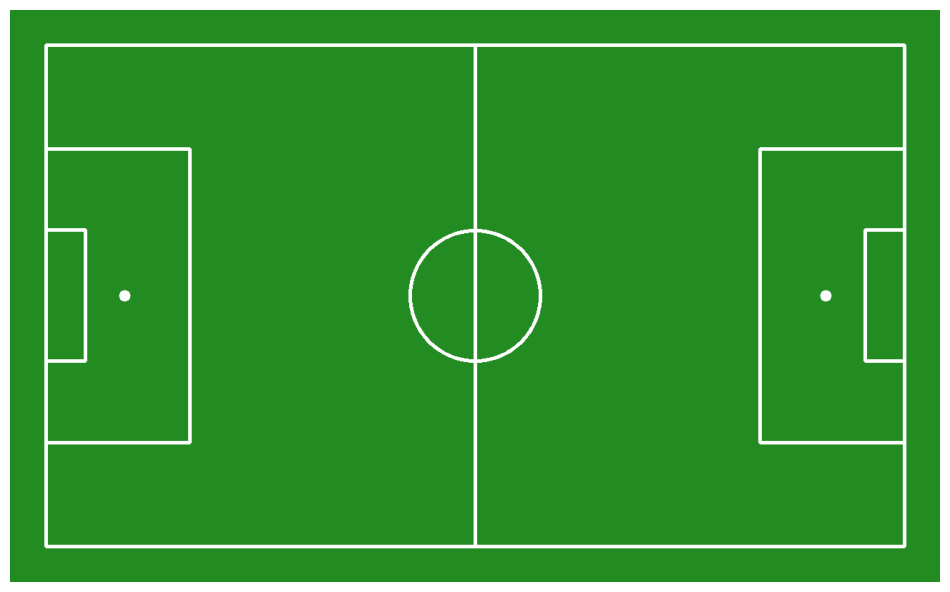

In [ ]:
from sports.annotators.soccer import draw_pitch
from sports.configs.soccer import SoccerPitchConfiguration

CONFIG = SoccerPitchConfiguration()

annotated_frame = draw_pitch(CONFIG)

sv.plot_image(annotated_frame)

In [ ]:
import numpy as np
import supervision as sv
import cv2
from tqdm import tqdm
from sports.common.view import ViewTransformer

SOURCE_VIDEO_PATH = "/content/drive/MyDrive/1223.mp4"
OUTPUT_VIDEO_PATH = "/content/output_transformed.mp4"

# Khởi tạo annotators
edge_annotator = sv.EdgeAnnotator(
    color=sv.Color.from_hex('#00BFFF'),
    thickness=2, edges=CONFIG.edges)
vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8)
vertex_annotator_2 = sv.VertexAnnotator(
    color=sv.Color.from_hex('#00BFFF'),
    radius=8)

# Đọc thông tin video
video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=200)

# Khởi tạo video writer
video_writer = cv2.VideoWriter(
    OUTPUT_VIDEO_PATH,
    cv2.VideoWriter_fourcc(*'mp4v'),
    video_info.fps,
    (video_info.width, video_info.height)
)

# Xử lý từng frame
for frame in tqdm(frame_generator, total=video_info.total_frames-200):
    # Phát hiện keypoints
    result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    key_points = sv.KeyPoints.from_inference(result)

    # Lọc keypoints theo confidence threshold
    if len(key_points.confidence) > 0:  # Kiểm tra có keypoints không
        filter = key_points.confidence[0] > 0.5
        frame_reference_points = key_points.xy[0][filter]
        frame_reference_key_points = sv.KeyPoints(
            xy=frame_reference_points[np.newaxis, ...]
        )

        pitch_reference_points = np.array(CONFIG.vertices)[filter]

        # Tạo transformer
        transformer = ViewTransformer(
            source=pitch_reference_points,
            target=frame_reference_points
        )

        pitch_all_points = np.array(CONFIG.vertices)
        frame_all_points = transformer.transform_points(points=pitch_all_points)

        frame_all_key_points = sv.KeyPoints(xy=frame_all_points[np.newaxis, ...])

        # Vẽ annotation
        annotated_frame = frame.copy()
        annotated_frame = edge_annotator.annotate(
            scene=annotated_frame,
            key_points=frame_all_key_points)
        annotated_frame = vertex_annotator_2.annotate(
            scene=annotated_frame,
            key_points=frame_all_key_points)
        annotated_frame = vertex_annotator.annotate(
            scene=annotated_frame,
            key_points=frame_reference_key_points)
    else:
        annotated_frame = frame.copy()

    # Ghi frame vào video
    video_writer.write(annotated_frame)

# Đóng video writer
video_writer.release()

print(f"Video đã được lưu tại: {OUTPUT_VIDEO_PATH}")

100%|██████████| 101/101 [00:04<00:00, 20.55it/s]

Video đã được lưu tại: /content/output_transformed.mp4


# PROJECT BALL, PLAYERS AND REFERIES ON PITCH

In [ ]:
import supervision as sv
from tqdm import tqdm
from sports.common.team import TeamClassifier

# Cấu hình đường dẫn và tham số
SOURCE_VIDEO_PATH = "/content/drive/MyDrive/1223.mp4"
PLAYER_ID = 2      # ID của class người chơi trong model detection
STRIDE = 30        # Bước nhảy frame (cứ 30 frame thì xử lý 1 frame)

# Khởi tạo frame generator với stride để giảm số lượng frame cần xử lý
# Ví dụ: stride=30 nghĩa là cứ 30 frame sẽ lấy 1 frame để xử lý
frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VIDEO_PATH,
    stride=STRIDE
)

# Khởi tạo list để lưu các crop ảnh của cầu thủ
crops = []

# Lặp qua từng frame với thanh progress bar
for frame in tqdm(frame_generator, desc='collecting crops'):
    # Detect các đối tượng trong frame với confidence threshold 0.3
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]

    # Chuyển đổi kết quả inference thành đối tượng Detections của supervision
    detections = sv.Detections.from_inference(result)

    # Lọc ra chỉ các detection của cầu thủ (class_id = PLAYER_ID)
    players_detections = detections[detections.class_id == PLAYER_ID]

    # Cắt ảnh của từng cầu thủ từ frame gốc dựa trên bounding box (xyxy)
    # xyxy là tọa độ [x1, y1, x2, y2] của bounding box
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]

    # Thêm các crop vào danh sách tổng
    crops += players_crops

# Khởi tạo model phân loại đội bóng, sử dụng GPU để tăng tốc
team_classifier = TeamClassifier(device="cuda")

# Huấn luyện model phân loại với các crop ảnh đã thu thập
# Model sẽ tự động phân cụm các cầu thủ thành các đội khác nhau
# dựa trên đặc trưng màu sắc trang phục
team_classifier.fit(crops)

collecting crops: 11it [00:01,  7.27it/s]
Embedding extraction: 9it [00:01,  5.11it/s]


In [ ]:
import cv2
from typing import Optional
import numpy as np

def draw_pitch_voronoi_diagram_2(
    config: SoccerPitchConfiguration,
    team_1_xy: np.ndarray,  # Tọa độ các cầu thủ đội 1
    team_2_xy: np.ndarray,  # Tọa độ các cầu thủ đội 2
    team_1_color: sv.Color = sv.Color.RED,  # Màu vùng kiểm soát đội 1
    team_2_color: sv.Color = sv.Color.WHITE,  # Màu vùng kiểm soát đội 2
    opacity: float = 0.5,  # Độ trong suốt của diagram
    padding: int = 50,  # Padding xung quanh sân
    scale: float = 0.1,  # Tỉ lệ thu nhỏ kích thước sân
    pitch: Optional[np.ndarray] = None  # Ảnh sân bóng có sẵn (nếu có)
) -> np.ndarray:
    """
    Vẽ Voronoi diagram trên sân bóng đá để thể hiện vùng kiểm soát của 2 đội
    với hiệu ứng chuyển màu mượt mà
    """
    # Tạo ảnh sân mới nếu không có sẵn
    if pitch is None:
        pitch = draw_pitch(
            config=config,
            padding=padding,
            scale=scale
        )

    # Tính toán kích thước sân sau khi scale
    scaled_width = int(config.width * scale)
    scaled_length = int(config.length * scale)

    # Tạo ảnh trống cho Voronoi diagram
    voronoi = np.zeros_like(pitch, dtype=np.uint8)

    # Chuyển đổi màu sang định dạng BGR
    team_1_color_bgr = np.array(team_1_color.as_bgr(), dtype=np.uint8)
    team_2_color_bgr = np.array(team_2_color.as_bgr(), dtype=np.uint8)

    # Tạo lưới tọa độ cho toàn bộ sân
    y_coordinates, x_coordinates = np.indices((
        scaled_width + 2 * padding,
        scaled_length + 2 * padding
    ))

    # Điều chỉnh tọa độ theo padding
    y_coordinates -= padding
    x_coordinates -= padding

    def calculate_distances(xy, x_coordinates, y_coordinates):
        """Tính khoảng cách từ mỗi điểm trên sân đến vị trí các cầu thủ"""
        return np.sqrt((xy[:, 0][:, None, None] * scale - x_coordinates) ** 2 +
                      (xy[:, 1][:, None, None] * scale - y_coordinates) ** 2)

    # Tính khoảng cách đến cầu thủ gần nhất của mỗi đội
    distances_team_1 = calculate_distances(team_1_xy, x_coordinates, y_coordinates)
    distances_team_2 = calculate_distances(team_2_xy, x_coordinates, y_coordinates)
    min_distances_team_1 = np.min(distances_team_1, axis=0)
    min_distances_team_2 = np.min(distances_team_2, axis=0)

    # Tạo hiệu ứng chuyển màu mượt mà
    steepness = 15  # Độ dốc của chuyển màu (càng cao càng sắc nét)
    distance_ratio = min_distances_team_2 / np.clip(min_distances_team_1 + min_distances_team_2, a_min=1e-5, a_max=None)
    blend_factor = np.tanh((distance_ratio - 0.5) * steepness) * 0.5 + 0.5

    # Áp dụng chuyển màu cho từng kênh BGR
    for c in range(3):
        voronoi[:, :, c] = (blend_factor * team_1_color_bgr[c] +
                           (1 - blend_factor) * team_2_color_bgr[c]).astype(np.uint8)

    # Kết hợp Voronoi diagram với ảnh sân
    overlay = cv2.addWeighted(voronoi, opacity, pitch, 1 - opacity, 0)

    return overlay

# TEST CÁC BIỂU ĐỒ

In [ ]:
import supervision as sv
import cv2
import numpy as np
from tqdm import tqdm
from sports.annotators.soccer import (
    draw_pitch,
    draw_points_on_pitch,
    draw_pitch_voronoi_diagram
)

# Định nghĩa hàm resolve_goalkeepers_team_id
def resolve_goalkeepers_team_id(players_detections, goalkeepers_detections):
    """
    Xác định đội cho thủ môn dựa trên vị trí tương đối với các cầu thủ
    """
    goalkeeper_team_ids = []

    for goalkeeper_xyxy in goalkeepers_detections.xyxy:
        # Lấy tọa độ trung tâm của thủ môn
        gk_center = (goalkeeper_xyxy[0] + goalkeeper_xyxy[2]) / 2

        # Tính khoảng cách đến các cầu thủ của mỗi đội
        team_0_distances = []
        team_1_distances = []

        for player_idx, player_xyxy in enumerate(players_detections.xyxy):
            player_center = (player_xyxy[0] + player_xyxy[2]) / 2
            distance = abs(gk_center - player_center)

            if players_detections.class_id[player_idx] == 0:
                team_0_distances.append(distance)
            else:
                team_1_distances.append(distance)

        # Gán thủ môn vào đội có cầu thủ gần nhất
        if min(team_0_distances or [float('inf')]) < min(team_1_distances or [float('inf')]):
            goalkeeper_team_ids.append(0)
        else:
            goalkeeper_team_ids.append(1)

    return np.array(goalkeeper_team_ids)

# Định nghĩa đường dẫn input/output video
SOURCE_VIDEO_PATH = "/content/drive/MyDrive/1223.mp4"
OUTPUT_VIDEO_PATH = "/content/output_last.mp4"

# Định nghĩa các ID cho các đối tượng
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

# Khởi tạo các annotator để vẽ
ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)

label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)

triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=20, height=17
)

# Khởi tạo tracker
tracker = sv.ByteTrack()
tracker.reset()

# Lấy thông tin video gốc
cap = cv2.VideoCapture(SOURCE_VIDEO_PATH)
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
cap.release()

# Định nghĩa kích thước cho các visualization
PITCH_VIEW_WIDTH = 400
PITCH_VIEW_HEIGHT = 300
COMBINED_WIDTH = frame_width
COMBINED_HEIGHT = frame_height + PITCH_VIEW_HEIGHT  # Tăng chiều cao để chứa thêm view

# Khởi tạo VideoWriter với kích thước mới
video_writer = cv2.VideoWriter(
    OUTPUT_VIDEO_PATH,
    cv2.VideoWriter_fourcc(*'mp4v'),
    fps,
    (COMBINED_WIDTH, COMBINED_HEIGHT)
)

# Tạo frame generator
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

# Xử lý từng frame với thanh tiến trình
for frame in tqdm(frame_generator, total=total_frames, desc="Processing video"):
    # Detection và tracking
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)

    ball_detections = detections[detections.class_id == BALL_ID]
    ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

    all_detections = detections[detections.class_id != BALL_ID]
    all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
    all_detections = tracker.update_with_detections(detections=all_detections)

    goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
    players_detections = all_detections[all_detections.class_id == PLAYER_ID]
    referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

    # Team classification
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
    players_detections.class_id = team_classifier.predict(players_crops)
    goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
        players_detections, goalkeepers_detections)
    referees_detections.class_id -= 1

    all_detections = sv.Detections.merge([
        players_detections, goalkeepers_detections, referees_detections])

    # Tạo labels
    labels = [f"#{tracker_id}" for tracker_id in all_detections.tracker_id]
    all_detections.class_id = all_detections.class_id.astype(int)

    # 1. Tạo frame với annotation
    annotated_frame = frame.copy()
    annotated_frame = ellipse_annotator.annotate(
        scene=annotated_frame,
        detections=all_detections)
    annotated_frame = label_annotator.annotate(
        scene=annotated_frame,
        detections=all_detections,
        labels=labels)
    annotated_frame = triangle_annotator.annotate(
        scene=annotated_frame,
        detections=ball_detections)

    # Detect pitch keypoints và transform coordinates
    result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    key_points = sv.KeyPoints.from_inference(result)

    filter = key_points.confidence[0] > 0.5
    frame_reference_points = key_points.xy[0][filter]
    pitch_reference_points = np.array(CONFIG.vertices)[filter]

    transformer = ViewTransformer(
        source=frame_reference_points,
        target=pitch_reference_points
    )

    frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    pitch_ball_xy = transformer.transform_points(points=frame_ball_xy)

    players_xy = players_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    pitch_players_xy = transformer.transform_points(points=players_xy)

    referees_xy = referees_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    pitch_referees_xy = transformer.transform_points(points=referees_xy)

    # 2. Tạo pitch view
    pitch_view = draw_pitch(CONFIG)
    pitch_view = draw_points_on_pitch(
        config=CONFIG,
        xy=pitch_ball_xy,
        face_color=sv.Color.WHITE,
        edge_color=sv.Color.BLACK,
        radius=10,
        pitch=pitch_view)

    pitch_view = draw_points_on_pitch(
        config=CONFIG,
        xy=pitch_players_xy[players_detections.class_id == 0],
        face_color=sv.Color.from_hex('00BFFF'),
        edge_color=sv.Color.BLACK,
        radius=16,
        pitch=pitch_view)

    pitch_view = draw_points_on_pitch(
        config=CONFIG,
        xy=pitch_players_xy[players_detections.class_id == 1],
        face_color=sv.Color.from_hex('FF1493'),
        edge_color=sv.Color.BLACK,
        radius=16,
        pitch=pitch_view)

    pitch_view = draw_points_on_pitch(
        config=CONFIG,
        xy=pitch_referees_xy,
        face_color=sv.Color.from_hex('FFD700'),
        edge_color=sv.Color.BLACK,
        radius=16,
        pitch=pitch_view)

    # 3. Tạo voronoi view
    voronoi_view = draw_pitch(CONFIG)
    voronoi_view = draw_pitch_voronoi_diagram(
        config=CONFIG,
        team_1_xy=pitch_players_xy[players_detections.class_id == 0],
        team_2_xy=pitch_players_xy[players_detections.class_id == 1],
        team_1_color=sv.Color.from_hex('00BFFF'),
        team_2_color=sv.Color.from_hex('FF1493'),
        pitch=voronoi_view)

    # Thêm một voronoi view khác với màu nền khác
    voronoi_view_2 = draw_pitch(
        config=CONFIG,
        background_color=sv.Color.WHITE,
        line_color=sv.Color.BLACK
    )
    voronoi_view_2 = draw_pitch_voronoi_diagram(
        config=CONFIG,
        team_1_xy=pitch_players_xy[players_detections.class_id == 0],
        team_2_xy=pitch_players_xy[players_detections.class_id == 1],
        team_1_color=sv.Color.from_hex('00BFFF'),
        team_2_color=sv.Color.from_hex('FF1493'),
        pitch=voronoi_view_2)

    # Resize các view
    pitch_view = cv2.resize(pitch_view, (PITCH_VIEW_WIDTH, PITCH_VIEW_HEIGHT))
    voronoi_view = cv2.resize(voronoi_view, (PITCH_VIEW_WIDTH, PITCH_VIEW_HEIGHT))
    voronoi_view_2 = cv2.resize(voronoi_view_2, (PITCH_VIEW_WIDTH, PITCH_VIEW_HEIGHT))

    # Tạo frame tổng hợp
    combined_frame = np.zeros((COMBINED_HEIGHT, COMBINED_WIDTH, 3), dtype=np.uint8)

    # Đặt video gốc ở trên
    combined_frame[:frame_height, :frame_width] = annotated_frame

    # Đặt các view vào hàng ngang dưới cùng
    combined_frame[frame_height:, :PITCH_VIEW_WIDTH] = pitch_view
    combined_frame[frame_height:, PITCH_VIEW_WIDTH:2*PITCH_VIEW_WIDTH] = voronoi_view
    combined_frame[frame_height:, 2*PITCH_VIEW_WIDTH:3*PITCH_VIEW_WIDTH] = voronoi_view_2

    # Thêm text giải thích
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(combined_frame, "Original Video", (10, 30), font, 1, (255, 255, 255), 2)
    cv2.putText(combined_frame, "Top-down View", (10, frame_height + 30), font, 1, (255, 255, 255), 2)
    cv2.putText(combined_frame, "Team Control Areas (Dark)", (PITCH_VIEW_WIDTH + 10, frame_height + 30), font, 1, (255, 255, 255), 2)
    cv2.putText(combined_frame, "Team Control Areas (Light)", (2*PITCH_VIEW_WIDTH + 10, frame_height + 30), font, 1, (255, 255, 255), 2)

    # Ghi frame vào video
    video_writer.write(cv2.cvtColor(combined_frame, cv2.COLOR_RGB2BGR))

print("\nVideo processing completed!")
video_writer.release()

# KẾT QUẢ CUỐI CÙNG(BAO GỒM CHIA ĐỘI VÀ CÁC BIỂU ĐỒ CẦN THIẾT)

In [ ]:
# import supervision as sv
# import cv2
# import numpy as np
# from ultralytics import solutions
# from tqdm import tqdm
# from sports.annotators.soccer import (
#     draw_pitch,
#     draw_points_on_pitch,
#     draw_pitch_voronoi_diagram
# )
# from ultralytics import SAM
# import torch


# # Định nghĩa đường dẫn input/output video
# SOURCE_VIDEO_PATH = "/content/drive/MyDrive/1226.mp4"
# OUTPUT_VIDEO_PATH = "/content/1223.mp4"

# # Định nghĩa các ID cho các đối tượng
# BALL_ID = 0
# GOALKEEPER_ID = 1
# PLAYER_ID = 2
# REFEREE_ID = 3

# # Khởi tạo heatmap object
# heatmap = solutions.Heatmap(
#     show=True,
#     colormap=cv2.COLORMAP_PARULA,
#     show_in=True,
#     show_out=True,
#     line_width=2
# )

# # Khởi tạo các annotator để vẽ
# ellipse_annotator = sv.EllipseAnnotator(
#     color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
#     thickness=2
# )

# label_annotator = sv.LabelAnnotator(
#     color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
#     text_color=sv.Color.from_hex('#000000'),
#     text_position=sv.Position.BOTTOM_CENTER
# )
# # video_writer.release()
# triangle_annotator = sv.TriangleAnnotator(
#     color=sv.Color.from_hex('#FFD700'),
#     base=20, height=17
# )

# # Khởi tạo tracker
# tracker = sv.ByteTrack()
# tracker.reset()

# # Lấy thông tin video gốc
# cap = cv2.VideoCapture(SOURCE_VIDEO_PATH)
# frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
# frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
# fps = int(cap.get(cv2.CAP_PROP_FPS))
# total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
# cap.release()

# # Định nghĩa kích thước cho các visualization
# PITCH_VIEW_WIDTH = 400
# PITCH_VIEW_HEIGHT = 300
# COMBINED_WIDTH = frame_width + PITCH_VIEW_WIDTH
# COMBINED_HEIGHT = frame_height

# # Khởi tạo VideoWriter với kích thước mới
# video_writer = cv2.VideoWriter(
#     OUTPUT_VIDEO_PATH,
#     cv2.VideoWriter_fourcc(*'mp4v'),
#     fps,
#     (COMBINED_WIDTH, COMBINED_HEIGHT)
# )

# # Tạo frame generator
# frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

# # Thêm các đường dẫn SAM
# SAM_CHECKPOINT_PATH = '/content/drive/MyDrive/checkpoint.pt'
# SAM_MODEL_PATH = 'sam2.1_b.pt'

# # Thêm kiểm tra và cấu hình GPU
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# print(f"Using device: {device}")

# # Sửa phần khởi tạo SAM model
# sam_model = SAM(SAM_MODEL_PATH)
# sam_model.to(device)  # Move model to GPU
# checkpoint = torch.load(SAM_CHECKPOINT_PATH, map_location=device)
# if 'model' in checkpoint:
#     sam_model.model.load_state_dict(checkpoint['model'])
# else:
#     print("Không tìm thấy weights trong checkpoint")

# # Xử lý từng frame với thanh tiến trình
# for frame in tqdm(frame_generator, total=total_frames, desc="Processing video"):
#     # Chuyển frame sang tensor trên GPU nếu cần xử lý với PyTorch
#     if isinstance(frame, torch.Tensor):
#         frame = frame.to(device)

#     # Detection và tracking
#     result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
#     detections = sv.Detections.from_inference(result)

#     ball_detections = detections[detections.class_id == BALL_ID]
#     ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

#     all_detections = detections[detections.class_id != BALL_ID]
#     all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
#     all_detections = tracker.update_with_detections(detections=all_detections)

#     goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
#     players_detections = all_detections[all_detections.class_id == PLAYER_ID]
#     referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

#     # Team classification
#     players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
#     players_detections.class_id = team_classifier.predict(players_crops)
#     goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
#         players_detections, goalkeepers_detections)
#     referees_detections.class_id -= 1

#     all_detections = sv.Detections.merge([
#         players_detections, goalkeepers_detections, referees_detections])

#     # Tạo labels
#     labels = [f"#{tracker_id}" for tracker_id in all_detections.tracker_id]
#     all_detections.class_id = all_detections.class_id.astype(int)

#     # 1. Tạo frame với annotation
#     annotated_frame = frame.copy()
#     annotated_frame = ellipse_annotator.annotate(
#         scene=annotated_frame,
#         detections=all_detections)
#     annotated_frame = label_annotator.annotate(
#         scene=annotated_frame,
#         detections=all_detections,
#         labels=labels)
#     annotated_frame = triangle_annotator.annotate(
#         scene=annotated_frame,
#         detections=ball_detections)

#     # Add SAM processing for ball detections
#     if len(ball_detections) > 0:
#         ball_boxes = ball_detections.xyxy
#         sam_results = sam_model(frame, bboxes=ball_boxes, verbose=False, save=False, device=device)

#         for sam_result in sam_results:
#             masks = sam_result.masks.data
#             if masks is not None:
#                 for mask in masks:
#                     mask = mask.cpu().numpy()  # Chuyển mask về CPU trước khi chuyển sang numpy
#                     mask = (mask * 255).astype(np.uint8)
#                     colored_mask = np.zeros_like(annotated_frame)
#                     colored_mask[mask > 0] = [0, 0, 255]  # Red color for ball mask
#                     annotated_frame = cv2.addWeighted(annotated_frame, 1, colored_mask, 0.5, 0)

#     # Detect pitch keypoints và transform coordinates
#     result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
#     key_points = sv.KeyPoints.from_inference(result)

#     filter = key_points.confidence[0] > 0.5
#     frame_reference_points = key_points.xy[0][filter]
#     pitch_reference_points = np.array(CONFIG.vertices)[filter]

#     transformer = ViewTransformer(
#         source=frame_reference_points,
#         target=pitch_reference_points
#     )

#     frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
#     pitch_ball_xy = transformer.transform_points(points=frame_ball_xy)

#     players_xy = players_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
#     pitch_players_xy = transformer.transform_points(points=players_xy)

#     referees_xy = referees_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
#     pitch_referees_xy = transformer.transform_points(points=referees_xy)

#     # 2. Tạo pitch view
#     pitch_view = draw_pitch(CONFIG)
#     pitch_view = draw_points_on_pitch(
#         config=CONFIG,
#         xy=pitch_ball_xy,
#         face_color=sv.Color.WHITE,
#         edge_color=sv.Color.BLACK,
#         radius=10,
#         pitch=pitch_view)

#     pitch_view = draw_points_on_pitch(
#         config=CONFIG,
#         xy=pitch_players_xy[players_detections.class_id == 0],
#         face_color=sv.Color.from_hex('00BFFF'),
#         edge_color=sv.Color.BLACK,
#         radius=16,
#         pitch=pitch_view)

#     pitch_view = draw_points_on_pitch(
#         config=CONFIG,
#         xy=pitch_players_xy[players_detections.class_id == 1],
#         face_color=sv.Color.from_hex('FF1493'),
#         edge_color=sv.Color.BLACK,
#         radius=16,
#         pitch=pitch_view)

#     pitch_view = draw_points_on_pitch(
#         config=CONFIG,
#         xy=pitch_referees_xy,
#         face_color=sv.Color.from_hex('FFD700'),
#         edge_color=sv.Color.BLACK,
#         radius=16,
#         pitch=pitch_view)

#     # 3. Tạo voronoi view
#     voronoi_view = draw_pitch(CONFIG)
#     voronoi_view = draw_pitch_voronoi_diagram(
#         config=CONFIG,
#         team_1_xy=pitch_players_xy[players_detections.class_id == 0],
#         team_2_xy=pitch_players_xy[players_detections.class_id == 1],
#         team_1_color=sv.Color.from_hex('00BFFF'),
#         team_2_color=sv.Color.from_hex('FF1493'),
#         pitch=voronoi_view)

#     # Thêm một voronoi view khác với màu nền khác
#     # Trong vòng lặp xử lý frame, sửa đổi phần tạo voronoi_view_2:
#     voronoi_view_2 = draw_pitch(
#     config=CONFIG,
#     background_color=sv.Color.WHITE,
#     line_color=sv.Color.BLACK
#     )
#     # Tạo heatmap từ vị trí của cầu thủ
#     voronoi_view_2 = draw_pitch_voronoi_diagram(
#         config=CONFIG,
#         team_1_xy=pitch_players_xy[players_detections.class_id == 0],
#         team_2_xy=pitch_players_xy[players_detections.class_id == 1],
#         team_1_color=sv.Color.from_hex('00BFFF'),
#         team_2_color=sv.Color.from_hex('FF1493'),
#         pitch=voronoi_view_2
#     )
#     # Áp dụng heatmap
#     voronoi_view_2 = heatmap.generate_heatmap(voronoi_view_2)

#     # Thêm overlay để làm nổi bật các khu vực có nhiều hoạt động
#     alpha = 0.6  # Độ trong suốt của overlay
#     overlay = voronoi_view_2.copy()
#     voronoi_view_2 = cv2.addWeighted(overlay, alpha, voronoi_view_2, 1 - alpha, 0)

#     # Thêm overlay để làm nổi bật các khu vực có nhiều hoạt động
#     alpha = 0.6  # Độ trong suốt của overlay
#     overlay = voronoi_view_2.copy()
#     voronoi_view_2 = cv2.addWeighted(overlay, alpha, voronoi_view_2, 1 - alpha, 0)

#     # Trong vòng lặp xử lý frame, thêm heatmap view
#     # Tạo heatmap view
#     heatmap_view = draw_pitch(CONFIG)
#     heatmap_view = draw_points_on_pitch(
#         config=CONFIG,
#         xy=pitch_players_xy,
#         face_color=sv.Color.RED,
#         edge_color=sv.Color.BLACK,
#         radius=16,
#         pitch=heatmap_view
#     )
#     # Áp dụng heatmap
#     heatmap_view = heatmap.generate_heatmap(heatmap_view)

#     # Thay đổi phần tạo frame tổng hợp
#     combined_frame = np.zeros((COMBINED_HEIGHT, COMBINED_WIDTH, 3), dtype=np.uint8)

#     # Đặt video gốc ở bên trái
#     combined_frame[:frame_height, :frame_width] = annotated_frame

#     # Tính toán vị trí cho các view bên phải
#     view_start_x = frame_width
#     view_height = frame_height // 4  # Chia chiều cao thành 4 phần bằng nhau

#     # Resize các view để vừa với không gian mới
#     pitch_view = cv2.resize(pitch_view, (PITCH_VIEW_WIDTH, view_height))
#     voronoi_view = cv2.resize(voronoi_view, (PITCH_VIEW_WIDTH, view_height))
#     voronoi_view_2 = cv2.resize(voronoi_view_2, (PITCH_VIEW_WIDTH, view_height))
#     heatmap_view = cv2.resize(heatmap_view, (PITCH_VIEW_WIDTH, view_height))

#     # Đặt các view dọc bên phải
#     combined_frame[0:view_height, view_start_x:] = pitch_view
#     combined_frame[view_height:2*view_height, view_start_x:] = voronoi_view
#     combined_frame[2*view_height:3*view_height, view_start_x:] = voronoi_view_2
#     combined_frame[3*view_height:4*view_height, view_start_x:] = heatmap_view

#     # Điều chỉnh vị trí text
#     font = cv2.FONT_HERSHEY_SIMPLEX
#     cv2.putText(combined_frame, "Original Video", (10, 30), font, 1, (255, 255, 255), 2)
#     cv2.putText(combined_frame, "Top-down View", (frame_width + 10, 30), font, 1, (255, 255, 255), 2)
#     cv2.putText(combined_frame, "Team Control (Dark)", (frame_width + 10, view_height + 30), font, 1, (255, 255, 255), 2)
#     cv2.putText(combined_frame, "Team Control (Light)", (frame_width + 10, 2*view_height + 30), font, 1, (255, 255, 255), 2)
#     cv2.putText(combined_frame, "Player Heatmap", (frame_width + 10, 3*view_height + 30), font, 1, (255, 255, 255), 2)

#     # Ghi frame vào video
#     # video_writer.write(cv2.cvtColor(combined_frame, cv2.COLOR_RGB2BGR))
#     video_writer.write(combined_frame)

# print("\nVideo processing completed!")
# video_writer.release()

In [ ]:
# import supervision as sv
# import cv2
# import numpy as np
# from ultralytics import solutions
# from tqdm import tqdm
# from sports.annotators.soccer import (
#     draw_pitch,
#     draw_points_on_pitch,
#     draw_pitch_voronoi_diagram
# )
# from ultralytics import SAM
# import torch


# # Định nghĩa đường dẫn input/output video
# SOURCE_VIDEO_PATH = "/content/drive/MyDrive/1223.mp4"
# OUTPUT_VIDEO_PATH = "/content/1223.mp4"

# # Định nghĩa các ID cho các đối tượng
# BALL_ID = 0
# GOALKEEPER_ID = 1
# PLAYER_ID = 2
# REFEREE_ID = 3

# # Khởi tạo heatmap object
# heatmap = solutions.Heatmap(
#     show=True,
#     colormap=cv2.COLORMAP_PARULA,
#     show_in=True,
#     show_out=True,
#     line_width=2
# )

# # Khởi tạo các annotator để vẽ
# ellipse_annotator = sv.EllipseAnnotator(
#     color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
#     thickness=2
# )

# label_annotator = sv.LabelAnnotator(
#     color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
#     text_color=sv.Color.from_hex('#000000'),
#     text_position=sv.Position.BOTTOM_CENTER
# )
# # video_writer.release()
# triangle_annotator = sv.TriangleAnnotator(
#     color=sv.Color.from_hex('#FFD700'),
#     base=20, height=17
# )

# # Khởi tạo tracker
# tracker = sv.ByteTrack()
# tracker.reset()

# # Lấy thông tin video gốc
# cap = cv2.VideoCapture(SOURCE_VIDEO_PATH)
# frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
# frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
# fps = int(cap.get(cv2.CAP_PROP_FPS))
# total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
# cap.release()

# # Định nghĩa kích thước cho các visualization
# PITCH_VIEW_WIDTH = 400
# PITCH_VIEW_HEIGHT = 300
# COMBINED_WIDTH = frame_width + PITCH_VIEW_WIDTH
# COMBINED_HEIGHT = frame_height

# # Khởi tạo VideoWriter với kích thước mới
# video_writer = cv2.VideoWriter(
#     OUTPUT_VIDEO_PATH,
#     cv2.VideoWriter_fourcc(*'mp4v'),
#     fps,
#     (COMBINED_WIDTH, COMBINED_HEIGHT)
# )

# # Tạo frame generator
# frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

# # Thêm các đường dẫn SAM
# SAM_CHECKPOINT_PATH = '/content/drive/MyDrive/checkpoint.pt'
# SAM_MODEL_PATH = 'sam2.1_b.pt'

# # Thêm kiểm tra và cấu hình GPU
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# print(f"Using device: {device}")

# # Sửa phần khởi tạo SAM model
# sam_model = SAM(SAM_MODEL_PATH)
# sam_model.to(device)  # Move model to GPU
# checkpoint = torch.load(SAM_CHECKPOINT_PATH, map_location=device)
# if 'model' in checkpoint:
#     sam_model.model.load_state_dict(checkpoint['model'])
# else:
#     print("Không tìm thấy weights trong checkpoint")

# # Xử lý từng frame với thanh tiến trình
# for frame in tqdm(frame_generator, total=total_frames, desc="Processing video"):
#     # Chuyển frame sang tensor trên GPU nếu cần xử lý với PyTorch
#     if isinstance(frame, torch.Tensor):
#         frame = frame.to(device)

#     # Detection và tracking
#     result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
#     detections = sv.Detections.from_inference(result)

#     ball_detections = detections[detections.class_id == BALL_ID]
#     ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

#     all_detections = detections[detections.class_id != BALL_ID]
#     all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
#     all_detections = tracker.update_with_detections(detections=all_detections)

#     goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
#     players_detections = all_detections[all_detections.class_id == PLAYER_ID]
#     referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

#     # Team classification
#     players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
#     players_detections.class_id = team_classifier.predict(players_crops)
#     goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
#         players_detections, goalkeepers_detections)
#     referees_detections.class_id -= 1

#     all_detections = sv.Detections.merge([
#         players_detections, goalkeepers_detections, referees_detections])

#     # Tạo labels
#     labels = [f"#{tracker_id}" for tracker_id in all_detections.tracker_id]
#     all_detections.class_id = all_detections.class_id.astype(int)

#     # 1. Tạo frame với annotation
#     annotated_frame = frame.copy()
#     annotated_frame = ellipse_annotator.annotate(
#         scene=annotated_frame,
#         detections=all_detections)
#     annotated_frame = label_annotator.annotate(
#         scene=annotated_frame,
#         detections=all_detections,
#         labels=labels)
#     annotated_frame = triangle_annotator.annotate(
#         scene=annotated_frame,
#         detections=ball_detections)

#     # Add SAM processing for ball detections
#     if len(ball_detections) > 0:
#         ball_boxes = ball_detections.xyxy
#         sam_results = sam_model(frame, bboxes=ball_boxes, verbose=False, save=False, device=device)

#         for sam_result in sam_results:
#             masks = sam_result.masks.data
#             if masks is not None:
#                 for mask in masks:
#                     mask = mask.cpu().numpy()  # Chuyển mask về CPU trước khi chuyển sang numpy
#                     mask = (mask * 255).astype(np.uint8)
#                     colored_mask = np.zeros_like(annotated_frame)
#                     colored_mask[mask > 0] = [0, 0, 255]  # Red color for ball mask
#                     annotated_frame = cv2.addWeighted(annotated_frame, 1, colored_mask, 0.5, 0)

#     # Detect pitch keypoints và transform coordinates
#     result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
#     key_points = sv.KeyPoints.from_inference(result)

#     filter = key_points.confidence[0] > 0.5
#     frame_reference_points = key_points.xy[0][filter]
#     pitch_reference_points = np.array(CONFIG.vertices)[filter]

#     transformer = ViewTransformer(
#         source=frame_reference_points,
#         target=pitch_reference_points
#     )

#     frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
#     pitch_ball_xy = transformer.transform_points(points=frame_ball_xy)

#     players_xy = players_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
#     pitch_players_xy = transformer.transform_points(points=players_xy)

#     referees_xy = referees_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
#     pitch_referees_xy = transformer.transform_points(points=referees_xy)

#     # 2. Tạo pitch view
#     pitch_view = draw_pitch(CONFIG)
#     pitch_view = draw_points_on_pitch(
#         config=CONFIG,
#         xy=pitch_ball_xy,
#         face_color=sv.Color.WHITE,
#         edge_color=sv.Color.BLACK,
#         radius=10,
#         pitch=pitch_view)

#     pitch_view = draw_points_on_pitch(
#         config=CONFIG,
#         xy=pitch_players_xy[players_detections.class_id == 0],
#         face_color=sv.Color.from_hex('00BFFF'),
#         edge_color=sv.Color.BLACK,
#         radius=16,
#         pitch=pitch_view)

#     pitch_view = draw_points_on_pitch(
#         config=CONFIG,
#         xy=pitch_players_xy[players_detections.class_id == 1],
#         face_color=sv.Color.from_hex('FF1493'),
#         edge_color=sv.Color.BLACK,
#         radius=16,
#         pitch=pitch_view)

#     pitch_view = draw_points_on_pitch(
#         config=CONFIG,
#         xy=pitch_referees_xy,
#         face_color=sv.Color.from_hex('FFD700'),
#         edge_color=sv.Color.BLACK,
#         radius=16,
#         pitch=pitch_view)

#     # 3. Tạo voronoi view
#     voronoi_view = draw_pitch(CONFIG)
#     voronoi_view = draw_pitch_voronoi_diagram(
#         config=CONFIG,
#         team_1_xy=pitch_players_xy[players_detections.class_id == 0],
#         team_2_xy=pitch_players_xy[players_detections.class_id == 1],
#         team_1_color=sv.Color.from_hex('00BFFF'),
#         team_2_color=sv.Color.from_hex('FF1493'),
#         pitch=voronoi_view)

#     # Thêm một voronoi view khác với màu nền khác
#     # Trong vòng lặp xử lý frame, sửa đổi phần tạo voronoi_view_2:
#     voronoi_view_2 = draw_pitch(
#     config=CONFIG,
#     background_color=sv.Color.WHITE,
#     line_color=sv.Color.BLACK
#     )
#     # Tạo heatmap từ vị trí của cầu thủ
#     voronoi_view_2 = draw_pitch_voronoi_diagram(
#         config=CONFIG,
#         team_1_xy=pitch_players_xy[players_detections.class_id == 0],
#         team_2_xy=pitch_players_xy[players_detections.class_id == 1],
#         team_1_color=sv.Color.from_hex('00BFFF'),
#         team_2_color=sv.Color.from_hex('FF1493'),
#         pitch=voronoi_view_2
#     )
#     # Áp dụng heatmap
#     voronoi_view_2 = heatmap.generate_heatmap(voronoi_view_2)

#     # Thêm overlay để làm nổi bật các khu vực có nhiều hoạt động
#     alpha = 0.6  # Độ trong suốt của overlay
#     overlay = voronoi_view_2.copy()
#     voronoi_view_2 = cv2.addWeighted(overlay, alpha, voronoi_view_2, 1 - alpha, 0)

#     # Thêm overlay để làm nổi bật các khu vực có nhiều hoạt động
#     alpha = 0.6  # Độ trong suốt của overlay
#     overlay = voronoi_view_2.copy()
#     voronoi_view_2 = cv2.addWeighted(overlay, alpha, voronoi_view_2, 1 - alpha, 0)

#     # Trong vòng lặp xử lý frame, thêm heatmap view
#     # Tạo heatmap view
#     heatmap_view = draw_pitch(CONFIG)
#     heatmap_view = draw_points_on_pitch(
#         config=CONFIG,
#         xy=pitch_players_xy,
#         face_color=sv.Color.RED,
#         edge_color=sv.Color.BLACK,
#         radius=16,
#         pitch=heatmap_view
#     )
#     # Áp dụng heatmap
#     heatmap_view = heatmap.generate_heatmap(heatmap_view)

#     # Thay đổi phần tạo frame tổng hợp
#     combined_frame = np.zeros((COMBINED_HEIGHT, COMBINED_WIDTH, 3), dtype=np.uint8)

#     # Đặt video gốc ở bên trái
#     combined_frame[:frame_height, :frame_width] = annotated_frame

#     # Tính toán vị trí cho các view bên phải
#     view_start_x = frame_width
#     view_height = frame_height // 4  # Chia chiều cao thành 4 phần bằng nhau

#     # Resize các view để vừa với không gian mới
#     pitch_view = cv2.resize(pitch_view, (PITCH_VIEW_WIDTH, view_height))
#     voronoi_view = cv2.resize(voronoi_view, (PITCH_VIEW_WIDTH, view_height))
#     voronoi_view_2 = cv2.resize(voronoi_view_2, (PITCH_VIEW_WIDTH, view_height))
#     heatmap_view = cv2.resize(heatmap_view, (PITCH_VIEW_WIDTH, view_height))

#     # Đặt các view dọc bên phải
#     combined_frame[0:view_height, view_start_x:] = pitch_view
#     combined_frame[view_height:2*view_height, view_start_x:] = voronoi_view
#     combined_frame[2*view_height:3*view_height, view_start_x:] = voronoi_view_2
#     combined_frame[3*view_height:4*view_height, view_start_x:] = heatmap_view

#     # Điều chỉnh vị trí text
#     font = cv2.FONT_HERSHEY_SIMPLEX
#     cv2.putText(combined_frame, "Original Video", (10, 30), font, 1, (255, 255, 255), 2)
#     cv2.putText(combined_frame, "Top-down View", (frame_width + 10, 30), font, 1, (255, 255, 255), 2)
#     cv2.putText(combined_frame, "Team Control (Dark)", (frame_width + 10, view_height + 30), font, 1, (255, 255, 255), 2)
#     cv2.putText(combined_frame, "Team Control (Light)", (frame_width + 10, 2*view_height + 30), font, 1, (255, 255, 255), 2)
#     cv2.putText(combined_frame, "Player Heatmap", (frame_width + 10, 3*view_height + 30), font, 1, (255, 255, 255), 2)

#     # Ghi frame vào video
#     # video_writer.write(cv2.cvtColor(combined_frame, cv2.COLOR_RGB2BGR))
#     video_writer.write(combined_frame)

# print("\nVideo processing completed!")
# video_writer.release()

In [ ]:
import supervision as sv
import cv2
import numpy as np
from ultralytics import solutions
from tqdm import tqdm
from sports.annotators.soccer import (
    draw_pitch,
    draw_points_on_pitch,
    draw_pitch_voronoi_diagram
)
from ultralytics import SAM
import torch


# Định nghĩa đường dẫn input/output video
SOURCE_VIDEO_PATH = "/content/drive/MyDrive/1227.mp4"
OUTPUT_VIDEO_PATH = "/content/4.mp4"

# Định nghĩa các ID cho các đối tượng
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

# Khởi tạo heatmap object
heatmap = solutions.Heatmap(
    show=True,
    colormap=cv2.COLORMAP_PARULA,
    show_in=True,
    show_out=True,
    line_width=2
)

# Khởi tạo các annotator để vẽ
ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)

label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
# video_writer.release()
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=20, height=17
)

# Khởi tạo tracker
tracker = sv.ByteTrack()
tracker.reset()

# Lấy thông tin video gốc
cap = cv2.VideoCapture(SOURCE_VIDEO_PATH)
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
cap.release()

# Định nghĩa kích thước cho các visualization
PITCH_VIEW_WIDTH = 400
PITCH_VIEW_HEIGHT = 300
COMBINED_WIDTH = frame_width + PITCH_VIEW_WIDTH
COMBINED_HEIGHT = frame_height

# Khởi tạo VideoWriter với kích thước mới
video_writer = cv2.VideoWriter(
    OUTPUT_VIDEO_PATH,
    cv2.VideoWriter_fourcc(*'mp4v'),
    fps,
    (COMBINED_WIDTH, COMBINED_HEIGHT)
)

# Tạo frame generator
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

# Thêm các đường dẫn SAM
SAM_CHECKPOINT_PATH = '/content/drive/MyDrive/checkpoint.pt'
SAM_MODEL_PATH = 'sam2.1_b.pt'

# Thêm kiểm tra và cấu hình GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Sửa phần khởi tạo SAM model
sam_model = SAM(SAM_MODEL_PATH)
sam_model.to(device)  # Move model to GPU
checkpoint = torch.load(SAM_CHECKPOINT_PATH, map_location=device)
if 'model' in checkpoint:
    sam_model.model.load_state_dict(checkpoint['model'])
else:
    print("Không tìm thấy weights trong checkpoint")

# Xử lý từng frame với thanh tiến trình
for frame in tqdm(frame_generator, total=total_frames, desc="Processing video"):
    # Chuyển frame sang tensor trên GPU nếu cần xử lý với PyTorch
    if isinstance(frame, torch.Tensor):
        frame = frame.to(device)

    # Detection và tracking
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)

    ball_detections = detections[detections.class_id == BALL_ID]
    ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

    all_detections = detections[detections.class_id != BALL_ID]
    all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
    all_detections = tracker.update_with_detections(detections=all_detections)

    goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
    players_detections = all_detections[all_detections.class_id == PLAYER_ID]
    referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

    # Team classification
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
    players_detections.class_id = team_classifier.predict(players_crops)
    goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
        players_detections, goalkeepers_detections)
    referees_detections.class_id -= 1

    all_detections = sv.Detections.merge([
        players_detections, goalkeepers_detections, referees_detections])

    # Tạo labels
    labels = [f"#{tracker_id}" for tracker_id in all_detections.tracker_id]
    all_detections.class_id = all_detections.class_id.astype(int)

    # 1. Tạo frame với annotation
    annotated_frame = frame.copy()
    annotated_frame = ellipse_annotator.annotate(
        scene=annotated_frame,
        detections=all_detections)
    annotated_frame = label_annotator.annotate(
        scene=annotated_frame,
        detections=all_detections,
        labels=labels)
    annotated_frame = triangle_annotator.annotate(
        scene=annotated_frame,
        detections=ball_detections)

    # Add SAM processing for ball detections
    if len(ball_detections) > 0:
        ball_boxes = ball_detections.xyxy
        sam_results = sam_model(frame, bboxes=ball_boxes, verbose=False, save=False, device=device)

        for sam_result in sam_results:
            masks = sam_result.masks.data
            if masks is not None:
                for mask in masks:
                    mask = mask.cpu().numpy()  # Chuyển mask về CPU trước khi chuyển sang numpy
                    mask = (mask * 255).astype(np.uint8)
                    colored_mask = np.zeros_like(annotated_frame)
                    colored_mask[mask > 0] = [0, 0, 255]  # Red color for ball mask
                    annotated_frame = cv2.addWeighted(annotated_frame, 1, colored_mask, 0.5, 0)

    # Detect pitch keypoints và transform coordinates
    result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    key_points = sv.KeyPoints.from_inference(result)

    filter = key_points.confidence[0] > 0.5
    frame_reference_points = key_points.xy[0][filter]
    pitch_reference_points = np.array(CONFIG.vertices)[filter]

    transformer = ViewTransformer(
        source=frame_reference_points,
        target=pitch_reference_points
    )

    frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    pitch_ball_xy = transformer.transform_points(points=frame_ball_xy)

    players_xy = players_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    pitch_players_xy = transformer.transform_points(points=players_xy)

    referees_xy = referees_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    pitch_referees_xy = transformer.transform_points(points=referees_xy)

    # 2. Tạo pitch view
    pitch_view = draw_pitch(CONFIG)
    pitch_view = draw_points_on_pitch(
        config=CONFIG,
        xy=pitch_ball_xy,
        face_color=sv.Color.WHITE,
        edge_color=sv.Color.BLACK,
        radius=10,
        pitch=pitch_view)

    pitch_view = draw_points_on_pitch(
        config=CONFIG,
        xy=pitch_players_xy[players_detections.class_id == 0],
        face_color=sv.Color.from_hex('00BFFF'),
        edge_color=sv.Color.BLACK,
        radius=16,
        pitch=pitch_view)

    pitch_view = draw_points_on_pitch(
        config=CONFIG,
        xy=pitch_players_xy[players_detections.class_id == 1],
        face_color=sv.Color.from_hex('FF1493'),
        edge_color=sv.Color.BLACK,
        radius=16,
        pitch=pitch_view)

    pitch_view = draw_points_on_pitch(
        config=CONFIG,
        xy=pitch_referees_xy,
        face_color=sv.Color.from_hex('FFD700'),
        edge_color=sv.Color.BLACK,
        radius=16,
        pitch=pitch_view)

    # 3. Tạo voronoi view
    voronoi_view = draw_pitch(CONFIG)
    voronoi_view = draw_pitch_voronoi_diagram(
        config=CONFIG,
        team_1_xy=pitch_players_xy[players_detections.class_id == 0],
        team_2_xy=pitch_players_xy[players_detections.class_id == 1],
        team_1_color=sv.Color.from_hex('00BFFF'),
        team_2_color=sv.Color.from_hex('FF1493'),
        pitch=voronoi_view)

    # Thêm một voronoi view khác với màu nền khác
    # Trong vòng lặp xử lý frame, sửa đổi phần tạo voronoi_view_2:
    voronoi_view_2 = draw_pitch(
        config=CONFIG,
        background_color=sv.Color.WHITE,
        line_color=sv.Color.BLACK
    )
    voronoi_view_2 = draw_pitch_voronoi_diagram_2(
        config=CONFIG,
        team_1_xy=pitch_players_xy[players_detections.class_id == 0],
        team_2_xy=pitch_players_xy[players_detections.class_id == 1],
        team_1_color=sv.Color.from_hex('00BFFF'),
        team_2_color=sv.Color.from_hex('FF1493'),
        pitch=voronoi_view_2
    )

    # Thêm vẽ các điểm
    voronoi_view_2 = draw_points_on_pitch(
        config=CONFIG,
        xy=pitch_ball_xy,
        face_color=sv.Color.WHITE,
        edge_color=sv.Color.WHITE,
        radius=8,
        thickness=1,
        pitch=voronoi_view_2
    )

    voronoi_view_2 = draw_points_on_pitch(
        config=CONFIG,
        xy=pitch_players_xy[players_detections.class_id == 0],
        face_color=sv.Color.from_hex('00BFFF'),
        edge_color=sv.Color.WHITE,
        radius=16,
        thickness=1,
        pitch=voronoi_view_2
    )

    voronoi_view_2 = draw_points_on_pitch(
        config=CONFIG,
        xy=pitch_players_xy[players_detections.class_id == 1],
        face_color=sv.Color.from_hex('FF1493'),
        edge_color=sv.Color.WHITE,
        radius=16,
        thickness=1,
        pitch=voronoi_view_2
    )

    # Áp dụng heatmap
    voronoi_view_2 = heatmap.generate_heatmap(voronoi_view_2)

    # Thêm overlay để làm nổi bật các khu vực có nhiều hoạt động
    alpha = 0.6  # Độ trong suốt của overlay
    overlay = voronoi_view_2.copy()
    voronoi_view_2 = cv2.addWeighted(overlay, alpha, voronoi_view_2, 1 - alpha, 0)

    # Thêm overlay để làm nổi bật các khu vực có nhiều hoạt động
    alpha = 0.6  # Độ trong suốt của overlay
    overlay = voronoi_view_2.copy()
    voronoi_view_2 = cv2.addWeighted(overlay, alpha, voronoi_view_2, 1 - alpha, 0)

    # Trong vòng lặp xử lý frame, thêm heatmap view
    # Tạo heatmap view
    heatmap_view = draw_pitch(CONFIG)
    heatmap_view = draw_points_on_pitch(
        config=CONFIG,
        xy=pitch_players_xy,
        face_color=sv.Color.RED,
        edge_color=sv.Color.BLACK,
        radius=16,
        pitch=heatmap_view
    )
    # Áp dụng heatmap
    heatmap_view = heatmap.generate_heatmap(heatmap_view)

    # Thay đổi phần tạo frame tổng hợp
    combined_frame = np.zeros((COMBINED_HEIGHT, COMBINED_WIDTH, 3), dtype=np.uint8)

    # Đặt video gốc ở bên trái
    combined_frame[:frame_height, :frame_width] = annotated_frame

    # Tính toán vị trí cho các view bên phải
    view_start_x = frame_width
    view_height = frame_height // 4  # Chia chiều cao thành 4 phần bằng nhau

    # Resize các view để vừa với không gian mới
    pitch_view = cv2.resize(pitch_view, (PITCH_VIEW_WIDTH, view_height))
    voronoi_view = cv2.resize(voronoi_view, (PITCH_VIEW_WIDTH, view_height))
    voronoi_view_2 = cv2.resize(voronoi_view_2, (PITCH_VIEW_WIDTH, view_height))
    heatmap_view = cv2.resize(heatmap_view, (PITCH_VIEW_WIDTH, view_height))

    # Đặt các view dọc bên phải
    combined_frame[0:view_height, view_start_x:] = pitch_view
    combined_frame[view_height:2*view_height, view_start_x:] = voronoi_view
    combined_frame[2*view_height:3*view_height, view_start_x:] = voronoi_view_2
    combined_frame[3*view_height:4*view_height, view_start_x:] = heatmap_view

    # Điều chỉnh vị trí text
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(combined_frame, "Original Video", (10, 30), font, 1, (255, 255, 255), 2)
    cv2.putText(combined_frame, "Top-down View", (frame_width + 10, 30), font, 1, (255, 255, 255), 2)
    cv2.putText(combined_frame, "Team Control (Dark)", (frame_width + 10, view_height + 30), font, 1, (255, 255, 255), 2)
    cv2.putText(combined_frame, "Team Control (Light)", (frame_width + 10, 2*view_height + 30), font, 1, (255, 255, 255), 2)
    cv2.putText(combined_frame, "Player Heatmap", (frame_width + 10, 3*view_height + 30), font, 1, (255, 255, 255), 2)

    # Ghi frame vào video
    # video_writer.write(cv2.cvtColor(combined_frame, cv2.COLOR_RGB2BGR))
    video_writer.write(combined_frame)

print("\nVideo processing completed!")
video_writer.release()

Ultralytics Solutions: ✅ {'region': None, 'show_in': True, 'show_out': True, 'colormap': 12, 'up_angle': 145.0, 'down_angle': 90, 'kpts': [6, 8, 10], 'analytics_type': 'line', 'json_file': None, 'records': 5, 'show': True, 'line_width': 2}
WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()

Using device: cuda


Processing video:   0%|          | 0/18764 [00:00<?, ?it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 1/18764 [00:01<6:56:57,  1.33s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 1 clock, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.8ms
Speed: 2.6ms preprocess, 14.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 2/18764 [00:02<6:27:56,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 3/18764 [00:03<5:52:58,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 4/18764 [00:04<5:37:55,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.96it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 5/18764 [00:05<5:29:15,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 6/18764 [00:06<5:24:32,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 1 clock, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 7/18764 [00:07<5:21:11,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 8/18764 [00:08<5:18:34,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.1ms
Speed: 3.9ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 9/18764 [00:09<5:18:32,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 10/18764 [00:10<5:17:07,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 11/18764 [00:11<5:15:08,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 12/18764 [00:12<5:16:33,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 1 tv, 1 clock, 12.6ms
Speed: 2.6ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 13/18764 [00:13<5:17:28,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 1 clock, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 14/18764 [00:14<5:19:21,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 15/18764 [00:15<5:19:42,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.2ms
Speed: 2.3ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 16/18764 [00:16<5:20:28,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 1 clock, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 17/18764 [00:17<5:18:03,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 1 clock, 12.0ms
Speed: 3.3ms preprocess, 12.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 18/18764 [00:18<5:24:51,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 19/18764 [00:19<5:21:33,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 20/18764 [00:20<5:18:13,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 21/18764 [00:21<5:17:22,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 1 clock, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 22/18764 [00:22<5:16:55,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 23/18764 [00:23<5:15:03,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 24/18764 [00:24<5:28:00,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 25/18764 [00:25<5:23:21,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.51it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 26/18764 [00:26<5:15:58,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.51it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 27/18764 [00:27<5:24:02,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 28/18764 [00:29<5:20:49,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 29/18764 [00:29<5:14:51,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 1 clock, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 30/18764 [00:30<5:13:58,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 1 clock, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 31/18764 [00:31<5:12:36,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 tv, 1 clock, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 32/18764 [00:32<5:10:50,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 33/18764 [00:34<5:24:25,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 34/18764 [00:35<5:21:24,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 35/18764 [00:36<5:19:31,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 36/18764 [00:37<5:17:08,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 37/18764 [00:38<5:15:37,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 38/18764 [00:39<5:14:19,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 39/18764 [00:40<5:13:14,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 40/18764 [00:41<5:25:58,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 1 clock, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 41/18764 [00:42<5:35:47,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 42/18764 [00:43<5:28:28,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 43/18764 [00:44<5:36:32,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 44/18764 [00:45<5:41:49,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 45/18764 [00:46<5:34:29,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 1 tennis racket, 11.4ms
Speed: 2.7ms preprocess, 11.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 46/18764 [00:47<5:38:09,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 1 clock, 13.4ms
Speed: 2.7ms preprocess, 13.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 47/18764 [00:48<5:27:58,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 48/18764 [00:49<5:36:22,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 1 clock, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 49/18764 [00:51<5:41:54,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 50/18764 [00:52<5:46:27,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 51/18764 [00:53<5:31:48,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 52/18764 [00:54<5:22:51,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 53/18764 [00:55<5:15:32,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 54/18764 [00:56<5:10:35,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 tv, 1 clock, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 55/18764 [00:56<5:07:31,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.55it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 56/18764 [00:57<5:05:10,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 57/18764 [00:58<5:04:39,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 58/18764 [00:59<5:07:16,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 1 clock, 12.8ms
Speed: 2.9ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 3.1ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 59/18764 [01:00<5:10:02,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 60/18764 [01:01<5:06:20,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 61/18764 [01:02<5:08:15,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 62/18764 [01:03<5:11:34,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 63/18764 [01:04<5:13:58,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 64/18764 [01:05<5:16:21,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 65/18764 [01:07<5:17:45,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 66/18764 [01:08<5:16:37,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 67/18764 [01:09<5:16:37,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 68/18764 [01:10<5:14:25,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 69/18764 [01:11<5:13:58,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 70/18764 [01:12<5:14:09,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 71/18764 [01:13<5:13:55,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 1 clock, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 72/18764 [01:14<5:17:19,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 1 clock, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 73/18764 [01:15<5:14:53,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 74/18764 [01:16<5:14:09,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 75/18764 [01:17<5:12:58,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.00it/s]



0: 416x640 1 tv, 1 clock, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 76/18764 [01:18<5:11:53,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 12.4ms
Speed: 3.2ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 77/18764 [01:19<5:11:51,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 1 clock, 11.5ms
Speed: 2.9ms preprocess, 11.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 78/18764 [01:20<5:16:54,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 79/18764 [01:21<5:15:20,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 80/18764 [01:22<5:10:20,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.2ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 81/18764 [01:23<5:10:41,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 82/18764 [01:24<5:08:10,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 83/18764 [01:25<5:05:41,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.19it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 84/18764 [01:26<5:06:36,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 3.2ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 85/18764 [01:26<5:04:20,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.22it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 86/18764 [01:27<5:03:18,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 87/18764 [01:28<5:02:21,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 88/18764 [01:29<5:01:41,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 1 tv, 1 clock, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 89/18764 [01:30<5:05:07,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 90/18764 [01:31<5:07:10,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.61it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 91/18764 [01:32<5:04:23,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 92/18764 [01:33<5:02:35,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   0%|          | 93/18764 [01:34<5:04:28,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 94/18764 [01:35<5:07:06,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 1 clock, 13.3ms
Speed: 2.6ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 95/18764 [01:36<5:09:04,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 96/18764 [01:37<5:05:47,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.21it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 97/18764 [01:38<5:04:49,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 1 tv, 1 clock, 11.5ms
Speed: 2.7ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 98/18764 [01:39<5:03:22,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 1 clock, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.9ms
Speed: 2.3ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 99/18764 [01:40<5:05:44,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 100/18764 [01:41<5:05:50,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 101/18764 [01:42<5:07:09,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 clock, 12.5ms
Speed: 2.9ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 3.1ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 102/18764 [01:43<5:08:28,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 103/18764 [01:44<5:09:44,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 clock, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 104/18764 [01:45<5:09:39,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 105/18764 [01:46<5:23:28,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 106/18764 [01:47<5:19:30,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 107/18764 [01:48<5:18:17,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 108/18764 [01:49<5:15:55,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 109/18764 [01:50<5:15:44,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 110/18764 [01:51<5:15:00,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 111/18764 [01:52<5:14:11,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 112/18764 [01:53<5:13:37,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 113/18764 [01:54<5:12:47,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 114/18764 [01:55<5:12:22,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 clock, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 115/18764 [01:56<5:12:11,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.99it/s]



0: 416x640 1 clock, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 116/18764 [01:57<5:11:29,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 117/18764 [01:58<5:07:48,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 118/18764 [01:59<5:06:22,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 clock, 13.3ms
Speed: 2.4ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 119/18764 [02:00<5:22:20,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 3.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 120/18764 [02:02<5:32:02,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.4ms
Speed: 3.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 121/18764 [02:03<5:39:15,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 122/18764 [02:04<5:31:07,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 1 clock, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 123/18764 [02:05<5:26:38,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 124/18764 [02:06<5:21:05,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 125/18764 [02:07<5:17:41,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.4ms
Speed: 2.7ms preprocess, 14.4ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 126/18764 [02:08<5:19:27,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 127/18764 [02:09<5:17:25,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.7ms
Speed: 3.4ms preprocess, 11.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 128/18764 [02:10<5:15:12,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 129/18764 [02:11<5:31:01,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 130/18764 [02:12<5:41:39,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 131/18764 [02:13<5:48:59,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 132/18764 [02:14<5:37:41,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 133/18764 [02:16<5:46:59,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 134/18764 [02:17<5:48:44,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 3.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 135/18764 [02:18<5:53:31,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 14.8ms
Speed: 2.9ms preprocess, 14.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 136/18764 [02:19<5:45:21,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 3.6ms preprocess, 10.6ms inference, 2.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 137/18764 [02:20<5:38:42,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 11.7ms
Speed: 2.9ms preprocess, 11.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 138/18764 [02:21<5:39:16,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 139/18764 [02:22<5:34:41,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 3.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 3.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 140/18764 [02:23<5:30:19,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.6ms
Speed: 3.1ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 141/18764 [02:24<5:27:16,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 1 clock, 11.2ms
Speed: 3.5ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 142/18764 [02:25<5:26:18,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 143/18764 [02:26<5:22:10,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 144/18764 [02:27<5:22:23,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 145/18764 [02:28<5:19:53,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 146/18764 [02:29<5:17:16,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 147/18764 [02:30<5:16:22,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 148/18764 [02:31<5:14:36,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 149/18764 [02:32<5:13:16,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 150/18764 [02:33<5:13:06,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 151/18764 [02:34<5:10:22,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 152/18764 [02:35<5:08:24,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 153/18764 [02:36<5:08:59,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.7ms
Speed: 3.1ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 154/18764 [02:37<5:07:52,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 11.6ms
Speed: 2.7ms preprocess, 11.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.0ms
Speed: 3.7ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 155/18764 [02:38<5:07:48,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 156/18764 [02:39<5:09:45,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 clock, 10.6ms
Speed: 3.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 157/18764 [02:40<5:12:26,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 158/18764 [02:41<5:13:48,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 3.2ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 159/18764 [02:42<5:13:29,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 clock, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 160/18764 [02:43<5:12:21,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 clock, 10.9ms
Speed: 3.1ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 161/18764 [02:44<5:12:45,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 162/18764 [02:45<5:10:58,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 clock, 11.8ms
Speed: 2.7ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 3.1ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 163/18764 [02:46<5:11:07,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 164/18764 [02:47<5:07:58,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 3.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 165/18764 [02:48<5:08:22,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 3.1ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.4ms
Speed: 3.1ms preprocess, 12.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 166/18764 [02:49<5:09:53,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 167/18764 [02:50<5:07:14,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 168/18764 [02:51<5:08:01,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 clock, 11.3ms
Speed: 3.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 169/18764 [02:52<5:11:12,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 clock, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 170/18764 [02:53<5:12:00,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.7ms
Speed: 3.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 171/18764 [02:54<5:09:25,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 172/18764 [02:55<5:08:08,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 173/18764 [02:56<5:08:55,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 174/18764 [02:57<5:09:23,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 175/18764 [02:58<5:08:04,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 176/18764 [02:59<5:07:07,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 177/18764 [03:00<5:08:11,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 clock, 13.5ms
Speed: 3.4ms preprocess, 13.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 178/18764 [03:01<5:05:53,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.28it/s]



0: 416x640 (no detections), 12.5ms
Speed: 3.0ms preprocess, 12.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 179/18764 [03:02<5:02:31,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 tv, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 3.1ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 180/18764 [03:03<5:01:28,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 181/18764 [03:04<5:15:29,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.32it/s]



0: 416x640 1 clock, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 182/18764 [03:05<5:24:33,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 1 clock, 11.5ms
Speed: 2.7ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 183/18764 [03:06<5:17:23,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 clock, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 184/18764 [03:07<5:11:28,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 185/18764 [03:08<5:07:48,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 1 clock, 10.5ms
Speed: 3.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 3.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 186/18764 [03:09<5:04:26,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.91it/s]



0: 416x640 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 187/18764 [03:10<4:59:23,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.07it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 188/18764 [03:11<4:55:05,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 189/18764 [03:12<4:56:56,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 190/18764 [03:13<5:11:06,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.57it/s]



0: 416x640 1 clock, 10.7ms
Speed: 3.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 191/18764 [03:14<5:07:43,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 1 clock, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 192/18764 [03:15<5:04:57,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 193/18764 [03:16<5:03:46,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 clock, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 194/18764 [03:17<5:02:53,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 clock, 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 195/18764 [03:18<5:04:12,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.05it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.0ms
Speed: 3.1ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 196/18764 [03:19<5:02:57,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.16it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 197/18764 [03:20<5:02:07,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.25it/s]



0: 416x640 (no detections), 11.4ms
Speed: 3.2ms preprocess, 11.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 198/18764 [03:21<5:00:01,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 clock, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 199/18764 [03:22<5:09:27,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 clock, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 200/18764 [03:23<5:09:52,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 201/18764 [03:24<5:08:01,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.13it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 202/18764 [03:25<5:06:23,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.25it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 203/18764 [03:26<5:02:09,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 204/18764 [03:27<4:59:12,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 205/18764 [03:28<4:56:52,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 206/18764 [03:29<4:59:11,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 207/18764 [03:30<4:58:59,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.59it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 208/18764 [03:31<4:59:54,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.29it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 209/18764 [03:32<5:00:02,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.26it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 210/18764 [03:33<5:00:08,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 211/18764 [03:34<5:01:42,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 212/18764 [03:35<5:01:48,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 3.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 213/18764 [03:36<5:03:06,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 214/18764 [03:37<5:04:17,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 215/18764 [03:38<5:04:20,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 216/18764 [03:39<5:05:53,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 217/18764 [03:40<5:07:34,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 218/18764 [03:41<5:08:32,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 219/18764 [03:42<5:07:41,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 (no detections), 13.3ms
Speed: 2.4ms preprocess, 13.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 220/18764 [03:43<5:21:07,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 221/18764 [03:44<5:17:08,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.9ms
Speed: 3.3ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 222/18764 [03:45<5:26:26,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 223/18764 [03:46<5:34:48,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 224/18764 [03:47<5:41:50,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 12.9ms
Speed: 3.0ms preprocess, 12.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.1ms
Speed: 3.3ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 225/18764 [03:48<5:44:45,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 3.0ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 226/18764 [03:49<5:47:14,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 227/18764 [03:50<5:36:01,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.3ms
Speed: 3.3ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 228/18764 [03:52<5:39:16,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 11.8ms
Speed: 2.8ms preprocess, 11.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 229/18764 [03:53<5:41:57,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.9ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 230/18764 [03:54<5:44:49,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 231/18764 [03:55<5:45:38,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 232/18764 [03:56<5:45:06,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.28it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|          | 233/18764 [03:57<5:31:59,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.16it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|          | 234/18764 [03:58<5:33:37,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|▏         | 235/18764 [03:59<5:21:58,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.25it/s]



0: 416x640 (no detections), 11.2ms
Speed: 3.2ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|▏         | 236/18764 [04:00<5:13:18,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 clock, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 237/18764 [04:01<5:13:34,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 1 clock, 12.4ms
Speed: 3.4ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 238/18764 [04:02<5:26:35,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 clock, 11.8ms
Speed: 2.9ms preprocess, 11.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 239/18764 [04:03<5:22:12,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 240/18764 [04:04<5:32:11,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 3.3ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 241/18764 [04:06<5:40:16,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 242/18764 [04:07<5:45:08,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 clock, 11.2ms
Speed: 3.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 243/18764 [04:08<5:36:13,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.0ms
Speed: 3.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 244/18764 [04:09<5:29:38,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 245/18764 [04:10<5:37:40,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 sports ball, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 246/18764 [04:11<5:29:58,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 clock, 15.0ms
Speed: 2.9ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 247/18764 [04:12<5:25:04,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 clock, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 248/18764 [04:13<5:22:20,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 249/18764 [04:14<5:18:08,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 clock, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 250/18764 [04:15<5:31:00,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.0ms
Speed: 3.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 251/18764 [04:16<5:38:11,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 clock, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 252/18764 [04:17<5:42:27,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 clock, 13.3ms
Speed: 3.0ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 253/18764 [04:18<5:34:40,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|▏         | 254/18764 [04:19<5:26:01,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.0ms
Speed: 3.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|▏         | 255/18764 [04:20<5:20:43,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.8ms
Speed: 3.1ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|▏         | 256/18764 [04:21<5:16:26,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 3.1ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|▏         | 257/18764 [04:22<5:12:32,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|▏         | 258/18764 [04:23<5:16:41,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.9ms preprocess, 11.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 259/18764 [04:24<5:14:07,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|▏         | 260/18764 [04:25<5:10:07,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|▏         | 261/18764 [04:26<5:09:42,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 262/18764 [04:28<5:23:36,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|▏         | 263/18764 [04:29<5:16:55,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|▏         | 264/18764 [04:30<5:12:38,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|▏         | 265/18764 [04:31<5:10:24,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.2ms
Speed: 3.3ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|▏         | 266/18764 [04:32<5:08:56,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 13.2ms
Speed: 3.7ms preprocess, 13.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|▏         | 267/18764 [04:33<5:08:59,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|▏         | 268/18764 [04:34<5:20:50,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 3.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|▏         | 269/18764 [04:35<5:15:57,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 270/18764 [04:36<5:16:12,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 11.4ms
Speed: 3.2ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 271/18764 [04:37<5:15:38,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 272/18764 [04:38<5:14:31,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|▏         | 273/18764 [04:39<5:10:46,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 12.1ms
Speed: 3.1ms preprocess, 12.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.8ms
Speed: 2.9ms preprocess, 11.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|▏         | 274/18764 [04:40<5:09:04,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|▏         | 275/18764 [04:41<5:07:00,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 276/18764 [04:42<5:21:40,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|▏         | 277/18764 [04:43<5:29:41,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   1%|▏         | 278/18764 [04:44<5:37:18,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 11.1ms
Speed: 3.1ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 279/18764 [04:45<5:43:53,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 280/18764 [04:46<5:35:56,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   1%|▏         | 281/18764 [04:47<5:30:33,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 282/18764 [04:48<5:35:12,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 283/18764 [04:49<5:26:06,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 284/18764 [04:50<5:18:53,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 285/18764 [04:52<5:32:27,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 286/18764 [04:53<5:42:11,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 15.5ms
Speed: 2.9ms preprocess, 15.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 287/18764 [04:54<5:34:53,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.0ms
Speed: 2.9ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 288/18764 [04:55<5:28:04,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 12.2ms
Speed: 3.2ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 289/18764 [04:56<5:26:31,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 290/18764 [04:57<5:28:44,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 291/18764 [04:58<5:42:31,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 292/18764 [04:59<5:35:42,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 293/18764 [05:00<5:28:01,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 11.3ms
Speed: 3.0ms preprocess, 11.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 294/18764 [05:01<5:25:21,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 295/18764 [05:02<5:37:15,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.2ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 296/18764 [05:04<5:44:04,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 297/18764 [05:05<5:35:51,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.6ms
Speed: 2.8ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 298/18764 [05:06<5:30:09,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 299/18764 [05:07<5:19:59,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 300/18764 [05:08<5:16:51,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 11.4ms
Speed: 2.7ms preprocess, 11.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.3ms
Speed: 2.8ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 301/18764 [05:09<5:17:28,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.6ms
Speed: 3.2ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 302/18764 [05:10<5:13:48,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.3ms
Speed: 3.4ms preprocess, 11.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 303/18764 [05:11<5:03:31,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.93it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 1 tennis racket, 10.1ms
Speed: 2.6ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 304/18764 [05:12<4:56:12,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 1 tennis racket, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 305/18764 [05:12<4:55:51,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 14.4ms
Speed: 2.8ms preprocess, 14.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 306/18764 [05:13<4:56:17,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 307/18764 [05:14<4:54:16,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 308/18764 [05:15<4:52:52,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 309/18764 [05:16<4:52:08,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 310/18764 [05:17<4:52:47,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 clock, 12.0ms
Speed: 3.1ms preprocess, 12.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 1 tennis racket, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 311/18764 [05:18<4:59:30,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.6ms
Speed: 3.3ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 312/18764 [05:19<5:01:55,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 313/18764 [05:20<5:03:06,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 3.6ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 314/18764 [05:21<5:04:39,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 clock, 11.7ms
Speed: 3.1ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 1 tennis racket, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 315/18764 [05:22<5:07:54,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 316/18764 [05:23<5:10:38,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 317/18764 [05:24<5:09:14,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 (no detections), 11.6ms
Speed: 2.8ms preprocess, 11.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.2ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 318/18764 [05:25<5:09:02,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 319/18764 [05:26<5:07:45,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.4ms
Speed: 3.4ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 320/18764 [05:27<5:07:19,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 321/18764 [05:28<5:06:02,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 322/18764 [05:29<5:05:13,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 (no detections), 14.0ms
Speed: 2.9ms preprocess, 14.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 323/18764 [05:30<5:18:50,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.1ms
Speed: 3.4ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 324/18764 [05:32<5:27:22,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 11.4ms
Speed: 3.2ms preprocess, 11.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.3ms
Speed: 3.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 325/18764 [05:33<5:20:20,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 12.6ms
Speed: 2.3ms preprocess, 12.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 326/18764 [05:34<5:16:24,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 327/18764 [05:35<5:14:44,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 328/18764 [05:36<5:13:55,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.2ms
Speed: 2.3ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 329/18764 [05:37<5:09:54,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 clock, 11.3ms
Speed: 3.6ms preprocess, 11.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 330/18764 [05:38<5:10:36,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 331/18764 [05:39<5:09:13,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 332/18764 [05:40<5:06:55,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 333/18764 [05:41<5:07:36,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.17it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 1 tennis racket, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 334/18764 [05:41<5:01:06,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 3.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 335/18764 [05:42<5:03:58,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 clock, 11.6ms
Speed: 2.4ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 336/18764 [05:43<5:06:14,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 337/18764 [05:44<5:04:53,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 338/18764 [05:45<5:06:21,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 339/18764 [05:46<5:07:53,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 clock, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 340/18764 [05:48<5:22:09,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 clock, 12.2ms
Speed: 3.6ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 341/18764 [05:49<5:19:14,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 clock, 11.5ms
Speed: 2.3ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 342/18764 [05:50<5:16:47,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 13.2ms
Speed: 2.3ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 343/18764 [05:51<5:12:44,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 11.6ms
Speed: 3.5ms preprocess, 11.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 344/18764 [05:52<5:10:00,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 11.6ms
Speed: 3.3ms preprocess, 11.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 345/18764 [05:53<5:08:03,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 346/18764 [05:54<5:06:02,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 clock, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 347/18764 [05:55<5:07:20,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 348/18764 [05:56<5:08:10,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.28it/s]



0: 416x640 1 clock, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 13.6ms
Speed: 2.5ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 349/18764 [05:57<5:10:54,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 clock, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 350/18764 [05:58<5:11:18,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.9ms
Speed: 3.5ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 351/18764 [05:59<5:10:21,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 352/18764 [06:00<5:13:04,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 clock, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.7ms
Speed: 2.8ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 353/18764 [06:01<5:12:15,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 354/18764 [06:02<5:10:47,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 355/18764 [06:03<5:11:12,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 clock, 11.9ms
Speed: 3.4ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 356/18764 [06:04<5:11:55,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 357/18764 [06:05<5:11:02,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 358/18764 [06:06<5:10:23,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 clock, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 359/18764 [06:07<5:10:41,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 360/18764 [06:08<5:09:58,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 clock, 10.9ms
Speed: 3.3ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 361/18764 [06:09<5:10:12,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 clock, 12.0ms
Speed: 2.8ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 362/18764 [06:10<5:10:10,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 clock, 11.5ms
Speed: 3.0ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.5ms
Speed: 2.7ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 363/18764 [06:11<5:10:47,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 clock, 13.5ms
Speed: 2.5ms preprocess, 13.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 364/18764 [06:12<5:11:04,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 clock, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.7ms
Speed: 3.5ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 365/18764 [06:13<5:10:53,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 366/18764 [06:14<5:10:39,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 sports ball, 1 clock, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 367/18764 [06:15<5:10:07,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 368/18764 [06:16<5:09:32,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 369/18764 [06:17<5:09:36,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 370/18764 [06:18<5:09:31,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 clock, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 2.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 371/18764 [06:19<5:09:43,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 clock, 11.3ms
Speed: 3.3ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.4ms
Speed: 2.9ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 372/18764 [06:20<5:09:35,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 373/18764 [06:21<5:09:30,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 clock, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 374/18764 [06:22<5:10:01,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 11.6ms
Speed: 2.9ms preprocess, 11.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 375/18764 [06:23<5:07:12,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 (no detections), 12.2ms
Speed: 2.8ms preprocess, 12.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 376/18764 [06:24<5:06:29,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 12.3ms
Speed: 3.3ms preprocess, 12.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 377/18764 [06:25<5:06:29,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 11.2ms
Speed: 3.0ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 378/18764 [06:26<5:05:29,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 13.7ms
Speed: 3.5ms preprocess, 13.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.5ms
Speed: 3.5ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 379/18764 [06:27<5:10:56,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 380/18764 [06:28<5:10:25,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.0ms
Speed: 2.8ms preprocess, 12.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 381/18764 [06:29<5:08:17,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 382/18764 [06:30<5:10:00,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 1 clock, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 383/18764 [06:31<5:10:02,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 384/18764 [06:32<5:09:58,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 clock, 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 385/18764 [06:33<5:10:07,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 386/18764 [06:34<5:08:33,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 387/18764 [06:35<5:10:00,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 clock, 11.6ms
Speed: 3.0ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 13.5ms
Speed: 2.6ms preprocess, 13.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 388/18764 [06:36<5:11:10,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 1 clock, 11.6ms
Speed: 2.6ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 389/18764 [06:37<5:15:28,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 390/18764 [06:38<5:13:25,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 391/18764 [06:39<5:12:03,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 392/18764 [06:40<5:10:35,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 1 clock, 12.7ms
Speed: 3.0ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 393/18764 [06:41<5:10:34,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.6ms
Speed: 2.6ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 394/18764 [06:42<5:09:51,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 clock, 10.4ms
Speed: 3.0ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.1ms
Speed: 2.5ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 395/18764 [06:43<5:09:10,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 396/18764 [06:44<5:07:11,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 397/18764 [06:45<5:08:13,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 398/18764 [06:46<5:11:43,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 11.3ms
Speed: 3.1ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 399/18764 [06:47<5:11:03,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 400/18764 [06:48<5:11:01,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 1 tv, 1 clock, 12.4ms
Speed: 3.7ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 401/18764 [06:49<5:11:54,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 402/18764 [06:50<5:11:07,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 12.3ms
Speed: 2.7ms preprocess, 12.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 403/18764 [06:51<5:10:32,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 1 clock, 11.7ms
Speed: 2.8ms preprocess, 11.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 404/18764 [06:52<5:10:03,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 12.7ms
Speed: 3.1ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 405/18764 [06:53<5:09:36,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 1 clock, 12.2ms
Speed: 2.7ms preprocess, 12.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 406/18764 [06:54<5:10:16,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 11.8ms
Speed: 2.7ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 407/18764 [06:55<5:10:03,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 408/18764 [06:56<5:03:04,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 409/18764 [06:57<4:57:20,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.55it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.4ms
Speed: 2.3ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 410/18764 [06:58<4:53:08,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 1 clock, 11.9ms
Speed: 3.3ms preprocess, 11.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.2ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 411/18764 [06:59<5:10:32,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.20it/s]



0: 416x640 1 tv, 1 clock, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 412/18764 [07:00<5:04:08,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 413/18764 [07:01<5:05:54,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 clock, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.7ms
Speed: 3.5ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 414/18764 [07:02<5:07:51,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 415/18764 [07:03<5:08:49,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 416/18764 [07:04<5:08:08,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 417/18764 [07:05<5:08:19,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 418/18764 [07:06<5:19:10,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 419/18764 [07:07<5:16:00,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 420/18764 [07:09<5:15:00,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 421/18764 [07:10<5:13:48,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 422/18764 [07:11<5:12:30,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 clock, 12.4ms
Speed: 3.2ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 423/18764 [07:12<5:12:05,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 424/18764 [07:13<5:11:45,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 clock, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 425/18764 [07:14<5:11:25,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 426/18764 [07:15<5:11:03,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 427/18764 [07:16<5:09:08,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 clock, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.6ms
Speed: 3.6ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 428/18764 [07:17<5:08:41,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 429/18764 [07:18<5:08:40,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 1 clock, 12.5ms
Speed: 3.2ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 430/18764 [07:19<5:10:14,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 clock, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.1ms
Speed: 2.9ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 431/18764 [07:20<5:10:09,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 432/18764 [07:21<5:09:50,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 clock, 12.1ms
Speed: 3.1ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 433/18764 [07:22<5:10:47,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 clock, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 434/18764 [07:23<5:09:21,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 clock, 11.5ms
Speed: 2.9ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 435/18764 [07:24<5:09:12,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 clock, 10.4ms
Speed: 3.0ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 436/18764 [07:25<5:07:57,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 sports ball, 1 clock, 12.4ms
Speed: 2.8ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 437/18764 [07:26<5:08:18,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 438/18764 [07:27<5:08:14,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.0ms
Speed: 4.4ms preprocess, 12.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 439/18764 [07:28<5:14:02,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 13.8ms
Speed: 2.8ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 440/18764 [07:29<5:12:26,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.1ms
Speed: 3.2ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 441/18764 [07:30<5:11:52,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 clock, 13.3ms
Speed: 2.6ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 442/18764 [07:31<5:12:08,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.3ms
Speed: 2.8ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 443/18764 [07:32<5:07:04,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.01it/s]



0: 416x640 (no detections), 13.7ms
Speed: 2.6ms preprocess, 13.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 444/18764 [07:33<5:00:53,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.3ms
Speed: 3.1ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 445/18764 [07:34<4:56:27,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 446/18764 [07:35<4:53:50,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 (no detections), 12.7ms
Speed: 2.9ms preprocess, 12.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 447/18764 [07:36<5:03:54,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.53it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 448/18764 [07:37<4:54:49,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.20it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.3ms
Speed: 3.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 449/18764 [07:38<4:50:43,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.28it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 450/18764 [07:39<5:02:09,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.6ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 451/18764 [07:40<4:54:45,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 11.6ms
Speed: 3.3ms preprocess, 11.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 452/18764 [07:40<4:49:50,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 (no detections), 11.9ms
Speed: 2.6ms preprocess, 11.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 453/18764 [07:41<4:59:23,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 (no detections), 14.6ms
Speed: 3.3ms preprocess, 14.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 454/18764 [07:43<5:06:57,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 12.1ms
Speed: 3.5ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 455/18764 [07:44<5:02:06,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 456/18764 [07:45<5:10:59,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 457/18764 [07:46<5:17:22,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.5ms
Speed: 2.9ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 458/18764 [07:47<5:21:45,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 13.1ms
Speed: 2.4ms preprocess, 13.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 459/18764 [07:48<5:28:48,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 460/18764 [07:49<5:32:52,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 461/18764 [07:50<5:38:02,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 462/18764 [07:51<5:42:11,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 463/18764 [07:52<5:43:31,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 464/18764 [07:54<5:43:01,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 465/18764 [07:55<5:30:25,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.0ms
Speed: 3.1ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 466/18764 [07:56<5:36:09,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 12.6ms
Speed: 3.4ms preprocess, 12.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 12.7ms
Speed: 2.7ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 467/18764 [07:57<5:40:31,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.22it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   2%|▏         | 468/18764 [07:58<5:43:20,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   2%|▏         | 469/18764 [07:59<5:47:57,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 470/18764 [08:00<5:49:59,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.12it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 471/18764 [08:01<5:45:47,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.02it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 472/18764 [08:02<5:29:24,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.11it/s]



0: 416x640 (no detections), 14.7ms
Speed: 2.8ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 473/18764 [08:04<5:32:12,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.27it/s]



0: 416x640 (no detections), 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.3ms
Speed: 2.3ms preprocess, 11.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 474/18764 [08:04<5:19:53,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.25it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 475/18764 [08:06<5:26:05,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 476/18764 [08:07<5:30:06,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 (no detections), 12.4ms
Speed: 3.4ms preprocess, 12.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.4ms
Speed: 2.9ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 477/18764 [08:08<5:18:12,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 1 clock, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 478/18764 [08:09<5:25:07,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 479/18764 [08:10<5:14:20,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.6ms
Speed: 3.1ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 480/18764 [08:11<5:06:06,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.17it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 481/18764 [08:12<5:02:29,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.25it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.5ms
Speed: 2.6ms preprocess, 13.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 482/18764 [08:13<4:58:53,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 483/18764 [08:14<4:54:38,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 13.5ms
Speed: 2.4ms preprocess, 13.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 484/18764 [08:15<4:57:08,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.14it/s]



0: 416x640 1 clock, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 485/18764 [08:16<4:58:37,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 486/18764 [08:16<4:58:46,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 487/18764 [08:17<4:57:50,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.20it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 3.1ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 488/18764 [08:18<4:57:42,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.54it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 489/18764 [08:19<4:56:29,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 clock, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 490/18764 [08:20<4:58:20,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 491/18764 [08:21<4:57:15,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.24it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.4ms
Speed: 3.6ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 492/18764 [08:22<4:57:08,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.14it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 493/18764 [08:23<4:55:50,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 1 clock, 13.2ms
Speed: 3.1ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 494/18764 [08:24<4:55:30,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 clock, 12.5ms
Speed: 3.3ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 495/18764 [08:25<4:56:22,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 496/18764 [08:26<4:54:19,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.17it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 497/18764 [08:27<4:53:49,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.25it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 498/18764 [08:28<4:52:56,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 499/18764 [08:29<4:53:55,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 500/18764 [08:30<4:57:52,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 (no detections), 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 501/18764 [08:31<5:09:17,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.26it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 502/18764 [08:32<5:03:50,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 13.4ms
Speed: 2.9ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 503/18764 [08:33<5:01:08,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.32it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 504/18764 [08:34<5:12:38,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 505/18764 [08:35<5:06:18,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.09it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 506/18764 [08:36<5:01:34,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 507/18764 [08:37<4:57:37,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.25it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 508/18764 [08:38<4:55:15,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.23it/s]



0: 416x640 (no detections), 13.1ms
Speed: 3.3ms preprocess, 13.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 509/18764 [08:39<4:55:22,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 510/18764 [08:40<4:56:00,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 (no detections), 13.7ms
Speed: 2.7ms preprocess, 13.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.9ms
Speed: 2.5ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 511/18764 [08:41<5:10:46,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 512/18764 [08:42<5:19:41,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.27it/s]



0: 416x640 (no detections), 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.2ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 513/18764 [08:43<5:12:29,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 514/18764 [08:44<5:22:16,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.98it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 515/18764 [08:45<5:08:01,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 1 sports ball, 12.2ms
Speed: 2.8ms preprocess, 12.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 516/18764 [08:46<5:00:20,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 (no detections), 12.4ms
Speed: 2.8ms preprocess, 12.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 517/18764 [08:47<4:53:31,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.04it/s]



0: 416x640 (no detections), 13.4ms
Speed: 2.5ms preprocess, 13.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 518/18764 [08:48<4:49:15,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 519/18764 [08:49<4:49:34,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 520/18764 [08:50<4:46:57,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.99it/s]



0: 416x640 (no detections), 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.2ms
Speed: 3.3ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 521/18764 [08:51<5:02:51,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.25it/s]



0: 416x640 1 sports ball, 12.1ms
Speed: 3.1ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.4ms
Speed: 2.7ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 522/18764 [08:52<5:15:05,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.27it/s]



0: 416x640 1 sports ball, 11.5ms
Speed: 3.0ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.6ms
Speed: 2.8ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 523/18764 [08:53<5:07:10,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.12it/s]



0: 416x640 1 sports ball, 13.2ms
Speed: 2.4ms preprocess, 13.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 524/18764 [08:54<5:01:53,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 15.9ms
Speed: 2.4ms preprocess, 15.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 525/18764 [08:55<4:59:20,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 sports ball, 13.3ms
Speed: 2.9ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 526/18764 [08:56<4:55:44,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.21it/s]



0: 416x640 1 sports ball, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 527/18764 [08:57<4:52:26,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.09it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.6ms
Speed: 2.4ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 528/18764 [08:58<5:08:10,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 529/18764 [08:59<5:20:42,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.2ms
Speed: 2.3ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 530/18764 [09:00<5:28:57,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.28it/s]



0: 416x640 1 sports ball, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 531/18764 [09:01<5:28:14,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 532/18764 [09:02<5:26:23,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.97it/s]



0: 416x640 1 sports ball, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 533/18764 [09:04<5:33:12,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 14.5ms
Speed: 2.5ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 534/18764 [09:05<5:43:50,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 12.1ms
Speed: 2.8ms preprocess, 12.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 535/18764 [09:06<5:45:28,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 536/18764 [09:07<5:44:30,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 sports ball, 11.6ms
Speed: 2.4ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.9ms
Speed: 3.7ms preprocess, 11.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 537/18764 [09:08<5:42:31,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.02it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.3ms
Speed: 2.7ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 538/18764 [09:09<5:42:26,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.28it/s]



0: 416x640 3 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 539/18764 [09:10<5:37:52,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.29it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.6ms
Speed: 3.6ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 540/18764 [09:11<5:32:20,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 541/18764 [09:13<5:35:55,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 542/18764 [09:14<5:37:59,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 12.3ms
Speed: 3.3ms preprocess, 12.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 543/18764 [09:15<5:39:53,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.4ms
Speed: 2.5ms preprocess, 14.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 544/18764 [09:16<5:42:31,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.32it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.8ms
Speed: 3.5ms preprocess, 12.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 545/18764 [09:17<5:44:37,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 11.9ms
Speed: 2.7ms preprocess, 11.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 546/18764 [09:18<5:32:06,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.30it/s]



0: 416x640 (no detections), 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 547/18764 [09:19<5:24:37,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 548/18764 [09:20<5:16:54,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 14.4ms
Speed: 2.4ms preprocess, 14.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 549/18764 [09:21<5:11:00,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 550/18764 [09:22<5:09:06,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 551/18764 [09:23<5:10:59,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.8ms
Speed: 2.9ms preprocess, 13.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 552/18764 [09:24<5:13:25,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 14.4ms
Speed: 2.4ms preprocess, 14.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 553/18764 [09:25<5:11:32,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 554/18764 [09:26<5:12:11,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 555/18764 [09:27<5:08:00,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 556/18764 [09:28<5:05:27,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 557/18764 [09:29<5:04:08,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 11.8ms
Speed: 2.9ms preprocess, 11.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.6ms
Speed: 2.9ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 558/18764 [09:30<5:05:53,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 11.4ms
Speed: 3.0ms preprocess, 11.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 559/18764 [09:31<5:11:55,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 560/18764 [09:32<5:08:52,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 (no detections), 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.8ms
Speed: 2.6ms preprocess, 13.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 561/18764 [09:33<5:07:32,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 12.2ms
Speed: 2.7ms preprocess, 12.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 562/18764 [09:34<5:06:09,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 563/18764 [09:35<5:09:31,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 11.7ms
Speed: 3.1ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 564/18764 [09:36<5:12:46,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 565/18764 [09:37<5:13:46,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.7ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 566/18764 [09:39<5:15:17,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 567/18764 [09:40<5:16:41,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.25it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.2ms
Speed: 3.7ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 568/18764 [09:41<5:14:36,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.6ms
Speed: 2.3ms preprocess, 13.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 569/18764 [09:42<5:13:02,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.29it/s]



0: 416x640 (no detections), 11.8ms
Speed: 2.9ms preprocess, 11.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 570/18764 [09:43<5:25:46,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 13.5ms
Speed: 3.0ms preprocess, 13.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 571/18764 [09:44<5:20:31,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.8ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.0ms
Speed: 3.7ms preprocess, 12.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 572/18764 [09:45<5:17:44,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 12.5ms
Speed: 2.7ms preprocess, 12.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 573/18764 [09:46<5:15:24,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 (no detections), 13.4ms
Speed: 2.4ms preprocess, 13.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 574/18764 [09:47<5:14:42,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 12.0ms
Speed: 2.9ms preprocess, 12.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 575/18764 [09:48<5:13:02,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 576/18764 [09:49<5:11:36,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 577/18764 [09:50<5:11:57,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 578/18764 [09:51<5:10:00,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 579/18764 [09:52<5:08:59,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 580/18764 [09:53<5:09:11,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 581/18764 [09:54<5:09:18,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.8ms
Speed: 2.5ms preprocess, 13.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 582/18764 [09:55<5:19:49,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 13.6ms
Speed: 2.8ms preprocess, 13.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 583/18764 [09:56<5:31:02,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.24it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.9ms
Speed: 2.5ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 584/18764 [09:58<5:39:49,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 585/18764 [09:59<5:45:22,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.4ms
Speed: 2.7ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 586/18764 [10:00<5:47:49,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.9ms preprocess, 11.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 587/18764 [10:01<5:35:55,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 588/18764 [10:02<5:41:05,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 (no detections), 13.2ms
Speed: 2.7ms preprocess, 13.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.7ms
Speed: 2.5ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 589/18764 [10:03<5:44:38,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 590/18764 [10:04<5:45:46,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 591/18764 [10:06<5:47:34,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.3ms
Speed: 2.3ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 592/18764 [10:07<5:49:15,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 593/18764 [10:08<5:50:18,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 594/18764 [10:09<5:50:50,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 595/18764 [10:10<5:53:32,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 596/18764 [10:11<5:52:12,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 597/18764 [10:13<5:52:59,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 598/18764 [10:14<5:52:49,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 (no detections), 10.9ms
Speed: 3.0ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 599/18764 [10:15<5:54:25,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 600/18764 [10:16<5:53:08,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 11.5ms
Speed: 2.9ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.5ms
Speed: 2.5ms preprocess, 13.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 601/18764 [10:17<5:56:21,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 602/18764 [10:18<5:56:32,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.0ms
Speed: 3.6ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 603/18764 [10:20<5:55:29,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 13.5ms
Speed: 3.7ms preprocess, 13.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.8ms
Speed: 3.2ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 604/18764 [10:21<5:57:19,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 605/18764 [10:22<5:44:18,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.6ms
Speed: 2.6ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 606/18764 [10:23<5:48:10,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 16.4ms
Speed: 2.7ms preprocess, 16.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 607/18764 [10:24<5:39:00,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 608/18764 [10:25<5:27:59,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.30it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 609/18764 [10:26<5:38:59,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 3.1ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 610/18764 [10:27<5:44:13,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.4ms
Speed: 2.6ms preprocess, 12.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 611/18764 [10:29<5:46:07,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 12.1ms
Speed: 2.7ms preprocess, 12.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.5ms
Speed: 2.7ms preprocess, 13.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 612/18764 [10:30<5:47:27,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 11.3ms
Speed: 3.0ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 613/18764 [10:31<5:50:15,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 12.6ms
Speed: 3.2ms preprocess, 12.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.8ms
Speed: 3.7ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 614/18764 [10:32<5:56:18,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 615/18764 [10:33<5:59:57,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 616/18764 [10:35<5:59:21,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 617/18764 [10:36<5:56:42,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 13.2ms
Speed: 2.9ms preprocess, 13.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 618/18764 [10:37<5:55:28,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.32it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 619/18764 [10:38<5:55:55,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 620/18764 [10:39<5:54:40,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 621/18764 [10:40<5:54:32,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 1 tv, 11.0ms
Speed: 3.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 622/18764 [10:42<5:56:08,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 1 tv, 13.2ms
Speed: 2.4ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.2ms
Speed: 2.9ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 623/18764 [10:43<5:57:23,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 624/18764 [10:44<5:57:44,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 sports ball, 1 tv, 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 625/18764 [10:45<5:45:49,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.3ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 626/18764 [10:46<5:48:41,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 627/18764 [10:47<5:37:59,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 14.0ms
Speed: 2.3ms preprocess, 14.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 628/18764 [10:48<5:32:19,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 629/18764 [10:49<5:25:44,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   3%|▎         | 630/18764 [10:50<5:32:23,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 13.4ms
Speed: 2.5ms preprocess, 13.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 631/18764 [10:52<5:40:53,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 13.0ms
Speed: 2.4ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 632/18764 [10:53<5:45:24,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 633/18764 [10:54<5:36:35,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 clock, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 634/18764 [10:55<5:30:32,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 635/18764 [10:56<5:25:21,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 636/18764 [10:57<5:22:06,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 13.1ms
Speed: 2.7ms preprocess, 13.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 637/18764 [10:58<5:20:10,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 638/18764 [10:59<5:17:43,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 13.6ms
Speed: 2.4ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 639/18764 [11:00<5:29:32,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 tv, 1 clock, 12.9ms
Speed: 2.7ms preprocess, 12.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 640/18764 [11:01<5:37:46,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 641/18764 [11:03<5:43:04,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.86it/s]



0: 416x640 1 tv, 1 clock, 14.6ms
Speed: 2.8ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 642/18764 [11:04<5:48:36,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 1 tv, 1 clock, 13.6ms
Speed: 2.8ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 643/18764 [11:05<5:54:15,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 644/18764 [11:06<5:54:45,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.1ms
Speed: 3.7ms preprocess, 14.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 645/18764 [11:07<5:55:29,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.6ms
Speed: 2.6ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 646/18764 [11:08<5:44:02,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 647/18764 [11:10<5:35:23,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 1 clock, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 648/18764 [11:11<5:29:09,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 clock, 11.6ms
Speed: 3.0ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 649/18764 [11:12<5:24:28,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 650/18764 [11:13<5:20:08,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 651/18764 [11:14<5:17:33,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 652/18764 [11:15<5:15:47,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.4ms
Speed: 2.6ms preprocess, 13.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 653/18764 [11:16<5:14:12,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 654/18764 [11:17<5:12:36,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.5ms
Speed: 2.3ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 655/18764 [11:18<5:11:11,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   3%|▎         | 656/18764 [11:19<5:10:48,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.9ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 657/18764 [11:20<5:26:02,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 658/18764 [11:21<5:35:02,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 659/18764 [11:22<5:30:30,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 tv, 1 clock, 11.7ms
Speed: 2.6ms preprocess, 11.7ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 660/18764 [11:23<5:27:13,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 1 tennis racket, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 661/18764 [11:24<5:22:38,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 1 tennis racket, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 662/18764 [11:25<5:18:35,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 3.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 13.4ms
Speed: 2.6ms preprocess, 13.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 663/18764 [11:26<5:17:02,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 664/18764 [11:27<5:15:17,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 665/18764 [11:28<5:15:19,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 666/18764 [11:30<5:28:19,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 13.5ms
Speed: 3.6ms preprocess, 13.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 667/18764 [11:31<5:36:20,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 668/18764 [11:32<5:41:28,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 669/18764 [11:33<5:34:12,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 13.1ms
Speed: 2.6ms preprocess, 13.1ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 1 tennis racket, 13.1ms
Speed: 3.6ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 670/18764 [11:34<5:46:30,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 1 tennis racket, 13.2ms
Speed: 3.6ms preprocess, 13.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 671/18764 [11:35<5:38:57,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 1 tennis racket, 12.7ms
Speed: 2.3ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 672/18764 [11:37<5:43:53,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.21it/s]



0: 416x640 1 tv, 1 clock, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 1 tennis racket, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 673/18764 [11:38<5:45:39,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 1 tennis racket, 11.2ms
Speed: 2.3ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 674/18764 [11:39<5:46:42,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 1 tennis racket, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 675/18764 [11:40<5:47:04,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 676/18764 [11:41<5:35:58,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 677/18764 [11:42<5:28:12,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 11.5ms
Speed: 3.4ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 678/18764 [11:43<5:23:11,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 11.9ms
Speed: 2.9ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 679/18764 [11:44<5:33:29,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 680/18764 [11:45<5:26:13,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 11.2ms
Speed: 3.1ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 681/18764 [11:46<5:25:13,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 11.9ms
Speed: 3.2ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 682/18764 [11:48<5:34:34,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 683/18764 [11:49<5:40:11,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 684/18764 [11:50<5:29:05,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 685/18764 [11:51<5:23:52,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 686/18764 [11:52<5:19:54,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 687/18764 [11:53<5:32:19,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.9ms
Speed: 2.3ms preprocess, 11.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 688/18764 [11:54<5:39:39,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 12.6ms
Speed: 2.7ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 689/18764 [11:55<5:32:10,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 14.1ms
Speed: 2.8ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 690/18764 [11:56<5:26:15,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 1 tennis racket, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 691/18764 [11:57<5:22:13,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 12.4ms
Speed: 3.0ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 1 tennis racket, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 692/18764 [11:58<5:19:21,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 14.2ms
Speed: 2.6ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 693/18764 [11:59<5:17:20,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 694/18764 [12:00<5:16:13,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 695/18764 [12:01<5:14:33,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 12.9ms
Speed: 3.0ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 696/18764 [12:03<5:13:54,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 697/18764 [12:04<5:13:04,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.0ms
Speed: 3.1ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 698/18764 [12:05<5:12:35,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.7ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 699/18764 [12:06<5:12:32,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 700/18764 [12:07<5:12:16,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 13.1ms
Speed: 2.7ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 1 tennis racket, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 701/18764 [12:08<5:12:41,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 13.6ms
Speed: 2.5ms preprocess, 13.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 1 tennis racket, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 702/18764 [12:09<5:12:58,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.3ms
Speed: 2.7ms preprocess, 14.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▎         | 703/18764 [12:10<5:14:36,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 1 tv, 12.2ms
Speed: 2.7ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 704/18764 [12:11<5:14:23,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 sports ball, 1 tv, 14.1ms
Speed: 3.6ms preprocess, 14.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 1 tennis racket, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 705/18764 [12:12<5:15:55,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 1 tv, 14.0ms
Speed: 2.3ms preprocess, 14.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 706/18764 [12:13<5:14:40,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 707/18764 [12:14<5:15:07,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 16.1ms
Speed: 2.7ms preprocess, 16.1ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 708/18764 [12:15<5:14:34,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.8ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.0ms
Speed: 2.8ms preprocess, 14.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 709/18764 [12:16<5:13:29,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.2ms
Speed: 2.5ms preprocess, 12.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 710/18764 [12:17<5:12:10,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 1 tv, 13.5ms
Speed: 3.3ms preprocess, 13.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 711/18764 [12:18<5:11:18,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.17it/s]



0: 416x640 1 tv, 13.1ms
Speed: 2.7ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.7ms
Speed: 3.1ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 712/18764 [12:19<5:13:13,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.7ms
Speed: 2.4ms preprocess, 13.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 713/18764 [12:20<5:25:25,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 714/18764 [12:21<5:21:24,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 13.5ms
Speed: 2.8ms preprocess, 13.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 15.0ms
Speed: 2.8ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 715/18764 [12:22<5:18:42,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 716/18764 [12:23<5:16:16,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 717/18764 [12:25<5:15:24,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 718/18764 [12:26<5:14:22,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.2ms
Speed: 2.9ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 719/18764 [12:27<5:12:45,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 13.7ms
Speed: 2.8ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 720/18764 [12:28<5:13:02,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 721/18764 [12:29<5:12:25,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 722/18764 [12:30<5:11:47,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 1 tv, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 723/18764 [12:31<5:10:44,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.7ms
Speed: 2.3ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 724/18764 [12:32<5:23:35,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 725/18764 [12:33<5:19:31,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 tv, 11.8ms
Speed: 3.1ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 726/18764 [12:34<5:17:01,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 1 tv, 13.3ms
Speed: 2.6ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 727/18764 [12:35<5:18:08,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 tv, 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.3ms
Speed: 2.9ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 728/18764 [12:36<5:14:51,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.86it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.7ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 729/18764 [12:37<5:15:10,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 730/18764 [12:38<5:15:23,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 731/18764 [12:39<5:13:06,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 732/18764 [12:40<5:12:04,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 733/18764 [12:41<5:09:51,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 14.9ms
Speed: 3.3ms preprocess, 14.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 734/18764 [12:42<5:07:45,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 13.1ms
Speed: 2.8ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 13.0ms
Speed: 2.3ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 735/18764 [12:43<5:05:54,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 736/18764 [12:44<5:05:02,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 11.7ms
Speed: 3.2ms preprocess, 11.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 737/18764 [12:45<5:18:05,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.2ms
Speed: 2.7ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 738/18764 [12:47<5:25:09,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 12.1ms
Speed: 2.8ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 739/18764 [12:48<5:34:37,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.36it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 740/18764 [12:49<5:44:16,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 14.9ms
Speed: 3.4ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 741/18764 [12:50<5:35:53,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 742/18764 [12:51<5:40:40,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 743/18764 [12:52<5:44:45,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 744/18764 [12:54<5:48:23,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.18it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 745/18764 [12:55<5:50:34,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.8ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 746/18764 [12:56<5:52:02,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 747/18764 [12:57<5:54:07,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 748/18764 [12:58<5:40:36,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.85it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 749/18764 [12:59<5:45:09,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.6ms
Speed: 2.3ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 750/18764 [13:01<5:48:49,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 751/18764 [13:02<5:52:23,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 752/18764 [13:03<5:53:05,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 753/18764 [13:04<5:52:06,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 754/18764 [13:05<5:51:55,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 755/18764 [13:06<5:51:40,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 756/18764 [13:08<5:52:13,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 12.5ms
Speed: 3.6ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 757/18764 [13:09<5:53:32,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 11.5ms
Speed: 3.0ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 758/18764 [13:10<5:53:11,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 759/18764 [13:11<5:52:36,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 760/18764 [13:12<5:53:40,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 13.3ms
Speed: 3.1ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 761/18764 [13:13<5:54:44,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.77it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.2ms
Speed: 3.7ms preprocess, 14.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 762/18764 [13:15<5:58:05,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 13.2ms
Speed: 2.9ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 763/18764 [13:16<5:58:31,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.3ms
Speed: 2.7ms preprocess, 12.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 764/18764 [13:17<5:58:13,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 765/18764 [13:18<5:56:41,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.3ms
Speed: 2.3ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 766/18764 [13:19<5:55:26,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 767/18764 [13:21<5:54:56,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 14.0ms
Speed: 3.2ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 768/18764 [13:22<5:56:31,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.5ms
Speed: 3.7ms preprocess, 13.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 769/18764 [13:23<5:43:09,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 14.4ms
Speed: 3.7ms preprocess, 14.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 770/18764 [13:24<5:33:21,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 11.7ms
Speed: 2.8ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 771/18764 [13:25<5:26:28,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 11.7ms
Speed: 2.3ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 772/18764 [13:26<5:22:59,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.1ms
Speed: 2.2ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 773/18764 [13:27<5:19:34,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 774/18764 [13:28<5:29:50,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.28it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 775/18764 [13:29<5:36:38,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 14.8ms
Speed: 2.8ms preprocess, 14.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 776/18764 [13:31<5:40:40,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 777/18764 [13:32<5:44:32,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 778/18764 [13:33<5:47:06,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 779/18764 [13:34<5:48:51,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 780/18764 [13:35<5:50:43,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 12.9ms
Speed: 3.9ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 781/18764 [13:37<5:58:03,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 782/18764 [13:38<5:58:06,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 783/18764 [13:39<5:57:03,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 784/18764 [13:40<5:44:31,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 14.2ms
Speed: 3.5ms preprocess, 14.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 785/18764 [13:41<5:34:24,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 786/18764 [13:42<5:27:27,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 787/18764 [13:43<5:22:20,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 1 tv, 12.0ms
Speed: 2.7ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 788/18764 [13:44<5:19:48,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 789/18764 [13:45<5:30:43,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 sports ball, 1 tv, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 790/18764 [13:46<5:38:11,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 791/18764 [13:48<5:42:30,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 792/18764 [13:49<5:45:53,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 793/18764 [13:50<5:47:54,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 794/18764 [13:51<5:50:40,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.9ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 795/18764 [13:52<5:53:53,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 796/18764 [13:53<5:40:34,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 1 tv, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 797/18764 [13:54<5:28:56,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 798/18764 [13:55<5:20:55,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.8ms preprocess, 11.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 799/18764 [13:56<5:15:23,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 13.7ms
Speed: 3.5ms preprocess, 13.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 800/18764 [13:57<5:11:21,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 801/18764 [13:58<5:07:47,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 802/18764 [13:59<5:05:21,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 803/18764 [14:01<5:03:56,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 804/18764 [14:02<5:03:36,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.2ms
Speed: 2.3ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 805/18764 [14:03<5:03:01,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 806/18764 [14:04<5:01:31,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 807/18764 [14:05<5:03:14,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 808/18764 [14:06<5:02:00,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 809/18764 [14:07<5:01:02,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 810/18764 [14:08<5:00:32,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 811/18764 [14:09<5:01:23,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 14.7ms
Speed: 3.7ms preprocess, 14.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 812/18764 [14:10<5:02:41,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 12.6ms
Speed: 2.9ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 813/18764 [14:11<5:01:41,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 3.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 814/18764 [14:12<5:00:32,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 815/18764 [14:13<5:01:16,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 11.7ms
Speed: 2.6ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 816/18764 [14:14<5:00:40,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 14.9ms
Speed: 3.0ms preprocess, 14.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 817/18764 [14:15<5:01:12,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.81it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.5ms
Speed: 2.7ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 818/18764 [14:16<5:02:32,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 819/18764 [14:17<5:03:56,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.91it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.8ms
Speed: 3.7ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 820/18764 [14:18<5:05:59,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.2ms
Speed: 3.6ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 821/18764 [14:19<5:05:20,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 822/18764 [14:20<5:04:08,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 823/18764 [14:21<5:03:04,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 824/18764 [14:22<5:02:26,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 825/18764 [14:23<5:02:32,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 826/18764 [14:24<5:01:39,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 3.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 827/18764 [14:25<5:02:10,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 828/18764 [14:26<5:01:35,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 829/18764 [14:27<5:01:48,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.2ms
Speed: 2.7ms preprocess, 12.2ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 830/18764 [14:28<5:03:19,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 1 tennis racket, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 831/18764 [14:29<5:02:55,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 1 tennis racket, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 832/18764 [14:30<4:58:52,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 833/18764 [14:31<4:55:59,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.32it/s]



0: 416x640 1 tv, 14.2ms
Speed: 2.9ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 1 tennis racket, 11.8ms
Speed: 2.7ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 834/18764 [14:32<5:08:08,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 1 tennis racket, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 835/18764 [14:33<5:02:37,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 1 tennis racket, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 836/18764 [14:34<4:58:42,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 837/18764 [14:35<5:09:49,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.29it/s]



0: 416x640 1 tv, 1 clock, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 13.8ms
Speed: 2.7ms preprocess, 13.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 838/18764 [14:36<5:04:12,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.28it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 839/18764 [14:37<5:13:19,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.8ms preprocess, 11.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 840/18764 [14:38<5:11:24,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.24it/s]



0: 416x640 1 tv, 1 clock, 11.6ms
Speed: 2.8ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 841/18764 [14:39<5:05:33,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 842/18764 [14:40<5:04:12,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.20it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 843/18764 [14:41<5:01:26,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 1 tennis racket, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   4%|▍         | 844/18764 [14:42<4:58:52,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 845/18764 [14:43<4:56:44,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.85it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 1 tennis racket, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 846/18764 [14:44<5:00:31,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 847/18764 [14:45<5:04:25,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 848/18764 [14:46<5:03:04,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.4ms
Speed: 3.1ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 849/18764 [14:47<5:04:51,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.17it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 850/18764 [14:48<5:03:35,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 1 tennis racket, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 851/18764 [14:49<5:06:03,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 852/18764 [14:50<5:07:16,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 853/18764 [14:51<5:08:56,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.82it/s]



0: 416x640 1 sports ball, 1 tv, 12.4ms
Speed: 2.7ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 854/18764 [14:52<5:10:39,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 1 tv, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 855/18764 [14:53<5:10:21,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 856/18764 [14:54<5:09:52,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 12.7ms
Speed: 3.7ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 857/18764 [14:55<5:09:35,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 858/18764 [14:56<5:09:53,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 859/18764 [14:57<5:09:56,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 860/18764 [14:59<5:09:53,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 1 tv, 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 861/18764 [15:00<5:09:57,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 1 tv, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 862/18764 [15:01<5:08:51,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 863/18764 [15:02<5:09:19,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.32it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 864/18764 [15:03<5:08:18,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 865/18764 [15:04<5:08:32,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 12.4ms
Speed: 2.7ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 866/18764 [15:05<5:21:19,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 12.2ms
Speed: 2.9ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 13.2ms
Speed: 3.8ms preprocess, 13.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 867/18764 [15:06<5:19:43,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 868/18764 [15:07<5:18:30,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 869/18764 [15:08<5:16:16,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 1 tv, 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 870/18764 [15:09<5:13:50,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 sports ball, 1 tv, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 871/18764 [15:10<5:12:58,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 872/18764 [15:11<5:11:46,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 873/18764 [15:12<5:24:42,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 874/18764 [15:14<5:32:46,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 1 tv, 11.3ms
Speed: 2.8ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.4ms
Speed: 3.6ms preprocess, 12.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 875/18764 [15:15<5:39:12,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 876/18764 [15:16<5:30:25,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 877/18764 [15:17<5:24:16,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.86it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 13.6ms
Speed: 2.3ms preprocess, 13.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 878/18764 [15:18<5:21:10,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 14.6ms
Speed: 3.1ms preprocess, 14.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 879/18764 [15:19<5:19:03,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 880/18764 [15:20<5:16:01,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.75it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 15.0ms
Speed: 3.7ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 881/18764 [15:21<5:17:17,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 882/18764 [15:22<5:17:20,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 11.6ms
Speed: 2.6ms preprocess, 11.6ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 883/18764 [15:23<5:15:38,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 884/18764 [15:24<5:13:52,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 885/18764 [15:25<5:12:12,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 12.9ms
Speed: 2.9ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 886/18764 [15:26<5:11:36,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 887/18764 [15:27<5:10:00,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.8ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 888/18764 [15:28<5:10:38,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 889/18764 [15:29<5:10:32,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 890/18764 [15:30<5:10:44,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 13.9ms
Speed: 2.9ms preprocess, 13.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 891/18764 [15:31<5:11:41,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 892/18764 [15:33<5:12:03,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 893/18764 [15:34<5:11:51,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 894/18764 [15:35<5:12:23,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.9ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.7ms
Speed: 2.7ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 895/18764 [15:36<5:12:24,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 11.6ms
Speed: 2.4ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 896/18764 [15:37<5:10:42,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 897/18764 [15:38<5:09:42,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.1ms
Speed: 3.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 898/18764 [15:39<5:09:28,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 11.8ms
Speed: 3.0ms preprocess, 11.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 899/18764 [15:40<5:14:59,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.30it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.8ms
Speed: 3.7ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 900/18764 [15:41<5:15:47,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 12.7ms
Speed: 2.9ms preprocess, 12.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 901/18764 [15:42<5:14:21,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.9ms
Speed: 3.3ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 902/18764 [15:43<5:13:24,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 903/18764 [15:44<5:13:28,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 1 tv, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 904/18764 [15:45<5:14:05,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 905/18764 [15:46<5:13:33,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 13.9ms
Speed: 2.5ms preprocess, 13.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 906/18764 [15:47<5:26:45,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.8ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 907/18764 [15:49<5:34:19,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 908/18764 [15:50<5:39:39,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 909/18764 [15:51<5:44:15,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 14.6ms
Speed: 2.6ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 910/18764 [15:52<5:47:36,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 12.6ms
Speed: 3.0ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 911/18764 [15:53<5:33:11,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 912/18764 [15:54<5:24:51,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 913/18764 [15:55<5:18:33,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 914/18764 [15:56<5:17:02,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 915/18764 [15:57<5:13:10,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 916/18764 [15:58<5:10:56,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 917/18764 [15:59<5:07:59,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 918/18764 [16:00<5:05:52,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.22it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 919/18764 [16:01<5:06:23,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 12.5ms
Speed: 3.0ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 920/18764 [16:02<5:04:36,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 921/18764 [16:03<5:05:07,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 922/18764 [16:04<5:04:36,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▍         | 923/18764 [16:05<5:02:35,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 11.8ms
Speed: 2.8ms preprocess, 11.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▍         | 924/18764 [16:06<5:00:20,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 3.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▍         | 925/18764 [16:07<4:59:17,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 14.8ms
Speed: 3.3ms preprocess, 14.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.0ms
Speed: 2.6ms preprocess, 14.0ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▍         | 926/18764 [16:08<5:00:39,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▍         | 927/18764 [16:09<4:59:08,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.6ms
Speed: 3.7ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▍         | 928/18764 [16:10<4:58:47,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 11.8ms
Speed: 2.9ms preprocess, 11.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.6ms
Speed: 3.9ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▍         | 929/18764 [16:11<4:58:33,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.78it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▍         | 930/18764 [16:12<5:01:58,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.6ms preprocess, 11.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▍         | 931/18764 [16:14<5:16:19,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 (no detections), 11.6ms
Speed: 2.9ms preprocess, 11.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.7ms
Speed: 3.7ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▍         | 932/18764 [16:15<5:25:44,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 15.8ms
Speed: 2.8ms preprocess, 15.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▍         | 933/18764 [16:16<5:16:02,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▍         | 934/18764 [16:17<5:24:38,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▍         | 935/18764 [16:18<5:30:59,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▍         | 936/18764 [16:19<5:21:04,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▍         | 937/18764 [16:20<5:16:00,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▍         | 938/18764 [16:21<5:12:02,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 (no detections), 11.5ms
Speed: 3.4ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 939/18764 [16:22<5:10:12,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 13.1ms
Speed: 2.6ms preprocess, 13.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 940/18764 [16:23<5:19:36,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.53it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 941/18764 [16:24<5:20:18,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.90it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 942/18764 [16:26<5:25:03,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 12.6ms
Speed: 3.5ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 943/18764 [16:27<5:27:18,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.6ms
Speed: 2.6ms preprocess, 13.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 944/18764 [16:28<5:28:33,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 945/18764 [16:29<5:14:26,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.86it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 946/18764 [16:30<5:08:48,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 947/18764 [16:31<5:16:30,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.6ms
Speed: 2.7ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 948/18764 [16:32<5:22:44,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 (no detections), 13.7ms
Speed: 2.5ms preprocess, 13.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 949/18764 [16:33<5:29:52,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 950/18764 [16:34<5:34:15,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 951/18764 [16:35<5:20:46,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 12.9ms
Speed: 3.6ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 952/18764 [16:36<5:14:37,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 953/18764 [16:37<5:16:40,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 954/18764 [16:38<5:09:09,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 955/18764 [16:39<5:06:12,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 11.8ms
Speed: 2.3ms preprocess, 11.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 956/18764 [16:40<5:02:55,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.8ms preprocess, 11.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.6ms
Speed: 2.2ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 957/18764 [16:41<5:06:04,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 958/18764 [16:42<5:02:30,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 959/18764 [16:43<4:59:03,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.5ms
Speed: 3.7ms preprocess, 13.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 960/18764 [16:44<4:55:32,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 961/18764 [16:45<4:55:36,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 962/18764 [16:46<4:56:40,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 963/18764 [16:47<4:56:10,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 964/18764 [16:48<4:57:46,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.19it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 965/18764 [16:49<4:58:46,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 966/18764 [16:50<4:59:16,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 967/18764 [16:51<4:55:24,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 968/18764 [16:52<4:53:24,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 969/18764 [16:53<5:04:31,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.2ms
Speed: 3.6ms preprocess, 12.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 970/18764 [16:54<5:01:18,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 971/18764 [16:55<5:00:56,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.7ms
Speed: 3.6ms preprocess, 13.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 972/18764 [16:57<5:02:00,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 12.1ms
Speed: 3.5ms preprocess, 12.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.7ms
Speed: 2.6ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 973/18764 [16:58<4:59:22,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 974/18764 [16:58<4:57:52,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 975/18764 [16:59<4:56:13,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 976/18764 [17:01<4:58:23,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 977/18764 [17:01<4:56:20,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 978/18764 [17:03<5:03:41,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 979/18764 [17:04<5:13:25,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 980/18764 [17:05<5:15:45,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 981/18764 [17:06<5:21:52,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 (no detections), 11.4ms
Speed: 2.7ms preprocess, 11.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 982/18764 [17:07<5:15:00,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 3.1ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 983/18764 [17:08<5:08:12,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 984/18764 [17:09<5:01:07,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 13.7ms
Speed: 3.0ms preprocess, 13.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 985/18764 [17:10<5:09:44,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 986/18764 [17:11<5:00:57,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.32it/s]



0: 416x640 2 sports balls, 1 tv, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 987/18764 [17:12<5:13:27,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 13.8ms
Speed: 2.4ms preprocess, 13.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 15.5ms
Speed: 3.7ms preprocess, 15.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 988/18764 [17:13<5:10:49,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 989/18764 [17:14<5:06:47,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.69it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 13.5ms
Speed: 3.6ms preprocess, 13.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 990/18764 [17:15<5:00:47,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 991/18764 [17:16<4:59:05,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.7ms
Speed: 3.1ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 992/18764 [17:17<4:57:18,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 993/18764 [17:18<4:52:43,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 13.1ms
Speed: 3.1ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 15.7ms
Speed: 3.7ms preprocess, 15.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 994/18764 [17:19<4:55:58,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 (no detections), 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 1 kite, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 995/18764 [17:20<5:03:34,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 1 kite, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 996/18764 [17:21<4:58:40,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.2ms
Speed: 2.3ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 997/18764 [17:22<5:12:10,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 998/18764 [17:23<5:24:09,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 999/18764 [17:25<5:26:49,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 13.2ms
Speed: 4.1ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 1000/18764 [17:26<5:26:45,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.23it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1001/18764 [17:27<5:24:57,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.87it/s]



0: 416x640 1 tv, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1002/18764 [17:28<5:08:17,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1003/18764 [17:29<5:12:32,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.88it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1004/18764 [17:30<4:59:09,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1005/18764 [17:31<5:05:59,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.4ms
Speed: 2.3ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1006/18764 [17:32<5:04:13,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1007/18764 [17:33<4:58:59,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.25it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.6ms
Speed: 2.4ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1008/18764 [17:34<4:55:25,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.64it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1009/18764 [17:35<4:50:36,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.30it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1010/18764 [17:36<4:49:59,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.25it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.2ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1011/18764 [17:37<5:03:29,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1012/18764 [17:38<5:08:16,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1013/18764 [17:39<5:14:39,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 11.7ms
Speed: 3.1ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1014/18764 [17:40<5:24:51,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1015/18764 [17:41<5:19:58,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 (no detections), 11.6ms
Speed: 2.9ms preprocess, 11.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 1016/18764 [17:42<5:19:41,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 13.8ms
Speed: 2.5ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1017/18764 [17:43<5:16:40,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.7ms
Speed: 2.4ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1018/18764 [17:45<5:28:15,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 12.1ms
Speed: 3.8ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1019/18764 [17:46<5:33:59,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.3ms
Speed: 3.2ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1020/18764 [17:47<5:40:58,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.17it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 13.8ms
Speed: 3.8ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1021/18764 [17:48<5:42:22,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 14.3ms
Speed: 2.8ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1022/18764 [17:49<5:39:19,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1023/18764 [17:50<5:44:46,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1024/18764 [17:52<5:46:16,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 13.0ms
Speed: 2.4ms preprocess, 13.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1025/18764 [17:53<5:45:48,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 clock, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1026/18764 [17:54<5:46:41,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1027/18764 [17:55<5:52:06,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1028/18764 [17:56<5:54:08,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 12.0ms
Speed: 3.1ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   5%|▌         | 1029/18764 [17:58<5:53:27,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.0ms
Speed: 2.3ms preprocess, 12.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 1030/18764 [17:59<5:52:24,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.2ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 1031/18764 [18:00<5:52:20,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   5%|▌         | 1032/18764 [18:01<5:35:37,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   6%|▌         | 1033/18764 [18:02<5:24:10,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   6%|▌         | 1034/18764 [18:03<5:13:55,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1035/18764 [18:04<5:10:15,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 tv, 12.5ms
Speed: 2.6ms preprocess, 12.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1036/18764 [18:05<5:08:33,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 12.2ms
Speed: 2.5ms preprocess, 12.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1037/18764 [18:06<5:19:22,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1038/18764 [18:07<5:27:57,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.80it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1039/18764 [18:08<5:26:30,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 tv, 1 clock, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1040/18764 [18:10<5:26:45,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.93it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1041/18764 [18:11<5:24:52,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1042/18764 [18:12<5:28:17,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.55it/s]



0: 416x640 1 tv, 11.7ms
Speed: 2.7ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1043/18764 [18:13<5:29:56,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 tv, 1 clock, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1044/18764 [18:14<5:31:15,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.04it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1045/18764 [18:15<5:24:37,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.05it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1046/18764 [18:16<5:19:14,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 1 clock, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1047/18764 [18:17<5:06:15,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.53it/s]



0: 416x640 1 tv, 1 clock, 13.1ms
Speed: 3.1ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1048/18764 [18:18<4:58:14,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1049/18764 [18:19<5:06:21,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1050/18764 [18:20<5:13:24,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.55it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.9ms
Speed: 3.7ms preprocess, 14.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1051/18764 [18:21<5:17:28,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 1 clock, 11.6ms
Speed: 3.1ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1052/18764 [18:22<5:25:43,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1053/18764 [18:24<5:26:49,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.67it/s]



0: 416x640 1 tv, 2 clocks, 11.5ms
Speed: 3.0ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1054/18764 [18:25<5:25:13,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.92it/s]



0: 416x640 1 tv, 2 clocks, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1055/18764 [18:26<5:23:56,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.99it/s]



0: 416x640 1 tv, 2 clocks, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1056/18764 [18:27<5:21:46,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 2 clocks, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1057/18764 [18:28<5:16:17,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1058/18764 [18:29<5:14:33,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1059/18764 [18:30<5:23:38,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1060/18764 [18:31<5:29:02,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 2 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1061/18764 [18:32<5:29:48,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 1 tv, 2 clocks, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1062/18764 [18:34<5:29:39,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 1 tv, 1 clock, 11.6ms
Speed: 2.4ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1063/18764 [18:35<5:29:25,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1064/18764 [18:36<5:29:28,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.26it/s]



0: 416x640 1 sports ball, 1 tv, 2 clocks, 11.4ms
Speed: 2.9ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1065/18764 [18:37<5:30:03,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 1 sports ball, 1 tv, 2 clocks, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1066/18764 [18:38<5:33:37,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 12.4ms
Speed: 2.7ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 15.1ms
Speed: 3.6ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1067/18764 [18:39<5:40:01,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 14.9ms
Speed: 3.7ms preprocess, 14.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1068/18764 [18:40<5:43:54,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1069/18764 [18:41<5:32:12,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1070/18764 [18:42<5:24:42,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 14.1ms
Speed: 3.5ms preprocess, 14.1ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1071/18764 [18:44<5:36:07,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1072/18764 [18:45<5:40:15,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1073/18764 [18:46<5:30:15,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 14.4ms
Speed: 2.6ms preprocess, 14.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1074/18764 [18:47<5:33:19,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.27it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1075/18764 [18:48<5:30:03,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1076/18764 [18:49<5:26:06,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1077/18764 [18:50<5:24:37,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1078/18764 [18:51<5:22:11,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1079/18764 [18:53<5:21:58,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 sports ball, 1 tv, 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1080/18764 [18:54<5:28:23,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1081/18764 [18:55<5:21:15,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 2 sports balls, 1 tv, 11.4ms
Speed: 2.9ms preprocess, 11.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1082/18764 [18:56<5:26:59,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1083/18764 [18:57<5:32:09,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1084/18764 [18:58<5:35:28,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 2 sports balls, 1 kite, 1 tv, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1085/18764 [18:59<5:40:35,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1086/18764 [19:01<5:44:05,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1087/18764 [19:02<5:46:49,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1088/18764 [19:03<5:48:14,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 1 kite, 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1089/18764 [19:04<5:49:40,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 11.7ms
Speed: 2.6ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1090/18764 [19:05<5:49:16,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 2 kites, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1091/18764 [19:06<5:33:23,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 2 kites, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1092/18764 [19:08<5:38:07,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 kite, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1093/18764 [19:09<5:42:54,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 kite, 1 tv, 10.6ms
Speed: 3.1ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 15.2ms
Speed: 3.7ms preprocess, 15.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1094/18764 [19:10<5:46:58,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1095/18764 [19:11<5:33:40,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 kite, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1096/18764 [19:12<5:39:14,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 kite, 1 tv, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1097/18764 [19:13<5:42:13,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1098/18764 [19:15<5:46:08,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1099/18764 [19:16<5:47:24,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1100/18764 [19:17<5:47:23,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1101/18764 [19:18<5:41:41,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 11.7ms
Speed: 2.9ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1102/18764 [19:19<5:43:55,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.9ms
Speed: 3.1ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1103/18764 [19:20<5:43:47,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1104/18764 [19:22<5:46:10,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 tv, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1105/18764 [19:23<5:47:26,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1106/18764 [19:24<5:47:57,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1107/18764 [19:25<5:47:24,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1108/18764 [19:26<5:45:43,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.7ms
Speed: 2.6ms preprocess, 11.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1109/18764 [19:28<5:52:49,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 14.4ms
Speed: 2.5ms preprocess, 14.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1110/18764 [19:29<5:51:28,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 1 tv, 16.4ms
Speed: 3.7ms preprocess, 16.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1111/18764 [19:30<5:51:49,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1112/18764 [19:31<5:51:54,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 15.1ms
Speed: 3.7ms preprocess, 15.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1113/18764 [19:32<5:52:06,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1114/18764 [19:34<5:49:19,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1115/18764 [19:35<5:32:24,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.76it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1116/18764 [19:36<5:26:41,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.7ms
Speed: 2.3ms preprocess, 11.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1117/18764 [19:37<5:20:57,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1118/18764 [19:38<5:15:50,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.8ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1119/18764 [19:39<5:14:19,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1120/18764 [19:40<5:11:40,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 1 tv, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1121/18764 [19:41<5:07:06,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1122/18764 [19:42<5:03:59,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.29it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1123/18764 [19:43<4:58:45,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1124/18764 [19:44<4:55:06,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1125/18764 [19:45<4:54:25,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.37it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.8ms preprocess, 11.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.9ms
Speed: 2.6ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1126/18764 [19:46<4:59:08,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1127/18764 [19:47<5:12:05,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1128/18764 [19:48<5:23:58,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1129/18764 [19:49<5:19:17,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1130/18764 [19:50<5:29:16,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1131/18764 [19:52<5:33:17,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1132/18764 [19:53<5:35:15,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1133/18764 [19:54<5:23:53,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1134/18764 [19:55<5:30:38,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1135/18764 [19:56<5:37:44,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1136/18764 [19:57<5:42:06,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.22it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1137/18764 [19:59<5:46:45,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1138/18764 [20:00<5:49:03,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 1 clock, 11.3ms
Speed: 3.1ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1139/18764 [20:01<5:49:04,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 12.5ms
Speed: 2.8ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1140/18764 [20:02<5:36:38,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.21it/s]



0: 416x640 1 sports ball, 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1141/18764 [20:03<5:28:55,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.50it/s]



0: 416x640 1 sports ball, 1 tv, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1142/18764 [20:04<5:24:48,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1143/18764 [20:05<5:19:08,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1144/18764 [20:06<5:27:54,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1145/18764 [20:08<5:34:50,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.28it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1146/18764 [20:09<5:39:04,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 1 clock, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1147/18764 [20:10<5:29:31,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 11.8ms
Speed: 2.8ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1148/18764 [20:11<5:25:54,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1149/18764 [20:12<5:33:56,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1150/18764 [20:13<5:38:42,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1151/18764 [20:15<5:46:14,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.82it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 11.4ms
Speed: 3.0ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1152/18764 [20:16<5:52:10,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1153/18764 [20:17<5:52:59,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1154/18764 [20:18<5:52:36,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1155/18764 [20:19<5:54:06,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1156/18764 [20:21<5:54:09,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 1 clock, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1157/18764 [20:22<5:40:33,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1158/18764 [20:23<5:45:21,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 2 clocks, 11.5ms
Speed: 2.9ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1159/18764 [20:24<5:46:48,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 1 tv, 2 clocks, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1160/18764 [20:25<5:48:13,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 1 tv, 2 clocks, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1161/18764 [20:26<5:48:56,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1162/18764 [20:28<5:50:29,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 2 clocks, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 12.4ms
Speed: 3.2ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1163/18764 [20:29<5:50:29,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 2 clocks, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1164/18764 [20:30<5:51:10,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 2 clocks, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1165/18764 [20:31<5:39:02,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 2 clocks, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 3.0ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1166/18764 [20:32<5:28:53,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 2 clocks, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1167/18764 [20:33<5:20:42,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 2 clocks, 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1168/18764 [20:34<5:16:41,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1169/18764 [20:35<5:12:11,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 2 clocks, 11.5ms
Speed: 2.9ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1170/18764 [20:36<5:12:24,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 2 clocks, 11.9ms
Speed: 2.7ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1171/18764 [20:37<5:08:01,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 2 clocks, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▌         | 1172/18764 [20:38<5:05:10,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 2 clocks, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1173/18764 [20:39<5:05:58,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 2 clocks, 11.8ms
Speed: 3.0ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1174/18764 [20:40<5:08:36,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 sports ball, 1 tv, 2 clocks, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 15.8ms
Speed: 3.5ms preprocess, 15.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1175/18764 [20:42<5:12:11,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 2 clocks, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1176/18764 [20:43<5:09:51,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1177/18764 [20:44<5:10:21,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 2 clocks, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1178/18764 [20:45<5:22:48,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 1 tv, 2 clocks, 17.8ms
Speed: 3.1ms preprocess, 17.8ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1179/18764 [20:46<5:18:33,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 2 clocks, 12.0ms
Speed: 3.1ms preprocess, 12.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1180/18764 [20:47<5:34:15,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1181/18764 [20:48<5:26:01,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1182/18764 [20:49<5:19:33,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1183/18764 [20:50<5:14:36,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.4ms
Speed: 2.3ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1184/18764 [20:51<5:09:32,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.5ms
Speed: 3.7ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1185/18764 [20:52<5:07:38,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 tv, 2 clocks, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1186/18764 [20:53<5:05:51,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 2 clocks, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1187/18764 [20:54<5:05:17,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 1 clock, 13.6ms
Speed: 2.8ms preprocess, 13.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1188/18764 [20:55<5:07:16,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 1 tv, 2 clocks, 14.1ms
Speed: 3.2ms preprocess, 14.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1189/18764 [20:57<5:06:35,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.0ms
Speed: 2.3ms preprocess, 12.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1190/18764 [20:58<5:05:12,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.4ms
Speed: 2.7ms preprocess, 12.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1191/18764 [20:59<5:07:56,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1192/18764 [21:00<5:08:42,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 2 clocks, 11.7ms
Speed: 2.9ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1193/18764 [21:01<5:08:12,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 2 clocks, 12.6ms
Speed: 2.6ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.8ms
Speed: 2.6ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1194/18764 [21:02<5:09:17,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1195/18764 [21:03<5:21:49,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 2 clocks, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1196/18764 [21:04<5:30:00,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 2 clocks, 13.1ms
Speed: 2.7ms preprocess, 13.1ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1197/18764 [21:05<5:24:23,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1198/18764 [21:06<5:21:19,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 1 tv, 2 clocks, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1199/18764 [21:07<5:20:37,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1200/18764 [21:09<5:30:00,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 2 clocks, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1201/18764 [21:10<5:24:18,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 2 clocks, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 3.1ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1202/18764 [21:11<5:20:10,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1203/18764 [21:12<5:29:35,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 2 clocks, 13.7ms
Speed: 3.0ms preprocess, 13.7ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1204/18764 [21:13<5:34:02,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 2 clocks, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1205/18764 [21:14<5:23:31,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 2 clocks, 12.9ms
Speed: 2.9ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1206/18764 [21:15<5:18:24,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 2 clocks, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1207/18764 [21:16<5:14:54,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 2 clocks, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1208/18764 [21:17<5:14:14,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 2 clocks, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1209/18764 [21:18<5:14:55,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 2 clocks, 15.2ms
Speed: 3.4ms preprocess, 15.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1210/18764 [21:20<5:26:29,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 2 clocks, 13.2ms
Speed: 3.6ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.2ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1211/18764 [21:21<5:31:47,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 2 clocks, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1212/18764 [21:22<5:33:59,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 tv, 2 clocks, 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1213/18764 [21:23<5:24:53,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 1 tv, 2 clocks, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1214/18764 [21:24<5:17:39,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1215/18764 [21:25<5:26:52,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 2 clocks, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1216/18764 [21:26<5:22:13,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 2 clocks, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1217/18764 [21:27<5:17:38,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1218/18764 [21:28<5:14:39,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 2 clocks, 14.1ms
Speed: 2.6ms preprocess, 14.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   6%|▋         | 1219/18764 [21:30<5:25:53,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 2 clocks, 12.6ms
Speed: 3.2ms preprocess, 12.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1220/18764 [21:31<5:33:08,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 2 clocks, 14.2ms
Speed: 2.7ms preprocess, 14.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.4ms
Speed: 2.3ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1221/18764 [21:32<5:27:35,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 2 clocks, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1222/18764 [21:33<5:22:33,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1223/18764 [21:34<5:19:13,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 1 tv, 2 clocks, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1224/18764 [21:35<5:16:38,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.9ms
Speed: 3.3ms preprocess, 14.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1225/18764 [21:36<5:27:29,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 2 clocks, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1226/18764 [21:37<5:33:30,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 tv, 2 clocks, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1227/18764 [21:39<5:38:55,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 14.7ms
Speed: 3.3ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1228/18764 [21:40<5:42:24,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 2 clocks, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1229/18764 [21:41<5:32:17,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 2 clocks, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1230/18764 [21:42<5:25:25,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 sports ball, 1 tv, 2 clocks, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1231/18764 [21:43<5:33:06,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 1 tv, 2 clocks, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1232/18764 [21:44<5:39:24,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 1 tv, 2 clocks, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.6ms
Speed: 2.3ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1233/18764 [21:46<5:40:40,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 1 tv, 2 clocks, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1234/18764 [21:47<5:42:56,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.7ms
Speed: 2.7ms preprocess, 11.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1235/18764 [21:48<5:50:36,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1236/18764 [21:49<5:49:18,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 2 sports balls, 1 tv, 1 clock, 12.0ms
Speed: 2.7ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1237/18764 [21:50<5:49:56,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 2 sports balls, 1 tv, 1 clock, 11.7ms
Speed: 2.7ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1238/18764 [21:52<5:49:32,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 1 tv, 2 clocks, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1239/18764 [21:53<5:36:28,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.1ms
Speed: 2.5ms preprocess, 14.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1240/18764 [21:54<5:39:39,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1241/18764 [21:55<5:42:50,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1242/18764 [21:56<5:33:41,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1243/18764 [21:57<5:37:58,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 1 clock, 11.8ms
Speed: 2.9ms preprocess, 11.8ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1244/18764 [21:58<5:40:25,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1245/18764 [22:00<5:30:49,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1246/18764 [22:01<5:23:05,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1247/18764 [22:02<5:29:39,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 1 tv, 12.0ms
Speed: 2.9ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1248/18764 [22:03<5:35:14,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.25it/s]



0: 416x640 1 tv, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 16.4ms
Speed: 3.7ms preprocess, 16.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1249/18764 [22:04<5:40:28,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1250/18764 [22:05<5:42:06,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1251/18764 [22:07<5:44:51,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 1 clock, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1252/18764 [22:08<5:44:40,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.7ms preprocess, 12.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1253/18764 [22:09<5:50:20,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.70it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 15.8ms
Speed: 3.6ms preprocess, 15.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1254/18764 [22:10<5:54:55,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1255/18764 [22:11<5:53:31,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1256/18764 [22:13<5:51:45,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1257/18764 [22:14<5:37:24,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.29it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1258/18764 [22:15<5:40:28,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 11.7ms
Speed: 2.9ms preprocess, 11.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1259/18764 [22:16<5:38:44,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1260/18764 [22:17<5:41:03,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1261/18764 [22:18<5:43:02,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 11.6ms
Speed: 3.3ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.5ms
Speed: 2.8ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1262/18764 [22:20<5:43:57,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1263/18764 [22:21<5:34:39,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 2 sports balls, 1 tv, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1264/18764 [22:22<5:36:21,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 2 sports balls, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1265/18764 [22:23<5:38:53,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 3 sports balls, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1266/18764 [22:24<5:42:42,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1267/18764 [22:25<5:31:27,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 2 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1268/18764 [22:26<5:23:34,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1269/18764 [22:27<5:18:12,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1270/18764 [22:29<5:27:20,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1271/18764 [22:30<5:21:18,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1272/18764 [22:31<5:16:17,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   7%|▋         | 1273/18764 [22:32<5:10:19,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 (no detections), 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 3.1ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   7%|▋         | 1274/18764 [22:33<5:09:11,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 (no detections), 14.9ms
Speed: 3.4ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   7%|▋         | 1275/18764 [22:34<5:07:24,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.1ms
Speed: 3.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   7%|▋         | 1276/18764 [22:35<5:04:00,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1277/18764 [22:36<5:04:01,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   7%|▋         | 1278/18764 [22:37<5:01:39,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 13.1ms
Speed: 2.8ms preprocess, 13.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1279/18764 [22:38<5:14:53,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 tv, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1280/18764 [22:39<5:26:59,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1281/18764 [22:40<5:19:23,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1282/18764 [22:41<5:26:57,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1283/18764 [22:43<5:32:45,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 kite, 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.6ms
Speed: 2.4ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1284/18764 [22:44<5:20:40,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 3 kites, 11.7ms
Speed: 3.0ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1285/18764 [22:45<5:14:31,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 3 kites, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1286/18764 [22:46<5:11:56,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.24it/s]



0: 416x640 1 sports ball, 1 kite, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1287/18764 [22:47<5:08:17,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 sports ball, 14.1ms
Speed: 3.4ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1288/18764 [22:48<5:06:13,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 sports ball, 1 kite, 11.8ms
Speed: 2.7ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1289/18764 [22:49<5:02:13,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 12.7ms
Speed: 3.9ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1290/18764 [22:50<5:06:07,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1291/18764 [22:51<5:15:03,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 11.5ms
Speed: 3.0ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1292/18764 [22:52<5:20:36,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 2 sports balls, 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1293/18764 [22:53<5:12:46,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 1 kite, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1294/18764 [22:54<5:23:25,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 2 sports balls, 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1295/18764 [22:55<5:16:45,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1296/18764 [22:56<5:13:06,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1297/18764 [22:58<5:11:42,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 sports ball, 1 kite, 1 tv, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1298/18764 [22:59<5:11:40,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 2 sports balls, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.1ms
Speed: 3.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1299/18764 [23:00<5:11:00,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1300/18764 [23:01<5:20:37,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 18.9ms
Speed: 3.2ms preprocess, 18.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1301/18764 [23:02<5:26:33,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 1 tv, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1302/18764 [23:03<5:36:31,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 3 sports balls, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1303/18764 [23:04<5:29:44,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 3 sports balls, 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.9ms
Speed: 3.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1304/18764 [23:05<5:26:20,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1305/18764 [23:06<5:22:29,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.17it/s]



0: 416x640 1 sports ball, 1 tv, 15.1ms
Speed: 3.4ms preprocess, 15.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1306/18764 [23:08<5:31:20,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.5ms
Speed: 3.4ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1307/18764 [23:09<5:36:41,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1308/18764 [23:10<5:38:33,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1309/18764 [23:11<5:43:05,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 sports ball, 1 kite, 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.9ms
Speed: 3.7ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1310/18764 [23:12<5:44:25,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1311/18764 [23:14<5:44:25,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1312/18764 [23:15<5:31:40,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 3 sports balls, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1313/18764 [23:16<5:22:59,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1314/18764 [23:17<5:19:18,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 2 sports balls, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1315/18764 [23:18<5:17:00,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.91it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1316/18764 [23:19<5:14:55,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1317/18764 [23:20<5:14:57,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 15.1ms
Speed: 3.2ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1318/18764 [23:21<5:16:16,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1319/18764 [23:22<5:25:52,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 13.7ms
Speed: 3.6ms preprocess, 13.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1320/18764 [23:24<5:33:24,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 2 sports balls, 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1321/18764 [23:25<5:27:33,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.14it/s]



0: 416x640 1 tv, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1322/18764 [23:26<5:25:53,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.41it/s]



0: 416x640 2 sports balls, 1 kite, 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1323/18764 [23:27<5:36:18,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.7ms
Speed: 2.5ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   7%|▋         | 1324/18764 [23:28<5:22:23,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1325/18764 [23:29<5:10:21,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1326/18764 [23:30<5:01:42,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1327/18764 [23:31<5:11:11,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 sports ball, 1 tv, 12.8ms
Speed: 2.9ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1328/18764 [23:32<5:05:30,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 sports ball, 1 tv, 12.1ms
Speed: 2.8ms preprocess, 12.1ms inference, 3.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.6ms
Speed: 2.6ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1329/18764 [23:33<5:01:23,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 12.3ms
Speed: 2.8ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1330/18764 [23:34<5:03:05,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 2 sports balls, 1 tv, 11.4ms
Speed: 3.2ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1331/18764 [23:35<5:06:07,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 12.3ms
Speed: 2.8ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1332/18764 [23:36<5:06:46,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1333/18764 [23:37<5:03:35,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1334/18764 [23:38<5:00:42,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.6ms
Speed: 3.5ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1335/18764 [23:39<4:59:57,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 2 sports balls, 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1336/18764 [23:40<4:54:48,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 2 sports balls, 1 tv, 13.1ms
Speed: 2.6ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1337/18764 [23:41<4:50:50,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1338/18764 [23:42<4:46:08,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.29it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1339/18764 [23:43<4:45:43,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.20it/s]



0: 416x640 1 sports ball, 1 tv, 11.6ms
Speed: 2.4ms preprocess, 11.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1340/18764 [23:44<4:43:27,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1341/18764 [23:45<4:41:06,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.23it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1342/18764 [23:46<4:41:47,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.25it/s]



0: 416x640 1 tv, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1343/18764 [23:47<4:42:21,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 14.1ms
Speed: 3.6ms preprocess, 14.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1344/18764 [23:48<4:59:22,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 12.9ms
Speed: 2.7ms preprocess, 12.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1345/18764 [23:49<4:53:13,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1346/18764 [23:50<4:48:13,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.24it/s]



0: 416x640 1 sports ball, 1 tv, 12.0ms
Speed: 3.0ms preprocess, 12.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1347/18764 [23:51<5:03:35,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1348/18764 [23:52<5:08:58,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 1 tv, 14.8ms
Speed: 2.9ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1349/18764 [23:54<5:13:37,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1350/18764 [23:55<5:15:17,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1351/18764 [23:56<5:16:19,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1352/18764 [23:57<5:17:57,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.27it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1353/18764 [23:58<5:05:37,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.56it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.3ms
Speed: 2.3ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1354/18764 [23:59<4:58:47,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.24it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1355/18764 [24:00<4:53:06,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 1 tv, 1 clock, 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1356/18764 [24:01<4:50:29,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1357/18764 [24:02<4:48:06,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.23it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1358/18764 [24:03<4:45:13,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 13.3ms
Speed: 3.4ms preprocess, 13.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1359/18764 [24:04<4:44:08,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.26it/s]



0: 416x640 1 tv, 1 clock, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.9ms
Speed: 2.3ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1360/18764 [24:05<4:55:47,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 15.0ms
Speed: 3.4ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1361/18764 [24:06<4:51:17,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1362/18764 [24:07<4:46:38,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.14it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1363/18764 [24:08<4:44:36,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1364/18764 [24:09<4:47:26,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1365/18764 [24:10<5:02:17,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 tv, 11.9ms
Speed: 2.8ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1366/18764 [24:11<5:14:28,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1367/18764 [24:12<5:21:05,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1368/18764 [24:13<5:27:49,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 2 sports balls, 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.1ms
Speed: 3.6ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1369/18764 [24:14<5:31:02,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 2 sports balls, 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1370/18764 [24:16<5:30:59,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.29it/s]



0: 416x640 1 sports ball, 1 kite, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1371/18764 [24:17<5:16:18,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1372/18764 [24:18<5:09:05,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.26it/s]



0: 416x640 2 sports balls, 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1373/18764 [24:19<5:01:03,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 3 sports balls, 1 tv, 11.5ms
Speed: 3.2ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1374/18764 [24:20<5:11:53,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 2 sports balls, 1 tv, 1 clock, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1375/18764 [24:21<5:18:06,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 3 sports balls, 1 tv, 1 clock, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1376/18764 [24:22<5:23:27,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1377/18764 [24:23<5:25:57,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1378/18764 [24:24<5:29:49,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 sports ball, 1 tv, 11.0ms
Speed: 3.1ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1379/18764 [24:25<5:22:12,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1380/18764 [24:27<5:25:50,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1381/18764 [24:28<5:28:53,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1382/18764 [24:29<5:30:28,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 2 sports balls, 1 tv, 1 clock, 11.0ms
Speed: 3.0ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1383/18764 [24:30<5:32:03,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1384/18764 [24:31<5:32:24,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.25it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1385/18764 [24:32<5:29:15,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1386/18764 [24:33<5:27:44,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1387/18764 [24:35<5:25:07,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1388/18764 [24:36<5:23:54,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 1 clock, 17.4ms
Speed: 3.4ms preprocess, 17.4ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1389/18764 [24:37<5:13:01,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1390/18764 [24:38<5:02:44,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 1 clock, 13.0ms
Speed: 2.4ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1391/18764 [24:39<5:14:00,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1392/18764 [24:40<5:20:13,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.20it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1393/18764 [24:41<5:20:13,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1394/18764 [24:42<5:19:47,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 14.6ms
Speed: 3.5ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1395/18764 [24:43<5:23:51,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 13.3ms
Speed: 3.6ms preprocess, 13.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1396/18764 [24:44<5:23:36,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.32it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1397/18764 [24:45<5:11:19,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1398/18764 [24:47<5:17:26,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 sports ball, 1 tv, 11.5ms
Speed: 3.5ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1399/18764 [24:48<5:22:55,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 sports ball, 1 tv, 12.3ms
Speed: 3.0ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1400/18764 [24:49<5:26:27,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 2 sports balls, 1 tv, 1 clock, 14.2ms
Speed: 2.6ms preprocess, 14.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.7ms
Speed: 2.6ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1401/18764 [24:50<5:18:55,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 11.9ms
Speed: 2.8ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1402/18764 [24:51<5:20:17,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.91it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 14.5ms
Speed: 2.9ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 15.0ms
Speed: 3.1ms preprocess, 15.0ms inference, 2.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1403/18764 [24:52<5:36:43,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1404/18764 [24:53<5:38:26,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1405/18764 [24:55<5:27:09,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1406/18764 [24:56<5:18:45,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   7%|▋         | 1407/18764 [24:57<5:13:19,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 17.8ms
Speed: 3.7ms preprocess, 17.8ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1408/18764 [24:58<5:15:35,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 2 sports balls, 1 tv, 12.0ms
Speed: 2.8ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.8ms
Speed: 3.6ms preprocess, 12.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1409/18764 [24:59<5:25:22,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 1 sports ball, 1 tv, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1410/18764 [25:00<5:21:30,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1411/18764 [25:01<5:17:04,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1412/18764 [25:02<5:12:25,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1413/18764 [25:03<5:21:54,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1414/18764 [25:04<5:28:34,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 1 tv, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1415/18764 [25:06<5:35:25,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.9ms
Speed: 3.6ms preprocess, 12.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1416/18764 [25:07<5:36:02,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 14.7ms
Speed: 3.3ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1417/18764 [25:08<5:38:22,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1418/18764 [25:09<5:37:53,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1419/18764 [25:10<5:23:57,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 kite, 1 tv, 12.0ms
Speed: 2.9ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1420/18764 [25:11<5:13:32,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.2ms
Speed: 2.3ms preprocess, 12.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1421/18764 [25:12<5:06:54,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.9ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1422/18764 [25:13<5:02:46,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 1 sports ball, 1 tv, 11.9ms
Speed: 2.7ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1423/18764 [25:14<5:16:35,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1424/18764 [25:16<5:25:55,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.91it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1425/18764 [25:17<5:31:44,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1426/18764 [25:18<5:34:38,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 1 sports ball, 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1427/18764 [25:19<5:40:04,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 11.8ms
Speed: 2.3ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1428/18764 [25:20<5:39:49,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1429/18764 [25:22<5:40:34,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.69it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 11.9ms
Speed: 3.6ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1430/18764 [25:23<5:43:11,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1431/18764 [25:24<5:42:28,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 1 tv, 12.0ms
Speed: 2.3ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1432/18764 [25:25<5:43:43,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1433/18764 [25:26<5:45:05,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.77it/s]



0: 416x640 1 tv, 13.7ms
Speed: 3.2ms preprocess, 13.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 13.4ms
Speed: 3.2ms preprocess, 13.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1434/18764 [25:28<5:50:05,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1435/18764 [25:29<5:48:43,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1436/18764 [25:30<5:46:31,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1437/18764 [25:31<5:47:46,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 kite, 1 tv, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1438/18764 [25:32<5:49:23,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 12.9ms
Speed: 2.8ms preprocess, 12.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1439/18764 [25:34<5:46:56,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1440/18764 [25:35<5:45:13,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 11.6ms
Speed: 3.4ms preprocess, 11.6ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1441/18764 [25:36<5:45:49,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 3.1ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1442/18764 [25:37<5:48:33,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 1 tv, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 3.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1443/18764 [25:38<5:47:21,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1444/18764 [25:40<5:47:09,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.7ms
Speed: 2.7ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1445/18764 [25:41<5:33:27,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.29it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1446/18764 [25:42<5:36:07,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1447/18764 [25:43<5:38:04,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1448/18764 [25:44<5:38:50,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.2ms
Speed: 2.8ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1449/18764 [25:45<5:38:43,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.04it/s]



0: 416x640 1 tv, 1 clock, 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1450/18764 [25:47<5:38:31,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.74it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1451/18764 [25:48<5:40:33,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 1 clock, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1452/18764 [25:49<5:29:17,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1453/18764 [25:50<5:20:20,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1454/18764 [25:51<5:14:02,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 1 clock, 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 15.0ms
Speed: 3.7ms preprocess, 15.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1455/18764 [25:52<5:12:59,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 1 clock, 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 14.1ms
Speed: 3.7ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1456/18764 [25:53<5:12:12,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 14.2ms
Speed: 3.3ms preprocess, 14.2ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1457/18764 [25:54<5:27:00,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1458/18764 [25:56<5:32:44,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1459/18764 [25:57<5:23:20,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 1 clock, 14.9ms
Speed: 3.0ms preprocess, 14.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1460/18764 [25:58<5:17:49,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1461/18764 [25:59<5:25:26,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1462/18764 [26:00<5:19:28,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 1 clock, 11.9ms
Speed: 2.9ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1463/18764 [26:01<5:27:17,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1464/18764 [26:02<5:31:46,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1465/18764 [26:03<5:33:11,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1466/18764 [26:05<5:34:30,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1467/18764 [26:06<5:34:46,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 13.3ms
Speed: 2.4ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1468/18764 [26:07<5:35:40,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 clock, 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1469/18764 [26:08<5:23:35,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.19it/s]



0: 416x640 1 sports ball, 1 clock, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1470/18764 [26:09<5:14:56,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 clock, 13.3ms
Speed: 2.9ms preprocess, 13.3ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1471/18764 [26:10<5:21:44,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 sports ball, 1 kite, 1 clock, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1472/18764 [26:11<5:25:57,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1473/18764 [26:12<5:16:36,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 1 sports ball, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1474/18764 [26:14<5:23:24,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 sports ball, 1 clock, 12.0ms
Speed: 2.7ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1475/18764 [26:15<5:20:43,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 sports ball, 1 clock, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1476/18764 [26:16<5:14:46,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 sports ball, 2 kites, 1 clock, 14.1ms
Speed: 3.0ms preprocess, 14.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1477/18764 [26:17<5:06:37,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.79it/s]



0: 416x640 1 sports ball, 2 kites, 1 clock, 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1478/18764 [26:18<5:07:42,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 kite, 1 clock, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1479/18764 [26:19<5:18:32,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 1 kite, 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1480/18764 [26:20<5:20:38,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.15it/s]



0: 416x640 5 kites, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1481/18764 [26:21<5:10:53,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 4 kites, 15.0ms
Speed: 2.9ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1482/18764 [26:22<5:08:38,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   8%|▊         | 1483/18764 [26:23<5:14:36,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   8%|▊         | 1484/18764 [26:24<5:18:03,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 6 kites, 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1485/18764 [26:25<5:10:48,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 5 kites, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 11.3ms
Speed: 3.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1486/18764 [26:26<5:05:41,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1487/18764 [26:27<5:04:21,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 3 kites, 1 clock, 13.0ms
Speed: 3.0ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1488/18764 [26:29<5:15:58,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   8%|▊         | 1489/18764 [26:30<5:09:34,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 clock, 15.1ms
Speed: 2.9ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1490/18764 [26:31<5:08:07,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 7 kites, 11.5ms
Speed: 3.1ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1491/18764 [26:32<5:06:18,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 5 kites, 11.5ms
Speed: 3.2ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1492/18764 [26:33<5:04:23,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 8 kites, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1493/18764 [26:34<5:04:11,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 9 kites, 14.0ms
Speed: 2.8ms preprocess, 14.0ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1494/18764 [26:35<5:05:13,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 7 kites, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1495/18764 [26:36<5:16:14,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 7 kites, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1496/18764 [26:37<5:22:56,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 2 kites, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1497/18764 [26:38<5:16:03,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1498/18764 [26:40<5:25:01,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 2 kites, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1499/18764 [26:41<5:18:29,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 1 kite, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1500/18764 [26:42<5:25:34,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 1 kite, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1501/18764 [26:43<5:31:40,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 1 kite, 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1502/18764 [26:44<5:35:06,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   8%|▊         | 1503/18764 [26:45<5:35:27,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 2 kites, 14.8ms
Speed: 2.9ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1504/18764 [26:47<5:37:48,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.7ms
Speed: 2.3ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1505/18764 [26:48<5:38:17,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 6 kites, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1506/18764 [26:49<5:26:42,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 3.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1507/18764 [26:50<5:32:02,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1508/18764 [26:51<5:33:37,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 2 kites, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1509/18764 [26:52<5:22:21,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 kite, 1 tv, 14.1ms
Speed: 2.9ms preprocess, 14.1ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1510/18764 [26:53<5:16:53,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   8%|▊         | 1511/18764 [26:54<5:11:11,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.9ms preprocess, 11.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1512/18764 [26:55<5:13:19,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 3 kites, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.6ms
Speed: 3.6ms preprocess, 11.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1513/18764 [26:57<5:23:02,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 3 kites, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1514/18764 [26:58<5:27:58,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 9 kites, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1515/18764 [26:59<5:21:46,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 5 kites, 1 tv, 14.3ms
Speed: 3.0ms preprocess, 14.3ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1516/18764 [27:00<5:28:18,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 3 kites, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1517/18764 [27:01<5:18:58,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1518/18764 [27:02<5:25:54,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 1 kite, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1519/18764 [27:03<5:29:34,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 sports ball, 1 kite, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1520/18764 [27:05<5:31:08,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   8%|▊         | 1521/18764 [27:06<5:31:52,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 kite, 15.9ms
Speed: 3.9ms preprocess, 15.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 13.0ms
Speed: 3.6ms preprocess, 13.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1522/18764 [27:07<5:24:50,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   8%|▊         | 1523/18764 [27:08<5:15:26,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1524/18764 [27:09<5:21:54,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 kite, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1525/18764 [27:10<5:27:53,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 kite, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1526/18764 [27:11<5:31:01,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 kite, 11.1ms
Speed: 3.0ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1527/18764 [27:12<5:22:16,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 kite, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1528/18764 [27:13<5:14:05,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   8%|▊         | 1529/18764 [27:14<5:07:00,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   8%|▊         | 1530/18764 [27:16<5:03:15,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 kite, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1531/18764 [27:17<5:13:03,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 kite, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1532/18764 [27:18<5:19:33,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 kite, 13.6ms
Speed: 3.2ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 13.2ms
Speed: 3.5ms preprocess, 13.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1533/18764 [27:19<5:13:39,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 kite, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1534/18764 [27:20<5:10:04,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 2 kites, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1535/18764 [27:21<5:07:16,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 13.1ms
Speed: 3.0ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1536/18764 [27:22<5:04:23,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 kite, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1537/18764 [27:23<5:02:18,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 kite, 11.0ms
Speed: 3.2ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1538/18764 [27:24<5:00:32,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 kite, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1539/18764 [27:25<5:00:36,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 2 kites, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1540/18764 [27:26<5:01:27,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 7 kites, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1541/18764 [27:27<5:02:18,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 2 kites, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1542/18764 [27:28<5:01:35,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   8%|▊         | 1543/18764 [27:29<4:58:50,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 12.7ms
Speed: 2.9ms preprocess, 12.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   8%|▊         | 1544/18764 [27:30<4:57:16,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 kite, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1545/18764 [27:31<4:58:06,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 kite, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1546/18764 [27:33<5:11:55,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 12.4ms
Speed: 2.3ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1547/18764 [27:34<5:21:19,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   8%|▊         | 1548/18764 [27:35<5:12:49,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1549/18764 [27:36<5:20:37,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1550/18764 [27:37<5:28:32,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1551/18764 [27:38<5:20:49,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 3 kites, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 12.2ms
Speed: 2.2ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1552/18764 [27:39<5:14:38,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 kite, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1553/18764 [27:40<5:21:52,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 kite, 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1554/18764 [27:42<5:17:00,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 kite, 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1555/18764 [27:43<5:24:24,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 2 kites, 1 tv, 13.3ms
Speed: 2.7ms preprocess, 13.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.7ms
Speed: 3.7ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1556/18764 [27:44<5:29:58,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 2 kites, 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1557/18764 [27:45<5:33:08,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 3 kites, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1558/18764 [27:46<5:34:24,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 2 kites, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1559/18764 [27:48<5:36:54,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 3 kites, 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1560/18764 [27:49<5:37:46,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 3 kites, 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1561/18764 [27:50<5:26:50,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 4 kites, 1 tv, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 13.9ms
Speed: 2.6ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1562/18764 [27:51<5:21:19,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 3 kites, 1 tv, 11.9ms
Speed: 2.6ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1563/18764 [27:52<5:15:03,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 7 kites, 1 tv, 11.8ms
Speed: 2.6ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1564/18764 [27:53<5:09:13,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 6 kites, 1 tv, 16.0ms
Speed: 3.4ms preprocess, 16.0ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1565/18764 [27:54<5:18:38,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 5 kites, 1 tv, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1566/18764 [27:55<5:24:47,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 4 kites, 1 tv, 12.7ms
Speed: 3.2ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1567/18764 [27:56<5:16:59,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.51it/s]



0: 416x640 4 kites, 1 tv, 15.4ms
Speed: 3.7ms preprocess, 15.4ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1568/18764 [27:57<5:13:55,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 2 kites, 1 tv, 11.6ms
Speed: 3.1ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1569/18764 [27:59<5:21:15,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 3 kites, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1570/18764 [28:00<5:12:37,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 kite, 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 16.2ms
Speed: 3.7ms preprocess, 16.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1571/18764 [28:01<5:06:46,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 3 kites, 13.0ms
Speed: 2.8ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1572/18764 [28:02<5:04:32,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 3 kites, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1573/18764 [28:03<5:15:04,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 3 kites, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1574/18764 [28:04<5:21:13,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 4 kites, 12.8ms
Speed: 2.9ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1575/18764 [28:05<5:27:23,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 6 kites, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1576/18764 [28:06<5:29:45,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 7 kites, 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1577/18764 [28:08<5:32:11,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.28it/s]



0: 416x640 1 sports ball, 5 kites, 11.6ms
Speed: 2.7ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1578/18764 [28:09<5:35:11,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 sports ball, 2 kites, 1 tv, 15.2ms
Speed: 3.5ms preprocess, 15.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1579/18764 [28:10<5:25:41,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 1 sports ball, 4 kites, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1580/18764 [28:11<5:16:22,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   8%|▊         | 1581/18764 [28:12<5:08:10,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 11.7ms
Speed: 3.1ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1582/18764 [28:13<5:17:33,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1583/18764 [28:14<5:20:52,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 17.6ms
Speed: 3.7ms preprocess, 17.6ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1584/18764 [28:15<5:27:29,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 kite, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1585/18764 [28:16<5:15:59,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 kite, 1 tv, 11.3ms
Speed: 3.3ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1586/18764 [28:17<5:08:26,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1587/18764 [28:19<5:15:18,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1588/18764 [28:20<5:05:00,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.02it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   8%|▊         | 1589/18764 [28:21<5:02:12,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 (no detections), 13.4ms
Speed: 2.8ms preprocess, 13.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   8%|▊         | 1590/18764 [28:22<5:02:57,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 kite, 1 tv, 13.4ms
Speed: 2.4ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1591/18764 [28:23<5:05:44,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 kite, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1592/18764 [28:24<5:06:10,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.28it/s]



0: 416x640 1 kite, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1593/18764 [28:25<5:10:16,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   8%|▊         | 1594/18764 [28:26<5:10:40,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 sports ball, 1 tv, 14.4ms
Speed: 2.8ms preprocess, 14.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1595/18764 [28:27<5:10:56,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 1 tv, 2 clocks, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1596/18764 [28:28<5:11:34,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.81it/s]



0: 416x640 1 tv, 1 clock, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1597/18764 [28:29<5:07:43,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.92it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.7ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1598/18764 [28:30<5:04:53,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.70it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1599/18764 [28:31<4:52:30,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.73it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1600/18764 [28:32<4:56:43,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.68it/s]



0: 416x640 1 tv, 1 clock, 13.3ms
Speed: 2.6ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.7ms
Speed: 2.3ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1601/18764 [28:33<4:46:37,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.22it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 13.4ms
Speed: 2.9ms preprocess, 13.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1602/18764 [28:34<4:55:27,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 11.5ms
Speed: 3.2ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1603/18764 [28:35<4:48:46,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.25it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.0ms
Speed: 2.4ms preprocess, 14.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1604/18764 [28:36<4:45:13,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.3ms
Speed: 3.3ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1605/18764 [28:37<4:54:44,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.00it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1606/18764 [28:38<4:59:24,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 tv, 2 clocks, 13.4ms
Speed: 2.7ms preprocess, 13.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1607/18764 [28:39<4:54:41,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1608/18764 [28:41<5:02:12,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1609/18764 [28:42<5:07:28,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1610/18764 [28:43<5:09:55,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 1 tv, 1 clock, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1611/18764 [28:44<5:13:14,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 1 clock, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1612/18764 [28:45<5:19:27,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 1 clock, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1613/18764 [28:46<5:23:09,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1614/18764 [28:47<5:24:57,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 1 tv, 2 clocks, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1615/18764 [28:49<5:29:03,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1616/18764 [28:50<5:29:35,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.6ms
Speed: 3.4ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1617/18764 [28:51<5:30:00,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1618/18764 [28:52<5:30:48,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1619/18764 [28:53<5:31:08,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1620/18764 [28:54<5:32:09,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1621/18764 [28:55<5:18:43,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1622/18764 [28:56<5:09:28,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1623/18764 [28:57<5:05:10,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 2 clocks, 11.8ms
Speed: 3.2ms preprocess, 11.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1624/18764 [28:59<5:09:50,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.7ms
Speed: 2.8ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▊         | 1625/18764 [29:00<5:18:28,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.6ms
Speed: 2.6ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▊         | 1626/18764 [29:01<5:20:34,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▊         | 1627/18764 [29:02<5:21:40,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▊         | 1628/18764 [29:03<5:22:33,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▊         | 1629/18764 [29:04<5:23:05,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▊         | 1630/18764 [29:05<5:23:24,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.6ms
Speed: 3.5ms preprocess, 13.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1631/18764 [29:07<5:22:56,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1632/18764 [29:08<5:24:31,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▊         | 1633/18764 [29:09<5:27:08,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▊         | 1634/18764 [29:10<5:28:13,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.6ms
Speed: 2.3ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1635/18764 [29:11<5:19:34,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.54it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.1ms
Speed: 2.7ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▊         | 1636/18764 [29:12<5:15:42,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▊         | 1637/18764 [29:13<5:08:30,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1638/18764 [29:14<5:04:49,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1639/18764 [29:15<5:00:26,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1640/18764 [29:16<4:57:41,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▊         | 1641/18764 [29:17<4:54:04,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1642/18764 [29:18<5:04:48,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1643/18764 [29:20<5:15:24,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1644/18764 [29:21<5:19:18,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 13.0ms
Speed: 3.0ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1645/18764 [29:22<5:24:46,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.2ms
Speed: 4.3ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1646/18764 [29:23<5:29:31,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 clock, 14.3ms
Speed: 3.5ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1647/18764 [29:24<5:32:52,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1648/18764 [29:25<5:21:46,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1649/18764 [29:27<5:26:01,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 clock, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 13.0ms
Speed: 2.4ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1650/18764 [29:28<5:30:58,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1651/18764 [29:29<5:21:38,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 clock, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1652/18764 [29:30<5:13:43,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 15.8ms
Speed: 2.5ms preprocess, 15.8ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1653/18764 [29:31<5:08:20,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1654/18764 [29:32<5:03:37,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 1 clock, 13.1ms
Speed: 3.0ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1655/18764 [29:33<5:14:29,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1656/18764 [29:34<5:22:47,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 1 clock, 12.5ms
Speed: 2.7ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1657/18764 [29:35<5:15:56,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1658/18764 [29:36<5:10:50,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1659/18764 [29:38<5:16:00,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 14.8ms
Speed: 3.3ms preprocess, 14.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1660/18764 [29:39<5:22:21,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 4 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1661/18764 [29:40<5:27:32,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 clock, 11.9ms
Speed: 3.1ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1662/18764 [29:41<5:18:48,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 2 clocks, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1663/18764 [29:42<5:23:06,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 2 clocks, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1664/18764 [29:43<5:25:12,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 2 clocks, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1665/18764 [29:44<5:14:38,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1666/18764 [29:45<5:19:41,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 1 clock, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1667/18764 [29:47<5:24:45,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.27it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.6ms
Speed: 2.4ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1668/18764 [29:48<5:30:44,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 clock, 11.9ms
Speed: 2.8ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1669/18764 [29:49<5:23:46,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1670/18764 [29:50<5:16:06,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 1 clock, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1671/18764 [29:51<5:21:54,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 2 clocks, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1672/18764 [29:52<5:28:15,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 2 clocks, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1673/18764 [29:54<5:29:40,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 2 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1674/18764 [29:55<5:30:27,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 2 clocks, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1675/18764 [29:56<5:31:52,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 2 clocks, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1676/18764 [29:57<5:30:53,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 2 clocks, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1677/18764 [29:58<5:30:37,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1678/18764 [29:59<5:33:29,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.63it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1679/18764 [30:01<5:45:13,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.64it/s]



0: 416x640 1 tv, 1 clock, 12.2ms
Speed: 2.8ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1680/18764 [30:02<5:48:16,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.7ms
Speed: 2.4ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1681/18764 [30:03<5:43:01,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.2ms
Speed: 3.2ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1682/18764 [30:04<5:41:17,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1683/18764 [30:05<5:39:02,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.86it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1684/18764 [30:07<5:38:41,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.85it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1685/18764 [30:08<5:40:08,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 clock, 12.0ms
Speed: 3.3ms preprocess, 12.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1686/18764 [30:09<5:22:26,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1687/18764 [30:10<5:12:52,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 clock, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1688/18764 [30:11<5:08:48,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 clock, 11.7ms
Speed: 2.9ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1689/18764 [30:12<5:05:16,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 clock, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1690/18764 [30:13<5:14:36,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1691/18764 [30:14<5:19:08,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1692/18764 [30:15<5:25:03,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1693/18764 [30:17<5:28:44,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1694/18764 [30:18<5:19:21,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.8ms
Speed: 2.7ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1695/18764 [30:19<5:19:22,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1696/18764 [30:20<5:19:34,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 12.1ms
Speed: 2.7ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1697/18764 [30:21<5:07:58,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 tv, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.2ms
Speed: 2.3ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1698/18764 [30:22<5:19:06,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.85it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1699/18764 [30:23<5:26:56,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1700/18764 [30:25<5:33:10,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1701/18764 [30:26<5:38:53,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1702/18764 [30:27<5:44:40,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 13.1ms
Speed: 3.6ms preprocess, 13.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1703/18764 [30:28<5:45:44,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1704/18764 [30:29<5:29:41,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1705/18764 [30:31<5:32:05,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 tv, 1 clock, 11.2ms
Speed: 3.4ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1706/18764 [30:32<5:32:44,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 1 clock, 12.9ms
Speed: 2.7ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.1ms
Speed: 2.3ms preprocess, 12.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1707/18764 [30:33<5:33:52,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.8ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1708/18764 [30:34<5:19:31,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1709/18764 [30:35<5:09:24,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 (no detections), 11.0ms
Speed: 3.0ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1710/18764 [30:36<5:06:14,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1711/18764 [30:37<5:03:48,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1712/18764 [30:38<5:00:41,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 11.9ms
Speed: 2.3ms preprocess, 11.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1713/18764 [30:39<5:12:54,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1714/18764 [30:40<5:19:38,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 12.5ms
Speed: 2.8ms preprocess, 12.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1715/18764 [30:42<5:21:15,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1716/18764 [30:43<5:09:31,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 11.6ms
Speed: 3.1ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1717/18764 [30:44<5:14:38,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.2ms
Speed: 3.6ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1718/18764 [30:45<5:19:25,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1719/18764 [30:46<5:22:06,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1720/18764 [30:47<5:28:07,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1721/18764 [30:48<5:31:13,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.61it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1722/18764 [30:50<5:34:21,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1723/18764 [30:51<5:34:06,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 (no detections), 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.2ms
Speed: 2.3ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1724/18764 [30:52<5:33:55,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1725/18764 [30:53<5:33:25,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 11.6ms
Speed: 2.7ms preprocess, 11.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1726/18764 [30:54<5:20:14,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1727/18764 [30:55<5:20:50,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1728/18764 [30:56<5:19:16,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1729/18764 [30:58<5:20:27,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1730/18764 [30:59<5:19:50,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1731/18764 [31:00<5:19:42,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 12.5ms
Speed: 3.4ms preprocess, 12.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1732/18764 [31:01<5:25:21,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1733/18764 [31:02<5:26:27,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.74it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1734/18764 [31:03<5:29:30,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1735/18764 [31:05<5:31:41,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 (no detections), 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1736/18764 [31:06<5:31:30,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1737/18764 [31:07<5:34:05,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1738/18764 [31:08<5:23:53,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1739/18764 [31:09<5:26:10,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1740/18764 [31:10<5:16:01,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 13.2ms
Speed: 2.9ms preprocess, 13.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1741/18764 [31:11<5:08:07,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.2ms
Speed: 3.7ms preprocess, 14.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1742/18764 [31:12<5:03:30,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 (no detections), 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1743/18764 [31:13<5:11:31,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.9ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1744/18764 [31:15<5:18:16,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 (no detections), 14.2ms
Speed: 2.4ms preprocess, 14.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1745/18764 [31:16<5:12:19,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 1 sports ball, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1746/18764 [31:17<5:21:08,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1747/18764 [31:18<5:23:33,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1748/18764 [31:19<5:28:01,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 sports ball, 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1749/18764 [31:20<5:20:25,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 11.5ms
Speed: 3.3ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1750/18764 [31:21<5:24:58,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 sports ball, 13.8ms
Speed: 2.9ms preprocess, 13.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1751/18764 [31:22<5:16:55,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1752/18764 [31:23<5:10:56,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1753/18764 [31:25<5:18:33,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 sports ball, 11.7ms
Speed: 3.3ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1754/18764 [31:26<5:24:16,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.9ms
Speed: 3.0ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1755/18764 [31:27<5:28:33,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.60it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1756/18764 [31:28<5:19:34,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.5ms
Speed: 2.3ms preprocess, 13.5ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1757/18764 [31:29<5:25:04,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.27it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1758/18764 [31:30<5:26:39,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1759/18764 [31:32<5:27:22,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1760/18764 [31:33<5:28:01,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 12.1ms
Speed: 3.2ms preprocess, 12.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1761/18764 [31:34<5:30:58,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1762/18764 [31:35<5:31:42,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1763/18764 [31:36<5:30:54,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 11.4ms
Speed: 3.2ms preprocess, 11.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1764/18764 [31:37<5:30:25,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 12.0ms
Speed: 2.7ms preprocess, 12.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1765/18764 [31:39<5:30:13,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1766/18764 [31:40<5:30:25,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1767/18764 [31:41<5:30:41,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 13.4ms
Speed: 2.6ms preprocess, 13.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1768/18764 [31:42<5:31:24,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1769/18764 [31:43<5:33:29,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:   9%|▉         | 1770/18764 [31:45<5:30:44,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.86it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.5ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1771/18764 [31:46<5:30:53,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.2ms
Speed: 3.1ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1772/18764 [31:47<5:29:36,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1773/18764 [31:48<5:30:18,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1774/18764 [31:49<5:28:58,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 11.1ms
Speed: 3.3ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1775/18764 [31:50<5:18:13,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1776/18764 [31:51<5:10:11,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1777/18764 [31:52<5:16:59,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1778/18764 [31:54<5:22:54,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 15.9ms
Speed: 2.6ms preprocess, 15.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1779/18764 [31:55<5:25:12,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 11.6ms
Speed: 2.9ms preprocess, 11.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1780/18764 [31:56<5:26:24,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.7ms
Speed: 3.0ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1781/18764 [31:57<5:27:07,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:   9%|▉         | 1782/18764 [31:58<5:26:56,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.3ms
Speed: 3.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1783/18764 [31:59<5:27:13,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1784/18764 [32:01<5:28:00,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1785/18764 [32:02<5:31:27,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 11.7ms
Speed: 3.1ms preprocess, 11.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1786/18764 [32:03<5:36:21,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 3.1ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1787/18764 [32:04<5:36:44,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1788/18764 [32:05<5:25:12,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1789/18764 [32:06<5:14:22,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1790/18764 [32:07<5:06:30,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1791/18764 [32:08<4:59:42,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1792/18764 [32:09<4:56:07,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 13.2ms
Speed: 2.4ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1793/18764 [32:10<5:05:19,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 14.8ms
Speed: 3.3ms preprocess, 14.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1794/18764 [32:11<5:00:13,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1795/18764 [32:13<4:58:35,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1796/18764 [32:14<4:56:07,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 (no detections), 14.6ms
Speed: 3.5ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1797/18764 [32:15<4:55:59,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1798/18764 [32:16<4:53:25,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1799/18764 [32:17<4:51:31,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.9ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1800/18764 [32:18<4:50:01,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 13.4ms
Speed: 2.7ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1801/18764 [32:19<5:03:57,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1802/18764 [32:20<4:59:38,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1803/18764 [32:21<5:10:55,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1804/18764 [32:22<5:17:25,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1805/18764 [32:23<5:22:10,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1806/18764 [32:25<5:24:51,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1807/18764 [32:26<5:25:37,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1808/18764 [32:27<5:26:53,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1809/18764 [32:28<5:28:19,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1810/18764 [32:29<5:29:46,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.93it/s]



0: 416x640 (no detections), 13.1ms
Speed: 2.9ms preprocess, 13.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1811/18764 [32:30<5:19:47,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1812/18764 [32:31<5:22:30,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1813/18764 [32:33<5:24:06,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1814/18764 [32:34<5:24:59,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1815/18764 [32:35<5:13:16,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1816/18764 [32:36<5:16:30,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1817/18764 [32:37<5:19:36,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1818/18764 [32:38<5:21:45,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.8ms preprocess, 11.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1819/18764 [32:39<5:23:57,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 14.3ms
Speed: 2.4ms preprocess, 14.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 13.8ms
Speed: 3.5ms preprocess, 13.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1820/18764 [32:41<5:25:36,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1821/18764 [32:42<5:28:43,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1822/18764 [32:43<5:29:09,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1823/18764 [32:44<5:27:49,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1824/18764 [32:45<5:28:39,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1825/18764 [32:46<5:29:14,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1826/18764 [32:48<5:29:09,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1827/18764 [32:49<5:28:55,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1828/18764 [32:50<5:27:54,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.29it/s]



0: 416x640 (no detections), 12.5ms
Speed: 2.8ms preprocess, 12.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1829/18764 [32:51<5:27:12,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1830/18764 [32:52<5:27:17,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1831/18764 [32:53<5:28:10,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.30it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1832/18764 [32:55<5:28:50,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1833/18764 [32:56<5:29:24,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 14.8ms
Speed: 2.9ms preprocess, 14.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1834/18764 [32:57<5:32:40,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 17.6ms
Speed: 3.6ms preprocess, 17.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1835/18764 [32:58<5:33:21,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.76it/s]



0: 416x640 (no detections), 15.1ms
Speed: 3.5ms preprocess, 15.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1836/18764 [32:59<5:33:33,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1837/18764 [33:00<5:33:20,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1838/18764 [33:02<5:33:25,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1839/18764 [33:03<5:18:08,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1840/18764 [33:04<5:13:23,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 15.1ms
Speed: 2.8ms preprocess, 15.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.0ms
Speed: 3.7ms preprocess, 14.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1841/18764 [33:05<5:06:15,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1842/18764 [33:06<5:00:53,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1843/18764 [33:07<4:57:24,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.9ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.4ms
Speed: 2.7ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1844/18764 [33:08<4:54:18,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1845/18764 [33:09<4:51:47,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 (no detections), 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1846/18764 [33:10<4:50:41,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 14.6ms
Speed: 3.5ms preprocess, 14.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|▉         | 1847/18764 [33:11<4:50:09,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 14.3ms
Speed: 2.6ms preprocess, 14.3ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1848/18764 [33:12<4:51:43,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.6ms
Speed: 2.4ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1849/18764 [33:13<4:52:24,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1850/18764 [33:14<4:52:01,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1851/18764 [33:15<4:50:15,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1852/18764 [33:16<4:48:47,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1853/18764 [33:17<4:48:13,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1854/18764 [33:18<4:43:55,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1855/18764 [33:19<4:41:58,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1856/18764 [33:20<4:39:44,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 (no detections), 13.4ms
Speed: 2.6ms preprocess, 13.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.4ms
Speed: 3.4ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1857/18764 [33:21<4:40:18,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.4ms
Speed: 3.3ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1858/18764 [33:22<4:40:22,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.2ms
Speed: 2.3ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1859/18764 [33:23<4:40:07,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 (no detections), 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1860/18764 [33:24<4:40:40,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1861/18764 [33:25<4:41:39,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.21it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1862/18764 [33:26<4:43:41,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1863/18764 [33:27<4:55:26,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1864/18764 [33:28<4:49:28,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 12.1ms
Speed: 2.7ms preprocess, 12.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1865/18764 [33:29<4:57:16,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1866/18764 [33:30<5:04:19,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 (no detections), 11.6ms
Speed: 3.2ms preprocess, 11.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.5ms
Speed: 2.4ms preprocess, 13.5ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1867/18764 [33:32<5:10:52,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.7ms
Speed: 2.6ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1868/18764 [33:33<5:21:33,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1869/18764 [33:34<5:20:14,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 13.9ms
Speed: 2.9ms preprocess, 13.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1870/18764 [33:35<5:18:43,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1871/18764 [33:36<5:17:21,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1872/18764 [33:37<5:16:55,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 11.4ms
Speed: 2.7ms preprocess, 11.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1873/18764 [33:38<5:17:21,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1874/18764 [33:40<5:17:43,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1875/18764 [33:41<5:22:28,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.5ms
Speed: 2.8ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|▉         | 1876/18764 [33:42<5:22:08,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 11.4ms
Speed: 3.7ms preprocess, 11.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1877/18764 [33:43<5:20:43,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 11.5ms
Speed: 3.3ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 3.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1878/18764 [33:44<5:08:47,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1879/18764 [33:45<5:12:03,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1880/18764 [33:46<5:12:56,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1881/18764 [33:47<5:02:06,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1882/18764 [33:48<4:54:05,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 14.9ms
Speed: 3.3ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1883/18764 [33:49<4:49:08,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1884/18764 [33:50<4:56:39,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 (no detections), 15.2ms
Speed: 2.5ms preprocess, 15.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1885/18764 [33:51<5:01:28,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.26it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.2ms
Speed: 2.5ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1886/18764 [33:53<5:02:58,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 13.0ms
Speed: 2.7ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1887/18764 [33:54<5:02:08,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1888/18764 [33:55<5:07:25,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1889/18764 [33:56<5:13:31,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.3ms
Speed: 2.3ms preprocess, 11.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1890/18764 [33:57<5:19:23,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1891/18764 [33:58<5:24:46,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1892/18764 [33:59<5:25:04,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1893/18764 [34:01<5:24:14,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 13.3ms
Speed: 2.8ms preprocess, 13.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1894/18764 [34:02<5:25:52,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1895/18764 [34:03<5:25:43,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1896/18764 [34:04<5:25:21,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.0ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1897/18764 [34:05<5:14:08,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.93it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1898/18764 [34:06<5:11:41,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1899/18764 [34:07<5:15:29,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1900/18764 [34:08<5:07:59,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.5ms
Speed: 3.6ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1901/18764 [34:09<5:03:03,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1902/18764 [34:11<5:10:03,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1903/18764 [34:12<5:14:26,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 14.2ms
Speed: 2.9ms preprocess, 14.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1904/18764 [34:13<5:19:01,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1905/18764 [34:14<5:10:11,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 15.0ms
Speed: 2.6ms preprocess, 15.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1906/18764 [34:15<5:14:26,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1907/18764 [34:16<5:17:09,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 (no detections), 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1908/18764 [34:17<5:19:47,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 13.0ms
Speed: 2.4ms preprocess, 13.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1909/18764 [34:19<5:21:30,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.3ms
Speed: 3.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1910/18764 [34:20<5:22:36,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.3ms
Speed: 2.9ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1911/18764 [34:21<5:24:08,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 11.4ms
Speed: 3.4ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 13.8ms
Speed: 2.4ms preprocess, 13.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1912/18764 [34:22<5:15:48,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1913/18764 [34:23<5:06:21,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1914/18764 [34:24<4:58:04,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1915/18764 [34:25<4:54:12,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1916/18764 [34:26<4:49:50,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1917/18764 [34:27<4:58:19,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.90it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1918/18764 [34:28<4:52:37,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1919/18764 [34:29<4:50:32,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 sports ball, 15.3ms
Speed: 3.7ms preprocess, 15.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1920/18764 [34:30<5:01:25,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1921/18764 [34:31<5:08:38,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 14.6ms
Speed: 3.7ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1922/18764 [34:33<5:16:08,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.6ms
Speed: 2.3ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1923/18764 [34:34<5:15:49,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 12.9ms
Speed: 2.7ms preprocess, 12.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1924/18764 [34:35<5:17:44,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1925/18764 [34:36<5:07:09,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 14.6ms
Speed: 2.9ms preprocess, 14.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1926/18764 [34:37<4:58:41,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1927/18764 [34:38<4:50:56,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1928/18764 [34:39<4:46:29,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1929/18764 [34:40<4:42:23,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1930/18764 [34:41<4:41:01,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 16.0ms
Speed: 3.8ms preprocess, 16.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1931/18764 [34:42<4:42:03,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1932/18764 [34:43<4:39:33,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1933/18764 [34:44<4:37:26,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.32it/s]



0: 416x640 (no detections), 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1934/18764 [34:45<4:36:42,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1935/18764 [34:46<4:38:46,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.86it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 13.7ms
Speed: 2.8ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1936/18764 [34:47<4:43:03,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.86it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 15.0ms
Speed: 3.7ms preprocess, 15.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1937/18764 [34:48<4:48:38,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 1 sports ball, 13.8ms
Speed: 2.6ms preprocess, 13.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1938/18764 [34:49<5:01:25,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.8ms preprocess, 11.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1939/18764 [34:50<5:09:21,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.7ms
Speed: 2.9ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1940/18764 [34:51<5:12:46,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1941/18764 [34:53<5:15:21,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1942/18764 [34:54<5:17:38,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1943/18764 [34:55<5:07:16,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 (no detections), 11.9ms
Speed: 2.9ms preprocess, 11.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1944/18764 [34:56<5:09:00,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1945/18764 [34:57<5:13:17,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.7ms preprocess, 12.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1946/18764 [34:58<5:16:20,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1947/18764 [34:59<5:06:44,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1948/18764 [35:00<5:11:40,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 14.9ms
Speed: 3.0ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1949/18764 [35:01<5:15:46,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1950/18764 [35:03<5:19:33,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1951/18764 [35:04<5:20:29,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 (no detections), 13.3ms
Speed: 2.7ms preprocess, 13.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1952/18764 [35:05<5:22:13,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1953/18764 [35:06<5:24:15,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 (no detections), 11.8ms
Speed: 2.9ms preprocess, 11.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.5ms
Speed: 2.3ms preprocess, 11.5ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1954/18764 [35:07<5:18:32,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 13.3ms
Speed: 2.8ms preprocess, 13.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.6ms
Speed: 2.4ms preprocess, 11.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1955/18764 [35:08<5:21:32,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1956/18764 [35:10<5:23:32,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1957/18764 [35:11<5:26:11,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.8ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1958/18764 [35:12<5:27:56,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.65it/s]



0: 416x640 (no detections), 14.7ms
Speed: 2.9ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1959/18764 [35:13<5:31:57,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1960/18764 [35:14<5:32:40,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1961/18764 [35:15<5:31:29,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1962/18764 [35:17<5:31:17,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 13.8ms
Speed: 2.9ms preprocess, 13.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1963/18764 [35:18<5:32:54,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  10%|█         | 1964/18764 [35:19<5:33:22,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 14.3ms
Speed: 3.7ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1965/18764 [35:20<5:32:44,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1966/18764 [35:21<5:32:40,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1967/18764 [35:23<5:30:53,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 sports ball, 11.4ms
Speed: 2.3ms preprocess, 11.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1968/18764 [35:24<5:29:23,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 sports ball, 12.1ms
Speed: 2.8ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1969/18764 [35:25<5:28:27,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  10%|█         | 1970/18764 [35:26<5:26:45,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.27it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 1971/18764 [35:27<5:28:02,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 sports ball, 13.7ms
Speed: 2.9ms preprocess, 13.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 1972/18764 [35:28<5:28:28,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 11.8ms
Speed: 3.1ms preprocess, 11.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 1973/18764 [35:30<5:27:23,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 1974/18764 [35:31<5:26:30,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 1975/18764 [35:32<5:24:37,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 11.8ms
Speed: 2.6ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 1976/18764 [35:33<5:24:04,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 1977/18764 [35:34<5:23:19,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 1978/18764 [35:35<5:24:12,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 1979/18764 [35:37<5:23:47,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 1980/18764 [35:38<5:23:58,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 1981/18764 [35:39<5:21:56,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 1982/18764 [35:40<5:20:40,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 11.6ms
Speed: 3.0ms preprocess, 11.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 1983/18764 [35:41<5:21:08,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 1984/18764 [35:42<5:20:14,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 1985/18764 [35:43<5:19:20,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 1986/18764 [35:45<5:19:19,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.5ms
Speed: 2.8ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 1987/18764 [35:46<5:19:42,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 12.3ms
Speed: 2.9ms preprocess, 12.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 1988/18764 [35:47<5:19:48,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 13.4ms
Speed: 3.4ms preprocess, 13.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 1989/18764 [35:48<5:21:04,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.1ms
Speed: 3.5ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 1990/18764 [35:49<5:22:37,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 (no detections), 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 1991/18764 [35:50<5:21:58,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 12.2ms
Speed: 2.8ms preprocess, 12.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 1992/18764 [35:51<5:20:10,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 1993/18764 [35:53<5:21:56,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 1994/18764 [35:54<5:22:14,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 1995/18764 [35:55<5:22:43,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.8ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 1996/18764 [35:56<5:21:12,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 (no detections), 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 1997/18764 [35:57<5:09:29,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 1998/18764 [35:58<5:12:21,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 1999/18764 [35:59<5:13:19,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 2000/18764 [36:00<5:15:18,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 2001/18764 [36:02<5:17:55,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 2002/18764 [36:03<5:20:19,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 2003/18764 [36:04<5:22:11,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.7ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 2004/18764 [36:05<5:24:30,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2005/18764 [36:06<5:26:01,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2006/18764 [36:08<5:27:10,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 11.7ms
Speed: 3.4ms preprocess, 11.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2007/18764 [36:09<5:32:02,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 12.7ms
Speed: 2.7ms preprocess, 12.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2008/18764 [36:10<5:32:24,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 14.6ms
Speed: 2.9ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2009/18764 [36:11<5:30:03,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2010/18764 [36:12<5:28:12,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2011/18764 [36:13<5:28:14,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2012/18764 [36:15<5:29:01,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2013/18764 [36:16<5:28:41,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2014/18764 [36:17<5:30:35,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.0ms
Speed: 2.2ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2015/18764 [36:18<5:28:50,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2016/18764 [36:19<5:27:48,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2017/18764 [36:20<5:26:30,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 (no detections), 14.7ms
Speed: 2.4ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.7ms
Speed: 3.7ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2018/18764 [36:22<5:27:13,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2019/18764 [36:23<5:27:20,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.81it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2020/18764 [36:24<5:27:12,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2021/18764 [36:25<5:27:44,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 16.0ms
Speed: 3.5ms preprocess, 16.0ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2022/18764 [36:26<5:29:26,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 13.0ms
Speed: 2.2ms preprocess, 13.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2023/18764 [36:28<5:26:41,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2024/18764 [36:29<5:24:10,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 2025/18764 [36:30<5:24:09,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 2026/18764 [36:31<5:26:40,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 13.3ms
Speed: 2.6ms preprocess, 13.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 2027/18764 [36:32<5:29:22,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 2028/18764 [36:33<5:29:26,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 2029/18764 [36:35<5:30:29,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 2030/18764 [36:36<5:33:13,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 14.6ms
Speed: 3.3ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 2031/18764 [36:37<5:32:51,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 13.3ms
Speed: 2.8ms preprocess, 13.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2032/18764 [36:38<5:31:03,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2033/18764 [36:39<5:29:10,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2034/18764 [36:41<5:28:11,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2035/18764 [36:42<5:26:52,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.79it/s]



0: 416x640 (no detections), 12.4ms
Speed: 2.9ms preprocess, 12.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2036/18764 [36:43<5:27:01,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2037/18764 [36:44<5:27:18,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2038/18764 [36:45<5:25:53,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 2039/18764 [36:46<5:27:08,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 2040/18764 [36:48<5:27:37,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.83it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2041/18764 [36:49<5:28:02,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2042/18764 [36:50<5:29:45,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 15.2ms
Speed: 3.6ms preprocess, 15.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2043/18764 [36:51<5:30:41,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 12.2ms
Speed: 2.9ms preprocess, 12.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 2044/18764 [36:52<5:19:46,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2045/18764 [36:53<5:20:08,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.7ms
Speed: 3.6ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2046/18764 [36:55<5:21:51,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2047/18764 [36:56<5:10:36,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2048/18764 [36:57<5:01:27,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.0ms
Speed: 2.5ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2049/18764 [36:58<4:55:17,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2050/18764 [36:59<4:51:24,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.7ms
Speed: 2.8ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2051/18764 [37:00<5:00:57,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2052/18764 [37:01<5:08:09,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2053/18764 [37:02<5:01:06,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2054/18764 [37:03<4:56:01,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 2055/18764 [37:04<5:06:37,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2056/18764 [37:05<5:12:50,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 2057/18764 [37:06<5:17:43,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2058/18764 [37:08<5:21:02,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2059/18764 [37:09<5:21:13,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 (no detections), 11.8ms
Speed: 3.1ms preprocess, 11.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2060/18764 [37:10<5:26:43,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2061/18764 [37:11<5:24:55,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2062/18764 [37:12<5:23:40,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2063/18764 [37:13<5:23:19,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.21it/s]



0: 416x640 (no detections), 14.3ms
Speed: 3.3ms preprocess, 14.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2064/18764 [37:15<5:24:32,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2065/18764 [37:16<5:16:11,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.81it/s]



0: 416x640 (no detections), 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.3ms
Speed: 3.3ms preprocess, 13.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2066/18764 [37:17<5:09:18,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.91it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2067/18764 [37:18<5:17:12,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2068/18764 [37:19<5:21:45,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2069/18764 [37:20<5:10:59,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2070/18764 [37:21<5:14:59,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 17.7ms
Speed: 3.5ms preprocess, 17.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2071/18764 [37:23<5:18:27,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2072/18764 [37:24<5:19:20,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2073/18764 [37:25<5:19:51,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 13.4ms
Speed: 2.6ms preprocess, 13.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2074/18764 [37:26<5:20:17,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 (no detections), 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 15.0ms
Speed: 3.7ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2075/18764 [37:27<5:24:17,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.9ms
Speed: 2.7ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2076/18764 [37:28<5:25:12,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.35it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.4ms
Speed: 2.3ms preprocess, 12.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2077/18764 [37:30<5:29:57,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.80it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.8ms
Speed: 3.8ms preprocess, 14.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2078/18764 [37:31<5:31:32,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.91it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2079/18764 [37:32<5:34:16,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.91it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2080/18764 [37:33<5:34:37,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.5ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2081/18764 [37:34<5:33:08,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.33it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 2082/18764 [37:36<5:35:04,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 2083/18764 [37:37<5:36:12,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 2084/18764 [37:38<5:35:32,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 (no detections), 17.7ms
Speed: 3.8ms preprocess, 17.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2085/18764 [37:39<5:37:22,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2086/18764 [37:41<5:36:32,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2087/18764 [37:42<5:38:21,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.8ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2088/18764 [37:43<5:38:14,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.86it/s]



0: 416x640 (no detections), 12.0ms
Speed: 2.7ms preprocess, 12.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2089/18764 [37:44<5:37:10,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2090/18764 [37:45<5:35:07,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 (no detections), 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2091/18764 [37:47<5:33:26,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.32it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2092/18764 [37:48<5:29:41,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.9ms
Speed: 2.4ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2093/18764 [37:49<5:26:28,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 3.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2094/18764 [37:50<5:25:24,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2095/18764 [37:51<5:25:45,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.32it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2096/18764 [37:52<5:25:21,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2097/18764 [37:54<5:26:52,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2098/18764 [37:55<5:24:38,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 11.5ms
Speed: 3.2ms preprocess, 11.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2099/18764 [37:56<5:23:47,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2100/18764 [37:57<5:23:32,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2101/18764 [37:58<5:09:40,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2102/18764 [37:59<5:01:34,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2103/18764 [38:00<4:54:24,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2104/18764 [38:01<4:50:19,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█         | 2105/18764 [38:02<5:01:19,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.80it/s]



0: 416x640 (no detections), 14.8ms
Speed: 2.6ms preprocess, 14.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2106/18764 [38:03<5:11:45,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2107/18764 [38:05<5:19:58,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 (no detections), 11.4ms
Speed: 2.9ms preprocess, 11.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2108/18764 [38:06<5:23:48,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2109/18764 [38:07<5:11:58,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█         | 2110/18764 [38:08<5:02:52,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 (no detections), 11.6ms
Speed: 3.1ms preprocess, 11.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2111/18764 [38:09<5:11:23,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2112/18764 [38:10<5:13:57,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 (no detections), 13.9ms
Speed: 3.2ms preprocess, 13.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2113/18764 [38:11<5:11:14,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2114/18764 [38:12<5:03:41,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2115/18764 [38:14<5:10:07,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.9ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.9ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2116/18764 [38:15<5:17:36,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2117/18764 [38:16<5:17:45,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 (no detections), 13.7ms
Speed: 2.9ms preprocess, 13.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2118/18764 [38:17<5:22:19,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.78it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.6ms
Speed: 2.7ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2119/18764 [38:18<5:26:51,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.73it/s]



0: 416x640 1 kite, 11.3ms
Speed: 2.8ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2120/18764 [38:20<5:30:17,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 2 kites, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2121/18764 [38:21<5:17:21,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 12.5ms
Speed: 3.0ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2122/18764 [38:22<5:08:43,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2123/18764 [38:23<5:01:24,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2124/18764 [38:24<4:55:26,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 2 kites, 15.3ms
Speed: 3.5ms preprocess, 15.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2125/18764 [38:25<5:07:42,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 kite, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2126/18764 [38:26<5:14:12,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2127/18764 [38:27<5:17:14,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 13.5ms
Speed: 2.9ms preprocess, 13.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2128/18764 [38:28<5:07:29,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2129/18764 [38:29<5:00:44,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 11.2ms
Speed: 3.2ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2130/18764 [38:30<4:54:51,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2131/18764 [38:31<5:05:00,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2132/18764 [38:33<5:15:26,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2133/18764 [38:34<5:18:56,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2134/18764 [38:35<5:21:27,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 2 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.4ms
Speed: 3.6ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2135/18764 [38:36<5:24:00,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 3 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2136/18764 [38:37<5:24:28,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 3.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2137/18764 [38:39<5:22:40,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2138/18764 [38:40<5:23:16,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2139/18764 [38:41<5:22:29,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 13.7ms
Speed: 2.9ms preprocess, 13.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2140/18764 [38:42<5:22:34,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 1 sports ball, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2141/18764 [38:43<5:25:35,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 2 kites, 14.8ms
Speed: 3.3ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2142/18764 [38:44<5:24:48,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2143/18764 [38:46<5:21:54,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2144/18764 [38:47<5:20:06,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 2 sports balls, 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2145/18764 [38:48<5:19:25,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 2 sports balls, 15.3ms
Speed: 3.4ms preprocess, 15.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2146/18764 [38:49<5:08:25,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 2 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2147/18764 [38:50<5:12:08,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2148/18764 [38:51<5:11:31,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2149/18764 [38:52<5:13:15,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2150/18764 [38:53<5:14:12,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2151/18764 [38:55<5:13:15,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 (no detections), 14.6ms
Speed: 3.5ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2152/18764 [38:56<5:16:00,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2153/18764 [38:57<5:05:36,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2154/18764 [38:58<5:08:29,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 3 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2155/18764 [38:59<5:12:07,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  11%|█▏        | 2156/18764 [39:00<5:14:06,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 14.8ms
Speed: 3.0ms preprocess, 14.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  11%|█▏        | 2157/18764 [39:01<5:02:49,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2158/18764 [39:02<5:05:24,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2159/18764 [39:03<4:56:30,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2160/18764 [39:04<5:00:42,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2161/18764 [39:06<5:07:45,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.17it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2162/18764 [39:07<5:10:02,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 11.6ms
Speed: 2.7ms preprocess, 11.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2163/18764 [39:08<5:12:31,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2164/18764 [39:09<5:12:48,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 2 clocks, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2165/18764 [39:10<5:15:05,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2166/18764 [39:11<5:04:15,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2167/18764 [39:12<4:58:19,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2168/18764 [39:13<4:58:47,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 clock, 13.0ms
Speed: 2.7ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2169/18764 [39:14<4:53:14,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 sports ball, 1 clock, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2170/18764 [39:15<4:49:09,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2171/18764 [39:16<4:46:20,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2172/18764 [39:18<4:56:59,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 3.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2173/18764 [39:19<5:00:54,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 13.3ms
Speed: 3.8ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2174/18764 [39:20<5:06:38,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 11.9ms
Speed: 2.3ms preprocess, 11.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 13.5ms
Speed: 2.9ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2175/18764 [39:21<4:58:16,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2176/18764 [39:22<5:03:22,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2177/18764 [39:23<4:55:46,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 12.6ms
Speed: 2.9ms preprocess, 12.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2178/18764 [39:24<4:48:52,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 clock, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.7ms
Speed: 3.7ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2179/18764 [39:25<5:01:39,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 clock, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2180/18764 [39:26<5:08:54,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2181/18764 [39:27<4:57:08,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2182/18764 [39:28<5:02:56,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2183/18764 [39:30<5:08:49,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2184/18764 [39:31<4:59:14,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2185/18764 [39:32<5:07:35,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2186/18764 [39:33<5:11:58,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 1 clock, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2187/18764 [39:34<5:20:33,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2188/18764 [39:35<5:09:57,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2189/18764 [39:36<5:13:58,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 clock, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2190/18764 [39:38<5:15:41,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 2 sports balls, 1 clock, 11.5ms
Speed: 3.1ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2191/18764 [39:39<5:05:51,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 clock, 14.7ms
Speed: 2.9ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2192/18764 [39:40<4:59:30,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 1 clock, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2193/18764 [39:41<4:55:59,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 sports ball, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2194/18764 [39:42<4:53:05,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 2 sports balls, 15.1ms
Speed: 3.6ms preprocess, 15.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2195/18764 [39:43<5:02:57,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2196/18764 [39:44<5:10:00,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 1 sports ball, 2 kites, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2197/18764 [39:45<5:15:51,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 2 kites, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2198/18764 [39:46<5:17:48,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 kite, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2199/18764 [39:47<5:08:01,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2200/18764 [39:48<4:59:44,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 2 kites, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2201/18764 [39:50<5:07:32,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 2 kites, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2202/18764 [39:51<5:00:02,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 2 kites, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2203/18764 [39:52<4:53:02,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 2 kites, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.1ms
Speed: 3.6ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2204/18764 [39:53<4:48:35,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 2 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2205/18764 [39:54<4:47:30,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 11.6ms
Speed: 2.6ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2206/18764 [39:55<4:55:44,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 kite, 14.3ms
Speed: 2.5ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2207/18764 [39:56<5:02:03,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.28it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2208/18764 [39:57<4:55:17,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2209/18764 [39:58<4:50:29,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 1 kite, 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2210/18764 [39:59<4:46:29,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 kite, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2211/18764 [40:00<4:43:15,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 kite, 14.3ms
Speed: 2.6ms preprocess, 14.3ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2212/18764 [40:01<4:42:33,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2213/18764 [40:02<4:40:46,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2214/18764 [40:03<4:37:30,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2215/18764 [40:04<4:35:25,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2216/18764 [40:05<4:34:01,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 kite, 14.7ms
Speed: 2.9ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2217/18764 [40:06<4:35:09,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 kite, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 12.6ms
Speed: 3.5ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2218/18764 [40:07<4:38:34,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 4 kites, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2219/18764 [40:08<4:52:20,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 1 kite, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2220/18764 [40:09<4:50:07,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 1 kite, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.3ms
Speed: 3.5ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2221/18764 [40:10<4:53:03,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 kite, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2222/18764 [40:11<4:51:34,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 kite, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2223/18764 [40:13<5:00:16,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2224/18764 [40:14<5:05:54,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2225/18764 [40:15<5:11:26,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2226/18764 [40:16<5:13:54,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2227/18764 [40:17<5:16:41,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2228/18764 [40:18<5:17:13,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 3 kites, 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2229/18764 [40:20<5:19:27,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 1 kite, 10.8ms
Speed: 3.2ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2230/18764 [40:21<5:19:47,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 sports ball, 15.1ms
Speed: 2.9ms preprocess, 15.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2231/18764 [40:22<5:23:09,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.77it/s]



0: 416x640 1 sports ball, 11.9ms
Speed: 2.8ms preprocess, 11.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2232/18764 [40:23<5:27:18,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2233/18764 [40:24<5:27:36,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2234/18764 [40:26<5:27:12,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2235/18764 [40:27<5:26:36,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2236/18764 [40:28<5:24:33,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 2 kites, 14.7ms
Speed: 3.2ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2237/18764 [40:29<5:25:53,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2238/18764 [40:30<5:23:46,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2239/18764 [40:31<5:23:04,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2240/18764 [40:33<5:22:55,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 3.1ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2241/18764 [40:34<5:23:25,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 15.3ms
Speed: 2.9ms preprocess, 15.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2242/18764 [40:35<5:24:31,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2243/18764 [40:36<5:10:44,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 14.5ms
Speed: 2.9ms preprocess, 14.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2244/18764 [40:37<5:14:36,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2245/18764 [40:38<5:18:03,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2246/18764 [40:39<5:17:26,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 11.6ms
Speed: 3.4ms preprocess, 11.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2247/18764 [40:40<5:06:15,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 kite, 13.3ms
Speed: 2.9ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 12.5ms
Speed: 2.7ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2248/18764 [40:42<5:00:28,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 kite, 14.0ms
Speed: 3.5ms preprocess, 14.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2249/18764 [40:43<4:56:57,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2250/18764 [40:44<5:02:41,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.8ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2251/18764 [40:45<4:55:23,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2252/18764 [40:46<4:50:43,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2253/18764 [40:47<4:49:20,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2254/18764 [40:48<5:03:20,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.90it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2255/18764 [40:49<5:10:37,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 13.3ms
Speed: 3.4ms preprocess, 13.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2256/18764 [40:50<5:16:01,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2257/18764 [40:52<5:18:24,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 11.8ms
Speed: 2.3ms preprocess, 11.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2258/18764 [40:53<5:20:10,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 sports ball, 2 kites, 13.1ms
Speed: 2.9ms preprocess, 13.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2259/18764 [40:54<5:22:01,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 2 kites, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2260/18764 [40:55<5:24:03,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 2 kites, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2261/18764 [40:56<5:23:13,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.62it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2262/18764 [40:57<5:12:36,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2263/18764 [40:58<4:59:27,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 12.7ms
Speed: 3.0ms preprocess, 12.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2264/18764 [40:59<4:51:22,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.81it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2265/18764 [41:00<4:49:12,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 2 sports balls, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2266/18764 [41:01<4:48:16,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2267/18764 [41:02<4:47:30,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 2 kites, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2268/18764 [41:04<4:58:11,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 2 kites, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2269/18764 [41:05<4:53:55,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 2 kites, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2270/18764 [41:06<4:51:25,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 sports ball, 2 kites, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2271/18764 [41:07<4:49:34,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 2 kites, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2272/18764 [41:08<4:48:23,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 sports ball, 2 kites, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2273/18764 [41:09<5:00:04,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 sports ball, 2 kites, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2274/18764 [41:10<4:55:39,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 2 kites, 12.9ms
Speed: 2.8ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2275/18764 [41:11<4:53:40,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 1 kite, 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2276/18764 [41:12<4:52:34,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 2 kites, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2277/18764 [41:13<5:03:24,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 2 sports balls, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2278/18764 [41:14<5:11:05,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 11.5ms
Speed: 3.0ms preprocess, 11.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2279/18764 [41:16<5:17:27,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2280/18764 [41:17<5:20:26,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 2 kites, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2281/18764 [41:18<5:21:53,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.30it/s]



0: 416x640 1 kite, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2282/18764 [41:19<5:27:33,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 1 kite, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2283/18764 [41:20<5:26:43,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 2 kites, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2284/18764 [41:22<5:14:22,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 1 kite, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2285/18764 [41:23<5:17:10,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 kite, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2286/18764 [41:24<5:20:59,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.3ms
Speed: 3.1ms preprocess, 11.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2287/18764 [41:25<5:23:11,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 2 kites, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2288/18764 [41:26<5:24:16,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.24it/s]



0: 416x640 1 sports ball, 1 kite, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2289/18764 [41:27<5:24:23,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 kite, 11.4ms
Speed: 3.2ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2290/18764 [41:29<5:23:47,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 2 sports balls, 11.5ms
Speed: 2.8ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2291/18764 [41:30<5:11:44,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.13it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2292/18764 [41:31<5:08:56,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.11it/s]



0: 416x640 2 sports balls, 11.8ms
Speed: 3.0ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2293/18764 [41:32<5:08:27,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.08it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2294/18764 [41:33<5:08:16,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.54it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.1ms
Speed: 2.2ms preprocess, 12.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2295/18764 [41:34<5:07:01,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2296/18764 [41:35<5:03:53,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 1 sports ball, 11.5ms
Speed: 2.8ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2297/18764 [41:36<5:04:24,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 13.4ms
Speed: 3.6ms preprocess, 13.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2298/18764 [41:37<4:55:47,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.22it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2299/18764 [41:38<4:56:23,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.27it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2300/18764 [41:39<4:55:38,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.23it/s]



0: 416x640 1 sports ball, 1 kite, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2301/18764 [41:41<4:58:06,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2302/18764 [41:42<4:59:07,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.53it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2303/18764 [41:43<4:58:15,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.27it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2304/18764 [41:44<4:58:39,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.05it/s]



0: 416x640 (no detections), 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2305/18764 [41:45<4:59:20,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2306/18764 [41:46<4:59:16,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 kite, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2307/18764 [41:47<5:00:42,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 1 kite, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2308/18764 [41:48<5:01:10,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 1 kite, 15.0ms
Speed: 2.9ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2309/18764 [41:49<4:53:13,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 kite, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2310/18764 [41:50<5:00:01,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2311/18764 [41:52<5:05:01,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2312/18764 [41:53<5:08:21,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2313/18764 [41:54<5:10:54,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 kite, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2314/18764 [41:55<5:15:39,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.73it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2315/18764 [41:56<5:18:22,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2316/18764 [41:57<5:17:20,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2317/18764 [41:59<5:20:10,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 12.3ms
Speed: 2.3ms preprocess, 12.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2318/18764 [42:00<5:22:25,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2319/18764 [42:01<5:22:42,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 sports ball, 12.0ms
Speed: 3.3ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2320/18764 [42:02<5:24:06,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2321/18764 [42:03<5:21:19,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2322/18764 [42:04<5:08:39,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2323/18764 [42:05<5:11:10,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2324/18764 [42:07<5:12:36,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.5ms
Speed: 2.9ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2325/18764 [42:08<5:15:39,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2326/18764 [42:09<5:15:52,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 12.0ms
Speed: 3.1ms preprocess, 12.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2327/18764 [42:10<5:16:00,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 12.9ms
Speed: 3.0ms preprocess, 12.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2328/18764 [42:11<5:16:30,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2329/18764 [42:12<5:16:37,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 (no detections), 14.4ms
Speed: 2.7ms preprocess, 14.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2330/18764 [42:14<5:18:43,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2331/18764 [42:15<5:16:56,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.65it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2332/18764 [42:16<5:16:07,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.6ms
Speed: 3.0ms preprocess, 11.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2333/18764 [42:17<5:19:55,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.2ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2334/18764 [42:18<5:17:04,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2335/18764 [42:19<5:15:22,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2336/18764 [42:21<5:13:37,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.6ms
Speed: 2.8ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2337/18764 [42:22<5:12:39,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2338/18764 [42:23<5:11:56,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.03it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2339/18764 [42:24<5:11:40,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2340/18764 [42:25<5:11:51,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2341/18764 [42:26<5:11:38,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.1ms
Speed: 3.6ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2342/18764 [42:27<5:11:57,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  12%|█▏        | 2343/18764 [42:28<5:11:03,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2344/18764 [42:30<5:12:19,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 sports ball, 2 kites, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  12%|█▏        | 2345/18764 [42:31<5:12:34,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  13%|█▎        | 2346/18764 [42:32<5:11:37,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  13%|█▎        | 2347/18764 [42:33<5:10:45,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  13%|█▎        | 2348/18764 [42:34<5:09:53,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 umbrella, 3 kites, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2349/18764 [42:35<5:11:10,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 umbrella, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2350/18764 [42:36<5:11:51,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  13%|█▎        | 2351/18764 [42:38<5:11:33,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 umbrella, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2352/18764 [42:39<5:02:56,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 (no detections), 14.9ms
Speed: 3.4ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.2ms
Speed: 3.6ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  13%|█▎        | 2353/18764 [42:40<4:57:45,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  13%|█▎        | 2354/18764 [42:41<4:51:26,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 12.9ms
Speed: 3.3ms preprocess, 12.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  13%|█▎        | 2355/18764 [42:42<4:59:58,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 kite, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2356/18764 [42:43<5:06:41,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  13%|█▎        | 2357/18764 [42:44<5:11:30,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2358/18764 [42:45<5:15:21,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 2 sports balls, 1 tv, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2359/18764 [42:47<5:17:44,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 2 sports balls, 1 tv, 13.5ms
Speed: 2.4ms preprocess, 13.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2360/18764 [42:48<5:19:43,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.3ms
Speed: 3.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2361/18764 [42:49<5:20:15,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2362/18764 [42:50<5:23:44,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2363/18764 [42:51<5:24:11,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 14.3ms
Speed: 3.5ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2364/18764 [42:53<5:28:28,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.64it/s]



0: 416x640 (no detections), 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  13%|█▎        | 2365/18764 [42:54<5:29:55,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  13%|█▎        | 2366/18764 [42:55<5:28:01,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 3 kites, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2367/18764 [42:56<5:26:56,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2368/18764 [42:57<5:26:23,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2369/18764 [42:59<5:26:37,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2370/18764 [43:00<5:25:57,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 kite, 1 tv, 14.9ms
Speed: 2.9ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2371/18764 [43:01<5:26:20,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 kite, 1 tv, 12.0ms
Speed: 2.8ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2372/18764 [43:02<5:25:06,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 2 kites, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2373/18764 [43:03<5:25:35,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 9 kites, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2374/18764 [43:05<5:26:16,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 4 kites, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2375/18764 [43:06<5:25:21,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2376/18764 [43:07<5:25:17,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 kite, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2377/18764 [43:08<5:13:36,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 kite, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2378/18764 [43:09<5:05:15,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2379/18764 [43:10<4:59:26,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 2 kites, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.1ms
Speed: 2.6ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2380/18764 [43:11<5:06:15,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2381/18764 [43:12<5:10:50,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 11.5ms
Speed: 3.1ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2382/18764 [43:14<5:15:25,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2383/18764 [43:15<5:18:18,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.65it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2384/18764 [43:16<5:21:23,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.30it/s]



0: 416x640 1 tv, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2385/18764 [43:17<5:11:49,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.82it/s]



0: 416x640 1 tv, 18.0ms
Speed: 2.5ms preprocess, 18.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2386/18764 [43:18<5:09:38,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2387/18764 [43:19<5:12:53,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 13.3ms
Speed: 2.4ms preprocess, 13.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2388/18764 [43:21<5:16:03,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 3 kites, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.1ms
Speed: 3.6ms preprocess, 14.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2389/18764 [43:22<5:09:25,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 3 kites, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2390/18764 [43:23<5:01:17,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 6 kites, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2391/18764 [43:24<5:08:19,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 2 kites, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2392/18764 [43:25<5:12:36,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 2 kites, 1 tv, 11.3ms
Speed: 3.2ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2393/18764 [43:26<5:15:53,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 6 kites, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2394/18764 [43:27<5:17:46,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 2 kites, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2395/18764 [43:28<5:10:19,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 2 kites, 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2396/18764 [43:29<5:02:48,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2397/18764 [43:31<4:56:19,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 kite, 1 tv, 13.2ms
Speed: 2.7ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2398/18764 [43:32<4:50:59,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2399/18764 [43:33<4:45:57,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 12.9ms
Speed: 3.0ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2400/18764 [43:34<4:54:26,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.18it/s]



0: 416x640 1 tv, 11.6ms
Speed: 3.0ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2401/18764 [43:35<5:03:06,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2402/18764 [43:36<5:06:17,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2403/18764 [43:37<4:57:22,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 12.9ms
Speed: 3.1ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2404/18764 [43:38<5:02:28,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 kite, 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2405/18764 [43:39<5:06:35,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 5 kites, 13.4ms
Speed: 2.7ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2406/18764 [43:41<5:11:44,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.80it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2407/18764 [43:42<5:20:31,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.49it/s]



0: 416x640 1 tv, 13.7ms
Speed: 3.3ms preprocess, 13.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2408/18764 [43:43<5:25:15,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 4 kites, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2409/18764 [43:44<5:23:54,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 9 kites, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2410/18764 [43:45<5:21:04,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 8 kites, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2411/18764 [43:47<5:21:26,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 6 kites, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2412/18764 [43:48<5:20:51,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 1 kite, 11.7ms
Speed: 2.9ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2413/18764 [43:49<5:21:25,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 1 kite, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2414/18764 [43:50<5:21:36,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 3 kites, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2415/18764 [43:51<5:24:28,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 1 kite, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2416/18764 [43:52<5:24:41,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 tv, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2417/18764 [43:54<5:25:56,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 14.6ms
Speed: 3.5ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2418/18764 [43:55<5:27:05,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2419/18764 [43:56<5:25:59,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2420/18764 [43:57<5:24:44,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 13.8ms
Speed: 3.7ms preprocess, 13.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2421/18764 [43:58<5:24:16,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2422/18764 [44:00<5:12:54,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 11.7ms
Speed: 2.7ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2423/18764 [44:01<5:03:20,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2424/18764 [44:02<4:57:03,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2425/18764 [44:03<5:04:27,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 1 tv, 13.2ms
Speed: 2.9ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2426/18764 [44:04<5:09:16,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 1 tv, 10.9ms
Speed: 3.0ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 14.4ms
Speed: 2.4ms preprocess, 14.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2427/18764 [44:05<5:02:45,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2428/18764 [44:06<4:58:04,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2429/18764 [44:07<4:54:20,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 kite, 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2430/18764 [44:08<4:50:04,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2431/18764 [44:09<5:00:02,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 kite, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2432/18764 [44:11<5:06:04,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2433/18764 [44:12<5:09:39,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 1 kite, 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2434/18764 [44:13<5:14:29,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2435/18764 [44:14<5:17:14,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 tv, 15.3ms
Speed: 3.6ms preprocess, 15.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2436/18764 [44:15<5:19:30,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 13.2ms
Speed: 2.7ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2437/18764 [44:16<5:20:17,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2438/18764 [44:18<5:21:49,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 tv, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.0ms
Speed: 2.6ms preprocess, 14.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2439/18764 [44:19<5:22:47,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 12.8ms
Speed: 3.5ms preprocess, 12.8ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2440/18764 [44:20<5:28:00,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2441/18764 [44:21<5:25:59,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2442/18764 [44:22<5:24:22,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2443/18764 [44:24<5:24:33,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.9ms
Speed: 3.6ms preprocess, 11.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2444/18764 [44:25<5:25:21,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2445/18764 [44:26<5:23:40,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2446/18764 [44:27<5:22:43,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2447/18764 [44:28<5:22:26,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2448/18764 [44:30<5:22:53,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 kite, 1 tv, 11.8ms
Speed: 2.6ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2449/18764 [44:31<5:24:01,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 1 kite, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2450/18764 [44:32<5:25:22,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 1 kite, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2451/18764 [44:33<5:13:40,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2452/18764 [44:34<5:16:26,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2453/18764 [44:35<5:06:46,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 14.7ms
Speed: 2.6ms preprocess, 14.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2454/18764 [44:36<5:00:35,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 sports ball, 1 tv, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2455/18764 [44:37<4:56:52,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2456/18764 [44:38<4:53:07,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2457/18764 [44:40<5:00:48,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.2ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2458/18764 [44:41<5:06:22,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 kite, 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2459/18764 [44:42<5:11:53,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 1 tv, 11.2ms
Speed: 3.1ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 13.1ms
Speed: 2.6ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2460/18764 [44:43<5:16:10,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.2ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2461/18764 [44:44<5:19:54,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2462/18764 [44:46<5:19:20,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.76it/s]



0: 416x640 1 tv, 11.4ms
Speed: 3.0ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2463/18764 [44:47<5:21:03,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2464/18764 [44:48<5:21:46,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2465/18764 [44:49<5:22:12,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 13.2ms
Speed: 2.8ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2466/18764 [44:50<5:21:40,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2467/18764 [44:51<5:20:49,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2468/18764 [44:53<5:21:05,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2469/18764 [44:54<5:08:18,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 kite, 1 tv, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2470/18764 [44:55<5:01:22,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2471/18764 [44:56<5:11:41,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2472/18764 [44:57<5:03:28,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 14.4ms
Speed: 2.5ms preprocess, 14.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2473/18764 [44:58<5:09:39,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2474/18764 [44:59<5:13:13,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2475/18764 [45:01<5:15:49,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2476/18764 [45:02<5:19:48,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2477/18764 [45:03<5:21:24,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.18it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2478/18764 [45:04<5:21:20,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2479/18764 [45:05<5:21:54,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2480/18764 [45:07<5:20:32,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2481/18764 [45:08<5:20:49,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2482/18764 [45:09<5:21:27,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2483/18764 [45:10<5:22:34,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.9ms
Speed: 3.4ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2484/18764 [45:11<5:21:49,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2485/18764 [45:12<5:11:16,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2486/18764 [45:13<5:01:44,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2487/18764 [45:15<5:07:17,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 11.5ms
Speed: 3.4ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2488/18764 [45:16<4:59:44,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 14.9ms
Speed: 2.6ms preprocess, 14.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 12.2ms
Speed: 2.5ms preprocess, 12.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2489/18764 [45:17<5:06:38,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 14.9ms
Speed: 3.4ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2490/18764 [45:18<5:00:22,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.6ms
Speed: 3.0ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2491/18764 [45:19<4:52:18,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 16.0ms
Speed: 3.7ms preprocess, 16.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2492/18764 [45:20<4:46:56,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.0ms
Speed: 3.0ms preprocess, 14.0ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2493/18764 [45:21<5:01:25,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 tv, 15.0ms
Speed: 2.7ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2494/18764 [45:22<4:54:29,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2495/18764 [45:23<4:59:22,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2496/18764 [45:24<5:02:58,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2497/18764 [45:25<4:56:19,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2498/18764 [45:27<5:03:57,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.6ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.8ms
Speed: 2.6ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2499/18764 [45:28<5:09:12,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.19it/s]



0: 416x640 1 tv, 13.3ms
Speed: 2.8ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2500/18764 [45:29<5:12:24,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2501/18764 [45:30<5:04:00,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2502/18764 [45:31<5:07:16,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2503/18764 [45:32<5:08:16,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2504/18764 [45:34<5:07:55,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2505/18764 [45:35<5:09:57,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2506/18764 [45:36<5:12:19,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.22it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2507/18764 [45:37<5:09:12,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 tv, 18.0ms
Speed: 3.7ms preprocess, 18.0ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2508/18764 [45:38<5:14:48,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2509/18764 [45:39<5:02:53,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2510/18764 [45:40<4:54:58,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.96it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2511/18764 [45:41<4:59:25,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2512/18764 [45:43<5:03:33,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 1 tv, 11.6ms
Speed: 2.8ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.1ms
Speed: 3.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2513/18764 [45:44<4:55:08,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2514/18764 [45:45<4:49:35,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2515/18764 [45:46<4:57:18,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2516/18764 [45:47<5:01:18,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.3ms
Speed: 2.5ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2517/18764 [45:48<5:06:53,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2518/18764 [45:49<5:09:21,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2519/18764 [45:50<5:13:01,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 14.4ms
Speed: 2.9ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2520/18764 [45:52<5:15:13,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2521/18764 [45:53<5:16:35,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2522/18764 [45:54<5:17:31,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2523/18764 [45:55<5:18:31,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.9ms preprocess, 11.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2524/18764 [45:56<5:20:19,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2525/18764 [45:58<5:22:21,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2526/18764 [45:59<5:23:50,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 15.1ms
Speed: 3.6ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2527/18764 [46:00<5:24:53,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 13.3ms
Speed: 2.8ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.5ms
Speed: 2.7ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2528/18764 [46:01<5:23:27,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2529/18764 [46:02<5:20:14,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.24it/s]



0: 416x640 1 tv, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2530/18764 [46:03<5:19:37,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2531/18764 [46:04<5:06:42,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2532/18764 [46:06<5:07:44,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 15.5ms
Speed: 3.6ms preprocess, 15.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  13%|█▎        | 2533/18764 [46:07<5:10:08,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2534/18764 [46:08<5:10:04,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2535/18764 [46:09<5:10:19,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2536/18764 [46:10<5:13:24,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2537/18764 [46:11<5:06:50,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2538/18764 [46:12<4:58:25,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2539/18764 [46:13<4:52:46,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.1ms
Speed: 3.5ms preprocess, 14.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2540/18764 [46:14<4:49:28,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 12.9ms
Speed: 2.3ms preprocess, 12.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2541/18764 [46:16<4:46:58,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2542/18764 [46:17<4:44:38,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2543/18764 [46:18<4:53:29,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.8ms
Speed: 3.2ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2544/18764 [46:19<4:50:39,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2545/18764 [46:20<5:00:03,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 16.2ms
Speed: 3.7ms preprocess, 16.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2546/18764 [46:21<5:07:19,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2547/18764 [46:22<5:01:00,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.36it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2548/18764 [46:23<5:12:06,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2549/18764 [46:25<5:13:41,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2550/18764 [46:26<5:03:12,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2551/18764 [46:27<5:06:47,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2552/18764 [46:28<5:09:56,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 1 clock, 12.3ms
Speed: 2.8ms preprocess, 12.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2553/18764 [46:29<5:01:33,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 1 clock, 12.9ms
Speed: 2.8ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2554/18764 [46:30<5:06:24,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2555/18764 [46:31<5:09:45,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.82it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2556/18764 [46:32<5:02:33,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.2ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2557/18764 [46:33<4:56:24,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 1 tv, 2 clocks, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2558/18764 [46:35<4:52:14,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2559/18764 [46:36<4:49:45,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.26it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2560/18764 [46:37<4:59:15,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2561/18764 [46:38<5:04:01,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 1 clock, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2562/18764 [46:39<5:08:59,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2563/18764 [46:40<5:12:09,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2564/18764 [46:41<5:13:37,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2565/18764 [46:43<5:03:26,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 1 clock, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2566/18764 [46:44<4:56:47,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 11.9ms
Speed: 2.8ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2567/18764 [46:45<5:03:35,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2568/18764 [46:46<5:07:19,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2569/18764 [46:47<5:11:35,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 1 clock, 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2570/18764 [46:48<5:16:41,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 11.7ms
Speed: 3.0ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.0ms
Speed: 3.6ms preprocess, 14.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2571/18764 [46:50<5:18:01,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.8ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.7ms
Speed: 3.0ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2572/18764 [46:51<5:16:30,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2573/18764 [46:52<5:17:38,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2574/18764 [46:53<5:03:08,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 1 sports ball, 1 tv, 12.6ms
Speed: 3.4ms preprocess, 12.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2575/18764 [46:54<4:55:06,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.29it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2576/18764 [46:55<4:48:37,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2577/18764 [46:56<4:45:38,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2578/18764 [46:57<4:53:07,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.98it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2579/18764 [46:58<4:46:36,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▎        | 2580/18764 [46:59<4:45:47,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 1 tv, 11.7ms
Speed: 3.4ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2581/18764 [47:00<4:43:02,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2582/18764 [47:01<4:42:10,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2583/18764 [47:02<4:39:25,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2584/18764 [47:03<4:40:37,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2585/18764 [47:04<4:41:21,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.0ms
Speed: 3.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2586/18764 [47:05<4:41:37,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2587/18764 [47:07<4:52:39,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 1 sports ball, 1 tv, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2588/18764 [47:08<5:01:52,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2589/18764 [47:09<4:55:47,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 2 sports balls, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2590/18764 [47:10<4:51:19,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 1 clock, 13.9ms
Speed: 2.7ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2591/18764 [47:11<4:51:10,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2592/18764 [47:12<4:47:35,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 1 tv, 14.5ms
Speed: 2.4ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2593/18764 [47:13<4:48:36,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2594/18764 [47:14<4:47:33,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2595/18764 [47:15<4:45:20,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 13.9ms
Speed: 3.5ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2596/18764 [47:16<4:45:19,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2597/18764 [47:17<4:43:59,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2598/18764 [47:18<4:53:53,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2599/18764 [47:19<4:51:09,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2600/18764 [47:21<4:48:01,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.2ms
Speed: 3.4ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2601/18764 [47:22<4:57:25,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 14.6ms
Speed: 3.5ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2602/18764 [47:23<4:53:59,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 17.6ms
Speed: 3.6ms preprocess, 17.6ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2603/18764 [47:24<4:58:27,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 12.1ms
Speed: 2.9ms preprocess, 12.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2604/18764 [47:25<4:53:51,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2605/18764 [47:26<4:52:23,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2606/18764 [47:27<4:48:18,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2607/18764 [47:28<4:46:21,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2608/18764 [47:29<4:45:03,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.6ms
Speed: 3.7ms preprocess, 11.6ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  14%|█▍        | 2609/18764 [47:30<4:45:11,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  14%|█▍        | 2610/18764 [47:31<4:44:48,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.56it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  14%|█▍        | 2611/18764 [47:32<4:48:42,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.67it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2612/18764 [47:34<4:53:02,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 (no detections), 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  14%|█▍        | 2613/18764 [47:35<5:02:21,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.60it/s]



0: 416x640 1 clock, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2614/18764 [47:36<5:15:48,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  14%|█▍        | 2615/18764 [47:37<5:18:32,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.55it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  14%|█▍        | 2616/18764 [47:38<5:10:55,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  14%|█▍        | 2617/18764 [47:39<5:02:44,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  14%|█▍        | 2618/18764 [47:40<4:57:55,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 clock, 13.9ms
Speed: 2.6ms preprocess, 13.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2619/18764 [47:42<4:55:44,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 (no detections), 13.4ms
Speed: 2.8ms preprocess, 13.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  14%|█▍        | 2620/18764 [47:43<5:04:13,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2621/18764 [47:44<5:12:50,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2622/18764 [47:45<5:18:14,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.49it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2623/18764 [47:46<5:22:38,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2624/18764 [47:48<5:24:07,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2625/18764 [47:49<5:27:44,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2626/18764 [47:50<5:18:34,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2627/18764 [47:51<5:11:16,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2628/18764 [47:52<5:15:56,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 tv, 1 clock, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2629/18764 [47:54<5:21:02,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 tv, 1 clock, 14.6ms
Speed: 2.9ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2630/18764 [47:55<5:23:53,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2631/18764 [47:56<5:25:24,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.43it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2632/18764 [47:57<5:27:52,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 (no detections), 11.6ms
Speed: 3.1ms preprocess, 11.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  14%|█▍        | 2633/18764 [47:58<5:14:56,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2634/18764 [47:59<5:08:09,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2635/18764 [48:00<5:02:49,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.83it/s]



0: 416x640 1 tv, 1 clock, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2636/18764 [48:02<4:59:58,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 tv, 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2637/18764 [48:03<5:09:36,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2638/18764 [48:04<5:04:25,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.17it/s]



0: 416x640 1 tv, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2639/18764 [48:05<5:02:22,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 kite, 1 tv, 1 clock, 11.2ms
Speed: 2.3ms preprocess, 11.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2640/18764 [48:06<5:10:18,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2641/18764 [48:07<5:04:09,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.49it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2642/18764 [48:08<5:01:47,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 tv, 1 clock, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2643/18764 [48:09<4:59:34,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2644/18764 [48:11<4:56:08,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2645/18764 [48:12<5:05:45,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 1 tv, 13.9ms
Speed: 2.9ms preprocess, 13.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2646/18764 [48:13<5:13:03,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 1 tv, 13.5ms
Speed: 3.8ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.9ms
Speed: 3.1ms preprocess, 13.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2647/18764 [48:14<5:19:51,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2648/18764 [48:15<5:23:21,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2649/18764 [48:17<5:24:06,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2650/18764 [48:18<5:24:01,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2651/18764 [48:19<5:25:07,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.81it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2652/18764 [48:20<5:16:30,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 1 tv, 1 clock, 13.6ms
Speed: 2.5ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2653/18764 [48:21<5:09:23,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.0ms
Speed: 3.6ms preprocess, 14.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2654/18764 [48:22<5:05:34,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 1 tv, 14.9ms
Speed: 3.3ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2655/18764 [48:24<5:03:41,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2656/18764 [48:25<4:59:30,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 1 tv, 12.0ms
Speed: 3.3ms preprocess, 12.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2657/18764 [48:26<5:14:13,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2658/18764 [48:27<5:08:25,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.32it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2659/18764 [48:28<5:02:30,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2660/18764 [48:29<4:55:21,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 1 clock, 13.9ms
Speed: 3.5ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2661/18764 [48:30<4:51:16,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 1 clock, 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2662/18764 [48:31<4:47:35,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 1 tv, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2663/18764 [48:32<4:48:57,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.79it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2664/18764 [48:34<5:00:38,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2665/18764 [48:35<4:57:47,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.6ms preprocess, 11.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2666/18764 [48:36<4:54:41,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2667/18764 [48:37<4:52:47,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2668/18764 [48:38<4:52:07,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.82it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2669/18764 [48:39<5:03:33,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 1 tv, 1 clock, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2670/18764 [48:40<5:17:11,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 tv, 1 clock, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2671/18764 [48:41<5:10:04,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2672/18764 [48:43<5:03:29,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 tv, 11.7ms
Speed: 2.7ms preprocess, 11.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2673/18764 [48:44<5:10:23,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.93it/s]



0: 416x640 1 tv, 1 clock, 11.8ms
Speed: 3.2ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2674/18764 [48:45<5:04:57,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 tv, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2675/18764 [48:46<5:12:29,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2676/18764 [48:47<5:05:17,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.85it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2677/18764 [48:48<4:59:34,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 tv, 11.5ms
Speed: 3.0ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2678/18764 [48:49<4:56:08,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2679/18764 [48:50<4:54:00,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2680/18764 [48:52<5:04:15,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.57it/s]



0: 416x640 1 tv, 14.3ms
Speed: 3.4ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2681/18764 [48:53<5:12:53,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 kite, 1 tv, 1 clock, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2682/18764 [48:54<5:18:04,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 1 kite, 1 tv, 1 clock, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2683/18764 [48:55<5:20:51,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2684/18764 [48:57<5:22:48,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2685/18764 [48:58<5:12:38,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2686/18764 [48:59<5:05:42,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2687/18764 [49:00<5:13:55,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.27it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2688/18764 [49:01<5:07:03,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2689/18764 [49:02<5:12:48,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2690/18764 [49:03<5:16:57,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2691/18764 [49:05<5:20:31,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2692/18764 [49:06<5:22:34,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 11.9ms
Speed: 3.1ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2693/18764 [49:07<5:13:16,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.49it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 15.0ms
Speed: 3.7ms preprocess, 15.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2694/18764 [49:08<5:20:11,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2695/18764 [49:09<5:23:40,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2696/18764 [49:11<5:24:07,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.91it/s]



0: 416x640 1 tv, 12.1ms
Speed: 2.7ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2697/18764 [49:12<5:12:42,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 tv, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2698/18764 [49:13<5:05:22,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2699/18764 [49:14<5:00:28,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 1 tv, 11.9ms
Speed: 2.6ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2700/18764 [49:15<5:10:34,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.78it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2701/18764 [49:16<5:16:16,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.3ms
Speed: 3.0ms preprocess, 13.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2702/18764 [49:18<5:19:21,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.84it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2703/18764 [49:19<5:19:52,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2704/18764 [49:20<5:21:58,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2705/18764 [49:21<5:11:45,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2706/18764 [49:22<5:16:25,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2707/18764 [49:24<5:18:27,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 12.6ms
Speed: 2.6ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2708/18764 [49:25<5:20:34,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2709/18764 [49:26<5:10:38,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 sports ball, 1 tv, 12.4ms
Speed: 3.2ms preprocess, 12.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2710/18764 [49:27<5:20:09,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2711/18764 [49:28<5:10:39,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.36it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2712/18764 [49:29<5:18:04,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2713/18764 [49:31<5:21:07,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 1 sports ball, 1 tv, 13.4ms
Speed: 2.9ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2714/18764 [49:32<5:21:59,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.90it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2715/18764 [49:33<5:23:17,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 13.7ms
Speed: 2.7ms preprocess, 13.7ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2716/18764 [49:34<5:12:01,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 1 clock, 11.9ms
Speed: 2.8ms preprocess, 11.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2717/18764 [49:35<5:12:58,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.5ms
Speed: 2.3ms preprocess, 11.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2718/18764 [49:36<5:02:06,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2719/18764 [49:38<5:08:59,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  14%|█▍        | 2720/18764 [49:39<5:13:48,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2721/18764 [49:40<5:05:43,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.69it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2722/18764 [49:41<5:00:59,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 2 sports balls, 1 tv, 15.8ms
Speed: 2.7ms preprocess, 15.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2723/18764 [49:42<4:59:29,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.7ms
Speed: 2.3ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2724/18764 [49:43<5:07:55,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 2 sports balls, 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 13.0ms
Speed: 2.4ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2725/18764 [49:44<5:02:31,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2726/18764 [49:45<4:58:52,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2727/18764 [49:47<4:55:03,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 1 sports ball, 1 tv, 11.3ms
Speed: 2.8ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2728/18764 [49:48<5:03:27,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2729/18764 [49:49<5:11:14,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2730/18764 [49:50<5:15:06,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.41it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2731/18764 [49:51<5:07:43,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.3ms
Speed: 3.0ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2732/18764 [49:52<5:01:56,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 tv, 11.7ms
Speed: 2.7ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2733/18764 [49:53<4:59:48,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.46it/s]



0: 416x640 3 sports balls, 1 tv, 11.1ms
Speed: 2.9ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2734/18764 [49:55<4:57:30,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 3 sports balls, 1 tv, 12.2ms
Speed: 3.5ms preprocess, 12.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2735/18764 [49:56<4:54:35,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 1 sports ball, 1 kite, 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2736/18764 [49:57<5:03:53,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 kite, 1 tv, 11.7ms
Speed: 3.0ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2737/18764 [49:58<4:58:22,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 1 kite, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2738/18764 [49:59<5:08:07,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2739/18764 [50:00<5:13:10,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.54it/s]



0: 416x640 3 sports balls, 1 kite, 1 tv, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2740/18764 [50:02<5:17:06,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2741/18764 [50:03<5:18:48,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 2 sports balls, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2742/18764 [50:04<5:20:11,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 2 sports balls, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2743/18764 [50:05<5:22:24,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.5ms
Speed: 3.1ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2744/18764 [50:07<5:29:23,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.36it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 13.0ms
Speed: 2.4ms preprocess, 13.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 13.6ms
Speed: 2.7ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2745/18764 [50:08<5:29:39,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2746/18764 [50:09<5:29:07,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2747/18764 [50:10<5:27:44,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 2 sports balls, 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2748/18764 [50:11<5:26:10,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 13.4ms
Speed: 2.7ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2749/18764 [50:13<5:25:59,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.1ms
Speed: 2.9ms preprocess, 13.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2750/18764 [50:14<5:24:21,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 3 sports balls, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.1ms
Speed: 3.0ms preprocess, 13.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2751/18764 [50:15<5:21:59,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 sports ball, 1 tv, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2752/18764 [50:16<5:10:11,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.71it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2753/18764 [50:17<5:15:27,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2754/18764 [50:19<5:24:42,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 3 sports balls, 1 tennis racket, 14.9ms
Speed: 3.0ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2755/18764 [50:20<5:26:34,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.84it/s]



0: 416x640 3 sports balls, 1 tennis racket, 11.4ms
Speed: 2.8ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2756/18764 [50:21<5:25:10,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 2 sports balls, 1 kite, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2757/18764 [50:22<5:13:14,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 kite, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2758/18764 [50:23<5:16:09,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 kite, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2759/18764 [50:24<5:06:48,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 1 sports ball, 1 kite, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2760/18764 [50:26<4:59:53,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 sports ball, 12.1ms
Speed: 2.8ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2761/18764 [50:27<4:56:07,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2762/18764 [50:28<4:54:10,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.79it/s]



0: 416x640 (no detections), 11.8ms
Speed: 3.0ms preprocess, 11.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  15%|█▍        | 2763/18764 [50:29<4:55:58,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.6ms
Speed: 3.8ms preprocess, 14.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2764/18764 [50:30<4:54:26,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 sports ball, 1 tv, 11.6ms
Speed: 2.6ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 13.4ms
Speed: 3.8ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2765/18764 [50:31<5:03:29,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 3 sports balls, 1 tennis racket, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2766/18764 [50:32<5:05:48,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 14.9ms
Speed: 3.3ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2767/18764 [50:33<4:57:37,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 11.6ms
Speed: 2.9ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2768/18764 [50:34<4:48:22,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 tennis racket, 1 tv, 13.6ms
Speed: 2.7ms preprocess, 13.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.6ms
Speed: 2.6ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2769/18764 [50:35<4:54:08,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2770/18764 [50:36<4:45:55,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 1 tv, 11.8ms
Speed: 3.2ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2771/18764 [50:38<4:52:13,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2772/18764 [50:39<4:56:16,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2773/18764 [50:40<4:59:10,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2774/18764 [50:41<5:03:53,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2775/18764 [50:42<5:04:54,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 17.8ms
Speed: 3.6ms preprocess, 17.8ms inference, 2.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.1ms
Speed: 3.6ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2776/18764 [50:43<5:01:01,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 12.2ms
Speed: 2.7ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2777/18764 [50:45<5:07:11,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2778/18764 [50:46<5:08:45,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 sports ball, 1 tv, 18.0ms
Speed: 3.4ms preprocess, 18.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2779/18764 [50:47<5:13:30,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2780/18764 [50:48<5:12:50,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2781/18764 [50:49<5:03:27,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 1 tv, 13.8ms
Speed: 3.3ms preprocess, 13.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2782/18764 [50:50<5:07:21,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2783/18764 [50:52<5:09:46,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 tv, 11.5ms
Speed: 3.1ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2784/18764 [50:53<5:10:56,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2785/18764 [50:54<5:01:38,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 1 tv, 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.7ms
Speed: 3.7ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2786/18764 [50:55<4:56:46,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.1ms
Speed: 3.7ms preprocess, 13.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2787/18764 [50:56<5:02:24,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 1 tv, 11.6ms
Speed: 2.3ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2788/18764 [50:57<4:57:00,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2789/18764 [50:58<4:50:13,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2790/18764 [50:59<4:57:14,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2791/18764 [51:00<5:02:37,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2792/18764 [51:02<5:07:04,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 11.1ms
Speed: 3.0ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2793/18764 [51:03<5:09:00,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2794/18764 [51:04<5:10:22,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 11.6ms
Speed: 3.2ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2795/18764 [51:05<5:11:53,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  15%|█▍        | 2796/18764 [51:06<5:10:31,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 1 tv, 11.6ms
Speed: 3.1ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2797/18764 [51:08<5:13:17,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 16.1ms
Speed: 3.6ms preprocess, 16.1ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2798/18764 [51:09<5:16:31,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 13.5ms
Speed: 2.9ms preprocess, 13.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2799/18764 [51:10<5:16:48,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2800/18764 [51:11<5:05:41,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2801/18764 [51:12<4:54:50,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2802/18764 [51:13<4:46:17,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▍        | 2803/18764 [51:14<4:55:04,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  15%|█▍        | 2804/18764 [51:15<4:59:16,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 13.6ms
Speed: 2.5ms preprocess, 13.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  15%|█▍        | 2805/18764 [51:17<5:02:10,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  15%|█▍        | 2806/18764 [51:18<5:03:19,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.5ms preprocess, 10.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  15%|█▍        | 2807/18764 [51:19<5:04:32,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 13.7ms
Speed: 2.6ms preprocess, 13.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  15%|█▍        | 2808/18764 [51:20<4:54:41,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.9ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  15%|█▍        | 2809/18764 [51:21<4:48:14,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  15%|█▍        | 2810/18764 [51:22<4:44:04,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  15%|█▍        | 2811/18764 [51:23<4:53:01,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  15%|█▍        | 2812/18764 [51:24<4:45:53,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.7ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  15%|█▍        | 2813/18764 [51:25<4:40:36,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  15%|█▍        | 2814/18764 [51:26<4:37:45,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.22it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2815/18764 [51:27<4:49:48,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2816/18764 [51:29<4:56:46,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2817/18764 [51:30<4:50:03,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2818/18764 [51:31<5:02:51,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 1 tv, 12.1ms
Speed: 2.8ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2819/18764 [51:32<4:56:40,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 1 tv, 16.7ms
Speed: 2.9ms preprocess, 16.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2820/18764 [51:33<5:05:31,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.8ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2821/18764 [51:34<4:58:53,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2822/18764 [51:35<4:51:46,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2823/18764 [51:36<4:47:52,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 13.3ms
Speed: 2.6ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2824/18764 [51:37<4:44:50,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 11.6ms
Speed: 3.2ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2825/18764 [51:38<4:42:21,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.7ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2826/18764 [51:39<4:41:34,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2827/18764 [51:40<4:40:16,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 1 tv, 11.3ms
Speed: 3.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2828/18764 [51:42<4:39:44,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 14.6ms
Speed: 3.3ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2829/18764 [51:43<4:39:01,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2830/18764 [51:44<4:37:34,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 kite, 11.6ms
Speed: 3.1ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 1 kite, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2831/18764 [51:45<4:39:29,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 12.3ms
Speed: 3.0ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2832/18764 [51:46<4:38:20,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2833/18764 [51:47<4:39:59,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2834/18764 [51:48<4:39:38,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2835/18764 [51:49<4:49:11,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 1 tv, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2836/18764 [51:50<4:45:09,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2837/18764 [51:51<4:43:28,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 sports ball, 1 tv, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2838/18764 [51:52<4:42:55,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 14.6ms
Speed: 3.1ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 13.3ms
Speed: 3.6ms preprocess, 13.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2839/18764 [51:53<4:41:22,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2840/18764 [51:54<4:40:41,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2841/18764 [51:55<4:39:08,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2842/18764 [51:56<4:38:12,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 tv, 13.4ms
Speed: 2.6ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2843/18764 [51:57<4:41:45,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2844/18764 [51:59<4:43:14,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 2 sports balls, 1 tv, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2845/18764 [52:00<4:42:25,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 2 sports balls, 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2846/18764 [52:01<4:39:43,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 2 sports balls, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2847/18764 [52:02<4:39:28,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.9ms
Speed: 2.3ms preprocess, 11.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2848/18764 [52:03<4:41:17,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2849/18764 [52:04<4:40:22,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.7ms
Speed: 2.7ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2850/18764 [52:05<4:40:34,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2851/18764 [52:06<4:38:53,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 1 tv, 13.8ms
Speed: 3.1ms preprocess, 13.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2852/18764 [52:07<4:40:06,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 2 sports balls, 1 kite, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2853/18764 [52:08<4:31:03,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.9ms
Speed: 3.6ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2854/18764 [52:09<4:30:33,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 2 sports balls, 1 tv, 12.0ms
Speed: 2.8ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2855/18764 [52:10<4:31:21,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2856/18764 [52:11<4:31:22,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2857/18764 [52:12<4:24:37,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 2 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2858/18764 [52:13<4:18:56,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 3 sports balls, 13.6ms
Speed: 3.0ms preprocess, 13.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2859/18764 [52:14<4:14:32,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 2 sports balls, 1 kite, 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2860/18764 [52:15<4:19:15,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 sports ball, 1 tv, 11.7ms
Speed: 2.9ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2861/18764 [52:16<4:32:58,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2862/18764 [52:17<4:33:28,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2863/18764 [52:18<4:32:08,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.2ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2864/18764 [52:19<4:32:52,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 14.0ms
Speed: 3.6ms preprocess, 14.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2865/18764 [52:20<4:34:15,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 kite, 1 tv, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2866/18764 [52:21<4:36:12,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 kite, 1 tv, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2867/18764 [52:22<4:37:01,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.30it/s]



0: 416x640 1 tv, 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2868/18764 [52:23<4:37:16,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2869/18764 [52:24<4:38:41,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 16.4ms
Speed: 2.7ms preprocess, 16.4ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2870/18764 [52:25<4:39:51,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2871/18764 [52:26<4:38:49,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 1 tv, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.8ms
Speed: 2.4ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2872/18764 [52:27<4:37:13,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 11.1ms
Speed: 3.0ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2873/18764 [52:28<4:34:30,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 kite, 1 tv, 13.3ms
Speed: 3.1ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2874/18764 [52:29<4:32:26,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2875/18764 [52:30<4:32:35,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 11.6ms
Speed: 3.4ms preprocess, 11.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2876/18764 [52:32<4:37:00,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2877/18764 [52:33<4:36:11,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2878/18764 [52:34<4:48:03,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 tv, 11.7ms
Speed: 2.6ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2879/18764 [52:35<4:45:13,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 13.9ms
Speed: 3.5ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2880/18764 [52:36<4:43:51,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.73it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2881/18764 [52:37<4:43:28,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2882/18764 [52:38<4:40:39,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2883/18764 [52:39<4:38:38,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2884/18764 [52:40<4:37:18,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.6ms
Speed: 2.5ms preprocess, 14.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2885/18764 [52:41<4:36:46,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2886/18764 [52:42<4:35:25,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2887/18764 [52:43<4:35:07,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2888/18764 [52:44<4:35:09,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2889/18764 [52:45<4:35:48,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2890/18764 [52:46<4:34:46,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 15.1ms
Speed: 2.7ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2891/18764 [52:47<4:37:28,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2892/18764 [52:48<4:37:38,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.71it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2893/18764 [52:49<4:37:52,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2894/18764 [52:51<4:36:41,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2895/18764 [52:52<4:36:09,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2896/18764 [52:53<4:35:43,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2897/18764 [52:54<4:34:44,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2898/18764 [52:55<4:35:51,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  15%|█▌        | 2899/18764 [52:56<4:35:22,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  15%|█▌        | 2900/18764 [52:57<4:33:56,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.25it/s]



0: 416x640 1 sports ball, 1 tv, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2901/18764 [52:58<4:34:24,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.5ms
Speed: 2.6ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2902/18764 [52:59<4:34:34,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2903/18764 [53:00<4:35:05,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2904/18764 [53:01<4:48:34,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.93it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2905/18764 [53:02<4:45:30,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  15%|█▌        | 2906/18764 [53:03<4:41:46,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  15%|█▌        | 2907/18764 [53:04<4:37:31,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 14.9ms
Speed: 3.4ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  15%|█▌        | 2908/18764 [53:05<4:46:52,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  16%|█▌        | 2909/18764 [53:06<4:52:47,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 13.7ms
Speed: 2.3ms preprocess, 13.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  16%|█▌        | 2910/18764 [53:08<4:45:14,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2911/18764 [53:09<4:54:01,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 13.1ms
Speed: 2.6ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2912/18764 [53:10<5:00:54,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2913/18764 [53:11<5:04:00,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 15.1ms
Speed: 3.4ms preprocess, 15.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2914/18764 [53:12<5:06:40,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  16%|█▌        | 2915/18764 [53:13<5:07:21,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  16%|█▌        | 2916/18764 [53:15<5:06:22,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 12.9ms
Speed: 3.6ms preprocess, 12.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  16%|█▌        | 2917/18764 [53:16<5:05:51,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.29it/s]



0: 416x640 (no detections), 13.9ms
Speed: 2.8ms preprocess, 13.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  16%|█▌        | 2918/18764 [53:17<5:06:28,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  16%|█▌        | 2919/18764 [53:18<5:05:35,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 14.9ms
Speed: 3.4ms preprocess, 14.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2920/18764 [53:19<5:09:36,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2921/18764 [53:20<5:11:32,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2922/18764 [53:22<5:10:30,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tennis racket, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2923/18764 [53:23<4:58:58,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tennis racket, 1 tv, 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.6ms
Speed: 2.4ms preprocess, 14.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2924/18764 [53:24<4:50:58,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.61it/s]



0: 416x640 1 tv, 13.4ms
Speed: 2.7ms preprocess, 13.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 13.5ms
Speed: 3.7ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2925/18764 [53:25<5:00:58,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 tv, 14.6ms
Speed: 3.5ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2926/18764 [53:26<4:55:36,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 tv, 13.0ms
Speed: 2.4ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2927/18764 [53:27<4:50:23,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2928/18764 [53:28<4:46:35,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2929/18764 [53:29<4:54:40,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2930/18764 [53:30<5:00:19,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 2 sports balls, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2931/18764 [53:32<5:04:06,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 1 sports ball, 1 tennis racket, 1 tv, 14.5ms
Speed: 3.2ms preprocess, 14.5ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2932/18764 [53:33<5:13:19,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2933/18764 [53:34<5:13:58,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 13.6ms
Speed: 2.5ms preprocess, 13.6ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2934/18764 [53:35<5:14:59,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 14.7ms
Speed: 3.7ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.9ms
Speed: 3.6ms preprocess, 11.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2935/18764 [53:37<5:15:53,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.4ms
Speed: 2.6ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2936/18764 [53:38<5:15:14,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2937/18764 [53:39<5:15:08,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2938/18764 [53:40<5:11:17,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.0ms
Speed: 3.6ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2939/18764 [53:41<4:58:33,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2940/18764 [53:42<5:00:44,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 2 sports balls, 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2941/18764 [53:43<5:02:44,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.95it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2942/18764 [53:45<5:02:28,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2943/18764 [53:46<5:01:57,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2944/18764 [53:47<5:02:34,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2945/18764 [53:48<4:50:35,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2946/18764 [53:49<4:43:13,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 11.9ms
Speed: 2.8ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2947/18764 [53:50<4:51:31,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 13.8ms
Speed: 3.7ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2948/18764 [53:51<4:55:06,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 1 tennis racket, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2949/18764 [53:52<4:59:29,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2950/18764 [53:54<5:03:11,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2951/18764 [53:55<5:06:09,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 3 sports balls, 1 tv, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2952/18764 [53:56<4:58:02,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2953/18764 [53:57<5:01:44,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 11.7ms
Speed: 2.6ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2954/18764 [53:58<5:05:45,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2955/18764 [53:59<5:08:28,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 1 sports ball, 1 tennis racket, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2956/18764 [54:01<5:07:23,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.1ms
Speed: 3.3ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2957/18764 [54:02<5:07:32,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 1 tennis racket, 1 tv, 11.3ms
Speed: 2.8ms preprocess, 11.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2958/18764 [54:03<5:08:12,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 16.8ms
Speed: 3.7ms preprocess, 16.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  16%|█▌        | 2959/18764 [54:04<4:52:47,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  16%|█▌        | 2960/18764 [54:05<4:38:42,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2961/18764 [54:06<4:31:07,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2962/18764 [54:07<4:25:03,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2963/18764 [54:08<4:25:20,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 15.2ms
Speed: 3.6ms preprocess, 15.2ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2964/18764 [54:09<4:27:16,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 sports ball, 13.5ms
Speed: 2.9ms preprocess, 13.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2965/18764 [54:10<4:26:32,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2966/18764 [54:11<4:27:37,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.75it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2967/18764 [54:12<4:27:27,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 sports ball, 1 tennis racket, 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.2ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2968/18764 [54:13<4:26:57,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2969/18764 [54:14<4:26:46,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 1 sports ball, 1 tennis racket, 1 tv, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2970/18764 [54:15<4:26:31,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 1 tennis racket, 1 tv, 17.8ms
Speed: 3.6ms preprocess, 17.8ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 13.9ms
Speed: 3.7ms preprocess, 13.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2971/18764 [54:16<4:31:34,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 1 tennis racket, 1 tv, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2972/18764 [54:17<4:32:08,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 1 tv, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2973/18764 [54:18<4:43:13,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2974/18764 [54:19<4:52:46,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 sports ball, 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 15.1ms
Speed: 3.5ms preprocess, 15.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2975/18764 [54:20<4:59:10,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2976/18764 [54:22<5:02:18,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 1 tv, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2977/18764 [54:23<5:06:10,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.32it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2978/18764 [54:24<5:07:39,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 1 tennis racket, 1 tv, 15.3ms
Speed: 3.5ms preprocess, 15.3ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2979/18764 [54:25<4:57:39,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 sports ball, 1 tennis racket, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.3ms
Speed: 2.8ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2980/18764 [54:26<5:03:28,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 sports ball, 1 tennis racket, 1 tv, 14.2ms
Speed: 2.9ms preprocess, 14.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2981/18764 [54:27<4:56:25,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2982/18764 [54:28<4:49:26,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2983/18764 [54:30<4:55:24,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2984/18764 [54:31<4:59:46,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 sports ball, 1 tennis racket, 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2985/18764 [54:32<5:02:42,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 tennis racket, 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2986/18764 [54:33<4:53:15,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 1 tv, 12.0ms
Speed: 3.1ms preprocess, 12.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2987/18764 [54:34<5:05:07,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 13.9ms
Speed: 3.5ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2988/18764 [54:35<5:07:12,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 1 tennis racket, 1 tv, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 13.2ms
Speed: 3.6ms preprocess, 13.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2989/18764 [54:36<4:58:45,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 1 tennis racket, 1 tv, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2990/18764 [54:38<4:52:20,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tennis racket, 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2991/18764 [54:39<4:57:31,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 tennis racket, 1 tv, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2992/18764 [54:40<5:04:38,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2993/18764 [54:41<5:06:49,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2994/18764 [54:42<5:08:17,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2995/18764 [54:43<5:08:25,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2996/18764 [54:45<5:08:51,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2997/18764 [54:46<5:10:15,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 12.4ms
Speed: 3.0ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2998/18764 [54:47<5:10:25,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 2999/18764 [54:48<5:10:24,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 tv, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3000/18764 [54:49<5:12:00,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3001/18764 [54:50<5:01:32,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3002/18764 [54:52<4:52:50,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3003/18764 [54:53<4:49:05,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 1 tv, 14.9ms
Speed: 3.7ms preprocess, 14.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3004/18764 [54:54<4:44:36,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 14.4ms
Speed: 3.4ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3005/18764 [54:55<4:41:27,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3006/18764 [54:56<4:49:00,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3007/18764 [54:57<4:55:22,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3008/18764 [54:58<5:01:55,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3009/18764 [54:59<5:03:59,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.17it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3010/18764 [55:00<4:55:34,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3011/18764 [55:01<4:48:58,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3012/18764 [55:03<4:55:17,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3013/18764 [55:04<4:50:10,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3014/18764 [55:05<4:46:34,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3015/18764 [55:06<4:43:19,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3016/18764 [55:07<4:51:09,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3017/18764 [55:08<4:56:54,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3018/18764 [55:09<5:01:14,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3019/18764 [55:11<5:04:29,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3020/18764 [55:12<5:05:13,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3021/18764 [55:13<5:06:57,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 1 tv, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3022/18764 [55:14<5:07:47,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3023/18764 [55:15<4:57:26,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.6ms
Speed: 2.9ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3024/18764 [55:16<4:51:15,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.2ms
Speed: 2.8ms preprocess, 12.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3025/18764 [55:17<4:46:37,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3026/18764 [55:18<4:42:41,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3027/18764 [55:19<4:51:14,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3028/18764 [55:21<4:57:10,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.1ms
Speed: 2.5ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3029/18764 [55:22<4:51:10,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 2 sports balls, 1 tv, 1 clock, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3030/18764 [55:23<4:45:03,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3031/18764 [55:24<4:40:05,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 clock, 11.6ms
Speed: 3.2ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3032/18764 [55:25<4:37:12,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 13.8ms
Speed: 2.9ms preprocess, 13.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  16%|█▌        | 3033/18764 [55:26<4:32:28,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3034/18764 [55:27<4:30:27,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 1 clock, 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 15.7ms
Speed: 3.5ms preprocess, 15.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3035/18764 [55:28<4:33:01,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 sports ball, 1 clock, 19.0ms
Speed: 3.8ms preprocess, 19.0ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3036/18764 [55:29<4:37:52,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 14.3ms
Speed: 3.4ms preprocess, 14.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3037/18764 [55:30<4:48:10,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3038/18764 [55:31<4:54:44,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 3 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3039/18764 [55:32<4:48:16,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3040/18764 [55:33<4:43:29,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3041/18764 [55:35<4:41:12,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 1 tv, 16.5ms
Speed: 3.7ms preprocess, 16.5ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3042/18764 [55:36<4:44:29,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3043/18764 [55:37<4:40:57,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3044/18764 [55:38<4:38:07,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 3 sports balls, 10.4ms
Speed: 3.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3045/18764 [55:39<4:32:02,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 3 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 13.8ms
Speed: 3.1ms preprocess, 13.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3046/18764 [55:40<4:40:20,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 2 sports balls, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3047/18764 [55:41<4:39:23,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 3 sports balls, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3048/18764 [55:42<4:49:41,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 2 sports balls, 1 tv, 17.7ms
Speed: 3.6ms preprocess, 17.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▌        | 3049/18764 [55:43<4:43:52,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 2 sports balls, 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3050/18764 [55:44<4:37:38,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3051/18764 [55:45<4:32:58,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3052/18764 [55:46<4:28:42,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3053/18764 [55:47<4:35:47,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.1ms
Speed: 3.5ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3054/18764 [55:48<4:40:40,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 1 tv, 11.4ms
Speed: 3.3ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3055/18764 [55:49<4:44:48,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3056/18764 [55:51<4:47:25,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 1 tv, 12.7ms
Speed: 2.8ms preprocess, 12.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3057/18764 [55:52<4:37:13,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.51it/s]



0: 416x640 2 sports balls, 1 tv, 11.5ms
Speed: 3.2ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3058/18764 [55:53<4:29:51,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.24it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 13.3ms
Speed: 3.6ms preprocess, 13.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3059/18764 [55:54<4:25:28,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 15.4ms
Speed: 3.6ms preprocess, 15.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3060/18764 [55:54<4:23:03,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3061/18764 [55:55<4:23:05,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3062/18764 [55:56<4:19:29,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.54it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3063/18764 [55:57<4:17:42,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 tv, 11.7ms
Speed: 2.7ms preprocess, 11.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3064/18764 [55:59<4:28:52,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.27it/s]



0: 416x640 1 sports ball, 1 tv, 13.8ms
Speed: 2.4ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3065/18764 [56:00<4:24:52,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.63it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3066/18764 [56:00<4:20:07,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.99it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3067/18764 [56:01<4:18:42,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 1 sports ball, 1 tv, 14.1ms
Speed: 2.8ms preprocess, 14.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3068/18764 [56:02<4:16:12,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3069/18764 [56:03<4:15:59,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3070/18764 [56:04<4:14:20,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.91it/s]



0: 416x640 2 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3071/18764 [56:05<4:10:53,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.86it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3072/18764 [56:06<4:07:54,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.97it/s]



0: 416x640 1 sports ball, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3073/18764 [56:07<4:07:52,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3074/18764 [56:08<4:07:18,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.90it/s]



0: 416x640 2 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.7ms
Speed: 3.4ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3075/18764 [56:09<4:05:02,  1.07it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.25it/s]



0: 416x640 4 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3076/18764 [56:10<4:05:01,  1.07it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.61it/s]



0: 416x640 1 sports ball, 14.2ms
Speed: 3.5ms preprocess, 14.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3077/18764 [56:11<4:05:42,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.01it/s]



0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3078/18764 [56:12<4:03:17,  1.07it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 5 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3079/18764 [56:13<4:05:18,  1.07it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 5 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.7ms
Speed: 3.3ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3080/18764 [56:14<4:06:50,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.08it/s]



0: 416x640 7 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3081/18764 [56:15<4:09:40,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 4 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3082/18764 [56:16<4:13:09,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 3 sports balls, 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3083/18764 [56:17<4:18:44,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 2 sports balls, 1 tv, 11.6ms
Speed: 2.6ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3084/18764 [56:18<4:21:17,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 3 sports balls, 1 tv, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3085/18764 [56:19<4:26:05,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.26it/s]



0: 416x640 3 sports balls, 1 tv, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.1ms
Speed: 2.7ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3086/18764 [56:20<4:29:30,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 2 sports balls, 1 tv, 11.7ms
Speed: 3.3ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3087/18764 [56:21<4:29:47,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 2 sports balls, 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3088/18764 [56:22<4:29:52,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3089/18764 [56:23<4:30:21,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3090/18764 [56:24<4:28:03,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 3 sports balls, 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3091/18764 [56:25<4:26:26,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 3 sports balls, 1 tv, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3092/18764 [56:26<4:25:19,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 3 sports balls, 1 tv, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3093/18764 [56:27<4:27:44,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 sports ball, 1 tv, 11.4ms
Speed: 3.3ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3094/18764 [56:28<4:27:28,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 3 sports balls, 1 tv, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.1ms
Speed: 3.6ms preprocess, 14.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3095/18764 [56:29<4:27:30,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 3 sports balls, 1 tv, 14.8ms
Speed: 2.4ms preprocess, 14.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  16%|█▋        | 3096/18764 [56:30<4:28:05,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 3 sports balls, 1 tv, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3097/18764 [56:31<4:27:45,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 4 sports balls, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3098/18764 [56:32<4:26:38,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 3 sports balls, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3099/18764 [56:33<4:26:23,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 3 sports balls, 1 tv, 14.7ms
Speed: 4.7ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3100/18764 [56:34<4:29:12,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 3 sports balls, 1 tv, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3101/18764 [56:35<4:27:51,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 3 sports balls, 1 tv, 14.1ms
Speed: 2.5ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3102/18764 [56:36<4:20:45,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.25it/s]



0: 416x640 1 sports ball, 1 tv, 11.5ms
Speed: 3.0ms preprocess, 11.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3103/18764 [56:37<4:22:11,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3104/18764 [56:38<4:17:24,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3105/18764 [56:39<4:13:08,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.56it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3106/18764 [56:40<4:10:59,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.07it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3107/18764 [56:41<4:20:33,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 2 sports balls, 1 tv, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3108/18764 [56:42<4:29:02,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.92it/s]



0: 416x640 2 sports balls, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3109/18764 [56:43<4:19:43,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.32it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3110/18764 [56:44<4:14:50,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.77it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3111/18764 [56:45<4:10:26,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.66it/s]



0: 416x640 4 sports balls, 1 tv, 1 clock, 15.5ms
Speed: 3.7ms preprocess, 15.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3112/18764 [56:46<4:07:22,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.89it/s]



0: 416x640 3 sports balls, 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3113/18764 [56:47<4:04:21,  1.07it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.98it/s]



0: 416x640 2 sports balls, 1 tv, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3114/18764 [56:48<4:02:14,  1.08it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.91it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3115/18764 [56:49<4:03:20,  1.07it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.56it/s]



0: 416x640 3 sports balls, 1 tv, 13.1ms
Speed: 2.4ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3116/18764 [56:50<4:04:07,  1.07it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.25it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3117/18764 [56:51<4:17:28,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.56it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3118/18764 [56:52<4:16:16,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.16it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3119/18764 [56:53<4:15:31,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3120/18764 [56:54<4:12:46,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3121/18764 [56:55<4:13:08,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3122/18764 [56:56<4:11:30,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.05it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3123/18764 [56:56<4:09:56,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.09it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3124/18764 [56:58<4:19:37,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3125/18764 [56:58<4:15:41,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3126/18764 [56:59<4:12:55,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 tv, 12.2ms
Speed: 3.4ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 3.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3127/18764 [57:01<4:21:23,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3128/18764 [57:02<4:26:09,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3129/18764 [57:03<4:33:18,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3130/18764 [57:04<4:28:20,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.32it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3131/18764 [57:05<4:21:45,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.32it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3132/18764 [57:06<4:20:01,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3133/18764 [57:07<4:14:41,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3134/18764 [57:08<4:22:16,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.17it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3135/18764 [57:09<4:16:40,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3136/18764 [57:10<4:19:17,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3137/18764 [57:11<4:32:26,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3138/18764 [57:12<4:38:25,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3139/18764 [57:13<4:29:15,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3140/18764 [57:14<4:32:01,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.24it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3141/18764 [57:15<4:23:15,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3142/18764 [57:16<4:24:37,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3143/18764 [57:17<4:24:07,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3144/18764 [57:18<4:35:12,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 sports ball, 1 tv, 14.3ms
Speed: 2.3ms preprocess, 14.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3145/18764 [57:19<4:39:04,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3146/18764 [57:20<4:42:01,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3147/18764 [57:21<4:46:00,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.89it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3148/18764 [57:22<4:30:52,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3149/18764 [57:23<4:26:35,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 3.3ms preprocess, 10.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3150/18764 [57:24<4:26:35,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3151/18764 [57:25<4:26:45,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3152/18764 [57:26<4:26:36,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 3.1ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3153/18764 [57:27<4:20:00,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.02it/s]



0: 416x640 1 sports ball, 1 tv, 15.0ms
Speed: 3.1ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3154/18764 [57:28<4:13:30,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.86it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3155/18764 [57:29<4:08:32,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.05it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 13.3ms
Speed: 3.6ms preprocess, 13.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3156/18764 [57:30<4:04:45,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.14it/s]



0: 416x640 1 tv, 1 clock, 14.9ms
Speed: 2.5ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3157/18764 [57:31<4:19:31,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3158/18764 [57:32<4:28:50,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3159/18764 [57:33<4:26:37,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.11it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3160/18764 [57:34<4:18:56,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.75it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3161/18764 [57:35<4:12:19,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.60it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3162/18764 [57:36<4:08:35,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.02it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.6ms
Speed: 3.6ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3163/18764 [57:37<4:07:35,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.89it/s]



0: 416x640 1 tv, 15.6ms
Speed: 2.3ms preprocess, 15.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3164/18764 [57:38<4:06:36,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3165/18764 [57:39<4:21:26,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3166/18764 [57:40<4:15:22,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 1 clock, 13.6ms
Speed: 2.6ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3167/18764 [57:41<4:15:49,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.54it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3168/18764 [57:42<4:26:36,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3169/18764 [57:43<4:19:06,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3170/18764 [57:44<4:14:24,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.28it/s]



0: 416x640 1 tv, 1 clock, 13.9ms
Speed: 2.8ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3171/18764 [57:45<4:13:13,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3172/18764 [57:46<4:10:55,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3173/18764 [57:47<4:09:47,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.18it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3174/18764 [57:48<4:08:15,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3175/18764 [57:49<4:15:05,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 1 clock, 13.0ms
Speed: 2.7ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3176/18764 [57:50<4:20:35,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 1 clock, 11.4ms
Speed: 3.4ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3177/18764 [57:51<4:21:34,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3178/18764 [57:52<4:24:38,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3179/18764 [57:53<4:24:48,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 11.6ms
Speed: 2.9ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3180/18764 [57:54<4:27:06,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3181/18764 [57:55<4:27:13,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3182/18764 [57:56<4:25:06,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3183/18764 [57:57<4:27:19,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 1 clock, 11.9ms
Speed: 2.8ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3184/18764 [57:58<4:29:35,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3185/18764 [57:59<4:33:10,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 3.0ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3186/18764 [58:00<4:34:03,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 1 clock, 14.0ms
Speed: 2.6ms preprocess, 14.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3187/18764 [58:01<4:33:39,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3188/18764 [58:02<4:31:35,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 17.7ms
Speed: 2.6ms preprocess, 17.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3189/18764 [58:03<4:31:51,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 1 clock, 12.2ms
Speed: 3.2ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3190/18764 [58:04<4:32:49,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3191/18764 [58:05<4:31:59,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 1 tv, 1 clock, 12.0ms
Speed: 2.7ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3192/18764 [58:07<4:32:46,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 1 clock, 14.0ms
Speed: 3.5ms preprocess, 14.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3193/18764 [58:08<4:32:50,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3194/18764 [58:09<4:31:46,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3195/18764 [58:10<4:32:20,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3196/18764 [58:11<4:32:32,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 13.7ms
Speed: 3.0ms preprocess, 13.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3197/18764 [58:12<4:34:17,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 1 clock, 16.6ms
Speed: 4.0ms preprocess, 16.6ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3198/18764 [58:13<4:33:49,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3199/18764 [58:14<4:33:52,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 12.9ms
Speed: 2.7ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3200/18764 [58:15<4:32:31,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3201/18764 [58:16<4:45:16,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.22it/s]



0: 416x640 1 tv, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3202/18764 [58:17<4:42:22,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3203/18764 [58:18<4:39:05,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3204/18764 [58:19<4:35:29,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3205/18764 [58:20<4:34:16,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3206/18764 [58:21<4:33:29,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3207/18764 [58:22<4:33:23,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3208/18764 [58:24<4:33:14,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3209/18764 [58:25<4:33:33,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.3ms
Speed: 3.5ms preprocess, 14.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3210/18764 [58:26<4:33:55,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 13.9ms
Speed: 2.8ms preprocess, 13.9ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3211/18764 [58:27<4:34:13,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 14.7ms
Speed: 2.8ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3212/18764 [58:28<4:32:54,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.24it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3213/18764 [58:29<4:45:01,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.7ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.1ms
Speed: 2.3ms preprocess, 12.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3214/18764 [58:30<4:51:14,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3215/18764 [58:31<4:44:39,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 11.7ms
Speed: 2.7ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3216/18764 [58:32<4:40:57,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3217/18764 [58:33<4:37:47,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3218/18764 [58:34<4:35:36,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3219/18764 [58:35<4:35:32,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3220/18764 [58:36<4:35:51,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3221/18764 [58:38<4:36:31,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3222/18764 [58:39<4:34:25,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 15.9ms
Speed: 4.4ms preprocess, 15.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3223/18764 [58:40<4:51:10,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3224/18764 [58:41<4:55:25,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 14.6ms
Speed: 2.9ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3225/18764 [58:42<4:49:58,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.8ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3226/18764 [58:43<4:43:58,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 1 tv, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.3ms
Speed: 3.5ms preprocess, 13.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3227/18764 [58:44<4:51:49,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.21it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3228/18764 [58:45<4:45:50,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3229/18764 [58:47<4:51:36,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.7ms preprocess, 11.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3230/18764 [58:48<4:57:23,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3231/18764 [58:49<5:00:23,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3232/18764 [58:50<5:02:32,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3233/18764 [58:51<5:03:47,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.17it/s]



0: 416x640 1 tv, 13.2ms
Speed: 2.3ms preprocess, 13.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3234/18764 [58:52<4:54:00,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3235/18764 [58:54<4:57:51,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3236/18764 [58:55<5:00:01,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 15.0ms
Speed: 3.3ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 14.2ms
Speed: 2.7ms preprocess, 14.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3237/18764 [58:56<4:54:26,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 11.5ms
Speed: 3.3ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.9ms
Speed: 2.6ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3238/18764 [58:57<4:46:10,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3239/18764 [58:58<4:40:46,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3240/18764 [58:59<4:46:03,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 3.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3241/18764 [59:00<4:49:58,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.9ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 12.0ms
Speed: 3.5ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3242/18764 [59:01<4:54:47,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 1 clock, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3243/18764 [59:03<4:55:28,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 1 clock, 13.8ms
Speed: 3.3ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3244/18764 [59:04<4:56:29,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3245/18764 [59:05<4:45:33,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3246/18764 [59:06<4:40:53,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.25it/s]



0: 416x640 1 tv, 1 clock, 13.3ms
Speed: 2.6ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3247/18764 [59:07<4:38:12,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3248/18764 [59:08<4:36:54,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3249/18764 [59:09<4:34:57,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.4ms
Speed: 2.3ms preprocess, 11.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3250/18764 [59:10<4:34:01,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3251/18764 [59:11<4:33:05,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 1 clock, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3252/18764 [59:12<4:32:53,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3253/18764 [59:13<4:31:46,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3254/18764 [59:14<4:32:03,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3255/18764 [59:15<4:32:57,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3256/18764 [59:16<4:32:19,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 1 clock, 14.7ms
Speed: 2.9ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3257/18764 [59:17<4:32:29,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 1 clock, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 3.1ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3258/18764 [59:19<4:44:18,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3259/18764 [59:20<4:39:16,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3260/18764 [59:21<4:36:45,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3261/18764 [59:22<4:34:54,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 12.8ms
Speed: 3.6ms preprocess, 12.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3262/18764 [59:23<4:33:03,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3263/18764 [59:24<4:32:19,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 12.3ms
Speed: 2.8ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3264/18764 [59:25<4:32:41,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 16.4ms
Speed: 2.7ms preprocess, 16.4ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 13.8ms
Speed: 3.0ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3265/18764 [59:26<4:32:49,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3266/18764 [59:27<4:31:42,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3267/18764 [59:28<4:41:11,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3268/18764 [59:29<4:48:39,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3269/18764 [59:30<4:54:04,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3270/18764 [59:32<4:57:30,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 1 tv, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3271/18764 [59:33<4:48:36,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 3.2ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3272/18764 [59:34<4:43:25,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3273/18764 [59:35<4:38:48,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3274/18764 [59:36<4:35:24,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.18it/s]



0: 416x640 1 tv, 11.4ms
Speed: 3.3ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.4ms
Speed: 2.7ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3275/18764 [59:37<4:34:51,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3276/18764 [59:38<4:33:24,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 sports ball, 1 tv, 14.4ms
Speed: 3.0ms preprocess, 14.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3277/18764 [59:39<4:43:31,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 1 sports ball, 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3278/18764 [59:40<4:51:28,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 sports ball, 1 tv, 12.0ms
Speed: 2.9ms preprocess, 12.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3279/18764 [59:41<4:49:52,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3280/18764 [59:42<4:44:05,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3281/18764 [59:43<4:39:46,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3282/18764 [59:45<4:36:34,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  17%|█▋        | 3283/18764 [59:46<4:33:29,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3284/18764 [59:47<4:31:30,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.27it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3285/18764 [59:48<4:42:05,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3286/18764 [59:49<4:47:58,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.9ms
Speed: 2.6ms preprocess, 11.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3287/18764 [59:50<4:53:15,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3288/18764 [59:51<4:45:32,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 1 tv, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3289/18764 [59:52<4:51:43,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3290/18764 [59:54<4:55:35,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3291/18764 [59:55<4:46:40,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.25it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3292/18764 [59:56<4:40:58,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3293/18764 [59:57<4:36:54,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.4ms
Speed: 3.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3294/18764 [59:58<4:45:37,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 1 tv, 11.4ms
Speed: 2.7ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3295/18764 [59:59<4:40:54,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3296/18764 [1:00:00<4:39:04,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 1 tv, 15.0ms
Speed: 2.9ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3297/18764 [1:00:01<4:47:11,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3298/18764 [1:00:02<4:43:16,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 tv, 21.2ms
Speed: 3.7ms preprocess, 21.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 18.2ms
Speed: 3.7ms preprocess, 18.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3299/18764 [1:00:03<4:40:49,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3300/18764 [1:00:04<4:48:42,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 13.2ms
Speed: 3.6ms preprocess, 13.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3301/18764 [1:00:06<4:53:31,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 sports ball, 1 tv, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3302/18764 [1:00:07<4:57:27,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 1 tv, 11.8ms
Speed: 2.6ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3303/18764 [1:00:08<4:48:59,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.9ms
Speed: 3.0ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3304/18764 [1:00:09<4:42:43,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3305/18764 [1:00:10<4:37:55,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3306/18764 [1:00:11<4:45:50,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3307/18764 [1:00:12<4:41:04,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3308/18764 [1:00:13<4:36:33,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 1 tv, 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 13.2ms
Speed: 3.7ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3309/18764 [1:00:14<4:47:30,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.8ms
Speed: 2.8ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3310/18764 [1:00:15<4:43:28,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.30it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3311/18764 [1:00:17<4:49:43,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.3ms
Speed: 3.5ms preprocess, 13.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3312/18764 [1:00:18<4:41:01,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3313/18764 [1:00:19<4:34:19,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3314/18764 [1:00:20<4:30:29,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3315/18764 [1:00:21<4:26:21,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3316/18764 [1:00:22<4:23:18,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3317/18764 [1:00:23<4:22:56,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3318/18764 [1:00:24<4:23:13,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 1 tv, 11.6ms
Speed: 3.3ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3319/18764 [1:00:25<4:33:19,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 sports ball, 1 tv, 11.3ms
Speed: 2.9ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3320/18764 [1:00:26<4:39:44,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.9ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3321/18764 [1:00:27<4:35:24,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.81it/s]



0: 416x640 1 sports ball, 1 tv, 11.5ms
Speed: 2.8ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3322/18764 [1:00:28<4:34:52,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 sports ball, 1 tv, 13.6ms
Speed: 2.8ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3323/18764 [1:00:29<4:33:28,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3324/18764 [1:00:30<4:31:32,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 14.4ms
Speed: 2.4ms preprocess, 14.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3325/18764 [1:00:31<4:30:01,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3326/18764 [1:00:32<4:28:48,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 12.2ms
Speed: 3.5ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3327/18764 [1:00:33<4:38:28,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 2 sports balls, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3328/18764 [1:00:35<4:35:21,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 3.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3329/18764 [1:00:36<4:43:29,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3330/18764 [1:00:37<4:37:29,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3331/18764 [1:00:38<4:34:44,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 1 sports ball, 1 tv, 18.0ms
Speed: 3.6ms preprocess, 18.0ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 13.2ms
Speed: 2.9ms preprocess, 13.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3332/18764 [1:00:39<4:34:45,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 tv, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3333/18764 [1:00:40<4:32:19,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3334/18764 [1:00:41<4:41:27,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 14.9ms
Speed: 3.4ms preprocess, 14.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3335/18764 [1:00:42<4:37:54,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 11.6ms
Speed: 3.0ms preprocess, 11.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3336/18764 [1:00:43<4:49:00,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3337/18764 [1:00:44<4:42:23,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3338/18764 [1:00:45<4:37:23,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 1 sports ball, 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3339/18764 [1:00:46<4:34:18,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 1 sports ball, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3340/18764 [1:00:47<4:29:47,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3341/18764 [1:00:48<4:25:58,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3342/18764 [1:00:49<4:21:12,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3343/18764 [1:00:50<4:19:40,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 3.1ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3344/18764 [1:00:51<4:19:29,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.4ms
Speed: 2.6ms preprocess, 13.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3345/18764 [1:00:52<4:21:31,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3346/18764 [1:00:54<4:35:25,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3347/18764 [1:00:55<4:32:28,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3348/18764 [1:00:56<4:29:46,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3349/18764 [1:00:57<4:27:30,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3350/18764 [1:00:58<4:25:25,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3351/18764 [1:00:59<4:23:43,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3352/18764 [1:01:00<4:33:41,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3353/18764 [1:01:01<4:27:52,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3354/18764 [1:01:02<4:23:12,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.4ms
Speed: 3.4ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3355/18764 [1:01:03<4:30:32,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 12.1ms
Speed: 3.6ms preprocess, 12.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 14.1ms
Speed: 3.4ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3356/18764 [1:01:04<4:36:54,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3357/18764 [1:01:05<4:33:37,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 18.0ms
Speed: 3.0ms preprocess, 18.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3358/18764 [1:01:06<4:29:27,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.93it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3359/18764 [1:01:07<4:25:29,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3360/18764 [1:01:08<4:33:58,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3361/18764 [1:01:09<4:37:15,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.19it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3362/18764 [1:01:11<4:39:18,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3363/18764 [1:01:12<4:42:37,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.8ms
Speed: 2.8ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3364/18764 [1:01:13<4:46:22,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.8ms
Speed: 2.7ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3365/18764 [1:01:14<4:37:48,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3366/18764 [1:01:15<4:41:59,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3367/18764 [1:01:16<4:33:30,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 14.2ms
Speed: 3.3ms preprocess, 14.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3368/18764 [1:01:17<4:28:31,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3369/18764 [1:01:18<4:24:00,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3370/18764 [1:01:19<4:31:17,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3371/18764 [1:01:20<4:37:16,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 14.8ms
Speed: 3.3ms preprocess, 14.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3372/18764 [1:01:21<4:42:31,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3373/18764 [1:01:22<4:34:35,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 12.3ms
Speed: 2.8ms preprocess, 12.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3374/18764 [1:01:23<4:27:56,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3375/18764 [1:01:24<4:31:32,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3376/18764 [1:01:26<4:37:30,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3377/18764 [1:01:27<4:40:41,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3378/18764 [1:01:28<4:33:09,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.5ms
Speed: 3.1ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3379/18764 [1:01:29<4:39:12,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 3.1ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3380/18764 [1:01:30<4:43:02,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3381/18764 [1:01:31<4:43:20,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3382/18764 [1:01:32<4:43:25,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3383/18764 [1:01:33<4:34:21,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 1 tv, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3384/18764 [1:01:34<4:27:41,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3385/18764 [1:01:35<4:17:31,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.25it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3386/18764 [1:01:36<4:11:12,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3387/18764 [1:01:37<4:17:56,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 (no detections), 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3388/18764 [1:01:38<4:22:46,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 11.4ms
Speed: 3.1ms preprocess, 11.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3389/18764 [1:01:39<4:32:32,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3390/18764 [1:01:40<4:27:00,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3391/18764 [1:01:41<4:24:38,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 13.9ms
Speed: 3.5ms preprocess, 13.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3392/18764 [1:01:42<4:23:37,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 kite, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 1 kite, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3393/18764 [1:01:43<4:35:01,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 1 tv, 11.8ms
Speed: 3.0ms preprocess, 11.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.3ms
Speed: 3.5ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3394/18764 [1:01:45<4:47:00,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 1 kite, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3395/18764 [1:01:46<4:50:33,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.17it/s]



0: 416x640 1 sports ball, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 1 kite, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3396/18764 [1:01:47<4:53:48,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 sports ball, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 1 kite, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3397/18764 [1:01:48<4:54:47,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3398/18764 [1:01:49<4:58:21,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3399/18764 [1:01:51<4:58:20,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3400/18764 [1:01:52<4:47:01,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3401/18764 [1:01:53<4:40:01,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 1 kite, 14.0ms
Speed: 3.6ms preprocess, 14.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3402/18764 [1:01:54<4:37:24,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 clock, 11.2ms
Speed: 2.9ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 1 kite, 13.8ms
Speed: 3.7ms preprocess, 13.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3403/18764 [1:01:55<4:36:44,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3404/18764 [1:01:56<4:33:21,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 clock, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3405/18764 [1:01:57<4:42:19,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3406/18764 [1:01:58<4:47:04,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3407/18764 [1:01:59<4:51:35,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3408/18764 [1:02:00<4:54:28,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3409/18764 [1:02:02<4:47:55,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3410/18764 [1:02:03<4:40:54,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3411/18764 [1:02:04<4:36:40,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 clock, 12.5ms
Speed: 2.6ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3412/18764 [1:02:05<4:43:59,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 2 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3413/18764 [1:02:06<4:49:08,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 clock, 11.5ms
Speed: 3.1ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3414/18764 [1:02:07<4:53:39,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3415/18764 [1:02:08<4:50:33,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3416/18764 [1:02:09<4:48:37,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3417/18764 [1:02:11<4:51:46,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3418/18764 [1:02:12<4:40:42,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3419/18764 [1:02:13<4:44:05,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 1 clock, 12.7ms
Speed: 2.8ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 16.4ms
Speed: 2.5ms preprocess, 16.4ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3420/18764 [1:02:14<4:47:43,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 clock, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3421/18764 [1:02:15<4:49:02,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3422/18764 [1:02:16<4:51:02,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3423/18764 [1:02:17<4:51:57,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 3.5ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3424/18764 [1:02:18<4:42:28,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.1ms
Speed: 2.2ms preprocess, 14.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3425/18764 [1:02:19<4:46:12,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 15.1ms
Speed: 3.7ms preprocess, 15.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3426/18764 [1:02:21<4:53:01,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3427/18764 [1:02:22<4:41:11,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3428/18764 [1:02:23<4:31:40,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3429/18764 [1:02:24<4:36:44,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 clock, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3430/18764 [1:02:25<4:32:21,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3431/18764 [1:02:26<4:36:43,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 11.5ms
Speed: 3.2ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3432/18764 [1:02:27<4:29:43,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.51it/s]



0: 416x640 (no detections), 11.9ms
Speed: 3.0ms preprocess, 11.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3433/18764 [1:02:28<4:33:10,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.54it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3434/18764 [1:02:29<4:34:35,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.06it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3435/18764 [1:02:30<4:36:09,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.4ms
Speed: 3.1ms preprocess, 14.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3436/18764 [1:02:31<4:39:55,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3437/18764 [1:02:32<4:43:26,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3438/18764 [1:02:34<4:43:19,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.00it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.1ms
Speed: 3.4ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3439/18764 [1:02:35<4:34:25,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 13.9ms
Speed: 2.4ms preprocess, 13.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3440/18764 [1:02:36<4:26:03,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 12.5ms
Speed: 3.6ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3441/18764 [1:02:37<4:18:28,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3442/18764 [1:02:37<4:15:06,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3443/18764 [1:02:39<4:25:41,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3444/18764 [1:02:40<4:20:59,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3445/18764 [1:02:41<4:29:05,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3446/18764 [1:02:42<4:34:40,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3447/18764 [1:02:43<4:40:45,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 sports ball, 11.4ms
Speed: 3.3ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3448/18764 [1:02:44<4:45:50,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3449/18764 [1:02:45<4:38:50,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3450/18764 [1:02:46<4:46:20,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 (no detections), 11.8ms
Speed: 2.8ms preprocess, 11.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3451/18764 [1:02:48<4:46:23,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3452/18764 [1:02:49<4:47:32,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3453/18764 [1:02:50<4:48:35,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3454/18764 [1:02:51<4:49:40,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.97it/s]



0: 416x640 (no detections), 14.3ms
Speed: 2.6ms preprocess, 14.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3455/18764 [1:02:52<4:37:41,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3456/18764 [1:02:53<4:34:12,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.90it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3457/18764 [1:02:54<4:32:00,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3458/18764 [1:02:55<4:27:26,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 14.6ms
Speed: 3.5ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3459/18764 [1:02:56<4:27:00,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3460/18764 [1:02:57<4:26:43,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 2 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3461/18764 [1:02:58<4:27:25,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 13.8ms
Speed: 3.5ms preprocess, 13.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  18%|█▊        | 3462/18764 [1:02:59<4:25:03,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 2 sports balls, 15.0ms
Speed: 3.7ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3463/18764 [1:03:00<4:25:52,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 3.1ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3464/18764 [1:03:01<4:26:22,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3465/18764 [1:03:02<4:26:39,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 3 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3466/18764 [1:03:03<4:26:16,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3467/18764 [1:03:04<4:25:38,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 1 kite, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3468/18764 [1:03:05<4:26:07,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 sports ball, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3469/18764 [1:03:06<4:27:14,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3470/18764 [1:03:08<4:26:49,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.6ms
Speed: 3.6ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  18%|█▊        | 3471/18764 [1:03:09<4:28:39,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 3.0ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.7ms
Speed: 3.6ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3472/18764 [1:03:10<4:28:59,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.81it/s]



0: 416x640 2 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3473/18764 [1:03:11<4:29:09,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 2 sports balls, 2 kites, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3474/18764 [1:03:12<4:26:28,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3475/18764 [1:03:13<4:26:09,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3476/18764 [1:03:14<4:26:01,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 3 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3477/18764 [1:03:15<4:26:04,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▊        | 3478/18764 [1:03:16<4:25:16,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 11.6ms
Speed: 3.3ms preprocess, 11.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▊        | 3479/18764 [1:03:17<4:23:38,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▊        | 3480/18764 [1:03:18<4:22:40,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▊        | 3481/18764 [1:03:19<4:34:01,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▊        | 3482/18764 [1:03:20<4:41:11,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▊        | 3483/18764 [1:03:21<4:35:50,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 3 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3484/18764 [1:03:22<4:33:49,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3485/18764 [1:03:23<4:31:30,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 2 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3486/18764 [1:03:24<4:29:30,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3487/18764 [1:03:26<4:29:04,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.2ms
Speed: 3.4ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3488/18764 [1:03:27<4:28:45,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3489/18764 [1:03:28<4:26:17,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 14.4ms
Speed: 3.5ms preprocess, 14.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▊        | 3490/18764 [1:03:29<4:24:58,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 kite, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 3.0ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3491/18764 [1:03:30<4:25:17,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 2 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3492/18764 [1:03:31<4:24:39,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3493/18764 [1:03:32<4:23:30,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3494/18764 [1:03:33<4:25:09,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▊        | 3495/18764 [1:03:34<4:24:07,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 13.9ms
Speed: 2.8ms preprocess, 13.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.5ms
Speed: 2.9ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▊        | 3496/18764 [1:03:35<4:23:55,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3497/18764 [1:03:36<4:23:48,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 kite, 12.2ms
Speed: 2.7ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3498/18764 [1:03:37<4:24:13,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 2 kites, 1 tv, 13.4ms
Speed: 2.5ms preprocess, 13.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3499/18764 [1:03:38<4:25:13,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 2 kites, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3500/18764 [1:03:39<4:25:09,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 kite, 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3501/18764 [1:03:40<4:26:15,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 kite, 1 tv, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3502/18764 [1:03:41<4:24:55,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3503/18764 [1:03:42<4:24:24,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 4 kites, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3504/18764 [1:03:43<4:24:15,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 3 kites, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3505/18764 [1:03:44<4:25:05,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 3 kites, 11.3ms
Speed: 3.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3506/18764 [1:03:45<4:25:22,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 1 kite, 1 tv, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3507/18764 [1:03:46<4:24:53,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 4 kites, 11.8ms
Speed: 2.9ms preprocess, 11.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3508/18764 [1:03:47<4:32:05,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 kite, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3509/18764 [1:03:48<4:29:02,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 3 kites, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3510/18764 [1:03:50<4:26:56,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 12.2ms
Speed: 3.5ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3511/18764 [1:03:51<4:36:22,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 14.5ms
Speed: 2.4ms preprocess, 14.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3512/18764 [1:03:52<4:41:54,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 kite, 13.8ms
Speed: 2.8ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3513/18764 [1:03:53<4:36:34,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3514/18764 [1:03:54<4:33:40,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 kite, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3515/18764 [1:03:55<4:28:15,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3516/18764 [1:03:56<4:34:43,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3517/18764 [1:03:57<4:39:48,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 11.6ms
Speed: 2.7ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▊        | 3518/18764 [1:03:58<4:44:01,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 15.3ms
Speed: 3.6ms preprocess, 15.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3519/18764 [1:04:00<4:47:19,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3520/18764 [1:04:01<4:49:23,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3521/18764 [1:04:02<4:51:04,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3522/18764 [1:04:03<4:49:03,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3523/18764 [1:04:04<4:40:31,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3524/18764 [1:04:05<4:33:11,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3525/18764 [1:04:06<4:29:01,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 sports ball, 1 tv, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3526/18764 [1:04:07<4:25:10,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3527/18764 [1:04:08<4:21:32,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 sports ball, 2 kites, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3528/18764 [1:04:09<4:19:38,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 2 kites, 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3529/18764 [1:04:10<4:18:44,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 2 kites, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.5ms
Speed: 3.6ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3530/18764 [1:04:11<4:20:25,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 sports ball, 1 kite, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3531/18764 [1:04:12<4:19:03,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3532/18764 [1:04:13<4:17:43,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3533/18764 [1:04:14<4:18:17,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 11.6ms
Speed: 3.3ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3534/18764 [1:04:15<4:17:08,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3535/18764 [1:04:16<4:16:26,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3536/18764 [1:04:17<4:14:36,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 3.1ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3537/18764 [1:04:18<4:16:05,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 (no detections), 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3538/18764 [1:04:19<4:14:19,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3539/18764 [1:04:20<4:13:02,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3540/18764 [1:04:21<4:14:10,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 kite, 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.2ms
Speed: 3.5ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3541/18764 [1:04:22<4:14:56,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 2 kites, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3542/18764 [1:04:23<4:12:10,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.15it/s]



0: 416x640 1 sports ball, 2 kites, 11.9ms
Speed: 3.2ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.9ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3543/18764 [1:04:24<4:10:27,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 kite, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.7ms
Speed: 2.3ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3544/18764 [1:04:25<4:09:13,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3545/18764 [1:04:26<4:08:04,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3546/18764 [1:04:27<4:07:47,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.15it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3547/18764 [1:04:28<4:05:31,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.54it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3548/18764 [1:04:29<4:04:12,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3549/18764 [1:04:30<4:04:49,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 1 sports ball, 3 kites, 11.6ms
Speed: 2.6ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3550/18764 [1:04:31<4:04:31,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 14.3ms
Speed: 3.0ms preprocess, 14.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3551/18764 [1:04:32<4:08:40,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 1 sports ball, 4 kites, 10.9ms
Speed: 3.1ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.5ms
Speed: 2.6ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3552/18764 [1:04:33<4:19:52,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 1 sports ball, 3 kites, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3553/18764 [1:04:34<4:26:13,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 1 sports ball, 3 kites, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.2ms
Speed: 3.6ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3554/18764 [1:04:35<4:32:42,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 (no detections), 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3555/18764 [1:04:36<4:23:30,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 sports ball, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 3.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3556/18764 [1:04:37<4:22:40,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.24it/s]



0: 416x640 1 tv, 15.0ms
Speed: 3.4ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3557/18764 [1:04:38<4:31:29,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3558/18764 [1:04:40<4:37:46,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 2 kites, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3559/18764 [1:04:41<4:32:26,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 2 kites, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3560/18764 [1:04:42<4:26:39,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3561/18764 [1:04:43<4:35:42,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3562/18764 [1:04:44<4:39:43,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3563/18764 [1:04:45<4:42:56,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3564/18764 [1:04:46<4:34:48,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 sports ball, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3565/18764 [1:04:47<4:39:52,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.47it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 73.1ms
Speed: 2.4ms preprocess, 73.1ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3566/18764 [1:04:48<4:50:13,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3567/18764 [1:04:50<4:52:08,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3568/18764 [1:04:51<4:40:54,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.9ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3569/18764 [1:04:52<4:32:39,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3570/18764 [1:04:53<4:37:22,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3571/18764 [1:04:54<4:41:53,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3572/18764 [1:04:55<4:44:11,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3573/18764 [1:04:56<4:46:43,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3574/18764 [1:04:57<4:38:49,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3575/18764 [1:04:58<4:41:01,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.09it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3576/18764 [1:04:59<4:41:51,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3577/18764 [1:05:01<4:45:23,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 1 sports ball, 14.6ms
Speed: 2.8ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3578/18764 [1:05:02<4:49:27,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 3.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3579/18764 [1:05:03<4:50:52,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.2ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3580/18764 [1:05:04<4:42:48,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 2 sports balls, 1 kite, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3581/18764 [1:05:05<4:47:37,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3582/18764 [1:05:06<4:50:48,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 2 sports balls, 1 kite, 23.0ms
Speed: 3.8ms preprocess, 23.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3583/18764 [1:05:08<4:52:25,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 2 sports balls, 1 kite, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3584/18764 [1:05:09<4:52:23,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 kite, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3585/18764 [1:05:10<4:53:57,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.6ms
Speed: 2.9ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3586/18764 [1:05:11<4:43:44,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3587/18764 [1:05:12<4:49:11,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 sports ball, 1 kite, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3588/18764 [1:05:13<4:52:42,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3589/18764 [1:05:14<4:45:46,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3590/18764 [1:05:15<4:38:14,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3591/18764 [1:05:16<4:34:25,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 sports ball, 15.0ms
Speed: 3.2ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3592/18764 [1:05:18<4:32:16,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3593/18764 [1:05:19<4:28:56,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3594/18764 [1:05:20<4:36:02,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 11.8ms
Speed: 2.3ms preprocess, 11.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3595/18764 [1:05:21<4:38:49,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 (no detections), 10.4ms
Speed: 3.0ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3596/18764 [1:05:22<4:39:08,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3597/18764 [1:05:23<4:44:43,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3598/18764 [1:05:24<4:37:07,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 13.1ms
Speed: 2.6ms preprocess, 13.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3599/18764 [1:05:25<4:32:13,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 11.2ms
Speed: 2.9ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3600/18764 [1:05:26<4:29:49,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3601/18764 [1:05:27<4:28:32,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3602/18764 [1:05:28<4:26:54,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3603/18764 [1:05:29<4:36:47,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3604/18764 [1:05:31<4:43:59,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3605/18764 [1:05:32<4:49:00,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3606/18764 [1:05:33<4:50:01,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.82it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.8ms
Speed: 3.7ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3607/18764 [1:05:34<4:43:29,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3608/18764 [1:05:35<4:37:03,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3609/18764 [1:05:36<4:31:16,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.22it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3610/18764 [1:05:37<4:28:04,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.7ms
Speed: 2.6ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3611/18764 [1:05:38<4:25:59,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3612/18764 [1:05:39<4:23:29,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 14.6ms
Speed: 3.2ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.9ms
Speed: 2.8ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3613/18764 [1:05:40<4:23:38,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3614/18764 [1:05:41<4:22:51,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3615/18764 [1:05:42<4:20:16,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3616/18764 [1:05:43<4:19:39,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3617/18764 [1:05:44<4:20:28,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3618/18764 [1:05:45<4:22:34,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3619/18764 [1:05:46<4:21:48,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3620/18764 [1:05:47<4:20:50,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3621/18764 [1:05:49<4:20:47,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3622/18764 [1:05:50<4:19:47,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.12it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.7ms preprocess, 11.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3623/18764 [1:05:51<4:23:13,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3624/18764 [1:05:52<4:24:50,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3625/18764 [1:05:53<4:22:57,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.22it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3626/18764 [1:05:54<4:22:00,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3627/18764 [1:05:55<4:22:53,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 11.6ms
Speed: 3.1ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.8ms
Speed: 2.8ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3628/18764 [1:05:56<4:23:29,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 kite, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3629/18764 [1:05:57<4:23:54,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3630/18764 [1:05:58<4:23:15,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.20it/s]



0: 416x640 2 sports balls, 2 kites, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3631/18764 [1:05:59<4:24:21,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 2 sports balls, 2 kites, 13.0ms
Speed: 3.0ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3632/18764 [1:06:00<4:24:44,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 2 sports balls, 2 kites, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3633/18764 [1:06:01<4:23:49,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 2 sports balls, 2 kites, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.3ms
Speed: 2.3ms preprocess, 11.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3634/18764 [1:06:02<4:24:01,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3635/18764 [1:06:03<4:22:00,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.86it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3636/18764 [1:06:04<4:24:57,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 13.8ms
Speed: 2.2ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3637/18764 [1:06:05<4:22:21,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 kite, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3638/18764 [1:06:06<4:22:33,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3639/18764 [1:06:07<4:23:03,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3640/18764 [1:06:08<4:23:58,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3641/18764 [1:06:09<4:21:47,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3642/18764 [1:06:10<4:22:18,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3643/18764 [1:06:11<4:20:51,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3644/18764 [1:06:13<4:21:10,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 2 kites, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3645/18764 [1:06:14<4:22:09,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 4 kites, 14.4ms
Speed: 2.8ms preprocess, 14.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3646/18764 [1:06:15<4:22:39,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 2 kites, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3647/18764 [1:06:16<4:23:05,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 5 kites, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3648/18764 [1:06:17<4:24:09,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3649/18764 [1:06:18<4:23:39,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3650/18764 [1:06:19<4:21:51,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 kite, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3651/18764 [1:06:20<4:23:40,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.4ms
Speed: 3.9ms preprocess, 14.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3652/18764 [1:06:21<4:22:50,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.90it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  19%|█▉        | 3653/18764 [1:06:22<4:23:10,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 3 kites, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3654/18764 [1:06:23<4:24:32,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 3 kites, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3655/18764 [1:06:24<4:24:54,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 3 kites, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3656/18764 [1:06:25<4:24:44,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 kite, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3657/18764 [1:06:26<4:36:10,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 3 kites, 14.7ms
Speed: 3.3ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  19%|█▉        | 3658/18764 [1:06:27<4:34:03,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 3 kites, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3659/18764 [1:06:28<4:32:03,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 3 kites, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3660/18764 [1:06:30<4:31:43,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 3 kites, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3661/18764 [1:06:31<4:29:45,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 3 kites, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3662/18764 [1:06:32<4:29:02,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 3 kites, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3663/18764 [1:06:33<4:28:04,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 3 kites, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3664/18764 [1:06:34<4:27:25,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 5 kites, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3665/18764 [1:06:35<4:27:31,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 2 kites, 1 tv, 11.8ms
Speed: 3.1ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3666/18764 [1:06:36<4:27:06,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 2 kites, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3667/18764 [1:06:37<4:27:58,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 2 kites, 13.6ms
Speed: 2.8ms preprocess, 13.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.8ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3668/18764 [1:06:38<4:25:53,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.29it/s]



0: 416x640 2 kites, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3669/18764 [1:06:39<4:26:19,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 kite, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3670/18764 [1:06:40<4:25:53,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 2 kites, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3671/18764 [1:06:41<4:26:24,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.3ms
Speed: 3.5ms preprocess, 14.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3672/18764 [1:06:42<4:25:25,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  20%|█▉        | 3673/18764 [1:06:43<4:24:17,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  20%|█▉        | 3674/18764 [1:06:44<4:23:03,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  20%|█▉        | 3675/18764 [1:06:45<4:20:43,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 kite, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3676/18764 [1:06:46<4:21:58,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  20%|█▉        | 3677/18764 [1:06:48<4:31:05,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.1ms
Speed: 3.6ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3678/18764 [1:06:49<4:39:25,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 1 clock, 14.3ms
Speed: 2.9ms preprocess, 14.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3679/18764 [1:06:50<4:44:08,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3680/18764 [1:06:51<4:46:18,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.02it/s]



0: 416x640 1 tv, 1 clock, 11.5ms
Speed: 2.7ms preprocess, 11.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3681/18764 [1:06:52<4:40:27,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.24it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3682/18764 [1:06:53<4:36:00,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3683/18764 [1:06:54<4:42:42,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3684/18764 [1:06:56<4:46:30,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 14.6ms
Speed: 3.2ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3685/18764 [1:06:57<4:51:07,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 17.7ms
Speed: 3.1ms preprocess, 17.7ms inference, 2.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3686/18764 [1:06:58<4:54:46,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3687/18764 [1:06:59<4:55:21,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3688/18764 [1:07:00<4:55:42,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 1 kite, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3689/18764 [1:07:01<4:54:21,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3690/18764 [1:07:03<4:56:39,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3691/18764 [1:07:04<4:56:38,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.01it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3692/18764 [1:07:05<4:56:19,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3693/18764 [1:07:06<4:56:35,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 1 kite, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3694/18764 [1:07:07<4:56:08,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 14.4ms
Speed: 2.7ms preprocess, 14.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 1 kite, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3695/18764 [1:07:09<4:57:10,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 kite, 1 tv, 16.4ms
Speed: 3.7ms preprocess, 16.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 1 kite, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3696/18764 [1:07:10<4:58:50,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 1 kite, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3697/18764 [1:07:11<4:58:56,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 14.5ms
Speed: 3.3ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 1 kite, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3698/18764 [1:07:12<4:59:28,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3699/18764 [1:07:13<4:58:20,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 1 kite, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3700/18764 [1:07:15<5:00:23,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3701/18764 [1:07:16<4:59:48,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 3 kites, 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3702/18764 [1:07:17<4:48:59,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 3 kites, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3703/18764 [1:07:18<4:50:47,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 2 kites, 1 tv, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3704/18764 [1:07:19<4:52:55,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 2 kites, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3705/18764 [1:07:20<4:42:47,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 kite, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3706/18764 [1:07:21<4:46:35,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3707/18764 [1:07:23<4:49:56,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3708/18764 [1:07:24<4:52:19,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3709/18764 [1:07:25<4:54:38,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3710/18764 [1:07:26<4:55:14,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3711/18764 [1:07:27<4:56:04,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 1 clock, 15.1ms
Speed: 3.2ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3712/18764 [1:07:29<4:58:24,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 12.0ms
Speed: 2.8ms preprocess, 12.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3713/18764 [1:07:30<4:58:27,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 13.8ms
Speed: 2.8ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3714/18764 [1:07:31<4:59:00,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.58it/s]



0: 416x640 1 kite, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3715/18764 [1:07:32<4:59:35,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 2 kites, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3716/18764 [1:07:33<4:59:57,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3717/18764 [1:07:34<4:59:18,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 kite, 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3718/18764 [1:07:36<4:58:03,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 2 kites, 1 tv, 11.3ms
Speed: 2.9ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3719/18764 [1:07:37<4:47:27,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.27it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3720/18764 [1:07:38<4:52:12,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 11.5ms
Speed: 3.1ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3721/18764 [1:07:39<4:43:29,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 2 kites, 1 tv, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3722/18764 [1:07:40<4:38:03,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3723/18764 [1:07:41<4:33:05,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.9ms
Speed: 3.0ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3724/18764 [1:07:42<4:40:39,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3725/18764 [1:07:43<4:35:08,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3726/18764 [1:07:45<4:42:51,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3727/18764 [1:07:46<4:35:55,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3728/18764 [1:07:47<4:31:15,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3729/18764 [1:07:48<4:28:00,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 11.2ms
Speed: 3.5ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3730/18764 [1:07:49<4:25:50,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 tv, 2 clocks, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3731/18764 [1:07:50<4:26:22,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 1 tv, 2 clocks, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3732/18764 [1:07:51<4:36:03,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 1 tv, 2 clocks, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3733/18764 [1:07:52<4:33:01,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 1 tv, 2 clocks, 11.5ms
Speed: 2.9ms preprocess, 11.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3734/18764 [1:07:53<4:33:34,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 2 clocks, 14.0ms
Speed: 3.7ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3735/18764 [1:07:54<4:42:17,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 2 clocks, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3736/18764 [1:07:55<4:36:12,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3737/18764 [1:07:57<4:45:03,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.52it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3738/18764 [1:07:58<4:51:54,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 2 clocks, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3739/18764 [1:07:59<4:43:23,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 2 clocks, 11.7ms
Speed: 2.3ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3740/18764 [1:08:00<4:35:38,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 12.6ms
Speed: 2.7ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3741/18764 [1:08:01<4:32:15,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 tv, 2 clocks, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3742/18764 [1:08:02<4:31:27,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 22 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3743/18764 [1:08:03<4:41:22,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 11.6ms
Speed: 2.9ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 13.9ms
Speed: 3.2ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3744/18764 [1:08:04<4:45:07,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 2 clocks, 10.9ms
Speed: 3.0ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 13.1ms
Speed: 2.9ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3745/18764 [1:08:06<4:50:23,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3746/18764 [1:08:07<4:52:43,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3747/18764 [1:08:08<4:57:23,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 1 tv, 2 clocks, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3748/18764 [1:08:09<4:51:16,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 2 kites, 1 tv, 1 clock, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3749/18764 [1:08:10<4:53:39,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 22 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3750/18764 [1:08:12<4:54:49,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3751/18764 [1:08:13<4:44:33,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|█▉        | 3752/18764 [1:08:14<4:37:00,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 1 clock, 14.4ms
Speed: 3.1ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.6ms
Speed: 3.2ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3753/18764 [1:08:15<4:43:25,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3754/18764 [1:08:16<4:37:52,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 tv, 13.0ms
Speed: 3.0ms preprocess, 13.0ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3755/18764 [1:08:17<4:44:09,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3756/18764 [1:08:18<4:37:10,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3757/18764 [1:08:19<4:32:46,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3758/18764 [1:08:20<4:30:31,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 kite, 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3759/18764 [1:08:21<4:39:03,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 2 kites, 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3760/18764 [1:08:23<4:44:11,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 kite, 1 tv, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3761/18764 [1:08:24<4:36:43,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3762/18764 [1:08:25<4:32:06,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 1 clock, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3763/18764 [1:08:26<4:39:45,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3764/18764 [1:08:27<4:44:56,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3765/18764 [1:08:28<4:48:26,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3766/18764 [1:08:29<4:51:41,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 13.4ms
Speed: 2.6ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3767/18764 [1:08:31<4:52:27,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3768/18764 [1:08:32<4:54:51,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 1 clock, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3769/18764 [1:08:33<4:54:49,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3770/18764 [1:08:34<4:53:14,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3771/18764 [1:08:35<4:53:37,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3772/18764 [1:08:37<4:54:31,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 11.8ms
Speed: 3.1ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3773/18764 [1:08:38<4:55:10,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.94it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3774/18764 [1:08:39<4:41:26,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.27it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3775/18764 [1:08:40<4:27:30,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 1 tv, 1 clock, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3776/18764 [1:08:41<4:18:42,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3777/18764 [1:08:42<4:12:19,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3778/18764 [1:08:42<4:06:50,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3779/18764 [1:08:44<4:13:28,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.25it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3780/18764 [1:08:45<4:19:04,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.13it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 11.4ms
Speed: 3.5ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3781/18764 [1:08:46<4:22:48,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 11.5ms
Speed: 2.8ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3782/18764 [1:08:47<4:28:23,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3783/18764 [1:08:48<4:34:42,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3784/18764 [1:08:49<4:36:30,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.91it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3785/18764 [1:08:50<4:32:11,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3786/18764 [1:08:51<4:37:11,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3787/18764 [1:08:52<4:35:43,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3788/18764 [1:08:54<4:33:42,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 1 clock, 11.9ms
Speed: 3.2ms preprocess, 11.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.2ms
Speed: 2.8ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3789/18764 [1:08:55<4:43:43,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 (no detections), 12.4ms
Speed: 3.2ms preprocess, 12.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  20%|██        | 3790/18764 [1:08:56<4:41:20,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 13.7ms
Speed: 3.5ms preprocess, 13.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3791/18764 [1:08:57<4:41:42,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3792/18764 [1:08:58<4:45:46,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3793/18764 [1:08:59<4:47:39,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3794/18764 [1:09:00<4:47:22,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  20%|██        | 3795/18764 [1:09:02<4:45:29,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3796/18764 [1:09:03<4:36:08,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  20%|██        | 3797/18764 [1:09:04<4:38:18,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 12.5ms
Speed: 2.6ms preprocess, 12.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3798/18764 [1:09:05<4:31:51,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  20%|██        | 3799/18764 [1:09:06<4:34:41,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.2ms
Speed: 3.5ms preprocess, 14.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  20%|██        | 3800/18764 [1:09:07<4:37:55,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  20%|██        | 3801/18764 [1:09:08<4:40:22,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  20%|██        | 3802/18764 [1:09:09<4:42:35,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 2 kites, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3803/18764 [1:09:11<4:46:24,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 2 kites, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.2ms
Speed: 2.8ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3804/18764 [1:09:12<4:49:27,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  20%|██        | 3805/18764 [1:09:13<4:38:06,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 12.2ms
Speed: 2.7ms preprocess, 12.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  20%|██        | 3806/18764 [1:09:14<4:30:13,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 3 kites, 13.4ms
Speed: 3.1ms preprocess, 13.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3807/18764 [1:09:15<4:37:08,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 4 kites, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3808/18764 [1:09:16<4:41:14,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 3 kites, 1 tv, 14.1ms
Speed: 2.9ms preprocess, 14.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3809/18764 [1:09:17<4:47:26,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 3 kites, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3810/18764 [1:09:19<4:50:30,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  20%|██        | 3811/18764 [1:09:20<4:49:08,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 13.9ms
Speed: 2.7ms preprocess, 13.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 13.4ms
Speed: 3.0ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  20%|██        | 3812/18764 [1:09:21<4:49:27,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 4 kites, 11.5ms
Speed: 3.1ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3813/18764 [1:09:22<4:42:19,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 kite, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3814/18764 [1:09:23<4:38:46,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 3 kites, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3815/18764 [1:09:24<4:32:36,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 3 kites, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3816/18764 [1:09:25<4:38:31,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 kite, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3817/18764 [1:09:26<4:32:11,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 kite, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.1ms
Speed: 2.4ms preprocess, 14.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3818/18764 [1:09:27<4:27:33,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 kite, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3819/18764 [1:09:28<4:22:53,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 4 kites, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3820/18764 [1:09:29<4:30:23,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 2 kites, 14.5ms
Speed: 3.2ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3821/18764 [1:09:31<4:37:04,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 3 kites, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3822/18764 [1:09:32<4:40:46,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 2 kites, 14.7ms
Speed: 3.2ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3823/18764 [1:09:33<4:43:21,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 2 kites, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3824/18764 [1:09:34<4:46:02,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 kite, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3825/18764 [1:09:35<4:46:36,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  20%|██        | 3826/18764 [1:09:36<4:48:02,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  20%|██        | 3827/18764 [1:09:38<4:48:12,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 kite, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 3.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3828/18764 [1:09:39<4:50:11,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 2 kites, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.6ms
Speed: 2.7ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3829/18764 [1:09:40<4:49:47,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 2 kites, 13.3ms
Speed: 2.4ms preprocess, 13.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3830/18764 [1:09:41<4:49:52,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 kite, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3831/18764 [1:09:42<4:48:52,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 3 kites, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3832/18764 [1:09:43<4:48:30,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 sports ball, 1 kite, 11.9ms
Speed: 3.2ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.2ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3833/18764 [1:09:45<4:47:58,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 2 kites, 14.8ms
Speed: 3.3ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3834/18764 [1:09:46<4:38:05,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 5 kites, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3835/18764 [1:09:47<4:42:35,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 5 kites, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3836/18764 [1:09:48<4:47:40,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 3 kites, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3837/18764 [1:09:49<4:50:13,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 3 kites, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3838/18764 [1:09:50<4:48:58,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 3 kites, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3839/18764 [1:09:51<4:49:25,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 2 kites, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3840/18764 [1:09:53<4:47:57,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 kite, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3841/18764 [1:09:54<4:48:08,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 2 kites, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3842/18764 [1:09:55<4:48:44,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 2 kites, 14.4ms
Speed: 3.1ms preprocess, 14.4ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3843/18764 [1:09:56<4:53:05,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  20%|██        | 3844/18764 [1:09:57<4:39:31,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 kite, 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  20%|██        | 3845/18764 [1:09:58<4:31:29,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 11.9ms
Speed: 3.0ms preprocess, 11.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  20%|██        | 3846/18764 [1:09:59<4:25:50,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.3ms
Speed: 3.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██        | 3847/18764 [1:10:00<4:22:24,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██        | 3848/18764 [1:10:01<4:18:07,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 2 kites, 11.5ms
Speed: 3.3ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3849/18764 [1:10:02<4:15:57,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 2 kites, 15.0ms
Speed: 2.9ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3850/18764 [1:10:03<4:14:44,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 3 kites, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3851/18764 [1:10:04<4:14:00,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 2 kites, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3852/18764 [1:10:05<4:14:55,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 3 kites, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3853/18764 [1:10:06<4:11:16,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 3 kites, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3854/18764 [1:10:07<4:08:40,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 5 kites, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.7ms
Speed: 2.9ms preprocess, 13.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3855/18764 [1:10:08<4:11:16,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 4 kites, 1 tv, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3856/18764 [1:10:09<4:22:17,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 5 kites, 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3857/18764 [1:10:10<4:20:22,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 3 kites, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3858/18764 [1:10:12<4:30:21,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 4 kites, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3859/18764 [1:10:13<4:36:56,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 3 kites, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3860/18764 [1:10:14<4:40:41,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 4 kites, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3861/18764 [1:10:15<4:39:28,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 5 kites, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3862/18764 [1:10:16<4:40:54,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 3 kites, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3863/18764 [1:10:17<4:42:44,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 3 kites, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.6ms
Speed: 3.6ms preprocess, 12.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3864/18764 [1:10:18<4:36:47,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.19it/s]



0: 416x640 4 kites, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3865/18764 [1:10:20<4:40:19,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 4 kites, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3866/18764 [1:10:21<4:42:28,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 3 kites, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3867/18764 [1:10:22<4:46:54,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.24it/s]



0: 416x640 3 kites, 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3868/18764 [1:10:23<4:50:13,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 2 kites, 1 tv, 11.2ms
Speed: 2.9ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3869/18764 [1:10:24<4:49:56,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 3 kites, 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3870/18764 [1:10:26<4:54:12,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 3 sports balls, 4 kites, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3871/18764 [1:10:27<4:49:10,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 2 sports balls, 2 kites, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 13.5ms
Speed: 2.6ms preprocess, 13.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3872/18764 [1:10:28<4:47:16,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 4 kites, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3873/18764 [1:10:29<4:46:35,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 2 kites, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3874/18764 [1:10:30<4:49:55,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.21it/s]



0: 416x640 4 kites, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3875/18764 [1:10:31<4:51:13,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 kite, 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3876/18764 [1:10:33<4:52:49,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 sports ball, 2 kites, 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3877/18764 [1:10:34<4:51:39,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 2 kites, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3878/18764 [1:10:35<4:49:51,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 2 kites, 1 tv, 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 13.8ms
Speed: 3.0ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3879/18764 [1:10:36<4:39:37,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 2 kites, 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3880/18764 [1:10:37<4:41:59,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3881/18764 [1:10:38<4:45:08,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3882/18764 [1:10:39<4:46:16,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3883/18764 [1:10:41<4:46:04,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3884/18764 [1:10:42<4:45:16,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3885/18764 [1:10:43<4:34:51,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 1 kite, 1 tv, 12.1ms
Speed: 2.8ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3886/18764 [1:10:44<4:39:00,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 2 kites, 1 tv, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3887/18764 [1:10:45<4:40:45,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 3 kites, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3888/18764 [1:10:46<4:42:57,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 2 sports balls, 5 kites, 11.4ms
Speed: 2.7ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3889/18764 [1:10:47<4:44:54,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 2 sports balls, 3 kites, 1 tv, 12.0ms
Speed: 3.0ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3890/18764 [1:10:49<4:47:06,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 3 kites, 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3891/18764 [1:10:50<4:48:21,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.18it/s]



0: 416x640 2 kites, 1 tv, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3892/18764 [1:10:51<4:51:15,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 2 sports balls, 3 kites, 1 tv, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 16.3ms
Speed: 3.8ms preprocess, 16.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3893/18764 [1:10:52<4:51:24,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 sports ball, 4 kites, 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3894/18764 [1:10:53<4:51:13,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 sports ball, 3 kites, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3895/18764 [1:10:54<4:51:06,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 3 kites, 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3896/18764 [1:10:56<4:49:40,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 3 kites, 1 tv, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3897/18764 [1:10:57<4:48:45,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.14it/s]



0: 416x640 8 kites, 11.7ms
Speed: 3.0ms preprocess, 11.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.9ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3898/18764 [1:10:58<4:39:32,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 7 kites, 1 tv, 13.0ms
Speed: 2.9ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3899/18764 [1:10:59<4:42:29,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 6 kites, 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3900/18764 [1:11:00<4:43:36,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 6 kites, 1 tv, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3901/18764 [1:11:01<4:33:39,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 6 kites, 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3902/18764 [1:11:02<4:27:02,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 10 kites, 1 tv, 15.1ms
Speed: 3.2ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3903/18764 [1:11:03<4:36:26,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.24it/s]



0: 416x640 1 sports ball, 3 kites, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3904/18764 [1:11:04<4:28:53,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 5 kites, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3905/18764 [1:11:06<4:33:58,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 5 kites, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3906/18764 [1:11:07<4:37:46,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 3 kites, 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.3ms
Speed: 2.9ms preprocess, 14.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3907/18764 [1:11:08<4:40:53,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 3 kites, 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3908/18764 [1:11:09<4:42:33,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 3 sports balls, 3 kites, 1 tv, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3909/18764 [1:11:10<4:34:00,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 kite, 1 tv, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3910/18764 [1:11:11<4:38:21,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 2 sports balls, 1 tv, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3911/18764 [1:11:12<4:41:02,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 tv, 14.5ms
Speed: 3.0ms preprocess, 14.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3912/18764 [1:11:14<4:43:32,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3913/18764 [1:11:15<4:45:34,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.5ms
Speed: 2.7ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3914/18764 [1:11:16<4:45:06,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3915/18764 [1:11:17<4:45:45,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 sports ball, 1 kite, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3916/18764 [1:11:18<4:46:26,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 kite, 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3917/18764 [1:11:19<4:47:11,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██        | 3918/18764 [1:11:20<4:46:40,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██        | 3919/18764 [1:11:21<4:34:37,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 11.8ms
Speed: 3.2ms preprocess, 11.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██        | 3920/18764 [1:11:22<4:26:28,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██        | 3921/18764 [1:11:24<4:30:47,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 14.8ms
Speed: 3.2ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3922/18764 [1:11:25<4:36:28,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3923/18764 [1:11:26<4:39:59,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.8ms
Speed: 3.2ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3924/18764 [1:11:27<4:44:13,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.2ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██        | 3925/18764 [1:11:28<4:43:30,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██        | 3926/18764 [1:11:29<4:42:32,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 2 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3927/18764 [1:11:31<4:44:14,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██        | 3928/18764 [1:11:32<4:45:25,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3929/18764 [1:11:33<4:45:29,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3930/18764 [1:11:34<4:45:29,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3931/18764 [1:11:35<4:48:17,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3932/18764 [1:11:36<4:47:24,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3933/18764 [1:11:38<4:44:37,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3934/18764 [1:11:39<4:44:36,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3935/18764 [1:11:40<4:44:02,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3936/18764 [1:11:41<4:44:08,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3937/18764 [1:11:42<4:42:42,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 14.4ms
Speed: 2.3ms preprocess, 14.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.4ms
Speed: 3.5ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3938/18764 [1:11:43<4:42:23,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3939/18764 [1:11:44<4:41:51,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.4ms
Speed: 3.1ms preprocess, 14.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3940/18764 [1:11:46<4:42:39,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3941/18764 [1:11:47<4:44:54,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██        | 3942/18764 [1:11:48<4:44:21,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 4 sports balls, 12.2ms
Speed: 2.3ms preprocess, 12.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3943/18764 [1:11:49<4:44:19,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 4 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3944/18764 [1:11:50<4:44:14,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3945/18764 [1:11:51<4:35:38,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 11.6ms
Speed: 2.4ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3946/18764 [1:11:52<4:28:49,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3947/18764 [1:11:53<4:34:48,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.0ms
Speed: 3.3ms preprocess, 14.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3948/18764 [1:11:54<4:25:00,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3949/18764 [1:11:56<4:30:45,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3950/18764 [1:11:57<4:34:46,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3951/18764 [1:11:58<4:27:30,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 2 sports balls, 14.4ms
Speed: 3.1ms preprocess, 14.4ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3952/18764 [1:11:59<4:27:59,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3953/18764 [1:12:00<4:23:36,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 14.1ms
Speed: 3.1ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.7ms
Speed: 2.6ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3954/18764 [1:12:01<4:20:42,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3955/18764 [1:12:02<4:30:22,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3956/18764 [1:12:03<4:36:04,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3957/18764 [1:12:04<4:38:15,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3958/18764 [1:12:06<4:42:17,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3959/18764 [1:12:07<4:43:16,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3960/18764 [1:12:08<4:41:50,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 (no detections), 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██        | 3961/18764 [1:12:09<4:31:34,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 clock, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3962/18764 [1:12:10<4:25:15,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3963/18764 [1:12:11<4:32:35,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.94it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3964/18764 [1:12:12<4:23:47,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 16.5ms
Speed: 3.7ms preprocess, 16.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.1ms
Speed: 3.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3965/18764 [1:12:13<4:30:12,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3966/18764 [1:12:14<4:21:33,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3967/18764 [1:12:15<4:29:44,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3968/18764 [1:12:16<4:35:16,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 clock, 14.7ms
Speed: 3.2ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3969/18764 [1:12:18<4:42:37,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 13.6ms
Speed: 2.8ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3970/18764 [1:12:19<4:43:39,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.8ms
Speed: 3.5ms preprocess, 13.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3971/18764 [1:12:20<4:42:06,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3972/18764 [1:12:21<4:42:45,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.24it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3973/18764 [1:12:22<4:33:47,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 clock, 11.8ms
Speed: 2.9ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3974/18764 [1:12:23<4:26:51,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 13.1ms
Speed: 2.3ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3975/18764 [1:12:24<4:30:11,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3976/18764 [1:12:25<4:35:46,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3977/18764 [1:12:27<4:38:31,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 sports ball, 1 clock, 11.3ms
Speed: 2.8ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3978/18764 [1:12:28<4:40:37,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3979/18764 [1:12:29<4:31:54,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3980/18764 [1:12:30<4:25:44,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██        | 3981/18764 [1:12:31<4:19:33,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3982/18764 [1:12:32<4:27:22,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 (no detections), 11.2ms
Speed: 3.1ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 14.4ms
Speed: 2.4ms preprocess, 14.4ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3983/18764 [1:12:33<4:32:49,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.97it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3984/18764 [1:12:34<4:35:52,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3985/18764 [1:12:35<4:40:29,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 clock, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3986/18764 [1:12:37<4:42:42,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██        | 3987/18764 [1:12:38<4:43:29,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 clock, 15.3ms
Speed: 2.9ms preprocess, 15.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 3988/18764 [1:12:39<4:44:29,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.28it/s]



0: 416x640 1 clock, 14.7ms
Speed: 3.3ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 3989/18764 [1:12:40<4:46:40,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 3990/18764 [1:12:41<4:45:47,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 3991/18764 [1:12:42<4:45:44,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 12.3ms
Speed: 2.3ms preprocess, 12.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 3992/18764 [1:12:44<4:42:43,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██▏       | 3993/18764 [1:12:45<4:43:41,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.2ms
Speed: 2.2ms preprocess, 11.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██▏       | 3994/18764 [1:12:46<4:42:29,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██▏       | 3995/18764 [1:12:47<4:41:18,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██▏       | 3996/18764 [1:12:48<4:40:17,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 14.8ms
Speed: 2.4ms preprocess, 14.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██▏       | 3997/18764 [1:12:49<4:30:06,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 14.9ms
Speed: 3.2ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██▏       | 3998/18764 [1:12:50<4:22:04,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██▏       | 3999/18764 [1:12:51<4:27:40,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██▏       | 4000/18764 [1:12:52<4:31:37,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 11.5ms
Speed: 3.2ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██▏       | 4001/18764 [1:12:54<4:35:08,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4002/18764 [1:12:55<4:38:54,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██▏       | 4003/18764 [1:12:56<4:40:00,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██▏       | 4004/18764 [1:12:57<4:38:31,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.94it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4005/18764 [1:12:58<4:37:36,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 14.7ms
Speed: 3.1ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4006/18764 [1:12:59<4:41:56,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 1 clock, 11.6ms
Speed: 2.8ms preprocess, 11.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4007/18764 [1:13:01<4:48:05,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4008/18764 [1:13:02<4:50:00,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4009/18764 [1:13:03<4:49:07,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4010/18764 [1:13:04<4:47:58,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 14.6ms
Speed: 3.2ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.7ms
Speed: 2.6ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4011/18764 [1:13:05<4:47:25,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4012/18764 [1:13:06<4:46:27,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 11.5ms
Speed: 3.1ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4013/18764 [1:13:08<4:47:44,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4014/18764 [1:13:09<4:47:12,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 12.1ms
Speed: 2.8ms preprocess, 12.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4015/18764 [1:13:10<4:46:24,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 14.6ms
Speed: 3.2ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 13.9ms
Speed: 3.7ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4016/18764 [1:13:11<4:45:18,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 13.1ms
Speed: 2.4ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  21%|██▏       | 4017/18764 [1:13:12<4:44:30,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 1 tv, 11.5ms
Speed: 3.0ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4018/18764 [1:13:13<4:44:54,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.64it/s]



0: 416x640 1 tv, 11.5ms
Speed: 3.0ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4019/18764 [1:13:14<4:39:27,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4020/18764 [1:13:15<4:30:59,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4021/18764 [1:13:16<4:24:10,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4022/18764 [1:13:17<4:19:23,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4023/18764 [1:13:19<4:17:59,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4024/18764 [1:13:20<4:26:06,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.96it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4025/18764 [1:13:21<4:16:38,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4026/18764 [1:13:22<4:19:51,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4027/18764 [1:13:23<4:11:47,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4028/18764 [1:13:24<4:05:23,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.21it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 14.4ms
Speed: 3.5ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4029/18764 [1:13:25<4:11:47,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4030/18764 [1:13:26<4:05:42,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4031/18764 [1:13:27<4:07:25,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4032/18764 [1:13:28<4:19:31,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4033/18764 [1:13:29<4:27:20,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 11.8ms
Speed: 3.1ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  21%|██▏       | 4034/18764 [1:13:30<4:31:52,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4035/18764 [1:13:31<4:35:56,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4036/18764 [1:13:32<4:27:47,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4037/18764 [1:13:33<4:21:39,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 11.7ms
Speed: 3.1ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4038/18764 [1:13:34<4:17:48,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.56it/s]



0: 416x640 1 tv, 1 clock, 14.3ms
Speed: 3.1ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.1ms
Speed: 3.5ms preprocess, 12.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4039/18764 [1:13:35<4:22:59,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4040/18764 [1:13:37<4:26:13,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.53it/s]



0: 416x640 1 tv, 1 clock, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4041/18764 [1:13:38<4:17:42,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.61it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4042/18764 [1:13:39<4:11:38,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4043/18764 [1:13:39<4:07:40,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.16it/s]



0: 416x640 1 tv, 13.8ms
Speed: 2.4ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4044/18764 [1:13:40<4:05:09,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4045/18764 [1:13:41<4:02:24,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 12.0ms
Speed: 3.5ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4046/18764 [1:13:42<4:01:05,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4047/18764 [1:13:43<4:00:30,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.07it/s]



0: 416x640 1 tv, 1 clock, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 2.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4048/18764 [1:13:44<4:01:46,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.3ms
Speed: 3.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4049/18764 [1:13:45<4:02:22,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4050/18764 [1:13:46<4:08:43,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4051/18764 [1:13:47<4:08:18,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4052/18764 [1:13:48<4:07:53,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4053/18764 [1:13:50<4:17:19,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4054/18764 [1:13:51<4:14:46,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4055/18764 [1:13:52<4:13:10,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4056/18764 [1:13:53<4:12:44,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4057/18764 [1:13:54<4:13:34,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4058/18764 [1:13:55<4:12:52,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.21it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4059/18764 [1:13:56<4:12:28,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4060/18764 [1:13:57<4:11:55,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 13.5ms
Speed: 2.4ms preprocess, 13.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4061/18764 [1:13:58<4:23:07,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4062/18764 [1:13:59<4:31:52,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.9ms
Speed: 2.8ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4063/18764 [1:14:00<4:24:43,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4064/18764 [1:14:01<4:19:12,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 14.7ms
Speed: 3.2ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4065/18764 [1:14:02<4:32:32,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 12.0ms
Speed: 2.8ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4066/18764 [1:14:04<4:35:02,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4067/18764 [1:14:05<4:28:24,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4068/18764 [1:14:06<4:22:32,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4069/18764 [1:14:07<4:18:34,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 14.4ms
Speed: 3.4ms preprocess, 14.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4070/18764 [1:14:08<4:16:59,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 11.7ms
Speed: 2.9ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4071/18764 [1:14:09<4:14:42,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4072/18764 [1:14:10<4:13:04,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.4ms
Speed: 3.4ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4073/18764 [1:14:11<4:11:29,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.79it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4074/18764 [1:14:12<4:13:06,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4075/18764 [1:14:13<4:11:34,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4076/18764 [1:14:14<4:10:47,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4077/18764 [1:14:15<4:11:06,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4078/18764 [1:14:16<4:10:24,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 15.3ms
Speed: 2.4ms preprocess, 15.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4079/18764 [1:14:17<4:09:20,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4080/18764 [1:14:18<4:09:23,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4081/18764 [1:14:19<4:06:55,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 1 clock, 11.3ms
Speed: 3.0ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.0ms
Speed: 2.6ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4082/18764 [1:14:20<4:07:56,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 13.8ms
Speed: 2.9ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.3ms
Speed: 2.6ms preprocess, 13.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4083/18764 [1:14:21<4:07:09,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4084/18764 [1:14:22<4:07:12,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.5ms
Speed: 2.7ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4085/18764 [1:14:23<4:17:18,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4086/18764 [1:14:24<4:14:05,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.3ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.5ms
Speed: 3.5ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4087/18764 [1:14:25<4:22:43,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 14.7ms
Speed: 3.2ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4088/18764 [1:14:26<4:30:30,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4089/18764 [1:14:28<4:35:54,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4090/18764 [1:14:29<4:37:53,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 11.7ms
Speed: 3.2ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4091/18764 [1:14:30<4:30:17,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4092/18764 [1:14:31<4:36:34,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4093/18764 [1:14:32<4:30:50,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 13.1ms
Speed: 2.4ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4094/18764 [1:14:33<4:27:27,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 12.2ms
Speed: 3.0ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4095/18764 [1:14:34<4:22:29,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4096/18764 [1:14:35<4:19:22,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 15.0ms
Speed: 2.5ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4097/18764 [1:14:36<4:27:24,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.4ms
Speed: 3.6ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4098/18764 [1:14:37<4:33:58,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4099/18764 [1:14:39<4:35:53,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4100/18764 [1:14:40<4:37:50,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.25it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4101/18764 [1:14:41<4:41:01,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4102/18764 [1:14:42<4:31:34,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4103/18764 [1:14:43<4:24:54,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4104/18764 [1:14:44<4:20:04,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 1 clock, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4105/18764 [1:14:45<4:18:30,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4106/18764 [1:14:46<4:16:17,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4107/18764 [1:14:47<4:15:00,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.18it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4108/18764 [1:14:48<4:13:53,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4109/18764 [1:14:49<4:12:38,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4110/18764 [1:14:50<4:11:59,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4111/18764 [1:14:51<4:08:35,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 15.1ms
Speed: 3.7ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4112/18764 [1:14:52<4:06:04,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4113/18764 [1:14:53<4:07:12,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4114/18764 [1:14:54<4:06:11,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.3ms
Speed: 3.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4115/18764 [1:14:55<4:07:09,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.61it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4116/18764 [1:14:56<4:04:22,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.24it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4117/18764 [1:14:57<4:01:09,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 (no detections), 17.8ms
Speed: 3.5ms preprocess, 17.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  22%|██▏       | 4118/18764 [1:14:58<4:00:36,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  22%|██▏       | 4119/18764 [1:14:59<3:59:32,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.09it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  22%|██▏       | 4120/18764 [1:15:00<3:58:56,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.57it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4121/18764 [1:15:01<3:58:50,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.55it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4122/18764 [1:15:02<3:59:27,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 11.8ms
Speed: 3.0ms preprocess, 11.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4123/18764 [1:15:03<4:04:08,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4124/18764 [1:15:04<4:03:50,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4125/18764 [1:15:05<4:02:54,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.29it/s]



0: 416x640 1 tv, 13.8ms
Speed: 3.2ms preprocess, 13.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4126/18764 [1:15:06<4:03:22,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.7ms
Speed: 2.6ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4127/18764 [1:15:07<4:00:32,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 1 tv, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4128/18764 [1:15:08<4:00:38,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4129/18764 [1:15:09<4:00:46,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4130/18764 [1:15:10<4:01:01,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.28it/s]



0: 416x640 1 tv, 11.8ms
Speed: 3.0ms preprocess, 11.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4131/18764 [1:15:11<4:02:26,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.7ms preprocess, 11.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.1ms
Speed: 2.9ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4132/18764 [1:15:12<4:02:01,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.24it/s]



0: 416x640 1 tv, 12.8ms
Speed: 3.0ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.7ms
Speed: 2.8ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4133/18764 [1:15:13<4:01:42,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.26it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4134/18764 [1:15:14<4:00:38,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4135/18764 [1:15:15<4:01:10,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 13.2ms
Speed: 2.4ms preprocess, 13.2ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4136/18764 [1:15:16<4:01:31,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.28it/s]



0: 416x640 1 tv, 14.9ms
Speed: 3.3ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4137/18764 [1:15:17<4:04:55,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.51it/s]



0: 416x640 1 tv, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 13.7ms
Speed: 3.7ms preprocess, 13.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4138/18764 [1:15:18<4:03:41,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4139/18764 [1:15:19<4:02:29,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.11it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4140/18764 [1:15:20<4:01:04,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.9ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4141/18764 [1:15:21<4:01:54,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 15.9ms
Speed: 3.4ms preprocess, 15.9ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4142/18764 [1:15:22<4:03:09,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.21it/s]



0: 416x640 1 tv, 11.5ms
Speed: 3.2ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4143/18764 [1:15:23<4:14:11,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 3.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4144/18764 [1:15:24<4:21:59,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.97it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4145/18764 [1:15:25<4:25:10,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4146/18764 [1:15:26<4:27:49,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.08it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4147/18764 [1:15:28<4:28:51,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.16it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4148/18764 [1:15:29<4:30:41,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4149/18764 [1:15:30<4:31:19,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4150/18764 [1:15:31<4:31:58,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.59it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4151/18764 [1:15:32<4:21:13,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4152/18764 [1:15:33<4:17:56,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4153/18764 [1:15:34<4:14:47,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4154/18764 [1:15:35<4:12:09,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4155/18764 [1:15:36<4:20:14,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4156/18764 [1:15:37<4:23:54,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4157/18764 [1:15:38<4:26:51,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4158/18764 [1:15:39<4:28:42,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4159/18764 [1:15:41<4:29:03,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4160/18764 [1:15:42<4:28:56,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.53it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4161/18764 [1:15:43<4:26:55,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.6ms
Speed: 2.4ms preprocess, 13.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4162/18764 [1:15:44<4:29:26,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4163/18764 [1:15:45<4:29:37,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 1 clock, 16.2ms
Speed: 3.7ms preprocess, 16.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4164/18764 [1:15:46<4:21:16,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.08it/s]



0: 416x640 (no detections), 11.7ms
Speed: 3.0ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  22%|██▏       | 4165/18764 [1:15:47<4:14:04,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  22%|██▏       | 4166/18764 [1:15:48<4:08:12,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.6ms
Speed: 3.3ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  22%|██▏       | 4167/18764 [1:15:49<4:14:41,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  22%|██▏       | 4168/18764 [1:15:50<4:18:17,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4169/18764 [1:15:51<4:10:59,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.10it/s]



0: 416x640 1 tv, 1 clock, 15.6ms
Speed: 3.1ms preprocess, 15.6ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.8ms
Speed: 2.6ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4170/18764 [1:15:52<4:07:33,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 1 tv, 1 clock, 11.3ms
Speed: 2.8ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4171/18764 [1:15:53<4:03:51,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 1 clock, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4172/18764 [1:15:54<4:01:52,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4173/18764 [1:15:55<4:00:48,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4174/18764 [1:15:56<4:02:56,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4175/18764 [1:15:57<4:04:50,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.27it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4176/18764 [1:15:58<4:06:28,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4177/18764 [1:15:59<4:08:19,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 12.4ms
Speed: 2.6ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.7ms
Speed: 3.0ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4178/18764 [1:16:00<4:09:06,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 1 clock, 11.8ms
Speed: 3.1ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.4ms
Speed: 2.8ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4179/18764 [1:16:01<4:08:27,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4180/18764 [1:16:02<4:09:47,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4181/18764 [1:16:03<4:11:06,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.25it/s]



0: 416x640 1 tv, 1 clock, 12.0ms
Speed: 3.2ms preprocess, 12.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4182/18764 [1:16:04<4:14:59,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4183/18764 [1:16:05<4:12:13,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4184/18764 [1:16:06<4:10:00,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4185/18764 [1:16:07<4:08:19,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4186/18764 [1:16:09<4:18:03,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4187/18764 [1:16:10<4:16:50,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.4ms
Speed: 3.4ms preprocess, 14.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4188/18764 [1:16:11<4:15:22,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4189/18764 [1:16:12<4:12:38,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4190/18764 [1:16:13<4:13:10,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4191/18764 [1:16:14<4:14:00,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 11.5ms
Speed: 3.0ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4192/18764 [1:16:15<4:13:43,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4193/18764 [1:16:16<4:13:10,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4194/18764 [1:16:17<4:11:01,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 1 tv, 14.7ms
Speed: 3.0ms preprocess, 14.7ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.0ms
Speed: 3.6ms preprocess, 14.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4195/18764 [1:16:18<4:08:29,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4196/18764 [1:16:19<4:06:18,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4197/18764 [1:16:20<4:02:37,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.92it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4198/18764 [1:16:21<3:57:18,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.84it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4199/18764 [1:16:22<3:53:31,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.86it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4200/18764 [1:16:23<3:50:35,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.88it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  22%|██▏       | 4201/18764 [1:16:24<3:58:12,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.95it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4202/18764 [1:16:25<4:06:10,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  22%|██▏       | 4203/18764 [1:16:26<4:00:49,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.98it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  22%|██▏       | 4204/18764 [1:16:27<3:58:20,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4205/18764 [1:16:28<4:06:19,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.98it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4206/18764 [1:16:29<4:05:44,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4207/18764 [1:16:30<4:02:41,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4208/18764 [1:16:31<4:00:50,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.04it/s]



0: 416x640 1 tv, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4209/18764 [1:16:32<4:10:42,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4210/18764 [1:16:33<4:18:38,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 1 sports ball, 1 tv, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4211/18764 [1:16:34<4:22:42,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 2 sports balls, 11.3ms
Speed: 2.8ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4212/18764 [1:16:35<4:18:21,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.26it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4213/18764 [1:16:36<4:22:13,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.53it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4214/18764 [1:16:37<4:26:56,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 tv, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.4ms
Speed: 3.6ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4215/18764 [1:16:39<4:31:37,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4216/18764 [1:16:40<4:33:05,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4217/18764 [1:16:41<4:29:59,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 1 tv, 14.3ms
Speed: 2.8ms preprocess, 14.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 15.0ms
Speed: 2.9ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4218/18764 [1:16:42<4:30:53,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4219/18764 [1:16:43<4:20:41,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4220/18764 [1:16:44<4:13:04,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  22%|██▏       | 4221/18764 [1:16:45<4:07:29,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.04it/s]



0: 416x640 1 sports ball, 17.3ms
Speed: 2.9ms preprocess, 17.3ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4222/18764 [1:16:46<4:13:18,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 (no detections), 16.3ms
Speed: 4.4ms preprocess, 16.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.6ms
Speed: 2.6ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4223/18764 [1:16:47<4:10:08,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4224/18764 [1:16:48<4:06:01,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4225/18764 [1:16:49<4:06:16,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 sports ball, 1 tv, 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4226/18764 [1:16:50<4:05:56,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4227/18764 [1:16:51<4:05:51,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 11.9ms
Speed: 2.6ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4228/18764 [1:16:52<4:05:57,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4229/18764 [1:16:53<4:15:49,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4230/18764 [1:16:54<4:23:36,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 11.6ms
Speed: 3.2ms preprocess, 11.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4231/18764 [1:16:55<4:27:39,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4232/18764 [1:16:57<4:29:58,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4233/18764 [1:16:58<4:32:15,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4234/18764 [1:16:59<4:33:51,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4235/18764 [1:17:00<4:35:28,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4236/18764 [1:17:01<4:25:48,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4237/18764 [1:17:02<4:18:31,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4238/18764 [1:17:03<4:14:03,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4239/18764 [1:17:04<4:10:11,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4240/18764 [1:17:05<4:07:33,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 (no detections), 13.7ms
Speed: 3.1ms preprocess, 13.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4241/18764 [1:17:06<4:07:46,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4242/18764 [1:17:07<4:05:27,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.20it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4243/18764 [1:17:08<4:00:14,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.54it/s]



0: 416x640 (no detections), 11.7ms
Speed: 3.3ms preprocess, 11.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4244/18764 [1:17:09<3:56:18,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.51it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4245/18764 [1:17:10<3:53:56,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.54it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4246/18764 [1:17:11<3:49:10,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 15.2ms
Speed: 3.3ms preprocess, 15.2ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4247/18764 [1:17:12<3:51:54,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.23it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.6ms
Speed: 3.4ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4248/18764 [1:17:13<3:52:45,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4249/18764 [1:17:14<3:53:02,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 (no detections), 14.6ms
Speed: 3.3ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4250/18764 [1:17:15<3:54:45,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.28it/s]



0: 416x640 (no detections), 14.5ms
Speed: 3.1ms preprocess, 14.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4251/18764 [1:17:16<3:56:15,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4252/18764 [1:17:17<3:59:02,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 1 tv, 16.2ms
Speed: 3.7ms preprocess, 16.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.2ms
Speed: 3.4ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4253/18764 [1:17:18<4:03:11,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4254/18764 [1:17:19<4:01:41,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4255/18764 [1:17:20<4:00:59,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.4ms
Speed: 3.0ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.8ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4256/18764 [1:17:21<4:00:11,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4257/18764 [1:17:22<3:59:58,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4258/18764 [1:17:23<3:56:10,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4259/18764 [1:17:24<3:54:10,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.60it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.2ms
Speed: 2.7ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4260/18764 [1:17:25<3:55:54,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4261/18764 [1:17:26<4:05:04,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4262/18764 [1:17:27<4:11:19,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4263/18764 [1:17:28<4:07:46,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4264/18764 [1:17:29<4:06:02,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 14.5ms
Speed: 2.7ms preprocess, 14.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 17.5ms
Speed: 2.8ms preprocess, 17.5ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4265/18764 [1:17:30<4:16:02,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4266/18764 [1:17:31<4:20:47,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4267/18764 [1:17:32<4:22:27,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.57it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4268/18764 [1:17:33<4:23:44,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4269/18764 [1:17:34<4:27:49,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4270/18764 [1:17:35<4:30:26,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 1 tv, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4271/18764 [1:17:37<4:27:55,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 3.9ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4272/18764 [1:17:38<4:18:23,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.96it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 1 tennis racket, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4273/18764 [1:17:39<4:18:28,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.29it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 1 tennis racket, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4274/18764 [1:17:40<4:19:35,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.22it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 1 tennis racket, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4275/18764 [1:17:41<4:13:37,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 1 sports ball, 1 clock, 14.0ms
Speed: 2.9ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4276/18764 [1:17:42<4:22:59,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4277/18764 [1:17:43<4:27:16,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 1 sports ball, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4278/18764 [1:17:44<4:19:12,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.58it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 1 tennis racket, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4279/18764 [1:17:45<4:23:42,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.14it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4280/18764 [1:17:46<4:25:30,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.55it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 1 tennis racket, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4281/18764 [1:17:47<4:18:27,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 1 sports ball, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 1 tennis racket, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4282/18764 [1:17:48<4:23:00,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4283/18764 [1:17:49<4:12:43,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.54it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 1 tennis racket, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4284/18764 [1:17:50<4:15:39,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 1 tennis racket, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4285/18764 [1:17:52<4:20:48,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 1 clock, 11.9ms
Speed: 2.8ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 1 tennis racket, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4286/18764 [1:17:53<4:26:24,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4287/18764 [1:17:54<4:28:30,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4288/18764 [1:17:55<4:28:30,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4289/18764 [1:17:56<4:17:14,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.26it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4290/18764 [1:17:57<4:20:05,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4291/18764 [1:17:58<4:21:01,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 (no detections), 15.1ms
Speed: 3.2ms preprocess, 15.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4292/18764 [1:17:59<4:24:17,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4293/18764 [1:18:00<4:23:34,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.56it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4294/18764 [1:18:01<4:22:36,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4295/18764 [1:18:03<4:22:27,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.53it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4296/18764 [1:18:04<4:21:23,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.21it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4297/18764 [1:18:05<4:28:42,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 14.7ms
Speed: 3.3ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4298/18764 [1:18:06<4:34:24,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4299/18764 [1:18:07<4:24:18,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.07it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 1 tennis racket, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4300/18764 [1:18:08<4:25:38,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.5ms
Speed: 2.3ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4301/18764 [1:18:09<4:18:47,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4302/18764 [1:18:10<4:10:12,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.99it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4303/18764 [1:18:11<4:00:16,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.96it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.8ms
Speed: 2.7ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4304/18764 [1:18:12<3:53:26,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.56it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4305/18764 [1:18:13<3:49:05,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.56it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4306/18764 [1:18:14<3:50:01,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.51it/s]



0: 416x640 (no detections), 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4307/18764 [1:18:15<3:50:06,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4308/18764 [1:18:16<3:52:52,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4309/18764 [1:18:17<3:57:06,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.26it/s]



0: 416x640 (no detections), 16.2ms
Speed: 3.7ms preprocess, 16.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4310/18764 [1:18:18<3:59:30,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4311/18764 [1:18:19<3:59:17,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4312/18764 [1:18:20<3:58:48,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4313/18764 [1:18:21<4:00:54,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4314/18764 [1:18:22<4:02:30,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4315/18764 [1:18:23<4:05:35,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4316/18764 [1:18:24<4:08:13,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4317/18764 [1:18:25<4:09:40,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4318/18764 [1:18:26<4:22:36,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4319/18764 [1:18:27<4:20:03,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 tv, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4320/18764 [1:18:28<4:28:35,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4321/18764 [1:18:30<4:34:06,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4322/18764 [1:18:31<4:37:35,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 11.4ms
Speed: 2.7ms preprocess, 11.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4323/18764 [1:18:32<4:30:48,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.29it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4324/18764 [1:18:33<4:33:51,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 11.6ms
Speed: 3.1ms preprocess, 11.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4325/18764 [1:18:34<4:37:02,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4326/18764 [1:18:35<4:38:01,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4327/18764 [1:18:36<4:38:28,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4328/18764 [1:18:38<4:38:29,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 (no detections), 14.5ms
Speed: 3.1ms preprocess, 14.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.3ms
Speed: 3.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4329/18764 [1:18:39<4:29:37,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4330/18764 [1:18:40<4:23:29,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4331/18764 [1:18:41<4:20:01,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 14.6ms
Speed: 2.4ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4332/18764 [1:18:42<4:28:40,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4333/18764 [1:18:43<4:34:01,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4334/18764 [1:18:44<4:36:47,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4335/18764 [1:18:46<4:40:36,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4336/18764 [1:18:47<4:42:10,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4337/18764 [1:18:48<4:41:57,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 14.8ms
Speed: 3.2ms preprocess, 14.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4338/18764 [1:18:49<4:43:18,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4339/18764 [1:18:50<4:42:51,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4340/18764 [1:18:51<4:45:22,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4341/18764 [1:18:53<4:44:16,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 (no detections), 15.2ms
Speed: 3.3ms preprocess, 15.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.4ms
Speed: 3.6ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4342/18764 [1:18:54<4:45:29,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4343/18764 [1:18:55<4:44:24,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4344/18764 [1:18:56<4:44:49,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4345/18764 [1:18:57<4:46:12,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4346/18764 [1:18:59<4:48:12,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4347/18764 [1:19:00<4:47:39,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4348/18764 [1:19:01<4:46:11,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4349/18764 [1:19:02<4:34:44,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 12.1ms
Speed: 2.8ms preprocess, 12.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4350/18764 [1:19:03<4:35:52,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4351/18764 [1:19:04<4:26:29,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4352/18764 [1:19:05<4:20:24,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 11.6ms
Speed: 3.2ms preprocess, 11.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4353/18764 [1:19:06<4:16:53,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4354/18764 [1:19:07<4:14:26,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.22it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4355/18764 [1:19:08<4:16:54,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4356/18764 [1:19:09<4:18:52,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4357/18764 [1:19:11<4:16:27,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4358/18764 [1:19:12<4:14:45,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4359/18764 [1:19:13<4:11:49,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4360/18764 [1:19:14<4:10:40,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4361/18764 [1:19:15<4:09:20,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4362/18764 [1:19:16<4:09:13,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 1 tv, 12.1ms
Speed: 2.8ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4363/18764 [1:19:17<4:13:07,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.77it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 13.8ms
Speed: 2.8ms preprocess, 13.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4364/18764 [1:19:18<4:16:33,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4365/18764 [1:19:19<4:18:24,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 tv, 11.0ms
Speed: 3.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.5ms
Speed: 3.4ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4366/18764 [1:19:20<4:20:17,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  23%|██▎       | 4367/18764 [1:19:21<4:16:59,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4368/18764 [1:19:22<4:18:37,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4369/18764 [1:19:23<4:19:19,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.60it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4370/18764 [1:19:24<4:20:01,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4371/18764 [1:19:25<4:16:51,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4372/18764 [1:19:26<4:12:25,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4373/18764 [1:19:27<4:09:02,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4374/18764 [1:19:29<4:09:59,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.20it/s]



0: 416x640 1 tv, 11.9ms
Speed: 2.8ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4375/18764 [1:19:30<4:09:11,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 12.2ms
Speed: 2.8ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4376/18764 [1:19:31<4:07:17,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4377/18764 [1:19:32<4:07:06,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4378/18764 [1:19:33<4:08:39,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.83it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4379/18764 [1:19:34<4:11:55,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4380/18764 [1:19:35<4:11:57,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4381/18764 [1:19:36<4:21:28,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 12.4ms
Speed: 2.6ms preprocess, 12.4ms inference, 2.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4382/18764 [1:19:37<4:28:45,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4383/18764 [1:19:38<4:23:38,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4384/18764 [1:19:39<4:16:34,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4385/18764 [1:19:40<4:14:29,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 14.6ms
Speed: 2.8ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4386/18764 [1:19:41<4:23:53,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4387/18764 [1:19:42<4:19:30,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 15.5ms
Speed: 3.3ms preprocess, 15.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4388/18764 [1:19:44<4:17:35,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4389/18764 [1:19:45<4:14:22,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 11.9ms
Speed: 2.9ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4390/18764 [1:19:46<4:14:46,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4391/18764 [1:19:47<4:13:03,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4392/18764 [1:19:48<4:13:12,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 12.1ms
Speed: 2.7ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4393/18764 [1:19:49<4:22:39,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4394/18764 [1:19:50<4:28:44,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4395/18764 [1:19:51<4:32:39,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4396/18764 [1:19:52<4:35:07,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4397/18764 [1:19:54<4:38:55,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4398/18764 [1:19:55<4:44:07,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4399/18764 [1:19:56<4:48:20,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.7ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4400/18764 [1:19:57<4:48:15,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.29it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4401/18764 [1:19:59<4:51:45,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.6ms
Speed: 3.8ms preprocess, 14.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4402/18764 [1:20:00<4:53:29,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4403/18764 [1:20:01<4:50:30,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 tv, 1 clock, 14.9ms
Speed: 3.2ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4404/18764 [1:20:02<4:50:52,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4405/18764 [1:20:03<4:39:00,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4406/18764 [1:20:04<4:29:20,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4407/18764 [1:20:05<4:22:49,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4408/18764 [1:20:06<4:18:16,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  23%|██▎       | 4409/18764 [1:20:07<4:16:49,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4410/18764 [1:20:08<4:13:56,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4411/18764 [1:20:10<4:14:04,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.91it/s]



0: 416x640 1 tv, 11.6ms
Speed: 2.9ms preprocess, 11.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 2.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4412/18764 [1:20:11<4:18:49,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 1 clock, 11.5ms
Speed: 3.3ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4413/18764 [1:20:12<4:26:05,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.20it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4414/18764 [1:20:13<4:21:12,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4415/18764 [1:20:14<4:18:24,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.20it/s]



0: 416x640 1 tv, 15.1ms
Speed: 3.3ms preprocess, 15.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4416/18764 [1:20:15<4:16:39,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4417/18764 [1:20:16<4:13:21,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 13.9ms
Speed: 2.4ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4418/18764 [1:20:17<4:12:19,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4419/18764 [1:20:18<4:11:25,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4420/18764 [1:20:19<4:10:35,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4421/18764 [1:20:20<4:20:14,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4422/18764 [1:20:22<4:28:47,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.74it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4423/18764 [1:20:23<4:35:49,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4424/18764 [1:20:24<4:40:25,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4425/18764 [1:20:25<4:33:13,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.83it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4426/18764 [1:20:26<4:40:19,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 tv, 1 clock, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4427/18764 [1:20:28<4:42:43,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 tv, 1 clock, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4428/18764 [1:20:29<4:34:54,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 1 clock, 15.1ms
Speed: 3.2ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4429/18764 [1:20:30<4:31:03,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.79it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4430/18764 [1:20:31<4:28:26,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4431/18764 [1:20:32<4:24:08,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.2ms
Speed: 3.0ms preprocess, 10.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4432/18764 [1:20:33<4:19:37,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.86it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4433/18764 [1:20:34<4:30:06,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4434/18764 [1:20:35<4:34:52,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 3.8ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4435/18764 [1:20:37<4:38:05,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4436/18764 [1:20:38<4:38:43,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4437/18764 [1:20:39<4:29:34,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4438/18764 [1:20:40<4:23:49,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.6ms
Speed: 2.8ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4439/18764 [1:20:41<4:20:16,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 14.0ms
Speed: 2.8ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4440/18764 [1:20:42<4:18:22,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4441/18764 [1:20:43<4:16:34,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4442/18764 [1:20:44<4:23:54,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 14.1ms
Speed: 3.1ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4443/18764 [1:20:45<4:29:37,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4444/18764 [1:20:47<4:35:35,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 1 clock, 14.7ms
Speed: 2.8ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4445/18764 [1:20:48<4:28:38,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 1 clock, 11.4ms
Speed: 3.9ms preprocess, 11.4ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4446/18764 [1:20:49<4:23:40,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 1 clock, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4447/18764 [1:20:50<4:19:49,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4448/18764 [1:20:51<4:18:33,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.9ms
Speed: 2.6ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4449/18764 [1:20:52<4:15:29,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4450/18764 [1:20:53<4:15:11,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4451/18764 [1:20:54<4:14:12,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4452/18764 [1:20:55<4:12:50,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4453/18764 [1:20:56<4:14:09,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.19it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4454/18764 [1:20:57<4:14:27,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 1 tv, 1 clock, 11.8ms
Speed: 3.1ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.9ms
Speed: 3.7ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4455/18764 [1:20:58<4:16:56,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▎       | 4456/18764 [1:20:59<4:18:03,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4457/18764 [1:21:01<4:25:30,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4458/18764 [1:21:02<4:19:25,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4459/18764 [1:21:03<4:15:37,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4460/18764 [1:21:04<4:15:24,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4461/18764 [1:21:05<4:23:56,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4462/18764 [1:21:06<4:28:41,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.73it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4463/18764 [1:21:07<4:35:51,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4464/18764 [1:21:08<4:41:23,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.8ms
Speed: 2.6ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4465/18764 [1:21:10<4:42:21,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4466/18764 [1:21:11<4:46:52,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 1 tv, 11.4ms
Speed: 3.0ms preprocess, 11.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4467/18764 [1:21:12<4:51:17,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.9ms
Speed: 3.8ms preprocess, 12.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4468/18764 [1:21:13<4:52:24,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4469/18764 [1:21:15<4:49:10,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4470/18764 [1:21:16<4:49:54,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4471/18764 [1:21:17<4:49:47,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4472/18764 [1:21:18<4:51:11,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4473/18764 [1:21:19<4:49:39,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4474/18764 [1:21:21<4:48:00,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 13.9ms
Speed: 2.7ms preprocess, 13.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4475/18764 [1:21:22<4:47:09,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 12.4ms
Speed: 2.7ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4476/18764 [1:21:23<4:36:39,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4477/18764 [1:21:24<4:39:05,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4478/18764 [1:21:25<4:40:31,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4479/18764 [1:21:27<4:40:53,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.9ms
Speed: 3.0ms preprocess, 10.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4480/18764 [1:21:28<4:42:31,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4481/18764 [1:21:29<4:40:45,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4482/18764 [1:21:30<4:39:01,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 11.5ms
Speed: 3.2ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4483/18764 [1:21:31<4:38:59,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4484/18764 [1:21:32<4:36:40,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4485/18764 [1:21:34<4:40:12,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4486/18764 [1:21:35<4:40:29,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4487/18764 [1:21:36<4:38:50,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 11.8ms
Speed: 3.0ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4488/18764 [1:21:37<4:38:17,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4489/18764 [1:21:38<4:42:44,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.47it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4490/18764 [1:21:39<4:35:03,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4491/18764 [1:21:41<4:37:14,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4492/18764 [1:21:42<4:37:21,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4493/18764 [1:21:43<4:38:05,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4494/18764 [1:21:44<4:39:29,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4495/18764 [1:21:45<4:29:21,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4496/18764 [1:21:46<4:22:26,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 13.0ms
Speed: 2.4ms preprocess, 13.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 3.1ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4497/18764 [1:21:47<4:28:32,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4498/18764 [1:21:49<4:33:20,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4499/18764 [1:21:50<4:37:01,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4500/18764 [1:21:51<4:38:20,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4501/18764 [1:21:52<4:39:32,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 11.5ms
Speed: 3.1ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4502/18764 [1:21:53<4:40:07,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4503/18764 [1:21:54<4:40:10,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4504/18764 [1:21:56<4:31:02,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4505/18764 [1:21:57<4:24:23,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4506/18764 [1:21:58<4:28:52,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4507/18764 [1:21:59<4:32:57,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4508/18764 [1:22:00<4:37:12,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.27it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 13.7ms
Speed: 3.7ms preprocess, 13.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4509/18764 [1:22:01<4:41:04,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4510/18764 [1:22:03<4:44:15,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4511/18764 [1:22:04<4:44:24,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4512/18764 [1:22:05<4:46:30,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4513/18764 [1:22:06<4:45:59,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4514/18764 [1:22:07<4:44:18,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 1 tv, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4515/18764 [1:22:09<4:40:06,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4516/18764 [1:22:10<4:38:38,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 13.2ms
Speed: 2.7ms preprocess, 13.2ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4517/18764 [1:22:11<4:37:22,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4518/18764 [1:22:12<4:35:59,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 13.4ms
Speed: 3.4ms preprocess, 13.4ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.1ms
Speed: 3.3ms preprocess, 14.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4519/18764 [1:22:13<4:40:27,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 12.6ms
Speed: 2.7ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4520/18764 [1:22:14<4:40:40,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4521/18764 [1:22:15<4:30:43,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4522/18764 [1:22:16<4:22:21,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4523/18764 [1:22:18<4:16:17,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4524/18764 [1:22:19<4:21:23,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 11.6ms
Speed: 2.4ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4525/18764 [1:22:20<4:16:39,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4526/18764 [1:22:21<4:11:45,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4527/18764 [1:22:22<4:09:06,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4528/18764 [1:22:23<4:08:54,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4529/18764 [1:22:24<4:09:12,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4530/18764 [1:22:25<4:10:31,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4531/18764 [1:22:26<4:20:46,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4532/18764 [1:22:27<4:26:59,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4533/18764 [1:22:28<4:21:09,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 1 tv, 11.2ms
Speed: 2.9ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4534/18764 [1:22:29<4:19:21,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4535/18764 [1:22:30<4:15:59,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4536/18764 [1:22:31<4:13:04,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4537/18764 [1:22:33<4:11:37,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4538/18764 [1:22:34<4:09:45,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4539/18764 [1:22:35<4:10:25,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4540/18764 [1:22:36<4:09:29,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.8ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4541/18764 [1:22:37<4:09:25,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 2 sports balls, 1 tv, 12.5ms
Speed: 3.2ms preprocess, 12.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.0ms
Speed: 3.0ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4542/18764 [1:22:38<4:09:43,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4543/18764 [1:22:39<4:11:39,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4544/18764 [1:22:40<4:10:43,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 2 sports balls, 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4545/18764 [1:22:41<4:10:59,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.4ms
Speed: 2.3ms preprocess, 13.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4546/18764 [1:22:42<4:10:48,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4547/18764 [1:22:43<4:09:43,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4548/18764 [1:22:44<4:11:16,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4549/18764 [1:22:45<4:08:02,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4550/18764 [1:22:46<4:05:46,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4551/18764 [1:22:47<4:06:13,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4552/18764 [1:22:48<4:04:13,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4553/18764 [1:22:49<4:02:51,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 13.5ms
Speed: 2.4ms preprocess, 13.5ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4554/18764 [1:22:50<4:14:17,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4555/18764 [1:22:52<4:22:25,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4556/18764 [1:22:53<4:28:44,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 1 tv, 15.1ms
Speed: 3.2ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.6ms
Speed: 2.9ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4557/18764 [1:22:54<4:24:27,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 18.1ms
Speed: 2.5ms preprocess, 18.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4558/18764 [1:22:55<4:19:49,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4559/18764 [1:22:56<4:16:07,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4560/18764 [1:22:57<4:13:02,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4561/18764 [1:22:58<4:11:36,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 12.6ms
Speed: 3.7ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4562/18764 [1:22:59<4:12:20,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 15.0ms
Speed: 3.3ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4563/18764 [1:23:00<4:12:13,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tennis racket, 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4564/18764 [1:23:01<4:10:14,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4565/18764 [1:23:02<4:08:47,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4566/18764 [1:23:03<4:08:46,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4567/18764 [1:23:04<4:09:41,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4568/18764 [1:23:05<4:10:19,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 12.0ms
Speed: 3.0ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4569/18764 [1:23:07<4:09:19,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4570/18764 [1:23:08<4:10:39,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.93it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4571/18764 [1:23:09<4:11:25,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4572/18764 [1:23:10<4:21:06,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4573/18764 [1:23:11<4:17:14,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4574/18764 [1:23:12<4:15:12,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 11.9ms
Speed: 2.7ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4575/18764 [1:23:13<4:22:59,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4576/18764 [1:23:14<4:16:39,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4577/18764 [1:23:15<4:14:58,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4578/18764 [1:23:16<4:12:25,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 11.1ms
Speed: 3.2ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4579/18764 [1:23:17<4:10:15,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4580/18764 [1:23:18<4:09:00,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4581/18764 [1:23:19<4:08:09,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.56it/s]



0: 416x640 1 tv, 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4582/18764 [1:23:20<4:09:55,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 14.7ms
Speed: 3.3ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4583/18764 [1:23:22<4:10:02,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.7ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.1ms
Speed: 3.5ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4584/18764 [1:23:23<4:11:47,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4585/18764 [1:23:24<4:09:48,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4586/18764 [1:23:25<4:08:28,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4587/18764 [1:23:26<4:07:47,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4588/18764 [1:23:27<4:07:00,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4589/18764 [1:23:28<4:07:32,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4590/18764 [1:23:29<4:08:31,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tennis racket, 1 tv, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4591/18764 [1:23:30<4:04:57,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tennis racket, 1 tv, 11.9ms
Speed: 3.2ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4592/18764 [1:23:31<4:01:21,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tennis racket, 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4593/18764 [1:23:32<4:02:39,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tennis racket, 1 tv, 12.3ms
Speed: 2.7ms preprocess, 12.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4594/18764 [1:23:33<4:04:41,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tennis racket, 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4595/18764 [1:23:34<4:14:54,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4596/18764 [1:23:35<4:12:08,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  24%|██▍       | 4597/18764 [1:23:36<4:21:13,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4598/18764 [1:23:38<4:27:06,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tennis racket, 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.4ms
Speed: 3.4ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4599/18764 [1:23:39<4:19:41,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 1 tennis racket, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4600/18764 [1:23:40<4:14:48,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tennis racket, 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4601/18764 [1:23:41<4:12:39,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.9ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4602/18764 [1:23:42<4:10:31,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 15.0ms
Speed: 3.2ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4603/18764 [1:23:43<4:12:28,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4604/18764 [1:23:44<4:09:55,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4605/18764 [1:23:45<4:09:01,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4606/18764 [1:23:46<4:08:20,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 13.9ms
Speed: 2.5ms preprocess, 13.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4607/18764 [1:23:47<4:08:21,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4608/18764 [1:23:48<4:08:10,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4609/18764 [1:23:49<4:08:25,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.9ms
Speed: 2.3ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4610/18764 [1:23:50<4:08:40,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4611/18764 [1:23:51<4:07:45,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4612/18764 [1:23:52<4:17:12,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4613/18764 [1:23:53<4:15:35,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.30it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4614/18764 [1:23:55<4:24:26,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 19.1ms
Speed: 2.7ms preprocess, 19.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4615/18764 [1:23:56<4:19:31,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 11.5ms
Speed: 3.2ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4616/18764 [1:23:57<4:15:26,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4617/18764 [1:23:58<4:23:50,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4618/18764 [1:23:59<4:28:33,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4619/18764 [1:24:00<4:33:01,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 11.7ms
Speed: 3.0ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4620/18764 [1:24:02<4:35:45,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4621/18764 [1:24:03<4:26:42,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4622/18764 [1:24:04<4:19:11,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4623/18764 [1:24:05<4:16:09,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.1ms
Speed: 3.0ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4624/18764 [1:24:06<4:16:36,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 13.2ms
Speed: 2.9ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4625/18764 [1:24:07<4:16:07,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4626/18764 [1:24:08<4:25:33,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 11.8ms
Speed: 3.2ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4627/18764 [1:24:09<4:30:04,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4628/18764 [1:24:10<4:32:03,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4629/18764 [1:24:12<4:33:41,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 14.7ms
Speed: 3.3ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4630/18764 [1:24:13<4:23:54,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4631/18764 [1:24:14<4:18:55,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4632/18764 [1:24:15<4:23:22,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 12.5ms
Speed: 2.9ms preprocess, 12.5ms inference, 2.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4633/18764 [1:24:16<4:32:15,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4634/18764 [1:24:17<4:33:11,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.77it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4635/18764 [1:24:18<4:36:52,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 12.1ms
Speed: 2.9ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4636/18764 [1:24:20<4:40:26,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 2 sports balls, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4637/18764 [1:24:21<4:30:11,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 sports ball, 1 tv, 14.1ms
Speed: 2.5ms preprocess, 14.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4638/18764 [1:24:22<4:32:40,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4639/18764 [1:24:23<4:34:15,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4640/18764 [1:24:24<4:36:04,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4641/18764 [1:24:26<4:37:24,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.21it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4642/18764 [1:24:27<4:38:16,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4643/18764 [1:24:28<4:29:20,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4644/18764 [1:24:29<4:22:30,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 2 sports balls, 1 tv, 13.4ms
Speed: 2.4ms preprocess, 13.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4645/18764 [1:24:30<4:18:21,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4646/18764 [1:24:31<4:16:54,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 1 tv, 14.8ms
Speed: 3.3ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4647/18764 [1:24:32<4:15:39,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.85it/s]



0: 416x640 1 sports ball, 1 tv, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4648/18764 [1:24:33<4:13:41,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4649/18764 [1:24:34<4:11:00,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4650/18764 [1:24:35<4:19:55,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4651/18764 [1:24:36<4:25:33,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 2 sports balls, 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4652/18764 [1:24:38<4:29:40,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4653/18764 [1:24:39<4:34:00,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4654/18764 [1:24:40<4:35:14,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4655/18764 [1:24:41<4:36:59,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4656/18764 [1:24:42<4:28:52,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4657/18764 [1:24:43<4:22:22,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4658/18764 [1:24:44<4:19:36,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4659/18764 [1:24:46<4:16:25,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4660/18764 [1:24:47<4:13:54,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 11.3ms
Speed: 3.2ms preprocess, 11.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4661/18764 [1:24:48<4:11:05,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4662/18764 [1:24:49<4:11:17,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4663/18764 [1:24:50<4:09:23,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4664/18764 [1:24:51<4:07:45,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.8ms
Speed: 2.6ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4665/18764 [1:24:52<4:08:12,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 12.6ms
Speed: 2.6ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4666/18764 [1:24:53<4:09:33,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4667/18764 [1:24:54<4:08:44,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4668/18764 [1:24:55<4:17:47,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 14.0ms
Speed: 2.6ms preprocess, 14.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4669/18764 [1:24:56<4:25:56,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4670/18764 [1:24:58<4:31:35,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4671/18764 [1:24:59<4:34:02,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4672/18764 [1:25:00<4:34:32,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4673/18764 [1:25:01<4:36:07,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4674/18764 [1:25:02<4:26:57,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4675/18764 [1:25:03<4:20:47,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4676/18764 [1:25:04<4:16:58,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4677/18764 [1:25:05<4:11:24,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4678/18764 [1:25:06<4:07:23,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4679/18764 [1:25:07<4:05:32,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 clock, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.1ms
Speed: 2.6ms preprocess, 13.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4680/18764 [1:25:08<4:08:21,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4681/18764 [1:25:09<4:08:58,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 clock, 13.8ms
Speed: 2.4ms preprocess, 13.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4682/18764 [1:25:11<4:08:41,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4683/18764 [1:25:12<4:07:56,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4684/18764 [1:25:13<4:17:47,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4685/18764 [1:25:14<4:23:50,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 clock, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4686/18764 [1:25:15<4:18:03,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4687/18764 [1:25:16<4:22:41,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 12.4ms
Speed: 3.1ms preprocess, 12.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4688/18764 [1:25:17<4:31:12,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4689/18764 [1:25:19<4:34:57,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▍       | 4690/18764 [1:25:20<4:27:44,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4691/18764 [1:25:21<4:32:27,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4692/18764 [1:25:22<4:34:36,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4693/18764 [1:25:23<4:36:03,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.27it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4694/18764 [1:25:24<4:37:21,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4695/18764 [1:25:26<4:38:11,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4696/18764 [1:25:27<4:39:31,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4697/18764 [1:25:28<4:39:52,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4698/18764 [1:25:29<4:42:02,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4699/18764 [1:25:31<4:44:11,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4700/18764 [1:25:32<4:44:31,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4701/18764 [1:25:33<4:43:35,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4702/18764 [1:25:34<4:42:35,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 2 sports balls, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4703/18764 [1:25:35<4:41:56,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4704/18764 [1:25:36<4:31:07,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4705/18764 [1:25:38<4:31:28,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  25%|██▌       | 4706/18764 [1:25:39<4:33:32,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 2 tvs, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.9ms
Speed: 2.8ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4707/18764 [1:25:40<4:25:29,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4708/18764 [1:25:41<4:18:30,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 12.5ms
Speed: 2.3ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4709/18764 [1:25:42<4:13:47,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 13.8ms
Speed: 3.0ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4710/18764 [1:25:43<4:11:28,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4711/18764 [1:25:44<4:09:18,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4712/18764 [1:25:45<4:07:44,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.3ms
Speed: 2.6ms preprocess, 13.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4713/18764 [1:25:46<4:08:34,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4714/18764 [1:25:47<4:18:02,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4715/18764 [1:25:48<4:22:01,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4716/18764 [1:25:50<4:24:18,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 2 tvs, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4717/18764 [1:25:51<4:20:29,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4718/18764 [1:25:52<4:17:42,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.20it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4719/18764 [1:25:53<4:26:16,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 stop sign, 3 sports balls, 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4720/18764 [1:25:54<4:29:59,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4721/18764 [1:25:55<4:28:47,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4722/18764 [1:25:56<4:31:31,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 15.0ms
Speed: 3.3ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.8ms
Speed: 2.8ms preprocess, 12.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4723/18764 [1:25:58<4:23:11,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4724/18764 [1:25:59<4:18:28,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 sports ball, 1 tv, 12.3ms
Speed: 3.0ms preprocess, 12.3ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4725/18764 [1:26:00<4:25:03,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4726/18764 [1:26:01<4:30:32,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4727/18764 [1:26:02<4:31:55,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.69it/s]



0: 416x640 1 sports ball, 1 tv, 11.6ms
Speed: 3.2ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4728/18764 [1:26:03<4:28:31,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4729/18764 [1:26:04<4:22:44,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.1ms
Speed: 3.7ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4730/18764 [1:26:05<4:17:59,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4731/18764 [1:26:06<4:12:54,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4732/18764 [1:26:08<4:13:04,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4733/18764 [1:26:09<4:09:08,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4734/18764 [1:26:10<4:17:47,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 2 tvs, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4735/18764 [1:26:11<4:25:49,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 2 tvs, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4736/18764 [1:26:12<4:29:31,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 1 sports ball, 2 tvs, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4737/18764 [1:26:13<4:34:43,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4738/18764 [1:26:14<4:25:11,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 1 kite, 2 tvs, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4739/18764 [1:26:15<4:19:32,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4740/18764 [1:26:17<4:24:05,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 2 kites, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4741/18764 [1:26:18<4:27:53,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 2 kites, 1 tv, 11.8ms
Speed: 2.9ms preprocess, 11.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4742/18764 [1:26:19<4:34:56,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 2 sports balls, 1 kite, 1 tennis racket, 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4743/18764 [1:26:20<4:26:40,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 6 sports balls, 1 tv, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4744/18764 [1:26:21<4:30:21,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 4 sports balls, 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4745/18764 [1:26:23<4:32:03,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 2 sports balls, 1 tv, 16.9ms
Speed: 3.7ms preprocess, 16.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4746/18764 [1:26:24<4:36:13,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4747/18764 [1:26:25<4:38:16,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4748/18764 [1:26:26<4:37:33,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4749/18764 [1:26:27<4:40:00,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4750/18764 [1:26:29<4:40:55,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4751/18764 [1:26:30<4:29:59,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4752/18764 [1:26:31<4:31:48,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 1 kite, 1 tv, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4753/18764 [1:26:32<4:34:16,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 1 sports ball, 1 kite, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4754/18764 [1:26:33<4:36:04,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 2 sports balls, 3 kites, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4755/18764 [1:26:34<4:36:25,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4756/18764 [1:26:36<4:38:15,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4757/18764 [1:26:37<4:42:04,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4758/18764 [1:26:38<4:43:55,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4759/18764 [1:26:39<4:34:16,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4760/18764 [1:26:40<4:27:35,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4761/18764 [1:26:41<4:24:44,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.82it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4762/18764 [1:26:42<4:21:31,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 3 kites, 1 tv, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4763/18764 [1:26:44<4:28:29,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 6 kites, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4764/18764 [1:26:45<4:24:18,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.31it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4765/18764 [1:26:46<4:22:11,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 kite, 1 tv, 14.2ms
Speed: 2.7ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.0ms
Speed: 2.4ms preprocess, 14.0ms inference, 4.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4766/18764 [1:26:47<4:20:51,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.50it/s]



0: 416x640 3 kites, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 14.4ms
Speed: 2.5ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4767/18764 [1:26:48<4:30:01,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 1 tv, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4768/18764 [1:26:49<4:26:28,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 sports ball, 1 kite, 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4769/18764 [1:26:50<4:23:28,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 kite, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4770/18764 [1:26:51<4:20:02,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 2 kites, 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4771/18764 [1:26:53<4:27:47,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 2 kites, 1 tv, 12.3ms
Speed: 3.4ms preprocess, 12.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4772/18764 [1:26:54<4:32:56,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 3 kites, 1 tv, 14.8ms
Speed: 3.0ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4773/18764 [1:26:55<4:27:58,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 3 kites, 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4774/18764 [1:26:56<4:34:40,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 4 kites, 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4775/18764 [1:26:57<4:29:42,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.82it/s]



0: 416x640 7 kites, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4776/18764 [1:26:58<4:26:29,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 4 kites, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4777/18764 [1:27:00<4:23:16,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.77it/s]



0: 416x640 4 kites, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4778/18764 [1:27:01<4:22:43,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 4 kites, 1 tv, 13.4ms
Speed: 2.6ms preprocess, 13.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4779/18764 [1:27:02<4:30:53,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.32it/s]



0: 416x640 4 kites, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4780/18764 [1:27:03<4:39:20,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.74it/s]



0: 416x640 13 kites, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4781/18764 [1:27:04<4:33:54,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.69it/s]



0: 416x640 13 kites, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 3.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4782/18764 [1:27:06<4:39:51,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.69it/s]



0: 416x640 10 kites, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4783/18764 [1:27:07<4:32:59,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 10 kites, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  25%|██▌       | 4784/18764 [1:27:08<4:28:25,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.61it/s]



0: 416x640 8 kites, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4785/18764 [1:27:09<4:26:19,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.74it/s]



0: 416x640 2 kites, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4786/18764 [1:27:10<4:25:23,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.71it/s]



0: 416x640 (no detections), 11.6ms
Speed: 3.0ms preprocess, 11.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  26%|██▌       | 4787/18764 [1:27:11<4:32:56,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 1 kite, 11.6ms
Speed: 3.1ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4788/18764 [1:27:12<4:29:56,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4789/18764 [1:27:14<4:36:36,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.77it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4790/18764 [1:27:15<4:40:26,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 2 kites, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4791/18764 [1:27:16<4:42:41,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 1 sports ball, 2 kites, 1 tv, 13.3ms
Speed: 2.6ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.7ms
Speed: 3.4ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4792/18764 [1:27:17<4:34:20,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.21it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4793/18764 [1:27:19<4:38:12,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.75it/s]



0: 416x640 2 sports balls, 1 tv, 15.0ms
Speed: 2.9ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4794/18764 [1:27:20<4:43:53,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.17it/s]



0: 416x640 2 sports balls, 1 tv, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4795/18764 [1:27:21<4:37:46,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.82it/s]



0: 416x640 2 sports balls, 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 13.1ms
Speed: 2.8ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4796/18764 [1:27:22<4:32:48,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.74it/s]



0: 416x640 4 sports balls, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4797/18764 [1:27:23<4:39:59,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.77it/s]



0: 416x640 2 sports balls, 1 tv, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4798/18764 [1:27:25<4:44:39,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.58it/s]



0: 416x640 2 sports balls, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4799/18764 [1:27:26<4:47:55,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.72it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4800/18764 [1:27:27<4:52:25,  1.26s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4801/18764 [1:27:28<4:50:45,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.75it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4802/18764 [1:27:30<4:50:23,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.63it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4803/18764 [1:27:31<4:51:35,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.73it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.6ms
Speed: 3.6ms preprocess, 13.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4804/18764 [1:27:32<4:42:48,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.72it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4805/18764 [1:27:33<4:35:30,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.64it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4806/18764 [1:27:34<4:41:33,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.73it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4807/18764 [1:27:36<4:45:18,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.61it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4808/18764 [1:27:37<4:48:11,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.63it/s]



0: 416x640 2 kites, 1 tv, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4809/18764 [1:27:38<4:50:57,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.64it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4810/18764 [1:27:39<4:44:34,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.62it/s]



0: 416x640 4 kites, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4811/18764 [1:27:41<4:48:08,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.53it/s]



0: 416x640 4 kites, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4812/18764 [1:27:42<4:40:19,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.07it/s]



0: 416x640 3 kites, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4813/18764 [1:27:43<4:36:26,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.59it/s]



0: 416x640 4 kites, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4814/18764 [1:27:44<4:31:18,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  26%|██▌       | 4815/18764 [1:27:45<4:23:45,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4816/18764 [1:27:46<4:21:37,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.72it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4817/18764 [1:27:47<4:32:16,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.33it/s]



0: 416x640 1 tv, 13.6ms
Speed: 3.0ms preprocess, 13.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4818/18764 [1:27:49<4:40:12,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.71it/s]



0: 416x640 3 sports balls, 1 tv, 15.1ms
Speed: 3.3ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4819/18764 [1:27:50<4:46:14,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 sports ball, 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 13.7ms
Speed: 2.5ms preprocess, 13.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4820/18764 [1:27:51<4:46:41,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 3 sports balls, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4821/18764 [1:27:52<4:38:50,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.70it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 12.3ms
Speed: 2.3ms preprocess, 12.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4822/18764 [1:27:54<4:33:24,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 2 sports balls, 1 tv, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4823/18764 [1:27:55<4:26:26,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.56it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4824/18764 [1:27:56<4:25:44,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.64it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4825/18764 [1:27:57<4:35:37,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 1 kite, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4826/18764 [1:27:58<4:41:30,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.72it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4827/18764 [1:28:00<4:47:16,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.18it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4828/18764 [1:28:01<4:47:25,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.82it/s]



0: 416x640 2 kites, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4829/18764 [1:28:02<4:39:18,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 tv, 15.1ms
Speed: 3.4ms preprocess, 15.1ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4830/18764 [1:28:03<4:45:40,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.52it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4831/18764 [1:28:05<4:48:38,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4832/18764 [1:28:06<4:47:08,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 sports ball, 1 tv, 13.6ms
Speed: 2.8ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.5ms
Speed: 2.6ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4833/18764 [1:28:07<4:38:11,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4834/18764 [1:28:08<4:39:49,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.79it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4835/18764 [1:28:09<4:33:11,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.74it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4836/18764 [1:28:10<4:39:44,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4837/18764 [1:28:12<4:28:31,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4838/18764 [1:28:13<4:32:33,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4839/18764 [1:28:14<4:33:54,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4840/18764 [1:28:15<4:25:10,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 2 sports balls, 1 tv, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4841/18764 [1:28:16<4:26:04,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4842/18764 [1:28:17<4:22:23,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.42it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  26%|██▌       | 4843/18764 [1:28:19<4:32:19,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4844/18764 [1:28:20<4:36:10,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.8ms
Speed: 2.9ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4845/18764 [1:28:21<4:28:57,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 1 sports ball, 1 tv, 11.9ms
Speed: 3.0ms preprocess, 11.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 24 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4846/18764 [1:28:22<4:26:53,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 14.9ms
Speed: 3.7ms preprocess, 14.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4847/18764 [1:28:23<4:34:07,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4848/18764 [1:28:24<4:35:50,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.84it/s]



0: 416x640 2 sports balls, 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4849/18764 [1:28:26<4:39:14,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.81it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4850/18764 [1:28:27<4:41:30,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.45it/s]



0: 416x640 4 sports balls, 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4851/18764 [1:28:28<4:34:29,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 2 sports balls, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4852/18764 [1:28:29<4:29:08,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4853/18764 [1:28:30<4:32:02,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 4 sports balls, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4854/18764 [1:28:31<4:26:10,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.66it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 13.8ms
Speed: 2.8ms preprocess, 13.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4855/18764 [1:28:33<4:26:20,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.75it/s]



0: 416x640 2 sports balls, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4856/18764 [1:28:34<4:24:10,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 2 sports balls, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 11.4ms
Speed: 2.8ms preprocess, 11.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4857/18764 [1:28:35<4:21:49,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.69it/s]



0: 416x640 4 sports balls, 1 tv, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4858/18764 [1:28:36<4:22:18,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 4 sports balls, 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4859/18764 [1:28:37<4:22:27,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.75it/s]



0: 416x640 3 sports balls, 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4860/18764 [1:28:38<4:22:52,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 2 sports balls, 1 kite, 1 tv, 11.1ms
Speed: 3.0ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4861/18764 [1:28:39<4:20:10,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.17it/s]



0: 416x640 2 sports balls, 1 kite, 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4862/18764 [1:28:40<4:19:39,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.93it/s]



0: 416x640 2 sports balls, 1 tv, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4863/18764 [1:28:42<4:19:51,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4864/18764 [1:28:43<4:18:35,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 3 sports balls, 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4865/18764 [1:28:44<4:15:49,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 13.9ms
Speed: 2.8ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4866/18764 [1:28:45<4:20:20,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4867/18764 [1:28:46<4:12:45,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4868/18764 [1:28:47<4:07:04,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4869/18764 [1:28:48<4:02:49,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4870/18764 [1:28:49<4:02:55,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4871/18764 [1:28:50<4:02:17,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4872/18764 [1:28:51<4:00:01,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4873/18764 [1:28:52<4:00:06,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 1 tv, 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4874/18764 [1:28:53<4:00:46,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 13.4ms
Speed: 3.6ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4875/18764 [1:28:54<4:02:02,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.0ms
Speed: 3.5ms preprocess, 14.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4876/18764 [1:28:55<4:02:03,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4877/18764 [1:28:56<4:01:19,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4878/18764 [1:28:57<4:02:33,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.9ms
Speed: 2.5ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4879/18764 [1:28:58<4:12:13,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4880/18764 [1:29:00<4:19:00,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.4ms
Speed: 3.5ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4881/18764 [1:29:01<4:17:13,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 12.1ms
Speed: 2.8ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4882/18764 [1:29:02<4:15:52,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 1 tv, 13.4ms
Speed: 2.6ms preprocess, 13.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4883/18764 [1:29:03<4:15:24,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4884/18764 [1:29:04<4:23:17,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4885/18764 [1:29:05<4:26:43,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4886/18764 [1:29:07<4:29:44,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4887/18764 [1:29:08<4:31:11,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.65it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4888/18764 [1:29:09<4:36:14,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4889/18764 [1:29:10<4:38:44,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4890/18764 [1:29:11<4:40:42,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.19it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4891/18764 [1:29:13<4:40:31,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4892/18764 [1:29:14<4:39:57,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4893/18764 [1:29:15<4:39:59,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4894/18764 [1:29:16<4:40:08,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4895/18764 [1:29:18<4:40:01,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4896/18764 [1:29:19<4:28:31,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4897/18764 [1:29:20<4:29:17,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4898/18764 [1:29:21<4:29:24,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4899/18764 [1:29:22<4:20:33,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 tv, 12.0ms
Speed: 3.0ms preprocess, 12.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4900/18764 [1:29:23<4:27:47,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4901/18764 [1:29:24<4:20:44,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.8ms
Speed: 3.2ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4902/18764 [1:29:25<4:17:06,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4903/18764 [1:29:26<4:11:32,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.38it/s]



0: 416x640 2 sports balls, 1 tv, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4904/18764 [1:29:27<4:10:13,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 2 sports balls, 1 tv, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4905/18764 [1:29:28<4:09:05,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 2 sports balls, 1 tv, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4906/18764 [1:29:30<4:17:25,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 2 sports balls, 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4907/18764 [1:29:31<4:11:26,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 2 sports balls, 1 tv, 15.0ms
Speed: 2.9ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4908/18764 [1:29:32<4:17:07,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 3 sports balls, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4909/18764 [1:29:33<4:25:00,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 3 sports balls, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.7ms
Speed: 3.7ms preprocess, 14.7ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4910/18764 [1:29:34<4:28:49,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4911/18764 [1:29:35<4:13:29,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 3 sports balls, 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4912/18764 [1:29:36<4:21:24,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 4 sports balls, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4913/18764 [1:29:38<4:16:26,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 3 sports balls, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4914/18764 [1:29:39<4:12:17,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 3 sports balls, 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4915/18764 [1:29:40<4:11:01,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.71it/s]



0: 416x640 3 sports balls, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4916/18764 [1:29:41<4:10:52,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 3 sports balls, 1 tv, 13.2ms
Speed: 2.8ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4917/18764 [1:29:42<4:20:33,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 3 sports balls, 1 tv, 11.9ms
Speed: 3.3ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4918/18764 [1:29:43<4:28:16,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.8ms
Speed: 3.3ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4919/18764 [1:29:44<4:21:27,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 2 sports balls, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4920/18764 [1:29:45<4:25:32,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 2 sports balls, 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4921/18764 [1:29:46<4:14:10,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 2 sports balls, 1 tv, 18.2ms
Speed: 3.5ms preprocess, 18.2ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4922/18764 [1:29:47<4:09:57,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 2 sports balls, 1 tv, 11.9ms
Speed: 3.1ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4923/18764 [1:29:49<4:18:22,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 11.9ms
Speed: 2.9ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4924/18764 [1:29:50<4:13:22,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 2 sports balls, 1 tv, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▌       | 4925/18764 [1:29:51<4:19:39,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4926/18764 [1:29:52<4:27:29,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 tv, 14.6ms
Speed: 3.0ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4927/18764 [1:29:53<4:23:51,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4928/18764 [1:29:54<4:18:26,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 2 sports balls, 1 tv, 14.1ms
Speed: 3.8ms preprocess, 14.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4929/18764 [1:29:56<4:23:35,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 2 sports balls, 1 tv, 15.1ms
Speed: 2.3ms preprocess, 15.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4930/18764 [1:29:57<4:26:56,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 3 sports balls, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4931/18764 [1:29:58<4:19:28,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 3 sports balls, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4932/18764 [1:29:59<4:15:19,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 4 sports balls, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4933/18764 [1:30:00<4:20:59,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 4 sports balls, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4934/18764 [1:30:01<4:26:01,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 4 sports balls, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4935/18764 [1:30:02<4:19:18,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 4 sports balls, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4936/18764 [1:30:03<4:14:12,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 4 sports balls, 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4937/18764 [1:30:04<4:09:53,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.74it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4938/18764 [1:30:05<4:08:44,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 2 sports balls, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4939/18764 [1:30:07<4:17:17,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 2 sports balls, 1 tv, 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4940/18764 [1:30:08<4:23:36,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 2 sports balls, 1 tv, 13.9ms
Speed: 2.5ms preprocess, 13.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4941/18764 [1:30:09<4:17:37,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 2 sports balls, 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4942/18764 [1:30:10<4:13:25,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4943/18764 [1:30:11<4:19:55,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4944/18764 [1:30:12<4:23:46,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4945/18764 [1:30:14<4:29:19,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.49it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  26%|██▋       | 4946/18764 [1:30:15<4:32:33,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.84it/s]



0: 416x640 2 sports balls, 1 tv, 15.2ms
Speed: 3.4ms preprocess, 15.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4947/18764 [1:30:16<4:37:21,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 5 sports balls, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.9ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4948/18764 [1:30:17<4:30:51,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 3 sports balls, 17.6ms
Speed: 2.8ms preprocess, 17.6ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4949/18764 [1:30:18<4:36:52,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 3 sports balls, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4950/18764 [1:30:20<4:38:36,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 4 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4951/18764 [1:30:21<4:42:22,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 4 sports balls, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4952/18764 [1:30:22<4:41:45,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 3 sports balls, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4953/18764 [1:30:23<4:31:20,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.73it/s]



0: 416x640 5 sports balls, 1 tv, 12.0ms
Speed: 3.0ms preprocess, 12.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4954/18764 [1:30:25<4:40:33,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.91it/s]



0: 416x640 3 sports balls, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4955/18764 [1:30:26<4:41:20,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 4 sports balls, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4956/18764 [1:30:27<4:32:05,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 4 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4957/18764 [1:30:28<4:26:49,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 4 sports balls, 15.4ms
Speed: 3.4ms preprocess, 15.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4958/18764 [1:30:29<4:21:09,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 4 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4959/18764 [1:30:30<4:17:08,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 4 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4960/18764 [1:30:31<4:25:10,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 4 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4961/18764 [1:30:33<4:33:33,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 4 sports balls, 17.7ms
Speed: 3.5ms preprocess, 17.7ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4962/18764 [1:30:34<4:39:44,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 4 sports balls, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4963/18764 [1:30:35<4:41:08,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 4 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4964/18764 [1:30:36<4:41:09,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 4 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4965/18764 [1:30:38<4:43:23,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.51it/s]



0: 416x640 4 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4966/18764 [1:30:39<4:47:17,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 4 sports balls, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4967/18764 [1:30:40<4:45:38,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 3 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4968/18764 [1:30:41<4:44:30,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 3 sports balls, 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4969/18764 [1:30:43<4:43:37,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.93it/s]



0: 416x640 3 sports balls, 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4970/18764 [1:30:44<4:43:31,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.66it/s]



0: 416x640 3 sports balls, 13.3ms
Speed: 3.2ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4971/18764 [1:30:45<4:44:36,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.39it/s]



0: 416x640 2 sports balls, 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  26%|██▋       | 4972/18764 [1:30:46<4:34:49,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 3 sports balls, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4973/18764 [1:30:47<4:37:01,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4974/18764 [1:30:49<4:41:01,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 3 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4975/18764 [1:30:50<4:41:27,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 3 sports balls, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4976/18764 [1:30:51<4:42:23,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 3 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4977/18764 [1:30:52<4:41:34,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 4 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4978/18764 [1:30:54<4:41:53,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 4 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4979/18764 [1:30:55<4:32:07,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 4 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4980/18764 [1:30:56<4:24:47,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 5 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 13.3ms
Speed: 3.7ms preprocess, 13.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4981/18764 [1:30:57<4:31:44,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 5 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 13.6ms
Speed: 2.4ms preprocess, 13.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4982/18764 [1:30:58<4:35:00,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 4 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4983/18764 [1:30:59<4:26:33,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.62it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4984/18764 [1:31:00<4:21:19,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 3 sports balls, 1 tv, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4985/18764 [1:31:02<4:26:29,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 2 sports balls, 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4986/18764 [1:31:03<4:21:08,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.4ms
Speed: 3.6ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4987/18764 [1:31:04<4:17:48,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 2 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4988/18764 [1:31:05<4:14:48,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4989/18764 [1:31:06<4:22:04,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 sports ball, 1 tv, 14.6ms
Speed: 3.1ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4990/18764 [1:31:07<4:28:47,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4991/18764 [1:31:08<4:22:49,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.91it/s]



0: 416x640 3 sports balls, 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.6ms
Speed: 2.3ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4992/18764 [1:31:10<4:31:01,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 2 sports balls, 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4993/18764 [1:31:11<4:36:13,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.41it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4994/18764 [1:31:12<4:41:10,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 sports ball, 1 tv, 13.6ms
Speed: 2.6ms preprocess, 13.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4995/18764 [1:31:13<4:42:56,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4996/18764 [1:31:15<4:42:59,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4997/18764 [1:31:16<4:33:06,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.8ms
Speed: 2.7ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4998/18764 [1:31:17<4:27:17,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 2 sports balls, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 13.2ms
Speed: 2.7ms preprocess, 13.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 4999/18764 [1:31:18<4:23:29,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5000/18764 [1:31:19<4:20:16,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 sports ball, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5001/18764 [1:31:20<4:17:15,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.44it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5002/18764 [1:31:21<4:15:51,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 2 sports balls, 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5003/18764 [1:31:22<4:23:55,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 sports ball, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5004/18764 [1:31:24<4:30:14,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 sports ball, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5005/18764 [1:31:25<4:24:52,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 sports ball, 1 clock, 13.7ms
Speed: 3.2ms preprocess, 13.7ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5006/18764 [1:31:26<4:24:29,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 3 sports balls, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5007/18764 [1:31:27<4:19:32,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 3 sports balls, 1 clock, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5008/18764 [1:31:28<4:15:35,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5009/18764 [1:31:29<4:13:37,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 4 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5010/18764 [1:31:30<4:23:43,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.62it/s]



0: 416x640 3 sports balls, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5011/18764 [1:31:32<4:19:28,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 3 sports balls, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5012/18764 [1:31:33<4:16:20,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 3 sports balls, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5013/18764 [1:31:34<4:15:48,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 4 sports balls, 1 tv, 1 clock, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5014/18764 [1:31:35<4:15:38,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 4 sports balls, 1 clock, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5015/18764 [1:31:36<4:14:13,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 3 sports balls, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5016/18764 [1:31:37<4:13:03,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 4 sports balls, 1 clock, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5017/18764 [1:31:38<4:12:09,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.77it/s]



0: 416x640 2 sports balls, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5018/18764 [1:31:39<4:13:26,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.58it/s]



0: 416x640 1 sports ball, 1 kite, 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5019/18764 [1:31:40<4:12:43,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 1 tv, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5020/18764 [1:31:41<4:09:18,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.71it/s]



0: 416x640 1 sports ball, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5021/18764 [1:31:43<4:12:55,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 sports ball, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.1ms
Speed: 2.6ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5022/18764 [1:31:44<4:12:36,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5023/18764 [1:31:45<4:20:16,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 clock, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5024/18764 [1:31:46<4:24:44,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.32it/s]



0: 416x640 1 sports ball, 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5025/18764 [1:31:47<4:18:41,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5026/18764 [1:31:48<4:24:08,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5027/18764 [1:31:50<4:28:26,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 clock, 11.6ms
Speed: 3.0ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5028/18764 [1:31:51<4:29:47,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5029/18764 [1:31:52<4:32:02,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5030/18764 [1:31:53<4:32:26,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5031/18764 [1:31:54<4:33:24,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 1 clock, 12.2ms
Speed: 2.7ms preprocess, 12.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.1ms
Speed: 3.6ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5032/18764 [1:31:56<4:36:16,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.17it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5033/18764 [1:31:57<4:34:11,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5034/18764 [1:31:58<4:32:43,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 1 kite, 1 clock, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.5ms
Speed: 3.5ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5035/18764 [1:31:59<4:35:16,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 1 sports ball, 1 kite, 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5036/18764 [1:32:00<4:39:12,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 1 clock, 12.2ms
Speed: 3.1ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5037/18764 [1:32:02<4:42:13,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 2 sports balls, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5038/18764 [1:32:03<4:43:51,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 2 sports balls, 1 clock, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5039/18764 [1:32:04<4:36:01,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.65it/s]



0: 416x640 2 sports balls, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5040/18764 [1:32:05<4:40:48,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 clock, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5041/18764 [1:32:07<4:39:17,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.57it/s]



0: 416x640 2 sports balls, 1 clock, 12.3ms
Speed: 3.5ms preprocess, 12.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5042/18764 [1:32:08<4:41:16,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5043/18764 [1:32:09<4:38:09,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 sports ball, 1 clock, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5044/18764 [1:32:10<4:39:02,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 sports ball, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5045/18764 [1:32:11<4:38:19,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5046/18764 [1:32:13<4:38:02,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5047/18764 [1:32:14<4:27:12,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5048/18764 [1:32:15<4:19:21,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 1 clock, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5049/18764 [1:32:16<4:14:36,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.79it/s]



0: 416x640 2 sports balls, 1 clock, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5050/18764 [1:32:17<4:22:18,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5051/18764 [1:32:18<4:26:01,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 3 sports balls, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5052/18764 [1:32:19<4:28:49,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 1 clock, 11.8ms
Speed: 3.1ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5053/18764 [1:32:21<4:31:20,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 sports ball, 1 clock, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5054/18764 [1:32:22<4:35:28,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.65it/s]



0: 416x640 1 sports ball, 1 clock, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5055/18764 [1:32:23<4:38:45,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 sports ball, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5056/18764 [1:32:24<4:40:07,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.56it/s]



0: 416x640 1 sports ball, 1 clock, 11.6ms
Speed: 3.2ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.7ms
Speed: 2.7ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5057/18764 [1:32:26<4:43:27,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.66it/s]



0: 416x640 2 sports balls, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5058/18764 [1:32:27<4:46:17,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.90it/s]



0: 416x640 2 sports balls, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5059/18764 [1:32:28<4:46:29,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 2 sports balls, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5060/18764 [1:32:29<4:44:45,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.90it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5061/18764 [1:32:31<4:44:53,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 2 sports balls, 1 clock, 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5062/18764 [1:32:32<4:44:33,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5063/18764 [1:32:33<4:41:32,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 2 sports balls, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5064/18764 [1:32:34<4:38:31,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 3 sports balls, 1 clock, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5065/18764 [1:32:36<4:37:18,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 4 sports balls, 1 clock, 14.2ms
Speed: 3.4ms preprocess, 14.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5066/18764 [1:32:37<4:38:21,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.86it/s]



0: 416x640 2 sports balls, 2 clocks, 13.3ms
Speed: 2.7ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5067/18764 [1:32:38<4:29:57,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 3 sports balls, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5068/18764 [1:32:39<4:33:30,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 4 sports balls, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5069/18764 [1:32:40<4:35:19,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 3 sports balls, 1 clock, 14.9ms
Speed: 3.2ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5070/18764 [1:32:42<4:34:34,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 3 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5071/18764 [1:32:43<4:32:58,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 3 sports balls, 1 clock, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5072/18764 [1:32:44<4:34:24,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.38it/s]



0: 416x640 3 sports balls, 1 clock, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5073/18764 [1:32:45<4:38:39,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 3 sports balls, 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5074/18764 [1:32:46<4:36:01,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 4 sports balls, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5075/18764 [1:32:48<4:28:05,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 1 sports ball, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.8ms
Speed: 3.7ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5076/18764 [1:32:49<4:34:32,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 sports ball, 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5077/18764 [1:32:50<4:36:07,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 1 clock, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5078/18764 [1:32:51<4:35:08,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5079/18764 [1:32:52<4:32:57,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 sports ball, 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5080/18764 [1:32:54<4:32:59,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5081/18764 [1:32:55<4:30:14,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5082/18764 [1:32:56<4:30:17,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5083/18764 [1:32:57<4:29:02,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5084/18764 [1:32:58<4:29:16,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5085/18764 [1:32:59<4:25:22,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5086/18764 [1:33:01<4:26:55,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5087/18764 [1:33:02<4:27:15,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5088/18764 [1:33:03<4:27:52,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 (no detections), 11.8ms
Speed: 2.3ms preprocess, 11.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5089/18764 [1:33:04<4:19:04,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5090/18764 [1:33:05<4:10:06,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 13.3ms
Speed: 3.0ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5091/18764 [1:33:06<4:17:32,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5092/18764 [1:33:07<4:20:47,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5093/18764 [1:33:09<4:24:03,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 sports ball, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5094/18764 [1:33:10<4:26:36,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 12.7ms
Speed: 2.7ms preprocess, 12.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5095/18764 [1:33:11<4:26:59,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5096/18764 [1:33:12<4:27:37,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5097/18764 [1:33:13<4:26:56,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5098/18764 [1:33:14<4:28:11,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5099/18764 [1:33:16<4:28:52,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 1 sports ball, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5100/18764 [1:33:17<4:31:13,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5101/18764 [1:33:18<4:31:09,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5102/18764 [1:33:19<4:30:50,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.25it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5103/18764 [1:33:20<4:21:57,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 13.8ms
Speed: 2.7ms preprocess, 13.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5104/18764 [1:33:21<4:15:47,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5105/18764 [1:33:23<4:20:38,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5106/18764 [1:33:24<4:26:00,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5107/18764 [1:33:25<4:28:04,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5108/18764 [1:33:26<4:29:59,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5109/18764 [1:33:27<4:21:02,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5110/18764 [1:33:28<4:16:00,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5111/18764 [1:33:30<4:21:21,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5112/18764 [1:33:31<4:24:47,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5113/18764 [1:33:32<4:15:41,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 15.1ms
Speed: 3.2ms preprocess, 15.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5114/18764 [1:33:33<4:08:31,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.4ms
Speed: 3.5ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5115/18764 [1:33:34<4:13:31,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.29it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 3.1ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5116/18764 [1:33:35<4:18:18,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 3.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5117/18764 [1:33:36<4:21:08,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5118/18764 [1:33:37<4:22:13,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5119/18764 [1:33:39<4:16:34,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5120/18764 [1:33:40<4:12:27,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5121/18764 [1:33:41<4:16:48,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5122/18764 [1:33:42<4:19:51,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5123/18764 [1:33:43<4:20:49,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5124/18764 [1:33:44<4:23:53,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5125/18764 [1:33:45<4:26:02,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5126/18764 [1:33:47<4:26:44,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5127/18764 [1:33:48<4:27:02,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5128/18764 [1:33:49<4:29:44,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5129/18764 [1:33:50<4:30:21,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5130/18764 [1:33:51<4:31:54,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5131/18764 [1:33:53<4:32:20,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5132/18764 [1:33:54<4:30:58,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 15.7ms
Speed: 3.3ms preprocess, 15.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5133/18764 [1:33:55<4:32:03,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5134/18764 [1:33:56<4:20:48,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 11.9ms
Speed: 2.3ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5135/18764 [1:33:57<4:23:55,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5136/18764 [1:33:58<4:15:44,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5137/18764 [1:33:59<4:08:37,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5138/18764 [1:34:00<4:03:17,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5139/18764 [1:34:01<3:58:10,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 13.8ms
Speed: 2.5ms preprocess, 13.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5140/18764 [1:34:03<4:05:19,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 11.0ms
Speed: 3.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5141/18764 [1:34:04<3:59:47,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.27it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5142/18764 [1:34:05<4:07:01,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 14.4ms
Speed: 2.6ms preprocess, 14.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5143/18764 [1:34:06<4:10:25,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5144/18764 [1:34:07<4:12:01,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5145/18764 [1:34:08<4:15:02,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5146/18764 [1:34:09<4:18:06,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5147/18764 [1:34:10<4:17:42,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5148/18764 [1:34:12<4:18:09,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.28it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5149/18764 [1:34:13<4:15:35,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.4ms
Speed: 2.7ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5150/18764 [1:34:14<4:19:48,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5151/18764 [1:34:15<4:13:02,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 13.2ms
Speed: 2.4ms preprocess, 13.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5152/18764 [1:34:16<4:07:22,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5153/18764 [1:34:17<4:04:41,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 clock, 14.9ms
Speed: 2.8ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5154/18764 [1:34:18<4:15:05,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.8ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5155/18764 [1:34:19<4:19:17,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.1ms
Speed: 2.6ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  27%|██▋       | 5156/18764 [1:34:21<4:20:03,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5157/18764 [1:34:22<4:22:54,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 14.8ms
Speed: 3.8ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5158/18764 [1:34:23<4:25:38,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5159/18764 [1:34:24<4:28:33,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 15.2ms
Speed: 3.6ms preprocess, 15.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  27%|██▋       | 5160/18764 [1:34:25<4:30:13,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5161/18764 [1:34:27<4:31:24,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.82it/s]



0: 416x640 1 clock, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 14.2ms
Speed: 3.5ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5162/18764 [1:34:28<4:35:37,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5163/18764 [1:34:29<4:33:16,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 2 sports balls, 11.7ms
Speed: 3.6ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5164/18764 [1:34:30<4:38:11,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5165/18764 [1:34:31<4:35:51,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5166/18764 [1:34:33<4:33:26,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5167/18764 [1:34:34<4:31:53,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5168/18764 [1:34:35<4:31:07,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 12.0ms
Speed: 2.7ms preprocess, 12.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5169/18764 [1:34:36<4:29:43,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5170/18764 [1:34:37<4:19:51,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5171/18764 [1:34:38<4:14:09,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5172/18764 [1:34:40<4:19:28,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 14.6ms
Speed: 3.3ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5173/18764 [1:34:41<4:12:55,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 clock, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5174/18764 [1:34:42<4:09:56,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 clock, 15.1ms
Speed: 3.2ms preprocess, 15.1ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5175/18764 [1:34:43<4:17:55,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.2ms
Speed: 2.9ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5176/18764 [1:34:44<4:22:24,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5177/18764 [1:34:45<4:26:18,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5178/18764 [1:34:46<4:27:22,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 clock, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5179/18764 [1:34:48<4:29:36,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 clock, 11.6ms
Speed: 2.8ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5180/18764 [1:34:49<4:29:35,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 1 clock, 12.1ms
Speed: 2.8ms preprocess, 12.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 13.4ms
Speed: 3.7ms preprocess, 13.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5181/18764 [1:34:50<4:31:21,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5182/18764 [1:34:51<4:30:27,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 clock, 14.6ms
Speed: 3.3ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5183/18764 [1:34:52<4:30:36,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5184/18764 [1:34:54<4:31:11,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5185/18764 [1:34:55<4:32:35,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5186/18764 [1:34:56<4:31:18,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5187/18764 [1:34:57<4:29:00,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 1 clock, 14.3ms
Speed: 2.4ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5188/18764 [1:34:58<4:31:54,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5189/18764 [1:35:00<4:29:13,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5190/18764 [1:35:01<4:30:15,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5191/18764 [1:35:02<4:31:43,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5192/18764 [1:35:03<4:31:29,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 sports ball, 1 clock, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5193/18764 [1:35:04<4:33:20,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 1 sports ball, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5194/18764 [1:35:06<4:34:44,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 1 sports ball, 1 clock, 12.0ms
Speed: 2.9ms preprocess, 12.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5195/18764 [1:35:07<4:33:38,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 clock, 13.2ms
Speed: 2.4ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5196/18764 [1:35:08<4:32:53,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5197/18764 [1:35:09<4:31:54,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5198/18764 [1:35:11<4:31:01,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.24it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5199/18764 [1:35:12<4:34:05,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5200/18764 [1:35:13<4:33:12,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 1 clock, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5201/18764 [1:35:14<4:31:37,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5202/18764 [1:35:15<4:31:00,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5203/18764 [1:35:16<4:19:49,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 clock, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5204/18764 [1:35:17<4:12:50,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5205/18764 [1:35:19<4:17:05,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.20it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5206/18764 [1:35:20<4:21:17,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5207/18764 [1:35:21<4:14:16,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 clock, 11.6ms
Speed: 3.1ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.9ms
Speed: 2.3ms preprocess, 11.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5208/18764 [1:35:22<4:18:51,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5209/18764 [1:35:23<4:22:40,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5210/18764 [1:35:24<4:25:06,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 clock, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5211/18764 [1:35:26<4:27:10,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5212/18764 [1:35:27<4:27:02,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 clock, 13.3ms
Speed: 2.7ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5213/18764 [1:35:28<4:29:02,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 clock, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5214/18764 [1:35:29<4:28:56,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5215/18764 [1:35:30<4:29:59,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 clock, 73.2ms
Speed: 2.4ms preprocess, 73.2ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5216/18764 [1:35:32<4:34:17,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.17it/s]



0: 416x640 1 clock, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5217/18764 [1:35:33<4:34:19,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 clock, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5218/18764 [1:35:34<4:33:48,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5219/18764 [1:35:35<4:32:22,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5220/18764 [1:35:36<4:30:59,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5221/18764 [1:35:38<4:31:43,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5222/18764 [1:35:39<4:32:11,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.19it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5223/18764 [1:35:40<4:32:49,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5224/18764 [1:35:41<4:32:01,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.71it/s]



0: 416x640 1 clock, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5225/18764 [1:35:43<4:36:56,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 1 clock, 12.9ms
Speed: 2.7ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5226/18764 [1:35:44<4:38:28,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5227/18764 [1:35:45<4:37:45,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5228/18764 [1:35:46<4:36:11,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5229/18764 [1:35:47<4:32:53,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 clock, 14.7ms
Speed: 3.2ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5230/18764 [1:35:49<4:32:50,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5231/18764 [1:35:50<4:31:29,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 1 clock, 10.3ms
Speed: 2.9ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5232/18764 [1:35:51<4:30:45,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 clock, 11.4ms
Speed: 2.7ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5233/18764 [1:35:52<4:29:59,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.26it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5234/18764 [1:35:53<4:33:28,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5235/18764 [1:35:55<4:34:07,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 1 clock, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5236/18764 [1:35:56<4:33:09,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 sports ball, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 13.2ms
Speed: 3.5ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5237/18764 [1:35:57<4:34:26,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5238/18764 [1:35:58<4:32:34,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 clock, 14.4ms
Speed: 2.5ms preprocess, 14.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5239/18764 [1:36:00<4:31:53,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.2ms
Speed: 3.6ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5240/18764 [1:36:01<4:31:05,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 clock, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5241/18764 [1:36:02<4:31:26,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 1 clock, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5242/18764 [1:36:03<4:30:43,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5243/18764 [1:36:04<4:31:18,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 clock, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5244/18764 [1:36:05<4:20:39,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5245/18764 [1:36:07<4:22:26,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 11.5ms
Speed: 3.3ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5246/18764 [1:36:08<4:24:29,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5247/18764 [1:36:09<4:25:18,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 sports ball, 11.6ms
Speed: 3.0ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5248/18764 [1:36:10<4:27:52,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5249/18764 [1:36:11<4:26:03,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5250/18764 [1:36:13<4:24:43,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5251/18764 [1:36:14<4:26:09,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5252/18764 [1:36:15<4:25:46,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5253/18764 [1:36:16<4:26:17,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 12.3ms
Speed: 2.3ms preprocess, 12.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.9ms
Speed: 3.6ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5254/18764 [1:36:17<4:25:24,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5255/18764 [1:36:18<4:24:56,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 clock, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5256/18764 [1:36:20<4:26:41,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5257/18764 [1:36:21<4:27:54,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5258/18764 [1:36:22<4:27:50,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5259/18764 [1:36:23<4:17:01,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.8ms
Speed: 2.7ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5260/18764 [1:36:24<4:10:23,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5261/18764 [1:36:25<4:06:56,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5262/18764 [1:36:26<4:01:45,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5263/18764 [1:36:27<4:09:48,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.2ms
Speed: 2.7ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5264/18764 [1:36:29<4:14:37,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 13.0ms
Speed: 2.4ms preprocess, 13.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5265/18764 [1:36:30<4:17:42,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 clock, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 17.7ms
Speed: 3.8ms preprocess, 17.7ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5266/18764 [1:36:31<4:21:55,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5267/18764 [1:36:32<4:21:41,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 clock, 11.7ms
Speed: 3.0ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5268/18764 [1:36:33<4:28:13,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5269/18764 [1:36:35<4:29:31,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 2 clocks, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5270/18764 [1:36:36<4:29:36,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5271/18764 [1:36:37<4:27:39,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5272/18764 [1:36:38<4:27:19,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.5ms
Speed: 2.4ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5273/18764 [1:36:39<4:26:12,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5274/18764 [1:36:40<4:26:12,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5275/18764 [1:36:41<4:14:35,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 14.8ms
Speed: 3.3ms preprocess, 14.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5276/18764 [1:36:43<4:07:12,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 20.1ms
Speed: 2.8ms preprocess, 20.1ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5277/18764 [1:36:44<4:14:46,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5278/18764 [1:36:45<4:18:37,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 clock, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5279/18764 [1:36:46<4:21:36,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5280/18764 [1:36:47<4:22:05,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5281/18764 [1:36:48<4:24:05,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5282/18764 [1:36:50<4:24:40,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.6ms
Speed: 2.8ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5283/18764 [1:36:51<4:24:59,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5284/18764 [1:36:52<4:25:45,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 15.1ms
Speed: 3.5ms preprocess, 15.1ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5285/18764 [1:36:53<4:16:51,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5286/18764 [1:36:54<4:11:18,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5287/18764 [1:36:55<4:06:35,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5288/18764 [1:36:56<4:03:30,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5289/18764 [1:36:57<4:02:16,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 1 clock, 12.1ms
Speed: 2.8ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5290/18764 [1:36:59<4:11:18,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.83it/s]



0: 416x640 1 sports ball, 2 clocks, 14.6ms
Speed: 2.5ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5291/18764 [1:37:00<4:18:09,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 clock, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5292/18764 [1:37:01<4:11:28,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5293/18764 [1:37:02<4:05:59,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 2 clocks, 12.2ms
Speed: 2.8ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5294/18764 [1:37:03<4:03:11,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 2 clocks, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5295/18764 [1:37:04<4:00:15,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 2 clocks, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5296/18764 [1:37:05<3:58:03,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 2 clocks, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5297/18764 [1:37:06<3:57:19,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5298/18764 [1:37:07<3:56:56,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5299/18764 [1:37:08<3:57:05,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 clock, 11.3ms
Speed: 3.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5300/18764 [1:37:09<3:55:54,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5301/18764 [1:37:10<4:06:50,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 clock, 11.7ms
Speed: 3.6ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5302/18764 [1:37:12<4:14:47,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5303/18764 [1:37:13<4:18:51,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5304/18764 [1:37:14<4:21:32,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5305/18764 [1:37:15<4:23:28,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5306/18764 [1:37:16<4:23:40,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5307/18764 [1:37:17<4:14:26,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5308/18764 [1:37:19<4:18:09,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5309/18764 [1:37:20<4:21:15,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5310/18764 [1:37:21<4:13:20,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 clock, 11.2ms
Speed: 2.3ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5311/18764 [1:37:22<4:07:46,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 2 clocks, 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5312/18764 [1:37:23<4:06:24,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 2 clocks, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5313/18764 [1:37:24<4:04:55,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 2 clocks, 14.7ms
Speed: 2.8ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5314/18764 [1:37:25<4:12:09,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 2 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5315/18764 [1:37:26<4:16:27,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5316/18764 [1:37:27<4:07:35,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 clock, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5317/18764 [1:37:29<4:13:48,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 clock, 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5318/18764 [1:37:30<4:18:09,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5319/18764 [1:37:31<4:22:03,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 2 clocks, 11.9ms
Speed: 3.4ms preprocess, 11.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 15.1ms
Speed: 3.7ms preprocess, 15.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5320/18764 [1:37:32<4:14:29,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5321/18764 [1:37:33<4:17:44,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 clock, 77.3ms
Speed: 3.2ms preprocess, 77.3ms inference, 2.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5322/18764 [1:37:35<4:27:06,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5323/18764 [1:37:36<4:25:41,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.85it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5324/18764 [1:37:37<4:25:00,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5325/18764 [1:37:38<4:24:21,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 clock, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5326/18764 [1:37:39<4:26:35,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5327/18764 [1:37:40<4:25:47,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5328/18764 [1:37:42<4:24:14,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 (no detections), 14.2ms
Speed: 3.1ms preprocess, 14.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5329/18764 [1:37:43<4:24:48,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 clock, 15.7ms
Speed: 3.4ms preprocess, 15.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5330/18764 [1:37:44<4:27:56,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5331/18764 [1:37:45<4:25:57,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5332/18764 [1:37:46<4:24:35,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.75it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5333/18764 [1:37:48<4:28:05,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.20it/s]



0: 416x640 (no detections), 13.5ms
Speed: 2.5ms preprocess, 13.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5334/18764 [1:37:49<4:27:11,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 (no detections), 11.9ms
Speed: 2.9ms preprocess, 11.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5335/18764 [1:37:50<4:27:38,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5336/18764 [1:37:51<4:27:35,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5337/18764 [1:37:52<4:27:35,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 13.5ms
Speed: 2.3ms preprocess, 13.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5338/18764 [1:37:54<4:25:45,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.93it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.6ms
Speed: 2.7ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5339/18764 [1:37:55<4:28:12,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5340/18764 [1:37:56<4:26:46,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5341/18764 [1:37:57<4:25:34,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 18.6ms
Speed: 3.3ms preprocess, 18.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5342/18764 [1:37:58<4:26:33,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5343/18764 [1:38:00<4:25:12,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  28%|██▊       | 5344/18764 [1:38:01<4:30:26,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.16it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5345/18764 [1:38:02<4:33:13,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5346/18764 [1:38:03<4:31:44,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 11.8ms
Speed: 3.1ms preprocess, 11.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  28%|██▊       | 5347/18764 [1:38:04<4:29:28,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5348/18764 [1:38:06<4:27:01,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.2ms
Speed: 2.9ms preprocess, 14.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5349/18764 [1:38:07<4:27:57,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5350/18764 [1:38:08<4:28:29,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.20it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5351/18764 [1:38:09<4:29:01,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5352/18764 [1:38:10<4:28:03,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5353/18764 [1:38:12<4:28:26,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5354/18764 [1:38:13<4:29:10,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.81it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5355/18764 [1:38:14<4:30:29,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5356/18764 [1:38:15<4:31:34,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5357/18764 [1:38:17<4:34:09,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5358/18764 [1:38:18<4:31:11,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5359/18764 [1:38:19<4:28:57,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5360/18764 [1:38:20<4:26:07,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5361/18764 [1:38:21<4:25:31,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  29%|██▊       | 5362/18764 [1:38:22<4:26:15,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.90it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5363/18764 [1:38:24<4:28:59,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 3.0ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.3ms
Speed: 2.7ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  29%|██▊       | 5364/18764 [1:38:25<4:29:11,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  29%|██▊       | 5365/18764 [1:38:26<4:21:13,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  29%|██▊       | 5366/18764 [1:38:27<4:14:02,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  29%|██▊       | 5367/18764 [1:38:28<4:08:57,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5368/18764 [1:38:29<4:03:55,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5369/18764 [1:38:30<4:11:40,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5370/18764 [1:38:32<4:14:32,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.9ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5371/18764 [1:38:33<4:16:20,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5372/18764 [1:38:34<4:20:21,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5373/18764 [1:38:35<4:21:39,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 11.7ms
Speed: 3.4ms preprocess, 11.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5374/18764 [1:38:36<4:27:28,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5375/18764 [1:38:38<4:28:04,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5376/18764 [1:38:39<4:29:25,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5377/18764 [1:38:40<4:31:14,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5378/18764 [1:38:41<4:32:15,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5379/18764 [1:38:42<4:29:40,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5380/18764 [1:38:43<4:18:02,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5381/18764 [1:38:44<4:09:28,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5382/18764 [1:38:46<4:13:10,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.22it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5383/18764 [1:38:47<4:07:36,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 (no detections), 14.9ms
Speed: 3.1ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5384/18764 [1:38:48<4:03:03,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.3ms
Speed: 2.3ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5385/18764 [1:38:49<3:59:07,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  29%|██▊       | 5386/18764 [1:38:50<3:58:05,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  29%|██▊       | 5387/18764 [1:38:51<3:59:06,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  29%|██▊       | 5388/18764 [1:38:52<4:04:41,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 sports ball, 11.6ms
Speed: 3.1ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  29%|██▊       | 5389/18764 [1:38:53<4:11:34,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  29%|██▊       | 5390/18764 [1:38:54<4:16:49,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 sports ball, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  29%|██▊       | 5391/18764 [1:38:56<4:19:42,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5392/18764 [1:38:57<4:09:51,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5393/18764 [1:38:58<4:12:43,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▊       | 5394/18764 [1:38:59<4:14:18,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5395/18764 [1:39:00<4:15:42,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5396/18764 [1:39:01<4:17:57,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5397/18764 [1:39:02<4:08:46,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.4ms
Speed: 3.3ms preprocess, 13.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5398/18764 [1:39:03<4:06:37,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5399/18764 [1:39:05<4:13:43,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5400/18764 [1:39:06<4:15:10,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.91it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5401/18764 [1:39:07<4:19:51,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 11.8ms
Speed: 3.0ms preprocess, 11.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5402/18764 [1:39:08<4:20:15,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5403/18764 [1:39:09<4:21:58,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5404/18764 [1:39:11<4:21:44,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.80it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.4ms
Speed: 2.8ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5405/18764 [1:39:12<4:22:56,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5406/18764 [1:39:13<4:21:33,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5407/18764 [1:39:14<4:21:58,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 12.2ms
Speed: 3.2ms preprocess, 12.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5408/18764 [1:39:15<4:21:01,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5409/18764 [1:39:16<4:14:39,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5410/18764 [1:39:18<4:17:24,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5411/18764 [1:39:19<4:20:10,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5412/18764 [1:39:20<4:20:53,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5413/18764 [1:39:21<4:22:32,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5414/18764 [1:39:22<4:22:07,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 12.4ms
Speed: 2.6ms preprocess, 12.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5415/18764 [1:39:24<4:23:04,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5416/18764 [1:39:25<4:22:19,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 15.4ms
Speed: 3.7ms preprocess, 15.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5417/18764 [1:39:26<4:22:33,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5418/18764 [1:39:27<4:23:50,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5419/18764 [1:39:28<4:23:00,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5420/18764 [1:39:29<4:21:46,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5421/18764 [1:39:31<4:20:39,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.2ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5422/18764 [1:39:32<4:20:34,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 15.1ms
Speed: 3.1ms preprocess, 15.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5423/18764 [1:39:33<4:21:26,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5424/18764 [1:39:34<4:22:31,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 11.8ms
Speed: 2.8ms preprocess, 11.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5425/18764 [1:39:35<4:21:28,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5426/18764 [1:39:36<4:20:59,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 12.3ms
Speed: 3.8ms preprocess, 12.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5427/18764 [1:39:38<4:24:00,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5428/18764 [1:39:39<4:24:53,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5429/18764 [1:39:40<4:23:22,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 (no detections), 14.9ms
Speed: 2.9ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5430/18764 [1:39:41<4:23:43,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5431/18764 [1:39:42<4:21:33,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5432/18764 [1:39:44<4:19:32,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5433/18764 [1:39:45<4:20:19,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5434/18764 [1:39:46<4:20:56,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.18it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5435/18764 [1:39:47<4:21:15,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 12.1ms
Speed: 2.7ms preprocess, 12.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5436/18764 [1:39:48<4:21:36,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5437/18764 [1:39:49<4:22:59,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5438/18764 [1:39:51<4:22:18,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 (no detections), 14.9ms
Speed: 2.8ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.8ms
Speed: 3.7ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5439/18764 [1:39:52<4:24:11,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5440/18764 [1:39:53<4:24:10,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 (no detections), 14.8ms
Speed: 3.2ms preprocess, 14.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.4ms
Speed: 3.6ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5441/18764 [1:39:54<4:25:46,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 11.3ms
Speed: 3.5ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5442/18764 [1:39:55<4:23:17,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5443/18764 [1:39:57<4:22:00,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5444/18764 [1:39:58<4:22:38,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.27it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5445/18764 [1:39:59<4:23:58,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5446/18764 [1:40:00<4:23:25,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 (no detections), 15.7ms
Speed: 3.7ms preprocess, 15.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5447/18764 [1:40:01<4:24:30,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5448/18764 [1:40:03<4:24:04,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5449/18764 [1:40:04<4:22:56,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5450/18764 [1:40:05<4:23:43,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.86it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5451/18764 [1:40:06<4:23:26,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.0ms
Speed: 2.3ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5452/18764 [1:40:07<4:22:13,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5453/18764 [1:40:08<4:20:28,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.93it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5454/18764 [1:40:10<4:20:02,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.67it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5455/18764 [1:40:11<4:20:32,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 13.3ms
Speed: 2.7ms preprocess, 13.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5456/18764 [1:40:12<4:20:51,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.1ms
Speed: 2.2ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5457/18764 [1:40:13<4:20:12,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.1ms
Speed: 3.5ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5458/18764 [1:40:14<4:21:10,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5459/18764 [1:40:15<4:22:14,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 11.8ms
Speed: 3.0ms preprocess, 11.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5460/18764 [1:40:17<4:22:11,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 (no detections), 12.3ms
Speed: 2.9ms preprocess, 12.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5461/18764 [1:40:18<4:23:32,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5462/18764 [1:40:19<4:22:46,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5463/18764 [1:40:20<4:21:45,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5464/18764 [1:40:21<4:21:21,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5465/18764 [1:40:23<4:18:18,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5466/18764 [1:40:24<4:17:01,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.95it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5467/18764 [1:40:25<4:06:36,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5468/18764 [1:40:26<3:57:22,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 12.6ms
Speed: 3.5ms preprocess, 12.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5469/18764 [1:40:27<4:04:10,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 11.4ms
Speed: 3.4ms preprocess, 11.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5470/18764 [1:40:28<4:07:56,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5471/18764 [1:40:29<4:11:01,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 13.2ms
Speed: 3.6ms preprocess, 13.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5472/18764 [1:40:30<4:15:57,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5473/18764 [1:40:32<4:17:12,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 14.6ms
Speed: 3.3ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5474/18764 [1:40:33<4:17:21,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5475/18764 [1:40:34<4:18:17,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5476/18764 [1:40:35<4:19:25,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5477/18764 [1:40:36<4:17:07,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5478/18764 [1:40:37<4:17:02,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5479/18764 [1:40:38<4:15:51,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  5.50it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5480/18764 [1:40:40<4:17:32,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5481/18764 [1:40:41<4:17:39,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.1ms
Speed: 3.6ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5482/18764 [1:40:42<4:21:15,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 3.2ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5483/18764 [1:40:43<4:21:40,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5484/18764 [1:40:44<4:22:21,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5485/18764 [1:40:45<4:11:21,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5486/18764 [1:40:46<4:03:24,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5487/18764 [1:40:48<4:09:01,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.18it/s]



0: 416x640 (no detections), 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5488/18764 [1:40:49<4:12:12,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5489/18764 [1:40:50<4:13:13,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5490/18764 [1:40:51<4:15:39,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5491/18764 [1:40:52<4:17:06,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5492/18764 [1:40:54<4:19:02,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 12.1ms
Speed: 2.7ms preprocess, 12.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5493/18764 [1:40:55<4:19:25,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5494/18764 [1:40:56<4:18:34,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5495/18764 [1:40:57<4:19:15,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5496/18764 [1:40:58<4:19:36,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.22it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5497/18764 [1:40:59<4:19:51,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5498/18764 [1:41:01<4:19:57,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.64it/s]



0: 416x640 (no detections), 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5499/18764 [1:41:02<4:21:54,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5500/18764 [1:41:03<4:22:17,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5501/18764 [1:41:04<4:20:26,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.8ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5502/18764 [1:41:05<4:19:10,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 11.1ms
Speed: 3.3ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5503/18764 [1:41:07<4:21:46,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5504/18764 [1:41:08<4:21:46,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5505/18764 [1:41:09<4:23:05,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5506/18764 [1:41:10<4:21:40,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5507/18764 [1:41:11<4:20:50,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5508/18764 [1:41:12<4:22:26,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5509/18764 [1:41:14<4:22:03,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5510/18764 [1:41:15<4:21:51,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5511/18764 [1:41:16<4:21:18,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5512/18764 [1:41:17<4:20:03,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.3ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5513/18764 [1:41:18<4:20:46,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5514/18764 [1:41:20<4:22:25,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5515/18764 [1:41:21<4:22:01,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5516/18764 [1:41:22<4:20:39,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5517/18764 [1:41:23<4:19:14,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5518/18764 [1:41:24<4:18:46,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5519/18764 [1:41:25<4:17:36,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5520/18764 [1:41:27<4:17:18,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 (no detections), 11.5ms
Speed: 3.3ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5521/18764 [1:41:28<4:19:32,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5522/18764 [1:41:29<4:19:18,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 11.6ms
Speed: 3.2ms preprocess, 11.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5523/18764 [1:41:30<4:19:01,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5524/18764 [1:41:31<4:19:18,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 (no detections), 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5525/18764 [1:41:32<4:19:34,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5526/18764 [1:41:34<4:19:05,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5527/18764 [1:41:35<4:16:50,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5528/18764 [1:41:36<4:13:45,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5529/18764 [1:41:37<4:14:22,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5530/18764 [1:41:38<4:14:19,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 (no detections), 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5531/18764 [1:41:39<4:12:34,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 13.2ms
Speed: 3.1ms preprocess, 13.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  29%|██▉       | 5532/18764 [1:41:41<4:18:20,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  29%|██▉       | 5533/18764 [1:41:42<4:16:14,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  29%|██▉       | 5534/18764 [1:41:43<4:15:59,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  29%|██▉       | 5535/18764 [1:41:44<4:17:08,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5536/18764 [1:41:45<4:17:03,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5537/18764 [1:41:46<4:14:36,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5538/18764 [1:41:47<4:14:09,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.3ms
Speed: 2.3ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5539/18764 [1:41:49<4:12:34,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5540/18764 [1:41:50<4:11:16,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5541/18764 [1:41:51<4:09:32,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5542/18764 [1:41:52<4:11:31,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5543/18764 [1:41:53<4:11:17,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5544/18764 [1:41:54<4:10:30,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5545/18764 [1:41:55<4:11:46,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.79it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 13.3ms
Speed: 3.6ms preprocess, 13.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5546/18764 [1:41:57<4:13:24,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 14.1ms
Speed: 2.7ms preprocess, 14.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5547/18764 [1:41:58<4:15:01,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5548/18764 [1:41:59<4:03:20,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 12.4ms
Speed: 3.6ms preprocess, 12.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5549/18764 [1:42:00<3:56:14,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5550/18764 [1:42:01<4:00:28,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5551/18764 [1:42:02<4:01:11,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 12.0ms
Speed: 2.7ms preprocess, 12.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5552/18764 [1:42:03<4:01:34,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.18it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.7ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5553/18764 [1:42:04<4:03:50,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.5ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5554/18764 [1:42:05<4:05:05,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.4ms
Speed: 3.6ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5555/18764 [1:42:06<3:56:05,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5556/18764 [1:42:07<4:00:00,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5557/18764 [1:42:08<3:53:52,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5558/18764 [1:42:09<3:49:03,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5559/18764 [1:42:11<3:57:07,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5560/18764 [1:42:12<3:51:34,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5561/18764 [1:42:13<3:57:08,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5562/18764 [1:42:14<4:00:48,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5563/18764 [1:42:15<4:03:22,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5564/18764 [1:42:16<4:05:10,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.0ms
Speed: 2.3ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5565/18764 [1:42:17<3:56:46,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5566/18764 [1:42:18<4:02:45,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 15.2ms
Speed: 3.2ms preprocess, 15.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5567/18764 [1:42:19<4:06:15,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5568/18764 [1:42:20<3:58:36,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.0ms
Speed: 2.3ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5569/18764 [1:42:21<3:52:22,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5570/18764 [1:42:22<3:48:52,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.17it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5571/18764 [1:42:23<3:47:27,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 (no detections), 11.9ms
Speed: 4.2ms preprocess, 11.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 3.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5572/18764 [1:42:24<3:46:09,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5573/18764 [1:42:25<3:44:02,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5574/18764 [1:42:26<3:42:11,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 (no detections), 14.2ms
Speed: 3.5ms preprocess, 14.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5575/18764 [1:42:27<3:41:21,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5576/18764 [1:42:28<3:40:13,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.27it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5577/18764 [1:42:29<3:36:58,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5578/18764 [1:42:30<3:37:10,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5579/18764 [1:42:31<3:34:55,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5580/18764 [1:42:32<3:35:47,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5581/18764 [1:42:33<3:45:40,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5582/18764 [1:42:35<3:51:31,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5583/18764 [1:42:36<3:55:01,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 13.3ms
Speed: 2.8ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5584/18764 [1:42:37<3:57:11,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5585/18764 [1:42:38<4:02:06,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5586/18764 [1:42:39<3:55:15,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.29it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5587/18764 [1:42:40<3:48:11,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5588/18764 [1:42:41<3:42:52,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.51it/s]



0: 416x640 (no detections), 11.6ms
Speed: 3.0ms preprocess, 11.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5589/18764 [1:42:42<3:51:49,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5590/18764 [1:42:43<3:55:05,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.29it/s]



0: 416x640 (no detections), 11.4ms
Speed: 3.5ms preprocess, 11.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5591/18764 [1:42:44<3:56:14,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5592/18764 [1:42:45<3:58:59,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.4ms
Speed: 3.6ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5593/18764 [1:42:46<4:00:36,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5594/18764 [1:42:48<4:01:00,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5595/18764 [1:42:49<4:00:05,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5596/18764 [1:42:50<3:59:21,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5597/18764 [1:42:51<4:00:10,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5598/18764 [1:42:52<4:01:23,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.3ms preprocess, 11.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5599/18764 [1:42:53<4:02:49,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5600/18764 [1:42:54<4:02:05,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.29it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5601/18764 [1:42:55<4:02:23,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 (no detections), 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5602/18764 [1:42:56<4:01:44,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5603/18764 [1:42:57<4:02:02,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.21it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5604/18764 [1:42:59<4:01:39,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5605/18764 [1:43:00<4:01:23,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.32it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5606/18764 [1:43:01<4:00:26,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5607/18764 [1:43:02<3:59:26,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5608/18764 [1:43:03<3:59:57,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 (no detections), 16.1ms
Speed: 3.8ms preprocess, 16.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5609/18764 [1:43:04<4:01:19,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5610/18764 [1:43:05<4:01:18,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5611/18764 [1:43:06<4:01:48,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5612/18764 [1:43:07<4:00:49,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5613/18764 [1:43:08<4:00:23,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5614/18764 [1:43:10<4:01:32,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5615/18764 [1:43:11<4:01:27,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5616/18764 [1:43:12<4:00:51,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 (no detections), 15.8ms
Speed: 2.9ms preprocess, 15.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 15.1ms
Speed: 3.5ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5617/18764 [1:43:13<4:02:38,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 (no detections), 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5618/18764 [1:43:14<4:03:02,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.54it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.9ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5619/18764 [1:43:15<4:01:29,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5620/18764 [1:43:16<4:01:16,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5621/18764 [1:43:17<4:01:17,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5622/18764 [1:43:18<4:00:31,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.7ms
Speed: 2.3ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5623/18764 [1:43:19<3:48:53,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.71it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5624/18764 [1:43:20<3:39:45,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.89it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5625/18764 [1:43:21<3:43:51,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.00it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5626/18764 [1:43:22<3:45:21,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.22it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5627/18764 [1:43:23<3:47:44,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.90it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|██▉       | 5628/18764 [1:43:24<3:49:31,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 (no detections), 11.6ms
Speed: 2.9ms preprocess, 11.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|██▉       | 5629/18764 [1:43:25<3:43:09,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.21it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5630/18764 [1:43:26<3:38:03,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.70it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5631/18764 [1:43:27<3:38:15,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.74it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5632/18764 [1:43:28<3:33:54,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.88it/s]



0: 416x640 (no detections), 12.3ms
Speed: 3.5ms preprocess, 12.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5633/18764 [1:43:29<3:39:20,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.78it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5634/18764 [1:43:30<3:42:41,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.59it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5635/18764 [1:43:31<3:42:44,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.65it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5636/18764 [1:43:32<3:42:36,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.61it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5637/18764 [1:43:33<3:43:20,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.48it/s]



0: 416x640 (no detections), 11.8ms
Speed: 2.6ms preprocess, 11.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5638/18764 [1:43:34<3:43:31,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.53it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5639/18764 [1:43:35<3:43:40,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.8ms
Speed: 2.7ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5640/18764 [1:43:37<3:45:13,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.56it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5641/18764 [1:43:38<3:44:25,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.54it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5642/18764 [1:43:39<3:42:13,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.65it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5643/18764 [1:43:40<3:42:33,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.36it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5644/18764 [1:43:41<3:42:29,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.42it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5645/18764 [1:43:42<3:41:57,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.67it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5646/18764 [1:43:43<3:42:14,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.32it/s]



0: 416x640 (no detections), 11.7ms
Speed: 3.5ms preprocess, 11.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5647/18764 [1:43:44<3:45:40,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.08it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5648/18764 [1:43:45<3:45:22,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.70it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5649/18764 [1:43:46<3:45:48,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.40it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5650/18764 [1:43:47<3:43:36,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.44it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.1ms
Speed: 2.8ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5651/18764 [1:43:48<3:42:23,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.92it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5652/18764 [1:43:49<3:44:34,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.29it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5653/18764 [1:43:50<3:40:20,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5654/18764 [1:43:51<3:36:26,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.65it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5655/18764 [1:43:52<3:30:12,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.99it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5656/18764 [1:43:53<3:25:52,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.91it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5657/18764 [1:43:54<3:32:22,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 (no detections), 14.7ms
Speed: 2.4ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.2ms
Speed: 3.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5658/18764 [1:43:55<3:41:35,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.1ms
Speed: 2.8ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5659/18764 [1:43:56<3:37:05,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5660/18764 [1:43:57<3:43:44,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 (no detections), 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5661/18764 [1:43:58<3:49:29,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.15it/s]



0: 416x640 (no detections), 11.1ms
Speed: 3.0ms preprocess, 11.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5662/18764 [1:43:59<3:52:30,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5663/18764 [1:44:00<3:56:11,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5664/18764 [1:44:01<3:57:51,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5665/18764 [1:44:02<3:50:16,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5666/18764 [1:44:03<3:42:42,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.28it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5667/18764 [1:44:04<3:37:34,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 (no detections), 12.7ms
Speed: 2.3ms preprocess, 12.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5668/18764 [1:44:05<3:36:04,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.26it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5669/18764 [1:44:06<3:43:33,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.54it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5670/18764 [1:44:07<3:45:53,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.92it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5671/18764 [1:44:08<3:47:32,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.91it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5672/18764 [1:44:09<3:46:11,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.79it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5673/18764 [1:44:10<3:46:40,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.96it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.2ms
Speed: 3.4ms preprocess, 12.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5674/18764 [1:44:11<3:46:04,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.85it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5675/18764 [1:44:12<3:47:01,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.93it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5676/18764 [1:44:13<3:47:37,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.73it/s]



0: 416x640 (no detections), 13.4ms
Speed: 3.6ms preprocess, 13.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5677/18764 [1:44:14<3:47:30,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.81it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5678/18764 [1:44:15<3:46:05,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.08it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5679/18764 [1:44:16<3:45:57,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.42it/s]



0: 416x640 (no detections), 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5680/18764 [1:44:17<3:32:34,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.61it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5681/18764 [1:44:18<3:22:24,  1.08it/s]
Embedding extraction: 1it [00:00, 10.38it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.1ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5682/18764 [1:44:19<3:23:21,  1.07it/s]
Embedding extraction: 1it [00:00, 10.35it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5683/18764 [1:44:20<3:12:11,  1.13it/s]
Embedding extraction: 1it [00:00, 10.47it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5684/18764 [1:44:21<3:07:12,  1.16it/s]
Embedding extraction: 1it [00:00, 10.43it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 9.8ms
Speed: 2.1ms preprocess, 9.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5685/18764 [1:44:21<3:03:57,  1.18it/s]
Embedding extraction: 1it [00:00, 10.65it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 9.9ms
Speed: 2.3ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5686/18764 [1:44:22<3:00:09,  1.21it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.86it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5687/18764 [1:44:23<3:03:22,  1.19it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5688/18764 [1:44:24<3:08:37,  1.16it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5689/18764 [1:44:25<3:21:59,  1.08it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.10it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5690/18764 [1:44:26<3:32:00,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.79it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.0ms
Speed: 2.5ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5691/18764 [1:44:27<3:27:18,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.12it/s]



0: 416x640 (no detections), 11.8ms
Speed: 2.6ms preprocess, 11.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5692/18764 [1:44:28<3:26:39,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.1ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5693/18764 [1:44:29<3:40:11,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5694/18764 [1:44:30<3:47:49,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5695/18764 [1:44:32<3:56:46,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5696/18764 [1:44:33<4:01:07,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5697/18764 [1:44:34<3:53:20,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5698/18764 [1:44:35<3:46:39,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5699/18764 [1:44:36<3:47:58,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5700/18764 [1:44:37<3:51:32,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.3ms
Speed: 3.5ms preprocess, 14.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5701/18764 [1:44:38<3:56:36,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5702/18764 [1:44:39<3:58:37,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5703/18764 [1:44:40<3:59:17,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5704/18764 [1:44:41<4:00:04,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5705/18764 [1:44:42<4:02:38,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.98it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 9.9ms
Speed: 2.1ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5706/18764 [1:44:43<3:56:48,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.3ms
Speed: 3.0ms preprocess, 12.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5707/18764 [1:44:45<4:02:18,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 9.7ms
Speed: 2.2ms preprocess, 9.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5708/18764 [1:44:46<4:02:58,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.2ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5709/18764 [1:44:47<4:03:42,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.32it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 9.9ms
Speed: 2.4ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  30%|███       | 5710/18764 [1:44:48<4:00:27,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5711/18764 [1:44:49<4:02:30,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 (no detections), 12.4ms
Speed: 2.7ms preprocess, 12.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.6ms
Speed: 2.3ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5712/18764 [1:44:50<4:04:57,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.2ms
Speed: 3.5ms preprocess, 14.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5713/18764 [1:44:51<4:06:20,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.8ms
Speed: 2.4ms preprocess, 9.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5714/18764 [1:44:52<4:05:37,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.9ms
Speed: 2.4ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5715/18764 [1:44:53<3:55:44,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5716/18764 [1:44:55<3:59:31,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.9ms
Speed: 2.2ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5717/18764 [1:44:56<4:01:54,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5718/18764 [1:44:57<4:03:38,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5719/18764 [1:44:58<4:06:14,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.80it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.9ms
Speed: 2.1ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5720/18764 [1:44:59<4:08:23,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 11.5ms
Speed: 3.6ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5721/18764 [1:45:00<4:08:42,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.0ms
Speed: 2.6ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5722/18764 [1:45:02<4:10:13,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.11it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.2ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  30%|███       | 5723/18764 [1:45:03<4:09:19,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 12.3ms
Speed: 2.7ms preprocess, 12.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.2ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5724/18764 [1:45:04<4:11:11,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 (no detections), 11.9ms
Speed: 2.6ms preprocess, 11.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5725/18764 [1:45:05<4:12:39,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5726/18764 [1:45:06<4:10:59,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5727/18764 [1:45:07<4:10:47,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.2ms
Speed: 3.4ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5728/18764 [1:45:09<4:14:24,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5729/18764 [1:45:10<4:13:40,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5730/18764 [1:45:11<4:15:25,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 9.9ms
Speed: 2.2ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5731/18764 [1:45:12<4:13:57,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5732/18764 [1:45:13<4:13:53,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5733/18764 [1:45:14<4:13:12,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5734/18764 [1:45:16<4:13:47,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5735/18764 [1:45:17<4:13:45,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.32it/s]



0: 416x640 (no detections), 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5736/18764 [1:45:18<4:06:35,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5737/18764 [1:45:19<4:10:28,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.36it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5738/18764 [1:45:20<4:14:37,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.9ms
Speed: 2.4ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5739/18764 [1:45:21<4:12:27,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.91it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5740/18764 [1:45:22<4:14:01,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5741/18764 [1:45:24<4:04:24,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.2ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5742/18764 [1:45:25<3:57:18,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5743/18764 [1:45:26<3:52:18,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5744/18764 [1:45:27<3:48:05,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5745/18764 [1:45:28<3:45:35,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5746/18764 [1:45:29<3:45:32,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.82it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.1ms
Speed: 2.9ms preprocess, 14.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5747/18764 [1:45:30<3:44:04,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5748/18764 [1:45:31<3:42:10,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.6ms
Speed: 2.3ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5749/18764 [1:45:32<3:52:24,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5750/18764 [1:45:33<3:58:23,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5751/18764 [1:45:34<4:03:00,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5752/18764 [1:45:35<3:57:09,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5753/18764 [1:45:36<3:50:50,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.9ms
Speed: 2.2ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5754/18764 [1:45:37<3:46:51,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.9ms
Speed: 2.2ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5755/18764 [1:45:38<3:51:50,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5756/18764 [1:45:39<3:57:21,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5757/18764 [1:45:41<4:01:56,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.22it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5758/18764 [1:45:42<4:04:37,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.0ms
Speed: 2.1ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5759/18764 [1:45:43<4:06:06,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5760/18764 [1:45:44<4:08:03,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5761/18764 [1:45:45<4:09:42,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 (no detections), 12.1ms
Speed: 3.0ms preprocess, 12.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5762/18764 [1:45:46<4:14:18,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.9ms
Speed: 2.2ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5763/18764 [1:45:48<4:13:07,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5764/18764 [1:45:49<4:04:05,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.27it/s]



0: 416x640 (no detections), 15.7ms
Speed: 3.2ms preprocess, 15.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5765/18764 [1:45:50<4:06:42,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5766/18764 [1:45:51<4:09:22,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5767/18764 [1:45:52<4:11:18,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.80it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5768/18764 [1:45:53<4:12:50,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5769/18764 [1:45:55<4:12:18,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.2ms
Speed: 2.3ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5770/18764 [1:45:56<4:01:59,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 13.6ms
Speed: 2.2ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5771/18764 [1:45:57<4:04:47,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5772/18764 [1:45:58<4:05:50,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.0ms
Speed: 2.6ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5773/18764 [1:45:59<4:07:37,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5774/18764 [1:46:00<4:08:26,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.1ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5775/18764 [1:46:01<4:08:59,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5776/18764 [1:46:03<4:09:50,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5777/18764 [1:46:04<4:09:55,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.1ms
Speed: 3.1ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5778/18764 [1:46:05<4:10:41,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 (no detections), 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 15.2ms
Speed: 3.3ms preprocess, 15.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5779/18764 [1:46:06<4:12:20,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.21it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.1ms
Speed: 3.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5780/18764 [1:46:07<4:11:06,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.9ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.7ms
Speed: 2.4ms preprocess, 9.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5781/18764 [1:46:08<4:10:36,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5782/18764 [1:46:09<4:09:17,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.28it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5783/18764 [1:46:11<4:08:04,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.8ms
Speed: 2.3ms preprocess, 9.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5784/18764 [1:46:12<4:08:15,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.2ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5785/18764 [1:46:13<4:09:27,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.8ms
Speed: 2.2ms preprocess, 9.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5786/18764 [1:46:14<4:08:58,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5787/18764 [1:46:15<4:09:07,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.2ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5788/18764 [1:46:16<4:11:15,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.8ms
Speed: 2.2ms preprocess, 9.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5789/18764 [1:46:18<4:09:58,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.29it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5790/18764 [1:46:19<4:12:13,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 12.9ms
Speed: 2.7ms preprocess, 12.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.0ms
Speed: 2.3ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5791/18764 [1:46:20<4:11:58,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.9ms
Speed: 2.6ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5792/18764 [1:46:21<4:11:31,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 13.9ms
Speed: 3.3ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5793/18764 [1:46:22<4:12:36,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.8ms
Speed: 2.2ms preprocess, 9.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5794/18764 [1:46:23<4:10:32,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.0ms
Speed: 2.3ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5795/18764 [1:46:24<4:00:12,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 (no detections), 10.9ms
Speed: 3.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5796/18764 [1:46:25<3:53:27,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.12it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5797/18764 [1:46:26<3:47:55,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5798/18764 [1:46:27<3:44:48,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.0ms
Speed: 2.4ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5799/18764 [1:46:29<3:53:20,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 13.7ms
Speed: 3.5ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5800/18764 [1:46:30<3:59:43,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.28it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5801/18764 [1:46:31<4:01:25,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 13.5ms
Speed: 2.8ms preprocess, 13.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5802/18764 [1:46:32<4:02:38,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.24it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5803/18764 [1:46:33<4:04:54,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.0ms
Speed: 2.4ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5804/18764 [1:46:34<4:05:23,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 (no detections), 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 9.8ms
Speed: 2.4ms preprocess, 9.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5805/18764 [1:46:35<4:06:06,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5806/18764 [1:46:37<4:07:17,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5807/18764 [1:46:38<4:06:53,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5808/18764 [1:46:39<4:07:40,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5809/18764 [1:46:40<4:00:09,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5810/18764 [1:46:41<3:53:01,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 (no detections), 10.7ms
Speed: 3.1ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5811/18764 [1:46:42<3:46:50,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 (no detections), 14.8ms
Speed: 2.7ms preprocess, 14.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5812/18764 [1:46:43<3:54:17,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5813/18764 [1:46:44<3:47:53,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5814/18764 [1:46:45<3:42:33,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 (no detections), 14.1ms
Speed: 2.5ms preprocess, 14.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.5ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5815/18764 [1:46:46<3:39:52,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.0ms
Speed: 2.4ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5816/18764 [1:46:47<3:36:26,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5817/18764 [1:46:48<3:46:20,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 13.5ms
Speed: 2.4ms preprocess, 13.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5818/18764 [1:46:49<3:52:09,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5819/18764 [1:46:50<3:55:23,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.9ms
Speed: 2.3ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5820/18764 [1:46:52<3:57:03,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5821/18764 [1:46:53<4:00:10,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 13.8ms
Speed: 2.8ms preprocess, 13.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 13.7ms
Speed: 2.4ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5822/18764 [1:46:54<4:04:02,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5823/18764 [1:46:55<4:04:22,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.0ms
Speed: 2.4ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5824/18764 [1:46:56<4:05:22,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.9ms
Speed: 2.2ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5825/18764 [1:46:57<4:04:32,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5826/18764 [1:46:58<4:03:56,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5827/18764 [1:47:00<4:06:16,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5828/18764 [1:47:01<4:05:33,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5829/18764 [1:47:02<4:04:11,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.29it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5830/18764 [1:47:03<4:05:12,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5831/18764 [1:47:04<4:05:02,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 tv, 12.7ms
Speed: 2.8ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.7ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5832/18764 [1:47:05<4:07:49,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5833/18764 [1:47:06<4:05:56,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.72it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5834/18764 [1:47:08<4:09:10,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5835/18764 [1:47:09<4:09:47,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 (no detections), 12.7ms
Speed: 3.5ms preprocess, 12.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.0ms
Speed: 2.3ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5836/18764 [1:47:10<4:06:12,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5837/18764 [1:47:11<4:03:40,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 (no detections), 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5838/18764 [1:47:12<4:03:23,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5839/18764 [1:47:13<4:03:17,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5840/18764 [1:47:14<4:03:56,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5841/18764 [1:47:15<4:04:05,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.2ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5842/18764 [1:47:17<4:04:13,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  31%|███       | 5843/18764 [1:47:18<4:03:04,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.30it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5844/18764 [1:47:19<4:04:02,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5845/18764 [1:47:20<4:05:49,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.40it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5846/18764 [1:47:21<4:09:18,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5847/18764 [1:47:22<4:08:47,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.26it/s]



0: 416x640 1 tv, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5848/18764 [1:47:24<4:10:08,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5849/18764 [1:47:25<4:09:09,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.30it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5850/18764 [1:47:26<4:08:39,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5851/18764 [1:47:27<4:07:47,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5852/18764 [1:47:28<4:08:07,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5853/18764 [1:47:29<4:07:33,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5854/18764 [1:47:30<3:57:58,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.6ms
Speed: 3.5ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5855/18764 [1:47:31<3:59:16,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5856/18764 [1:47:33<4:01:13,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5857/18764 [1:47:34<4:01:26,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5858/18764 [1:47:35<4:02:51,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 14.0ms
Speed: 3.2ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5859/18764 [1:47:36<4:04:05,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.1ms
Speed: 2.7ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5860/18764 [1:47:37<3:55:13,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5861/18764 [1:47:38<3:50:05,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5862/18764 [1:47:39<3:45:48,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 14.1ms
Speed: 2.4ms preprocess, 14.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███       | 5863/18764 [1:47:40<3:52:09,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5864/18764 [1:47:41<3:56:40,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.25it/s]



0: 416x640 1 tv, 13.9ms
Speed: 3.4ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5865/18764 [1:47:42<4:00:14,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5866/18764 [1:47:44<4:02:33,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 13.0ms
Speed: 2.3ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5867/18764 [1:47:45<4:06:11,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.36it/s]



0: 416x640 1 tv, 10.5ms
Speed: 3.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5868/18764 [1:47:46<4:09:20,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5869/18764 [1:47:47<4:08:56,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5870/18764 [1:47:48<4:08:01,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.8ms preprocess, 11.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.0ms
Speed: 2.4ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5871/18764 [1:47:49<4:11:05,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 tv, 15.0ms
Speed: 3.2ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5872/18764 [1:47:51<4:11:40,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5873/18764 [1:47:52<3:59:20,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5874/18764 [1:47:53<3:48:44,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.28it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5875/18764 [1:47:54<3:53:35,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.08it/s]



0: 416x640 1 tv, 11.8ms
Speed: 3.6ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 13.3ms
Speed: 2.3ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5876/18764 [1:47:55<3:56:58,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 12.1ms
Speed: 2.3ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5877/18764 [1:47:56<3:59:01,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5878/18764 [1:47:57<3:49:11,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5879/18764 [1:47:58<3:45:42,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.25it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5880/18764 [1:47:59<3:51:41,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5881/18764 [1:48:00<3:58:06,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 (no detections), 15.1ms
Speed: 2.9ms preprocess, 15.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.1ms
Speed: 2.1ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5882/18764 [1:48:01<4:00:32,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5883/18764 [1:48:03<4:03:09,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5884/18764 [1:48:04<4:04:30,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5885/18764 [1:48:05<4:06:22,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.26it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.3ms preprocess, 11.2ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5886/18764 [1:48:06<4:03:23,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.11it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5887/18764 [1:48:07<4:00:08,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.28it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 16.1ms
Speed: 2.6ms preprocess, 16.1ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5888/18764 [1:48:08<3:57:50,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5889/18764 [1:48:09<3:58:59,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.28it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 15.5ms
Speed: 3.4ms preprocess, 15.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5890/18764 [1:48:10<3:50:38,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.29it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 10.0ms
Speed: 2.4ms preprocess, 10.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5891/18764 [1:48:11<3:41:07,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.19it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.2ms
Speed: 2.8ms preprocess, 12.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5892/18764 [1:48:12<3:35:35,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5893/18764 [1:48:13<3:33:25,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5894/18764 [1:48:14<3:45:07,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.26it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5895/18764 [1:48:15<3:47:39,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.05it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5896/18764 [1:48:17<3:50:20,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.27it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5897/18764 [1:48:18<3:51:39,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.12it/s]



0: 416x640 1 tv, 12.2ms
Speed: 3.3ms preprocess, 12.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 14.4ms
Speed: 3.5ms preprocess, 14.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5898/18764 [1:48:19<3:52:00,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5899/18764 [1:48:20<3:51:55,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.24it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5900/18764 [1:48:21<3:50:58,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.01it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5901/18764 [1:48:22<3:52:26,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.15it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5902/18764 [1:48:23<3:46:57,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.97it/s]



0: 416x640 1 tv, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5903/18764 [1:48:24<3:50:57,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.19it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5904/18764 [1:48:25<3:53:03,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.10it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.1ms
Speed: 3.4ms preprocess, 14.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5905/18764 [1:48:26<3:54:54,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.02it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.7ms
Speed: 2.3ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5906/18764 [1:48:27<3:55:22,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.13it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5907/18764 [1:48:29<3:56:26,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.18it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5908/18764 [1:48:30<3:54:00,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.18it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5909/18764 [1:48:31<3:53:12,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.20it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.4ms
Speed: 3.5ms preprocess, 14.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  31%|███▏      | 5910/18764 [1:48:32<3:56:13,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.01it/s]



0: 416x640 1 tv, 14.6ms
Speed: 3.7ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5911/18764 [1:48:33<3:56:26,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5912/18764 [1:48:34<3:58:05,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.08it/s]



0: 416x640 1 sports ball, 1 tv, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5913/18764 [1:48:35<3:59:20,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.19it/s]



0: 416x640 1 tv, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5914/18764 [1:48:36<3:58:56,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5915/18764 [1:48:37<3:56:49,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.27it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5916/18764 [1:48:38<3:56:57,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.16it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5917/18764 [1:48:40<3:57:15,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.23it/s]



0: 416x640 1 tv, 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 10.4ms
Speed: 2.2ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5918/18764 [1:48:41<3:55:14,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.15it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5919/18764 [1:48:42<3:55:07,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.28it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5920/18764 [1:48:43<3:53:36,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.16it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5921/18764 [1:48:44<3:54:10,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.55it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5922/18764 [1:48:45<3:51:18,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.27it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 14.0ms
Speed: 3.7ms preprocess, 14.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5923/18764 [1:48:46<3:42:16,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.94it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.9ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5924/18764 [1:48:47<3:34:45,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.05it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5925/18764 [1:48:48<3:40:06,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.56it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5926/18764 [1:48:49<3:41:56,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.55it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5927/18764 [1:48:50<3:43:02,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 9.9ms
Speed: 2.2ms preprocess, 9.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5928/18764 [1:48:51<3:44:31,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.24it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5929/18764 [1:48:52<3:46:55,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.19it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5930/18764 [1:48:53<3:50:15,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.77it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 9.9ms
Speed: 2.2ms preprocess, 9.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5931/18764 [1:48:54<3:47:20,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.17it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5932/18764 [1:48:55<3:48:28,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.10it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.9ms
Speed: 2.4ms preprocess, 9.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5933/18764 [1:48:57<3:49:59,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5934/18764 [1:48:58<3:52:05,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.09it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.9ms
Speed: 2.6ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5935/18764 [1:48:59<3:53:38,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.22it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.4ms
Speed: 3.4ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5936/18764 [1:49:00<3:55:48,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.22it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5937/18764 [1:49:01<3:54:24,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.71it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 9.8ms
Speed: 2.2ms preprocess, 9.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5938/18764 [1:49:02<3:50:22,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.70it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5939/18764 [1:49:03<3:45:29,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.51it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.3ms
Speed: 2.2ms preprocess, 11.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5940/18764 [1:49:04<3:45:47,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.62it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5941/18764 [1:49:05<3:44:15,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.60it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5942/18764 [1:49:06<3:42:55,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5943/18764 [1:49:07<3:42:49,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.73it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.9ms
Speed: 2.3ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5944/18764 [1:49:08<3:42:18,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.9ms
Speed: 2.3ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5945/18764 [1:49:09<3:42:38,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.75it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5946/18764 [1:49:10<3:43:10,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.0ms
Speed: 2.3ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5947/18764 [1:49:11<3:44:16,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.76it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5948/18764 [1:49:12<3:45:25,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.55it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5949/18764 [1:49:13<3:44:59,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.69it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 9.8ms
Speed: 2.1ms preprocess, 9.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5950/18764 [1:49:15<3:44:36,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.61it/s]



0: 416x640 (no detections), 14.9ms
Speed: 3.2ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.1ms
Speed: 2.5ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5951/18764 [1:49:16<3:45:38,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.58it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5952/18764 [1:49:17<3:44:40,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.72it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5953/18764 [1:49:18<3:45:34,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.64it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 9.7ms
Speed: 2.2ms preprocess, 9.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5954/18764 [1:49:19<3:43:11,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.62it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.3ms
Speed: 3.2ms preprocess, 14.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5955/18764 [1:49:20<3:42:38,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.61it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 9.8ms
Speed: 2.2ms preprocess, 9.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5956/18764 [1:49:21<3:40:45,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.78it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 14.4ms
Speed: 3.5ms preprocess, 14.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5957/18764 [1:49:22<3:41:19,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.77it/s]



0: 416x640 (no detections), 14.3ms
Speed: 2.8ms preprocess, 14.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 12.0ms
Speed: 2.7ms preprocess, 12.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5958/18764 [1:49:23<3:41:45,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5959/18764 [1:49:24<3:42:26,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.66it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5960/18764 [1:49:25<3:42:36,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.67it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.1ms
Speed: 2.5ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5961/18764 [1:49:26<3:42:47,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.62it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.0ms
Speed: 2.6ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5962/18764 [1:49:27<3:42:26,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.75it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5963/18764 [1:49:28<3:41:28,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.17it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.9ms
Speed: 2.2ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5964/18764 [1:49:29<3:39:02,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5965/18764 [1:49:30<3:42:37,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 9.9ms
Speed: 2.5ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5966/18764 [1:49:31<3:46:51,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.2ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5967/18764 [1:49:32<3:53:12,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5968/18764 [1:49:34<3:55:49,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.24it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5969/18764 [1:49:35<3:59:55,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 13.2ms
Speed: 3.7ms preprocess, 13.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5970/18764 [1:49:36<4:00:01,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 (no detections), 18.7ms
Speed: 6.7ms preprocess, 18.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5971/18764 [1:49:37<4:02:37,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.4ms
Speed: 2.8ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5972/18764 [1:49:38<4:03:54,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 11.1ms
Speed: 3.0ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.0ms
Speed: 2.4ms preprocess, 10.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5973/18764 [1:49:39<4:02:08,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 9.8ms
Speed: 2.6ms preprocess, 9.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5974/18764 [1:49:40<4:00:33,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 9.9ms
Speed: 2.1ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5975/18764 [1:49:42<3:59:12,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 9.8ms
Speed: 2.2ms preprocess, 9.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5976/18764 [1:49:43<3:58:03,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.29it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.2ms
Speed: 2.2ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5977/18764 [1:49:44<3:58:51,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 9.9ms
Speed: 2.2ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 5978/18764 [1:49:45<3:58:42,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 5979/18764 [1:49:46<3:59:13,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 12.1ms
Speed: 2.9ms preprocess, 12.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 5980/18764 [1:49:47<3:59:03,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 5981/18764 [1:49:48<3:59:59,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.93it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 5982/18764 [1:49:49<4:03:17,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 5983/18764 [1:49:51<4:02:00,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.9ms
Speed: 2.2ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 5984/18764 [1:49:52<4:00:56,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 14.0ms
Speed: 2.4ms preprocess, 14.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 5985/18764 [1:49:53<4:04:07,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 5986/18764 [1:49:54<4:02:20,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 5987/18764 [1:49:55<4:01:32,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.9ms
Speed: 2.2ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 5988/18764 [1:49:56<3:51:05,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 5989/18764 [1:49:57<3:53:10,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.32it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 5990/18764 [1:49:58<3:55:21,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 5991/18764 [1:49:59<3:56:54,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.8ms
Speed: 2.6ms preprocess, 9.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 5992/18764 [1:50:01<3:57:50,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 5993/18764 [1:50:02<3:58:56,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 5994/18764 [1:50:03<3:59:49,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.7ms
Speed: 2.2ms preprocess, 9.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 5995/18764 [1:50:04<3:59:34,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.8ms
Speed: 2.2ms preprocess, 9.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 5996/18764 [1:50:05<3:59:58,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 5997/18764 [1:50:06<3:59:20,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.0ms
Speed: 2.3ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 5998/18764 [1:50:07<4:00:09,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.91it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 5999/18764 [1:50:08<3:59:51,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 9.8ms
Speed: 2.2ms preprocess, 9.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 6000/18764 [1:50:10<3:54:21,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.15it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 9.9ms
Speed: 2.2ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6001/18764 [1:50:11<3:53:14,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.10it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6002/18764 [1:50:12<3:42:27,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.16it/s]



0: 416x640 (no detections), 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6003/18764 [1:50:12<3:34:38,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.62it/s]



0: 416x640 (no detections), 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.5ms
Speed: 4.4ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6004/18764 [1:50:13<3:28:17,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.63it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6005/18764 [1:50:14<3:22:14,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.56it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.0ms
Speed: 2.3ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6006/18764 [1:50:15<3:18:50,  1.07it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.60it/s]



0: 416x640 (no detections), 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6007/18764 [1:50:16<3:16:33,  1.08it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.62it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6008/18764 [1:50:17<3:14:25,  1.09it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.80it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6009/18764 [1:50:18<3:12:40,  1.10it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.75it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6010/18764 [1:50:19<3:11:39,  1.11it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.65it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6011/18764 [1:50:20<3:11:30,  1.11it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.59it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6012/18764 [1:50:20<3:10:04,  1.12it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.56it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6013/18764 [1:50:21<3:13:21,  1.10it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.26it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6014/18764 [1:50:22<3:12:48,  1.10it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.51it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 6015/18764 [1:50:23<3:21:23,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.06it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 6016/18764 [1:50:24<3:25:27,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.99it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 6017/18764 [1:50:25<3:18:24,  1.07it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.88it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6018/18764 [1:50:26<3:24:51,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.44it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 6019/18764 [1:50:27<3:18:24,  1.07it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.20it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 6020/18764 [1:50:28<3:13:40,  1.10it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.69it/s]



0: 416x640 (no detections), 11.6ms
Speed: 2.3ms preprocess, 11.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 6021/18764 [1:50:29<3:12:21,  1.10it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.16it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 6022/18764 [1:50:30<3:08:35,  1.13it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6023/18764 [1:50:31<3:12:19,  1.10it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.10it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6024/18764 [1:50:32<3:15:15,  1.09it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.02it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6025/18764 [1:50:33<3:16:41,  1.08it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.18it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6026/18764 [1:50:34<3:17:32,  1.07it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.06it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6027/18764 [1:50:34<3:19:09,  1.07it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6028/18764 [1:50:36<3:31:28,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.58it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6029/18764 [1:50:37<3:36:14,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.23it/s]



0: 416x640 1 tv, 12.1ms
Speed: 3.3ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6030/18764 [1:50:38<3:42:37,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.06it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6031/18764 [1:50:39<3:36:36,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.29it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6032/18764 [1:50:40<3:32:50,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.19it/s]



0: 416x640 1 tv, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6033/18764 [1:50:41<3:38:50,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 13.3ms
Speed: 2.7ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6034/18764 [1:50:42<3:44:16,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.61it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6035/18764 [1:50:43<3:44:56,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.65it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6036/18764 [1:50:44<3:45:17,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.07it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6037/18764 [1:50:45<3:45:59,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6038/18764 [1:50:46<3:48:23,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.13it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6039/18764 [1:50:47<3:45:58,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6040/18764 [1:50:48<3:35:13,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.76it/s]



0: 416x640 1 sports ball, 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6041/18764 [1:50:49<3:28:26,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.61it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 6042/18764 [1:50:50<3:24:47,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.64it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 6043/18764 [1:50:51<3:22:33,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.61it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.1ms
Speed: 3.3ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 6044/18764 [1:50:52<3:21:45,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6045/18764 [1:50:53<3:20:55,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.65it/s]



0: 416x640 1 tv, 11.9ms
Speed: 3.1ms preprocess, 11.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 13.7ms
Speed: 2.8ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6046/18764 [1:50:54<3:22:48,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.67it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6047/18764 [1:50:55<3:30:49,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.78it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6048/18764 [1:50:56<3:37:21,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.72it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6049/18764 [1:50:57<3:40:59,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.70it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6050/18764 [1:50:58<3:43:42,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.39it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6051/18764 [1:50:59<3:40:56,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.76it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6052/18764 [1:51:00<3:41:28,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.76it/s]



0: 416x640 1 tv, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6053/18764 [1:51:01<3:42:09,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6054/18764 [1:51:02<3:42:47,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.74it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6055/18764 [1:51:03<3:43:30,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.71it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6056/18764 [1:51:04<3:43:32,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.08it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6057/18764 [1:51:06<3:43:22,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.04it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6058/18764 [1:51:07<3:44:31,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.22it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6059/18764 [1:51:08<3:46:27,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.87it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6060/18764 [1:51:09<3:46:37,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6061/18764 [1:51:10<3:46:49,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.76it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6062/18764 [1:51:11<3:46:04,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.87it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6063/18764 [1:51:12<3:45:15,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.78it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6064/18764 [1:51:13<3:45:19,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6065/18764 [1:51:14<3:44:29,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.83it/s]



0: 416x640 1 tv, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6066/18764 [1:51:15<3:44:48,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.83it/s]



0: 416x640 1 tv, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 15.0ms
Speed: 3.8ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6067/18764 [1:51:16<3:44:10,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.87it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.1ms
Speed: 2.6ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6068/18764 [1:51:17<3:42:30,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6069/18764 [1:51:18<3:44:08,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.76it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6070/18764 [1:51:19<3:44:11,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6071/18764 [1:51:20<3:44:10,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.25it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6072/18764 [1:51:22<3:49:57,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.10it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.3ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6073/18764 [1:51:23<3:53:17,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.24it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.9ms
Speed: 3.0ms preprocess, 13.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6074/18764 [1:51:24<3:56:54,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 tv, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6075/18764 [1:51:25<3:54:58,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6076/18764 [1:51:26<3:55:22,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6077/18764 [1:51:27<3:44:21,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.59it/s]



0: 416x640 1 sports ball, 1 tv, 12.5ms
Speed: 3.6ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 13.8ms
Speed: 3.8ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6078/18764 [1:51:28<3:45:58,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.82it/s]



0: 416x640 1 sports ball, 11.3ms
Speed: 2.8ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6079/18764 [1:51:29<3:35:50,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.86it/s]



0: 416x640 1 sports ball, 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6080/18764 [1:51:30<3:28:38,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6081/18764 [1:51:31<3:23:16,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.94it/s]



0: 416x640 1 sports ball, 1 tv, 14.9ms
Speed: 2.9ms preprocess, 14.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6082/18764 [1:51:32<3:29:30,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.27it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6083/18764 [1:51:33<3:29:01,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6084/18764 [1:51:34<3:28:00,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6085/18764 [1:51:35<3:27:29,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6086/18764 [1:51:36<3:28:43,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6087/18764 [1:51:37<3:27:45,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.9ms
Speed: 2.3ms preprocess, 11.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6088/18764 [1:51:38<3:28:49,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 1 sports ball, 1 tv, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6089/18764 [1:51:39<3:28:15,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 13.0ms
Speed: 3.7ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6090/18764 [1:51:40<3:28:25,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.82it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 6091/18764 [1:51:41<3:23:44,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.94it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 6092/18764 [1:51:42<3:21:41,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.83it/s]



0: 416x640 1 tv, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6093/18764 [1:51:43<3:30:03,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 1 tv, 14.3ms
Speed: 3.5ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6094/18764 [1:51:44<3:41:21,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.85it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6095/18764 [1:51:45<3:42:29,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  32%|███▏      | 6096/18764 [1:51:46<3:43:19,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6097/18764 [1:51:47<3:47:25,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  32%|███▏      | 6098/18764 [1:51:48<3:49:15,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6099/18764 [1:51:49<3:50:02,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.26it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6100/18764 [1:51:50<3:52:49,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.83it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6101/18764 [1:51:51<3:48:49,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.38it/s]



0: 416x640 1 sports ball, 15.4ms
Speed: 2.5ms preprocess, 15.4ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6102/18764 [1:51:53<3:44:41,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.53it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6103/18764 [1:51:53<3:35:34,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.65it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6104/18764 [1:51:54<3:28:56,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  5.66it/s]



0: 416x640 (no detections), 13.2ms
Speed: 2.7ms preprocess, 13.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.3ms
Speed: 3.4ms preprocess, 11.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6105/18764 [1:51:55<3:30:08,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.96it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6106/18764 [1:51:56<3:34:11,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.91it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6107/18764 [1:51:57<3:27:49,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.72it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6108/18764 [1:51:58<3:23:21,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.55it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6109/18764 [1:51:59<3:24:25,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6110/18764 [1:52:00<3:27:33,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6111/18764 [1:52:01<3:25:19,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.94it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6112/18764 [1:52:02<3:22:50,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.37it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6113/18764 [1:52:03<3:16:30,  1.07it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.87it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6114/18764 [1:52:04<3:13:47,  1.09it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.66it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6115/18764 [1:52:05<3:25:05,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.63it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6116/18764 [1:52:06<3:31:06,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.97it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6117/18764 [1:52:07<3:33:49,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.87it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6118/18764 [1:52:08<3:38:03,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.70it/s]



0: 416x640 (no detections), 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6119/18764 [1:52:09<3:27:53,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6120/18764 [1:52:10<3:35:31,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.32it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6121/18764 [1:52:11<3:33:55,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6122/18764 [1:52:12<3:40:27,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 (no detections), 11.2ms
Speed: 3.5ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6123/18764 [1:52:13<3:35:29,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.18it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6124/18764 [1:52:14<3:41:06,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.87it/s]



0: 416x640 (no detections), 11.6ms
Speed: 3.1ms preprocess, 11.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6125/18764 [1:52:15<3:41:44,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.89it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6126/18764 [1:52:16<3:41:59,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.67it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6127/18764 [1:52:18<3:42:26,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.77it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6128/18764 [1:52:19<3:42:34,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.86it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.8ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6129/18764 [1:52:19<3:30:38,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.92it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6130/18764 [1:52:20<3:32:58,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 (no detections), 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6131/18764 [1:52:22<3:35:44,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.20it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6132/18764 [1:52:22<3:28:40,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 (no detections), 11.5ms
Speed: 3.7ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6133/18764 [1:52:23<3:24:16,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6134/18764 [1:52:24<3:21:05,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6135/18764 [1:52:25<3:18:25,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6136/18764 [1:52:26<3:27:32,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 12.1ms
Speed: 3.4ms preprocess, 12.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6137/18764 [1:52:27<3:39:04,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6138/18764 [1:52:29<3:42:28,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.13it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6139/18764 [1:52:30<3:47:35,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 1 sports ball, 1 tv, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.3ms
Speed: 2.9ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6140/18764 [1:52:31<3:50:57,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 3.0ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6141/18764 [1:52:32<3:54:11,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.91it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6142/18764 [1:52:33<3:51:28,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 1 sports ball, 1 tv, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 13.8ms
Speed: 2.9ms preprocess, 13.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6143/18764 [1:52:34<3:52:23,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6144/18764 [1:52:35<3:55:06,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6145/18764 [1:52:36<3:58:39,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6146/18764 [1:52:38<4:01:45,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6147/18764 [1:52:39<4:03:45,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 kite, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6148/18764 [1:52:40<4:03:19,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 kite, 1 tv, 11.4ms
Speed: 2.7ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6149/18764 [1:52:41<4:03:11,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 kite, 1 tv, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6150/18764 [1:52:42<4:04:34,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 14.9ms
Speed: 3.4ms preprocess, 14.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6151/18764 [1:52:44<4:05:14,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6152/18764 [1:52:45<4:06:30,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6153/18764 [1:52:46<4:05:37,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 kite, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6154/18764 [1:52:47<4:06:08,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6155/18764 [1:52:48<4:05:48,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 kite, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6156/18764 [1:52:49<4:05:16,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 kite, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6157/18764 [1:52:50<3:55:20,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 kite, 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6158/18764 [1:52:51<3:47:53,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 kite, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6159/18764 [1:52:52<3:43:16,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 kite, 1 tv, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6160/18764 [1:52:54<3:49:07,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 15.3ms
Speed: 3.6ms preprocess, 15.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6161/18764 [1:52:55<3:46:52,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6162/18764 [1:52:56<3:53:10,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.23it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.7ms preprocess, 11.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6163/18764 [1:52:57<3:52:17,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6164/18764 [1:52:58<3:47:42,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6165/18764 [1:52:59<3:54:30,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6166/18764 [1:53:00<3:49:21,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6167/18764 [1:53:01<3:48:28,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6168/18764 [1:53:02<3:47:33,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.07it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6169/18764 [1:53:04<3:58:59,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.07it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6170/18764 [1:53:05<4:06:36,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.18it/s]



0: 416x640 1 tv, 13.2ms
Speed: 2.7ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6171/18764 [1:53:06<4:11:23,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.59it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6172/18764 [1:53:07<4:16:27,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.69it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6173/18764 [1:53:09<4:19:42,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.58it/s]



0: 416x640 1 tv, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6174/18764 [1:53:10<4:21:22,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.62it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6175/18764 [1:53:11<4:22:37,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.69it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6176/18764 [1:53:12<4:22:10,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 12.2ms
Speed: 3.6ms preprocess, 12.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6177/18764 [1:53:13<4:11:57,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6178/18764 [1:53:15<4:01:22,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.93it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6179/18764 [1:53:16<3:55:47,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 1 tv, 15.0ms
Speed: 3.8ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6180/18764 [1:53:17<3:53:52,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6181/18764 [1:53:18<3:50:48,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.46it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 13.1ms
Speed: 2.4ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6182/18764 [1:53:19<3:49:53,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.7ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.2ms
Speed: 2.5ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6183/18764 [1:53:20<3:46:18,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 1 tv, 10.9ms
Speed: 3.0ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6184/18764 [1:53:21<3:44:24,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.6ms
Speed: 3.5ms preprocess, 14.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6185/18764 [1:53:22<3:43:21,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6186/18764 [1:53:23<3:42:02,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6187/18764 [1:53:24<3:41:24,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6188/18764 [1:53:25<3:42:12,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6189/18764 [1:53:26<3:41:05,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6190/18764 [1:53:27<3:49:05,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6191/18764 [1:53:28<3:46:09,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6192/18764 [1:53:30<3:54:08,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6193/18764 [1:53:31<3:58:56,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6194/18764 [1:53:32<4:02:48,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.82it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.9ms
Speed: 3.7ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6195/18764 [1:53:33<4:06:14,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6196/18764 [1:53:34<4:07:49,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6197/18764 [1:53:36<4:08:12,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6198/18764 [1:53:37<4:09:31,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.78it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.1ms
Speed: 3.0ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6199/18764 [1:53:38<4:09:54,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6200/18764 [1:53:39<4:09:02,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6201/18764 [1:53:40<4:10:57,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6202/18764 [1:53:42<4:11:04,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6203/18764 [1:53:43<4:10:38,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6204/18764 [1:53:44<4:00:09,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6205/18764 [1:53:45<4:03:10,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6206/18764 [1:53:46<4:05:04,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 12.1ms
Speed: 3.3ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6207/18764 [1:53:47<4:06:54,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6208/18764 [1:53:49<4:06:20,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.85it/s]



0: 416x640 1 tv, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.6ms
Speed: 2.6ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6209/18764 [1:53:50<4:08:15,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 13.4ms
Speed: 2.5ms preprocess, 13.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6210/18764 [1:53:51<4:08:19,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6211/18764 [1:53:52<4:07:41,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6212/18764 [1:53:53<3:58:26,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6213/18764 [1:53:54<4:00:57,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 2 sports balls, 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6214/18764 [1:53:55<3:53:35,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 12.4ms
Speed: 3.5ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6215/18764 [1:53:57<3:58:19,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.27it/s]



0: 416x640 1 sports ball, 1 tv, 12.4ms
Speed: 3.1ms preprocess, 12.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6216/18764 [1:53:58<4:04:31,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6217/18764 [1:53:59<4:04:03,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6218/18764 [1:54:00<4:02:30,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 tv, 12.9ms
Speed: 2.7ms preprocess, 12.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6219/18764 [1:54:01<4:02:55,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6220/18764 [1:54:03<4:03:15,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6221/18764 [1:54:04<4:02:43,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6222/18764 [1:54:05<4:03:02,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6223/18764 [1:54:06<4:02:43,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6224/18764 [1:54:07<4:02:51,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 3.0ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 15.1ms
Speed: 3.7ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6225/18764 [1:54:08<4:02:49,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6226/18764 [1:54:09<4:03:39,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6227/18764 [1:54:11<4:03:20,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6228/18764 [1:54:12<4:03:36,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6229/18764 [1:54:13<4:03:29,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6230/18764 [1:54:14<4:02:10,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6231/18764 [1:54:15<4:04:01,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6232/18764 [1:54:16<4:04:46,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6233/18764 [1:54:18<4:04:43,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6234/18764 [1:54:19<3:54:20,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6235/18764 [1:54:20<3:47:11,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6236/18764 [1:54:21<3:42:06,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6237/18764 [1:54:22<3:39:48,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 3 sports balls, 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6238/18764 [1:54:23<3:39:09,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 2 sports balls, 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6239/18764 [1:54:24<3:48:32,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 3 sports balls, 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6240/18764 [1:54:25<3:53:24,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 2 sports balls, 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6241/18764 [1:54:26<3:54:33,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 3 sports balls, 1 tv, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6242/18764 [1:54:27<3:56:21,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6243/18764 [1:54:29<3:58:17,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 3 sports balls, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6244/18764 [1:54:30<3:59:45,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 2 sports balls, 1 tv, 13.6ms
Speed: 3.5ms preprocess, 13.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6245/18764 [1:54:31<4:00:05,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6246/18764 [1:54:32<4:01:18,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 3 sports balls, 1 tv, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6247/18764 [1:54:33<4:02:18,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.2ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6248/18764 [1:54:34<4:02:54,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6249/18764 [1:54:36<4:04:09,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6250/18764 [1:54:37<4:03:40,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 2 sports balls, 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.6ms
Speed: 3.6ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6251/18764 [1:54:38<4:02:45,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 3 sports balls, 1 tv, 13.6ms
Speed: 2.7ms preprocess, 13.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6252/18764 [1:54:39<3:53:13,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 4 sports balls, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6253/18764 [1:54:40<3:46:24,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 2 sports balls, 1 tv, 12.4ms
Speed: 2.3ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6254/18764 [1:54:41<3:51:23,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 3 sports balls, 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6255/18764 [1:54:42<3:40:04,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 2 sports balls, 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6256/18764 [1:54:43<3:38:02,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 3 sports balls, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6257/18764 [1:54:44<3:35:10,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 4 sports balls, 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6258/18764 [1:54:45<3:34:37,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 2 sports balls, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6259/18764 [1:54:46<3:35:18,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6260/18764 [1:54:47<3:37:14,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 sports ball, 1 tv, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6261/18764 [1:54:48<3:36:56,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 kite, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6262/18764 [1:54:49<3:35:58,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 3 sports balls, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6263/18764 [1:54:50<3:34:11,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6264/18764 [1:54:51<3:32:41,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 kite, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6265/18764 [1:54:52<3:33:10,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 2 kites, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6266/18764 [1:54:53<3:35:08,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 kite, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 19.9ms
Speed: 2.4ms preprocess, 19.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6267/18764 [1:54:54<3:34:32,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 kite, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6268/18764 [1:54:55<3:33:44,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 1 kite, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6269/18764 [1:54:56<3:32:45,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6270/18764 [1:54:57<3:32:46,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 kite, 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6271/18764 [1:54:58<3:31:59,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 1 kite, 16.1ms
Speed: 3.9ms preprocess, 16.1ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6272/18764 [1:55:00<3:35:40,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 kite, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6273/18764 [1:55:01<3:34:41,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 kite, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6274/18764 [1:55:02<3:33:52,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 sports ball, 1 tennis racket, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  33%|███▎      | 6275/18764 [1:55:03<3:31:51,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6276/18764 [1:55:04<3:30:16,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6277/18764 [1:55:05<3:29:32,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.84it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6278/18764 [1:55:06<3:29:04,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6279/18764 [1:55:07<3:29:21,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6280/18764 [1:55:08<3:28:46,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6281/18764 [1:55:09<3:28:13,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6282/18764 [1:55:10<3:28:17,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6283/18764 [1:55:11<3:27:40,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6284/18764 [1:55:12<3:29:30,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  33%|███▎      | 6285/18764 [1:55:13<3:30:37,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6286/18764 [1:55:14<3:29:32,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▎      | 6287/18764 [1:55:15<3:39:14,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6288/18764 [1:55:16<3:33:32,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▎      | 6289/18764 [1:55:17<3:31:30,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▎      | 6290/18764 [1:55:18<3:29:39,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.11it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6291/18764 [1:55:19<3:36:20,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6292/18764 [1:55:20<3:41:21,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 1 sports ball, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6293/18764 [1:55:21<3:43:55,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6294/18764 [1:55:22<3:47:38,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▎      | 6295/18764 [1:55:23<3:48:27,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6296/18764 [1:55:24<3:49:44,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.15it/s]



0: 416x640 1 sports ball, 1 tennis racket, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6297/18764 [1:55:26<3:51:20,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.23it/s]



0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6298/18764 [1:55:27<3:51:38,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.98it/s]



0: 416x640 (no detections), 13.6ms
Speed: 3.5ms preprocess, 13.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.0ms
Speed: 2.4ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▎      | 6299/18764 [1:55:28<3:50:44,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.3ms
Speed: 2.9ms preprocess, 11.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6300/18764 [1:55:29<3:42:32,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 (no detections), 14.1ms
Speed: 2.5ms preprocess, 14.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.7ms
Speed: 3.7ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▎      | 6301/18764 [1:55:30<3:46:27,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▎      | 6302/18764 [1:55:31<3:48:02,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6303/18764 [1:55:32<3:50:05,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 1 sports ball, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6304/18764 [1:55:33<3:42:30,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6305/18764 [1:55:34<3:36:24,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 2 kites, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6306/18764 [1:55:35<3:34:28,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6307/18764 [1:55:36<3:30:21,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 1 sports ball, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6308/18764 [1:55:37<3:28:23,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 2 kites, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6309/18764 [1:55:38<3:30:44,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 3 kites, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6310/18764 [1:55:39<3:31:58,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 3 kites, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6311/18764 [1:55:40<3:30:45,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 sports ball, 2 kites, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6312/18764 [1:55:41<3:30:48,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 2 kites, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6313/18764 [1:55:42<3:30:41,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 sports ball, 2 kites, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6314/18764 [1:55:43<3:31:16,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▎      | 6315/18764 [1:55:44<3:30:12,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6316/18764 [1:55:45<3:30:00,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6317/18764 [1:55:46<3:32:50,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 sports ball, 14.2ms
Speed: 3.5ms preprocess, 14.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6318/18764 [1:55:47<3:43:57,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6319/18764 [1:55:49<3:51:14,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6320/18764 [1:55:50<3:57:14,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▎      | 6321/18764 [1:55:51<3:50:46,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 13.8ms
Speed: 3.3ms preprocess, 13.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6322/18764 [1:55:52<3:55:40,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6323/18764 [1:55:53<3:58:14,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6324/18764 [1:55:54<3:58:15,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 sports ball, 2 kites, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6325/18764 [1:55:55<3:49:21,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 1 kite, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6326/18764 [1:55:56<3:43:22,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.82it/s]



0: 416x640 1 tv, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6327/18764 [1:55:58<3:51:17,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 2 sports balls, 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6328/18764 [1:55:59<3:55:39,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6329/18764 [1:56:00<3:59:28,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.41it/s]



0: 416x640 1 tv, 15.4ms
Speed: 3.7ms preprocess, 15.4ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.5ms
Speed: 3.6ms preprocess, 13.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6330/18764 [1:56:01<4:07:51,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6331/18764 [1:56:03<4:07:52,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▎      | 6332/18764 [1:56:04<4:07:22,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6333/18764 [1:56:05<4:05:47,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.5ms
Speed: 2.3ms preprocess, 11.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6334/18764 [1:56:06<4:05:20,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.93it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6335/18764 [1:56:07<4:06:14,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6336/18764 [1:56:08<4:05:05,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6337/18764 [1:56:10<4:06:51,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 13.3ms
Speed: 2.7ms preprocess, 13.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6338/18764 [1:56:11<4:06:33,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6339/18764 [1:56:12<3:57:48,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 (no detections), 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6340/18764 [1:56:13<3:51:17,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 3.0ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6341/18764 [1:56:14<3:47:17,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6342/18764 [1:56:15<3:46:04,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6343/18764 [1:56:16<3:50:02,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.3ms
Speed: 2.3ms preprocess, 14.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6344/18764 [1:56:17<3:52:30,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6345/18764 [1:56:19<3:57:13,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6346/18764 [1:56:20<3:59:18,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6347/18764 [1:56:21<4:00:06,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6348/18764 [1:56:22<4:00:57,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6349/18764 [1:56:23<4:01:49,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.9ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6350/18764 [1:56:24<4:01:44,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6351/18764 [1:56:26<4:01:34,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.4ms
Speed: 2.7ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6352/18764 [1:56:27<4:03:29,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6353/18764 [1:56:28<4:04:29,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.19it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6354/18764 [1:56:29<4:04:06,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6355/18764 [1:56:30<4:03:21,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.7ms
Speed: 3.1ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6356/18764 [1:56:31<4:01:27,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6357/18764 [1:56:33<3:58:11,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6358/18764 [1:56:34<3:52:46,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6359/18764 [1:56:35<3:52:47,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6360/18764 [1:56:36<3:51:20,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.26it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.6ms
Speed: 2.3ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6361/18764 [1:56:37<3:48:20,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6362/18764 [1:56:38<3:47:41,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6363/18764 [1:56:39<3:49:35,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6364/18764 [1:56:40<3:51:35,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 3 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6365/18764 [1:56:41<3:51:20,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6366/18764 [1:56:43<3:48:41,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 1 sports ball, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6367/18764 [1:56:44<3:46:34,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6368/18764 [1:56:45<3:44:28,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6369/18764 [1:56:46<3:43:31,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6370/18764 [1:56:47<3:45:45,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 16.1ms
Speed: 2.9ms preprocess, 16.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6371/18764 [1:56:48<3:40:56,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 2 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6372/18764 [1:56:49<3:34:44,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.78it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6373/18764 [1:56:50<3:26:39,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.78it/s]



0: 416x640 2 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6374/18764 [1:56:51<3:20:55,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.83it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 13.4ms
Speed: 2.8ms preprocess, 13.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6375/18764 [1:56:52<3:16:41,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6376/18764 [1:56:53<3:24:08,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.85it/s]



0: 416x640 3 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6377/18764 [1:56:54<3:28:58,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.78it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6378/18764 [1:56:55<3:32:46,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6379/18764 [1:56:56<3:38:34,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6380/18764 [1:56:57<3:41:37,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6381/18764 [1:56:58<3:45:39,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 2 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6382/18764 [1:56:59<3:48:04,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 (no detections), 14.5ms
Speed: 3.7ms preprocess, 14.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.3ms
Speed: 3.5ms preprocess, 13.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6383/18764 [1:57:00<3:48:58,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6384/18764 [1:57:02<3:50:50,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 1 sports ball, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6385/18764 [1:57:03<3:55:52,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 2 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.6ms
Speed: 3.0ms preprocess, 13.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6386/18764 [1:57:04<3:56:52,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 2 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6387/18764 [1:57:05<3:57:18,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.00it/s]



0: 416x640 2 sports balls, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6388/18764 [1:57:06<3:52:30,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.81it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6389/18764 [1:57:07<3:48:40,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.12it/s]



0: 416x640 1 sports ball, 15.0ms
Speed: 3.7ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6390/18764 [1:57:08<3:45:25,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.54it/s]



0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6391/18764 [1:57:09<3:41:52,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6392/18764 [1:57:10<3:38:49,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.96it/s]



0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6393/18764 [1:57:11<3:37:36,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.06it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6394/18764 [1:57:12<3:39:39,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.05it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6395/18764 [1:57:13<3:39:12,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6396/18764 [1:57:15<3:42:45,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.29it/s]



0: 416x640 2 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6397/18764 [1:57:16<3:45:28,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.22it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 12.3ms
Speed: 2.8ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6398/18764 [1:57:17<3:47:05,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 2 kites, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6399/18764 [1:57:18<3:52:30,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6400/18764 [1:57:19<3:54:44,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6401/18764 [1:57:20<3:57:40,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.90it/s]



0: 416x640 2 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6402/18764 [1:57:21<3:51:08,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 3 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6403/18764 [1:57:23<3:55:23,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6404/18764 [1:57:24<3:57:28,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6405/18764 [1:57:25<3:52:20,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6406/18764 [1:57:26<3:55:22,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6407/18764 [1:57:27<3:58:20,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.9ms
Speed: 2.8ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6408/18764 [1:57:28<3:56:42,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 13.3ms
Speed: 3.7ms preprocess, 13.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6409/18764 [1:57:30<4:01:01,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6410/18764 [1:57:31<4:03:20,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6411/18764 [1:57:32<4:03:12,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 sports ball, 1 kite, 14.6ms
Speed: 3.9ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6412/18764 [1:57:33<4:02:06,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 4 kites, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6413/18764 [1:57:34<4:01:06,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6414/18764 [1:57:35<4:01:37,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6415/18764 [1:57:37<3:59:06,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.25it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.4ms
Speed: 2.7ms preprocess, 11.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6416/18764 [1:57:38<3:59:04,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6417/18764 [1:57:39<3:59:10,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6418/18764 [1:57:40<3:58:39,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6419/18764 [1:57:41<3:58:54,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.23it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6420/18764 [1:57:42<3:55:52,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6421/18764 [1:57:44<3:57:04,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 sports ball, 10.3ms
Speed: 2.9ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.9ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6422/18764 [1:57:45<3:56:18,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 4 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6423/18764 [1:57:46<3:49:29,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.2ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6424/18764 [1:57:47<3:43:50,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6425/18764 [1:57:48<3:38:39,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 3 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6426/18764 [1:57:49<3:38:14,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 3 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.5ms
Speed: 2.3ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6427/18764 [1:57:50<3:45:43,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 3 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6428/18764 [1:57:51<3:46:39,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 2 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.3ms
Speed: 3.5ms preprocess, 14.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6429/18764 [1:57:52<3:51:41,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 3 kites, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6430/18764 [1:57:53<3:51:02,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.09it/s]



0: 416x640 3 kites, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6431/18764 [1:57:55<3:50:36,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.10it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6432/18764 [1:57:56<3:49:24,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.08it/s]



0: 416x640 1 kite, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6433/18764 [1:57:57<3:49:50,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 1 kite, 11.3ms
Speed: 2.8ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6434/18764 [1:57:58<3:50:17,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 3 kites, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6435/18764 [1:57:59<3:52:06,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6436/18764 [1:58:00<3:53:23,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 3 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6437/18764 [1:58:01<3:53:35,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 3 kites, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6438/18764 [1:58:02<3:53:45,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 1 kite, 12.7ms
Speed: 3.0ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6439/18764 [1:58:04<3:56:16,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6440/18764 [1:58:05<3:53:04,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  34%|███▍      | 6441/18764 [1:58:06<3:52:04,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6442/18764 [1:58:07<3:52:02,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.94it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6443/18764 [1:58:08<3:49:29,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.02it/s]



0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6444/18764 [1:58:09<3:46:46,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6445/18764 [1:58:10<3:49:13,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 16.6ms
Speed: 3.7ms preprocess, 16.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6446/18764 [1:58:11<3:50:51,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.01it/s]



0: 416x640 2 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6447/18764 [1:58:13<3:48:12,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6448/18764 [1:58:14<3:47:44,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.22it/s]



0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6449/18764 [1:58:15<3:46:54,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.06it/s]



0: 416x640 3 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6450/18764 [1:58:16<3:45:20,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.89it/s]



0: 416x640 3 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6451/18764 [1:58:17<3:43:13,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.06it/s]



0: 416x640 3 sports balls, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6452/18764 [1:58:18<3:41:37,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.81it/s]



0: 416x640 3 sports balls, 13.7ms
Speed: 2.8ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.9ms
Speed: 2.7ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6453/18764 [1:58:19<3:33:55,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.97it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 14.8ms
Speed: 3.2ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6454/18764 [1:58:20<3:37:10,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.36it/s]



0: 416x640 4 sports balls, 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 14.0ms
Speed: 2.8ms preprocess, 14.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6455/18764 [1:58:21<3:26:40,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.46it/s]



0: 416x640 2 sports balls, 13.6ms
Speed: 2.6ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6456/18764 [1:58:22<3:26:40,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.36it/s]



0: 416x640 2 sports balls, 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6457/18764 [1:58:23<3:26:55,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.26it/s]



0: 416x640 2 sports balls, 1 tv, 11.8ms
Speed: 2.6ms preprocess, 11.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.4ms
Speed: 3.4ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6458/18764 [1:58:24<3:28:07,  1.01s/it]
Embedding extraction: 1it [00:00, 10.66it/s]



0: 416x640 3 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6459/18764 [1:58:25<3:27:26,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.91it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6460/18764 [1:58:26<3:28:00,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.98it/s]



0: 416x640 1 sports ball, 1 kite, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6461/18764 [1:58:27<3:29:33,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.90it/s]



0: 416x640 1 kite, 12.8ms
Speed: 2.9ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6462/18764 [1:58:28<3:32:07,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.77it/s]



0: 416x640 2 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6463/18764 [1:58:29<3:34:29,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.90it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6464/18764 [1:58:30<3:35:19,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.99it/s]



0: 416x640 1 sports ball, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.1ms
Speed: 2.9ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6465/18764 [1:58:31<3:35:07,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.32it/s]



0: 416x640 3 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6466/18764 [1:58:32<3:26:50,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.21it/s]



0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6467/18764 [1:58:33<3:27:26,  1.01s/it]
Embedding extraction: 1it [00:00, 11.44it/s]



0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6468/18764 [1:58:34<3:20:37,  1.02it/s]
Embedding extraction: 1it [00:00, 11.97it/s]



0: 416x640 3 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6469/18764 [1:58:35<3:15:20,  1.05it/s]
Embedding extraction: 1it [00:00, 10.53it/s]



0: 416x640 3 sports balls, 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6470/18764 [1:58:36<3:17:38,  1.04it/s]
Embedding extraction: 1it [00:00, 10.39it/s]



0: 416x640 3 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6471/18764 [1:58:37<3:10:07,  1.08it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.45it/s]



0: 416x640 3 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.5ms
Speed: 2.9ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6472/18764 [1:58:38<3:16:48,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.01it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  34%|███▍      | 6473/18764 [1:58:39<3:22:48,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.56it/s]



0: 416x640 2 sports balls, 15.7ms
Speed: 3.7ms preprocess, 15.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6474/18764 [1:58:40<3:24:35,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.83it/s]



0: 416x640 2 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6475/18764 [1:58:41<3:29:27,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.88it/s]



0: 416x640 2 sports balls, 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6476/18764 [1:58:42<3:31:37,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6477/18764 [1:58:43<3:36:22,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.92it/s]



0: 416x640 1 sports ball, 14.6ms
Speed: 2.5ms preprocess, 14.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6478/18764 [1:58:44<3:37:35,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6479/18764 [1:58:45<3:43:45,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.27it/s]



0: 416x640 2 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6480/18764 [1:58:46<3:43:35,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.92it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6481/18764 [1:58:48<3:42:21,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.01it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6482/18764 [1:58:49<3:39:46,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6483/18764 [1:58:50<3:40:40,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6484/18764 [1:58:51<3:40:40,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.08it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6485/18764 [1:58:52<3:38:48,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.9ms preprocess, 11.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6486/18764 [1:58:53<3:39:13,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6487/18764 [1:58:54<3:42:13,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 sports ball, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6488/18764 [1:58:55<3:44:39,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.6ms
Speed: 3.6ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6489/18764 [1:58:56<3:49:57,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6490/18764 [1:58:58<3:54:04,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6491/18764 [1:58:59<3:53:58,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6492/18764 [1:59:00<3:51:37,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6493/18764 [1:59:01<3:52:44,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6494/18764 [1:59:02<3:53:28,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6495/18764 [1:59:03<3:42:13,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6496/18764 [1:59:04<3:44:06,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.5ms
Speed: 3.0ms preprocess, 11.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6497/18764 [1:59:05<3:46:58,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 (no detections), 14.5ms
Speed: 2.6ms preprocess, 14.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6498/18764 [1:59:06<3:47:10,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.82it/s]



0: 416x640 1 sports ball, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6499/18764 [1:59:07<3:44:35,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6500/18764 [1:59:09<3:43:46,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6501/18764 [1:59:10<3:46:00,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6502/18764 [1:59:11<3:48:29,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6503/18764 [1:59:12<3:41:01,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6504/18764 [1:59:13<3:43:37,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 (no detections), 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6505/18764 [1:59:14<3:46:50,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6506/18764 [1:59:15<3:52:09,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6507/18764 [1:59:16<3:50:44,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6508/18764 [1:59:17<3:46:51,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 (no detections), 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6509/18764 [1:59:19<3:46:57,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.32it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6510/18764 [1:59:20<3:46:18,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6511/18764 [1:59:21<3:46:52,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6512/18764 [1:59:22<3:47:07,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6513/18764 [1:59:23<3:48:44,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 (no detections), 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6514/18764 [1:59:24<3:49:42,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6515/18764 [1:59:25<3:48:44,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 (no detections), 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6516/18764 [1:59:26<3:48:33,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 3.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.3ms
Speed: 2.4ms preprocess, 14.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6517/18764 [1:59:28<3:50:58,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6518/18764 [1:59:29<3:52:49,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 12.9ms
Speed: 2.8ms preprocess, 12.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6519/18764 [1:59:30<3:53:41,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.2ms
Speed: 3.1ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6520/18764 [1:59:31<3:55:36,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6521/18764 [1:59:32<3:53:17,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 (no detections), 11.4ms
Speed: 2.8ms preprocess, 11.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6522/18764 [1:59:33<3:52:11,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.52it/s]



0: 416x640 2 sports balls, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6523/18764 [1:59:34<3:45:48,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.98it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6524/18764 [1:59:35<3:43:17,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.03it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6525/18764 [1:59:36<3:40:59,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.50it/s]



0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6526/18764 [1:59:37<3:36:55,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.85it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6527/18764 [1:59:39<3:37:09,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.83it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6528/18764 [1:59:40<3:35:37,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.68it/s]



0: 416x640 4 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6529/18764 [1:59:41<3:33:51,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 4 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6530/18764 [1:59:42<3:34:16,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.03it/s]



0: 416x640 3 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6531/18764 [1:59:43<3:35:00,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6532/18764 [1:59:44<3:26:10,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.78it/s]



0: 416x640 2 sports balls, 12.4ms
Speed: 3.5ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.9ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6533/18764 [1:59:45<3:28:26,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.73it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.4ms
Speed: 3.6ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6534/18764 [1:59:46<3:31:33,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.88it/s]



0: 416x640 2 sports balls, 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.8ms
Speed: 3.7ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6535/18764 [1:59:47<3:34:34,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.51it/s]



0: 416x640 2 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6536/18764 [1:59:48<3:37:40,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.84it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6537/18764 [1:59:49<3:36:39,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6538/18764 [1:59:50<3:33:55,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.53it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6539/18764 [1:59:51<3:34:32,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.64it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6540/18764 [1:59:52<3:36:30,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.74it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6541/18764 [1:59:53<3:37:10,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.93it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6542/18764 [1:59:54<3:36:20,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6543/18764 [1:59:55<3:39:23,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.51it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6544/18764 [1:59:57<3:42:36,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.91it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6545/18764 [1:59:57<3:31:19,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6546/18764 [1:59:59<3:39:31,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6547/18764 [2:00:00<3:34:27,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.95it/s]



0: 416x640 2 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6548/18764 [2:00:01<3:29:27,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6549/18764 [2:00:02<3:36:41,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.90it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6550/18764 [2:00:03<3:34:23,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6551/18764 [2:00:04<3:37:21,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6552/18764 [2:00:05<3:40:52,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.5ms
Speed: 3.5ms preprocess, 11.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6553/18764 [2:00:06<3:48:21,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6554/18764 [2:00:07<3:51:18,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.4ms
Speed: 2.3ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6555/18764 [2:00:09<3:51:28,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.7ms
Speed: 2.3ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6556/18764 [2:00:10<3:51:13,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6557/18764 [2:00:11<3:53:14,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 (no detections), 16.0ms
Speed: 3.6ms preprocess, 16.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▍      | 6558/18764 [2:00:12<3:57:22,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6559/18764 [2:00:13<3:58:58,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6560/18764 [2:00:14<4:00:09,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6561/18764 [2:00:16<3:59:23,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.47it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.0ms
Speed: 2.7ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6562/18764 [2:00:17<4:03:12,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6563/18764 [2:00:18<4:02:03,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.0ms
Speed: 3.9ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6564/18764 [2:00:19<4:00:43,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6565/18764 [2:00:20<4:01:57,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6566/18764 [2:00:22<4:01:52,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.86it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▍      | 6567/18764 [2:00:23<4:04:17,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6568/18764 [2:00:24<4:06:07,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6569/18764 [2:00:25<4:07:28,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.26it/s]



0: 416x640 1 sports ball, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6570/18764 [2:00:26<4:07:39,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6571/18764 [2:00:28<4:03:47,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6572/18764 [2:00:29<4:02:01,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6573/18764 [2:00:30<4:00:54,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6574/18764 [2:00:31<3:50:31,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6575/18764 [2:00:32<3:51:18,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 sports ball, 14.2ms
Speed: 3.7ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6576/18764 [2:00:33<3:54:10,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.9ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.8ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6577/18764 [2:00:35<3:55:35,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6578/18764 [2:00:36<3:56:07,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 14.9ms
Speed: 3.7ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6579/18764 [2:00:37<3:57:36,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6580/18764 [2:00:38<3:58:29,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6581/18764 [2:00:39<3:58:45,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6582/18764 [2:00:40<3:58:48,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6583/18764 [2:00:42<3:57:18,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.5ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6584/18764 [2:00:43<3:56:32,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6585/18764 [2:00:44<3:55:31,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6586/18764 [2:00:45<3:41:49,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.07it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6587/18764 [2:00:46<3:40:13,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.86it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6588/18764 [2:00:47<3:36:36,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.06it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6589/18764 [2:00:48<3:35:10,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.77it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6590/18764 [2:00:49<3:35:15,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.81it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6591/18764 [2:00:50<3:36:15,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.95it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6592/18764 [2:00:51<3:34:57,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6593/18764 [2:00:52<3:36:19,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.83it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6594/18764 [2:00:53<3:34:44,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.83it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6595/18764 [2:00:54<3:34:56,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6596/18764 [2:00:55<3:34:53,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.19it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6597/18764 [2:00:56<3:36:26,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6598/18764 [2:00:57<3:30:33,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6599/18764 [2:00:59<3:33:38,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6600/18764 [2:01:00<3:34:00,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.3ms
Speed: 3.6ms preprocess, 13.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6601/18764 [2:01:01<3:40:58,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6602/18764 [2:01:02<3:44:33,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6603/18764 [2:01:03<3:46:07,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6604/18764 [2:01:04<3:48:37,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.83it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6605/18764 [2:01:05<3:49:51,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 17.7ms
Speed: 3.5ms preprocess, 17.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6606/18764 [2:01:07<3:52:11,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 11.8ms
Speed: 3.1ms preprocess, 11.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6607/18764 [2:01:08<3:56:23,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6608/18764 [2:01:09<3:55:18,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6609/18764 [2:01:10<3:52:15,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 11.6ms
Speed: 3.8ms preprocess, 11.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6610/18764 [2:01:11<3:52:39,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.94it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6611/18764 [2:01:12<3:52:52,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6612/18764 [2:01:13<3:53:49,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6613/18764 [2:01:15<3:54:20,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6614/18764 [2:01:16<3:54:03,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 sports ball, 13.5ms
Speed: 2.7ms preprocess, 13.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6615/18764 [2:01:17<3:55:04,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.22it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6616/18764 [2:01:18<3:54:57,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6617/18764 [2:01:19<3:55:15,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.85it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.3ms
Speed: 3.3ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6618/18764 [2:01:20<3:55:48,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6619/18764 [2:01:22<3:54:30,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.24it/s]



0: 416x640 2 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6620/18764 [2:01:23<3:54:11,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6621/18764 [2:01:24<3:54:02,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6622/18764 [2:01:25<3:54:47,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6623/18764 [2:01:26<3:43:56,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6624/18764 [2:01:27<3:45:55,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6625/18764 [2:01:28<3:47:51,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6626/18764 [2:01:29<3:49:12,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6627/18764 [2:01:30<3:42:07,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6628/18764 [2:01:32<3:44:46,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6629/18764 [2:01:33<3:46:44,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6630/18764 [2:01:34<3:47:30,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6631/18764 [2:01:35<3:48:54,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6632/18764 [2:01:36<3:50:02,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 (no detections), 13.7ms
Speed: 2.7ms preprocess, 13.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.6ms
Speed: 3.6ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6633/18764 [2:01:37<3:37:53,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.27it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6634/18764 [2:01:38<3:43:45,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6635/18764 [2:01:39<3:38:09,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6636/18764 [2:01:40<3:34:20,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.53it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6637/18764 [2:01:41<3:38:59,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6638/18764 [2:01:43<3:40:51,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6639/18764 [2:01:44<3:33:04,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6640/18764 [2:01:45<3:37:32,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6641/18764 [2:01:46<3:36:22,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6642/18764 [2:01:47<3:36:46,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6643/18764 [2:01:48<3:30:54,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6644/18764 [2:01:49<3:27:14,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.56it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6645/18764 [2:01:50<3:30:38,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 (no detections), 13.4ms
Speed: 2.9ms preprocess, 13.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6646/18764 [2:01:51<3:31:57,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 (no detections), 11.0ms
Speed: 3.7ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6647/18764 [2:01:52<3:33:41,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.51it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  35%|███▌      | 6648/18764 [2:01:53<3:33:07,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.55it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6649/18764 [2:01:54<3:35:07,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 sports ball, 1 clock, 10.4ms
Speed: 3.0ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6650/18764 [2:01:55<3:36:15,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6651/18764 [2:01:56<3:35:19,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6652/18764 [2:01:57<3:34:38,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6653/18764 [2:01:59<3:39:15,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6654/18764 [2:02:00<3:43:11,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6655/18764 [2:02:01<3:46:09,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 13.2ms
Speed: 2.4ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6656/18764 [2:02:02<3:48:08,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6657/18764 [2:02:03<3:46:16,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6658/18764 [2:02:04<3:52:10,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6659/18764 [2:02:05<3:51:51,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6660/18764 [2:02:07<3:52:21,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 2 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  35%|███▌      | 6661/18764 [2:02:08<3:55:42,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 2 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6662/18764 [2:02:09<4:01:00,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.98it/s]



0: 416x640 1 sports ball, 1 tennis racket, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6663/18764 [2:02:10<3:53:05,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.01it/s]



0: 416x640 1 tennis racket, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6664/18764 [2:02:11<3:48:36,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.95it/s]



0: 416x640 1 sports ball, 1 tennis racket, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6665/18764 [2:02:12<3:43:57,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 2 sports balls, 1 tennis racket, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6666/18764 [2:02:13<3:46:06,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.04it/s]



0: 416x640 3 sports balls, 1 tennis racket, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6667/18764 [2:02:15<3:47:27,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 2 sports balls, 1 tennis racket, 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6668/18764 [2:02:16<3:48:00,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 sports ball, 1 tennis racket, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.6ms
Speed: 2.7ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6669/18764 [2:02:17<3:48:10,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 2 sports balls, 1 tennis racket, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6670/18764 [2:02:18<3:50:21,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 sports ball, 1 tennis racket, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6671/18764 [2:02:19<3:51:13,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 sports ball, 1 tennis racket, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6672/18764 [2:02:20<3:52:00,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 tennis racket, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6673/18764 [2:02:21<3:52:58,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 1 sports ball, 1 tennis racket, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6674/18764 [2:02:23<3:53:15,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 tennis racket, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6675/18764 [2:02:24<3:53:26,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 1 tennis racket, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6676/18764 [2:02:25<3:52:49,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 2 sports balls, 1 tennis racket, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6677/18764 [2:02:26<3:52:25,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 1 tennis racket, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6678/18764 [2:02:27<3:53:53,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 sports ball, 1 kite, 1 tennis racket, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6679/18764 [2:02:28<3:54:00,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 1 kite, 1 tennis racket, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6680/18764 [2:02:30<3:54:15,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 1 sports ball, 1 kite, 1 tennis racket, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6681/18764 [2:02:31<3:44:37,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 1 tennis racket, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6682/18764 [2:02:32<3:39:57,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6683/18764 [2:02:33<3:36:05,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 sports ball, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 15.0ms
Speed: 3.4ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6684/18764 [2:02:34<3:44:34,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 sports ball, 1 tennis racket, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6685/18764 [2:02:35<3:48:07,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tennis racket, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6686/18764 [2:02:36<3:50:03,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tennis racket, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.1ms
Speed: 3.6ms preprocess, 14.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6687/18764 [2:02:37<3:51:32,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 1 tennis racket, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6688/18764 [2:02:39<3:52:12,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6689/18764 [2:02:40<3:52:57,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 13.7ms
Speed: 2.8ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6690/18764 [2:02:41<3:55:48,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6691/18764 [2:02:42<3:56:50,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6692/18764 [2:02:43<3:58:41,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6693/18764 [2:02:45<4:00:24,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6694/18764 [2:02:46<3:59:50,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 kite, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 14.7ms
Speed: 3.2ms preprocess, 14.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6695/18764 [2:02:47<4:00:06,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6696/18764 [2:02:48<3:57:46,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 kite, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6697/18764 [2:02:49<3:56:11,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 kite, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6698/18764 [2:02:50<3:56:05,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6699/18764 [2:02:52<3:54:04,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6700/18764 [2:02:53<3:52:23,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 kite, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6701/18764 [2:02:54<3:54:13,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6702/18764 [2:02:55<3:54:40,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6703/18764 [2:02:56<3:52:47,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6704/18764 [2:02:57<3:51:17,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 kite, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6705/18764 [2:02:58<3:52:39,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6706/18764 [2:03:00<3:50:23,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6707/18764 [2:03:01<3:49:02,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6708/18764 [2:03:02<3:39:06,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.27it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6709/18764 [2:03:03<3:42:32,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 (no detections), 13.6ms
Speed: 3.5ms preprocess, 13.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6710/18764 [2:03:04<3:47:20,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6711/18764 [2:03:05<3:50:24,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 14.9ms
Speed: 3.4ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 12.9ms
Speed: 2.7ms preprocess, 12.9ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6712/18764 [2:03:06<3:53:44,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6713/18764 [2:03:08<3:53:20,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6714/18764 [2:03:09<3:44:21,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6715/18764 [2:03:10<3:38:22,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 (no detections), 11.8ms
Speed: 3.0ms preprocess, 11.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6716/18764 [2:03:11<3:38:05,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6717/18764 [2:03:12<3:42:25,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6718/18764 [2:03:13<3:46:07,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6719/18764 [2:03:14<3:48:28,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.2ms
Speed: 2.9ms preprocess, 14.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6720/18764 [2:03:15<3:50:07,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.3ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6721/18764 [2:03:16<3:42:49,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6722/18764 [2:03:17<3:37:56,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6723/18764 [2:03:19<3:43:29,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6724/18764 [2:03:20<3:47:25,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 13.3ms
Speed: 2.7ms preprocess, 13.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6725/18764 [2:03:21<3:49:40,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6726/18764 [2:03:22<3:44:01,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6727/18764 [2:03:23<3:47:53,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6728/18764 [2:03:24<3:49:50,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.3ms
Speed: 2.3ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6729/18764 [2:03:26<3:51:28,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6730/18764 [2:03:27<3:54:03,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6731/18764 [2:03:28<3:45:34,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6732/18764 [2:03:29<3:48:58,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6733/18764 [2:03:30<3:51:03,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6734/18764 [2:03:31<3:52:32,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6735/18764 [2:03:32<3:53:02,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 (no detections), 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6736/18764 [2:03:34<3:53:40,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6737/18764 [2:03:35<3:53:51,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6738/18764 [2:03:36<3:46:02,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6739/18764 [2:03:37<3:48:18,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6740/18764 [2:03:38<3:50:09,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6741/18764 [2:03:39<3:52:21,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6742/18764 [2:03:41<3:53:53,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6743/18764 [2:03:42<3:45:05,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6744/18764 [2:03:43<3:39:44,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 15.7ms
Speed: 3.6ms preprocess, 15.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6745/18764 [2:03:44<3:45:31,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6746/18764 [2:03:45<3:49:39,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6747/18764 [2:03:46<3:42:48,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6748/18764 [2:03:47<3:46:31,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6749/18764 [2:03:48<3:48:36,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.3ms preprocess, 14.7ms inference, 4.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6750/18764 [2:03:50<3:51:07,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6751/18764 [2:03:51<3:51:57,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6752/18764 [2:03:52<3:54:30,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 14.7ms
Speed: 2.6ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 3.2ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6753/18764 [2:03:53<3:48:40,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6754/18764 [2:03:54<3:50:48,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6755/18764 [2:03:55<3:51:18,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6756/18764 [2:03:56<3:47:06,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6757/18764 [2:03:57<3:43:03,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6758/18764 [2:03:59<3:40:41,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6759/18764 [2:04:00<3:38:22,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6760/18764 [2:04:01<3:45:15,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6761/18764 [2:04:02<3:50:48,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6762/18764 [2:04:03<3:44:07,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6763/18764 [2:04:04<3:47:54,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6764/18764 [2:04:05<3:48:26,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6765/18764 [2:04:06<3:45:16,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6766/18764 [2:04:08<3:40:33,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6767/18764 [2:04:09<3:44:50,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6768/18764 [2:04:10<3:40:24,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6769/18764 [2:04:11<3:37:15,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 14.0ms
Speed: 2.6ms preprocess, 14.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6770/18764 [2:04:12<3:38:37,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6771/18764 [2:04:13<3:43:02,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6772/18764 [2:04:14<3:37:25,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6773/18764 [2:04:15<3:44:48,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6774/18764 [2:04:17<3:49:27,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6775/18764 [2:04:18<3:54:06,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.7ms
Speed: 3.8ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6776/18764 [2:04:19<3:58:11,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6777/18764 [2:04:20<4:00:43,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.81it/s]



0: 416x640 1 tv, 13.7ms
Speed: 3.7ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6778/18764 [2:04:21<4:02:09,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6779/18764 [2:04:23<4:00:50,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6780/18764 [2:04:24<4:00:44,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 tv, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6781/18764 [2:04:25<3:51:31,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6782/18764 [2:04:26<3:46:20,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6783/18764 [2:04:27<3:41:25,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6784/18764 [2:04:28<3:36:32,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6785/18764 [2:04:29<3:34:32,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6786/18764 [2:04:30<3:41:54,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6787/18764 [2:04:32<3:47:29,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6788/18764 [2:04:33<3:52:53,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 1 tv, 12.7ms
Speed: 3.5ms preprocess, 12.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6789/18764 [2:04:34<3:54:42,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 15.4ms
Speed: 3.6ms preprocess, 15.4ms inference, 6.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6790/18764 [2:04:35<3:46:52,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 13.5ms
Speed: 2.4ms preprocess, 13.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6791/18764 [2:04:36<3:42:36,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 14.1ms
Speed: 3.3ms preprocess, 14.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6792/18764 [2:04:37<3:38:53,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6793/18764 [2:04:38<3:44:02,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6794/18764 [2:04:39<3:46:20,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6795/18764 [2:04:41<3:50:07,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6796/18764 [2:04:42<3:44:00,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6797/18764 [2:04:43<3:39:16,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6798/18764 [2:04:44<3:37:00,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▌      | 6799/18764 [2:04:45<3:33:27,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.6ms
Speed: 3.0ms preprocess, 13.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6800/18764 [2:04:46<3:32:17,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 12.2ms
Speed: 3.3ms preprocess, 12.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▌      | 6801/18764 [2:04:47<3:31:20,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▋      | 6802/18764 [2:04:48<3:37:46,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▋      | 6803/18764 [2:04:49<3:34:01,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▋      | 6804/18764 [2:04:50<3:39:30,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▋      | 6805/18764 [2:04:51<3:43:25,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▋      | 6806/18764 [2:04:53<3:45:47,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▋      | 6807/18764 [2:04:54<3:48:02,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▋      | 6808/18764 [2:04:55<3:49:23,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▋      | 6809/18764 [2:04:56<3:42:53,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▋      | 6810/18764 [2:04:57<3:37:52,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▋      | 6811/18764 [2:04:58<3:37:17,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▋      | 6812/18764 [2:04:59<3:37:31,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6813/18764 [2:05:00<3:35:23,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6814/18764 [2:05:01<3:32:20,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6815/18764 [2:05:02<3:38:42,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6816/18764 [2:05:04<3:42:30,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 1 tv, 18.4ms
Speed: 2.4ms preprocess, 18.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6817/18764 [2:05:05<3:48:04,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6818/18764 [2:05:06<3:49:41,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6819/18764 [2:05:07<3:43:50,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6820/18764 [2:05:08<3:47:54,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6821/18764 [2:05:09<3:41:50,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6822/18764 [2:05:10<3:38:21,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6823/18764 [2:05:11<3:35:32,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6824/18764 [2:05:12<3:32:23,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 1 clock, 12.4ms
Speed: 3.2ms preprocess, 12.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6825/18764 [2:05:14<3:42:55,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6826/18764 [2:05:15<3:40:46,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6827/18764 [2:05:16<3:37:37,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6828/18764 [2:05:17<3:35:52,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 1 tv, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.0ms
Speed: 3.6ms preprocess, 14.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6829/18764 [2:05:18<3:36:51,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6830/18764 [2:05:19<3:35:13,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6831/18764 [2:05:20<3:34:19,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6832/18764 [2:05:21<3:33:45,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▋      | 6833/18764 [2:05:22<3:32:37,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.79it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▋      | 6834/18764 [2:05:23<3:32:23,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.2ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▋      | 6835/18764 [2:05:24<3:30:06,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▋      | 6836/18764 [2:05:25<3:28:54,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  36%|███▋      | 6837/18764 [2:05:26<3:26:57,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6838/18764 [2:05:28<3:33:38,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6839/18764 [2:05:29<3:30:14,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6840/18764 [2:05:30<3:27:38,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.21it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6841/18764 [2:05:31<3:27:30,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6842/18764 [2:05:32<3:25:43,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6843/18764 [2:05:33<3:25:24,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6844/18764 [2:05:34<3:25:00,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6845/18764 [2:05:35<3:25:31,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 13.5ms
Speed: 2.8ms preprocess, 13.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6846/18764 [2:05:36<3:26:33,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.19it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.1ms
Speed: 2.8ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6847/18764 [2:05:37<3:26:17,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 11.6ms
Speed: 2.4ms preprocess, 11.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  36%|███▋      | 6848/18764 [2:05:38<3:24:50,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6849/18764 [2:05:39<3:24:08,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 13.6ms
Speed: 3.9ms preprocess, 13.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6850/18764 [2:05:40<3:24:41,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6851/18764 [2:05:41<3:24:15,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6852/18764 [2:05:42<3:24:26,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6853/18764 [2:05:43<3:24:18,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.1ms
Speed: 3.3ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6854/18764 [2:05:44<3:25:05,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 14.8ms
Speed: 3.3ms preprocess, 14.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6855/18764 [2:05:45<3:24:40,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 15.1ms
Speed: 3.4ms preprocess, 15.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6856/18764 [2:05:46<3:33:13,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6857/18764 [2:05:47<3:39:23,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 (no detections), 14.4ms
Speed: 3.7ms preprocess, 14.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6858/18764 [2:05:49<3:37:55,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6859/18764 [2:05:50<3:42:55,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.7ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6860/18764 [2:05:51<3:45:58,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6861/18764 [2:05:52<3:49:01,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6862/18764 [2:05:53<3:48:51,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6863/18764 [2:05:54<3:42:15,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.4ms
Speed: 3.0ms preprocess, 10.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6864/18764 [2:05:55<3:45:25,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6865/18764 [2:05:56<3:39:36,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6866/18764 [2:05:57<3:34:03,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6867/18764 [2:05:59<3:30:39,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.83it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.7ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6868/18764 [2:06:00<3:36:39,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6869/18764 [2:06:01<3:32:14,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6870/18764 [2:06:02<3:30:45,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.30it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6871/18764 [2:06:03<3:26:55,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6872/18764 [2:06:04<3:23:46,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.26it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6873/18764 [2:06:05<3:22:31,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6874/18764 [2:06:06<3:20:24,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6875/18764 [2:06:07<3:18:50,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 (no detections), 13.1ms
Speed: 2.8ms preprocess, 13.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6876/18764 [2:06:08<3:28:24,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6877/18764 [2:06:09<3:33:47,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6878/18764 [2:06:10<3:37:06,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6879/18764 [2:06:11<3:31:20,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6880/18764 [2:06:12<3:28:37,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 (no detections), 10.8ms
Speed: 3.3ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.8ms
Speed: 2.7ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6881/18764 [2:06:13<3:27:40,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6882/18764 [2:06:14<3:35:17,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.9ms preprocess, 11.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6883/18764 [2:06:15<3:36:18,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 12.5ms
Speed: 2.6ms preprocess, 12.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6884/18764 [2:06:17<3:32:55,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6885/18764 [2:06:18<3:29:10,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6886/18764 [2:06:19<3:35:39,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6887/18764 [2:06:20<3:30:21,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.5ms
Speed: 2.6ms preprocess, 13.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6888/18764 [2:06:21<3:34:17,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6889/18764 [2:06:22<3:30:44,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6890/18764 [2:06:23<3:29:01,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6891/18764 [2:06:24<3:26:33,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.94it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.6ms
Speed: 3.4ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6892/18764 [2:06:25<3:24:30,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 13.3ms
Speed: 3.7ms preprocess, 13.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6893/18764 [2:06:26<3:33:21,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6894/18764 [2:06:27<3:38:27,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6895/18764 [2:06:28<3:40:38,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6896/18764 [2:06:30<3:41:50,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6897/18764 [2:06:31<3:43:28,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6898/18764 [2:06:32<3:45:27,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6899/18764 [2:06:33<3:45:17,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6900/18764 [2:06:34<3:36:47,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.9ms
Speed: 3.0ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.7ms
Speed: 2.3ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6901/18764 [2:06:35<3:39:19,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6902/18764 [2:06:36<3:40:58,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6903/18764 [2:06:37<3:42:26,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6904/18764 [2:06:39<3:43:23,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6905/18764 [2:06:40<3:44:59,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6906/18764 [2:06:41<3:47:55,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6907/18764 [2:06:42<3:48:09,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6908/18764 [2:06:43<3:49:42,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 14.2ms
Speed: 3.7ms preprocess, 14.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6909/18764 [2:06:44<3:53:10,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6910/18764 [2:06:46<3:52:53,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6911/18764 [2:06:47<3:56:02,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6912/18764 [2:06:48<3:54:36,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6913/18764 [2:06:49<3:54:10,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 15.3ms
Speed: 3.8ms preprocess, 15.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6914/18764 [2:06:50<3:55:47,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.58it/s]



0: 416x640 (no detections), 11.5ms
Speed: 3.5ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6915/18764 [2:06:52<3:56:43,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.3ms preprocess, 11.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6916/18764 [2:06:53<3:56:06,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6917/18764 [2:06:54<3:55:32,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 12.2ms
Speed: 2.5ms preprocess, 12.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6918/18764 [2:06:55<3:54:26,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6919/18764 [2:06:56<3:54:49,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.3ms preprocess, 11.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 3.9ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6920/18764 [2:06:58<3:54:41,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.7ms
Speed: 2.5ms preprocess, 13.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6921/18764 [2:06:59<3:54:51,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6922/18764 [2:07:00<3:53:36,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6923/18764 [2:07:01<3:44:19,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6924/18764 [2:07:02<3:46:52,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6925/18764 [2:07:03<3:48:37,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6926/18764 [2:07:04<3:49:41,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6927/18764 [2:07:06<3:49:04,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6928/18764 [2:07:07<3:41:11,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6929/18764 [2:07:08<3:35:45,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6930/18764 [2:07:09<3:30:30,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.9ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.8ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6931/18764 [2:07:10<3:37:15,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6932/18764 [2:07:11<3:40:42,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6933/18764 [2:07:12<3:44:40,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6934/18764 [2:07:13<3:38:45,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6935/18764 [2:07:14<3:42:48,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.19it/s]



0: 416x640 1 clock, 11.8ms
Speed: 2.9ms preprocess, 11.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6936/18764 [2:07:16<3:46:50,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.78it/s]



0: 416x640 (no detections), 11.4ms
Speed: 3.1ms preprocess, 11.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6937/18764 [2:07:17<3:54:05,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6938/18764 [2:07:18<3:56:00,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6939/18764 [2:07:19<3:54:26,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6940/18764 [2:07:20<3:53:22,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6941/18764 [2:07:22<3:44:06,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6942/18764 [2:07:23<3:37:58,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6943/18764 [2:07:24<3:32:24,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.5ms
Speed: 3.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6944/18764 [2:07:25<3:29:02,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6945/18764 [2:07:26<3:36:05,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6946/18764 [2:07:27<3:41:02,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.5ms
Speed: 2.8ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6947/18764 [2:07:28<3:36:51,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 15.0ms
Speed: 3.3ms preprocess, 15.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6948/18764 [2:07:29<3:31:17,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6949/18764 [2:07:30<3:38:26,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6950/18764 [2:07:31<3:31:20,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6951/18764 [2:07:32<3:34:56,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6952/18764 [2:07:33<3:29:09,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.6ms
Speed: 3.5ms preprocess, 14.6ms inference, 5.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6953/18764 [2:07:34<3:33:47,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6954/18764 [2:07:36<3:36:25,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6955/18764 [2:07:37<3:39:23,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6956/18764 [2:07:38<3:41:19,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6957/18764 [2:07:39<3:43:56,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6958/18764 [2:07:40<3:45:49,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6959/18764 [2:07:41<3:46:55,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6960/18764 [2:07:43<3:46:47,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6961/18764 [2:07:44<3:47:15,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6962/18764 [2:07:45<3:49:09,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.6ms
Speed: 2.4ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6963/18764 [2:07:46<3:50:25,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6964/18764 [2:07:47<3:50:27,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6965/18764 [2:07:48<3:52:09,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 14.2ms
Speed: 3.7ms preprocess, 14.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6966/18764 [2:07:50<3:52:39,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 clock, 13.0ms
Speed: 2.4ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6967/18764 [2:07:51<3:54:14,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6968/18764 [2:07:52<3:54:18,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6969/18764 [2:07:53<3:52:12,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6970/18764 [2:07:54<3:50:37,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6971/18764 [2:07:56<3:49:33,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6972/18764 [2:07:57<3:48:52,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6973/18764 [2:07:58<3:48:56,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6974/18764 [2:07:59<3:47:25,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6975/18764 [2:08:00<3:47:30,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6976/18764 [2:08:01<3:47:29,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6977/18764 [2:08:02<3:38:21,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6978/18764 [2:08:03<3:40:39,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 13.7ms
Speed: 3.6ms preprocess, 13.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6979/18764 [2:08:04<3:35:19,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.80it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6980/18764 [2:08:06<3:32:36,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6981/18764 [2:08:07<3:37:56,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6982/18764 [2:08:08<3:40:46,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 (no detections), 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6983/18764 [2:08:09<3:43:28,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6984/18764 [2:08:10<3:45:00,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 (no detections), 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6985/18764 [2:08:11<3:46:38,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 15.2ms
Speed: 3.5ms preprocess, 15.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6986/18764 [2:08:13<3:48:02,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6987/18764 [2:08:14<3:47:25,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.2ms
Speed: 2.4ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6988/18764 [2:08:15<3:48:40,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6989/18764 [2:08:16<3:48:58,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.1ms
Speed: 2.3ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6990/18764 [2:08:17<3:49:50,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6991/18764 [2:08:18<3:53:19,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6992/18764 [2:08:20<3:53:06,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.6ms
Speed: 3.0ms preprocess, 14.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6993/18764 [2:08:21<3:51:56,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6994/18764 [2:08:22<3:50:09,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 6995/18764 [2:08:23<3:52:37,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.56it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.3ms
Speed: 2.6ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6996/18764 [2:08:24<3:52:47,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6997/18764 [2:08:26<3:51:27,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6998/18764 [2:08:27<3:50:02,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 14.1ms
Speed: 2.7ms preprocess, 14.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 6999/18764 [2:08:28<3:52:50,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 7000/18764 [2:08:29<3:44:19,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 12.7ms
Speed: 2.8ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 7001/18764 [2:08:30<3:37:23,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7002/18764 [2:08:31<3:42:51,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 13.4ms
Speed: 3.5ms preprocess, 13.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7003/18764 [2:08:32<3:44:25,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7004/18764 [2:08:34<3:45:35,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 13.2ms
Speed: 3.7ms preprocess, 13.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7005/18764 [2:08:35<3:47:47,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7006/18764 [2:08:36<3:48:04,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7007/18764 [2:08:37<3:49:20,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7008/18764 [2:08:38<3:40:14,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7009/18764 [2:08:39<3:32:09,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 12.3ms
Speed: 2.8ms preprocess, 12.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7010/18764 [2:08:40<3:27:02,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7011/18764 [2:08:41<3:23:16,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.66it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7012/18764 [2:08:42<3:21:05,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 sports ball, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 7013/18764 [2:08:43<3:21:43,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7014/18764 [2:08:44<3:20:33,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 7015/18764 [2:08:45<3:21:20,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 sports ball, 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 7016/18764 [2:08:46<3:20:25,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 7017/18764 [2:08:47<3:18:04,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 7018/18764 [2:08:48<3:16:05,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 7019/18764 [2:08:49<3:15:29,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 7020/18764 [2:08:50<3:24:11,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 (no detections), 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 7021/18764 [2:08:51<3:29:14,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 7022/18764 [2:08:53<3:33:06,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 7023/18764 [2:08:54<3:35:25,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 7024/18764 [2:08:55<3:39:05,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.20it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  37%|███▋      | 7025/18764 [2:08:56<3:43:05,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.95it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7026/18764 [2:08:57<3:33:57,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7027/18764 [2:08:58<3:37:25,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7028/18764 [2:08:59<3:40:48,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7029/18764 [2:09:00<3:43:28,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7030/18764 [2:09:02<3:42:55,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.90it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7031/18764 [2:09:03<3:35:36,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7032/18764 [2:09:04<3:30:24,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7033/18764 [2:09:05<3:35:02,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7034/18764 [2:09:06<3:36:15,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.5ms
Speed: 2.6ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7035/18764 [2:09:07<3:38:21,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  37%|███▋      | 7036/18764 [2:09:08<3:32:04,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7037/18764 [2:09:09<3:35:01,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7038/18764 [2:09:10<3:39:26,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.8ms
Speed: 3.1ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7039/18764 [2:09:11<3:34:39,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7040/18764 [2:09:12<3:30:38,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.59it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7041/18764 [2:09:14<3:36:33,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7042/18764 [2:09:15<3:32:25,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.21it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7043/18764 [2:09:16<3:29:41,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7044/18764 [2:09:17<3:26:48,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7045/18764 [2:09:18<3:26:30,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7046/18764 [2:09:19<3:25:00,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  5.88it/s]



0: 416x640 (no detections), 13.1ms
Speed: 3.1ms preprocess, 13.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7047/18764 [2:09:20<3:25:57,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7048/18764 [2:09:21<3:25:56,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7049/18764 [2:09:22<3:25:30,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7050/18764 [2:09:23<3:23:24,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7051/18764 [2:09:24<3:31:35,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7052/18764 [2:09:25<3:37:06,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7053/18764 [2:09:26<3:32:42,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 13.3ms
Speed: 2.6ms preprocess, 13.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7054/18764 [2:09:28<3:38:11,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7055/18764 [2:09:29<3:42:36,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7056/18764 [2:09:30<3:43:53,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7057/18764 [2:09:31<3:45:25,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7058/18764 [2:09:32<3:46:33,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7059/18764 [2:09:33<3:40:23,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.75it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7060/18764 [2:09:35<3:43:27,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7061/18764 [2:09:36<3:37:09,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7062/18764 [2:09:37<3:32:12,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 (no detections), 11.1ms
Speed: 3.8ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7063/18764 [2:09:38<3:36:59,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7064/18764 [2:09:39<3:40:01,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 (no detections), 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7065/18764 [2:09:40<3:35:04,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7066/18764 [2:09:41<3:40:44,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7067/18764 [2:09:42<3:43:00,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7068/18764 [2:09:44<3:44:36,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7069/18764 [2:09:45<3:46:59,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7070/18764 [2:09:46<3:48:46,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7071/18764 [2:09:47<3:48:42,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7072/18764 [2:09:48<3:49:06,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7073/18764 [2:09:49<3:49:20,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7074/18764 [2:09:51<3:48:23,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7075/18764 [2:09:52<3:48:47,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.0ms
Speed: 3.6ms preprocess, 14.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7076/18764 [2:09:53<3:49:48,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7077/18764 [2:09:54<3:48:45,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.32it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7078/18764 [2:09:55<3:49:24,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7079/18764 [2:09:57<3:49:48,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7080/18764 [2:09:58<3:48:02,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7081/18764 [2:09:59<3:47:00,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7082/18764 [2:10:00<3:47:47,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7083/18764 [2:10:01<3:37:30,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.93it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7084/18764 [2:10:02<3:30:52,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7085/18764 [2:10:03<3:26:15,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7086/18764 [2:10:04<3:31:14,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7087/18764 [2:10:05<3:33:53,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7088/18764 [2:10:06<3:35:43,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 16.4ms
Speed: 3.8ms preprocess, 16.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7089/18764 [2:10:08<3:37:57,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7090/18764 [2:10:09<3:30:55,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7091/18764 [2:10:10<3:27:24,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7092/18764 [2:10:11<3:33:07,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7093/18764 [2:10:12<3:35:46,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7094/18764 [2:10:13<3:37:30,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.94it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7095/18764 [2:10:14<3:40:26,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7096/18764 [2:10:15<3:39:48,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7097/18764 [2:10:16<3:39:36,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.53it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7098/18764 [2:10:18<3:36:39,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7099/18764 [2:10:19<3:35:23,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.94it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7100/18764 [2:10:20<3:34:30,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.57it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.9ms preprocess, 11.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7101/18764 [2:10:21<3:38:27,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7102/18764 [2:10:22<3:36:58,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7103/18764 [2:10:23<3:37:33,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7104/18764 [2:10:24<3:30:09,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.95it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7105/18764 [2:10:25<3:34:04,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.5ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7106/18764 [2:10:26<3:36:11,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.7ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7107/18764 [2:10:28<3:37:21,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7108/18764 [2:10:29<3:37:10,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 1 sports ball, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 1 tennis racket, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7109/18764 [2:10:30<3:40:09,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7110/18764 [2:10:31<3:39:53,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7111/18764 [2:10:32<3:38:50,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.64it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7112/18764 [2:10:33<3:39:48,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7113/18764 [2:10:34<3:42:00,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7114/18764 [2:10:36<3:46:32,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 15.1ms
Speed: 3.5ms preprocess, 15.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7115/18764 [2:10:37<3:45:27,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.3ms
Speed: 2.6ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7116/18764 [2:10:38<3:45:22,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 12.0ms
Speed: 3.5ms preprocess, 12.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7117/18764 [2:10:39<3:43:52,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 15.3ms
Speed: 3.5ms preprocess, 15.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 3.2ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7118/18764 [2:10:40<3:43:14,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7119/18764 [2:10:41<3:40:26,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7120/18764 [2:10:42<3:41:22,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 11.0ms
Speed: 3.5ms preprocess, 11.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7121/18764 [2:10:43<3:33:04,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7122/18764 [2:10:44<3:26:26,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.94it/s]



0: 416x640 (no detections), 11.4ms
Speed: 2.8ms preprocess, 11.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7123/18764 [2:10:45<3:22:39,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7124/18764 [2:10:46<3:21:02,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7125/18764 [2:10:47<3:20:23,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7126/18764 [2:10:48<3:19:03,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7127/18764 [2:10:49<3:17:38,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7128/18764 [2:10:50<3:16:12,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7129/18764 [2:10:52<3:23:15,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7130/18764 [2:10:53<3:27:39,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7131/18764 [2:10:54<3:28:23,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7132/18764 [2:10:55<3:32:01,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.60it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7133/18764 [2:10:56<3:31:48,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7134/18764 [2:10:57<3:31:39,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7135/18764 [2:10:58<3:33:34,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.01it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7136/18764 [2:10:59<3:33:39,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.97it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7137/18764 [2:11:00<3:32:18,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.84it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7138/18764 [2:11:01<3:30:04,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.84it/s]



0: 416x640 (no detections), 14.0ms
Speed: 3.5ms preprocess, 14.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7139/18764 [2:11:02<3:21:35,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.70it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7140/18764 [2:11:04<3:24:15,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.91it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7141/18764 [2:11:04<3:15:47,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.55it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7142/18764 [2:11:05<3:09:58,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.04it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7143/18764 [2:11:06<3:07:19,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7144/18764 [2:11:07<3:14:43,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7145/18764 [2:11:09<3:23:04,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7146/18764 [2:11:10<3:28:52,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 18.2ms
Speed: 3.0ms preprocess, 18.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7147/18764 [2:11:11<3:34:34,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7148/18764 [2:11:12<3:36:59,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7149/18764 [2:11:13<3:39:05,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7150/18764 [2:11:14<3:40:16,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7151/18764 [2:11:15<3:40:41,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7152/18764 [2:11:17<3:40:00,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7153/18764 [2:11:18<3:40:16,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7154/18764 [2:11:19<3:40:28,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7155/18764 [2:11:20<3:41:19,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7156/18764 [2:11:21<3:41:25,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.9ms preprocess, 11.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7157/18764 [2:11:22<3:44:32,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 sports ball, 12.4ms
Speed: 2.6ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 1 tennis racket, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7158/18764 [2:11:23<3:37:26,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 1 tennis racket, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7159/18764 [2:11:25<3:40:41,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 1 tennis racket, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7160/18764 [2:11:26<3:43:30,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 1 tennis racket, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7161/18764 [2:11:27<3:45:40,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 1 tennis racket, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7162/18764 [2:11:28<3:47:15,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 1 tennis racket, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7163/18764 [2:11:29<3:48:15,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 1 tennis racket, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7164/18764 [2:11:31<3:48:26,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7165/18764 [2:11:32<3:48:59,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.66it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7166/18764 [2:11:33<3:49:22,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7167/18764 [2:11:34<3:49:52,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7168/18764 [2:11:35<3:49:07,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 sports ball, 1 tv, 18.9ms
Speed: 3.4ms preprocess, 18.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7169/18764 [2:11:37<3:51:32,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 2 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7170/18764 [2:11:38<3:43:51,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7171/18764 [2:11:39<3:35:18,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7172/18764 [2:11:40<3:28:49,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tennis racket, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7173/18764 [2:11:41<3:25:16,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7174/18764 [2:11:42<3:20:39,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7175/18764 [2:11:43<3:27:41,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.01it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7176/18764 [2:11:44<3:31:36,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7177/18764 [2:11:45<3:33:54,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7178/18764 [2:11:46<3:36:05,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7179/18764 [2:11:47<3:40:29,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7180/18764 [2:11:49<3:44:25,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7181/18764 [2:11:50<3:46:35,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7182/18764 [2:11:51<3:46:15,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 sports ball, 1 tv, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.0ms
Speed: 3.7ms preprocess, 12.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7183/18764 [2:11:52<3:46:57,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 1 tv, 14.6ms
Speed: 2.7ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7184/18764 [2:11:53<3:47:42,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7185/18764 [2:11:54<3:46:40,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 2 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7186/18764 [2:11:56<3:47:06,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 13.1ms
Speed: 2.6ms preprocess, 13.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7187/18764 [2:11:57<3:46:02,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 13.0ms
Speed: 2.9ms preprocess, 13.0ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7188/18764 [2:11:58<3:45:47,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7189/18764 [2:11:59<3:45:36,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7190/18764 [2:12:00<3:45:10,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.93it/s]



0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7191/18764 [2:12:02<3:46:16,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 2 sports balls, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7192/18764 [2:12:03<3:48:26,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 2 sports balls, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7193/18764 [2:12:04<3:47:25,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.9ms
Speed: 3.3ms preprocess, 13.9ms inference, 5.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7194/18764 [2:12:05<3:47:42,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 1 sports ball, 14.1ms
Speed: 2.7ms preprocess, 14.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.5ms
Speed: 3.1ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7195/18764 [2:12:06<3:38:18,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.5ms
Speed: 2.3ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7196/18764 [2:12:07<3:32:17,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 2 sports balls, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7197/18764 [2:12:08<3:25:51,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 2 sports balls, 1 tv, 11.7ms
Speed: 2.6ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7198/18764 [2:12:09<3:31:52,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  38%|███▊      | 7199/18764 [2:12:10<3:33:07,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 2 sports balls, 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7200/18764 [2:12:12<3:37:08,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 3 sports balls, 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7201/18764 [2:12:13<3:40:05,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 4 sports balls, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7202/18764 [2:12:14<3:42:28,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 3 sports balls, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7203/18764 [2:12:15<3:44:59,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 4 sports balls, 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7204/18764 [2:12:16<3:45:26,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 3 sports balls, 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7205/18764 [2:12:17<3:45:01,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 4 sports balls, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.2ms
Speed: 2.3ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7206/18764 [2:12:19<3:44:14,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7207/18764 [2:12:20<3:42:43,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7208/18764 [2:12:21<3:42:54,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7209/18764 [2:12:22<3:43:41,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 5 sports balls, 1 tennis racket, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7210/18764 [2:12:23<3:39:33,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.00it/s]



0: 416x640 3 sports balls, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7211/18764 [2:12:24<3:39:36,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.53it/s]



0: 416x640 3 sports balls, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7212/18764 [2:12:25<3:30:57,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.54it/s]



0: 416x640 2 sports balls, 1 tv, 15.2ms
Speed: 3.5ms preprocess, 15.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7213/18764 [2:12:26<3:23:31,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7214/18764 [2:12:27<3:18:47,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.05it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7215/18764 [2:12:28<3:16:11,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.95it/s]



0: 416x640 1 tv, 11.6ms
Speed: 3.0ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7216/18764 [2:12:29<3:13:50,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.91it/s]



0: 416x640 3 sports balls, 1 tennis racket, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7217/18764 [2:12:30<3:09:23,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 3.1ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7218/18764 [2:12:31<3:12:58,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7219/18764 [2:12:32<3:14:09,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.96it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7220/18764 [2:12:33<3:14:15,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7221/18764 [2:12:34<3:14:30,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 2 sports balls, 1 tv, 14.5ms
Speed: 3.9ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7222/18764 [2:12:35<3:15:43,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7223/18764 [2:12:36<3:14:46,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 sports ball, 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  38%|███▊      | 7224/18764 [2:12:37<3:16:12,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7225/18764 [2:12:38<3:18:09,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 tv, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7226/18764 [2:12:39<3:19:41,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7227/18764 [2:12:41<3:22:07,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7228/18764 [2:12:42<3:21:50,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.47it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7229/18764 [2:12:43<3:22:25,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.7ms
Speed: 2.6ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7230/18764 [2:12:44<3:22:40,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 2 sports balls, 1 tv, 13.5ms
Speed: 2.7ms preprocess, 13.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7231/18764 [2:12:45<3:22:20,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 2 sports balls, 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7232/18764 [2:12:46<3:22:03,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 2 sports balls, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7233/18764 [2:12:47<3:21:54,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 2 sports balls, 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7234/18764 [2:12:48<3:21:53,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 2 sports balls, 1 tv, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7235/18764 [2:12:49<3:21:18,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 2 sports balls, 1 tv, 14.7ms
Speed: 3.7ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7236/18764 [2:12:50<3:23:20,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 2 sports balls, 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7237/18764 [2:12:51<3:23:52,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 13.8ms
Speed: 2.5ms preprocess, 13.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7238/18764 [2:12:52<3:27:27,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 2 sports balls, 1 tennis racket, 1 tv, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7239/18764 [2:12:53<3:26:18,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 2 sports balls, 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.7ms
Speed: 2.3ms preprocess, 11.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7240/18764 [2:12:54<3:25:54,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 tennis racket, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7241/18764 [2:12:55<3:25:36,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7242/18764 [2:12:56<3:24:46,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.2ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7243/18764 [2:12:58<3:24:07,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7244/18764 [2:12:59<3:22:37,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7245/18764 [2:13:00<3:22:43,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7246/18764 [2:13:01<3:21:37,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7247/18764 [2:13:02<3:23:23,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7248/18764 [2:13:03<3:23:27,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.7ms
Speed: 2.8ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7249/18764 [2:13:04<3:24:04,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 14.0ms
Speed: 2.4ms preprocess, 14.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7250/18764 [2:13:05<3:22:59,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7251/18764 [2:13:06<3:22:30,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 1 tv, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7252/18764 [2:13:07<3:30:32,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 tennis racket, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7253/18764 [2:13:08<3:37:12,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 sports ball, 1 tennis racket, 1 tv, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7254/18764 [2:13:10<3:40:34,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 1 tv, 14.0ms
Speed: 3.6ms preprocess, 14.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7255/18764 [2:13:11<3:43:00,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7256/18764 [2:13:12<3:46:11,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7257/18764 [2:13:13<3:48:13,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.1ms
Speed: 3.3ms preprocess, 14.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7258/18764 [2:13:14<3:48:38,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7259/18764 [2:13:16<3:49:32,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.4ms
Speed: 2.5ms preprocess, 14.4ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7260/18764 [2:13:17<3:41:37,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7261/18764 [2:13:18<3:45:34,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7262/18764 [2:13:19<3:47:04,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 sports ball, 1 tv, 11.4ms
Speed: 2.7ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7263/18764 [2:13:20<3:46:12,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7264/18764 [2:13:21<3:44:39,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7265/18764 [2:13:23<3:45:08,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 tv, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7266/18764 [2:13:24<3:36:55,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 sports ball, 1 tv, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7267/18764 [2:13:25<3:40:05,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7268/18764 [2:13:26<3:46:14,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.8ms
Speed: 3.1ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7269/18764 [2:13:27<3:46:53,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7270/18764 [2:13:28<3:46:46,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▊      | 7271/18764 [2:13:30<3:47:40,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7272/18764 [2:13:31<3:48:47,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 13.0ms
Speed: 2.7ms preprocess, 13.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7273/18764 [2:13:32<3:50:56,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7274/18764 [2:13:33<3:50:19,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7275/18764 [2:13:34<3:50:20,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.6ms
Speed: 3.7ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7276/18764 [2:13:36<3:48:21,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7277/18764 [2:13:37<3:47:06,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7278/18764 [2:13:38<3:44:37,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7279/18764 [2:13:39<3:42:26,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.55it/s]



0: 416x640 1 tv, 11.7ms
Speed: 3.1ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7280/18764 [2:13:40<3:41:08,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7281/18764 [2:13:41<3:31:33,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.17it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7282/18764 [2:13:42<3:33:12,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.93it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7283/18764 [2:13:43<3:31:36,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7284/18764 [2:13:45<3:33:47,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7285/18764 [2:13:46<3:35:18,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.51it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7286/18764 [2:13:47<3:36:02,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 1 sports ball, 1 tv, 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7287/18764 [2:13:48<3:40:03,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7288/18764 [2:13:49<3:40:41,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7289/18764 [2:13:50<3:42:29,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7290/18764 [2:13:52<3:42:35,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7291/18764 [2:13:53<3:42:49,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.9ms
Speed: 3.0ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7292/18764 [2:13:54<3:43:47,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 12.0ms
Speed: 2.3ms preprocess, 12.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7293/18764 [2:13:55<3:44:10,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 1 tv, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7294/18764 [2:13:56<3:43:56,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7295/18764 [2:13:57<3:43:20,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7296/18764 [2:13:59<3:42:49,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7297/18764 [2:14:00<3:43:46,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7298/18764 [2:14:01<3:42:45,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 1 tv, 13.3ms
Speed: 2.7ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.3ms
Speed: 2.9ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7299/18764 [2:14:02<3:43:03,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7300/18764 [2:14:03<3:42:06,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7301/18764 [2:14:04<3:41:20,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 1 tv, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7302/18764 [2:14:06<3:38:26,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.6ms
Speed: 3.5ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7303/18764 [2:14:07<3:32:37,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 14.7ms
Speed: 2.5ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7304/18764 [2:14:08<3:26:09,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7305/18764 [2:14:09<3:28:40,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7306/18764 [2:14:10<3:21:59,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.98it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7307/18764 [2:14:11<3:22:03,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.62it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7308/18764 [2:14:12<3:24:10,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7309/18764 [2:14:13<3:28:47,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 1 sports ball, 1 tv, 11.4ms
Speed: 3.3ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7310/18764 [2:14:14<3:29:54,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7311/18764 [2:14:15<3:31:45,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7312/18764 [2:14:16<3:34:37,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 1 tv, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.5ms
Speed: 3.0ms preprocess, 13.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7313/18764 [2:14:17<3:27:13,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7314/18764 [2:14:18<3:20:45,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7315/18764 [2:14:19<3:24:03,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.54it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.7ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7316/18764 [2:14:21<3:27:32,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.90it/s]



0: 416x640 1 tv, 12.7ms
Speed: 3.7ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7317/18764 [2:14:22<3:27:25,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 13.3ms
Speed: 2.6ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7318/18764 [2:14:23<3:29:18,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7319/18764 [2:14:24<3:28:41,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.17it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7320/18764 [2:14:25<3:29:35,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7321/18764 [2:14:26<3:31:43,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  5.59it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7322/18764 [2:14:27<3:37:48,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.89it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7323/18764 [2:14:28<3:34:05,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.62it/s]



0: 416x640 1 tv, 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7324/18764 [2:14:29<3:31:52,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7325/18764 [2:14:31<3:34:20,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 tv, 13.7ms
Speed: 2.9ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7326/18764 [2:14:32<3:35:34,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7327/18764 [2:14:33<3:36:32,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7328/18764 [2:14:34<3:35:57,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.54it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 15.2ms
Speed: 3.7ms preprocess, 15.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7329/18764 [2:14:35<3:36:44,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.82it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 13.2ms
Speed: 3.6ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7330/18764 [2:14:36<3:32:50,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.32it/s]



0: 416x640 1 sports ball, 1 tv, 14.6ms
Speed: 3.7ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7331/18764 [2:14:37<3:25:12,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7332/18764 [2:14:38<3:28:21,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7333/18764 [2:14:40<3:31:00,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7334/18764 [2:14:41<3:32:05,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7335/18764 [2:14:42<3:34:12,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.20it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7336/18764 [2:14:43<3:34:51,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7337/18764 [2:14:44<3:36:02,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 15.4ms
Speed: 3.6ms preprocess, 15.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7338/18764 [2:14:45<3:28:31,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 14.2ms
Speed: 3.8ms preprocess, 14.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7339/18764 [2:14:46<3:21:49,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7340/18764 [2:14:47<3:16:10,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7341/18764 [2:14:48<3:12:58,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.09it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7342/18764 [2:14:49<3:11:15,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.55it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7343/18764 [2:14:50<3:17:53,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7344/18764 [2:14:51<3:23:21,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7345/18764 [2:14:52<3:26:48,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7346/18764 [2:14:54<3:30:13,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7347/18764 [2:14:55<3:32:11,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 1 sports ball, 1 tv, 21.8ms
Speed: 2.4ms preprocess, 21.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7348/18764 [2:14:56<3:34:23,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.24it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7349/18764 [2:14:57<3:35:19,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.51it/s]



0: 416x640 1 tv, 14.3ms
Speed: 3.5ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7350/18764 [2:14:58<3:35:38,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 18.4ms
Speed: 3.9ms preprocess, 18.4ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7351/18764 [2:14:59<3:35:50,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7352/18764 [2:15:00<3:34:10,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7353/18764 [2:15:01<3:33:29,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7354/18764 [2:15:03<3:33:49,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.79it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7355/18764 [2:15:04<3:31:39,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.83it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7356/18764 [2:15:05<3:28:42,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.08it/s]



0: 416x640 2 sports balls, 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.6ms
Speed: 2.6ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7357/18764 [2:15:06<3:27:49,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7358/18764 [2:15:07<3:30:01,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.05it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7359/18764 [2:15:08<3:29:19,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 1 sports ball, 1 tv, 13.7ms
Speed: 3.2ms preprocess, 13.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7360/18764 [2:15:09<3:27:03,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.9ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7361/18764 [2:15:10<3:31:30,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7362/18764 [2:15:11<3:26:30,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7363/18764 [2:15:12<3:28:33,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.61it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7364/18764 [2:15:14<3:30:21,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7365/18764 [2:15:15<3:30:52,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 1 tv, 12.2ms
Speed: 3.7ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7366/18764 [2:15:16<3:32:40,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7367/18764 [2:15:17<3:34:17,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.23it/s]



0: 416x640 1 sports ball, 1 tv, 14.9ms
Speed: 3.3ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7368/18764 [2:15:18<3:34:20,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7369/18764 [2:15:19<3:25:28,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.97it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7370/18764 [2:15:20<3:19:28,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.24it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7371/18764 [2:15:21<3:17:28,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7372/18764 [2:15:22<3:14:15,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7373/18764 [2:15:23<3:21:11,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.51it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7374/18764 [2:15:24<3:25:04,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.27it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7375/18764 [2:15:25<3:28:31,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 (no detections), 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7376/18764 [2:15:27<3:28:52,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 (no detections), 11.6ms
Speed: 2.8ms preprocess, 11.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7377/18764 [2:15:28<3:33:34,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.1ms
Speed: 2.6ms preprocess, 10.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7378/18764 [2:15:29<3:33:36,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7379/18764 [2:15:30<3:31:39,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7380/18764 [2:15:31<3:31:00,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.55it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7381/18764 [2:15:32<3:30:54,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 sports ball, 11.6ms
Speed: 2.7ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7382/18764 [2:15:33<3:33:28,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.85it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7383/18764 [2:15:34<3:28:04,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.05it/s]



0: 416x640 1 sports ball, 1 clock, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7384/18764 [2:15:35<3:25:48,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7385/18764 [2:15:36<3:16:56,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.84it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7386/18764 [2:15:37<3:18:16,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.02it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7387/18764 [2:15:38<3:19:03,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.90it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 13.0ms
Speed: 2.3ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7388/18764 [2:15:40<3:19:30,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.88it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7389/18764 [2:15:41<3:20:40,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.74it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7390/18764 [2:15:42<3:12:20,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7391/18764 [2:15:42<3:07:52,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7392/18764 [2:15:44<3:15:52,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.8ms
Speed: 3.6ms preprocess, 12.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7393/18764 [2:15:45<3:22:52,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.53it/s]



0: 416x640 (no detections), 14.9ms
Speed: 3.7ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.7ms
Speed: 3.6ms preprocess, 13.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7394/18764 [2:15:46<3:29:04,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7395/18764 [2:15:47<3:32:35,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7396/18764 [2:15:48<3:34:24,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7397/18764 [2:15:49<3:34:24,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.9ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7398/18764 [2:15:51<3:34:16,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.60it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7399/18764 [2:15:51<3:23:18,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.95it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.2ms
Speed: 2.5ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7400/18764 [2:15:52<3:19:02,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7401/18764 [2:15:54<3:23:55,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.51it/s]



0: 416x640 2 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.6ms
Speed: 2.7ms preprocess, 12.6ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7402/18764 [2:15:55<3:26:37,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 1 sports ball, 16.2ms
Speed: 3.7ms preprocess, 16.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7403/18764 [2:15:56<3:28:57,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 13.7ms
Speed: 3.7ms preprocess, 13.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  39%|███▉      | 7404/18764 [2:15:57<3:23:44,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 (no detections), 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7405/18764 [2:15:58<3:18:27,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7406/18764 [2:15:59<3:14:37,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.51it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.5ms
Speed: 2.7ms preprocess, 13.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7407/18764 [2:16:00<3:12:32,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7408/18764 [2:16:01<3:11:23,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7409/18764 [2:16:02<3:09:56,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 13.0ms
Speed: 3.0ms preprocess, 13.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7410/18764 [2:16:03<3:17:44,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  39%|███▉      | 7411/18764 [2:16:04<3:15:24,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7412/18764 [2:16:05<3:12:58,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.19it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|███▉      | 7413/18764 [2:16:06<3:13:51,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7414/18764 [2:16:07<3:11:13,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7415/18764 [2:16:08<3:10:57,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7416/18764 [2:16:09<3:11:38,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7417/18764 [2:16:10<3:10:19,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7418/18764 [2:16:11<3:09:43,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7419/18764 [2:16:12<3:09:31,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7420/18764 [2:16:13<3:10:52,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7421/18764 [2:16:14<3:11:20,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|███▉      | 7422/18764 [2:16:15<3:12:36,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 13.0ms
Speed: 3.5ms preprocess, 13.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7423/18764 [2:16:16<3:12:48,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7424/18764 [2:16:17<3:12:27,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7425/18764 [2:16:18<3:13:00,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 13.5ms
Speed: 3.5ms preprocess, 13.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|███▉      | 7426/18764 [2:16:19<3:16:01,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.7ms
Speed: 2.3ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7427/18764 [2:16:20<3:15:01,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.93it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7428/18764 [2:16:21<3:15:55,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7429/18764 [2:16:22<3:15:56,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7430/18764 [2:16:23<3:15:45,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7431/18764 [2:16:24<3:16:13,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7432/18764 [2:16:25<3:14:36,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 11.9ms
Speed: 2.3ms preprocess, 11.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 5.1ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7433/18764 [2:16:26<3:15:10,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7434/18764 [2:16:27<3:13:22,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7435/18764 [2:16:28<3:13:43,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 11.6ms
Speed: 3.0ms preprocess, 11.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7436/18764 [2:16:30<3:16:41,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7437/18764 [2:16:31<3:16:02,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7438/18764 [2:16:32<3:15:41,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.7ms
Speed: 3.3ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7439/18764 [2:16:33<3:15:59,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7440/18764 [2:16:34<3:13:44,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.90it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7441/18764 [2:16:35<3:14:35,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7442/18764 [2:16:36<3:15:29,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.42it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7443/18764 [2:16:37<3:16:08,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7444/18764 [2:16:38<3:15:06,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7445/18764 [2:16:39<3:14:40,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7446/18764 [2:16:40<3:14:31,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7447/18764 [2:16:41<3:15:02,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7448/18764 [2:16:42<3:14:52,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7449/18764 [2:16:43<3:15:12,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 15.0ms
Speed: 3.3ms preprocess, 15.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7450/18764 [2:16:44<3:14:54,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7451/18764 [2:16:45<3:14:20,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|███▉      | 7452/18764 [2:16:46<3:14:40,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7453/18764 [2:16:47<3:14:59,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7454/18764 [2:16:48<3:15:16,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7455/18764 [2:16:49<3:23:22,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7456/18764 [2:16:50<3:20:25,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7457/18764 [2:16:51<3:17:32,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 13.9ms
Speed: 3.2ms preprocess, 13.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.0ms
Speed: 7.2ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7458/18764 [2:16:52<3:16:44,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7459/18764 [2:16:53<3:14:47,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7460/18764 [2:16:54<3:13:37,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7461/18764 [2:16:55<3:13:00,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7462/18764 [2:16:56<3:12:40,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7463/18764 [2:16:57<3:12:44,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7464/18764 [2:16:58<3:13:14,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7465/18764 [2:17:00<3:14:42,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7466/18764 [2:17:01<3:13:49,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|███▉      | 7467/18764 [2:17:02<3:14:46,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|███▉      | 7468/18764 [2:17:03<3:23:59,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7469/18764 [2:17:04<3:22:17,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 11.3ms
Speed: 3.0ms preprocess, 11.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 15.0ms
Speed: 3.7ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7470/18764 [2:17:05<3:20:45,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7471/18764 [2:17:06<3:18:07,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7472/18764 [2:17:07<3:16:26,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7473/18764 [2:17:08<3:14:03,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7474/18764 [2:17:09<3:13:06,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7475/18764 [2:17:10<3:13:40,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7476/18764 [2:17:11<3:13:10,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 kite, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|███▉      | 7477/18764 [2:17:12<3:15:37,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 kite, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|███▉      | 7478/18764 [2:17:13<3:16:37,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 2 kites, 10.8ms
Speed: 3.1ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|███▉      | 7479/18764 [2:17:14<3:17:03,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 kite, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|███▉      | 7480/18764 [2:17:15<3:16:42,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7481/18764 [2:17:16<3:15:32,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.7ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.2ms
Speed: 3.2ms preprocess, 14.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7482/18764 [2:17:17<3:15:10,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 kite, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|███▉      | 7483/18764 [2:17:18<3:14:22,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 kite, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|███▉      | 7484/18764 [2:17:19<3:15:46,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7485/18764 [2:17:20<3:15:20,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7486/18764 [2:17:21<3:14:31,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7487/18764 [2:17:22<3:14:21,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7488/18764 [2:17:24<3:22:03,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.21it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7489/18764 [2:17:25<3:20:30,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.0ms
Speed: 3.6ms preprocess, 14.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7490/18764 [2:17:26<3:20:14,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 (no detections), 11.9ms
Speed: 2.3ms preprocess, 11.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7491/18764 [2:17:27<3:19:13,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7492/18764 [2:17:28<3:26:10,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7493/18764 [2:17:29<3:29:47,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7494/18764 [2:17:30<3:24:12,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 12.0ms
Speed: 3.1ms preprocess, 12.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7495/18764 [2:17:31<3:24:24,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7496/18764 [2:17:32<3:20:16,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7497/18764 [2:17:33<3:17:34,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7498/18764 [2:17:34<3:17:31,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7499/18764 [2:17:35<3:15:07,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 kite, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|███▉      | 7500/18764 [2:17:36<3:17:05,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7501/18764 [2:17:37<3:16:24,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7502/18764 [2:17:39<3:16:04,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|███▉      | 7503/18764 [2:17:40<3:15:37,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 1 kite, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|███▉      | 7504/18764 [2:17:41<3:17:23,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 kite, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 13.1ms
Speed: 2.6ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|███▉      | 7505/18764 [2:17:42<3:25:31,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 kite, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7506/18764 [2:17:43<3:33:38,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7507/18764 [2:17:44<3:30:11,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7508/18764 [2:17:45<3:27:37,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7509/18764 [2:17:46<3:31:50,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 kite, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7510/18764 [2:17:47<3:26:27,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 kite, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7511/18764 [2:17:48<3:22:30,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.29it/s]



0: 416x640 1 kite, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7512/18764 [2:17:50<3:20:55,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 kite, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7513/18764 [2:17:51<3:19:19,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 kite, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7514/18764 [2:17:52<3:19:26,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 kite, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7515/18764 [2:17:53<3:17:51,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7516/18764 [2:17:54<3:15:16,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 1 kite, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7517/18764 [2:17:55<3:16:27,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7518/18764 [2:17:56<3:15:31,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 kite, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7519/18764 [2:17:57<3:17:51,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 kite, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7520/18764 [2:17:58<3:16:48,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7521/18764 [2:17:59<3:15:13,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 kite, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.4ms
Speed: 3.6ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7522/18764 [2:18:00<3:15:49,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7523/18764 [2:18:01<3:13:49,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.82it/s]



0: 416x640 1 kite, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7524/18764 [2:18:02<3:17:02,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7525/18764 [2:18:03<3:16:13,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7526/18764 [2:18:04<3:15:58,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7527/18764 [2:18:05<3:14:16,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7528/18764 [2:18:06<3:14:16,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7529/18764 [2:18:07<3:13:16,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7530/18764 [2:18:08<3:12:31,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7531/18764 [2:18:09<3:12:14,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7532/18764 [2:18:10<3:12:02,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7533/18764 [2:18:11<3:12:30,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7534/18764 [2:18:12<3:12:35,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7535/18764 [2:18:13<3:12:28,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7536/18764 [2:18:14<3:13:22,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7537/18764 [2:18:15<3:13:23,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7538/18764 [2:18:16<3:12:56,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.8ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7539/18764 [2:18:17<3:12:06,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7540/18764 [2:18:19<3:11:28,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7541/18764 [2:18:20<3:18:59,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7542/18764 [2:18:21<3:17:49,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7543/18764 [2:18:22<3:15:55,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.1ms
Speed: 2.5ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7544/18764 [2:18:23<3:13:58,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7545/18764 [2:18:24<3:13:43,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7546/18764 [2:18:25<3:12:46,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7547/18764 [2:18:26<3:12:12,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 clock, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7548/18764 [2:18:27<3:13:42,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7549/18764 [2:18:28<3:16:19,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 clock, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7550/18764 [2:18:29<3:17:16,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7551/18764 [2:18:30<3:17:29,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7552/18764 [2:18:31<3:17:50,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 clock, 11.6ms
Speed: 3.0ms preprocess, 11.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7553/18764 [2:18:32<3:20:49,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7554/18764 [2:18:33<3:19:18,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 clock, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 3.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7555/18764 [2:18:34<3:18:01,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7556/18764 [2:18:35<3:16:04,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 (no detections), 12.2ms
Speed: 2.5ms preprocess, 12.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7557/18764 [2:18:36<3:15:18,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7558/18764 [2:18:37<3:13:23,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7559/18764 [2:18:38<3:13:10,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7560/18764 [2:18:40<3:13:38,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.70it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7561/18764 [2:18:41<3:14:32,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 14.6ms
Speed: 2.6ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.9ms
Speed: 3.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7562/18764 [2:18:42<3:15:08,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7563/18764 [2:18:43<3:13:51,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 3 clocks, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7564/18764 [2:18:44<3:14:44,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 2 clocks, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7565/18764 [2:18:45<3:22:14,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7566/18764 [2:18:46<3:26:51,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 clock, 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7567/18764 [2:18:47<3:31:21,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7568/18764 [2:18:48<3:33:21,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.9ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7569/18764 [2:18:50<3:35:18,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7570/18764 [2:18:51<3:27:34,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7571/18764 [2:18:52<3:31:08,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 16.9ms
Speed: 3.7ms preprocess, 16.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7572/18764 [2:18:53<3:34:31,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.20it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7573/18764 [2:18:54<3:36:17,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7574/18764 [2:18:55<3:37:08,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7575/18764 [2:18:56<3:37:59,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7576/18764 [2:18:58<3:38:17,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7577/18764 [2:18:59<3:31:06,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7578/18764 [2:19:00<3:32:29,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7579/18764 [2:19:01<3:34:12,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.4ms
Speed: 3.5ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7580/18764 [2:19:02<3:36:03,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 11.6ms
Speed: 2.4ms preprocess, 11.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7581/18764 [2:19:03<3:37:33,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 13.6ms
Speed: 2.3ms preprocess, 13.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7582/18764 [2:19:05<3:37:14,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7583/18764 [2:19:06<3:38:10,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7584/18764 [2:19:07<3:36:31,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7585/18764 [2:19:08<3:37:32,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7586/18764 [2:19:09<3:37:49,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7587/18764 [2:19:10<3:29:05,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7588/18764 [2:19:11<3:24:07,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7589/18764 [2:19:12<3:18:06,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.41it/s]



0: 416x640 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7590/18764 [2:19:14<3:27:18,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 clock, 14.4ms
Speed: 3.7ms preprocess, 14.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7591/18764 [2:19:15<3:33:06,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 clock, 11.8ms
Speed: 3.0ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7592/18764 [2:19:16<3:37:54,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7593/18764 [2:19:17<3:39:15,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7594/18764 [2:19:18<3:43:11,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  40%|████      | 7595/18764 [2:19:20<3:39:46,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.96it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7596/18764 [2:19:21<3:38:02,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7597/18764 [2:19:22<3:38:01,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7598/18764 [2:19:23<3:37:30,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  40%|████      | 7599/18764 [2:19:24<3:35:26,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7600/18764 [2:19:25<3:35:40,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7601/18764 [2:19:26<3:35:24,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 12.2ms
Speed: 3.7ms preprocess, 12.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7602/18764 [2:19:28<3:38:29,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7603/18764 [2:19:29<3:40:24,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7604/18764 [2:19:30<3:40:28,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7605/18764 [2:19:31<3:32:37,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.91it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7606/18764 [2:19:32<3:35:20,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 14.3ms
Speed: 3.3ms preprocess, 14.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 76.4ms
Speed: 3.0ms preprocess, 76.4ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7607/18764 [2:19:34<3:39:55,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7608/18764 [2:19:35<3:38:10,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7609/18764 [2:19:36<3:29:46,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7610/18764 [2:19:37<3:24:11,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7611/18764 [2:19:38<3:20:33,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7612/18764 [2:19:39<3:25:29,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7613/18764 [2:19:40<3:21:53,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7614/18764 [2:19:41<3:26:30,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.1ms
Speed: 3.3ms preprocess, 14.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7615/18764 [2:19:42<3:31:02,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7616/18764 [2:19:44<3:32:38,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7617/18764 [2:19:45<3:34:04,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.9ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7618/18764 [2:19:46<3:34:45,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7619/18764 [2:19:47<3:36:31,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7620/18764 [2:19:48<3:36:32,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7621/18764 [2:19:49<3:39:11,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7622/18764 [2:19:51<3:40:45,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7623/18764 [2:19:52<3:40:36,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7624/18764 [2:19:53<3:42:03,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7625/18764 [2:19:54<3:40:28,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7626/18764 [2:19:55<3:39:39,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7627/18764 [2:19:57<3:39:04,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7628/18764 [2:19:58<3:37:55,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 13.0ms
Speed: 3.5ms preprocess, 13.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7629/18764 [2:19:59<3:38:40,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.2ms
Speed: 3.3ms preprocess, 14.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7630/18764 [2:20:00<3:39:00,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7631/18764 [2:20:01<3:40:25,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.30it/s]



0: 416x640 1 clock, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7632/18764 [2:20:03<3:41:37,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 12.7ms
Speed: 3.0ms preprocess, 12.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.1ms
Speed: 2.8ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7633/18764 [2:20:04<3:41:48,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7634/18764 [2:20:05<3:40:16,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7635/18764 [2:20:06<3:39:55,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7636/18764 [2:20:07<3:40:31,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 15.8ms
Speed: 3.6ms preprocess, 15.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7637/18764 [2:20:08<3:41:10,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7638/18764 [2:20:10<3:39:17,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7639/18764 [2:20:11<3:38:57,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7640/18764 [2:20:12<3:38:09,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.7ms
Speed: 2.4ms preprocess, 13.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7641/18764 [2:20:13<3:38:41,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7642/18764 [2:20:14<3:30:35,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7643/18764 [2:20:15<3:24:34,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7644/18764 [2:20:16<3:28:34,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7645/18764 [2:20:18<3:30:31,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7646/18764 [2:20:19<3:32:47,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 11.1ms
Speed: 3.3ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 15.5ms
Speed: 2.7ms preprocess, 15.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7647/18764 [2:20:20<3:27:14,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.2ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7648/18764 [2:20:21<3:22:24,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7649/18764 [2:20:22<3:18:33,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 13.4ms
Speed: 2.8ms preprocess, 13.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7650/18764 [2:20:23<3:15:39,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7651/18764 [2:20:24<3:13:11,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7652/18764 [2:20:25<3:12:22,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7653/18764 [2:20:26<3:12:38,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7654/18764 [2:20:27<3:20:13,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 1 clock, 11.9ms
Speed: 2.3ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.6ms
Speed: 3.7ms preprocess, 13.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7655/18764 [2:20:28<3:26:05,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7656/18764 [2:20:29<3:28:57,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7657/18764 [2:20:30<3:23:37,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.2ms
Speed: 2.4ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7658/18764 [2:20:32<3:20:00,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7659/18764 [2:20:33<3:26:59,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 13.4ms
Speed: 2.8ms preprocess, 13.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7660/18764 [2:20:34<3:28:46,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 2 sports balls, 11.5ms
Speed: 3.5ms preprocess, 11.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7661/18764 [2:20:35<3:34:27,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7662/18764 [2:20:36<3:34:53,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7663/18764 [2:20:37<3:35:34,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7664/18764 [2:20:39<3:35:58,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 sports ball, 2 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7665/18764 [2:20:40<3:35:50,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 2 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7666/18764 [2:20:41<3:28:24,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 sports ball, 1 clock, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7667/18764 [2:20:42<3:32:23,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 3.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7668/18764 [2:20:43<3:35:08,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7669/18764 [2:20:44<3:36:49,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.81it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7670/18764 [2:20:46<3:37:21,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7671/18764 [2:20:47<3:37:03,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 sports ball, 19.1ms
Speed: 3.8ms preprocess, 19.1ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7672/18764 [2:20:48<3:38:03,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7673/18764 [2:20:49<3:37:34,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7674/18764 [2:20:50<3:38:44,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.9ms
Speed: 3.3ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7675/18764 [2:20:52<3:41:16,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.4ms
Speed: 2.5ms preprocess, 13.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7676/18764 [2:20:53<3:42:24,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.0ms
Speed: 2.6ms preprocess, 14.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7677/18764 [2:20:54<3:34:03,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.73it/s]



0: 416x640 (no detections), 14.0ms
Speed: 2.9ms preprocess, 14.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7678/18764 [2:20:55<3:27:03,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7679/18764 [2:20:56<3:23:09,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.7ms
Speed: 2.3ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7680/18764 [2:20:57<3:28:45,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 2 clocks, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7681/18764 [2:20:58<3:26:03,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 2 clocks, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7682/18764 [2:20:59<3:24:21,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7683/18764 [2:21:00<3:20:10,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7684/18764 [2:21:01<3:19:12,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7685/18764 [2:21:02<3:18:32,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7686/18764 [2:21:04<3:17:28,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.62it/s]



0: 416x640 1 clock, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7687/18764 [2:21:05<3:18:29,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7688/18764 [2:21:06<3:17:49,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 clock, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7689/18764 [2:21:07<3:17:29,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7690/18764 [2:21:08<3:25:27,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 2 clocks, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7691/18764 [2:21:09<3:24:03,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7692/18764 [2:21:10<3:29:56,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 2 sports balls, 12.0ms
Speed: 3.9ms preprocess, 12.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7693/18764 [2:21:11<3:34:29,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 2 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7694/18764 [2:21:13<3:36:38,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7695/18764 [2:21:14<3:38:05,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7696/18764 [2:21:15<3:39:10,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7697/18764 [2:21:16<3:40:31,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7698/18764 [2:21:17<3:41:13,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7699/18764 [2:21:19<3:40:10,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 13.2ms
Speed: 2.7ms preprocess, 13.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7700/18764 [2:21:20<3:40:19,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7701/18764 [2:21:21<3:41:42,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 3.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7702/18764 [2:21:22<3:34:31,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7703/18764 [2:21:23<3:36:29,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7704/18764 [2:21:25<3:35:27,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7705/18764 [2:21:26<3:36:34,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 clock, 13.7ms
Speed: 2.8ms preprocess, 13.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7706/18764 [2:21:27<3:38:02,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7707/18764 [2:21:28<3:36:49,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 13.9ms
Speed: 3.0ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7708/18764 [2:21:29<3:36:29,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7709/18764 [2:21:30<3:35:50,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7710/18764 [2:21:32<3:37:40,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7711/18764 [2:21:33<3:39:52,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7712/18764 [2:21:34<3:41:04,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7713/18764 [2:21:35<3:39:38,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 74.4ms
Speed: 2.4ms preprocess, 74.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7714/18764 [2:21:36<3:43:20,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 13.4ms
Speed: 3.7ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7715/18764 [2:21:38<3:43:02,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7716/18764 [2:21:39<3:42:15,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 1 clock, 14.6ms
Speed: 3.3ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7717/18764 [2:21:40<3:42:51,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7718/18764 [2:21:41<3:40:36,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.90it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7719/18764 [2:21:42<3:41:45,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 clock, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7720/18764 [2:21:44<3:40:16,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.24it/s]



0: 416x640 1 sports ball, 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7721/18764 [2:21:45<3:31:55,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7722/18764 [2:21:46<3:34:51,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7723/18764 [2:21:47<3:39:05,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7724/18764 [2:21:48<3:39:54,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7725/18764 [2:21:50<3:41:23,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7726/18764 [2:21:51<3:41:33,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7727/18764 [2:21:52<3:40:18,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 1 clock, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7728/18764 [2:21:53<3:40:25,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7729/18764 [2:21:54<3:40:47,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 2 clocks, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7730/18764 [2:21:56<3:40:31,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 clock, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7731/18764 [2:21:57<3:40:19,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 2 clocks, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7732/18764 [2:21:58<3:40:51,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7733/18764 [2:21:59<3:41:53,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7734/18764 [2:22:00<3:43:40,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 2 clocks, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7735/18764 [2:22:02<3:42:23,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 2 clocks, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7736/18764 [2:22:03<3:42:43,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7737/18764 [2:22:04<3:41:19,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████      | 7738/18764 [2:22:05<3:42:07,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7739/18764 [2:22:06<3:32:07,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████      | 7740/18764 [2:22:07<3:33:57,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 2 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7741/18764 [2:22:09<3:27:25,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7742/18764 [2:22:10<3:23:04,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 1 clock, 11.2ms
Speed: 3.1ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7743/18764 [2:22:11<3:20:27,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7744/18764 [2:22:12<3:16:35,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.79it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.2ms
Speed: 2.5ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7745/18764 [2:22:13<3:23:31,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7746/18764 [2:22:14<3:19:30,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.20it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7747/18764 [2:22:15<3:23:41,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7748/18764 [2:22:16<3:25:59,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7749/18764 [2:22:17<3:23:42,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.2ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7750/18764 [2:22:18<3:26:47,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 1 tv, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7751/18764 [2:22:20<3:30:17,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.17it/s]



0: 416x640 1 sports ball, 1 tv, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7752/18764 [2:22:21<3:25:59,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7753/18764 [2:22:22<3:29:42,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7754/18764 [2:22:23<3:31:28,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7755/18764 [2:22:24<3:34:25,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 2 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7756/18764 [2:22:25<3:28:55,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7757/18764 [2:22:27<3:30:43,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 14.2ms
Speed: 3.3ms preprocess, 14.2ms inference, 5.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7758/18764 [2:22:28<3:33:31,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7759/18764 [2:22:29<3:36:15,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7760/18764 [2:22:30<3:37:44,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7761/18764 [2:22:31<3:29:35,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7762/18764 [2:22:32<3:25:30,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7763/18764 [2:22:33<3:19:45,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7764/18764 [2:22:34<3:24:35,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7765/18764 [2:22:36<3:27:49,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7766/18764 [2:22:37<3:30:06,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.8ms
Speed: 3.8ms preprocess, 12.8ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7767/18764 [2:22:38<3:27:47,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7768/18764 [2:22:39<3:29:20,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7769/18764 [2:22:40<3:30:52,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7770/18764 [2:22:41<3:30:41,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7771/18764 [2:22:43<3:29:56,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7772/18764 [2:22:44<3:23:17,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 (no detections), 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7773/18764 [2:22:45<3:21:11,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7774/18764 [2:22:46<3:19:24,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7775/18764 [2:22:47<3:17:54,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 (no detections), 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7776/18764 [2:22:48<3:16:44,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.6ms
Speed: 2.7ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7777/18764 [2:22:49<3:14:35,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 13.1ms
Speed: 3.0ms preprocess, 13.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7778/18764 [2:22:50<3:14:28,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7779/18764 [2:22:51<3:22:28,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7780/18764 [2:22:52<3:25:40,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7781/18764 [2:22:53<3:28:25,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 15.0ms
Speed: 3.2ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7782/18764 [2:22:54<3:24:19,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 sports ball, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7783/18764 [2:22:56<3:20:23,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 sports ball, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7784/18764 [2:22:57<3:17:34,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  41%|████▏     | 7785/18764 [2:22:58<3:14:25,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7786/18764 [2:22:59<3:23:17,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  41%|████▏     | 7787/18764 [2:23:00<3:28:27,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7788/18764 [2:23:01<3:31:08,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 1 clock, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 15.4ms
Speed: 3.5ms preprocess, 15.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7789/18764 [2:23:02<3:26:39,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7790/18764 [2:23:03<3:21:29,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 1 clock, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7791/18764 [2:23:05<3:27:41,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 clock, 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 14.1ms
Speed: 3.6ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7792/18764 [2:23:06<3:32:26,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7793/18764 [2:23:07<3:34:21,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 clock, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7794/18764 [2:23:08<3:35:16,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 clock, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7795/18764 [2:23:09<3:29:15,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 clock, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7796/18764 [2:23:10<3:24:11,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7797/18764 [2:23:11<3:28:01,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7798/18764 [2:23:13<3:22:55,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7799/18764 [2:23:14<3:27:15,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7800/18764 [2:23:15<3:31:24,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 1 clock, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7801/18764 [2:23:16<3:34:05,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7802/18764 [2:23:17<3:35:11,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7803/18764 [2:23:19<3:36:01,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7804/18764 [2:23:20<3:36:40,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7805/18764 [2:23:21<3:34:10,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 1 clock, 14.7ms
Speed: 2.8ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7806/18764 [2:23:22<3:25:49,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7807/18764 [2:23:23<3:19:34,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7808/18764 [2:23:24<3:16:10,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.6ms
Speed: 3.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7809/18764 [2:23:25<3:21:02,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7810/18764 [2:23:26<3:24:48,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.0ms
Speed: 2.4ms preprocess, 14.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7811/18764 [2:23:27<3:26:41,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7812/18764 [2:23:29<3:26:38,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7813/18764 [2:23:30<3:26:48,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 3 sports balls, 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.8ms
Speed: 2.3ms preprocess, 11.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7814/18764 [2:23:31<3:26:55,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7815/18764 [2:23:32<3:28:57,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 15.0ms
Speed: 3.4ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7816/18764 [2:23:33<3:31:44,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7817/18764 [2:23:34<3:30:51,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7818/18764 [2:23:35<3:30:46,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7819/18764 [2:23:37<3:30:38,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 2 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7820/18764 [2:23:38<3:31:08,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7821/18764 [2:23:39<3:32:32,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  5.39it/s]



0: 416x640 1 sports ball, 12.2ms
Speed: 2.7ms preprocess, 12.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7822/18764 [2:23:40<3:29:00,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.95it/s]



0: 416x640 2 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7823/18764 [2:23:41<3:21:45,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 21.6ms
Speed: 3.6ms preprocess, 21.6ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7824/18764 [2:23:42<3:17:43,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7825/18764 [2:23:43<3:14:43,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7826/18764 [2:23:44<3:13:15,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7827/18764 [2:23:45<3:19:48,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7828/18764 [2:23:46<3:17:16,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7829/18764 [2:23:47<3:15:20,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7830/18764 [2:23:49<3:13:38,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7831/18764 [2:23:50<3:13:16,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.1ms
Speed: 3.5ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7832/18764 [2:23:51<3:13:01,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7833/18764 [2:23:52<3:12:27,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7834/18764 [2:23:53<3:12:07,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7835/18764 [2:23:54<3:11:48,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7836/18764 [2:23:55<3:20:10,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7837/18764 [2:23:56<3:17:48,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7838/18764 [2:23:57<3:15:54,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7839/18764 [2:23:58<3:14:20,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.5ms
Speed: 3.1ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7840/18764 [2:23:59<3:13:15,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.71it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7841/18764 [2:24:00<3:12:56,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 12.2ms
Speed: 2.8ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7842/18764 [2:24:01<3:12:20,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7843/18764 [2:24:02<3:20:21,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.7ms
Speed: 3.8ms preprocess, 12.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7844/18764 [2:24:04<3:26:24,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7845/18764 [2:24:05<3:22:03,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7846/18764 [2:24:06<3:17:35,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7847/18764 [2:24:07<3:14:41,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.25it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 3.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7848/18764 [2:24:08<3:14:50,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7849/18764 [2:24:09<3:14:07,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7850/18764 [2:24:10<3:13:12,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 tv, 1 clock, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7851/18764 [2:24:11<3:21:19,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7852/18764 [2:24:12<3:25:24,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7853/18764 [2:24:14<3:28:50,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7854/18764 [2:24:15<3:32:36,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7855/18764 [2:24:16<3:34:05,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7856/18764 [2:24:17<3:37:00,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7857/18764 [2:24:18<3:39:15,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7858/18764 [2:24:20<3:40:16,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.4ms
Speed: 3.6ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7859/18764 [2:24:21<3:41:16,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7860/18764 [2:24:22<3:40:03,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7861/18764 [2:24:23<3:39:47,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 3 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7862/18764 [2:24:25<3:39:23,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.53it/s]



0: 416x640 1 tv, 2 clocks, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.9ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7863/18764 [2:24:26<3:33:32,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.17it/s]



0: 416x640 1 tv, 2 clocks, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7864/18764 [2:24:27<3:36:13,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.2ms
Speed: 3.7ms preprocess, 14.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7865/18764 [2:24:28<3:31:28,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 tv, 1 clock, 14.2ms
Speed: 3.3ms preprocess, 14.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7866/18764 [2:24:29<3:36:45,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.59it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7867/18764 [2:24:30<3:37:35,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7868/18764 [2:24:32<3:38:55,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 1 clock, 13.8ms
Speed: 2.7ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7869/18764 [2:24:33<3:42:14,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7870/18764 [2:24:34<3:39:54,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7871/18764 [2:24:35<3:38:02,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7872/18764 [2:24:36<3:37:33,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 1 clock, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7873/18764 [2:24:38<3:37:37,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7874/18764 [2:24:39<3:38:04,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 2 clocks, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7875/18764 [2:24:40<3:37:57,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 1 clock, 12.2ms
Speed: 3.1ms preprocess, 12.2ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7876/18764 [2:24:41<3:34:44,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7877/18764 [2:24:42<3:36:27,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7878/18764 [2:24:44<3:36:25,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7879/18764 [2:24:45<3:36:29,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 1 clock, 13.0ms
Speed: 2.7ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7880/18764 [2:24:46<3:34:47,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7881/18764 [2:24:47<3:34:54,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.18it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7882/18764 [2:24:48<3:35:47,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7883/18764 [2:24:50<3:35:42,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 1 tv, 1 clock, 12.2ms
Speed: 2.9ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7884/18764 [2:24:51<3:36:02,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 clock, 11.6ms
Speed: 2.4ms preprocess, 11.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7885/18764 [2:24:52<3:37:15,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7886/18764 [2:24:53<3:36:32,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7887/18764 [2:24:54<3:36:26,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 2 clocks, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7888/18764 [2:24:56<3:36:36,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7889/18764 [2:24:57<3:34:21,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7890/18764 [2:24:58<3:33:58,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7891/18764 [2:24:59<3:34:48,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7892/18764 [2:25:00<3:35:52,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 2 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7893/18764 [2:25:01<3:35:44,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 2 sports balls, 1 clock, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7894/18764 [2:25:03<3:36:07,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7895/18764 [2:25:04<3:35:18,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 3.1ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7896/18764 [2:25:05<3:36:29,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7897/18764 [2:25:06<3:37:39,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.90it/s]



0: 416x640 1 sports ball, 1 clock, 11.6ms
Speed: 3.1ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7898/18764 [2:25:07<3:38:31,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 clock, 18.2ms
Speed: 3.5ms preprocess, 18.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7899/18764 [2:25:09<3:38:03,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 11.9ms
Speed: 3.5ms preprocess, 11.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7900/18764 [2:25:10<3:36:05,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 2 clocks, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7901/18764 [2:25:11<3:36:17,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7902/18764 [2:25:12<3:34:24,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.54it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.6ms
Speed: 2.3ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7903/18764 [2:25:13<3:34:44,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7904/18764 [2:25:15<3:34:19,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7905/18764 [2:25:16<3:34:07,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7906/18764 [2:25:17<3:34:04,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7907/18764 [2:25:18<3:35:12,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 14.8ms
Speed: 3.1ms preprocess, 14.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7908/18764 [2:25:19<3:35:17,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7909/18764 [2:25:21<3:35:14,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7910/18764 [2:25:22<3:33:44,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7911/18764 [2:25:23<3:32:54,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7912/18764 [2:25:24<3:34:46,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7913/18764 [2:25:25<3:34:00,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7914/18764 [2:25:26<3:33:31,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7915/18764 [2:25:28<3:32:23,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.30it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7916/18764 [2:25:29<3:31:09,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7917/18764 [2:25:30<3:30:39,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7918/18764 [2:25:31<3:32:56,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 clock, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7919/18764 [2:25:32<3:35:16,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7920/18764 [2:25:34<3:36:13,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7921/18764 [2:25:35<3:38:11,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7922/18764 [2:25:36<3:37:13,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7923/18764 [2:25:37<3:39:33,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7924/18764 [2:25:38<3:40:29,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7925/18764 [2:25:40<3:40:10,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.90it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7926/18764 [2:25:41<3:39:39,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7927/18764 [2:25:42<3:39:08,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7928/18764 [2:25:43<3:41:36,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7929/18764 [2:25:45<3:40:52,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7930/18764 [2:25:46<3:41:27,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7931/18764 [2:25:47<3:43:06,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 sports ball, 1 clock, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7932/18764 [2:25:48<3:42:38,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 sports ball, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7933/18764 [2:25:49<3:42:40,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 sports ball, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7934/18764 [2:25:51<3:43:00,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 1 clock, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7935/18764 [2:25:52<3:41:22,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 clock, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7936/18764 [2:25:53<3:40:06,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 clock, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7937/18764 [2:25:54<3:39:03,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.7ms
Speed: 2.7ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7938/18764 [2:25:55<3:36:08,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 14.7ms
Speed: 2.9ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7939/18764 [2:25:57<3:35:26,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.7ms preprocess, 11.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.8ms
Speed: 3.7ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7940/18764 [2:25:58<3:35:41,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 12.4ms
Speed: 2.7ms preprocess, 12.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.9ms
Speed: 3.3ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7941/18764 [2:25:59<3:26:57,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7942/18764 [2:26:00<3:19:38,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 clock, 13.3ms
Speed: 2.4ms preprocess, 13.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7943/18764 [2:26:01<3:16:20,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7944/18764 [2:26:02<3:13:11,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7945/18764 [2:26:03<3:14:12,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 tv, 10.4ms
Speed: 3.0ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 13.9ms
Speed: 2.6ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7946/18764 [2:26:04<3:15:00,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7947/18764 [2:26:05<3:19:53,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 13.0ms
Speed: 2.9ms preprocess, 13.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7948/18764 [2:26:06<3:16:51,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.3ms
Speed: 3.5ms preprocess, 14.3ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7949/18764 [2:26:07<3:13:39,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7950/18764 [2:26:08<3:11:31,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7951/18764 [2:26:10<3:10:26,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7952/18764 [2:26:11<3:07:44,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.2ms
Speed: 2.3ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7953/18764 [2:26:12<3:07:22,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7954/18764 [2:26:13<3:13:58,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7955/18764 [2:26:14<3:18:53,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7956/18764 [2:26:15<3:22:12,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7957/18764 [2:26:16<3:26:23,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7958/18764 [2:26:17<3:27:50,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.0ms
Speed: 2.5ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7959/18764 [2:26:18<3:19:44,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7960/18764 [2:26:20<3:23:56,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7961/18764 [2:26:21<3:28:14,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7962/18764 [2:26:22<3:29:39,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7963/18764 [2:26:23<3:29:52,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7964/18764 [2:26:24<3:30:11,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7965/18764 [2:26:26<3:30:23,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7966/18764 [2:26:27<3:30:22,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7967/18764 [2:26:28<3:31:06,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 (no detections), 13.7ms
Speed: 3.3ms preprocess, 13.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7968/18764 [2:26:29<3:33:21,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 tv, 15.3ms
Speed: 3.5ms preprocess, 15.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7969/18764 [2:26:30<3:37:13,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  42%|████▏     | 7970/18764 [2:26:32<3:35:44,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.26it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.9ms
Speed: 2.4ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7971/18764 [2:26:33<3:39:16,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.33it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7972/18764 [2:26:34<3:42:45,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7973/18764 [2:26:35<3:42:23,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  42%|████▏     | 7974/18764 [2:26:37<3:41:18,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 kite, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7975/18764 [2:26:38<3:39:02,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 kite, 1 tv, 14.5ms
Speed: 3.7ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7976/18764 [2:26:39<3:37:48,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7977/18764 [2:26:40<3:38:53,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.21it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7978/18764 [2:26:41<3:38:18,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 kite, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7979/18764 [2:26:43<3:37:27,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.21it/s]



0: 416x640 1 tv, 13.4ms
Speed: 5.8ms preprocess, 13.4ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7980/18764 [2:26:44<3:42:10,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 1 tv, 14.9ms
Speed: 3.7ms preprocess, 14.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7981/18764 [2:26:45<3:42:16,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7982/18764 [2:26:46<3:43:05,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 13.9ms
Speed: 3.3ms preprocess, 13.9ms inference, 4.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7983/18764 [2:26:48<3:43:32,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.0ms
Speed: 2.7ms preprocess, 14.0ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7984/18764 [2:26:49<3:43:16,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 sports ball, 1 kite, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7985/18764 [2:26:50<3:38:42,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7986/18764 [2:26:51<3:36:08,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7987/18764 [2:26:52<3:34:54,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7988/18764 [2:26:54<3:34:48,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7989/18764 [2:26:55<3:33:34,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7990/18764 [2:26:56<3:35:26,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7991/18764 [2:26:57<3:36:22,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.77it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7992/18764 [2:26:58<3:38:35,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7993/18764 [2:27:00<3:39:27,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 1 sports ball, 1 tv, 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7994/18764 [2:27:01<3:40:35,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7995/18764 [2:27:02<3:40:33,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.86it/s]



0: 416x640 1 sports ball, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7996/18764 [2:27:03<3:41:22,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7997/18764 [2:27:05<3:38:27,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 2 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7998/18764 [2:27:06<3:37:58,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 2 sports balls, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 7999/18764 [2:27:07<3:37:31,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 2 sports balls, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8000/18764 [2:27:08<3:37:10,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 2 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 15.5ms
Speed: 3.6ms preprocess, 15.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8001/18764 [2:27:09<3:40:18,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 2 sports balls, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8002/18764 [2:27:11<3:34:03,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8003/18764 [2:27:12<3:35:52,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.80it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8004/18764 [2:27:13<3:37:32,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.72it/s]



0: 416x640 2 sports balls, 1 tv, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8005/18764 [2:27:14<3:39:54,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 2 sports balls, 1 tv, 12.6ms
Speed: 2.9ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.2ms
Speed: 2.7ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8006/18764 [2:27:16<3:42:29,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8007/18764 [2:27:17<3:42:02,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8008/18764 [2:27:18<3:40:52,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8009/18764 [2:27:19<3:38:58,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8010/18764 [2:27:20<3:40:49,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.69it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8011/18764 [2:27:22<3:43:49,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.66it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8012/18764 [2:27:23<3:46:29,  1.26s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.6ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  43%|████▎     | 8013/18764 [2:27:24<3:44:18,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.2ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8014/18764 [2:27:25<3:36:14,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  43%|████▎     | 8015/18764 [2:27:27<3:36:30,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 (no detections), 11.0ms
Speed: 3.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  43%|████▎     | 8016/18764 [2:27:28<3:37:38,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 (no detections), 19.8ms
Speed: 3.8ms preprocess, 19.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  43%|████▎     | 8017/18764 [2:27:29<3:30:18,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  43%|████▎     | 8018/18764 [2:27:30<3:23:35,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8019/18764 [2:27:31<3:22:14,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8020/18764 [2:27:32<3:27:30,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 2 sports balls, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8021/18764 [2:27:33<3:30:37,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8022/18764 [2:27:35<3:34:22,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 16.4ms
Speed: 2.6ms preprocess, 16.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8023/18764 [2:27:36<3:37:04,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.15it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8024/18764 [2:27:37<3:40:28,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 sports ball, 1 tv, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8025/18764 [2:27:39<3:41:52,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 2 sports balls, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.4ms
Speed: 2.3ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8026/18764 [2:27:40<3:33:56,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 1 sports ball, 1 tv, 13.1ms
Speed: 2.3ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8027/18764 [2:27:41<3:35:37,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 sports ball, 1 tv, 13.2ms
Speed: 2.7ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8028/18764 [2:27:42<3:36:43,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.86it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8029/18764 [2:27:43<3:39:09,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 2 sports balls, 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8030/18764 [2:27:45<3:39:47,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.44it/s]



0: 416x640 1 sports ball, 1 kite, 1 tv, 10.9ms
Speed: 3.0ms preprocess, 10.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8031/18764 [2:27:46<3:44:19,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 3 sports balls, 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8032/18764 [2:27:47<3:43:35,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 1 sports ball, 1 tv, 14.6ms
Speed: 3.7ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8033/18764 [2:27:48<3:44:57,  1.26s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8034/18764 [2:27:50<3:44:39,  1.26s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8035/18764 [2:27:51<3:44:09,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 1 tv, 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8036/18764 [2:27:52<3:43:14,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.76it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8037/18764 [2:27:53<3:41:09,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 (no detections), 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 13.9ms
Speed: 2.9ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8038/18764 [2:27:55<3:39:50,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8039/18764 [2:27:56<3:39:08,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 1 sports ball, 1 tv, 14.0ms
Speed: 3.0ms preprocess, 14.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8040/18764 [2:27:57<3:39:36,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 sports ball, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8041/18764 [2:27:58<3:37:41,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.50it/s]



0: 416x640 1 sports ball, 11.7ms
Speed: 2.8ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8042/18764 [2:27:59<3:38:05,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8043/18764 [2:28:01<3:35:10,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8044/18764 [2:28:02<3:37:47,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 2 sports balls, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.3ms
Speed: 3.5ms preprocess, 13.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8045/18764 [2:28:03<3:40:55,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.4ms
Speed: 3.4ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8046/18764 [2:28:04<3:42:34,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 16.7ms
Speed: 3.3ms preprocess, 16.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8047/18764 [2:28:06<3:44:29,  1.26s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 14.2ms
Speed: 2.9ms preprocess, 14.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 16.6ms
Speed: 3.4ms preprocess, 16.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8048/18764 [2:28:07<3:43:22,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8049/18764 [2:28:08<3:42:50,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.75it/s]



0: 416x640 2 sports balls, 1 kite, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8050/18764 [2:28:09<3:35:10,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 sports ball, 1 tv, 12.8ms
Speed: 2.9ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8051/18764 [2:28:10<3:36:43,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 sports ball, 1 tv, 17.6ms
Speed: 3.8ms preprocess, 17.6ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8052/18764 [2:28:12<3:31:18,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 kite, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8053/18764 [2:28:13<3:34:50,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.93it/s]



0: 416x640 1 kite, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8054/18764 [2:28:14<3:37:54,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 sports ball, 1 kite, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8055/18764 [2:28:15<3:39:07,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 sports ball, 1 kite, 1 tv, 12.8ms
Speed: 2.9ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8056/18764 [2:28:17<3:40:43,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 sports ball, 1 kite, 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8057/18764 [2:28:18<3:40:15,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 sports ball, 14.6ms
Speed: 3.2ms preprocess, 14.6ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8058/18764 [2:28:19<3:40:16,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 sports ball, 1 tv, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8059/18764 [2:28:20<3:40:22,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8060/18764 [2:28:22<3:39:32,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.49it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8061/18764 [2:28:23<3:40:27,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.85it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8062/18764 [2:28:24<3:42:06,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 1 sports ball, 1 kite, 1 tv, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8063/18764 [2:28:25<3:42:38,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.93it/s]



0: 416x640 1 kite, 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8064/18764 [2:28:27<3:43:10,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.80it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8065/18764 [2:28:28<3:42:39,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8066/18764 [2:28:29<3:43:04,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.69it/s]



0: 416x640 2 sports balls, 1 tv, 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 22 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8067/18764 [2:28:30<3:36:28,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.58it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8068/18764 [2:28:31<3:32:56,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 22 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8069/18764 [2:28:33<3:35:11,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.66it/s]



0: 416x640 1 sports ball, 1 tv, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 22 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8070/18764 [2:28:34<3:39:23,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 23 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8071/18764 [2:28:35<3:39:32,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.19it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 23 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8072/18764 [2:28:36<3:39:56,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 13.0ms
Speed: 3.6ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8073/18764 [2:28:38<3:42:52,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 22 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8074/18764 [2:28:39<3:45:49,  1.27s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.72it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 23 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8075/18764 [2:28:40<3:46:58,  1.27s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.00it/s]



0: 416x640 3 sports balls, 1 tv, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8076/18764 [2:28:42<3:48:06,  1.28s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8077/18764 [2:28:43<3:45:54,  1.27s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8078/18764 [2:28:44<3:42:18,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 3 sports balls, 1 tv, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8079/18764 [2:28:45<3:41:18,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8080/18764 [2:28:46<3:39:49,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8081/18764 [2:28:48<3:40:49,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.2ms
Speed: 2.8ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  43%|████▎     | 8082/18764 [2:28:49<3:37:23,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  43%|████▎     | 8083/18764 [2:28:50<3:36:58,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 23 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8084/18764 [2:28:51<3:38:51,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.1ms
Speed: 3.6ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  43%|████▎     | 8085/18764 [2:28:52<3:28:48,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 11.9ms
Speed: 2.3ms preprocess, 11.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8086/18764 [2:28:54<3:32:49,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 3 sports balls, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 16.6ms
Speed: 3.5ms preprocess, 16.6ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8087/18764 [2:28:55<3:36:32,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8088/18764 [2:28:56<3:37:36,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8089/18764 [2:28:57<3:35:53,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8090/18764 [2:28:58<3:34:14,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8091/18764 [2:29:00<3:34:32,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8092/18764 [2:29:01<3:33:18,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8093/18764 [2:29:02<3:34:30,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8094/18764 [2:29:03<3:32:48,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 12.0ms
Speed: 3.0ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8095/18764 [2:29:04<3:33:15,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8096/18764 [2:29:06<3:32:30,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8097/18764 [2:29:07<3:32:33,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8098/18764 [2:29:08<3:32:50,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 3 sports balls, 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8099/18764 [2:29:09<3:32:44,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 4 sports balls, 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8100/18764 [2:29:10<3:33:50,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.62it/s]



0: 416x640 2 sports balls, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8101/18764 [2:29:12<3:33:10,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8102/18764 [2:29:13<3:32:04,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 2 sports balls, 1 tv, 12.0ms
Speed: 2.8ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8103/18764 [2:29:14<3:25:00,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 3 sports balls, 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8104/18764 [2:29:15<3:27:27,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8105/18764 [2:29:16<3:28:39,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8106/18764 [2:29:17<3:21:25,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.0ms
Speed: 3.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8107/18764 [2:29:18<3:24:05,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8108/18764 [2:29:20<3:25:38,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8109/18764 [2:29:21<3:27:47,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8110/18764 [2:29:22<3:21:34,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8111/18764 [2:29:23<3:23:19,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.96it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8112/18764 [2:29:24<3:23:32,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8113/18764 [2:29:25<3:25:38,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.0ms
Speed: 2.4ms preprocess, 14.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8114/18764 [2:29:27<3:25:44,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 13.0ms
Speed: 3.7ms preprocess, 13.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8115/18764 [2:29:28<3:26:52,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8116/18764 [2:29:29<3:26:53,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.62it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8117/18764 [2:29:30<3:27:29,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8118/18764 [2:29:31<3:27:10,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.97it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8119/18764 [2:29:32<3:28:22,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8120/18764 [2:29:34<3:26:57,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8121/18764 [2:29:35<3:26:18,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8122/18764 [2:29:36<3:18:53,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.3ms
Speed: 3.0ms preprocess, 11.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8123/18764 [2:29:37<3:13:02,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.76it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8124/18764 [2:29:38<3:09:53,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8125/18764 [2:29:39<3:08:21,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8126/18764 [2:29:40<3:08:27,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.83it/s]



0: 416x640 1 tv, 15.5ms
Speed: 3.7ms preprocess, 15.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 13.2ms
Speed: 3.6ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8127/18764 [2:29:41<3:11:30,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8128/18764 [2:29:42<3:16:50,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8129/18764 [2:29:43<3:21:07,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8130/18764 [2:29:45<3:24:45,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8131/18764 [2:29:46<3:20:44,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 13.9ms
Speed: 3.3ms preprocess, 13.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8132/18764 [2:29:47<3:16:17,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.9ms
Speed: 2.8ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8133/18764 [2:29:48<3:12:54,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.27it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8134/18764 [2:29:49<3:21:20,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8135/18764 [2:29:50<3:23:44,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8136/18764 [2:29:51<3:26:06,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8137/18764 [2:29:53<3:22:01,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8138/18764 [2:29:54<3:19:56,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8139/18764 [2:29:55<3:15:31,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8140/18764 [2:29:56<3:11:36,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8141/18764 [2:29:57<3:10:06,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8142/18764 [2:29:58<3:08:44,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8143/18764 [2:29:59<3:07:08,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8144/18764 [2:30:00<3:06:50,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8145/18764 [2:30:01<3:07:01,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8146/18764 [2:30:02<3:06:47,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8147/18764 [2:30:03<3:06:28,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8148/18764 [2:30:04<3:05:57,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8149/18764 [2:30:05<3:07:02,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8150/18764 [2:30:06<3:06:58,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8151/18764 [2:30:07<3:05:51,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.79it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8152/18764 [2:30:08<3:06:43,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8153/18764 [2:30:10<3:13:59,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8154/18764 [2:30:11<3:18:42,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8155/18764 [2:30:12<3:22:10,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8156/18764 [2:30:13<3:23:51,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8157/18764 [2:30:14<3:18:13,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8158/18764 [2:30:15<3:23:44,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8159/18764 [2:30:17<3:26:52,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8160/18764 [2:30:18<3:28:37,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8161/18764 [2:30:19<3:22:25,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 tv, 15.0ms
Speed: 3.3ms preprocess, 15.0ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  43%|████▎     | 8162/18764 [2:30:20<3:17:52,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8163/18764 [2:30:21<3:22:59,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8164/18764 [2:30:22<3:16:58,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.18it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8165/18764 [2:30:23<3:13:41,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8166/18764 [2:30:24<3:11:56,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8167/18764 [2:30:25<3:10:03,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8168/18764 [2:30:26<3:09:03,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 13.9ms
Speed: 2.5ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8169/18764 [2:30:28<3:15:28,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 2 clocks, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8170/18764 [2:30:29<3:19:13,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8171/18764 [2:30:30<3:15:34,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 tv, 13.6ms
Speed: 2.7ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8172/18764 [2:30:31<3:13:31,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 1 tv, 16.8ms
Speed: 2.9ms preprocess, 16.8ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.6ms
Speed: 2.9ms preprocess, 14.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8173/18764 [2:30:32<3:12:13,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8174/18764 [2:30:33<3:09:44,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.37it/s]



0: 416x640 2 sports balls, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8175/18764 [2:30:34<3:08:59,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8176/18764 [2:30:35<3:07:50,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 1 tv, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8177/18764 [2:30:36<3:07:09,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 sports ball, 1 tv, 14.3ms
Speed: 3.3ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8178/18764 [2:30:37<3:07:05,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8179/18764 [2:30:38<3:05:34,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8180/18764 [2:30:39<3:06:04,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 2 sports balls, 1 tv, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8181/18764 [2:30:40<3:05:38,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8182/18764 [2:30:41<3:06:01,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8183/18764 [2:30:42<3:04:58,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8184/18764 [2:30:43<3:05:06,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8185/18764 [2:30:45<3:04:38,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8186/18764 [2:30:46<3:04:20,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8187/18764 [2:30:47<3:04:02,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.85it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8188/18764 [2:30:48<3:04:30,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8189/18764 [2:30:49<3:05:15,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 11.8ms
Speed: 3.3ms preprocess, 11.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8190/18764 [2:30:50<3:09:08,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 14.6ms
Speed: 3.3ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8191/18764 [2:30:51<3:17:18,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.17it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8192/18764 [2:30:52<3:20:50,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8193/18764 [2:30:53<3:15:35,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8194/18764 [2:30:55<3:20:22,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 2 clocks, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8195/18764 [2:30:56<3:16:16,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 1 tv, 1 clock, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8196/18764 [2:30:57<3:13:31,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8197/18764 [2:30:58<3:19:08,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8198/18764 [2:30:59<3:22:18,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8199/18764 [2:31:00<3:16:40,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8200/18764 [2:31:01<3:20:10,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.18it/s]



0: 416x640 2 sports balls, 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8201/18764 [2:31:02<3:19:30,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8202/18764 [2:31:04<3:19:36,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8203/18764 [2:31:05<3:20:52,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8204/18764 [2:31:06<3:21:46,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 18.1ms
Speed: 6.8ms preprocess, 18.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8205/18764 [2:31:07<3:15:47,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 14.4ms
Speed: 2.8ms preprocess, 14.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8206/18764 [2:31:08<3:11:46,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8207/18764 [2:31:09<3:15:09,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.25it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.8ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8208/18764 [2:31:10<3:10:34,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▎     | 8209/18764 [2:31:11<3:07:41,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8210/18764 [2:31:12<3:04:45,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.71it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8211/18764 [2:31:13<3:03:53,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.94it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8212/18764 [2:31:14<3:09:46,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8213/18764 [2:31:15<3:14:12,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 2 clocks, 10.9ms
Speed: 3.0ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8214/18764 [2:31:17<3:17:24,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8215/18764 [2:31:18<3:18:42,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8216/18764 [2:31:19<3:20:19,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.60it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8217/18764 [2:31:20<3:23:41,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8218/18764 [2:31:21<3:24:29,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8219/18764 [2:31:22<3:24:37,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.94it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8220/18764 [2:31:24<3:24:48,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 1 clock, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8221/18764 [2:31:25<3:26:02,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8222/18764 [2:31:26<3:25:43,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8223/18764 [2:31:27<3:25:54,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.95it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8224/18764 [2:31:28<3:18:18,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8225/18764 [2:31:29<3:12:43,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 1 clock, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8226/18764 [2:31:30<3:09:10,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8227/18764 [2:31:31<3:14:53,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8228/18764 [2:31:33<3:19:57,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.26it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8229/18764 [2:31:34<3:19:39,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8230/18764 [2:31:35<3:21:18,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8231/18764 [2:31:36<3:23:18,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 1 clock, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8232/18764 [2:31:37<3:25:11,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8233/18764 [2:31:39<3:24:52,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 1 clock, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8234/18764 [2:31:40<3:24:52,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8235/18764 [2:31:41<3:24:10,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8236/18764 [2:31:42<3:16:30,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8237/18764 [2:31:43<3:12:53,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 1 clock, 14.9ms
Speed: 2.7ms preprocess, 14.9ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8238/18764 [2:31:44<3:19:07,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8239/18764 [2:31:45<3:22:27,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8240/18764 [2:31:47<3:23:53,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8241/18764 [2:31:48<3:24:51,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 1 clock, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8242/18764 [2:31:49<3:25:55,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8243/18764 [2:31:50<3:27:06,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 1 clock, 11.7ms
Speed: 3.3ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8244/18764 [2:31:51<3:31:59,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 2 clocks, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8245/18764 [2:31:52<3:25:14,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 2 clocks, 14.6ms
Speed: 3.0ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8246/18764 [2:31:53<3:19:02,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 2 clocks, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8247/18764 [2:31:55<3:22:00,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 tv, 2 clocks, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8248/18764 [2:31:56<3:25:45,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.35it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8249/18764 [2:31:57<3:27:36,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 tv, 2 clocks, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8250/18764 [2:31:58<3:29:04,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8251/18764 [2:32:00<3:29:08,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 15.1ms
Speed: 3.5ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.3ms
Speed: 3.7ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8252/18764 [2:32:01<3:29:04,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 2 clocks, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8253/18764 [2:32:02<3:21:53,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8254/18764 [2:32:03<3:24:15,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 2 clocks, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8255/18764 [2:32:04<3:26:00,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8256/18764 [2:32:05<3:28:10,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8257/18764 [2:32:06<3:20:21,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 2 clocks, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8258/18764 [2:32:07<3:15:19,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8259/18764 [2:32:09<3:19:08,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 14.9ms
Speed: 3.8ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8260/18764 [2:32:10<3:23:21,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8261/18764 [2:32:11<3:17:48,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8262/18764 [2:32:12<3:14:03,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 13.1ms
Speed: 3.1ms preprocess, 13.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8263/18764 [2:32:13<3:10:11,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8264/18764 [2:32:14<3:08:03,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8265/18764 [2:32:15<3:06:38,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8266/18764 [2:32:16<3:05:19,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8267/18764 [2:32:17<3:03:28,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.17it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8268/18764 [2:32:18<3:03:20,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8269/18764 [2:32:19<3:04:47,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8270/18764 [2:32:20<3:04:54,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 2 clocks, 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8271/18764 [2:32:21<3:04:21,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 13.4ms
Speed: 2.4ms preprocess, 13.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8272/18764 [2:32:22<3:05:03,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8273/18764 [2:32:24<3:04:49,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8274/18764 [2:32:25<3:05:26,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 15.5ms
Speed: 3.6ms preprocess, 15.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 3.2ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8275/18764 [2:32:26<3:05:28,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8276/18764 [2:32:27<3:04:51,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 1 clock, 12.4ms
Speed: 2.7ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8277/18764 [2:32:28<3:04:03,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8278/18764 [2:32:29<3:04:31,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8279/18764 [2:32:30<3:05:01,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8280/18764 [2:32:31<3:02:19,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8281/18764 [2:32:32<3:01:24,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.74it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8282/18764 [2:32:33<3:03:25,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.5ms
Speed: 2.6ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8283/18764 [2:32:34<3:05:31,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8284/18764 [2:32:35<3:05:57,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8285/18764 [2:32:36<3:06:41,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8286/18764 [2:32:37<3:06:38,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8287/18764 [2:32:39<3:13:56,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.52it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8288/18764 [2:32:40<3:19:18,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8289/18764 [2:32:41<3:15:27,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8290/18764 [2:32:42<3:12:26,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8291/18764 [2:32:43<3:11:40,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.9ms
Speed: 3.0ms preprocess, 12.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8292/18764 [2:32:44<3:09:52,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8293/18764 [2:32:45<3:08:00,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8294/18764 [2:32:46<3:07:33,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8295/18764 [2:32:47<3:08:03,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8296/18764 [2:32:48<3:07:28,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8297/18764 [2:32:49<3:05:49,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.28it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8298/18764 [2:32:50<3:05:08,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.0ms
Speed: 3.6ms preprocess, 14.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8299/18764 [2:32:51<3:05:22,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 12.0ms
Speed: 3.0ms preprocess, 12.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8300/18764 [2:32:53<3:08:43,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8301/18764 [2:32:54<3:05:07,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8302/18764 [2:32:55<3:04:10,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 3 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8303/18764 [2:32:56<3:06:29,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8304/18764 [2:32:57<3:05:39,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8305/18764 [2:32:58<3:04:24,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.7ms
Speed: 3.7ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8306/18764 [2:32:59<3:05:35,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8307/18764 [2:33:00<3:14:14,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8308/18764 [2:33:01<3:12:07,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8309/18764 [2:33:02<3:09:09,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8310/18764 [2:33:03<3:08:17,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8311/18764 [2:33:04<3:06:43,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 21.9ms
Speed: 3.4ms preprocess, 21.9ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8312/18764 [2:33:05<3:06:58,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.6ms
Speed: 3.1ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8313/18764 [2:33:07<3:14:05,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8314/18764 [2:33:08<3:18:07,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.51it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8315/18764 [2:33:09<3:14:18,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8316/18764 [2:33:10<3:19:27,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8317/18764 [2:33:11<3:15:48,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8318/18764 [2:33:12<3:12:55,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8319/18764 [2:33:13<3:18:23,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 1 tv, 12.5ms
Speed: 2.9ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8320/18764 [2:33:15<3:22:38,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8321/18764 [2:33:16<3:26:04,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 tv, 14.9ms
Speed: 2.5ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8322/18764 [2:33:17<3:28:01,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8323/18764 [2:33:18<3:20:59,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8324/18764 [2:33:19<3:16:14,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8325/18764 [2:33:21<3:22:22,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8326/18764 [2:33:22<3:24:28,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8327/18764 [2:33:23<3:24:55,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8328/18764 [2:33:24<3:26:10,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8329/18764 [2:33:25<3:19:56,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8330/18764 [2:33:26<3:14:40,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8331/18764 [2:33:27<3:11:27,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8332/18764 [2:33:28<3:10:44,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8333/18764 [2:33:29<3:08:27,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 13.4ms
Speed: 3.5ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8334/18764 [2:33:30<3:06:43,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 13.2ms
Speed: 2.8ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.4ms
Speed: 2.6ms preprocess, 13.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8335/18764 [2:33:32<3:05:28,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8336/18764 [2:33:33<3:03:40,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8337/18764 [2:33:34<3:03:06,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.5ms
Speed: 2.7ms preprocess, 13.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8338/18764 [2:33:35<3:03:23,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8339/18764 [2:33:36<3:06:25,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8340/18764 [2:33:37<3:04:36,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 13.6ms
Speed: 4.3ms preprocess, 13.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8341/18764 [2:33:38<3:04:46,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8342/18764 [2:33:39<3:03:39,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8343/18764 [2:33:40<3:10:14,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.5ms
Speed: 2.7ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8344/18764 [2:33:41<3:15:40,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8345/18764 [2:33:43<3:19:08,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8346/18764 [2:33:44<3:20:44,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8347/18764 [2:33:45<3:23:00,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 13.5ms
Speed: 2.8ms preprocess, 13.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.7ms
Speed: 3.3ms preprocess, 13.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8348/18764 [2:33:46<3:25:27,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  44%|████▍     | 8349/18764 [2:33:47<3:26:00,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8350/18764 [2:33:49<3:29:24,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8351/18764 [2:33:50<3:30:04,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8352/18764 [2:33:51<3:30:00,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8353/18764 [2:33:52<3:22:10,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8354/18764 [2:33:53<3:15:38,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 11.8ms
Speed: 3.0ms preprocess, 11.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8355/18764 [2:33:54<3:13:57,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.64it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8356/18764 [2:33:55<3:10:46,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8357/18764 [2:33:56<3:08:32,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8358/18764 [2:33:57<3:06:30,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8359/18764 [2:33:58<3:04:23,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8360/18764 [2:33:59<3:02:21,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8361/18764 [2:34:01<3:08:44,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 12.7ms
Speed: 2.7ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8362/18764 [2:34:02<3:14:41,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8363/18764 [2:34:03<3:11:16,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8364/18764 [2:34:04<3:06:54,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.79it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8365/18764 [2:34:05<3:05:34,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8366/18764 [2:34:06<3:04:42,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 15.0ms
Speed: 2.7ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8367/18764 [2:34:07<3:03:42,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8368/18764 [2:34:08<3:09:07,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8369/18764 [2:34:09<3:14:12,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8370/18764 [2:34:10<3:10:12,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8371/18764 [2:34:12<3:12:50,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 (no detections), 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8372/18764 [2:34:13<3:16:27,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.77it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8373/18764 [2:34:14<3:18:40,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 12.7ms
Speed: 2.7ms preprocess, 12.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8374/18764 [2:34:15<3:12:39,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.24it/s]



0: 416x640 (no detections), 15.1ms
Speed: 3.6ms preprocess, 15.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.2ms
Speed: 3.8ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8375/18764 [2:34:16<3:08:53,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8376/18764 [2:34:17<3:12:45,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8377/18764 [2:34:18<3:08:29,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8378/18764 [2:34:19<3:05:33,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 13.9ms
Speed: 3.3ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8379/18764 [2:34:20<3:11:32,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.19it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8380/18764 [2:34:22<3:15:20,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8381/18764 [2:34:23<3:18:02,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.2ms
Speed: 3.5ms preprocess, 13.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8382/18764 [2:34:24<3:20:13,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8383/18764 [2:34:25<3:21:57,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.0ms
Speed: 3.6ms preprocess, 14.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8384/18764 [2:34:26<3:23:38,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8385/18764 [2:34:28<3:23:25,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8386/18764 [2:34:29<3:23:41,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8387/18764 [2:34:30<3:22:27,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8388/18764 [2:34:31<3:23:21,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.2ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8389/18764 [2:34:32<3:23:39,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8390/18764 [2:34:33<3:23:34,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8391/18764 [2:34:35<3:24:03,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.67it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.3ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8392/18764 [2:34:36<3:24:27,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.81it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8393/18764 [2:34:37<3:23:26,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.5ms
Speed: 3.7ms preprocess, 13.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8394/18764 [2:34:38<3:23:51,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8395/18764 [2:34:39<3:23:50,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8396/18764 [2:34:41<3:24:56,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8397/18764 [2:34:42<3:26:25,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8398/18764 [2:34:43<3:25:55,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.7ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8399/18764 [2:34:44<3:24:12,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.66it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8400/18764 [2:34:45<3:24:26,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8401/18764 [2:34:46<3:23:09,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8402/18764 [2:34:48<3:24:56,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8403/18764 [2:34:49<3:25:05,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8404/18764 [2:34:50<3:25:13,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 14.1ms
Speed: 3.6ms preprocess, 14.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8405/18764 [2:34:51<3:24:46,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 15.9ms
Speed: 3.6ms preprocess, 15.9ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8406/18764 [2:34:52<3:25:55,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8407/18764 [2:34:54<3:24:25,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 15.6ms
Speed: 3.6ms preprocess, 15.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8408/18764 [2:34:55<3:24:37,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 11.4ms
Speed: 2.8ms preprocess, 11.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8409/18764 [2:34:56<3:20:58,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8410/18764 [2:34:57<3:13:11,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.76it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8411/18764 [2:34:58<3:10:03,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8412/18764 [2:34:59<3:14:21,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8413/18764 [2:35:00<3:17:35,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8414/18764 [2:35:01<3:18:27,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8415/18764 [2:35:03<3:18:39,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 (no detections), 11.6ms
Speed: 2.8ms preprocess, 11.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8416/18764 [2:35:04<3:21:11,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8417/18764 [2:35:05<3:22:12,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8418/18764 [2:35:06<3:22:23,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 13.3ms
Speed: 2.6ms preprocess, 13.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8419/18764 [2:35:07<3:22:24,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8420/18764 [2:35:09<3:22:09,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8421/18764 [2:35:10<3:23:06,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 tennis racket, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8422/18764 [2:35:11<3:25:37,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.67it/s]



0: 416x640 1 tennis racket, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8423/18764 [2:35:12<3:28:47,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 1 tennis racket, 15.0ms
Speed: 2.5ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8424/18764 [2:35:14<3:32:16,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8425/18764 [2:35:15<3:31:52,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8426/18764 [2:35:16<3:32:05,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.6ms
Speed: 3.3ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8427/18764 [2:35:17<3:30:38,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8428/18764 [2:35:18<3:29:10,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8429/18764 [2:35:20<3:28:37,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8430/18764 [2:35:21<3:30:22,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8431/18764 [2:35:22<3:29:05,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 11.8ms
Speed: 3.5ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8432/18764 [2:35:23<3:27:18,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8433/18764 [2:35:24<3:28:03,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8434/18764 [2:35:26<3:27:04,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8435/18764 [2:35:27<3:25:41,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8436/18764 [2:35:28<3:25:16,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8437/18764 [2:35:29<3:23:26,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8438/18764 [2:35:30<3:22:29,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 13.4ms
Speed: 2.6ms preprocess, 13.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.1ms
Speed: 3.6ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8439/18764 [2:35:31<3:21:03,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8440/18764 [2:35:33<3:18:54,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▍     | 8441/18764 [2:35:34<3:18:46,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 2 sports balls, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8442/18764 [2:35:35<3:19:33,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 2 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▍     | 8443/18764 [2:35:36<3:11:53,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 2 sports balls, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8444/18764 [2:35:37<3:05:49,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.85it/s]



0: 416x640 2 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8445/18764 [2:35:38<3:03:09,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 2 sports balls, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8446/18764 [2:35:39<3:08:47,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 (no detections), 13.5ms
Speed: 2.4ms preprocess, 13.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.2ms
Speed: 2.9ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▌     | 8447/18764 [2:35:40<3:12:03,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8448/18764 [2:35:41<3:06:46,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8449/18764 [2:35:42<3:04:13,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8450/18764 [2:35:43<3:03:19,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8451/18764 [2:35:44<3:00:11,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 3 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8452/18764 [2:35:45<2:58:37,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 (no detections), 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▌     | 8453/18764 [2:35:46<2:56:26,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▌     | 8454/18764 [2:35:47<2:55:07,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8455/18764 [2:35:48<2:52:26,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.98it/s]



0: 416x640 2 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8456/18764 [2:35:49<2:51:58,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.51it/s]



0: 416x640 1 sports ball, 13.5ms
Speed: 2.5ms preprocess, 13.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.8ms
Speed: 3.6ms preprocess, 12.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8457/18764 [2:35:50<2:50:50,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.54it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8458/18764 [2:35:51<2:56:16,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.29it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8459/18764 [2:35:53<3:00:23,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8460/18764 [2:35:54<3:05:57,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  45%|████▌     | 8461/18764 [2:35:55<3:09:36,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8462/18764 [2:35:56<3:13:54,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 2 sports balls, 14.4ms
Speed: 3.1ms preprocess, 14.4ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8463/18764 [2:35:57<3:18:15,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8464/18764 [2:35:58<3:20:23,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 3 sports balls, 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8465/18764 [2:36:00<3:21:50,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 2 sports balls, 1 tv, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8466/18764 [2:36:01<3:24:11,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8467/18764 [2:36:02<3:24:58,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8468/18764 [2:36:03<3:23:30,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 sports ball, 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8469/18764 [2:36:04<3:14:43,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8470/18764 [2:36:05<3:09:50,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8471/18764 [2:36:06<3:13:25,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.94it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8472/18764 [2:36:08<3:15:37,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8473/18764 [2:36:09<3:17:54,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8474/18764 [2:36:10<3:18:25,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8475/18764 [2:36:11<3:20:27,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8476/18764 [2:36:12<3:20:52,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8477/18764 [2:36:14<3:20:44,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8478/18764 [2:36:15<3:20:46,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8479/18764 [2:36:16<3:20:31,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 13.5ms
Speed: 2.6ms preprocess, 13.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.5ms
Speed: 2.6ms preprocess, 13.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8480/18764 [2:36:17<3:20:10,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8481/18764 [2:36:18<3:21:11,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8482/18764 [2:36:19<3:22:50,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8483/18764 [2:36:21<3:23:32,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8484/18764 [2:36:22<3:24:59,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8485/18764 [2:36:23<3:23:10,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 15.4ms
Speed: 3.5ms preprocess, 15.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8486/18764 [2:36:24<3:22:25,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8487/18764 [2:36:25<3:20:28,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8488/18764 [2:36:26<3:19:06,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8489/18764 [2:36:28<3:18:35,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8490/18764 [2:36:29<3:21:50,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 15.2ms
Speed: 3.9ms preprocess, 15.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8491/18764 [2:36:30<3:24:09,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8492/18764 [2:36:31<3:23:08,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.2ms
Speed: 3.6ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8493/18764 [2:36:32<3:25:11,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8494/18764 [2:36:34<3:25:27,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8495/18764 [2:36:35<3:25:54,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8496/18764 [2:36:36<3:26:05,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8497/18764 [2:36:37<3:18:00,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8498/18764 [2:36:38<3:11:59,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.3ms preprocess, 11.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8499/18764 [2:36:39<3:15:31,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8500/18764 [2:36:40<3:08:52,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8501/18764 [2:36:42<3:10:55,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8502/18764 [2:36:43<3:06:44,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 1 tv, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8503/18764 [2:36:44<3:04:52,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8504/18764 [2:36:45<3:01:24,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8505/18764 [2:36:46<2:59:15,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 2 sports balls, 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8506/18764 [2:36:47<3:06:34,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 10.8ms
Speed: 3.2ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8507/18764 [2:36:48<3:02:25,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8508/18764 [2:36:49<3:07:08,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.19it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8509/18764 [2:36:50<3:11:15,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8510/18764 [2:36:51<3:13:53,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8511/18764 [2:36:53<3:16:04,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8512/18764 [2:36:54<3:18:02,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8513/18764 [2:36:55<3:20:32,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 14.0ms
Speed: 3.2ms preprocess, 14.0ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8514/18764 [2:36:56<3:15:47,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8515/18764 [2:36:57<3:18:15,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.67it/s]



0: 416x640 1 tv, 11.7ms
Speed: 3.0ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8516/18764 [2:36:58<3:23:06,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8517/18764 [2:37:00<3:23:40,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8518/18764 [2:37:01<3:25:17,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8519/18764 [2:37:02<3:24:45,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 3.1ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8520/18764 [2:37:03<3:24:24,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8521/18764 [2:37:04<3:23:02,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8522/18764 [2:37:06<3:21:54,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8523/18764 [2:37:07<3:21:03,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8524/18764 [2:37:08<3:21:27,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8525/18764 [2:37:09<3:21:31,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.25it/s]



0: 416x640 1 tv, 1 clock, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8526/18764 [2:37:10<3:17:32,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8527/18764 [2:37:11<3:20:36,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8528/18764 [2:37:13<3:21:30,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8529/18764 [2:37:14<3:20:33,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.50it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8530/18764 [2:37:15<3:14:42,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 tv, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8531/18764 [2:37:16<3:10:54,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8532/18764 [2:37:17<3:15:05,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8533/18764 [2:37:18<3:17:05,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.57it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8534/18764 [2:37:20<3:18:50,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 10.3ms
Speed: 3.0ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8535/18764 [2:37:21<3:20:13,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8536/18764 [2:37:22<3:23:42,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 17.7ms
Speed: 3.3ms preprocess, 17.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  45%|████▌     | 8537/18764 [2:37:23<3:26:00,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8538/18764 [2:37:24<3:24:35,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.66it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 15.9ms
Speed: 3.7ms preprocess, 15.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8539/18764 [2:37:26<3:25:38,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8540/18764 [2:37:27<3:24:27,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 2 sports balls, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8541/18764 [2:37:28<3:23:55,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 1 tv, 14.0ms
Speed: 3.5ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8542/18764 [2:37:29<3:23:15,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8543/18764 [2:37:30<3:22:06,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8544/18764 [2:37:32<3:22:32,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8545/18764 [2:37:33<3:22:52,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8546/18764 [2:37:34<3:23:13,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8547/18764 [2:37:35<3:23:43,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8548/18764 [2:37:36<3:17:37,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.8ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8549/18764 [2:37:37<3:19:40,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8550/18764 [2:37:39<3:20:19,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 1 sports ball, 1 tv, 11.6ms
Speed: 2.3ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8551/18764 [2:37:40<3:16:17,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8552/18764 [2:37:41<3:11:49,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 sports ball, 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8553/18764 [2:37:42<3:13:42,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8554/18764 [2:37:43<3:08:54,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 2 sports balls, 1 tv, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8555/18764 [2:37:44<3:07:11,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.9ms
Speed: 3.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8556/18764 [2:37:45<3:05:53,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8557/18764 [2:37:46<3:02:59,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.60it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8558/18764 [2:37:47<3:01:54,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8559/18764 [2:37:48<3:00:44,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8560/18764 [2:37:49<3:07:03,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 2 sports balls, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8561/18764 [2:37:51<3:05:17,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8562/18764 [2:37:52<3:02:32,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8563/18764 [2:37:53<3:01:35,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8564/18764 [2:37:54<2:59:21,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8565/18764 [2:37:55<2:58:40,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8566/18764 [2:37:56<2:59:55,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8567/18764 [2:37:57<3:07:55,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8568/18764 [2:37:58<3:14:11,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 15.1ms
Speed: 3.8ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8569/18764 [2:37:59<3:10:26,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8570/18764 [2:38:00<3:10:44,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8571/18764 [2:38:01<3:07:57,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8572/18764 [2:38:03<3:12:57,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8573/18764 [2:38:04<3:07:19,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8574/18764 [2:38:05<3:03:57,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8575/18764 [2:38:06<3:02:35,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.5ms
Speed: 3.0ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8576/18764 [2:38:07<3:01:06,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8577/18764 [2:38:08<2:59:05,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8578/18764 [2:38:09<2:59:12,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 15.3ms
Speed: 2.5ms preprocess, 15.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8579/18764 [2:38:10<3:00:55,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 14.0ms
Speed: 3.5ms preprocess, 14.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.2ms
Speed: 2.9ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8580/18764 [2:38:11<3:02:21,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 14.3ms
Speed: 3.4ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8581/18764 [2:38:12<3:08:53,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.21it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8582/18764 [2:38:14<3:13:57,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8583/18764 [2:38:15<3:08:35,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8584/18764 [2:38:16<3:12:31,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 12.2ms
Speed: 3.5ms preprocess, 12.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8585/18764 [2:38:17<3:16:10,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 2 tvs, 10.4ms
Speed: 3.0ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8586/18764 [2:38:18<3:09:49,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8587/18764 [2:38:19<3:13:03,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 3.0ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8588/18764 [2:38:20<3:15:56,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 14.4ms
Speed: 3.5ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8589/18764 [2:38:21<3:10:06,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8590/18764 [2:38:22<3:05:22,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8591/18764 [2:38:24<3:10:34,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 3 sports balls, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8592/18764 [2:38:25<3:08:16,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.8ms
Speed: 3.3ms preprocess, 13.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8593/18764 [2:38:26<3:05:54,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.8ms
Speed: 2.7ms preprocess, 12.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8594/18764 [2:38:27<3:02:57,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 tv, 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.4ms
Speed: 2.7ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8595/18764 [2:38:28<3:09:01,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8596/18764 [2:38:29<3:13:26,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 14.3ms
Speed: 3.3ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8597/18764 [2:38:30<3:09:37,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8598/18764 [2:38:31<3:05:27,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8599/18764 [2:38:32<3:03:19,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8600/18764 [2:38:33<3:01:53,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.4ms
Speed: 2.8ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8601/18764 [2:38:35<3:09:17,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8602/18764 [2:38:36<3:13:47,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8603/18764 [2:38:37<3:08:47,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8604/18764 [2:38:38<3:06:54,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8605/18764 [2:38:39<3:04:57,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8606/18764 [2:38:40<3:01:49,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8607/18764 [2:38:41<2:59:42,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8608/18764 [2:38:42<2:59:40,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8609/18764 [2:38:43<2:59:50,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8610/18764 [2:38:44<2:58:01,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 1 clock, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8611/18764 [2:38:45<2:59:13,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8612/18764 [2:38:46<2:58:24,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8613/18764 [2:38:47<2:57:15,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.30it/s]



0: 416x640 2 sports balls, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8614/18764 [2:38:49<3:04:00,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 2 sports balls, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8615/18764 [2:38:50<3:10:13,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 3 sports balls, 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8616/18764 [2:38:51<3:06:39,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8617/18764 [2:38:52<3:10:23,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8618/18764 [2:38:53<3:13:27,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8619/18764 [2:38:54<3:09:17,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 3 sports balls, 1 tv, 12.5ms
Speed: 3.5ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8620/18764 [2:38:55<3:05:42,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8621/18764 [2:38:56<3:02:39,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8622/18764 [2:38:58<3:08:45,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8623/18764 [2:38:59<3:05:43,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 13.7ms
Speed: 3.3ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8624/18764 [2:39:00<3:03:43,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8625/18764 [2:39:01<3:01:10,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.0ms
Speed: 2.8ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8626/18764 [2:39:02<3:03:08,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 2 clocks, 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8627/18764 [2:39:03<3:01:46,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8628/18764 [2:39:04<2:59:47,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8629/18764 [2:39:05<2:59:10,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8630/18764 [2:39:06<2:59:03,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 1 clock, 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.1ms
Speed: 3.6ms preprocess, 14.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8631/18764 [2:39:07<2:59:05,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8632/18764 [2:39:08<2:57:17,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8633/18764 [2:39:09<2:57:29,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 1 clock, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8634/18764 [2:39:10<3:04:57,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8635/18764 [2:39:12<3:11:01,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8636/18764 [2:39:13<3:14:10,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.7ms
Speed: 2.5ms preprocess, 13.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8637/18764 [2:39:14<3:09:00,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8638/18764 [2:39:15<3:05:03,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 18.4ms
Speed: 3.8ms preprocess, 18.4ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8639/18764 [2:39:16<3:03:14,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 1 clock, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8640/18764 [2:39:17<3:00:11,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8641/18764 [2:39:18<3:05:40,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8642/18764 [2:39:19<3:11:00,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8643/18764 [2:39:21<3:14:13,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 22 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8644/18764 [2:39:22<3:15:08,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 23 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8645/18764 [2:39:23<3:18:50,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8646/18764 [2:39:24<3:19:47,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8647/18764 [2:39:25<3:22:03,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8648/18764 [2:39:27<3:23:11,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8649/18764 [2:39:28<3:23:26,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8650/18764 [2:39:29<3:13:14,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.95it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8651/18764 [2:39:30<3:13:07,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 2 sports balls, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8652/18764 [2:39:31<3:08:32,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8653/18764 [2:39:32<3:14:29,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8654/18764 [2:39:33<3:15:03,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8655/18764 [2:39:35<3:14:17,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8656/18764 [2:39:36<3:14:22,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8657/18764 [2:39:37<3:16:11,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8658/18764 [2:39:38<3:17:43,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8659/18764 [2:39:39<3:12:16,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.28it/s]



0: 416x640 1 tv, 13.6ms
Speed: 2.6ms preprocess, 13.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8660/18764 [2:39:40<3:08:11,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 sports ball, 1 tv, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8661/18764 [2:39:41<3:02:29,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8662/18764 [2:39:42<3:00:55,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8663/18764 [2:39:43<2:59:31,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.97it/s]



0: 416x640 1 sports ball, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8664/18764 [2:39:44<2:57:06,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 2 sports balls, 1 tv, 11.5ms
Speed: 3.8ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8665/18764 [2:39:45<2:57:11,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 2 sports balls, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8666/18764 [2:39:46<2:55:45,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 2 sports balls, 1 clock, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.6ms
Speed: 2.6ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8667/18764 [2:39:47<2:55:39,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8668/18764 [2:39:49<2:56:12,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 3 sports balls, 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 13.7ms
Speed: 3.3ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8669/18764 [2:39:50<2:56:33,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 2 sports balls, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8670/18764 [2:39:51<3:02:44,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8671/18764 [2:39:52<2:59:09,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8672/18764 [2:39:53<2:57:56,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8673/18764 [2:39:54<2:55:10,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 sports ball, 1 clock, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8674/18764 [2:39:55<3:00:32,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8675/18764 [2:39:56<2:57:36,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 2 clocks, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8676/18764 [2:39:57<2:57:06,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 sports ball, 1 clock, 13.8ms
Speed: 2.9ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8677/18764 [2:39:58<2:55:34,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 1 sports ball, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▌     | 8678/18764 [2:39:59<2:55:42,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.94it/s]



0: 416x640 1 clock, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8679/18764 [2:40:00<2:54:05,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.96it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  46%|████▋     | 8680/18764 [2:40:01<2:51:00,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 12.3ms
Speed: 3.6ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8681/18764 [2:40:02<2:51:39,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  4.79it/s]



0: 416x640 4 sports balls, 1 tv, 1 clock, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8682/18764 [2:40:03<2:56:38,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 2 sports balls, 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8683/18764 [2:40:04<2:56:00,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 2 sports balls, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8684/18764 [2:40:05<2:54:32,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8685/18764 [2:40:06<2:54:08,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 sports ball, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 13.7ms
Speed: 3.3ms preprocess, 13.7ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8686/18764 [2:40:07<2:53:47,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  46%|████▋     | 8687/18764 [2:40:08<2:51:25,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.94it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 2.9ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  46%|████▋     | 8688/18764 [2:40:09<2:50:32,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  46%|████▋     | 8689/18764 [2:40:10<2:50:56,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  46%|████▋     | 8690/18764 [2:40:11<2:49:14,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8691/18764 [2:40:13<2:57:55,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8692/18764 [2:40:14<2:57:42,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8693/18764 [2:40:15<2:57:05,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8694/18764 [2:40:16<2:54:55,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.06it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8695/18764 [2:40:17<2:53:41,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 sports ball, 1 tv, 13.4ms
Speed: 2.5ms preprocess, 13.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8696/18764 [2:40:18<2:51:15,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.27it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8697/18764 [2:40:19<2:57:19,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.58it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8698/18764 [2:40:20<3:01:43,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 1 tv, 13.8ms
Speed: 3.3ms preprocess, 13.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8699/18764 [2:40:21<2:59:16,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8700/18764 [2:40:22<2:56:50,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8701/18764 [2:40:23<2:57:52,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8702/18764 [2:40:24<2:57:58,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.18it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8703/18764 [2:40:25<3:05:10,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 2 sports balls, 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 12.7ms
Speed: 2.7ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8704/18764 [2:40:27<3:09:00,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.20it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8705/18764 [2:40:28<3:04:15,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8706/18764 [2:40:29<3:02:08,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 13.7ms
Speed: 2.4ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 15.2ms
Speed: 3.5ms preprocess, 15.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8707/18764 [2:40:30<3:09:30,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 12.8ms
Speed: 3.0ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 3.1ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8708/18764 [2:40:31<3:11:33,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8709/18764 [2:40:32<3:07:37,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8710/18764 [2:40:33<3:05:01,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8711/18764 [2:40:34<3:02:31,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8712/18764 [2:40:35<2:59:45,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8713/18764 [2:40:36<2:59:03,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8714/18764 [2:40:37<2:58:08,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8715/18764 [2:40:38<2:56:45,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8716/18764 [2:40:40<3:03:25,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8717/18764 [2:40:41<3:01:49,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 12.0ms
Speed: 2.7ms preprocess, 12.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8718/18764 [2:40:42<3:07:38,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 13.9ms
Speed: 3.3ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 12.2ms
Speed: 3.5ms preprocess, 12.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8719/18764 [2:40:43<3:13:10,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8720/18764 [2:40:44<3:14:13,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8721/18764 [2:40:45<3:08:57,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8722/18764 [2:40:46<3:05:46,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8723/18764 [2:40:48<3:09:35,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8724/18764 [2:40:49<3:04:43,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  46%|████▋     | 8725/18764 [2:40:50<3:10:19,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8726/18764 [2:40:51<3:15:34,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 15.1ms
Speed: 3.6ms preprocess, 15.1ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8727/18764 [2:40:52<3:10:48,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8728/18764 [2:40:53<3:12:46,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8729/18764 [2:40:55<3:15:45,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8730/18764 [2:40:56<3:16:21,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8731/18764 [2:40:57<3:18:20,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8732/18764 [2:40:58<3:19:23,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8733/18764 [2:40:59<3:12:11,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.70it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8734/18764 [2:41:00<3:15:53,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8735/18764 [2:41:02<3:17:01,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8736/18764 [2:41:03<3:11:17,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 1 clock, 15.9ms
Speed: 4.6ms preprocess, 15.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8737/18764 [2:41:04<3:17:12,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8738/18764 [2:41:05<3:17:13,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.05it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8739/18764 [2:41:06<3:16:26,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8740/18764 [2:41:07<3:15:05,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 1 clock, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8741/18764 [2:41:09<3:15:58,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 1 tv, 1 clock, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.5ms
Speed: 2.6ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8742/18764 [2:41:10<3:15:22,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8743/18764 [2:41:11<3:16:07,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 1 clock, 15.7ms
Speed: 3.6ms preprocess, 15.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8744/18764 [2:41:12<3:15:30,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8745/18764 [2:41:13<3:16:03,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8746/18764 [2:41:14<3:17:14,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8747/18764 [2:41:16<3:18:15,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 2 clocks, 12.5ms
Speed: 2.8ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8748/18764 [2:41:17<3:19:38,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8749/18764 [2:41:18<3:19:01,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8750/18764 [2:41:19<3:17:57,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.20it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8751/18764 [2:41:20<3:10:33,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 2 clocks, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8752/18764 [2:41:21<3:12:10,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8753/18764 [2:41:23<3:06:28,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 2 clocks, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 13.6ms
Speed: 3.5ms preprocess, 13.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8754/18764 [2:41:24<3:03:16,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 tv, 2 clocks, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8755/18764 [2:41:25<3:06:51,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 2 clocks, 11.3ms
Speed: 2.8ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8756/18764 [2:41:26<3:09:29,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 3 clocks, 13.1ms
Speed: 2.7ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8757/18764 [2:41:27<3:05:38,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 3 clocks, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8758/18764 [2:41:28<3:01:46,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 3 clocks, 11.2ms
Speed: 3.0ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 3.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8759/18764 [2:41:29<2:59:51,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 tv, 3 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8760/18764 [2:41:30<2:57:52,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 3 clocks, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8761/18764 [2:41:31<2:57:49,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8762/18764 [2:41:32<2:56:38,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 1 tv, 2 clocks, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8763/18764 [2:41:33<2:55:48,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 2 clocks, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8764/18764 [2:41:34<2:56:38,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 2 clocks, 18.5ms
Speed: 2.7ms preprocess, 18.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8765/18764 [2:41:36<3:03:21,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 2 clocks, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8766/18764 [2:41:37<3:07:57,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.75it/s]



0: 416x640 1 tv, 2 clocks, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8767/18764 [2:41:38<3:11:51,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 3 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8768/18764 [2:41:39<3:14:10,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 3 clocks, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8769/18764 [2:41:40<3:16:03,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 3 clocks, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8770/18764 [2:41:42<3:17:00,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 2 clocks, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.7ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8771/18764 [2:41:43<3:19:04,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.9ms
Speed: 3.9ms preprocess, 14.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8772/18764 [2:41:44<3:21:53,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8773/18764 [2:41:45<3:20:06,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 2 clocks, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8774/18764 [2:41:46<3:18:45,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8775/18764 [2:41:48<3:20:31,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8776/18764 [2:41:49<3:21:01,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 14.1ms
Speed: 2.9ms preprocess, 14.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8777/18764 [2:41:50<3:12:34,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8778/18764 [2:41:51<3:13:57,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 3 clocks, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8779/18764 [2:41:52<3:08:28,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 2 clocks, 16.5ms
Speed: 3.4ms preprocess, 16.5ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8780/18764 [2:41:53<3:04:52,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 3 clocks, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.9ms
Speed: 3.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8781/18764 [2:41:54<3:02:07,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 3 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8782/18764 [2:41:55<3:00:16,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 3 clocks, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8783/18764 [2:41:56<2:59:21,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8784/18764 [2:41:57<3:04:26,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 1 tv, 3 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8785/18764 [2:41:59<3:08:08,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 3 clocks, 11.6ms
Speed: 2.3ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8786/18764 [2:42:00<3:11:28,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 3 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8787/18764 [2:42:01<3:13:30,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 3 clocks, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8788/18764 [2:42:02<3:07:14,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 2 clocks, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8789/18764 [2:42:03<3:10:03,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8790/18764 [2:42:04<3:13:10,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 1 clock, 16.0ms
Speed: 4.4ms preprocess, 16.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 3.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8791/18764 [2:42:06<3:11:48,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8792/18764 [2:42:07<3:06:38,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.90it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8793/18764 [2:42:08<3:03:58,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 2 clocks, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8794/18764 [2:42:09<3:02:07,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8795/18764 [2:42:10<3:07:06,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8796/18764 [2:42:11<3:09:46,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8797/18764 [2:42:12<3:12:16,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 1 clock, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8798/18764 [2:42:14<3:14:35,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8799/18764 [2:42:15<3:16:25,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8800/18764 [2:42:16<3:15:38,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8801/18764 [2:42:17<3:15:44,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8802/18764 [2:42:18<3:16:43,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8803/18764 [2:42:19<3:09:10,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8804/18764 [2:42:20<3:02:38,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8805/18764 [2:42:21<2:59:04,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8806/18764 [2:42:22<2:55:37,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8807/18764 [2:42:24<2:59:41,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8808/18764 [2:42:25<3:04:07,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.94it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8809/18764 [2:42:26<3:06:58,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 15.6ms
Speed: 5.0ms preprocess, 15.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8810/18764 [2:42:27<3:08:38,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8811/18764 [2:42:28<3:08:54,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8812/18764 [2:42:29<3:09:54,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8813/18764 [2:42:31<3:10:54,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 14.6ms
Speed: 3.7ms preprocess, 14.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8814/18764 [2:42:32<3:12:02,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.1ms
Speed: 2.6ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8815/18764 [2:42:33<3:12:12,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.86it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8816/18764 [2:42:34<3:14:05,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8817/18764 [2:42:35<3:13:34,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 2 clocks, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 13.2ms
Speed: 3.6ms preprocess, 13.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8818/18764 [2:42:36<3:14:02,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8819/18764 [2:42:38<3:14:28,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8820/18764 [2:42:39<3:14:06,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8821/18764 [2:42:40<3:15:26,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8822/18764 [2:42:41<3:16:15,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8823/18764 [2:42:42<3:16:36,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 2 sports balls, 1 tv, 1 clock, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8824/18764 [2:42:44<3:16:06,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.6ms
Speed: 3.7ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8825/18764 [2:42:45<3:16:11,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 1 tv, 14.2ms
Speed: 2.4ms preprocess, 14.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8826/18764 [2:42:46<3:18:10,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 2 sports balls, 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8827/18764 [2:42:47<3:18:59,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 2 sports balls, 1 tv, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8828/18764 [2:42:48<3:19:53,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 tv, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8829/18764 [2:42:50<3:20:27,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 2 sports balls, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8830/18764 [2:42:51<3:18:45,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8831/18764 [2:42:52<3:17:07,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8832/18764 [2:42:53<3:17:49,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8833/18764 [2:42:54<3:17:28,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8834/18764 [2:42:55<3:16:59,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 12.4ms
Speed: 3.3ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8835/18764 [2:42:57<3:16:28,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 14.7ms
Speed: 2.9ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8836/18764 [2:42:58<3:17:12,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8837/18764 [2:42:59<3:17:59,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8838/18764 [2:43:00<3:17:45,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8839/18764 [2:43:01<3:18:08,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 14.0ms
Speed: 2.7ms preprocess, 14.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8840/18764 [2:43:03<3:17:43,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8841/18764 [2:43:04<3:17:13,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.57it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8842/18764 [2:43:05<3:17:50,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8843/18764 [2:43:06<3:18:55,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8844/18764 [2:43:08<3:20:17,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8845/18764 [2:43:09<3:20:06,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8846/18764 [2:43:10<3:19:36,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8847/18764 [2:43:11<3:19:27,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8848/18764 [2:43:12<3:19:29,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 tv, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8849/18764 [2:43:14<3:19:40,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8850/18764 [2:43:15<3:20:15,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8851/18764 [2:43:16<3:19:29,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8852/18764 [2:43:17<3:18:10,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8853/18764 [2:43:18<3:17:33,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8854/18764 [2:43:20<3:17:52,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8855/18764 [2:43:21<3:18:00,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 2 sports balls, 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8856/18764 [2:43:22<3:17:31,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.45it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 12.0ms
Speed: 2.3ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8857/18764 [2:43:23<3:18:18,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 2 sports balls, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8858/18764 [2:43:24<3:18:43,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8859/18764 [2:43:26<3:18:22,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8860/18764 [2:43:27<3:18:43,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 15.1ms
Speed: 3.6ms preprocess, 15.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8861/18764 [2:43:28<3:17:45,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 11.6ms
Speed: 2.9ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8862/18764 [2:43:29<3:17:46,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.9ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 12.6ms
Speed: 2.7ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8863/18764 [2:43:30<3:11:29,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8864/18764 [2:43:31<3:05:24,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8865/18764 [2:43:32<3:07:38,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8866/18764 [2:43:34<3:10:51,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 2 sports balls, 1 tv, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8867/18764 [2:43:35<3:14:16,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8868/18764 [2:43:36<3:16:03,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8869/18764 [2:43:37<3:15:27,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8870/18764 [2:43:38<3:15:23,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8871/18764 [2:43:40<3:15:17,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 2 sports balls, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 12.6ms
Speed: 2.6ms preprocess, 12.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8872/18764 [2:43:41<3:16:39,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8873/18764 [2:43:42<3:18:06,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8874/18764 [2:43:43<3:09:51,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8875/18764 [2:43:44<3:04:37,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 13.5ms
Speed: 3.6ms preprocess, 13.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8876/18764 [2:43:45<3:01:55,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8877/18764 [2:43:46<3:06:38,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8878/18764 [2:43:48<3:11:04,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8879/18764 [2:43:49<3:14:19,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 11.9ms
Speed: 3.0ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8880/18764 [2:43:50<3:07:48,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8881/18764 [2:43:51<3:03:34,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8882/18764 [2:43:52<3:00:42,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8883/18764 [2:43:53<2:58:33,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8884/18764 [2:43:54<3:03:40,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8885/18764 [2:43:55<3:07:16,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8886/18764 [2:43:57<3:09:45,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.28it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8887/18764 [2:43:58<3:05:17,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8888/18764 [2:43:59<3:02:51,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 tv, 14.6ms
Speed: 3.0ms preprocess, 14.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8889/18764 [2:44:00<3:00:25,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 14.4ms
Speed: 3.5ms preprocess, 14.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8890/18764 [2:44:01<2:58:36,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.2ms
Speed: 3.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8891/18764 [2:44:02<3:04:43,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8892/18764 [2:44:03<3:07:44,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.76it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8893/18764 [2:44:04<3:11:04,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8894/18764 [2:44:06<3:12:36,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8895/18764 [2:44:07<3:06:43,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8896/18764 [2:44:08<3:01:32,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 1 tv, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8897/18764 [2:44:09<3:09:47,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8898/18764 [2:44:10<3:12:08,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8899/18764 [2:44:11<3:13:21,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.8ms
Speed: 2.3ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8900/18764 [2:44:13<3:15:00,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 13.8ms
Speed: 2.7ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8901/18764 [2:44:14<3:15:22,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8902/18764 [2:44:15<3:08:52,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8903/18764 [2:44:16<3:04:02,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8904/18764 [2:44:17<3:00:00,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 tv, 13.0ms
Speed: 2.7ms preprocess, 13.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8905/18764 [2:44:18<2:56:45,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8906/18764 [2:44:19<2:54:12,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8907/18764 [2:44:20<2:52:07,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8908/18764 [2:44:21<2:51:14,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8909/18764 [2:44:22<2:57:31,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8910/18764 [2:44:23<3:02:26,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 1 tv, 15.0ms
Speed: 3.1ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8911/18764 [2:44:25<3:06:43,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  47%|████▋     | 8912/18764 [2:44:26<3:08:49,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.4ms
Speed: 3.6ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8913/18764 [2:44:27<3:02:44,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 13.6ms
Speed: 3.5ms preprocess, 13.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8914/18764 [2:44:28<3:07:03,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8915/18764 [2:44:29<3:02:04,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8916/18764 [2:44:30<2:58:48,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 12.7ms
Speed: 2.8ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8917/18764 [2:44:31<3:02:44,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8918/18764 [2:44:32<3:05:40,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8919/18764 [2:44:34<3:07:16,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8920/18764 [2:44:35<3:08:36,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8921/18764 [2:44:36<3:09:20,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 13.8ms
Speed: 2.4ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.1ms
Speed: 3.0ms preprocess, 14.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8922/18764 [2:44:37<3:10:51,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8923/18764 [2:44:38<3:10:58,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 13.6ms
Speed: 2.4ms preprocess, 13.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8924/18764 [2:44:39<3:12:38,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8925/18764 [2:44:41<3:12:12,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 sports ball, 1 tv, 18.1ms
Speed: 2.4ms preprocess, 18.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 13.7ms
Speed: 3.6ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8926/18764 [2:44:42<3:13:33,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8927/18764 [2:44:43<3:12:23,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8928/18764 [2:44:44<3:11:22,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8929/18764 [2:44:45<3:11:54,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 14.9ms
Speed: 3.4ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8930/18764 [2:44:47<3:12:53,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8931/18764 [2:44:48<3:12:50,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8932/18764 [2:44:49<3:12:57,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8933/18764 [2:44:50<3:14:09,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8934/18764 [2:44:51<3:15:19,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8935/18764 [2:44:52<3:14:36,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8936/18764 [2:44:54<3:14:16,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8937/18764 [2:44:55<3:15:52,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8938/18764 [2:44:56<3:14:40,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8939/18764 [2:44:57<3:13:10,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8940/18764 [2:44:58<3:14:52,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8941/18764 [2:45:00<3:15:44,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8942/18764 [2:45:01<3:15:44,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8943/18764 [2:45:02<3:16:54,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8944/18764 [2:45:03<3:17:03,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8945/18764 [2:45:04<3:09:47,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8946/18764 [2:45:06<3:13:26,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8947/18764 [2:45:07<3:06:18,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.6ms
Speed: 2.7ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8948/18764 [2:45:08<3:02:09,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8949/18764 [2:45:09<2:59:17,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 11.8ms
Speed: 3.5ms preprocess, 11.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 13.5ms
Speed: 3.2ms preprocess, 13.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8950/18764 [2:45:10<3:08:32,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8951/18764 [2:45:11<3:10:15,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 13.4ms
Speed: 3.0ms preprocess, 13.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8952/18764 [2:45:12<3:12:25,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.8ms
Speed: 2.6ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8953/18764 [2:45:14<3:14:27,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8954/18764 [2:45:15<3:15:37,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 11.1ms
Speed: 3.4ms preprocess, 11.1ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8955/18764 [2:45:16<3:15:57,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8956/18764 [2:45:17<3:16:26,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8957/18764 [2:45:18<3:17:47,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8958/18764 [2:45:20<3:17:42,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8959/18764 [2:45:21<3:17:47,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8960/18764 [2:45:22<3:16:36,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8961/18764 [2:45:23<3:16:09,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8962/18764 [2:45:24<3:16:26,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8963/18764 [2:45:26<3:16:05,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8964/18764 [2:45:27<3:08:15,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8965/18764 [2:45:28<3:05:38,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8966/18764 [2:45:29<3:01:36,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8967/18764 [2:45:30<3:00:09,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8968/18764 [2:45:31<3:05:47,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 15.3ms
Speed: 3.8ms preprocess, 15.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8969/18764 [2:45:32<3:10:48,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8970/18764 [2:45:34<3:11:31,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.65it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8971/18764 [2:45:35<3:12:50,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 14.2ms
Speed: 2.8ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.3ms
Speed: 3.7ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8972/18764 [2:45:36<3:08:17,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8973/18764 [2:45:37<3:10:35,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8974/18764 [2:45:38<3:04:16,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8975/18764 [2:45:39<3:01:29,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 14.6ms
Speed: 2.7ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8976/18764 [2:45:40<2:59:52,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8977/18764 [2:45:41<2:57:23,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8978/18764 [2:45:42<2:56:37,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8979/18764 [2:45:43<2:54:13,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8980/18764 [2:45:45<2:59:37,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8981/18764 [2:45:46<2:56:31,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8982/18764 [2:45:47<2:54:14,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8983/18764 [2:45:48<3:00:05,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8984/18764 [2:45:49<3:04:34,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.97it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8985/18764 [2:45:50<3:05:42,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8986/18764 [2:45:51<3:06:22,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8987/18764 [2:45:53<3:08:11,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8988/18764 [2:45:54<3:09:05,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8989/18764 [2:45:55<3:08:39,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.56it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8990/18764 [2:45:56<3:09:44,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8991/18764 [2:45:57<3:02:36,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 1 tv, 11.0ms
Speed: 3.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8992/18764 [2:45:58<3:04:59,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.19it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8993/18764 [2:45:59<3:05:44,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8994/18764 [2:46:01<3:07:43,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.0ms
Speed: 3.5ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8995/18764 [2:46:02<3:10:30,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.95it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8996/18764 [2:46:03<3:09:58,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 18.6ms
Speed: 3.5ms preprocess, 18.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8997/18764 [2:46:04<3:03:44,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8998/18764 [2:46:05<2:58:20,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 8999/18764 [2:46:06<3:02:08,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9000/18764 [2:46:07<3:04:50,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 13.5ms
Speed: 2.4ms preprocess, 13.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9001/18764 [2:46:08<2:59:04,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9002/18764 [2:46:09<2:55:38,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9003/18764 [2:46:10<2:52:49,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9004/18764 [2:46:12<3:00:54,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9005/18764 [2:46:13<3:02:39,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9006/18764 [2:46:14<2:57:55,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9007/18764 [2:46:15<3:02:03,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9008/18764 [2:46:16<3:04:23,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 1 clock, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9009/18764 [2:46:17<3:05:50,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9010/18764 [2:46:19<3:08:33,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.3ms
Speed: 3.6ms preprocess, 11.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9011/18764 [2:46:20<3:08:59,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9012/18764 [2:46:21<3:09:28,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9013/18764 [2:46:22<3:08:40,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 1 clock, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9014/18764 [2:46:23<3:08:34,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9015/18764 [2:46:24<3:09:54,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.6ms
Speed: 3.6ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9016/18764 [2:46:25<3:02:17,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9017/18764 [2:46:26<2:57:06,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9018/18764 [2:46:27<2:53:54,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9019/18764 [2:46:29<2:58:01,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9020/18764 [2:46:30<3:00:39,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9021/18764 [2:46:31<3:04:01,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9022/18764 [2:46:32<3:07:26,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9023/18764 [2:46:33<3:09:08,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9024/18764 [2:46:35<3:11:05,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9025/18764 [2:46:36<3:13:00,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 11.6ms
Speed: 2.4ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9026/18764 [2:46:37<3:14:07,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9027/18764 [2:46:38<3:13:52,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9028/18764 [2:46:39<3:14:49,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9029/18764 [2:46:41<3:16:14,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9030/18764 [2:46:42<3:16:07,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 1 clock, 17.9ms
Speed: 3.3ms preprocess, 17.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9031/18764 [2:46:43<3:16:20,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9032/18764 [2:46:44<3:14:38,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9033/18764 [2:46:45<3:14:16,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9034/18764 [2:46:47<3:14:02,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9035/18764 [2:46:48<3:14:33,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 14.7ms
Speed: 2.8ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9036/18764 [2:46:49<3:14:27,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.18it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9037/18764 [2:46:50<3:13:51,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9038/18764 [2:46:51<3:13:40,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 22 sports balls, 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9039/18764 [2:46:53<3:14:06,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9040/18764 [2:46:54<3:07:21,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.75it/s]



0: 416x640 1 tv, 1 clock, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9041/18764 [2:46:55<3:03:18,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9042/18764 [2:46:56<3:00:21,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9043/18764 [2:46:57<2:56:09,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9044/18764 [2:46:58<2:54:55,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9045/18764 [2:46:59<2:54:16,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9046/18764 [2:47:00<3:00:13,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9047/18764 [2:47:01<3:04:29,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9048/18764 [2:47:03<3:08:31,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.4ms
Speed: 2.9ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9049/18764 [2:47:04<3:05:02,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9050/18764 [2:47:05<2:59:39,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9051/18764 [2:47:06<3:05:10,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.7ms
Speed: 3.1ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9052/18764 [2:47:07<3:01:31,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 14.0ms
Speed: 2.7ms preprocess, 14.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9053/18764 [2:47:08<3:06:27,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9054/18764 [2:47:09<3:08:31,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9055/18764 [2:47:10<3:03:12,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9056/18764 [2:47:11<2:58:52,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 16.5ms
Speed: 4.2ms preprocess, 16.5ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9057/18764 [2:47:13<3:07:04,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 tv, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9058/18764 [2:47:14<3:09:16,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9059/18764 [2:47:15<3:09:53,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9060/18764 [2:47:16<3:11:25,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 1 tv, 14.5ms
Speed: 3.8ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9061/18764 [2:47:18<3:12:32,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9062/18764 [2:47:19<3:11:43,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9063/18764 [2:47:20<3:13:58,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9064/18764 [2:47:21<3:14:35,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 1 tv, 14.9ms
Speed: 3.7ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9065/18764 [2:47:22<3:14:56,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9066/18764 [2:47:24<3:13:13,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.7ms
Speed: 3.7ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9067/18764 [2:47:25<3:13:51,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9068/18764 [2:47:26<3:13:42,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 13.9ms
Speed: 3.4ms preprocess, 13.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 12.9ms
Speed: 3.6ms preprocess, 12.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9069/18764 [2:47:27<3:14:48,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9070/18764 [2:47:28<3:14:00,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9071/18764 [2:47:30<3:14:10,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9072/18764 [2:47:31<3:07:38,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9073/18764 [2:47:32<3:09:32,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9074/18764 [2:47:33<3:09:53,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9075/18764 [2:47:34<3:11:07,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9076/18764 [2:47:35<3:11:44,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9077/18764 [2:47:37<3:12:58,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9078/18764 [2:47:38<3:11:53,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9079/18764 [2:47:39<3:12:48,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9080/18764 [2:47:40<3:12:11,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9081/18764 [2:47:41<3:11:46,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9082/18764 [2:47:43<3:12:19,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9083/18764 [2:47:44<3:13:39,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 14.6ms
Speed: 3.3ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.0ms
Speed: 3.3ms preprocess, 14.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9084/18764 [2:47:45<3:14:45,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9085/18764 [2:47:46<3:13:36,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9086/18764 [2:47:47<3:13:05,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9087/18764 [2:47:49<3:13:07,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9088/18764 [2:47:50<3:14:55,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 12.4ms
Speed: 2.3ms preprocess, 12.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9089/18764 [2:47:51<3:14:02,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9090/18764 [2:47:52<3:13:05,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9091/18764 [2:47:53<3:07:09,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9092/18764 [2:47:54<3:02:15,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9093/18764 [2:47:56<3:05:40,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9094/18764 [2:47:57<3:07:44,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9095/18764 [2:47:58<3:11:19,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 14.7ms
Speed: 3.3ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9096/18764 [2:47:59<3:12:35,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9097/18764 [2:48:00<3:12:52,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.54it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9098/18764 [2:48:02<3:13:40,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9099/18764 [2:48:03<3:13:10,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  48%|████▊     | 9100/18764 [2:48:04<3:14:59,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.4ms
Speed: 3.8ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9101/18764 [2:48:05<3:16:15,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9102/18764 [2:48:06<3:14:38,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.8ms
Speed: 3.0ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9103/18764 [2:48:08<3:15:36,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 13.2ms
Speed: 3.7ms preprocess, 13.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9104/18764 [2:48:09<3:17:08,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9105/18764 [2:48:10<3:16:40,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 14.5ms
Speed: 2.8ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9106/18764 [2:48:11<3:17:07,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9107/18764 [2:48:13<3:15:19,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9108/18764 [2:48:14<3:19:03,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9109/18764 [2:48:15<3:18:44,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 12.0ms
Speed: 3.6ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9110/18764 [2:48:16<3:19:03,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.2ms
Speed: 2.8ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9111/18764 [2:48:18<3:17:41,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 1 tv, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9112/18764 [2:48:19<3:17:15,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.0ms
Speed: 3.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9113/18764 [2:48:20<3:16:07,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9114/18764 [2:48:21<3:15:31,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9115/18764 [2:48:22<3:15:44,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 sports ball, 1 tv, 13.7ms
Speed: 3.6ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9116/18764 [2:48:24<3:16:24,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 14.1ms
Speed: 2.8ms preprocess, 14.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9117/18764 [2:48:25<3:15:42,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 1 sports ball, 1 tv, 12.4ms
Speed: 3.0ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9118/18764 [2:48:26<3:08:58,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9119/18764 [2:48:27<3:11:18,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9120/18764 [2:48:28<3:13:09,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9121/18764 [2:48:30<3:14:01,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9122/18764 [2:48:31<3:15:25,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9123/18764 [2:48:32<3:15:27,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 2 sports balls, 1 tv, 15.2ms
Speed: 3.7ms preprocess, 15.2ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9124/18764 [2:48:33<3:14:40,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9125/18764 [2:48:34<3:13:55,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 1 kite, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9126/18764 [2:48:36<3:14:24,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9127/18764 [2:48:37<3:14:41,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 13.2ms
Speed: 2.4ms preprocess, 13.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9128/18764 [2:48:38<3:15:12,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9129/18764 [2:48:39<3:13:30,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9130/18764 [2:48:40<3:12:46,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9131/18764 [2:48:42<3:06:01,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9132/18764 [2:48:43<3:07:59,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9133/18764 [2:48:44<3:09:41,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9134/18764 [2:48:45<3:09:47,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9135/18764 [2:48:46<3:11:33,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9136/18764 [2:48:48<3:12:23,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9137/18764 [2:48:49<3:11:54,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.3ms
Speed: 2.9ms preprocess, 14.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9138/18764 [2:48:50<3:06:12,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 14.4ms
Speed: 2.9ms preprocess, 14.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9139/18764 [2:48:51<3:01:41,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 14.2ms
Speed: 2.9ms preprocess, 14.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9140/18764 [2:48:52<2:57:32,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9141/18764 [2:48:53<2:55:01,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 3 sports balls, 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9142/18764 [2:48:54<2:52:52,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9143/18764 [2:48:55<2:56:12,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 3 sports balls, 1 tv, 12.1ms
Speed: 3.6ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9144/18764 [2:48:56<3:00:59,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9145/18764 [2:48:58<3:02:42,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9146/18764 [2:48:59<3:04:46,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.72it/s]



0: 416x640 3 sports balls, 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▊     | 9147/18764 [2:49:00<3:06:17,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 2 sports balls, 1 tv, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9148/18764 [2:49:01<3:06:28,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 kite, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9149/18764 [2:49:02<3:06:47,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 2 sports balls, 1 tv, 17.4ms
Speed: 3.5ms preprocess, 17.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9150/18764 [2:49:03<3:00:07,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 tv, 10.4ms
Speed: 3.0ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9151/18764 [2:49:04<3:01:01,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.77it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9152/18764 [2:49:06<3:03:24,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9153/18764 [2:49:07<3:04:25,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9154/18764 [2:49:08<3:04:39,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9155/18764 [2:49:09<2:58:16,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9156/18764 [2:49:10<3:01:27,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9157/18764 [2:49:11<3:05:05,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9158/18764 [2:49:13<3:06:30,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9159/18764 [2:49:14<3:06:57,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 kite, 1 tv, 13.1ms
Speed: 2.9ms preprocess, 13.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9160/18764 [2:49:15<3:08:35,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.99it/s]



0: 416x640 1 sports ball, 1 kite, 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9161/18764 [2:49:16<3:07:12,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 2 sports balls, 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9162/18764 [2:49:17<3:07:26,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 2 kites, 1 tv, 12.9ms
Speed: 2.8ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9163/18764 [2:49:18<3:10:05,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 3 kites, 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9164/18764 [2:49:20<3:11:13,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 12.0ms
Speed: 2.3ms preprocess, 12.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9165/18764 [2:49:21<3:12:04,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9166/18764 [2:49:22<3:12:03,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.85it/s]



0: 416x640 4 kites, 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9167/18764 [2:49:23<3:05:10,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 sports ball, 5 kites, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9168/18764 [2:49:24<3:08:07,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 1 sports ball, 2 kites, 1 tv, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9169/18764 [2:49:25<3:02:52,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 2 kites, 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9170/18764 [2:49:26<2:57:36,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 sports ball, 3 kites, 1 tv, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 22 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9171/18764 [2:49:28<3:01:43,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 3 kites, 1 tv, 14.8ms
Speed: 2.9ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9172/18764 [2:49:29<3:04:59,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 6 kites, 1 tv, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 21 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9173/18764 [2:49:30<3:05:44,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 6 kites, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9174/18764 [2:49:31<3:06:53,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 2 kites, 1 tv, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9175/18764 [2:49:32<3:07:56,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 2 kites, 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9176/18764 [2:49:34<3:08:26,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 3 kites, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9177/18764 [2:49:35<3:08:33,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 3 kites, 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 14.1ms
Speed: 3.6ms preprocess, 14.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9178/18764 [2:49:36<3:09:41,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 3 kites, 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9179/18764 [2:49:37<3:12:08,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 3 kites, 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9180/18764 [2:49:38<3:11:23,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 3 tvs, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9181/18764 [2:49:40<3:11:23,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 kite, 2 tvs, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.1ms
Speed: 2.5ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9182/18764 [2:49:41<3:09:43,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 3 kites, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9183/18764 [2:49:42<3:03:23,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 3 kites, 1 tv, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9184/18764 [2:49:43<3:06:56,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 3 kites, 1 tv, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9185/18764 [2:49:44<3:09:02,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 3 kites, 1 tv, 13.5ms
Speed: 2.5ms preprocess, 13.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9186/18764 [2:49:45<3:03:44,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 5 kites, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9187/18764 [2:49:46<2:59:08,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 5 kites, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9188/18764 [2:49:47<2:55:29,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 9 kites, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9189/18764 [2:49:49<3:00:13,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.50it/s]



0: 416x640 1 sports ball, 6 kites, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9190/18764 [2:49:50<3:04:06,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 2 tvs, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9191/18764 [2:49:51<2:57:40,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 14.6ms
Speed: 3.5ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9192/18764 [2:49:52<2:52:17,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 2 tvs, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9193/18764 [2:49:53<2:55:41,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 2 tvs, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9194/18764 [2:49:54<2:58:12,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9195/18764 [2:49:55<2:53:30,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 sports ball, 1 tv, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9196/18764 [2:49:56<2:49:27,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 2 tvs, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9197/18764 [2:49:57<2:48:44,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 2 tvs, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9198/18764 [2:49:58<2:54:38,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9199/18764 [2:50:00<2:56:48,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.90it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9200/18764 [2:50:01<3:00:04,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 2 kites, 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9201/18764 [2:50:02<2:56:46,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9202/18764 [2:50:03<2:58:47,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 2 kites, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9203/18764 [2:50:04<2:58:12,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9204/18764 [2:50:05<3:02:06,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 2 kites, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9205/18764 [2:50:06<2:53:42,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 2 kites, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9206/18764 [2:50:07<2:48:52,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9207/18764 [2:50:08<2:54:46,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9208/18764 [2:50:09<2:50:40,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9209/18764 [2:50:11<2:55:37,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9210/18764 [2:50:12<2:51:48,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9211/18764 [2:50:13<2:55:54,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9212/18764 [2:50:14<2:59:19,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9213/18764 [2:50:15<2:55:00,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9214/18764 [2:50:16<2:50:59,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 2 sports balls, 1 tv, 11.4ms
Speed: 2.9ms preprocess, 11.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9215/18764 [2:50:17<2:56:59,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  49%|████▉     | 9216/18764 [2:50:18<2:57:28,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 12.1ms
Speed: 2.3ms preprocess, 12.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9217/18764 [2:50:19<2:57:57,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 sports ball, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9218/18764 [2:50:21<2:59:01,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.96it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  49%|████▉     | 9219/18764 [2:50:22<2:51:11,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9220/18764 [2:50:23<2:52:55,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.73it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9221/18764 [2:50:24<2:48:20,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9222/18764 [2:50:25<2:46:53,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9223/18764 [2:50:26<2:45:54,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9224/18764 [2:50:27<2:45:43,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 13.9ms
Speed: 3.3ms preprocess, 13.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.2ms
Speed: 2.9ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9225/18764 [2:50:28<2:46:14,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9226/18764 [2:50:29<2:45:20,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9227/18764 [2:50:30<2:46:53,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 13.8ms
Speed: 2.6ms preprocess, 13.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 13.0ms
Speed: 2.4ms preprocess, 13.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9228/18764 [2:50:31<2:46:05,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.26it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9229/18764 [2:50:32<2:46:10,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 20 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9230/18764 [2:50:33<2:45:55,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9231/18764 [2:50:34<2:44:13,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9232/18764 [2:50:35<2:43:52,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9233/18764 [2:50:36<2:51:29,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 stop sign, 1 sports ball, 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9234/18764 [2:50:37<2:56:16,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9235/18764 [2:50:39<2:59:53,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 12.7ms
Speed: 2.7ms preprocess, 12.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9236/18764 [2:50:40<3:03:36,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9237/18764 [2:50:41<3:06:00,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9238/18764 [2:50:42<2:59:31,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9239/18764 [2:50:43<2:56:01,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 1 clock, 15.3ms
Speed: 3.5ms preprocess, 15.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9240/18764 [2:50:44<2:51:49,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9241/18764 [2:50:45<2:49:53,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9242/18764 [2:50:46<2:49:21,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9243/18764 [2:50:47<2:48:59,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9244/18764 [2:50:48<2:48:25,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 13.0ms
Speed: 2.4ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9245/18764 [2:50:50<2:54:56,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9246/18764 [2:50:51<3:00:27,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9247/18764 [2:50:52<3:04:43,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.94it/s]



0: 416x640 1 tv, 15.2ms
Speed: 3.3ms preprocess, 15.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9248/18764 [2:50:53<3:05:18,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9249/18764 [2:50:54<3:04:33,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9250/18764 [2:50:56<3:06:00,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9251/18764 [2:50:57<3:05:55,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9252/18764 [2:50:58<3:04:38,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9253/18764 [2:50:59<3:05:40,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9254/18764 [2:51:00<3:06:28,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 13.9ms
Speed: 3.4ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9255/18764 [2:51:01<3:08:36,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9256/18764 [2:51:03<3:01:38,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9257/18764 [2:51:04<2:57:20,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9258/18764 [2:51:05<3:01:29,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.65it/s]



0: 416x640 1 tv, 1 clock, 13.4ms
Speed: 2.6ms preprocess, 13.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9259/18764 [2:51:06<2:58:05,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 13.1ms
Speed: 2.8ms preprocess, 13.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9260/18764 [2:51:07<2:54:47,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9261/18764 [2:51:08<2:58:49,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9262/18764 [2:51:09<2:54:29,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 1 tv, 15.1ms
Speed: 3.7ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.1ms
Speed: 3.4ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9263/18764 [2:51:10<2:51:00,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9264/18764 [2:51:11<2:49:10,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9265/18764 [2:51:12<2:56:05,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9266/18764 [2:51:14<2:59:58,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 1 clock, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9267/18764 [2:51:15<2:55:05,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9268/18764 [2:51:16<2:53:30,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 1 clock, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9269/18764 [2:51:17<2:57:32,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9270/18764 [2:51:18<3:02:56,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 1 clock, 11.8ms
Speed: 2.6ms preprocess, 11.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9271/18764 [2:51:19<2:58:14,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 12.5ms
Speed: 2.6ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9272/18764 [2:51:20<2:53:28,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9273/18764 [2:51:21<2:56:20,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9274/18764 [2:51:22<2:50:47,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9275/18764 [2:51:23<2:48:08,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9276/18764 [2:51:24<2:46:59,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9277/18764 [2:51:26<2:49:57,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 20.4ms
Speed: 2.4ms preprocess, 20.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9278/18764 [2:51:27<2:54:48,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 tv, 1 clock, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9279/18764 [2:51:28<2:56:48,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9280/18764 [2:51:29<3:00:30,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9281/18764 [2:51:30<2:54:29,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 1 clock, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 13.1ms
Speed: 2.4ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9282/18764 [2:51:31<2:51:31,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 17.5ms
Speed: 3.4ms preprocess, 17.5ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9283/18764 [2:51:32<2:49:56,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9284/18764 [2:51:33<2:46:48,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9285/18764 [2:51:34<2:52:30,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9286/18764 [2:51:36<2:54:15,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9287/18764 [2:51:37<2:57:39,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.57it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  49%|████▉     | 9288/18764 [2:51:38<2:57:45,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.58it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9289/18764 [2:51:39<2:57:10,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9290/18764 [2:51:40<2:57:17,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9291/18764 [2:51:41<2:52:35,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9292/18764 [2:51:42<2:56:11,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9293/18764 [2:51:43<2:55:51,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.05it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9294/18764 [2:51:44<2:55:44,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9295/18764 [2:51:46<3:00:32,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9296/18764 [2:51:47<3:03:10,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 1 clock, 15.1ms
Speed: 3.5ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9297/18764 [2:51:48<3:06:19,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9298/18764 [2:51:49<2:58:39,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9299/18764 [2:51:50<2:54:10,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.95it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9300/18764 [2:51:51<2:57:27,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9301/18764 [2:51:53<3:00:50,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.4ms
Speed: 3.7ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9302/18764 [2:51:54<3:04:09,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 13.6ms
Speed: 2.9ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9303/18764 [2:51:55<3:00:31,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9304/18764 [2:51:56<2:55:10,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9305/18764 [2:51:57<3:00:17,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9306/18764 [2:51:58<3:01:59,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9307/18764 [2:51:59<3:04:20,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9308/18764 [2:52:01<3:05:06,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9309/18764 [2:52:02<3:06:58,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9310/18764 [2:52:03<3:08:39,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9311/18764 [2:52:04<3:07:57,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.19it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9312/18764 [2:52:05<3:02:36,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9313/18764 [2:52:06<2:58:07,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9314/18764 [2:52:07<2:54:36,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9315/18764 [2:52:09<2:50:38,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9316/18764 [2:52:10<2:49:54,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.86it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9317/18764 [2:52:11<2:56:46,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9318/18764 [2:52:12<3:00:47,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 14.2ms
Speed: 2.7ms preprocess, 14.2ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9319/18764 [2:52:13<3:02:53,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9320/18764 [2:52:14<3:04:00,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9321/18764 [2:52:15<2:58:52,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 15.2ms
Speed: 3.6ms preprocess, 15.2ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 11.0ms
Speed: 3.1ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9322/18764 [2:52:17<2:55:50,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9323/18764 [2:52:18<2:51:50,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9324/18764 [2:52:19<2:50:18,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 1 tv, 12.0ms
Speed: 3.1ms preprocess, 12.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9325/18764 [2:52:20<2:52:58,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9326/18764 [2:52:21<2:51:41,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9327/18764 [2:52:22<2:56:52,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9328/18764 [2:52:23<2:59:54,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9329/18764 [2:52:24<2:56:32,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9330/18764 [2:52:26<3:00:42,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 15.8ms
Speed: 3.7ms preprocess, 15.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9331/18764 [2:52:27<3:03:00,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.6ms
Speed: 2.4ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9332/18764 [2:52:28<3:03:31,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9333/18764 [2:52:29<3:00:44,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9334/18764 [2:52:30<2:56:40,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9335/18764 [2:52:31<2:59:59,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 tv, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9336/18764 [2:52:32<2:56:12,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9337/18764 [2:52:34<2:59:56,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9338/18764 [2:52:35<3:01:35,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.86it/s]



0: 416x640 1 tv, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9339/18764 [2:52:36<2:57:10,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9340/18764 [2:52:37<3:00:58,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.2ms
Speed: 2.7ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9341/18764 [2:52:38<3:02:27,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.28it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9342/18764 [2:52:39<2:57:23,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9343/18764 [2:52:40<3:02:21,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9344/18764 [2:52:42<3:04:56,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9345/18764 [2:52:43<3:06:16,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9346/18764 [2:52:44<3:07:13,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9347/18764 [2:52:45<3:07:12,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9348/18764 [2:52:46<3:06:42,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.73it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9349/18764 [2:52:48<3:07:45,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.9ms
Speed: 2.8ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9350/18764 [2:52:49<3:07:39,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.8ms
Speed: 2.7ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9351/18764 [2:52:50<3:08:51,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9352/18764 [2:52:51<3:08:37,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9353/18764 [2:52:52<3:01:39,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9354/18764 [2:52:53<2:56:46,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9355/18764 [2:52:54<2:52:20,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.55it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 13.6ms
Speed: 3.8ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9356/18764 [2:52:56<2:51:48,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9357/18764 [2:52:57<2:50:49,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9358/18764 [2:52:58<2:55:22,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.91it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9359/18764 [2:52:59<2:58:58,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.93it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9360/18764 [2:53:00<3:02:48,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 3.1ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9361/18764 [2:53:01<2:56:24,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.47it/s]



0: 416x640 1 tv, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9362/18764 [2:53:02<2:54:10,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9363/18764 [2:53:03<2:52:08,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9364/18764 [2:53:05<2:56:14,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.90it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9365/18764 [2:53:06<2:59:41,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9366/18764 [2:53:07<3:01:51,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 18.9ms
Speed: 3.5ms preprocess, 18.9ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.6ms
Speed: 3.7ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9367/18764 [2:53:08<3:04:33,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9368/18764 [2:53:09<3:05:38,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 16.0ms
Speed: 4.3ms preprocess, 16.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9369/18764 [2:53:10<3:00:29,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9370/18764 [2:53:11<2:54:57,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9371/18764 [2:53:13<2:51:59,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9372/18764 [2:53:14<2:58:03,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9373/18764 [2:53:15<3:01:22,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 11.7ms
Speed: 2.3ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9374/18764 [2:53:16<3:02:26,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9375/18764 [2:53:17<3:03:13,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9376/18764 [2:53:18<2:57:20,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9377/18764 [2:53:19<2:52:24,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 15.1ms
Speed: 2.7ms preprocess, 15.1ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9378/18764 [2:53:20<2:50:57,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 12.7ms
Speed: 3.0ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 14.0ms
Speed: 3.5ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9379/18764 [2:53:22<2:53:29,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9380/18764 [2:53:23<2:50:24,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.30it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|████▉     | 9381/18764 [2:53:24<2:49:59,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9382/18764 [2:53:25<2:49:08,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9383/18764 [2:53:26<2:48:42,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9384/18764 [2:53:27<2:47:43,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9385/18764 [2:53:28<2:47:04,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9386/18764 [2:53:29<2:45:32,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.60it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9387/18764 [2:53:30<2:45:37,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9388/18764 [2:53:31<2:45:36,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9389/18764 [2:53:32<2:46:14,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9390/18764 [2:53:33<2:45:28,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9391/18764 [2:53:34<2:48:02,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.1ms
Speed: 2.3ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9392/18764 [2:53:36<2:49:09,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9393/18764 [2:53:37<2:55:19,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.00it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.7ms
Speed: 2.9ms preprocess, 13.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9394/18764 [2:53:38<2:54:30,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9395/18764 [2:53:39<2:52:07,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9396/18764 [2:53:40<2:49:09,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.83it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9397/18764 [2:53:41<2:55:47,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9398/18764 [2:53:42<2:59:19,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9399/18764 [2:53:44<3:01:58,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.2ms
Speed: 2.9ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9400/18764 [2:53:45<2:56:15,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9401/18764 [2:53:46<2:53:35,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.4ms
Speed: 3.3ms preprocess, 14.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9402/18764 [2:53:47<2:52:37,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9403/18764 [2:53:48<2:50:07,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 15.1ms
Speed: 3.5ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9404/18764 [2:53:49<2:48:32,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9405/18764 [2:53:50<2:46:50,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 12.8ms
Speed: 2.3ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9406/18764 [2:53:51<2:46:17,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 14.5ms
Speed: 3.7ms preprocess, 14.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9407/18764 [2:53:52<2:46:49,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9408/18764 [2:53:53<2:45:02,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9409/18764 [2:53:54<2:45:26,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9410/18764 [2:53:55<2:45:08,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 kite, 1 tv, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9411/18764 [2:53:56<2:44:25,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 14.9ms
Speed: 3.7ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 3.0ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9412/18764 [2:53:57<2:46:03,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9413/18764 [2:53:58<2:45:48,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 14.5ms
Speed: 2.5ms preprocess, 14.5ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9414/18764 [2:53:59<2:45:24,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9415/18764 [2:54:01<2:45:16,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 tv, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9416/18764 [2:54:02<2:46:13,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9417/18764 [2:54:03<2:44:56,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9418/18764 [2:54:04<2:45:04,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9419/18764 [2:54:05<2:51:39,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9420/18764 [2:54:06<2:57:02,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 tv, 13.5ms
Speed: 2.6ms preprocess, 13.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9421/18764 [2:54:07<2:53:17,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9422/18764 [2:54:08<2:51:08,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9423/18764 [2:54:09<2:55:46,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9424/18764 [2:54:11<2:52:22,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 15.2ms
Speed: 3.6ms preprocess, 15.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9425/18764 [2:54:12<2:57:57,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9426/18764 [2:54:13<2:59:53,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9427/18764 [2:54:14<3:00:55,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9428/18764 [2:54:15<3:02:35,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 14.6ms
Speed: 3.3ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9429/18764 [2:54:17<3:03:57,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9430/18764 [2:54:18<3:02:33,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.60it/s]



0: 416x640 1 tv, 13.8ms
Speed: 2.6ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9431/18764 [2:54:19<3:04:31,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9432/18764 [2:54:20<2:58:38,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9433/18764 [2:54:21<3:00:20,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.67it/s]



0: 416x640 1 sports ball, 1 tv, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9434/18764 [2:54:22<3:03:05,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.7ms
Speed: 3.7ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9435/18764 [2:54:24<3:06:48,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 13.6ms
Speed: 2.7ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9436/18764 [2:54:25<2:59:33,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9437/18764 [2:54:26<2:59:06,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9438/18764 [2:54:27<2:59:01,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9439/18764 [2:54:28<3:00:06,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9440/18764 [2:54:29<3:00:19,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9441/18764 [2:54:30<2:58:04,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.9ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9442/18764 [2:54:32<3:00:11,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9443/18764 [2:54:33<3:00:40,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9444/18764 [2:54:34<2:59:46,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9445/18764 [2:54:35<3:01:23,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9446/18764 [2:54:36<3:02:43,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9447/18764 [2:54:37<3:02:45,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 1 tv, 11.3ms
Speed: 3.2ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9448/18764 [2:54:39<3:02:50,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9449/18764 [2:54:40<3:02:54,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 10.5ms
Speed: 3.1ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9450/18764 [2:54:41<3:02:53,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9451/18764 [2:54:42<3:01:44,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9452/18764 [2:54:43<3:03:09,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9453/18764 [2:54:45<3:04:57,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.3ms
Speed: 2.3ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9454/18764 [2:54:46<3:03:41,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9455/18764 [2:54:47<3:02:23,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9456/18764 [2:54:48<3:03:24,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9457/18764 [2:54:49<3:02:38,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9458/18764 [2:54:50<3:02:24,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9459/18764 [2:54:52<3:02:15,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9460/18764 [2:54:53<3:02:11,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 21.3ms
Speed: 3.6ms preprocess, 21.3ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9461/18764 [2:54:54<3:02:27,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9462/18764 [2:54:55<3:01:30,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.2ms
Speed: 2.7ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9463/18764 [2:54:56<3:01:12,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.94it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9464/18764 [2:54:57<3:00:52,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9465/18764 [2:54:59<3:00:45,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.26it/s]



0: 416x640 1 tv, 12.2ms
Speed: 2.7ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9466/18764 [2:55:00<3:01:43,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9467/18764 [2:55:01<3:01:56,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9468/18764 [2:55:02<3:01:04,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.18it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9469/18764 [2:55:03<2:54:24,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9470/18764 [2:55:04<2:49:48,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9471/18764 [2:55:05<2:45:32,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9472/18764 [2:55:06<2:43:23,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9473/18764 [2:55:07<2:41:32,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9474/18764 [2:55:08<2:47:09,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 1 clock, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  50%|█████     | 9475/18764 [2:55:10<2:51:00,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 1 tv, 17.7ms
Speed: 3.4ms preprocess, 17.7ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9476/18764 [2:55:11<2:55:17,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9477/18764 [2:55:12<2:57:24,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.67it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9478/18764 [2:55:13<3:00:19,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9479/18764 [2:55:14<3:01:47,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9480/18764 [2:55:16<3:01:42,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9481/18764 [2:55:17<2:55:06,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9482/18764 [2:55:18<2:50:27,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9483/18764 [2:55:19<2:53:35,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 19.3ms
Speed: 3.3ms preprocess, 19.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9484/18764 [2:55:20<2:57:26,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.96it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9485/18764 [2:55:21<2:56:50,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.6ms
Speed: 2.7ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9486/18764 [2:55:22<2:51:01,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9487/18764 [2:55:23<2:54:08,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 11.7ms
Speed: 3.1ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9488/18764 [2:55:25<2:59:09,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9489/18764 [2:55:26<2:53:07,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9490/18764 [2:55:27<2:50:39,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 15.3ms
Speed: 3.6ms preprocess, 15.3ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9491/18764 [2:55:28<2:48:23,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9492/18764 [2:55:29<2:44:32,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9493/18764 [2:55:30<2:43:03,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9494/18764 [2:55:31<2:40:25,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9495/18764 [2:55:32<2:40:19,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 11.1ms
Speed: 3.3ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9496/18764 [2:55:33<2:41:03,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9497/18764 [2:55:34<2:39:10,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.95it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.2ms
Speed: 3.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9498/18764 [2:55:35<2:39:20,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 3.0ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9499/18764 [2:55:36<2:38:49,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9500/18764 [2:55:37<2:40:04,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9501/18764 [2:55:38<2:40:20,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9502/18764 [2:55:39<2:39:19,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.2ms
Speed: 2.7ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9503/18764 [2:55:40<2:41:39,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.6ms
Speed: 3.9ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9504/18764 [2:55:41<2:42:51,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9505/18764 [2:55:42<2:49:12,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9506/18764 [2:55:44<2:53:57,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9507/18764 [2:55:45<2:56:20,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9508/18764 [2:55:46<2:57:33,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9509/18764 [2:55:47<3:00:12,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9510/18764 [2:55:48<2:55:27,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9511/18764 [2:55:49<2:51:15,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9512/18764 [2:55:50<2:49:44,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9513/18764 [2:55:51<2:47:16,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9514/18764 [2:55:52<2:46:27,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9515/18764 [2:55:53<2:46:19,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9516/18764 [2:55:55<2:50:15,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9517/18764 [2:55:56<2:46:32,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9518/18764 [2:55:57<2:44:00,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 13.8ms
Speed: 3.3ms preprocess, 13.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9519/18764 [2:55:58<2:42:30,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9520/18764 [2:55:59<2:40:18,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 2 clocks, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9521/18764 [2:56:00<2:39:30,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9522/18764 [2:56:01<2:38:14,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9523/18764 [2:56:02<2:38:17,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 13.6ms
Speed: 2.9ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9524/18764 [2:56:03<2:39:00,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.9ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9525/18764 [2:56:04<2:39:15,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9526/18764 [2:56:05<2:45:24,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 tv, 1 clock, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9527/18764 [2:56:06<2:43:23,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9528/18764 [2:56:07<2:41:03,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9529/18764 [2:56:08<2:40:51,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9530/18764 [2:56:09<2:39:54,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9531/18764 [2:56:10<2:36:42,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.19it/s]



0: 416x640 1 tv, 1 clock, 13.7ms
Speed: 2.5ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9532/18764 [2:56:11<2:37:59,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9533/18764 [2:56:12<2:44:23,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9534/18764 [2:56:13<2:48:42,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9535/18764 [2:56:15<2:53:10,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 2 clocks, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9536/18764 [2:56:16<2:55:16,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 2 clocks, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9537/18764 [2:56:17<2:56:42,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9538/18764 [2:56:18<2:58:04,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9539/18764 [2:56:19<2:58:53,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 1 tv, 1 clock, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9540/18764 [2:56:21<3:01:18,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9541/18764 [2:56:22<3:02:21,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9542/18764 [2:56:23<3:03:01,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.84it/s]



0: 416x640 1 tv, 1 clock, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9543/18764 [2:56:24<3:03:04,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.55it/s]



0: 416x640 1 tv, 1 clock, 11.6ms
Speed: 3.1ms preprocess, 11.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.5ms
Speed: 2.6ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9544/18764 [2:56:25<3:07:30,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 11.9ms
Speed: 2.8ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9545/18764 [2:56:27<3:07:49,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9546/18764 [2:56:28<3:10:11,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9547/18764 [2:56:29<3:09:00,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9548/18764 [2:56:30<3:07:37,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 1 clock, 12.4ms
Speed: 3.0ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9549/18764 [2:56:31<2:59:54,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9550/18764 [2:56:33<3:01:45,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9551/18764 [2:56:34<3:01:47,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9552/18764 [2:56:35<3:02:52,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9553/18764 [2:56:36<3:04:26,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 1 clock, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 15.3ms
Speed: 2.5ms preprocess, 15.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9554/18764 [2:56:37<3:05:02,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 13.7ms
Speed: 3.6ms preprocess, 13.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9555/18764 [2:56:39<3:05:16,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 2 clocks, 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9556/18764 [2:56:40<3:05:31,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 1 clock, 14.6ms
Speed: 3.5ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 13.2ms
Speed: 2.4ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9557/18764 [2:56:41<3:05:44,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.29it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 3.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9558/18764 [2:56:42<2:59:14,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9559/18764 [2:56:43<2:54:09,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9560/18764 [2:56:44<2:49:42,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 tv, 2 clocks, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9561/18764 [2:56:45<2:54:00,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.25it/s]



0: 416x640 1 tv, 2 clocks, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9562/18764 [2:56:47<2:57:31,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 2 clocks, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9563/18764 [2:56:48<2:59:39,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 2 clocks, 13.1ms
Speed: 2.7ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9564/18764 [2:56:49<3:00:30,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 1 tv, 2 clocks, 13.6ms
Speed: 2.6ms preprocess, 13.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9565/18764 [2:56:50<3:02:00,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 1 tv, 2 clocks, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9566/18764 [2:56:52<3:02:58,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 1 tv, 2 clocks, 11.3ms
Speed: 3.1ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9567/18764 [2:56:53<3:04:18,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 15.1ms
Speed: 3.3ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9568/18764 [2:56:54<2:58:58,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9569/18764 [2:56:55<3:00:05,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 2 clocks, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9570/18764 [2:56:56<3:01:46,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 tv, 3 clocks, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9571/18764 [2:56:57<3:03:20,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 3 clocks, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 19 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9572/18764 [2:56:59<3:04:33,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 2 clocks, 11.9ms
Speed: 3.7ms preprocess, 11.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9573/18764 [2:57:00<3:05:20,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9574/18764 [2:57:01<3:03:56,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 2 clocks, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9575/18764 [2:57:02<3:04:22,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9576/18764 [2:57:03<3:04:02,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 2 clocks, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9577/18764 [2:57:05<3:04:04,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 2 clocks, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9578/18764 [2:57:06<2:58:03,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 2 clocks, 13.9ms
Speed: 3.3ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 15.5ms
Speed: 3.6ms preprocess, 15.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9579/18764 [2:57:07<2:53:58,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 2 clocks, 14.3ms
Speed: 2.7ms preprocess, 14.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 15.1ms
Speed: 2.9ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9580/18764 [2:57:08<2:50:52,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 tv, 2 clocks, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9581/18764 [2:57:09<2:55:32,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 2 clocks, 15.4ms
Speed: 3.5ms preprocess, 15.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9582/18764 [2:57:10<2:52:31,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9583/18764 [2:57:11<2:48:55,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 2 clocks, 13.0ms
Speed: 2.4ms preprocess, 13.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9584/18764 [2:57:12<2:47:16,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 tv, 2 clocks, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9585/18764 [2:57:13<2:45:16,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 2 clocks, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9586/18764 [2:57:14<2:44:32,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 2 clocks, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9587/18764 [2:57:16<2:44:01,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9588/18764 [2:57:17<2:42:56,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 2 clocks, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9589/18764 [2:57:18<2:43:56,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 2 clocks, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9590/18764 [2:57:19<2:44:45,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.81it/s]



0: 416x640 2 clocks, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 12.3ms
Speed: 2.7ms preprocess, 12.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9591/18764 [2:57:20<2:45:16,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 2 clocks, 15.5ms
Speed: 3.6ms preprocess, 15.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 14.2ms
Speed: 2.7ms preprocess, 14.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9592/18764 [2:57:21<2:44:55,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 2 clocks, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9593/18764 [2:57:22<2:50:07,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 2 clocks, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9594/18764 [2:57:23<2:54:49,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 2 clocks, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9595/18764 [2:57:24<2:50:49,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 2 clocks, 10.4ms
Speed: 3.0ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9596/18764 [2:57:25<2:47:52,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 2 clocks, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9597/18764 [2:57:26<2:45:55,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 2 clocks, 11.8ms
Speed: 2.9ms preprocess, 11.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9598/18764 [2:57:28<2:46:41,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.57it/s]



0: 416x640 1 tv, 2 clocks, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 17.5ms
Speed: 3.7ms preprocess, 17.5ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9599/18764 [2:57:29<2:53:34,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9600/18764 [2:57:30<2:57:23,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9601/18764 [2:57:31<2:52:31,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.53it/s]



0: 416x640 1 tv, 2 clocks, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.1ms
Speed: 3.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9602/18764 [2:57:32<2:53:49,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 1 tv, 1 clock, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9603/18764 [2:57:33<2:50:46,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 2 clocks, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9604/18764 [2:57:34<2:47:42,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9605/18764 [2:57:35<2:45:47,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9606/18764 [2:57:36<2:43:31,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9607/18764 [2:57:38<2:43:07,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9608/18764 [2:57:39<2:41:58,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9609/18764 [2:57:40<2:40:43,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9610/18764 [2:57:41<2:40:44,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 tennis racket, 1 tv, 1 clock, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9611/18764 [2:57:42<2:48:07,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tennis racket, 1 tv, 1 clock, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9612/18764 [2:57:43<2:46:32,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9613/18764 [2:57:44<2:46:33,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9614/18764 [2:57:45<2:44:23,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9615/18764 [2:57:46<2:41:23,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████     | 9616/18764 [2:57:47<2:49:41,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 13.0ms
Speed: 3.6ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9617/18764 [2:57:48<2:50:23,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9618/18764 [2:57:50<2:49:11,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9619/18764 [2:57:51<2:48:36,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 13.8ms
Speed: 3.3ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9620/18764 [2:57:52<2:48:13,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9621/18764 [2:57:53<2:46:30,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9622/18764 [2:57:54<2:45:47,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 tv, 1 clock, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9623/18764 [2:57:55<2:45:57,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9624/18764 [2:57:56<2:40:57,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9625/18764 [2:57:57<2:42:24,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 1 clock, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9626/18764 [2:57:58<2:40:58,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9627/18764 [2:57:59<2:40:30,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 1 clock, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9628/18764 [2:58:00<2:37:46,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.00it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9629/18764 [2:58:01<2:34:35,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9630/18764 [2:58:02<2:34:00,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 1 tv, 1 clock, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9631/18764 [2:58:03<2:33:08,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9632/18764 [2:58:04<2:31:52,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9633/18764 [2:58:05<2:38:57,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 14.1ms
Speed: 3.3ms preprocess, 14.1ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9634/18764 [2:58:06<2:44:30,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9635/18764 [2:58:08<2:47:25,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9636/18764 [2:58:09<2:50:39,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 1 clock, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9637/18764 [2:58:10<2:46:49,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9638/18764 [2:58:11<2:42:40,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.2ms
Speed: 2.9ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9639/18764 [2:58:12<2:41:49,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9640/18764 [2:58:13<2:46:35,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9641/18764 [2:58:14<2:42:44,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9642/18764 [2:58:15<2:41:35,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.9ms preprocess, 11.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9643/18764 [2:58:16<2:39:51,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9644/18764 [2:58:17<2:37:53,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9645/18764 [2:58:18<2:38:08,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 13.9ms
Speed: 3.3ms preprocess, 13.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9646/18764 [2:58:19<2:38:19,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9647/18764 [2:58:20<2:34:56,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 1 tv, 1 clock, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9648/18764 [2:58:21<2:34:10,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.28it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9649/18764 [2:58:22<2:33:14,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.54it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9650/18764 [2:58:23<2:32:21,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 1 tv, 14.6ms
Speed: 3.8ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9651/18764 [2:58:24<2:32:00,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.53it/s]



0: 416x640 1 tv, 1 clock, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 12.5ms
Speed: 2.3ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9652/18764 [2:58:25<2:30:44,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9653/18764 [2:58:26<2:30:30,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.00it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9654/18764 [2:58:27<2:26:52,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.63it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9655/18764 [2:58:28<2:27:26,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.61it/s]



0: 416x640 1 tv, 1 clock, 11.5ms
Speed: 2.7ms preprocess, 11.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9656/18764 [2:58:29<2:28:57,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.19it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9657/18764 [2:58:30<2:30:15,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.61it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9658/18764 [2:58:31<2:30:07,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9659/18764 [2:58:32<2:31:33,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9660/18764 [2:58:33<2:33:12,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9661/18764 [2:58:34<2:32:15,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 1 tv, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9662/18764 [2:58:35<2:30:31,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.11it/s]



0: 416x640 1 tv, 11.1ms
Speed: 3.0ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  51%|█████▏    | 9663/18764 [2:58:36<2:26:43,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.84it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9664/18764 [2:58:37<2:28:01,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 tv, 13.0ms
Speed: 3.4ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9665/18764 [2:58:38<2:27:26,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.84it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9666/18764 [2:58:39<2:24:11,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.91it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 16.6ms
Speed: 3.4ms preprocess, 16.6ms inference, 6.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9667/18764 [2:58:40<2:22:48,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.57it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9668/18764 [2:58:41<2:20:37,  1.08it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9669/18764 [2:58:42<2:28:17,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.10it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9670/18764 [2:58:43<2:31:43,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.65it/s]



0: 416x640 1 tv, 1 clock, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9671/18764 [2:58:44<2:27:04,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.49it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9672/18764 [2:58:44<2:22:31,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9673/18764 [2:58:45<2:24:43,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9674/18764 [2:58:46<2:25:19,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.23it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9675/18764 [2:58:48<2:31:14,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.96it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9676/18764 [2:58:49<2:33:50,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.09it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9677/18764 [2:58:50<2:33:58,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.10it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.1ms
Speed: 2.5ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9678/18764 [2:58:51<2:34:50,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 18 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9679/18764 [2:58:52<2:36:28,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 17 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9680/18764 [2:58:53<2:39:01,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.68it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9681/18764 [2:58:54<2:34:25,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9682/18764 [2:58:55<2:29:57,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9683/18764 [2:58:56<2:28:07,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.59it/s]



0: 416x640 1 tv, 1 clock, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9684/18764 [2:58:56<2:23:04,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.18it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9685/18764 [2:58:57<2:20:00,  1.08it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.48it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9686/18764 [2:58:58<2:18:00,  1.10it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.91it/s]



0: 416x640 1 tv, 1 clock, 13.1ms
Speed: 2.4ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9687/18764 [2:58:59<2:17:29,  1.10it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.23it/s]



0: 416x640 1 tv, 14.7ms
Speed: 3.7ms preprocess, 14.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 14.7ms
Speed: 3.7ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9688/18764 [2:59:00<2:19:37,  1.08it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.54it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9689/18764 [2:59:01<2:16:55,  1.10it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.94it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9690/18764 [2:59:02<2:17:21,  1.10it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.04it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9691/18764 [2:59:03<2:16:40,  1.11it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.15it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9692/18764 [2:59:04<2:17:55,  1.10it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.42it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 16 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9693/18764 [2:59:05<2:15:19,  1.12it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.15it/s]



0: 416x640 1 tv, 2 clocks, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9694/18764 [2:59:05<2:16:41,  1.11it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.54it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9695/18764 [2:59:06<2:17:06,  1.10it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9696/18764 [2:59:07<2:17:08,  1.10it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.51it/s]



0: 416x640 1 tv, 2 clocks, 12.9ms
Speed: 2.9ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9697/18764 [2:59:08<2:18:06,  1.09it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 1 tv, 2 clocks, 12.8ms
Speed: 2.9ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9698/18764 [2:59:09<2:20:03,  1.08it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.93it/s]



0: 416x640 1 tv, 2 clocks, 14.3ms
Speed: 3.3ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9699/18764 [2:59:10<2:20:22,  1.08it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.55it/s]



0: 416x640 1 tv, 2 clocks, 13.4ms
Speed: 2.6ms preprocess, 13.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9700/18764 [2:59:11<2:20:58,  1.07it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 2 clocks, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9701/18764 [2:59:12<2:23:52,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 1 tv, 2 clocks, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9702/18764 [2:59:13<2:22:25,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.33it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9703/18764 [2:59:14<2:19:04,  1.09it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9704/18764 [2:59:15<2:19:08,  1.09it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9705/18764 [2:59:16<2:21:45,  1.07it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 1 clock, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9706/18764 [2:59:17<2:23:38,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9707/18764 [2:59:18<2:23:37,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9708/18764 [2:59:19<2:25:18,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9709/18764 [2:59:20<2:26:09,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9710/18764 [2:59:21<2:26:32,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9711/18764 [2:59:22<2:27:55,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 1 clock, 11.4ms
Speed: 2.8ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9712/18764 [2:59:23<2:27:52,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9713/18764 [2:59:24<2:28:06,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9714/18764 [2:59:25<2:28:37,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.2ms
Speed: 2.7ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9715/18764 [2:59:26<2:29:03,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9716/18764 [2:59:27<2:31:31,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.39it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9717/18764 [2:59:28<2:34:45,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9718/18764 [2:59:29<2:36:49,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 1 clock, 11.4ms
Speed: 2.9ms preprocess, 11.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9719/18764 [2:59:30<2:45:58,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 1 clock, 12.0ms
Speed: 2.8ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9720/18764 [2:59:31<2:41:46,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9721/18764 [2:59:32<2:45:39,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9722/18764 [2:59:33<2:40:58,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 tv, 1 clock, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9723/18764 [2:59:34<2:46:21,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 2 clocks, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9724/18764 [2:59:35<2:44:14,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9725/18764 [2:59:37<2:49:34,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9726/18764 [2:59:38<2:43:59,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9727/18764 [2:59:39<2:40:45,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9728/18764 [2:59:40<2:37:34,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9729/18764 [2:59:41<2:37:49,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.07it/s]



0: 416x640 1 tv, 1 clock, 13.8ms
Speed: 3.3ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9730/18764 [2:59:42<2:32:47,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.91it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9731/18764 [2:59:43<2:27:18,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9732/18764 [2:59:43<2:25:48,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.76it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9733/18764 [2:59:44<2:22:53,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.10it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.2ms
Speed: 2.5ms preprocess, 12.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9734/18764 [2:59:45<2:21:21,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.93it/s]



0: 416x640 1 tv, 12.7ms
Speed: 2.9ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.8ms
Speed: 2.7ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9735/18764 [2:59:46<2:19:55,  1.08it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.55it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9736/18764 [2:59:47<2:22:08,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 1 tv, 1 clock, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9737/18764 [2:59:48<2:22:14,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9738/18764 [2:59:49<2:22:40,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.05it/s]



0: 416x640 1 tv, 1 clock, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9739/18764 [2:59:50<2:19:52,  1.08it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.08it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9740/18764 [2:59:51<2:19:52,  1.08it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.02it/s]



0: 416x640 1 tv, 1 clock, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.8ms
Speed: 2.8ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9741/18764 [2:59:52<2:18:24,  1.09it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9742/18764 [2:59:53<2:25:42,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.92it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 13.2ms
Speed: 2.4ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9743/18764 [2:59:54<2:30:50,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.89it/s]



0: 416x640 1 tv, 13.7ms
Speed: 2.6ms preprocess, 13.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9744/18764 [2:59:55<2:32:39,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.88it/s]



0: 416x640 1 tv, 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9745/18764 [2:59:56<2:34:10,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 1 tv, 1 clock, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9746/18764 [2:59:57<2:36:59,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 tv, 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9747/18764 [2:59:58<2:33:10,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9748/18764 [2:59:59<2:37:45,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.29it/s]



0: 416x640 1 tv, 1 clock, 12.4ms
Speed: 2.7ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.5ms
Speed: 2.4ms preprocess, 13.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9749/18764 [3:00:00<2:35:22,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9750/18764 [3:00:01<2:37:49,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 1 tv, 1 clock, 13.7ms
Speed: 3.3ms preprocess, 13.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.8ms
Speed: 4.2ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9751/18764 [3:00:02<2:35:19,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9752/18764 [3:00:03<2:31:47,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.51it/s]



0: 416x640 1 tv, 13.2ms
Speed: 2.8ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.9ms
Speed: 3.5ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9753/18764 [3:00:04<2:35:36,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.98it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9754/18764 [3:00:05<2:27:37,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9755/18764 [3:00:06<2:29:04,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9756/18764 [3:00:07<2:29:23,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 sports ball, 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9757/18764 [3:00:08<2:30:32,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9758/18764 [3:00:09<2:31:11,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 10.5ms
Speed: 3.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 1 kite, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9759/18764 [3:00:10<2:30:57,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 1 kite, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9760/18764 [3:00:11<2:32:01,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 3 kites, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9761/18764 [3:00:12<2:31:54,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9762/18764 [3:00:13<2:35:15,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9763/18764 [3:00:14<2:34:26,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9764/18764 [3:00:15<2:32:57,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.3ms
Speed: 3.3ms preprocess, 14.3ms inference, 5.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9765/18764 [3:00:16<2:30:06,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9766/18764 [3:00:17<2:29:51,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9767/18764 [3:00:18<2:30:59,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9768/18764 [3:00:19<2:29:01,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9769/18764 [3:00:21<2:34:45,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9770/18764 [3:00:22<2:37:38,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9771/18764 [3:00:23<2:38:01,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 tv, 11.0ms
Speed: 2.9ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9772/18764 [3:00:24<2:32:58,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.55it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9773/18764 [3:00:25<2:35:32,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.21it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9774/18764 [3:00:26<2:31:36,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9775/18764 [3:00:27<2:31:34,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 1 tv, 14.8ms
Speed: 3.6ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9776/18764 [3:00:28<2:33:42,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9777/18764 [3:00:29<2:39:02,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9778/18764 [3:00:30<2:39:00,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9779/18764 [3:00:31<2:46:01,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9780/18764 [3:00:32<2:43:22,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9781/18764 [3:00:33<2:48:13,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.2ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9782/18764 [3:00:35<2:50:45,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9783/18764 [3:00:36<2:48:22,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.8ms
Speed: 2.7ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9784/18764 [3:00:37<2:47:51,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 tv, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9785/18764 [3:00:38<2:49:42,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9786/18764 [3:00:39<2:53:10,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 sports ball, 1 tv, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9787/18764 [3:00:40<2:47:54,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9788/18764 [3:00:41<2:45:16,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9789/18764 [3:00:42<2:42:27,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.8ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9790/18764 [3:00:43<2:40:43,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9791/18764 [3:00:44<2:38:22,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9792/18764 [3:00:45<2:37:47,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.55it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9793/18764 [3:00:46<2:34:11,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.55it/s]



0: 416x640 1 tv, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9794/18764 [3:00:47<2:31:27,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9795/18764 [3:00:48<2:31:15,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9796/18764 [3:00:50<2:38:22,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9797/18764 [3:00:51<2:37:53,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 10.6ms
Speed: 3.1ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 1 kite, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9798/18764 [3:00:52<2:37:16,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9799/18764 [3:00:53<2:33:34,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9800/18764 [3:00:54<2:32:14,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 1 tv, 1 clock, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9801/18764 [3:00:55<2:29:42,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 1 tv, 12.2ms
Speed: 2.3ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 13.0ms
Speed: 2.4ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9802/18764 [3:00:56<2:29:31,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9803/18764 [3:00:57<2:27:54,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 1 tv, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9804/18764 [3:00:58<2:28:01,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9805/18764 [3:00:58<2:25:02,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.24it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9806/18764 [3:00:59<2:24:14,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 11.8ms
Speed: 3.6ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9807/18764 [3:01:00<2:26:21,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9808/18764 [3:01:01<2:27:13,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9809/18764 [3:01:03<2:35:45,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 15.0ms
Speed: 4.0ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9810/18764 [3:01:04<2:41:49,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9811/18764 [3:01:05<2:44:42,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9812/18764 [3:01:06<2:47:35,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9813/18764 [3:01:07<2:48:14,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 1 tv, 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9814/18764 [3:01:08<2:50:01,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 14.1ms
Speed: 2.8ms preprocess, 14.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9815/18764 [3:01:10<2:51:30,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 1 tv, 1 clock, 12.1ms
Speed: 3.6ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9816/18764 [3:01:11<2:51:56,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.32it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9817/18764 [3:01:12<2:50:25,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9818/18764 [3:01:13<2:49:51,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 1 tv, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9819/18764 [3:01:14<2:50:19,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 1 tv, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9820/18764 [3:01:15<2:49:15,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9821/18764 [3:01:16<2:51:35,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 tv, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9822/18764 [3:01:18<2:51:20,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9823/18764 [3:01:19<2:48:58,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 3.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9824/18764 [3:01:20<2:48:55,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 tv, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.6ms
Speed: 2.7ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9825/18764 [3:01:21<2:48:21,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 1 clock, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9826/18764 [3:01:22<2:42:02,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 1 clock, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 14.3ms
Speed: 3.7ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9827/18764 [3:01:23<2:38:38,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9828/18764 [3:01:24<2:34:48,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.93it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9829/18764 [3:01:25<2:40:28,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9830/18764 [3:01:26<2:46:02,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9831/18764 [3:01:27<2:47:46,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9832/18764 [3:01:29<2:48:43,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9833/18764 [3:01:30<2:47:45,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.95it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9834/18764 [3:01:31<2:46:30,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.93it/s]



0: 416x640 1 tv, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  52%|█████▏    | 9835/18764 [3:01:32<2:46:24,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 (no detections), 11.6ms
Speed: 2.9ms preprocess, 11.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9836/18764 [3:01:33<2:47:58,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.62it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9837/18764 [3:01:34<2:39:39,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.86it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9838/18764 [3:01:35<2:31:43,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.83it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9839/18764 [3:01:36<2:24:34,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9840/18764 [3:01:37<2:22:52,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9841/18764 [3:01:38<2:24:41,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9842/18764 [3:01:39<2:27:24,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9843/18764 [3:01:40<2:28:20,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 (no detections), 13.1ms
Speed: 2.6ms preprocess, 13.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9844/18764 [3:01:41<2:27:40,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.84it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9845/18764 [3:01:42<2:29:01,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.53it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.4ms
Speed: 2.7ms preprocess, 13.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9846/18764 [3:01:43<2:26:51,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9847/18764 [3:01:44<2:24:42,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9848/18764 [3:01:45<2:26:04,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.21it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9849/18764 [3:01:46<2:22:33,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9850/18764 [3:01:47<2:23:30,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  52%|█████▏    | 9851/18764 [3:01:47<2:22:25,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9852/18764 [3:01:49<2:29:15,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9853/18764 [3:01:50<2:28:32,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9854/18764 [3:01:51<2:28:30,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9855/18764 [3:01:51<2:24:20,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9856/18764 [3:01:53<2:32:08,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9857/18764 [3:01:54<2:31:20,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9858/18764 [3:01:55<2:29:47,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9859/18764 [3:01:56<2:29:48,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9860/18764 [3:01:57<2:29:22,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9861/18764 [3:01:58<2:30:02,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9862/18764 [3:01:59<2:35:12,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9863/18764 [3:02:00<2:36:26,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9864/18764 [3:02:01<2:42:02,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9865/18764 [3:02:02<2:37:24,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9866/18764 [3:02:03<2:34:50,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9867/18764 [3:02:04<2:32:11,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.58it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9868/18764 [3:02:05<2:32:03,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9869/18764 [3:02:06<2:31:38,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9870/18764 [3:02:07<2:38:51,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9871/18764 [3:02:08<2:36:51,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9872/18764 [3:02:09<2:33:00,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 13.4ms
Speed: 2.6ms preprocess, 13.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 13.1ms
Speed: 2.4ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9873/18764 [3:02:10<2:33:19,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.20it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9874/18764 [3:02:11<2:34:17,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9875/18764 [3:02:12<2:33:42,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9876/18764 [3:02:13<2:33:40,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9877/18764 [3:02:14<2:32:36,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9878/18764 [3:02:15<2:32:46,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 (no detections), 13.2ms
Speed: 3.5ms preprocess, 13.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9879/18764 [3:02:17<2:34:23,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.42it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9880/18764 [3:02:18<2:41:27,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.24it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9881/18764 [3:02:19<2:42:06,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9882/18764 [3:02:20<2:46:12,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9883/18764 [3:02:21<2:41:35,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9884/18764 [3:02:22<2:39:23,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.6ms
Speed: 2.3ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9885/18764 [3:02:23<2:39:06,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9886/18764 [3:02:24<2:37:58,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9887/18764 [3:02:25<2:39:46,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 1 clock, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9888/18764 [3:02:26<2:39:55,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.90it/s]



0: 416x640 1 clock, 12.7ms
Speed: 2.9ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 12.5ms
Speed: 2.9ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9889/18764 [3:02:27<2:41:03,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.42it/s]



0: 416x640 2 clocks, 12.5ms
Speed: 2.3ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9890/18764 [3:02:29<2:42:55,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9891/18764 [3:02:30<2:40:48,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.2ms
Speed: 2.5ms preprocess, 12.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9892/18764 [3:02:31<2:40:05,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.18it/s]



0: 416x640 (no detections), 15.3ms
Speed: 3.5ms preprocess, 15.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9893/18764 [3:02:32<2:38:28,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 (no detections), 13.5ms
Speed: 2.7ms preprocess, 13.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9894/18764 [3:02:33<2:37:58,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9895/18764 [3:02:34<2:41:45,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9896/18764 [3:02:35<2:40:11,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.54it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9897/18764 [3:02:36<2:39:16,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 11.1ms
Speed: 3.1ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9898/18764 [3:02:37<2:37:30,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9899/18764 [3:02:38<2:35:04,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9900/18764 [3:02:39<2:33:29,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9901/18764 [3:02:40<2:40:52,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 (no detections), 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9902/18764 [3:02:42<2:46:44,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9903/18764 [3:02:43<2:42:18,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 1 tv, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9904/18764 [3:02:44<2:40:55,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9905/18764 [3:02:45<2:37:26,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9906/18764 [3:02:46<2:35:42,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 13.5ms
Speed: 3.3ms preprocess, 13.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9907/18764 [3:02:47<2:34:58,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9908/18764 [3:02:48<2:39:34,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9909/18764 [3:02:49<2:38:01,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 15.0ms
Speed: 3.3ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9910/18764 [3:02:50<2:36:58,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9911/18764 [3:02:51<2:34:14,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9912/18764 [3:02:52<2:32:51,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9913/18764 [3:02:53<2:30:31,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9914/18764 [3:02:54<2:29:37,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.8ms
Speed: 3.7ms preprocess, 12.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9915/18764 [3:02:55<2:31:20,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9916/18764 [3:02:56<2:30:27,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9917/18764 [3:02:57<2:30:03,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9918/18764 [3:02:58<2:29:25,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.6ms
Speed: 2.6ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9919/18764 [3:02:59<2:29:35,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9920/18764 [3:03:00<2:27:56,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9921/18764 [3:03:01<2:28:07,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9922/18764 [3:03:02<2:27:46,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.72it/s]



0: 416x640 1 tv, 11.4ms
Speed: 2.7ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9923/18764 [3:03:03<2:28:54,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9924/18764 [3:03:04<2:27:39,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9925/18764 [3:03:05<2:26:30,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9926/18764 [3:03:06<2:27:16,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9927/18764 [3:03:07<2:27:16,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9928/18764 [3:03:08<2:29:46,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9929/18764 [3:03:09<2:29:10,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9930/18764 [3:03:10<2:28:42,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9931/18764 [3:03:11<2:28:03,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9932/18764 [3:03:12<2:25:57,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 1 tv, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9933/18764 [3:03:13<2:25:28,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 1 tv, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9934/18764 [3:03:14<2:25:07,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.84it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9935/18764 [3:03:15<2:26:32,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 13.4ms
Speed: 3.7ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9936/18764 [3:03:16<2:27:10,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 tv, 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 13.1ms
Speed: 2.7ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9937/18764 [3:03:17<2:28:38,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9938/18764 [3:03:18<2:30:09,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.5ms
Speed: 2.6ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9939/18764 [3:03:19<2:30:57,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.9ms
Speed: 2.8ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9940/18764 [3:03:20<2:31:07,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 sports ball, 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9941/18764 [3:03:21<2:31:34,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 sports ball, 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9942/18764 [3:03:22<2:29:54,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.28it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9943/18764 [3:03:23<2:35:32,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 sports ball, 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9944/18764 [3:03:25<2:40:23,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9945/18764 [3:03:26<2:41:46,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9946/18764 [3:03:27<2:44:24,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 17.9ms
Speed: 3.5ms preprocess, 17.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9947/18764 [3:03:28<2:46:59,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 14.3ms
Speed: 2.5ms preprocess, 14.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9948/18764 [3:03:29<2:46:44,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9949/18764 [3:03:30<2:42:57,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9950/18764 [3:03:31<2:39:03,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9951/18764 [3:03:32<2:36:23,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 13.2ms
Speed: 3.7ms preprocess, 13.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9952/18764 [3:03:33<2:34:55,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.56it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9953/18764 [3:03:35<2:41:12,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 11.8ms
Speed: 3.1ms preprocess, 11.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9954/18764 [3:03:36<2:41:18,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 13.4ms
Speed: 3.0ms preprocess, 13.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9955/18764 [3:03:37<2:44:53,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9956/18764 [3:03:38<2:39:59,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9957/18764 [3:03:39<2:44:44,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9958/18764 [3:03:40<2:46:06,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9959/18764 [3:03:41<2:46:55,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9960/18764 [3:03:43<2:48:23,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9961/18764 [3:03:44<2:49:27,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 (no detections), 13.9ms
Speed: 2.5ms preprocess, 13.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.2ms
Speed: 3.1ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9962/18764 [3:03:45<2:48:57,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9963/18764 [3:03:46<2:50:30,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9964/18764 [3:03:47<2:48:19,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9965/18764 [3:03:48<2:48:19,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 tv, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9966/18764 [3:03:49<2:50:03,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.6ms
Speed: 2.6ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9967/18764 [3:03:51<2:51:26,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.1ms
Speed: 3.7ms preprocess, 14.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9968/18764 [3:03:52<2:51:56,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.82it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9969/18764 [3:03:53<2:51:37,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 12.7ms
Speed: 2.7ms preprocess, 12.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9970/18764 [3:03:54<2:51:48,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9971/18764 [3:03:55<2:50:32,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9972/18764 [3:03:56<2:49:53,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.92it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 15.8ms
Speed: 3.7ms preprocess, 15.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9973/18764 [3:03:58<2:51:41,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9974/18764 [3:03:59<2:50:59,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 12.0ms
Speed: 2.5ms preprocess, 12.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9975/18764 [3:04:00<2:50:40,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9976/18764 [3:04:01<2:50:33,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9977/18764 [3:04:02<2:42:50,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.96it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9978/18764 [3:04:03<2:38:03,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9979/18764 [3:04:04<2:32:57,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9980/18764 [3:04:05<2:27:50,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9981/18764 [3:04:06<2:25:41,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9982/18764 [3:04:07<2:23:40,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.76it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9983/18764 [3:04:08<2:22:31,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9984/18764 [3:04:09<2:23:40,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9985/18764 [3:04:10<2:29:11,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9986/18764 [3:04:11<2:34:25,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 (no detections), 16.7ms
Speed: 3.0ms preprocess, 16.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 17.0ms
Speed: 3.9ms preprocess, 17.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9987/18764 [3:04:12<2:31:20,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.7ms preprocess, 11.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 9988/18764 [3:04:13<2:26:48,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9989/18764 [3:04:14<2:25:35,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9990/18764 [3:04:15<2:23:35,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9991/18764 [3:04:16<2:23:00,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9992/18764 [3:04:17<2:21:05,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.12it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9993/18764 [3:04:18<2:21:44,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 (no detections), 13.6ms
Speed: 2.7ms preprocess, 13.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9994/18764 [3:04:19<2:20:52,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9995/18764 [3:04:20<2:26:55,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.4ms
Speed: 3.6ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9996/18764 [3:04:21<2:31:39,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.23it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9997/18764 [3:04:22<2:28:08,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.55it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9998/18764 [3:04:23<2:26:25,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 9999/18764 [3:04:24<2:23:58,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10000/18764 [3:04:25<2:24:49,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10001/18764 [3:04:26<2:25:26,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 13.2ms
Speed: 2.7ms preprocess, 13.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10002/18764 [3:04:27<2:32:16,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10003/18764 [3:04:28<2:35:09,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10004/18764 [3:04:29<2:38:01,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 tv, 14.6ms
Speed: 2.6ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 13.1ms
Speed: 2.6ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 10005/18764 [3:04:31<2:42:57,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 10006/18764 [3:04:32<2:43:32,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10007/18764 [3:04:33<2:45:32,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10008/18764 [3:04:34<2:47:29,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 10009/18764 [3:04:35<2:42:15,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 10010/18764 [3:04:36<2:41:12,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 14.0ms
Speed: 3.2ms preprocess, 14.0ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 10011/18764 [3:04:37<2:40:34,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10012/18764 [3:04:38<2:37:15,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10013/18764 [3:04:39<2:32:32,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10014/18764 [3:04:40<2:30:20,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10015/18764 [3:04:41<2:28:13,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.66it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.3ms
Speed: 3.6ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10016/18764 [3:04:42<2:28:02,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 (no detections), 14.7ms
Speed: 4.1ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10017/18764 [3:04:43<2:27:39,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.8ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10018/18764 [3:04:44<2:26:44,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10019/18764 [3:04:45<2:26:14,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 10020/18764 [3:04:46<2:26:27,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10021/18764 [3:04:47<2:27:15,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10022/18764 [3:04:48<2:25:56,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.07it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10023/18764 [3:04:49<2:22:32,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 tv, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 15 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  53%|█████▎    | 10024/18764 [3:04:50<2:21:43,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.24it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10025/18764 [3:04:51<2:19:10,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.4ms
Speed: 3.0ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10026/18764 [3:04:52<2:18:40,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10027/18764 [3:04:53<2:21:39,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10028/18764 [3:04:54<2:23:32,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10029/18764 [3:04:55<2:21:59,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10030/18764 [3:04:56<2:21:16,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.8ms preprocess, 11.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10031/18764 [3:04:57<2:21:50,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10032/18764 [3:04:58<2:20:36,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10033/18764 [3:04:59<2:20:18,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10034/18764 [3:05:00<2:20:16,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 (no detections), 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10035/18764 [3:05:01<2:18:01,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10036/18764 [3:05:02<2:18:00,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10037/18764 [3:05:03<2:17:09,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  53%|█████▎    | 10038/18764 [3:05:04<2:21:55,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10039/18764 [3:05:05<2:20:14,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10040/18764 [3:05:05<2:17:39,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.04it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10041/18764 [3:05:06<2:16:53,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10042/18764 [3:05:07<2:15:38,  1.07it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10043/18764 [3:05:08<2:21:32,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.9ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10044/18764 [3:05:09<2:19:43,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10045/18764 [3:05:10<2:17:18,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 (no detections), 13.1ms
Speed: 2.8ms preprocess, 13.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10046/18764 [3:05:11<2:16:19,  1.07it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.26it/s]



0: 416x640 (no detections), 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.4ms
Speed: 3.7ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10047/18764 [3:05:12<2:15:25,  1.07it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10048/18764 [3:05:13<2:16:10,  1.07it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10049/18764 [3:05:14<2:14:38,  1.08it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.23it/s]



0: 416x640 (no detections), 12.2ms
Speed: 2.5ms preprocess, 12.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10050/18764 [3:05:15<2:15:22,  1.07it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10051/18764 [3:05:16<2:14:15,  1.08it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10052/18764 [3:05:17<2:13:49,  1.09it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 (no detections), 14.4ms
Speed: 2.5ms preprocess, 14.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10053/18764 [3:05:18<2:12:54,  1.09it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 (no detections), 12.9ms
Speed: 2.7ms preprocess, 12.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.3ms
Speed: 2.6ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10054/18764 [3:05:19<2:20:43,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.32it/s]



0: 416x640 (no detections), 14.9ms
Speed: 3.8ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.9ms
Speed: 3.4ms preprocess, 13.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10055/18764 [3:05:20<2:19:05,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10056/18764 [3:05:20<2:17:25,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▎    | 10057/18764 [3:05:22<2:20:41,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10058/18764 [3:05:23<2:22:23,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10059/18764 [3:05:24<2:22:18,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 1 sports ball, 12.8ms
Speed: 3.0ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 12.8ms
Speed: 3.1ms preprocess, 12.8ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▎    | 10060/18764 [3:05:25<2:34:46,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10061/18764 [3:05:26<2:33:49,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 sports ball, 12.3ms
Speed: 2.6ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▎    | 10062/18764 [3:05:27<2:33:03,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▎    | 10063/18764 [3:05:28<2:33:08,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▎    | 10064/18764 [3:05:29<2:33:12,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10065/18764 [3:05:30<2:30:49,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 1 sports ball, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▎    | 10066/18764 [3:05:31<2:32:24,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▎    | 10067/18764 [3:05:32<2:33:27,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▎    | 10068/18764 [3:05:33<2:33:47,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.31it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▎    | 10069/18764 [3:05:34<2:35:22,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10070/18764 [3:05:35<2:36:02,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▎    | 10071/18764 [3:05:36<2:33:11,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▎    | 10072/18764 [3:05:38<2:38:42,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 sports ball, 15.5ms
Speed: 4.3ms preprocess, 15.5ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 15.1ms
Speed: 3.6ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▎    | 10073/18764 [3:05:39<2:45:16,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▎    | 10074/18764 [3:05:40<2:47:17,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10075/18764 [3:05:41<2:47:38,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10076/18764 [3:05:42<2:48:26,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.1ms
Speed: 2.6ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10077/18764 [3:05:43<2:40:19,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.0ms
Speed: 2.4ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10078/18764 [3:05:44<2:40:40,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 2 sports balls, 13.6ms
Speed: 3.5ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▎    | 10079/18764 [3:05:45<2:38:02,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10080/18764 [3:05:47<2:40:56,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▎    | 10081/18764 [3:05:48<2:44:38,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▎    | 10082/18764 [3:05:49<2:40:10,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.77it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▎    | 10083/18764 [3:05:50<2:38:28,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10084/18764 [3:05:51<2:35:44,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▎    | 10085/18764 [3:05:52<2:34:10,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10086/18764 [3:05:53<2:31:51,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 clock, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10087/18764 [3:05:54<2:32:10,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10088/18764 [3:05:55<2:29:38,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10089/18764 [3:05:56<2:28:19,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10090/18764 [3:05:57<2:26:55,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10091/18764 [3:05:58<2:34:10,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 clock, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10092/18764 [3:05:59<2:37:22,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.19it/s]



0: 416x640 (no detections), 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10093/18764 [3:06:01<2:39:14,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.32it/s]



0: 416x640 (no detections), 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10094/18764 [3:06:02<2:39:42,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10095/18764 [3:06:03<2:35:41,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.24it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10096/18764 [3:06:04<2:32:24,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.27it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10097/18764 [3:06:05<2:34:16,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.7ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10098/18764 [3:06:06<2:36:08,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10099/18764 [3:06:07<2:36:22,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10100/18764 [3:06:08<2:37:28,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10101/18764 [3:06:09<2:40:19,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10102/18764 [3:06:10<2:34:55,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10103/18764 [3:06:11<2:38:07,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10104/18764 [3:06:13<2:40:02,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10105/18764 [3:06:14<2:39:38,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 (no detections), 12.3ms
Speed: 3.1ms preprocess, 12.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.9ms
Speed: 2.8ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10106/18764 [3:06:15<2:38:51,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.77it/s]



0: 416x640 (no detections), 10.5ms
Speed: 3.1ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10107/18764 [3:06:16<2:44:16,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.5ms
Speed: 3.1ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 3.0ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10108/18764 [3:06:17<2:46:14,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10109/18764 [3:06:18<2:48:02,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 14 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10110/18764 [3:06:19<2:48:35,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10111/18764 [3:06:21<2:44:21,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10112/18764 [3:06:22<2:41:22,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  5.83it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10113/18764 [3:06:23<2:39:47,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10114/18764 [3:06:24<2:37:55,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.9ms
Speed: 2.7ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10115/18764 [3:06:25<2:35:57,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 13.6ms
Speed: 3.7ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10116/18764 [3:06:26<2:36:39,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.83it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10117/18764 [3:06:27<2:36:19,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10118/18764 [3:06:28<2:34:00,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10119/18764 [3:06:29<2:37:29,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10120/18764 [3:06:30<2:41:15,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 13.7ms
Speed: 3.5ms preprocess, 13.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.8ms
Speed: 3.7ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10121/18764 [3:06:32<2:44:22,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10122/18764 [3:06:33<2:44:07,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10123/18764 [3:06:34<2:44:57,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10124/18764 [3:06:35<2:46:32,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 clock, 13.4ms
Speed: 3.0ms preprocess, 13.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10125/18764 [3:06:36<2:45:03,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10126/18764 [3:06:37<2:46:03,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.22it/s]



0: 416x640 (no detections), 12.1ms
Speed: 2.7ms preprocess, 12.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.2ms
Speed: 3.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10127/18764 [3:06:38<2:44:12,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.29it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10128/18764 [3:06:40<2:44:01,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10129/18764 [3:06:41<2:48:00,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.0ms
Speed: 3.6ms preprocess, 14.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10130/18764 [3:06:42<2:46:39,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10131/18764 [3:06:43<2:42:19,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10132/18764 [3:06:44<2:37:26,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10133/18764 [3:06:45<2:41:29,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 13.8ms
Speed: 2.5ms preprocess, 13.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.2ms
Speed: 3.3ms preprocess, 14.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10134/18764 [3:06:46<2:44:18,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 clock, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10135/18764 [3:06:48<2:47:23,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 clock, 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.7ms
Speed: 2.6ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10136/18764 [3:06:49<2:49:51,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10137/18764 [3:06:50<2:50:38,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10138/18764 [3:06:51<2:49:20,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.84it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10139/18764 [3:06:52<2:51:49,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 (no detections), 13.3ms
Speed: 2.7ms preprocess, 13.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 17.3ms
Speed: 3.4ms preprocess, 17.3ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10140/18764 [3:06:54<2:52:25,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10141/18764 [3:06:55<2:50:28,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10142/18764 [3:06:56<2:49:46,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10143/18764 [3:06:57<2:41:21,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.67it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 13.0ms
Speed: 2.4ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10144/18764 [3:06:58<2:36:44,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.25it/s]



0: 416x640 (no detections), 14.9ms
Speed: 3.8ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 14.7ms
Speed: 3.7ms preprocess, 14.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10145/18764 [3:06:59<2:32:03,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10146/18764 [3:07:00<2:25:31,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10147/18764 [3:07:01<2:31:44,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10148/18764 [3:07:02<2:35:32,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.57it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10149/18764 [3:07:03<2:39:24,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10150/18764 [3:07:05<2:42:10,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10151/18764 [3:07:06<2:42:54,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10152/18764 [3:07:07<2:46:09,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.93it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10153/18764 [3:07:08<2:49:19,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10154/18764 [3:07:09<2:52:07,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10155/18764 [3:07:11<2:51:53,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10156/18764 [3:07:12<2:50:42,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10157/18764 [3:07:13<2:50:12,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10158/18764 [3:07:14<2:49:58,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10159/18764 [3:07:15<2:48:07,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10160/18764 [3:07:16<2:46:56,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 (no detections), 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10161/18764 [3:07:17<2:45:50,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10162/18764 [3:07:19<2:45:39,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.8ms
Speed: 2.8ms preprocess, 13.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10163/18764 [3:07:20<2:46:16,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10164/18764 [3:07:21<2:45:45,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10165/18764 [3:07:22<2:45:26,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 3.0ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10166/18764 [3:07:23<2:44:39,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.05it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10167/18764 [3:07:24<2:42:16,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.18it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10168/18764 [3:07:25<2:38:32,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10169/18764 [3:07:26<2:37:05,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.90it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10170/18764 [3:07:28<2:36:44,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10171/18764 [3:07:29<2:37:14,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10172/18764 [3:07:30<2:37:29,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.29it/s]



0: 416x640 (no detections), 14.2ms
Speed: 3.4ms preprocess, 14.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 14.0ms
Speed: 3.5ms preprocess, 14.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10173/18764 [3:07:31<2:38:09,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.91it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10174/18764 [3:07:32<2:35:31,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.87it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10175/18764 [3:07:33<2:35:29,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 (no detections), 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 12.5ms
Speed: 2.6ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10176/18764 [3:07:34<2:35:54,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.6ms
Speed: 2.8ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10177/18764 [3:07:35<2:38:05,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10178/18764 [3:07:36<2:42:09,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10179/18764 [3:07:38<2:44:22,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.60it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10180/18764 [3:07:39<2:45:03,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10181/18764 [3:07:40<2:44:09,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.4ms
Speed: 3.1ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10182/18764 [3:07:41<2:43:18,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.15it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10183/18764 [3:07:42<2:41:21,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.66it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10184/18764 [3:07:43<2:43:36,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.88it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10185/18764 [3:07:44<2:40:04,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10186/18764 [3:07:45<2:38:23,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 14.9ms
Speed: 3.8ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10187/18764 [3:07:47<2:40:35,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 1 sports ball, 12.9ms
Speed: 2.8ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10188/18764 [3:07:48<2:41:15,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10189/18764 [3:07:49<2:42:17,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10190/18764 [3:07:50<2:41:22,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.68it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10191/18764 [3:07:51<2:38:36,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10192/18764 [3:07:52<2:42:07,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10193/18764 [3:07:53<2:40:34,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.08it/s]



0: 416x640 (no detections), 11.1ms
Speed: 3.0ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10194/18764 [3:07:55<2:41:59,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 (no detections), 13.2ms
Speed: 3.6ms preprocess, 13.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.5ms
Speed: 3.4ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10195/18764 [3:07:56<2:36:35,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.28it/s]



0: 416x640 (no detections), 14.2ms
Speed: 2.6ms preprocess, 14.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10196/18764 [3:07:57<2:30:06,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.59it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10197/18764 [3:07:58<2:31:18,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.73it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10198/18764 [3:07:59<2:31:18,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10199/18764 [3:08:00<2:33:35,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.78it/s]



0: 416x640 (no detections), 14.1ms
Speed: 3.5ms preprocess, 14.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.9ms
Speed: 3.7ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10200/18764 [3:08:01<2:32:58,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10201/18764 [3:08:02<2:35:42,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10202/18764 [3:08:03<2:38:29,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10203/18764 [3:08:04<2:38:13,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10204/18764 [3:08:05<2:41:20,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10205/18764 [3:08:07<2:40:39,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 (no detections), 13.5ms
Speed: 4.0ms preprocess, 13.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10206/18764 [3:08:08<2:40:18,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.9ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10207/18764 [3:08:09<2:38:57,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.27it/s]



0: 416x640 1 sports ball, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10208/18764 [3:08:10<2:39:20,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.21it/s]



0: 416x640 1 sports ball, 13.0ms
Speed: 2.9ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10209/18764 [3:08:11<2:38:51,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10210/18764 [3:08:12<2:38:56,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10211/18764 [3:08:13<2:38:36,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.08it/s]



0: 416x640 (no detections), 12.9ms
Speed: 3.4ms preprocess, 12.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10212/18764 [3:08:14<2:37:20,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10213/18764 [3:08:15<2:36:27,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10214/18764 [3:08:17<2:38:38,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  54%|█████▍    | 10215/18764 [3:08:18<2:39:38,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 13.2ms
Speed: 3.6ms preprocess, 13.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10216/18764 [3:08:19<2:34:39,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10217/18764 [3:08:20<2:32:02,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.27it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10218/18764 [3:08:21<2:33:05,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.20it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10219/18764 [3:08:22<2:27:59,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10220/18764 [3:08:23<2:23:45,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 (no detections), 13.6ms
Speed: 2.7ms preprocess, 13.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10221/18764 [3:08:24<2:21:52,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 (no detections), 13.9ms
Speed: 3.4ms preprocess, 13.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 18.3ms
Speed: 3.6ms preprocess, 18.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10222/18764 [3:08:25<2:20:35,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10223/18764 [3:08:26<2:17:49,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10224/18764 [3:08:27<2:22:38,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 (no detections), 12.7ms
Speed: 3.0ms preprocess, 12.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.3ms
Speed: 2.8ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10225/18764 [3:08:28<2:26:15,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.21it/s]



0: 416x640 (no detections), 13.5ms
Speed: 2.7ms preprocess, 13.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  54%|█████▍    | 10226/18764 [3:08:29<2:30:16,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10227/18764 [3:08:30<2:31:15,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.04it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.0ms
Speed: 2.7ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10228/18764 [3:08:31<2:27:12,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10229/18764 [3:08:32<2:31:59,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10230/18764 [3:08:33<2:34:57,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10231/18764 [3:08:34<2:36:59,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 2 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 1 kite, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10232/18764 [3:08:35<2:38:49,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10233/18764 [3:08:37<2:39:13,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10234/18764 [3:08:38<2:38:46,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 1 sports ball, 13.9ms
Speed: 2.7ms preprocess, 13.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10235/18764 [3:08:39<2:42:11,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10236/18764 [3:08:40<2:44:27,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10237/18764 [3:08:41<2:49:40,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10238/18764 [3:08:43<2:49:23,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.45it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 2 kites, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10239/18764 [3:08:44<2:51:41,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 18.4ms
Speed: 3.5ms preprocess, 18.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 12.1ms
Speed: 3.7ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10240/18764 [3:08:45<2:50:17,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10241/18764 [3:08:46<2:49:24,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10242/18764 [3:08:47<2:50:14,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.97it/s]



0: 416x640 (no detections), 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10243/18764 [3:08:48<2:47:55,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10244/18764 [3:08:50<2:46:29,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 sports ball, 1 clock, 12.2ms
Speed: 2.8ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10245/18764 [3:08:51<2:50:19,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10246/18764 [3:08:52<2:48:02,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.65it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10247/18764 [3:08:53<2:50:38,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10248/18764 [3:08:54<2:50:26,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 (no detections), 12.8ms
Speed: 3.7ms preprocess, 12.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10249/18764 [3:08:56<2:51:59,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10250/18764 [3:08:57<2:52:05,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10251/18764 [3:08:58<2:52:13,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10252/18764 [3:08:59<2:50:43,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10253/18764 [3:09:00<2:47:15,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10254/18764 [3:09:02<2:46:10,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10255/18764 [3:09:03<2:45:27,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10256/18764 [3:09:04<2:48:10,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 15.2ms
Speed: 3.8ms preprocess, 15.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10257/18764 [3:09:05<2:48:48,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.7ms
Speed: 2.7ms preprocess, 11.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10258/18764 [3:09:06<2:48:28,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10259/18764 [3:09:08<2:48:14,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10260/18764 [3:09:09<2:47:50,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.20it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10261/18764 [3:09:10<2:48:29,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10262/18764 [3:09:11<2:49:56,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10263/18764 [3:09:12<2:48:12,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.32it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10264/18764 [3:09:14<2:48:13,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 16.8ms
Speed: 3.6ms preprocess, 16.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 15.4ms
Speed: 3.9ms preprocess, 15.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10265/18764 [3:09:15<2:42:12,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10266/18764 [3:09:16<2:42:57,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10267/18764 [3:09:17<2:43:54,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 (no detections), 11.9ms
Speed: 2.6ms preprocess, 11.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 13.7ms
Speed: 3.5ms preprocess, 13.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10268/18764 [3:09:18<2:46:12,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10269/18764 [3:09:19<2:47:03,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10270/18764 [3:09:20<2:47:03,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.2ms
Speed: 2.6ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10271/18764 [3:09:22<2:46:16,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10272/18764 [3:09:23<2:47:58,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 (no detections), 10.7ms
Speed: 3.2ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10273/18764 [3:09:24<2:48:23,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10274/18764 [3:09:25<2:47:18,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.1ms
Speed: 2.6ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10275/18764 [3:09:26<2:48:24,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10276/18764 [3:09:28<2:49:46,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10277/18764 [3:09:29<2:48:36,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 11.0ms
Speed: 3.0ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10278/18764 [3:09:30<2:47:19,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 (no detections), 12.9ms
Speed: 2.8ms preprocess, 12.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10279/18764 [3:09:31<2:49:01,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10280/18764 [3:09:32<2:49:50,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.32it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10281/18764 [3:09:34<2:45:03,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10282/18764 [3:09:35<2:45:56,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10283/18764 [3:09:36<2:46:59,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 15.2ms
Speed: 2.6ms preprocess, 15.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10284/18764 [3:09:37<2:46:48,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10285/18764 [3:09:38<2:44:31,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 (no detections), 15.4ms
Speed: 3.7ms preprocess, 15.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10286/18764 [3:09:39<2:41:56,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10287/18764 [3:09:40<2:40:14,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10288/18764 [3:09:41<2:33:18,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10289/18764 [3:09:42<2:33:18,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10290/18764 [3:09:44<2:35:50,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.85it/s]



0: 416x640 (no detections), 11.9ms
Speed: 3.7ms preprocess, 11.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.8ms preprocess, 10.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10291/18764 [3:09:45<2:28:06,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10292/18764 [3:09:46<2:28:43,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.77it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 16.8ms
Speed: 3.5ms preprocess, 16.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10293/18764 [3:09:47<2:29:35,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.28it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10294/18764 [3:09:48<2:25:23,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.25it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10295/18764 [3:09:49<2:30:09,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.6ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10296/18764 [3:09:50<2:32:46,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10297/18764 [3:09:51<2:35:34,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.88it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10298/18764 [3:09:52<2:37:01,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10299/18764 [3:09:53<2:35:43,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10300/18764 [3:09:54<2:37:16,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.09it/s]



0: 416x640 1 sports ball, 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10301/18764 [3:09:56<2:37:56,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 2 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10302/18764 [3:09:57<2:39:07,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 1 sports ball, 12.1ms
Speed: 2.7ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10303/18764 [3:09:58<2:40:15,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10304/18764 [3:09:59<2:41:13,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.95it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10305/18764 [3:10:00<2:40:51,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10306/18764 [3:10:01<2:42:45,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10307/18764 [3:10:02<2:39:51,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.46it/s]



0: 416x640 (no detections), 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10308/18764 [3:10:03<2:36:13,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10309/18764 [3:10:05<2:38:33,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.62it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10310/18764 [3:10:06<2:41:21,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10311/18764 [3:10:07<2:41:11,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.93it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.0ms
Speed: 2.4ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10312/18764 [3:10:08<2:37:48,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.94it/s]



0: 416x640 (no detections), 14.5ms
Speed: 3.7ms preprocess, 14.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▍    | 10313/18764 [3:10:09<2:36:53,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.84it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10314/18764 [3:10:10<2:35:37,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.65it/s]



0: 416x640 3 sports balls, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10315/18764 [3:10:11<2:36:04,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10316/18764 [3:10:12<2:36:28,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10317/18764 [3:10:14<2:36:15,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10318/18764 [3:10:15<2:38:17,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.4ms
Speed: 2.9ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10319/18764 [3:10:16<2:36:56,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▍    | 10320/18764 [3:10:17<2:36:34,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.03it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10321/18764 [3:10:18<2:34:38,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.97it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10322/18764 [3:10:19<2:32:33,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.89it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10323/18764 [3:10:20<2:32:28,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.94it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10324/18764 [3:10:21<2:31:45,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.14it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10325/18764 [3:10:22<2:33:06,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.84it/s]



0: 416x640 1 sports ball, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10326/18764 [3:10:23<2:34:25,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 1 sports ball, 11.5ms
Speed: 2.7ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10327/18764 [3:10:25<2:35:42,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.05it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10328/18764 [3:10:26<2:35:52,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.73it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10329/18764 [3:10:27<2:33:35,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.62it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 1 kite, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10330/18764 [3:10:28<2:32:49,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.81it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.3ms
Speed: 2.4ms preprocess, 11.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10331/18764 [3:10:29<2:31:13,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.49it/s]



0: 416x640 1 sports ball, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10332/18764 [3:10:30<2:29:24,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.76it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10333/18764 [3:10:31<2:24:02,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.77it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10334/18764 [3:10:32<2:18:45,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.86it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10335/18764 [3:10:33<2:15:04,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 14.2ms
Speed: 2.5ms preprocess, 14.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10336/18764 [3:10:34<2:12:46,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.89it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10337/18764 [3:10:34<2:11:32,  1.07it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.44it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10338/18764 [3:10:35<2:06:56,  1.11it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.52it/s]



0: 416x640 1 clock, 11.6ms
Speed: 2.6ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10339/18764 [3:10:36<2:06:57,  1.11it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.00it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10340/18764 [3:10:37<2:07:31,  1.10it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.92it/s]



0: 416x640 (no detections), 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10341/18764 [3:10:38<2:09:25,  1.08it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.50it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10342/18764 [3:10:39<2:07:31,  1.10it/s]
Embedding extraction: 1it [00:00, 10.33it/s]



0: 416x640 1 clock, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.9ms
Speed: 2.5ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10343/18764 [3:10:40<2:06:21,  1.11it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.58it/s]



0: 416x640 1 sports ball, 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10344/18764 [3:10:41<2:05:07,  1.12it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.82it/s]



0: 416x640 1 clock, 12.7ms
Speed: 3.6ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10345/18764 [3:10:42<2:06:32,  1.11it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.84it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.4ms
Speed: 2.6ms preprocess, 13.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10346/18764 [3:10:42<2:06:48,  1.11it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.83it/s]



0: 416x640 1 sports ball, 1 clock, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10347/18764 [3:10:44<2:14:09,  1.05it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.88it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10348/18764 [3:10:44<2:12:17,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.93it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10349/18764 [3:10:45<2:12:21,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10350/18764 [3:10:47<2:21:15,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10351/18764 [3:10:48<2:19:49,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10352/18764 [3:10:49<2:18:28,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.48it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10353/18764 [3:10:50<2:21:16,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10354/18764 [3:10:51<2:24:35,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.95it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10355/18764 [3:10:52<2:25:57,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.73it/s]



0: 416x640 1 clock, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 20.0ms
Speed: 3.5ms preprocess, 20.0ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10356/18764 [3:10:53<2:29:03,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.91it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10357/18764 [3:10:54<2:22:31,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 clock, 14.2ms
Speed: 4.8ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10358/18764 [3:10:55<2:21:43,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10359/18764 [3:10:56<2:20:00,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10360/18764 [3:10:57<2:23:35,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.76it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10361/18764 [3:10:58<2:24:00,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10362/18764 [3:10:59<2:27:09,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.89it/s]



0: 416x640 1 clock, 11.6ms
Speed: 2.4ms preprocess, 11.6ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 16.5ms
Speed: 3.7ms preprocess, 16.5ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10363/18764 [3:11:00<2:29:23,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.82it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10364/18764 [3:11:01<2:28:57,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.72it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10365/18764 [3:11:02<2:30:20,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 2 sports balls, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10366/18764 [3:11:03<2:31:23,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.62it/s]



0: 416x640 (no detections), 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10367/18764 [3:11:04<2:34:01,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 (no detections), 13.9ms
Speed: 3.8ms preprocess, 13.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10368/18764 [3:11:06<2:34:22,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.85it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10369/18764 [3:11:07<2:32:42,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10370/18764 [3:11:08<2:33:00,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10371/18764 [3:11:09<2:32:58,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.62it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10372/18764 [3:11:10<2:37:00,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10373/18764 [3:11:11<2:38:25,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10374/18764 [3:11:12<2:37:43,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.51it/s]



0: 416x640 2 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10375/18764 [3:11:13<2:38:48,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10376/18764 [3:11:15<2:38:42,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 2 sports balls, 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10377/18764 [3:11:16<2:37:42,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 2 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10378/18764 [3:11:17<2:37:43,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10379/18764 [3:11:18<2:39:11,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10380/18764 [3:11:19<2:39:48,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10381/18764 [3:11:20<2:40:45,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 1 clock, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10382/18764 [3:11:21<2:41:36,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10383/18764 [3:11:23<2:41:50,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10384/18764 [3:11:24<2:42:08,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10385/18764 [3:11:25<2:39:45,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.15it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10386/18764 [3:11:26<2:37:11,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 3 sports balls, 14.0ms
Speed: 3.6ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10387/18764 [3:11:27<2:37:44,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 3 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10388/18764 [3:11:28<2:37:04,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10389/18764 [3:11:29<2:39:03,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10390/18764 [3:11:31<2:40:36,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10391/18764 [3:11:32<2:41:03,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.6ms
Speed: 3.6ms preprocess, 13.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10392/18764 [3:11:33<2:39:31,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10393/18764 [3:11:34<2:32:56,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 1 sports ball, 12.7ms
Speed: 2.8ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 20.5ms
Speed: 4.1ms preprocess, 20.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10394/18764 [3:11:35<2:28:29,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.8ms preprocess, 11.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.9ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10395/18764 [3:11:36<2:23:54,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 clock, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10396/18764 [3:11:37<2:22:28,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.21it/s]



0: 416x640 1 sports ball, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.6ms
Speed: 2.8ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10397/18764 [3:11:38<2:21:26,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 16.5ms
Speed: 2.4ms preprocess, 16.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10398/18764 [3:11:39<2:27:26,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10399/18764 [3:11:40<2:28:54,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10400/18764 [3:11:41<2:33:16,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10401/18764 [3:11:42<2:35:11,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 1 clock, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  55%|█████▌    | 10402/18764 [3:11:44<2:36:36,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10403/18764 [3:11:45<2:39:11,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10404/18764 [3:11:46<2:36:13,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10405/18764 [3:11:47<2:38:53,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 (no detections), 14.3ms
Speed: 2.9ms preprocess, 14.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 17.6ms
Speed: 3.6ms preprocess, 17.6ms inference, 6.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10406/18764 [3:11:48<2:38:07,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10407/18764 [3:11:49<2:36:56,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10408/18764 [3:11:50<2:39:40,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10409/18764 [3:11:52<2:38:53,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  5.96it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10410/18764 [3:11:53<2:42:13,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10411/18764 [3:11:54<2:44:58,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10412/18764 [3:11:55<2:45:11,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.35it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10413/18764 [3:11:56<2:47:09,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  55%|█████▌    | 10414/18764 [3:11:58<2:47:38,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10415/18764 [3:11:59<2:46:53,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 12.8ms
Speed: 3.0ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 12.6ms
Speed: 2.7ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10416/18764 [3:12:00<2:46:33,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10417/18764 [3:12:01<2:44:20,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.8ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10418/18764 [3:12:02<2:43:44,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.14it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10419/18764 [3:12:03<2:44:58,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10420/18764 [3:12:05<2:46:03,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10421/18764 [3:12:06<2:45:33,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10422/18764 [3:12:07<2:44:33,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.8ms
Speed: 3.5ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10423/18764 [3:12:08<2:44:22,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10424/18764 [3:12:09<2:42:53,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10425/18764 [3:12:11<2:43:35,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10426/18764 [3:12:12<2:41:12,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10427/18764 [3:12:13<2:40:44,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10428/18764 [3:12:14<2:41:35,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10429/18764 [3:12:15<2:40:14,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10430/18764 [3:12:16<2:41:37,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.77it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10431/18764 [3:12:17<2:37:59,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10432/18764 [3:12:19<2:38:07,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10433/18764 [3:12:20<2:39:05,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10434/18764 [3:12:21<2:36:43,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10435/18764 [3:12:22<2:37:36,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 2 sports balls, 13.8ms
Speed: 3.3ms preprocess, 13.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.2ms
Speed: 3.4ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10436/18764 [3:12:23<2:39:03,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.58it/s]



0: 416x640 2 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10437/18764 [3:12:24<2:37:04,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10438/18764 [3:12:25<2:36:04,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.97it/s]



0: 416x640 1 sports ball, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10439/18764 [3:12:26<2:33:05,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10440/18764 [3:12:27<2:33:13,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10441/18764 [3:12:29<2:33:19,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.00it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10442/18764 [3:12:30<2:37:11,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10443/18764 [3:12:31<2:36:06,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10444/18764 [3:12:32<2:36:49,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10445/18764 [3:12:33<2:38:31,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 sports ball, 12.0ms
Speed: 2.8ms preprocess, 12.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10446/18764 [3:12:34<2:37:21,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.38it/s]



0: 416x640 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10447/18764 [3:12:36<2:39:41,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 3.2ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10448/18764 [3:12:37<2:43:27,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10449/18764 [3:12:38<2:40:15,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 sports ball, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10450/18764 [3:12:39<2:40:37,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10451/18764 [3:12:40<2:40:30,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.11it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10452/18764 [3:12:41<2:39:35,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10453/18764 [3:12:42<2:39:28,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.26it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10454/18764 [3:12:44<2:38:13,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.66it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10455/18764 [3:12:45<2:35:29,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10456/18764 [3:12:46<2:34:46,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.06it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10457/18764 [3:12:47<2:34:42,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.26it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10458/18764 [3:12:48<2:34:40,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10459/18764 [3:12:49<2:34:51,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 13.4ms
Speed: 2.7ms preprocess, 13.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10460/18764 [3:12:50<2:37:05,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 1 clock, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10461/18764 [3:12:51<2:37:33,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10462/18764 [3:12:53<2:39:59,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.06it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10463/18764 [3:12:54<2:38:36,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.84it/s]



0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10464/18764 [3:12:55<2:39:15,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10465/18764 [3:12:56<2:40:03,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 2 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10466/18764 [3:12:57<2:38:02,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10467/18764 [3:12:58<2:40:08,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10468/18764 [3:13:00<2:39:18,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10469/18764 [3:13:01<2:38:33,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10470/18764 [3:13:02<2:38:24,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10471/18764 [3:13:03<2:38:11,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 1 kite, 13.6ms
Speed: 2.9ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10472/18764 [3:13:04<2:39:40,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10473/18764 [3:13:05<2:40:31,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 2 sports balls, 13.6ms
Speed: 2.4ms preprocess, 13.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 1 kite, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10474/18764 [3:13:06<2:38:38,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 1 kite, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10475/18764 [3:13:08<2:38:42,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.58it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10476/18764 [3:13:09<2:36:44,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10477/18764 [3:13:10<2:36:34,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.64it/s]



0: 416x640 2 sports balls, 16.1ms
Speed: 3.6ms preprocess, 16.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 1 kite, 14.6ms
Speed: 3.5ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10478/18764 [3:13:11<2:35:22,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10479/18764 [3:13:12<2:34:16,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 1 kite, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10480/18764 [3:13:13<2:37:50,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 1 sports ball, 15.3ms
Speed: 3.5ms preprocess, 15.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10481/18764 [3:13:14<2:37:49,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10482/18764 [3:13:15<2:35:13,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10483/18764 [3:13:17<2:35:03,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 14.1ms
Speed: 3.5ms preprocess, 14.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10484/18764 [3:13:18<2:34:55,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10485/18764 [3:13:19<2:35:15,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10486/18764 [3:13:20<2:33:18,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.29it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10487/18764 [3:13:21<2:33:52,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.20it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10488/18764 [3:13:22<2:31:56,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10489/18764 [3:13:23<2:31:57,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 14.3ms
Speed: 3.3ms preprocess, 14.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 15.1ms
Speed: 3.7ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10490/18764 [3:13:24<2:32:21,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10491/18764 [3:13:25<2:31:04,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10492/18764 [3:13:27<2:32:58,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10493/18764 [3:13:28<2:31:40,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10494/18764 [3:13:29<2:32:06,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10495/18764 [3:13:30<2:35:07,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10496/18764 [3:13:31<2:35:27,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.81it/s]



0: 416x640 1 sports ball, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10497/18764 [3:13:32<2:37:47,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 13.2ms
Speed: 2.5ms preprocess, 13.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10498/18764 [3:13:33<2:36:03,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10499/18764 [3:13:34<2:34:11,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.02it/s]



0: 416x640 3 sports balls, 14.3ms
Speed: 2.7ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10500/18764 [3:13:35<2:32:03,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.6ms
Speed: 3.6ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10501/18764 [3:13:37<2:32:20,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10502/18764 [3:13:38<2:30:13,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10503/18764 [3:13:39<2:28:14,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.91it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10504/18764 [3:13:40<2:28:15,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 2 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10505/18764 [3:13:41<2:29:33,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10506/18764 [3:13:42<2:30:12,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.39it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10507/18764 [3:13:43<2:30:36,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10508/18764 [3:13:44<2:26:33,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10509/18764 [3:13:45<2:27:45,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 2 sports balls, 12.6ms
Speed: 2.8ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10510/18764 [3:13:46<2:22:25,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10511/18764 [3:13:47<2:24:51,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 2 sports balls, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10512/18764 [3:13:48<2:26:57,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 1 sports ball, 13.9ms
Speed: 3.3ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10513/18764 [3:13:49<2:30:21,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.9ms
Speed: 3.0ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10514/18764 [3:13:51<2:34:31,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10515/18764 [3:13:52<2:33:22,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.7ms
Speed: 2.3ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10516/18764 [3:13:53<2:27:21,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10517/18764 [3:13:54<2:32:00,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10518/18764 [3:13:55<2:34:41,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10519/18764 [3:13:56<2:35:01,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.12it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10520/18764 [3:13:57<2:34:29,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 3.0ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10521/18764 [3:13:59<2:35:46,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10522/18764 [3:14:00<2:35:18,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.8ms
Speed: 2.9ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10523/18764 [3:14:01<2:36:59,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10524/18764 [3:14:02<2:38:51,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.44it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10525/18764 [3:14:03<2:41:34,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10526/18764 [3:14:04<2:43:31,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.34it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10527/18764 [3:14:06<2:42:50,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.25it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.7ms
Speed: 3.0ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10528/18764 [3:14:07<2:43:25,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10529/18764 [3:14:08<2:42:45,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.21it/s]



0: 416x640 1 sports ball, 13.7ms
Speed: 3.7ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10530/18764 [3:14:09<2:42:58,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10531/18764 [3:14:10<2:41:46,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 2 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10532/18764 [3:14:11<2:39:51,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.18it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10533/18764 [3:14:13<2:38:29,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10534/18764 [3:14:14<2:40:35,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10535/18764 [3:14:15<2:40:42,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 12.2ms
Speed: 3.7ms preprocess, 12.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10536/18764 [3:14:16<2:39:37,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.90it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.6ms
Speed: 3.2ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10537/18764 [3:14:17<2:41:00,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10538/18764 [3:14:18<2:40:05,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 2 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10539/18764 [3:14:20<2:41:38,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 2 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 15.2ms
Speed: 3.6ms preprocess, 15.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10540/18764 [3:14:21<2:42:33,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10541/18764 [3:14:22<2:42:01,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10542/18764 [3:14:23<2:42:07,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 sports ball, 13.5ms
Speed: 2.9ms preprocess, 13.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 12.6ms
Speed: 2.8ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10543/18764 [3:14:24<2:41:51,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10544/18764 [3:14:26<2:40:05,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10545/18764 [3:14:27<2:38:53,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 1 sports ball, 11.7ms
Speed: 3.3ms preprocess, 11.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 3.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▌    | 10546/18764 [3:14:28<2:37:29,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.0ms
Speed: 2.3ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10547/18764 [3:14:29<2:37:16,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10548/18764 [3:14:30<2:37:20,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.1ms
Speed: 2.8ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10549/18764 [3:14:31<2:38:10,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10550/18764 [3:14:32<2:38:25,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10551/18764 [3:14:34<2:39:09,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.30it/s]



0: 416x640 (no detections), 13.3ms
Speed: 2.7ms preprocess, 13.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10552/18764 [3:14:35<2:41:09,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.74it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10553/18764 [3:14:36<2:40:59,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▌    | 10554/18764 [3:14:37<2:39:48,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10555/18764 [3:14:38<2:38:56,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10556/18764 [3:14:39<2:37:09,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10557/18764 [3:14:41<2:35:42,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 17.7ms
Speed: 3.6ms preprocess, 17.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.3ms
Speed: 3.5ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10558/18764 [3:14:42<2:37:24,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.56it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10559/18764 [3:14:43<2:34:45,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10560/18764 [3:14:44<2:35:24,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.28it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▋    | 10561/18764 [3:14:45<2:34:15,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10562/18764 [3:14:46<2:35:09,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 13.6ms
Speed: 3.3ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10563/18764 [3:14:47<2:37:39,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▋    | 10564/18764 [3:14:49<2:37:11,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▋    | 10565/18764 [3:14:50<2:37:43,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▋    | 10566/18764 [3:14:51<2:36:32,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 sports ball, 1 tv, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▋    | 10567/18764 [3:14:52<2:38:40,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▋    | 10568/18764 [3:14:53<2:39:18,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▋    | 10569/18764 [3:14:54<2:38:40,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10570/18764 [3:14:56<2:37:51,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 12.0ms
Speed: 2.8ms preprocess, 12.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10571/18764 [3:14:57<2:37:27,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10572/18764 [3:14:58<2:40:01,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 (no detections), 13.4ms
Speed: 2.5ms preprocess, 13.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10573/18764 [3:14:59<2:40:47,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10574/18764 [3:15:00<2:39:58,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▋    | 10575/18764 [3:15:01<2:40:49,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10576/18764 [3:15:03<2:41:09,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▋    | 10577/18764 [3:15:04<2:41:04,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 2 sports balls, 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▋    | 10578/18764 [3:15:05<2:41:42,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.2ms preprocess, 14.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10579/18764 [3:15:06<2:40:31,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10580/18764 [3:15:07<2:38:42,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10581/18764 [3:15:08<2:39:37,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10582/18764 [3:15:10<2:39:01,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.35it/s]



0: 416x640 (no detections), 11.2ms
Speed: 3.0ms preprocess, 11.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10583/18764 [3:15:11<2:42:04,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▋    | 10584/18764 [3:15:12<2:43:39,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10585/18764 [3:15:13<2:41:56,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▋    | 10586/18764 [3:15:14<2:41:01,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10587/18764 [3:15:16<2:42:46,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.31it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.6ms
Speed: 2.4ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▋    | 10588/18764 [3:15:17<2:42:41,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10589/18764 [3:15:18<2:41:09,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10590/18764 [3:15:19<2:40:12,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10591/18764 [3:15:20<2:37:59,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10592/18764 [3:15:21<2:36:24,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10593/18764 [3:15:23<2:37:51,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 13.7ms
Speed: 3.6ms preprocess, 13.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 15.0ms
Speed: 3.6ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▋    | 10594/18764 [3:15:24<2:41:11,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 2 sports balls, 11.8ms
Speed: 2.6ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▋    | 10595/18764 [3:15:25<2:41:09,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▋    | 10596/18764 [3:15:26<2:41:15,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 2 sports balls, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▋    | 10597/18764 [3:15:27<2:44:19,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.16it/s]



0: 416x640 2 sports balls, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▋    | 10598/18764 [3:15:29<2:44:53,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 11.6ms
Speed: 2.9ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  56%|█████▋    | 10599/18764 [3:15:30<2:44:17,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10600/18764 [3:15:31<2:45:29,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 (no detections), 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  56%|█████▋    | 10601/18764 [3:15:32<2:44:18,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 (no detections), 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10602/18764 [3:15:34<2:44:42,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10603/18764 [3:15:35<2:45:07,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10604/18764 [3:15:36<2:44:51,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.10it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10605/18764 [3:15:37<2:45:37,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10606/18764 [3:15:38<2:45:24,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10607/18764 [3:15:40<2:43:12,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10608/18764 [3:15:41<2:42:49,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 14.0ms
Speed: 3.3ms preprocess, 14.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.3ms
Speed: 3.4ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10609/18764 [3:15:42<2:41:32,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 13.3ms
Speed: 2.7ms preprocess, 13.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10610/18764 [3:15:43<2:40:27,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10611/18764 [3:15:44<2:40:34,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10612/18764 [3:15:45<2:41:44,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10613/18764 [3:15:47<2:41:24,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10614/18764 [3:15:48<2:42:07,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10615/18764 [3:15:49<2:40:55,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10616/18764 [3:15:50<2:39:57,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 sports ball, 13.7ms
Speed: 3.3ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10617/18764 [3:15:51<2:40:34,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10618/18764 [3:15:53<2:40:56,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10619/18764 [3:15:54<2:43:24,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 2 sports balls, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10620/18764 [3:15:55<2:40:57,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10621/18764 [3:15:56<2:40:24,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 2 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10622/18764 [3:15:57<2:40:04,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 2 sports balls, 12.8ms
Speed: 2.8ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10623/18764 [3:15:58<2:40:11,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 2 sports balls, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10624/18764 [3:16:00<2:40:42,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 12.3ms
Speed: 2.4ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 15.8ms
Speed: 3.5ms preprocess, 15.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10625/18764 [3:16:01<2:43:07,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10626/18764 [3:16:02<2:42:29,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10627/18764 [3:16:03<2:41:12,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.40it/s]



0: 416x640 2 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.1ms
Speed: 2.5ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10628/18764 [3:16:05<2:44:17,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 14.5ms
Speed: 2.5ms preprocess, 14.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.4ms
Speed: 2.5ms preprocess, 12.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10629/18764 [3:16:06<2:42:36,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10630/18764 [3:16:07<2:42:10,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10631/18764 [3:16:08<2:40:59,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.24it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10632/18764 [3:16:09<2:40:08,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 15.6ms
Speed: 2.9ms preprocess, 15.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10633/18764 [3:16:10<2:40:55,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.17it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10634/18764 [3:16:12<2:41:28,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.57it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10635/18764 [3:16:13<2:43:11,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  5.91it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.7ms
Speed: 3.5ms preprocess, 11.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10636/18764 [3:16:14<2:47:07,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 1 sports ball, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10637/18764 [3:16:15<2:46:31,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.65it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10638/18764 [3:16:17<2:48:04,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.69it/s]



0: 416x640 (no detections), 14.5ms
Speed: 3.3ms preprocess, 14.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10639/18764 [3:16:18<2:49:44,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.57it/s]



0: 416x640 1 sports ball, 11.4ms
Speed: 2.8ms preprocess, 11.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10640/18764 [3:16:19<2:50:00,  1.26s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10641/18764 [3:16:20<2:48:04,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10642/18764 [3:16:22<2:49:03,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 (no detections), 14.4ms
Speed: 3.3ms preprocess, 14.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.8ms
Speed: 3.5ms preprocess, 13.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10643/18764 [3:16:23<2:48:09,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10644/18764 [3:16:24<2:47:22,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10645/18764 [3:16:25<2:45:45,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.18it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10646/18764 [3:16:27<2:44:15,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10647/18764 [3:16:28<2:43:21,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10648/18764 [3:16:29<2:44:54,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10649/18764 [3:16:30<2:42:58,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.50it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10650/18764 [3:16:31<2:42:30,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10651/18764 [3:16:33<2:41:59,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 13.8ms
Speed: 2.7ms preprocess, 13.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10652/18764 [3:16:34<2:41:15,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10653/18764 [3:16:35<2:39:19,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 clock, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10654/18764 [3:16:36<2:41:28,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10655/18764 [3:16:37<2:40:51,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.6ms
Speed: 2.6ms preprocess, 13.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10656/18764 [3:16:38<2:40:23,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.1ms
Speed: 2.8ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10657/18764 [3:16:39<2:35:26,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10658/18764 [3:16:41<2:31:07,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10659/18764 [3:16:42<2:30:02,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 2 sports balls, 12.7ms
Speed: 2.8ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10660/18764 [3:16:43<2:28:34,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10661/18764 [3:16:44<2:28:57,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.15it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.9ms
Speed: 3.2ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10662/18764 [3:16:45<2:28:06,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 2 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10663/18764 [3:16:46<2:27:05,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 2 sports balls, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10664/18764 [3:16:47<2:27:40,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 2 sports balls, 14.7ms
Speed: 3.3ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 15.2ms
Speed: 3.5ms preprocess, 15.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10665/18764 [3:16:48<2:34:13,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.65it/s]



0: 416x640 1 sports ball, 1 kite, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10666/18764 [3:16:49<2:32:31,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.60it/s]



0: 416x640 2 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10667/18764 [3:16:51<2:38:22,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10668/18764 [3:16:52<2:41:56,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.72it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10669/18764 [3:16:53<2:44:12,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  5.83it/s]



0: 416x640 1 sports ball, 11.4ms
Speed: 3.2ms preprocess, 11.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10670/18764 [3:16:55<2:49:36,  1.26s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.66it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10671/18764 [3:16:56<2:49:12,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.70it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10672/18764 [3:16:57<2:48:01,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.79it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10673/18764 [3:16:58<2:47:28,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10674/18764 [3:17:00<2:46:35,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10675/18764 [3:17:01<2:45:52,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.84it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10676/18764 [3:17:02<2:44:49,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10677/18764 [3:17:03<2:45:36,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 1 sports ball, 11.3ms
Speed: 2.9ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10678/18764 [3:17:04<2:44:55,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.82it/s]



0: 416x640 1 kite, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10679/18764 [3:17:06<2:45:21,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 (no detections), 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10680/18764 [3:17:07<2:39:08,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10681/18764 [3:17:08<2:33:21,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.09it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10682/18764 [3:17:09<2:36:59,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 1 sports ball, 11.5ms
Speed: 3.6ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10683/18764 [3:17:10<2:39:55,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10684/18764 [3:17:11<2:40:52,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10685/18764 [3:17:13<2:42:25,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 18.1ms
Speed: 4.3ms preprocess, 18.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10686/18764 [3:17:14<2:42:06,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.38it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10687/18764 [3:17:15<2:42:38,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10688/18764 [3:17:16<2:44:03,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10689/18764 [3:17:18<2:43:08,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.08it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.2ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10690/18764 [3:17:19<2:43:02,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.92it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10691/18764 [3:17:20<2:43:28,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10692/18764 [3:17:21<2:34:48,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10693/18764 [3:17:22<2:31:15,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10694/18764 [3:17:23<2:27:19,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10695/18764 [3:17:24<2:27:08,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10696/18764 [3:17:25<2:23:32,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.37it/s]



0: 416x640 (no detections), 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10697/18764 [3:17:26<2:22:21,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.39it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10698/18764 [3:17:27<2:21:21,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.32it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.5ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10699/18764 [3:17:28<2:22:55,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.19it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10700/18764 [3:17:29<2:24:56,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 11.2ms
Speed: 3.3ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10701/18764 [3:17:31<2:26:47,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10702/18764 [3:17:32<2:28:46,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 14.9ms
Speed: 4.2ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10703/18764 [3:17:33<2:32:49,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 sports ball, 13.8ms
Speed: 3.7ms preprocess, 13.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10704/18764 [3:17:34<2:28:27,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10705/18764 [3:17:35<2:24:01,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10706/18764 [3:17:36<2:20:36,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.96it/s]



0: 416x640 1 sports ball, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10707/18764 [3:17:37<2:20:17,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10708/18764 [3:17:38<2:17:51,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10709/18764 [3:17:39<2:26:16,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 3 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10710/18764 [3:17:40<2:22:47,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10711/18764 [3:17:41<2:21:49,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 2 sports balls, 13.5ms
Speed: 3.5ms preprocess, 13.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10712/18764 [3:17:42<2:20:15,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10713/18764 [3:17:43<2:18:14,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 3 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10714/18764 [3:17:44<2:23:34,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10715/18764 [3:17:45<2:20:15,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 3 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10716/18764 [3:17:46<2:19:47,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10717/18764 [3:17:47<2:18:07,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 4 sports balls, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10718/18764 [3:17:48<2:17:39,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10719/18764 [3:17:49<2:16:07,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10720/18764 [3:17:50<2:16:20,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 5 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10721/18764 [3:17:51<2:15:38,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10722/18764 [3:17:52<2:16:58,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 1 sports ball, 1 clock, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10723/18764 [3:17:54<2:17:42,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  5.96it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10724/18764 [3:17:55<2:19:55,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.20it/s]



0: 416x640 1 sports ball, 1 clock, 15.1ms
Speed: 4.0ms preprocess, 15.1ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 15.5ms
Speed: 3.6ms preprocess, 15.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10725/18764 [3:17:56<2:24:08,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 3 sports balls, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10726/18764 [3:17:57<2:22:27,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 2 sports balls, 1 clock, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10727/18764 [3:17:58<2:22:34,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10728/18764 [3:17:59<2:21:12,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 2 sports balls, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.3ms
Speed: 3.5ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10729/18764 [3:18:00<2:20:35,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 2 sports balls, 1 clock, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10730/18764 [3:18:01<2:18:24,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.50it/s]



0: 416x640 3 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10731/18764 [3:18:02<2:18:52,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10732/18764 [3:18:03<2:18:55,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.1ms
Speed: 2.7ms preprocess, 14.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10733/18764 [3:18:04<2:25:18,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.35it/s]



0: 416x640 3 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10734/18764 [3:18:05<2:30:17,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10735/18764 [3:18:07<2:32:40,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 3 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10736/18764 [3:18:08<2:32:59,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 3 sports balls, 11.3ms
Speed: 2.7ms preprocess, 11.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10737/18764 [3:18:09<2:29:07,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 5 sports balls, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10738/18764 [3:18:10<2:29:50,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.67it/s]



0: 416x640 3 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10739/18764 [3:18:11<2:26:25,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 3 sports balls, 1 clock, 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10740/18764 [3:18:12<2:22:50,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.14it/s]



0: 416x640 3 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10741/18764 [3:18:13<2:20:14,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 3 sports balls, 1 clock, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10742/18764 [3:18:14<2:18:39,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 3 sports balls, 1 clock, 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10743/18764 [3:18:15<2:16:53,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10744/18764 [3:18:16<2:22:42,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 3 sports balls, 14.8ms
Speed: 2.5ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10745/18764 [3:18:17<2:29:05,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.76it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10746/18764 [3:18:19<2:31:30,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 4 sports balls, 15.1ms
Speed: 3.5ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10747/18764 [3:18:20<2:35:54,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 5 sports balls, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10748/18764 [3:18:21<2:38:31,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 3 sports balls, 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10749/18764 [3:18:22<2:40:56,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 4 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10750/18764 [3:18:23<2:35:36,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 2 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10751/18764 [3:18:25<2:36:52,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 13.7ms
Speed: 3.3ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10752/18764 [3:18:26<2:36:52,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 2 sports balls, 1 clock, 11.1ms
Speed: 2.9ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10753/18764 [3:18:27<2:35:55,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.81it/s]



0: 416x640 3 sports balls, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 12.5ms
Speed: 2.4ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10754/18764 [3:18:28<2:35:50,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10755/18764 [3:18:29<2:29:06,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 3 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10756/18764 [3:18:30<2:24:38,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 3 sports balls, 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10757/18764 [3:18:31<2:22:00,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 2 sports balls, 14.1ms
Speed: 3.3ms preprocess, 14.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10758/18764 [3:18:32<2:26:29,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 5 sports balls, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10759/18764 [3:18:33<2:28:23,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10760/18764 [3:18:35<2:31:18,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 2 sports balls, 11.9ms
Speed: 2.4ms preprocess, 11.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10761/18764 [3:18:36<2:31:25,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10762/18764 [3:18:37<2:31:40,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 4 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.0ms
Speed: 2.4ms preprocess, 13.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10763/18764 [3:18:38<2:32:43,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10764/18764 [3:18:39<2:32:55,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10765/18764 [3:18:40<2:34:08,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 1 sports ball, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10766/18764 [3:18:41<2:33:24,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.52it/s]



0: 416x640 2 sports balls, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10767/18764 [3:18:43<2:33:55,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 14.0ms
Speed: 2.6ms preprocess, 14.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10768/18764 [3:18:44<2:34:37,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10769/18764 [3:18:45<2:34:05,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10770/18764 [3:18:46<2:35:34,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10771/18764 [3:18:47<2:34:09,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.19it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10772/18764 [3:18:48<2:34:16,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10773/18764 [3:18:50<2:33:21,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10774/18764 [3:18:51<2:34:39,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10775/18764 [3:18:52<2:34:28,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 2 sports balls, 12.7ms
Speed: 2.4ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10776/18764 [3:18:53<2:34:22,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10777/18764 [3:18:54<2:35:17,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 14.3ms
Speed: 3.5ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10778/18764 [3:18:55<2:36:54,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 1 sports ball, 14.6ms
Speed: 3.7ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10779/18764 [3:18:57<2:37:26,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10780/18764 [3:18:58<2:39:00,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.75it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10781/18764 [3:18:59<2:39:38,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10782/18764 [3:19:00<2:38:32,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  57%|█████▋    | 10783/18764 [3:19:01<2:39:45,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10784/18764 [3:19:03<2:37:29,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.20it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10785/18764 [3:19:04<2:36:34,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.89it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.4ms
Speed: 3.5ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10786/18764 [3:19:05<2:37:02,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10787/18764 [3:19:06<2:30:54,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.7ms
Speed: 3.7ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10788/18764 [3:19:07<2:28:29,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  57%|█████▋    | 10789/18764 [3:19:08<2:26:12,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 11.9ms
Speed: 3.4ms preprocess, 11.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10790/18764 [3:19:09<2:23:36,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.51it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10791/18764 [3:19:10<2:21:02,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10792/18764 [3:19:11<2:19:44,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10793/18764 [3:19:12<2:17:41,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10794/18764 [3:19:13<2:17:59,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10795/18764 [3:19:14<2:16:25,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10796/18764 [3:19:15<2:17:09,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10797/18764 [3:19:16<2:16:39,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10798/18764 [3:19:17<2:17:27,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10799/18764 [3:19:18<2:16:12,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10800/18764 [3:19:19<2:15:45,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 1 sports ball, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10801/18764 [3:19:21<2:23:04,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10802/18764 [3:19:22<2:26:36,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 sports ball, 11.9ms
Speed: 2.7ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10803/18764 [3:19:23<2:29:22,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 1 clock, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10804/18764 [3:19:24<2:29:45,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10805/18764 [3:19:25<2:30:43,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10806/18764 [3:19:26<2:29:59,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10807/18764 [3:19:27<2:28:49,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 14.7ms
Speed: 3.7ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10808/18764 [3:19:29<2:29:02,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.55it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10809/18764 [3:19:30<2:27:45,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 1 sports ball, 11.3ms
Speed: 3.0ms preprocess, 11.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10810/18764 [3:19:31<2:21:44,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.01it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10811/18764 [3:19:32<2:17:35,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.90it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10812/18764 [3:19:33<2:14:29,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10813/18764 [3:19:34<2:20:22,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 3.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10814/18764 [3:19:35<2:24:19,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10815/18764 [3:19:36<2:26:16,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10816/18764 [3:19:37<2:30:09,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 sports ball, 11.3ms
Speed: 2.3ms preprocess, 11.3ms inference, 2.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10817/18764 [3:19:38<2:31:51,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.50it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.2ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10818/18764 [3:19:40<2:32:56,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.6ms
Speed: 3.3ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10819/18764 [3:19:41<2:33:04,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10820/18764 [3:19:42<2:32:47,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10821/18764 [3:19:43<2:33:20,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10822/18764 [3:19:44<2:32:36,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10823/18764 [3:19:45<2:35:46,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10824/18764 [3:19:47<2:33:37,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 clock, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10825/18764 [3:19:48<2:35:15,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 1 clock, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10826/18764 [3:19:49<2:35:22,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.23it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10827/18764 [3:19:50<2:35:06,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10828/18764 [3:19:51<2:35:46,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10829/18764 [3:19:52<2:34:54,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10830/18764 [3:19:54<2:34:03,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.83it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 13.1ms
Speed: 2.4ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10831/18764 [3:19:55<2:32:32,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10832/18764 [3:19:56<2:31:16,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 (no detections), 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10833/18764 [3:19:57<2:30:20,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10834/18764 [3:19:58<2:28:50,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.34it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10835/18764 [3:19:59<2:28:55,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10836/18764 [3:20:00<2:29:21,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10837/18764 [3:20:02<2:30:39,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10838/18764 [3:20:03<2:29:52,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10839/18764 [3:20:04<2:30:35,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.95it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10840/18764 [3:20:05<2:31:07,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10841/18764 [3:20:06<2:31:36,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10842/18764 [3:20:07<2:30:17,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10843/18764 [3:20:08<2:26:58,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 1 sports ball, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10844/18764 [3:20:09<2:23:59,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.38it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10845/18764 [3:20:11<2:28:53,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 1 sports ball, 14.8ms
Speed: 3.0ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10846/18764 [3:20:12<2:32:12,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10847/18764 [3:20:13<2:32:42,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10848/18764 [3:20:14<2:30:04,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10849/18764 [3:20:15<2:32:29,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.00it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10850/18764 [3:20:16<2:34:54,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.61it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10851/18764 [3:20:18<2:36:52,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10852/18764 [3:20:19<2:32:59,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.60it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10853/18764 [3:20:20<2:29:53,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  5.81it/s]



0: 416x640 (no detections), 13.4ms
Speed: 2.6ms preprocess, 13.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10854/18764 [3:20:21<2:29:04,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.65it/s]



0: 416x640 (no detections), 11.8ms
Speed: 2.6ms preprocess, 11.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10855/18764 [3:20:22<2:34:06,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.64it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10856/18764 [3:20:23<2:37:31,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.36it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10857/18764 [3:20:25<2:35:26,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.66it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10858/18764 [3:20:26<2:32:22,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.63it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10859/18764 [3:20:27<2:34:59,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 2 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10860/18764 [3:20:28<2:31:53,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.67it/s]



0: 416x640 (no detections), 11.4ms
Speed: 3.5ms preprocess, 11.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10861/18764 [3:20:29<2:36:05,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10862/18764 [3:20:30<2:36:34,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.84it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10863/18764 [3:20:32<2:32:43,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10864/18764 [3:20:33<2:26:58,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.79it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10865/18764 [3:20:34<2:23:22,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.9ms
Speed: 3.2ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10866/18764 [3:20:35<2:19:57,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.0ms
Speed: 2.8ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10867/18764 [3:20:36<2:16:52,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.87it/s]



0: 416x640 (no detections), 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10868/18764 [3:20:37<2:15:48,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10869/18764 [3:20:38<2:15:59,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.48it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10870/18764 [3:20:39<2:16:08,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 (no detections), 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10871/18764 [3:20:40<2:16:30,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.86it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10872/18764 [3:20:41<2:18:55,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 13.7ms
Speed: 3.3ms preprocess, 13.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 13.0ms
Speed: 3.5ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10873/18764 [3:20:42<2:18:32,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10874/18764 [3:20:43<2:18:42,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10875/18764 [3:20:44<2:24:34,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.69it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10876/18764 [3:20:45<2:29:42,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.78it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10877/18764 [3:20:47<2:33:48,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.71it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10878/18764 [3:20:48<2:37:10,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10879/18764 [3:20:49<2:35:58,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10880/18764 [3:20:50<2:36:33,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.1ms
Speed: 2.5ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10881/18764 [3:20:51<2:36:51,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.64it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10882/18764 [3:20:53<2:35:12,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.10it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10883/18764 [3:20:54<2:36:03,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.97it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10884/18764 [3:20:55<2:37:06,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.35it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10885/18764 [3:20:56<2:38:30,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.69it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10886/18764 [3:20:57<2:40:50,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.67it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10887/18764 [3:20:59<2:41:01,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  5.62it/s]



0: 416x640 (no detections), 11.5ms
Speed: 3.0ms preprocess, 11.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10888/18764 [3:21:00<2:46:26,  1.27s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.61it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10889/18764 [3:21:01<2:47:32,  1.28s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.02it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10890/18764 [3:21:03<2:45:08,  1.26s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 (no detections), 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.2ms
Speed: 2.3ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10891/18764 [3:21:04<2:42:37,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10892/18764 [3:21:05<2:41:02,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.94it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10893/18764 [3:21:06<2:40:06,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.70it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10894/18764 [3:21:07<2:41:06,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.42it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10895/18764 [3:21:09<2:38:23,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10896/18764 [3:21:10<2:35:40,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 1 sports ball, 11.2ms
Speed: 3.3ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10897/18764 [3:21:11<2:33:49,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10898/18764 [3:21:12<2:33:52,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 (no detections), 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10899/18764 [3:21:13<2:33:07,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.62it/s]



0: 416x640 (no detections), 13.8ms
Speed: 3.4ms preprocess, 13.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 15.2ms
Speed: 3.6ms preprocess, 15.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10900/18764 [3:21:14<2:34:09,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10901/18764 [3:21:16<2:34:07,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.57it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10902/18764 [3:21:17<2:38:46,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 (no detections), 15.1ms
Speed: 3.9ms preprocess, 15.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.7ms
Speed: 2.6ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10903/18764 [3:21:18<2:40:08,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.53it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10904/18764 [3:21:19<2:41:00,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.6ms
Speed: 2.3ms preprocess, 11.6ms inference, 2.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10905/18764 [3:21:21<2:42:12,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10906/18764 [3:21:22<2:43:16,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.58it/s]



0: 416x640 (no detections), 13.3ms
Speed: 2.6ms preprocess, 13.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10907/18764 [3:21:23<2:41:01,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.86it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10908/18764 [3:21:24<2:41:07,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.38it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10909/18764 [3:21:26<2:43:03,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 2 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10910/18764 [3:21:27<2:42:13,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.87it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10911/18764 [3:21:28<2:41:15,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10912/18764 [3:21:29<2:39:28,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10913/18764 [3:21:30<2:37:34,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10914/18764 [3:21:32<2:37:08,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.65it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10915/18764 [3:21:33<2:34:57,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10916/18764 [3:21:34<2:34:38,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.76it/s]



0: 416x640 (no detections), 13.0ms
Speed: 3.0ms preprocess, 13.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10917/18764 [3:21:35<2:34:27,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.9ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10918/18764 [3:21:36<2:34:25,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  5.83it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10919/18764 [3:21:38<2:36:41,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 (no detections), 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10920/18764 [3:21:39<2:36:57,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]



0: 416x640 (no detections), 13.9ms
Speed: 2.5ms preprocess, 13.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10921/18764 [3:21:40<2:35:54,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 16.2ms
Speed: 3.7ms preprocess, 16.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10922/18764 [3:21:41<2:38:46,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10923/18764 [3:21:42<2:37:31,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.41it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 12.8ms
Speed: 2.6ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10924/18764 [3:21:44<2:37:05,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 15.1ms
Speed: 3.6ms preprocess, 15.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10925/18764 [3:21:45<2:37:28,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 1 sports ball, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10926/18764 [3:21:46<2:37:05,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.11it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10927/18764 [3:21:47<2:39:04,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.88it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10928/18764 [3:21:48<2:40:34,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.48it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10929/18764 [3:21:50<2:41:51,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.19it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10930/18764 [3:21:51<2:42:53,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.47it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10931/18764 [3:21:52<2:42:10,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.93it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.7ms
Speed: 2.3ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10932/18764 [3:21:53<2:41:25,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.25it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10933/18764 [3:21:55<2:41:32,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.04it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10934/18764 [3:21:56<2:41:15,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 13.9ms
Speed: 3.3ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10935/18764 [3:21:57<2:41:02,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 12 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10936/18764 [3:21:58<2:40:25,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.71it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 2 kites, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  58%|█████▊    | 10937/18764 [3:22:00<2:41:34,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.60it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10938/18764 [3:22:01<2:44:28,  1.26s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.44it/s]



0: 416x640 (no detections), 12.5ms
Speed: 2.8ms preprocess, 12.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10939/18764 [3:22:02<2:44:28,  1.26s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.56it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10940/18764 [3:22:03<2:44:50,  1.26s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.69it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10941/18764 [3:22:05<2:45:46,  1.27s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10942/18764 [3:22:06<2:44:57,  1.27s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10943/18764 [3:22:07<2:44:06,  1.26s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.74it/s]



0: 416x640 (no detections), 12.8ms
Speed: 2.5ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10944/18764 [3:22:08<2:43:40,  1.26s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  5.94it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10945/18764 [3:22:10<2:43:29,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.07it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10946/18764 [3:22:11<2:42:14,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.93it/s]



0: 416x640 (no detections), 13.3ms
Speed: 2.6ms preprocess, 13.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 16.9ms
Speed: 2.5ms preprocess, 16.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10947/18764 [3:22:12<2:41:38,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10948/18764 [3:22:13<2:41:16,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.67it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10949/18764 [3:22:15<2:41:15,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.50it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10950/18764 [3:22:16<2:42:52,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.43it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10951/18764 [3:22:17<2:44:56,  1.27s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.35it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10952/18764 [3:22:19<2:45:11,  1.27s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.75it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.1ms
Speed: 2.6ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10953/18764 [3:22:20<2:44:08,  1.26s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.99it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10954/18764 [3:22:21<2:43:03,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.71it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10955/18764 [3:22:22<2:42:18,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.01it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10956/18764 [3:22:23<2:41:53,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10957/18764 [3:22:25<2:41:04,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.08it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10958/18764 [3:22:26<2:40:36,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.62it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10959/18764 [3:22:27<2:42:04,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.28it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10960/18764 [3:22:28<2:43:57,  1.26s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  5.55it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10961/18764 [3:22:30<2:44:38,  1.27s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.71it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 11.5ms
Speed: 2.7ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10962/18764 [3:22:31<2:44:27,  1.26s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.64it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10963/18764 [3:22:32<2:43:05,  1.25s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.37it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10964/18764 [3:22:34<2:44:21,  1.26s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.66it/s]



0: 416x640 (no detections), 15.1ms
Speed: 4.2ms preprocess, 15.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 13.3ms
Speed: 3.4ms preprocess, 13.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10965/18764 [3:22:35<2:45:15,  1.27s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10966/18764 [3:22:36<2:40:33,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10967/18764 [3:22:37<2:38:20,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.68it/s]



0: 416x640 (no detections), 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10968/18764 [3:22:38<2:38:55,  1.22s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.29it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10969/18764 [3:22:40<2:40:19,  1.23s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 (no detections), 12.7ms
Speed: 2.3ms preprocess, 12.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10970/18764 [3:22:41<2:40:56,  1.24s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10971/18764 [3:22:42<2:37:47,  1.21s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.19it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.0ms
Speed: 2.6ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10972/18764 [3:22:43<2:36:19,  1.20s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10973/18764 [3:22:44<2:33:37,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10974/18764 [3:22:46<2:31:30,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.06it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10975/18764 [3:22:47<2:32:10,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 14.8ms
Speed: 3.4ms preprocess, 14.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  58%|█████▊    | 10976/18764 [3:22:48<2:30:28,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 1 clock, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 12.8ms
Speed: 2.3ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▊    | 10977/18764 [3:22:49<2:31:36,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.69it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 10978/18764 [3:22:50<2:31:14,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.7ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 10979/18764 [3:22:51<2:29:03,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 14.4ms
Speed: 3.5ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 10980/18764 [3:22:52<2:29:41,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 10981/18764 [3:22:54<2:28:38,  1.15s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.66it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 10982/18764 [3:22:55<2:28:00,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 10983/18764 [3:22:56<2:27:56,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.44it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 10984/18764 [3:22:57<2:25:24,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.33it/s]



0: 416x640 1 clock, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▊    | 10985/18764 [3:22:58<2:25:04,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 10986/18764 [3:22:59<2:23:30,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.91it/s]



0: 416x640 (no detections), 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 10987/18764 [3:23:00<2:22:22,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.95it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 10988/18764 [3:23:01<2:20:07,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 10989/18764 [3:23:02<2:20:48,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 10990/18764 [3:23:03<2:22:42,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.17it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 10991/18764 [3:23:05<2:24:13,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.44it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 10992/18764 [3:23:06<2:24:35,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.36it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 10993/18764 [3:23:07<2:24:05,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.50it/s]



0: 416x640 (no detections), 14.9ms
Speed: 3.4ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 10994/18764 [3:23:08<2:23:54,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.87it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.7ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 10995/18764 [3:23:09<2:21:02,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.75it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 10996/18764 [3:23:10<2:19:06,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.99it/s]



0: 416x640 (no detections), 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 10997/18764 [3:23:11<2:18:42,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.86it/s]



0: 416x640 (no detections), 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 10998/18764 [3:23:12<2:18:40,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.77it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 13.9ms
Speed: 3.6ms preprocess, 13.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 10999/18764 [3:23:13<2:18:07,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.80it/s]



0: 416x640 (no detections), 12.9ms
Speed: 2.9ms preprocess, 12.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.9ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 11000/18764 [3:23:14<2:18:05,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.01it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.7ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 11001/18764 [3:23:15<2:17:46,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.89it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 11002/18764 [3:23:16<2:18:18,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.97it/s]



0: 416x640 (no detections), 10.9ms
Speed: 3.0ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 11003/18764 [3:23:17<2:17:53,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.87it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 11004/18764 [3:23:19<2:18:10,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.36it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 11005/18764 [3:23:20<2:15:52,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.45it/s]



0: 416x640 (no detections), 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 11006/18764 [3:23:21<2:14:34,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.53it/s]



0: 416x640 1 sports ball, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▊    | 11007/18764 [3:23:22<2:13:03,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.35it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 11008/18764 [3:23:23<2:13:00,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.40it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 11009/18764 [3:23:24<2:12:39,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.54it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.0ms
Speed: 3.7ms preprocess, 14.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 11010/18764 [3:23:25<2:13:46,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.52it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▊    | 11011/18764 [3:23:26<2:13:04,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.33it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 13.7ms
Speed: 2.7ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▊    | 11012/18764 [3:23:27<2:16:44,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.48it/s]



0: 416x640 1 sports ball, 11.8ms
Speed: 2.8ms preprocess, 11.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 15.7ms
Speed: 3.8ms preprocess, 15.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▊    | 11013/18764 [3:23:28<2:16:22,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.39it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 11014/18764 [3:23:29<2:14:24,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.90it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▊    | 11015/18764 [3:23:30<2:16:44,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.28it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.8ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▊    | 11016/18764 [3:23:31<2:15:08,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.45it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▊    | 11017/18764 [3:23:32<2:15:24,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.49it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▊    | 11018/18764 [3:23:33<2:14:09,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.96it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▊    | 11019/18764 [3:23:34<2:16:38,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 1 sports ball, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 14.0ms
Speed: 3.6ms preprocess, 14.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▊    | 11020/18764 [3:23:35<2:18:28,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.38it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 14.7ms
Speed: 3.7ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▊    | 11021/18764 [3:23:36<2:19:38,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.22it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▊    | 11022/18764 [3:23:37<2:19:53,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.59it/s]



0: 416x640 1 sports ball, 1 clock, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▊    | 11023/18764 [3:23:39<2:22:53,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11024/18764 [3:23:40<2:24:42,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.92it/s]



0: 416x640 1 sports ball, 14.0ms
Speed: 2.8ms preprocess, 14.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11025/18764 [3:23:41<2:22:54,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.7ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11026/18764 [3:23:42<2:25:04,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11027/18764 [3:23:43<2:23:46,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.83it/s]



0: 416x640 1 sports ball, 11.3ms
Speed: 2.5ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11028/18764 [3:23:44<2:23:40,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.62it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11029/18764 [3:23:45<2:22:09,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.59it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11030/18764 [3:23:46<2:20:34,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.99it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11031/18764 [3:23:47<2:19:17,  1.08s/it]
Embedding extraction: 1it [00:00, 10.42it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11032/18764 [3:23:48<2:16:38,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.87it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.9ms
Speed: 2.3ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11033/18764 [3:23:50<2:17:11,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.55it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11034/18764 [3:23:51<2:20:22,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.0ms
Speed: 3.6ms preprocess, 14.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11035/18764 [3:23:52<2:17:18,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11036/18764 [3:23:53<2:15:46,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 2 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11037/18764 [3:23:54<2:11:37,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.46it/s]



0: 416x640 2 sports balls, 12.6ms
Speed: 3.4ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11038/18764 [3:23:55<2:12:27,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11039/18764 [3:23:56<2:14:46,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.35it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11040/18764 [3:23:57<2:18:02,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.36it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11041/18764 [3:23:58<2:15:19,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.37it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11042/18764 [3:23:59<2:19:31,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.48it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11043/18764 [3:24:00<2:15:50,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.87it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 14.1ms
Speed: 3.6ms preprocess, 14.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11044/18764 [3:24:01<2:17:40,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  9.03it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11045/18764 [3:24:02<2:16:29,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11046/18764 [3:24:03<2:20:13,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 2 sports balls, 11.8ms
Speed: 2.9ms preprocess, 11.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11047/18764 [3:24:05<2:23:12,  1.11s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.63it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11048/18764 [3:24:06<2:24:28,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.40it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.5ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11049/18764 [3:24:07<2:23:27,  1.12s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 13 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11050/18764 [3:24:08<2:18:31,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11051/18764 [3:24:09<2:12:35,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 12.6ms
Speed: 2.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11052/18764 [3:24:10<2:17:52,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.49it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11053/18764 [3:24:11<2:17:52,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.37it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11054/18764 [3:24:12<2:18:35,  1.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11055/18764 [3:24:13<2:19:35,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11056/18764 [3:24:14<2:21:24,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 2 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11057/18764 [3:24:15<2:24:49,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 2 sports balls, 12.6ms
Speed: 2.4ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11058/18764 [3:24:17<2:21:24,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.13it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.4ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11059/18764 [3:24:18<2:25:47,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.98it/s]



0: 416x640 (no detections), 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11060/18764 [3:24:19<2:28:27,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.17it/s]



0: 416x640 2 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11061/18764 [3:24:20<2:30:38,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 2 sports balls, 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11062/18764 [3:24:21<2:31:00,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11063/18764 [3:24:22<2:29:40,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 2 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11064/18764 [3:24:24<2:30:22,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 1 sports ball, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 15.4ms
Speed: 2.8ms preprocess, 15.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11065/18764 [3:24:25<2:31:03,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.61it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11066/18764 [3:24:26<2:31:40,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.74it/s]



0: 416x640 2 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11067/18764 [3:24:27<2:32:45,  1.19s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.32it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11068/18764 [3:24:28<2:29:13,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.84it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11069/18764 [3:24:29<2:28:31,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11070/18764 [3:24:31<2:26:11,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.43it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11071/18764 [3:24:32<2:19:16,  1.09s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.23it/s]



0: 416x640 (no detections), 15.2ms
Speed: 3.5ms preprocess, 15.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11072/18764 [3:24:33<2:16:12,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.16it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11073/18764 [3:24:34<2:12:27,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11074/18764 [3:24:35<2:15:21,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.95it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.7ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11075/18764 [3:24:36<2:09:36,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.42it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11076/18764 [3:24:36<2:07:19,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.54it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.8ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11077/18764 [3:24:37<2:04:45,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11078/18764 [3:24:38<2:04:33,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.28it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11079/18764 [3:24:39<2:03:09,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.32it/s]



0: 416x640 (no detections), 15.0ms
Speed: 3.3ms preprocess, 15.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.6ms
Speed: 3.5ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11080/18764 [3:24:40<2:03:27,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.85it/s]



0: 416x640 1 sports ball, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11081/18764 [3:24:41<2:11:18,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.30it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11082/18764 [3:24:42<2:10:43,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.59it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11083/18764 [3:24:43<2:10:00,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11084/18764 [3:24:44<2:10:02,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.22it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11085/18764 [3:24:45<2:08:35,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.52it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11086/18764 [3:24:46<2:07:53,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.51it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.5ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11087/18764 [3:24:47<2:05:23,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.79it/s]



0: 416x640 (no detections), 14.2ms
Speed: 3.2ms preprocess, 14.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11088/18764 [3:24:48<2:03:33,  1.04it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.91it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11089/18764 [3:24:49<2:00:52,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.48it/s]



0: 416x640 (no detections), 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11090/18764 [3:24:50<2:00:41,  1.06it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.59it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11091/18764 [3:24:51<2:04:33,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11092/18764 [3:24:52<2:05:14,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.38it/s]



0: 416x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11093/18764 [3:24:53<2:07:38,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 15.0ms
Speed: 3.7ms preprocess, 15.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11094/18764 [3:24:54<2:09:32,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.86it/s]



0: 416x640 (no detections), 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11095/18764 [3:24:55<2:07:04,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.60it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11096/18764 [3:24:56<2:06:03,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.31it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 14.7ms
Speed: 3.5ms preprocess, 14.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11097/18764 [3:24:57<2:07:13,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.26it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.4ms
Speed: 2.3ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11098/18764 [3:24:58<2:04:58,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 2 sports balls, 10.4ms
Speed: 2.4ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11099/18764 [3:24:59<2:09:39,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.54it/s]



0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11100/18764 [3:25:00<2:08:42,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.03it/s]



0: 416x640 2 sports balls, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.9ms
Speed: 2.5ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11101/18764 [3:25:01<2:08:59,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.45it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 13.3ms
Speed: 3.6ms preprocess, 13.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11102/18764 [3:25:02<2:07:21,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.32it/s]



0: 416x640 2 sports balls, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11103/18764 [3:25:03<2:06:50,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.41it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11104/18764 [3:25:04<2:05:14,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.40it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11105/18764 [3:25:05<2:04:25,  1.03it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.46it/s]



0: 416x640 2 sports balls, 11.4ms
Speed: 3.0ms preprocess, 11.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.9ms
Speed: 2.6ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11106/18764 [3:25:06<2:06:36,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.43it/s]



0: 416x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11107/18764 [3:25:07<2:06:10,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 11.0ms
Speed: 3.4ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.3ms
Speed: 2.6ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11108/18764 [3:25:08<2:06:04,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.46it/s]



0: 416x640 (no detections), 11.0ms
Speed: 3.1ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11109/18764 [3:25:09<2:06:49,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 sports ball, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11110/18764 [3:25:10<2:07:34,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.82it/s]



0: 416x640 (no detections), 13.6ms
Speed: 2.5ms preprocess, 13.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11111/18764 [3:25:11<2:08:01,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.80it/s]



0: 416x640 2 sports balls, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11112/18764 [3:25:12<2:07:59,  1.00s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.64it/s]



0: 416x640 1 sports ball, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11113/18764 [3:25:13<2:11:11,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.85it/s]



0: 416x640 1 sports ball, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 6 sports balls, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11114/18764 [3:25:14<2:07:03,  1.00it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.36it/s]



0: 416x640 2 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11115/18764 [3:25:15<2:06:39,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.47it/s]



0: 416x640 2 sports balls, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 5 sports balls, 12.8ms
Speed: 2.4ms preprocess, 12.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11116/18764 [3:25:16<2:06:21,  1.01it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.97it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 11 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11117/18764 [3:25:17<2:04:53,  1.02it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.78it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11118/18764 [3:25:18<2:10:22,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.89it/s]



0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11119/18764 [3:25:19<2:16:07,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 3 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 10 sports balls, 10.3ms
Speed: 2.4ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11120/18764 [3:25:20<2:13:46,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.67it/s]



0: 416x640 2 sports balls, 10.5ms
Speed: 2.4ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 14.3ms
Speed: 3.6ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11121/18764 [3:25:21<2:13:43,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  8.29it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 4 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11122/18764 [3:25:22<2:09:54,  1.02s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.53it/s]



0: 416x640 1 sports ball, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11123/18764 [3:25:23<2:08:24,  1.01s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.45it/s]



0: 416x640 (no detections), 14.9ms
Speed: 3.7ms preprocess, 14.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 14.4ms
Speed: 3.6ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11124/18764 [3:25:25<2:15:48,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.57it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.8ms
Speed: 2.3ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11125/18764 [3:25:26<2:14:00,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.05it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.5ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11126/18764 [3:25:27<2:13:27,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.56it/s]



0: 416x640 (no detections), 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 sports ball, 10.3ms
Speed: 2.6ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11127/18764 [3:25:28<2:11:52,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 2.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11128/18764 [3:25:29<2:12:08,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11129/18764 [3:25:30<2:11:13,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.71it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.6ms
Speed: 2.3ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11130/18764 [3:25:31<2:12:18,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.96it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 11.0ms
Speed: 2.5ms preprocess, 11.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11131/18764 [3:25:32<2:12:42,  1.04s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  6.90it/s]



0: 416x640 (no detections), 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11132/18764 [3:25:33<2:14:35,  1.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.70it/s]



0: 416x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11133/18764 [3:25:34<2:13:01,  1.05s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.6ms preprocess, 10.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11134/18764 [3:25:35<2:11:22,  1.03s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.68it/s]



0: 416x640 (no detections), 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 2 sports balls, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11135/18764 [3:25:36<2:16:12,  1.07s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.54it/s]



0: 416x640 (no detections), 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11136/18764 [3:25:37<2:19:58,  1.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.73it/s]



0: 416x640 1 tv, 10.5ms
Speed: 2.3ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 8 sports balls, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11137/18764 [3:25:38<2:23:43,  1.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.72it/s]



0: 416x640 1 tv, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 7 sports balls, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11138/18764 [3:25:40<2:25:19,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.29it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 9 sports balls, 10.7ms
Speed: 2.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11139/18764 [3:25:41<2:27:38,  1.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.77it/s]



0: 416x640 1 tv, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 3 sports balls, 10.4ms
Speed: 2.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11140/18764 [3:25:42<2:28:32,  1.17s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.12it/s]



0: 416x640 1 sports ball, 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 traffic light, 1 sports ball, 10.1ms
Speed: 2.2ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!


Processing video:  59%|█████▉    | 11141/18764 [3:25:43<2:30:23,  1.18s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.49it/s]



0: 416x640 (no detections), 10.8ms
Speed: 2.5ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)
WARNING ⚠️ no tracks found!

0: 416x640 1 traffic light, 10.4ms
Speed: 2.5ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


Processing video:  59%|█████▉    | 11142/18764 [3:25:44<2:24:21,  1.14s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:00,  7.75it/s]
Processing video:  59%|█████▉    | 11142/18764 [3:25:45<2:20:45,  1.11s/it]


error: OpenCV(4.10.0) /io/opencv/modules/calib3d/src/fundam.cpp:390: error: (-28:Unknown error code -28) The input arrays should have at least 4 corresponding point sets to calculate Homography in function 'findHomography'


In [ ]:
import torch
import warnings
warnings.filterwarnings('ignore')

def analyze_pt_file(file_path):
    """Phân tích chi tiết nội dung file .pt"""

    # Cài đặt và import ultralytics
    try:
        from ultralytics import YOLO
        from ultralytics.nn.tasks import DetectionModel
        # Thêm DetectionModel vào danh sách globals được phép
        torch.serialization.add_safe_globals([DetectionModel])
    except ImportError:
        print("Installing ultralytics...")
        !pip install ultralytics -q
        from ultralytics import YOLO
        from ultralytics.nn.tasks import DetectionModel
        torch.serialization.add_safe_globals([DetectionModel])

    def format_size(num_params):
        """Format số lượng tham số"""
        for unit in ['', 'K', 'M', 'B']:
            if num_params < 1000:
                return f"{num_params:.1f}{unit}"
            num_params /= 1000
        return f"{num_params:.1f}T"

    def analyze_yolo_model(model):
        """Phân tích cấu trúc model YOLO"""
        print("\nYOLO Model Analysis:")
        print("-" * 100)

        # Lấy thông tin về các layer
        if hasattr(model, 'model'):
            modules = model.model
            print(f"Model type: {type(modules)}")

            total_params = 0
            trainable_params = 0

            print("\nLayer Structure:")
            print(f"{'Layer Name':<50} {'Type':<30} {'Parameters':<15}")
            print("-" * 100)

            for name, module in modules.named_modules():
                if len(list(module.parameters())) > 0:  # Chỉ hiển thị các layer có tham số
                    params = sum(p.numel() for p in module.parameters())
                    total_params += params
                    trainable_params += sum(p.numel() for p in module.parameters() if p.requires_grad)

                    print(f"{name:<50} {module.__class__.__name__:<30} {format_size(params):<15}")

            print("-" * 100)
            print(f"Total Parameters: {format_size(total_params)}")
            print(f"Trainable Parameters: {format_size(trainable_params)}")

            # Hiển thị thông tin về task và các thông số khác
            if hasattr(model, 'task'):
                print(f"\nTask: {model.task}")
            if hasattr(model, 'stride'):
                print(f"Stride: {model.stride}")
            if hasattr(model, 'names'):
                print(f"Classes: {model.names}")

    # Load model
    print(f"Loading model from: {file_path}")
    try:
        # Load model sử dụng YOLO
        model = YOLO(file_path)
        print("Successfully loaded YOLO model")

        # Load metadata với weights_only=False
        metadata = torch.load(file_path, map_location='cpu', weights_only=False)
        if isinstance(metadata, dict):
            print("\nMetadata Overview:")
            print("\nTop-level keys:")
            for key in metadata.keys():
                print(f"- {key}")

            # Hiển thị một số thông tin metadata quan trọng
            important_keys = ['epoch', 'version', 'date', 'train_args']
            print("\nImportant Metadata:")
            for key in important_keys:
                if key in metadata:
                    print(f"\n{key}:")
                    print(metadata[key])

        # Phân tích cấu trúc model
        analyze_yolo_model(model)

    except Exception as e:
        print(f"Error analyzing model: {e}")

        try:
            # Thử load metadata với weights_only=False
            print("\nAttempting to load metadata only...")
            metadata = torch.load(file_path, map_location='cpu', weights_only=False)
            if isinstance(metadata, dict):
                print("\nMetadata Overview:")
                for key in metadata.keys():
                    print(f"- {key}")
        except Exception as e:
            print(f"Error loading metadata: {e}")

# Sử dụng
analyze_pt_file('/content/drive/MyDrive/Datasets/models/train_baobao_v9/weights/best.pt')

Thông tin Cơ bản:
Model version: YOLO11x
Ngày train: 13/11/2024
Task: Object Detection
Số lớp: 4 classes (ball, goalkeeper, player, referee)
Kiến trúc Model:
Backbone: YOLOv11 với các khối chính:
C3k2 blocks (Convolution blocks)
SPPF (Spatial Pyramid Pooling - Fast)
C2PSA (Parallel Self-Attention block)
Detect head
Thông số Model:
Tổng số tham số: 345.1M (Megaparameters)
Số tham số có thể train: 0 (model đã được freeze)
Stride levels: [8, 16, 32] (cho detection ở 3 scales khác nhau)
Cấu hình Training:
Batch size: 10
Image size: 1280x1280
Epochs: 50
Optimizer: auto
Learning rates:
Initial (lr0): 0.01
Final (lrf): 0.01
Data augmentation được sử dụng:
Mosaic: 1.0
Flip LR: 0.5
Scale: 0.5
HSV augmentation
Random erasing: 0.4
Đặc điểm Kiến trúc:
Sử dụng attention mechanism (PSA blocks)
Có DFL (Distribution Focal Loss) trong detection head
Multiple scale detection (3 scales)
Sử dụng các khối C3k và C3k2 cho feature extraction